In [1]:
from sklearn.datasets import make_moons
import seaborn as sns
from matplotlib import pyplot as plt
import numpy as np
import math # in case numpy does not have the function!

In [2]:
X, y = make_moons(n_samples=50, noise=0.2, random_state=42)

In [3]:
X.shape, y.shape

((50, 2), (50,))

In [4]:
# X.sort(axis=0)

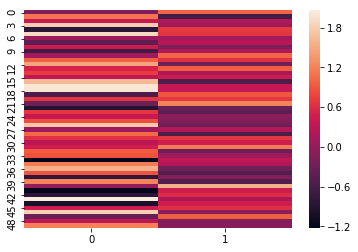

In [5]:
sns.heatmap(X)

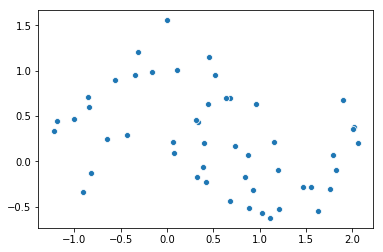

In [6]:
sns.scatterplot(X[:,0], X[:,1])

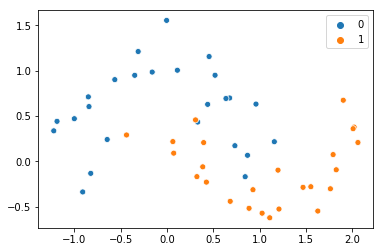

In [7]:
sns.scatterplot(X[:,0], X[:,1], hue=y)

# Implement a sigmoid function that accepts NumPy arrays:

In [8]:
def sigmoid(x):
    return 1.0 / (1.0 + np.e ** -x)

def feed_forward(X, weights):
    """
    1. calculate the dot product of X                                       (N, 3)
       d1 = np.dot(X, weights[0])
       and the weights of the first layer                        (2, 3) --> (N, 2)
    2. apply the sigmoid function on the result                             (N, 2) return this
       output1 = sigmoid(d1)
    3. append an extra 1 for the bias to the result (see Ex.7)              (N, 3)
       X = np.hstack([X, np.ones((X.shape[0], 1))]) 
    4. calculate the dot product of X                             
       and the weights of the second layer                       (1, 3) --> (N, 1)
       d2 = np.dot(input2, weights[1])
    5. apply the sigmoid function on the result                             (N, 1) return this
       output2 = sigmoid(d2)
    6. return all intermediate results of the sigmoids                                                 
    """
    d1 = np.dot(X, weights[0])
    output1 = sigmoid(d1)
    input2 = np.hstack([output1, np.ones((output1.shape[0], 1))]) 
    d2 = np.dot(input2, weights[1])
    output2 = sigmoid(d2)
    return output1, output2

def accuracy(ytrue, ypred):
    ypred = ypred.round().flatten().astype(np.int64)
    return sum(ypred == ytrue) / y.shape[0]

def loss(ytrue, ypred):
    """calculate the log loss"""
    return -(ytrue * np.log(ypred) + (1 + ytrue) * np.log(1 - ypred))

def get_weights():
    weights = [
           np.random.rand(3, 2),  # two neurons in the first layer
           np.random.rand(3, 1),  # neuron in the second layer
    ]
    return weights






In [9]:
# Sigmoin function test it:

a = np.array([-10.0, -1.0, 0.0, 1.0, 10.0])
expected = np.array([0.0, 0.27, 0.5, 0.73, 1.0])
assert np.all(sigmoid(a).round(2) == expected)

In [10]:
sigmoid(a)

array([4.53978687e-05, 2.68941421e-01, 5.00000000e-01, 7.31058579e-01,
       9.99954602e-01])

# Use Numpy to add an extra column for the bias to your input:

In [13]:
# add an extra colmn for the bias!
X = np.hstack([X, np.ones((X.shape[0], 1))]) 

In [14]:
X

array([[-0.15856989,  0.98480618,  1.        ],
       [ 1.10900374, -0.62160223,  1.        ],
       [ 0.39641523,  0.20740869,  1.        ],
       [ 1.79239122,  0.07511293,  1.        ],
       [-0.84739307,  0.71154296,  1.        ],
       [ 1.90209657,  0.67432213,  1.        ],
       [ 0.0731551 ,  0.09079042,  1.        ],
       [-0.43566685,  0.29122072,  1.        ],
       [ 0.42577731, -0.22851359,  1.        ],
       [-0.64418143,  0.24144478,  1.        ],
       [ 0.11289285,  1.00510013,  1.        ],
       [ 0.96066405,  0.63183812,  1.        ],
       [ 1.46814927, -0.28580296,  1.        ],
       [ 0.5192833 ,  0.94984582,  1.        ],
       [ 0.73327397,  0.17310931,  1.        ],
       [ 0.33197143,  0.43375035,  1.        ],
       [ 1.62726102, -0.54736954,  1.        ],
       [ 2.01908805,  0.37804882,  1.        ],
       [ 2.00824323,  0.36058988,  1.        ],
       [-0.56195047,  0.90148197,  1.        ],
       [ 0.67647169,  0.69909987,  1.   

# Create the weights of the network of the form:

In [20]:
weights = get_weights()

In [21]:
weights

[array([[0.36222068, 0.5553768 ],
        [0.1067565 , 0.75546856],
        [0.75774141, 0.25009178]]), array([[0.27129711],
        [0.99437876],
        [0.73660654]])]

# Implement the feed-forward function - is with the sigmoid function!

In [26]:
out1, out2 = feed_forward(X, weights)

In [27]:
assert out1.shape == (50, 2)
assert out2.shape == (50, 1)


In [28]:
Xref = np.array([[1.0, 2.0, 1.0]])

wref = [np.array([[1.0, -1.0],

                  [2.0, -2.0],

                  [0.0,  0.0]

                    ]),

           np.array([[1.0], [-1.0], [0.5]])

          ]

In [29]:
out1, out2 = feed_forward(Xref, wref)

In [30]:
assert np.all(out1.round(2) == np.array([[0.99, 0.01]]))
assert np.all(out2.round(2) == np.array([[0.82]]))

In [36]:
def backpropagate(weights, out1, out2, X, ytrue, learning_rate=1.0):

    ypred = out2.flatten()

    error = (ypred - ytrue) * loss(ytrue, ypred)   # (N,)



    # calculate weight modification for output layer

    grad_y = ypred * (1 - ypred) * error    # (N,)

    out1_bias = np.hstack([out1, np.ones((out1.shape[0], 1))])

    delta_wout = np.dot(-grad_y, out1_bias) * learning_rate

    weights[1] += delta_wout.reshape((3,1))



    # calculate weight modification for hidden layer

    dp = np.dot(grad_y.reshape(50, 1), weights[1][:2].T)

    grad_h = out1 * (1 - out1) * dp

    delta_whiddden = np.dot(-grad_h.T, X) * learning_rate

    weights[0] += delta_whiddden.T



X, y = make_moons(n_samples=50, noise=0.2, random_state=42)



# add an extra column for the bias

X = np.hstack([X, np.ones((X.shape[0], 1))])



if __name__ == '__main__':

    acc = 0.0

    weights = get_weights()

    while acc < 0.90:

        out1, out2 = feed_forward(X, weights)

        backpropagate(weights, out1, out2, X, y, learning_rate=0.1)

        acc = accuracy(y, out2)

        vloss = loss(y, out2.flatten())

        print(f"accuracy: {acc:5.2}   loss: {sum(vloss):8.5}")

        # break # for testing

accuracy:   0.5   loss:   126.86
accuracy:   0.5   loss:   102.29
accuracy:   0.5   loss:   98.384
accuracy:   0.5   loss:   98.744
accuracy:   0.5   loss:   99.054
accuracy:   0.5   loss:   99.358
accuracy:   0.5   loss:   99.655
accuracy:   0.5   loss:   99.948
accuracy:   0.5   loss:   100.24
accuracy:   0.5   loss:   100.52
accuracy:   0.5   loss:   100.81
accuracy:   0.5   loss:    101.1
accuracy:   0.5   loss:   101.38
accuracy:   0.5   loss:   101.67
accuracy:   0.5   loss:   101.96
accuracy:   0.5   loss:   102.26
accuracy:   0.5   loss:   102.56
accuracy:   0.5   loss:   102.87
accuracy:   0.5   loss:   103.18
accuracy:   0.5   loss:   103.51
accuracy:   0.5   loss:   103.85
accuracy:   0.5   loss:    104.2
accuracy:   0.5   loss:   104.56
accuracy:   0.5   loss:   104.94
accuracy:   0.5   loss:   105.34
accuracy:   0.5   loss:   105.76
accuracy:   0.5   loss:   106.19
accuracy:  0.54   loss:   106.64
accuracy:  0.54   loss:   107.11
accuracy:  0.56   loss:   107.59
accuracy: 

accuracy:  0.82   loss:   141.37
accuracy:  0.82   loss:   141.38
accuracy:  0.82   loss:   141.39
accuracy:  0.82   loss:   141.39
accuracy:  0.82   loss:    141.4
accuracy:  0.82   loss:   141.41
accuracy:  0.82   loss:   141.42
accuracy:  0.82   loss:   141.42
accuracy:  0.82   loss:   141.43
accuracy:  0.82   loss:   141.44
accuracy:  0.82   loss:   141.45
accuracy:  0.82   loss:   141.46
accuracy:  0.82   loss:   141.46
accuracy:  0.82   loss:   141.47
accuracy:  0.82   loss:   141.48
accuracy:  0.82   loss:   141.49
accuracy:  0.82   loss:   141.49
accuracy:  0.82   loss:    141.5
accuracy:  0.82   loss:   141.51
accuracy:  0.82   loss:   141.52
accuracy:  0.82   loss:   141.53
accuracy:  0.82   loss:   141.53
accuracy:  0.82   loss:   141.54
accuracy:  0.82   loss:   141.55
accuracy:  0.82   loss:   141.56
accuracy:  0.82   loss:   141.56
accuracy:  0.82   loss:   141.57
accuracy:  0.82   loss:   141.58
accuracy:  0.82   loss:   141.59
accuracy:  0.82   loss:   141.59
accuracy: 

accuracy:  0.82   loss:    144.5
accuracy:  0.82   loss:    144.5
accuracy:  0.82   loss:   144.51
accuracy:  0.82   loss:   144.51
accuracy:  0.82   loss:   144.52
accuracy:  0.82   loss:   144.52
accuracy:  0.82   loss:   144.52
accuracy:  0.82   loss:   144.53
accuracy:  0.82   loss:   144.53
accuracy:  0.82   loss:   144.54
accuracy:  0.82   loss:   144.54
accuracy:  0.82   loss:   144.55
accuracy:  0.82   loss:   144.55
accuracy:  0.82   loss:   144.56
accuracy:  0.82   loss:   144.56
accuracy:  0.82   loss:   144.57
accuracy:  0.82   loss:   144.57
accuracy:  0.82   loss:   144.58
accuracy:  0.82   loss:   144.58
accuracy:  0.82   loss:   144.58
accuracy:  0.82   loss:   144.59
accuracy:  0.82   loss:   144.59
accuracy:  0.82   loss:    144.6
accuracy:  0.82   loss:    144.6
accuracy:  0.82   loss:   144.61
accuracy:  0.82   loss:   144.61
accuracy:  0.82   loss:   144.62
accuracy:  0.82   loss:   144.62
accuracy:  0.82   loss:   144.63
accuracy:  0.82   loss:   144.63
accuracy: 

accuracy:  0.82   loss:   146.46
accuracy:  0.82   loss:   146.47
accuracy:  0.82   loss:   146.47
accuracy:  0.82   loss:   146.47
accuracy:  0.82   loss:   146.47
accuracy:  0.82   loss:   146.47
accuracy:  0.82   loss:   146.48
accuracy:  0.82   loss:   146.48
accuracy:  0.82   loss:   146.48
accuracy:  0.82   loss:   146.48
accuracy:  0.82   loss:   146.49
accuracy:  0.82   loss:   146.49
accuracy:  0.82   loss:   146.49
accuracy:  0.82   loss:   146.49
accuracy:  0.82   loss:   146.49
accuracy:  0.82   loss:    146.5
accuracy:  0.82   loss:    146.5
accuracy:  0.82   loss:    146.5
accuracy:  0.82   loss:    146.5
accuracy:  0.82   loss:    146.5
accuracy:  0.82   loss:   146.51
accuracy:  0.82   loss:   146.51
accuracy:  0.82   loss:   146.51
accuracy:  0.82   loss:   146.51
accuracy:  0.82   loss:   146.51
accuracy:  0.82   loss:   146.52
accuracy:  0.82   loss:   146.52
accuracy:  0.82   loss:   146.52
accuracy:  0.82   loss:   146.52
accuracy:  0.82   loss:   146.52
accuracy: 

accuracy:  0.82   loss:   147.02
accuracy:  0.82   loss:   147.03
accuracy:  0.82   loss:   147.03
accuracy:  0.82   loss:   147.03
accuracy:  0.82   loss:   147.04
accuracy:  0.82   loss:   147.04
accuracy:  0.82   loss:   147.04
accuracy:  0.82   loss:   147.05
accuracy:  0.82   loss:   147.05
accuracy:  0.82   loss:   147.06
accuracy:  0.82   loss:   147.06
accuracy:  0.82   loss:   147.06
accuracy:  0.82   loss:   147.07
accuracy:  0.82   loss:   147.07
accuracy:  0.82   loss:   147.08
accuracy:  0.82   loss:   147.08
accuracy:  0.82   loss:   147.09
accuracy:  0.82   loss:   147.09
accuracy:  0.82   loss:   147.09
accuracy:  0.82   loss:    147.1
accuracy:  0.82   loss:    147.1
accuracy:  0.82   loss:   147.11
accuracy:  0.82   loss:   147.11
accuracy:  0.82   loss:   147.12
accuracy:  0.82   loss:   147.12
accuracy:  0.82   loss:   147.12
accuracy:  0.82   loss:   147.13
accuracy:  0.82   loss:   147.13
accuracy:  0.82   loss:   147.14
accuracy:  0.82   loss:   147.14
accuracy: 

accuracy:  0.82   loss:   152.47
accuracy:  0.82   loss:   152.49
accuracy:  0.82   loss:   152.51
accuracy:  0.82   loss:   152.53
accuracy:  0.82   loss:   152.54
accuracy:  0.82   loss:   152.56
accuracy:  0.82   loss:   152.58
accuracy:  0.82   loss:    152.6
accuracy:  0.82   loss:   152.62
accuracy:  0.82   loss:   152.64
accuracy:  0.82   loss:   152.66
accuracy:  0.82   loss:   152.68
accuracy:  0.82   loss:    152.7
accuracy:  0.82   loss:   152.72
accuracy:  0.82   loss:   152.74
accuracy:  0.82   loss:   152.76
accuracy:  0.82   loss:   152.78
accuracy:  0.82   loss:    152.8
accuracy:  0.82   loss:   152.82
accuracy:  0.82   loss:   152.84
accuracy:  0.82   loss:   152.86
accuracy:  0.82   loss:   152.88
accuracy:  0.82   loss:    152.9
accuracy:  0.82   loss:   152.91
accuracy:  0.82   loss:   152.93
accuracy:  0.82   loss:   152.95
accuracy:  0.82   loss:   152.97
accuracy:  0.82   loss:   152.99
accuracy:  0.82   loss:   153.01
accuracy:  0.82   loss:   153.03
accuracy: 

accuracy:  0.82   loss:   164.37
accuracy:  0.82   loss:    164.4
accuracy:  0.82   loss:   164.43
accuracy:  0.82   loss:   164.46
accuracy:  0.82   loss:   164.49
accuracy:  0.82   loss:   164.52
accuracy:  0.82   loss:   164.55
accuracy:  0.82   loss:   164.58
accuracy:  0.82   loss:   164.61
accuracy:  0.82   loss:   164.65
accuracy:  0.82   loss:   164.68
accuracy:  0.82   loss:   164.71
accuracy:  0.82   loss:   164.74
accuracy:  0.82   loss:   164.77
accuracy:  0.82   loss:    164.8
accuracy:  0.82   loss:   164.83
accuracy:  0.82   loss:   164.86
accuracy:  0.82   loss:   164.89
accuracy:  0.82   loss:   164.92
accuracy:  0.82   loss:   164.95
accuracy:  0.82   loss:   164.98
accuracy:  0.82   loss:   165.01
accuracy:  0.82   loss:   165.04
accuracy:  0.82   loss:   165.07
accuracy:  0.82   loss:    165.1
accuracy:  0.82   loss:   165.13
accuracy:  0.82   loss:   165.16
accuracy:  0.82   loss:    165.2
accuracy:  0.82   loss:   165.23
accuracy:  0.82   loss:   165.26
accuracy: 

accuracy:  0.82   loss:   180.64
accuracy:  0.82   loss:   180.68
accuracy:  0.82   loss:   180.72
accuracy:  0.82   loss:   180.76
accuracy:  0.82   loss:   180.79
accuracy:  0.82   loss:   180.83
accuracy:  0.82   loss:   180.87
accuracy:  0.82   loss:   180.91
accuracy:  0.82   loss:   180.94
accuracy:  0.82   loss:   180.98
accuracy:  0.82   loss:   181.02
accuracy:  0.82   loss:   181.06
accuracy:  0.82   loss:    181.1
accuracy:  0.82   loss:   181.13
accuracy:  0.82   loss:   181.17
accuracy:  0.82   loss:   181.21
accuracy:  0.82   loss:   181.25
accuracy:  0.82   loss:   181.28
accuracy:  0.82   loss:   181.32
accuracy:  0.82   loss:   181.36
accuracy:  0.82   loss:    181.4
accuracy:  0.82   loss:   181.43
accuracy:  0.82   loss:   181.47
accuracy:  0.82   loss:   181.51
accuracy:  0.82   loss:   181.55
accuracy:  0.82   loss:   181.59
accuracy:  0.82   loss:   181.62
accuracy:  0.82   loss:   181.66
accuracy:  0.82   loss:    181.7
accuracy:  0.82   loss:   181.74
accuracy: 

accuracy:  0.84   loss:   199.12
accuracy:  0.84   loss:   199.15
accuracy:  0.84   loss:   199.19
accuracy:  0.84   loss:   199.23
accuracy:  0.84   loss:   199.27
accuracy:  0.84   loss:   199.31
accuracy:  0.84   loss:   199.35
accuracy:  0.84   loss:   199.39
accuracy:  0.84   loss:   199.43
accuracy:  0.84   loss:   199.46
accuracy:  0.84   loss:    199.5
accuracy:  0.84   loss:   199.54
accuracy:  0.84   loss:   199.58
accuracy:  0.84   loss:   199.62
accuracy:  0.84   loss:   199.66
accuracy:  0.84   loss:    199.7
accuracy:  0.84   loss:   199.73
accuracy:  0.84   loss:   199.77
accuracy:  0.84   loss:   199.81
accuracy:  0.84   loss:   199.85
accuracy:  0.84   loss:   199.89
accuracy:  0.84   loss:   199.93
accuracy:  0.84   loss:   199.97
accuracy:  0.84   loss:    200.0
accuracy:  0.84   loss:   200.04
accuracy:  0.84   loss:   200.08
accuracy:  0.84   loss:   200.12
accuracy:  0.84   loss:   200.16
accuracy:  0.84   loss:    200.2
accuracy:  0.84   loss:   200.24
accuracy: 

accuracy:  0.84   loss:   216.58
accuracy:  0.84   loss:   216.61
accuracy:  0.84   loss:   216.64
accuracy:  0.84   loss:   216.68
accuracy:  0.84   loss:   216.71
accuracy:  0.84   loss:   216.74
accuracy:  0.84   loss:   216.77
accuracy:  0.84   loss:   216.81
accuracy:  0.84   loss:   216.84
accuracy:  0.84   loss:   216.87
accuracy:  0.84   loss:    216.9
accuracy:  0.84   loss:   216.94
accuracy:  0.84   loss:   216.97
accuracy:  0.84   loss:    217.0
accuracy:  0.84   loss:   217.03
accuracy:  0.84   loss:   217.07
accuracy:  0.84   loss:    217.1
accuracy:  0.84   loss:   217.13
accuracy:  0.84   loss:   217.16
accuracy:  0.84   loss:    217.2
accuracy:  0.84   loss:   217.23
accuracy:  0.84   loss:   217.26
accuracy:  0.84   loss:   217.29
accuracy:  0.84   loss:   217.33
accuracy:  0.84   loss:   217.36
accuracy:  0.84   loss:   217.39
accuracy:  0.84   loss:   217.42
accuracy:  0.84   loss:   217.45
accuracy:  0.84   loss:   217.49
accuracy:  0.84   loss:   217.52
accuracy: 

accuracy:  0.84   loss:   229.25
accuracy:  0.84   loss:   229.27
accuracy:  0.84   loss:    229.3
accuracy:  0.84   loss:   229.33
accuracy:  0.84   loss:   229.36
accuracy:  0.84   loss:   229.38
accuracy:  0.84   loss:   229.41
accuracy:  0.84   loss:   229.44
accuracy:  0.84   loss:   229.46
accuracy:  0.84   loss:   229.49
accuracy:  0.84   loss:   229.52
accuracy:  0.84   loss:   229.54
accuracy:  0.84   loss:   229.57
accuracy:  0.84   loss:    229.6
accuracy:  0.84   loss:   229.62
accuracy:  0.84   loss:   229.65
accuracy:  0.84   loss:   229.68
accuracy:  0.84   loss:    229.7
accuracy:  0.84   loss:   229.73
accuracy:  0.84   loss:   229.76
accuracy:  0.84   loss:   229.78
accuracy:  0.84   loss:   229.81
accuracy:  0.84   loss:   229.83
accuracy:  0.84   loss:   229.86
accuracy:  0.84   loss:   229.89
accuracy:  0.84   loss:   229.91
accuracy:  0.84   loss:   229.94
accuracy:  0.84   loss:   229.97
accuracy:  0.84   loss:   229.99
accuracy:  0.84   loss:   230.02
accuracy: 

accuracy:  0.84   loss:   238.68
accuracy:  0.84   loss:    238.7
accuracy:  0.84   loss:   238.72
accuracy:  0.84   loss:   238.75
accuracy:  0.84   loss:   238.77
accuracy:  0.84   loss:   238.79
accuracy:  0.84   loss:   238.81
accuracy:  0.84   loss:   238.84
accuracy:  0.84   loss:   238.86
accuracy:  0.84   loss:   238.88
accuracy:  0.84   loss:    238.9
accuracy:  0.84   loss:   238.93
accuracy:  0.84   loss:   238.95
accuracy:  0.84   loss:   238.97
accuracy:  0.84   loss:   238.99
accuracy:  0.84   loss:   239.02
accuracy:  0.84   loss:   239.04
accuracy:  0.84   loss:   239.06
accuracy:  0.84   loss:   239.08
accuracy:  0.84   loss:    239.1
accuracy:  0.84   loss:   239.13
accuracy:  0.84   loss:   239.15
accuracy:  0.84   loss:   239.17
accuracy:  0.84   loss:   239.19
accuracy:  0.84   loss:   239.22
accuracy:  0.84   loss:   239.24
accuracy:  0.84   loss:   239.26
accuracy:  0.84   loss:   239.28
accuracy:  0.84   loss:   239.31
accuracy:  0.84   loss:   239.33
accuracy: 

accuracy:  0.84   loss:   247.15
accuracy:  0.84   loss:   247.17
accuracy:  0.84   loss:   247.19
accuracy:  0.84   loss:   247.21
accuracy:  0.84   loss:   247.23
accuracy:  0.84   loss:   247.24
accuracy:  0.84   loss:   247.26
accuracy:  0.84   loss:   247.28
accuracy:  0.84   loss:    247.3
accuracy:  0.84   loss:   247.32
accuracy:  0.84   loss:   247.34
accuracy:  0.84   loss:   247.36
accuracy:  0.84   loss:   247.38
accuracy:  0.84   loss:   247.39
accuracy:  0.84   loss:   247.41
accuracy:  0.84   loss:   247.43
accuracy:  0.84   loss:   247.45
accuracy:  0.84   loss:   247.47
accuracy:  0.84   loss:   247.49
accuracy:  0.84   loss:   247.51
accuracy:  0.84   loss:   247.53
accuracy:  0.84   loss:   247.54
accuracy:  0.84   loss:   247.56
accuracy:  0.84   loss:   247.58
accuracy:  0.84   loss:    247.6
accuracy:  0.84   loss:   247.62
accuracy:  0.84   loss:   247.64
accuracy:  0.84   loss:   247.66
accuracy:  0.84   loss:   247.68
accuracy:  0.84   loss:   247.69
accuracy: 

accuracy:  0.84   loss:    255.8
accuracy:  0.84   loss:   255.81
accuracy:  0.84   loss:   255.83
accuracy:  0.84   loss:   255.85
accuracy:  0.84   loss:   255.86
accuracy:  0.84   loss:   255.88
accuracy:  0.84   loss:   255.89
accuracy:  0.84   loss:   255.91
accuracy:  0.84   loss:   255.92
accuracy:  0.84   loss:   255.94
accuracy:  0.84   loss:   255.96
accuracy:  0.84   loss:   255.97
accuracy:  0.84   loss:   255.99
accuracy:  0.84   loss:    256.0
accuracy:  0.84   loss:   256.02
accuracy:  0.84   loss:   256.03
accuracy:  0.84   loss:   256.05
accuracy:  0.84   loss:   256.06
accuracy:  0.84   loss:   256.08
accuracy:  0.84   loss:    256.1
accuracy:  0.84   loss:   256.11
accuracy:  0.84   loss:   256.13
accuracy:  0.84   loss:   256.14
accuracy:  0.84   loss:   256.16
accuracy:  0.84   loss:   256.17
accuracy:  0.84   loss:   256.19
accuracy:  0.84   loss:    256.2
accuracy:  0.84   loss:   256.22
accuracy:  0.84   loss:   256.24
accuracy:  0.84   loss:   256.25
accuracy: 

accuracy:  0.84   loss:    262.8
accuracy:  0.84   loss:   262.81
accuracy:  0.84   loss:   262.83
accuracy:  0.84   loss:   262.84
accuracy:  0.84   loss:   262.85
accuracy:  0.84   loss:   262.87
accuracy:  0.84   loss:   262.88
accuracy:  0.84   loss:   262.89
accuracy:  0.84   loss:   262.91
accuracy:  0.84   loss:   262.92
accuracy:  0.84   loss:   262.93
accuracy:  0.84   loss:   262.95
accuracy:  0.84   loss:   262.96
accuracy:  0.84   loss:   262.97
accuracy:  0.84   loss:   262.99
accuracy:  0.84   loss:    263.0
accuracy:  0.84   loss:   263.01
accuracy:  0.84   loss:   263.03
accuracy:  0.84   loss:   263.04
accuracy:  0.84   loss:   263.05
accuracy:  0.84   loss:   263.07
accuracy:  0.84   loss:   263.08
accuracy:  0.84   loss:   263.09
accuracy:  0.84   loss:   263.11
accuracy:  0.84   loss:   263.12
accuracy:  0.84   loss:   263.13
accuracy:  0.84   loss:   263.15
accuracy:  0.84   loss:   263.16
accuracy:  0.84   loss:   263.17
accuracy:  0.84   loss:   263.19
accuracy: 

accuracy:  0.84   loss:   268.28
accuracy:  0.84   loss:   268.29
accuracy:  0.84   loss:   268.31
accuracy:  0.84   loss:   268.32
accuracy:  0.84   loss:   268.33
accuracy:  0.84   loss:   268.34
accuracy:  0.84   loss:   268.35
accuracy:  0.84   loss:   268.37
accuracy:  0.84   loss:   268.38
accuracy:  0.84   loss:   268.39
accuracy:  0.84   loss:    268.4
accuracy:  0.84   loss:   268.41
accuracy:  0.84   loss:   268.43
accuracy:  0.84   loss:   268.44
accuracy:  0.84   loss:   268.45
accuracy:  0.84   loss:   268.46
accuracy:  0.84   loss:   268.47
accuracy:  0.84   loss:   268.48
accuracy:  0.84   loss:    268.5
accuracy:  0.84   loss:   268.51
accuracy:  0.84   loss:   268.52
accuracy:  0.84   loss:   268.53
accuracy:  0.84   loss:   268.54
accuracy:  0.84   loss:   268.56
accuracy:  0.84   loss:   268.57
accuracy:  0.84   loss:   268.58
accuracy:  0.84   loss:   268.59
accuracy:  0.84   loss:    268.6
accuracy:  0.84   loss:   268.61
accuracy:  0.84   loss:   268.63
accuracy: 

accuracy:  0.84   loss:   273.59
accuracy:  0.84   loss:    273.6
accuracy:  0.84   loss:   273.61
accuracy:  0.84   loss:   273.63
accuracy:  0.84   loss:   273.64
accuracy:  0.84   loss:   273.65
accuracy:  0.84   loss:   273.66
accuracy:  0.84   loss:   273.67
accuracy:  0.84   loss:   273.68
accuracy:  0.84   loss:   273.69
accuracy:  0.84   loss:    273.7
accuracy:  0.84   loss:   273.71
accuracy:  0.84   loss:   273.72
accuracy:  0.84   loss:   273.73
accuracy:  0.84   loss:   273.74
accuracy:  0.84   loss:   273.75
accuracy:  0.84   loss:   273.76
accuracy:  0.84   loss:   273.77
accuracy:  0.84   loss:   273.78
accuracy:  0.84   loss:   273.79
accuracy:  0.84   loss:   273.81
accuracy:  0.84   loss:   273.82
accuracy:  0.84   loss:   273.83
accuracy:  0.84   loss:   273.84
accuracy:  0.84   loss:   273.85
accuracy:  0.84   loss:   273.86
accuracy:  0.84   loss:   273.87
accuracy:  0.84   loss:   273.88
accuracy:  0.84   loss:   273.89
accuracy:  0.84   loss:    273.9
accuracy: 

accuracy:  0.84   loss:   277.74
accuracy:  0.84   loss:   277.75
accuracy:  0.84   loss:   277.76
accuracy:  0.84   loss:   277.77
accuracy:  0.84   loss:   277.78
accuracy:  0.84   loss:   277.79
accuracy:  0.84   loss:    277.8
accuracy:  0.84   loss:   277.81
accuracy:  0.84   loss:   277.82
accuracy:  0.84   loss:   277.83
accuracy:  0.84   loss:   277.84
accuracy:  0.84   loss:   277.85
accuracy:  0.84   loss:   277.86
accuracy:  0.84   loss:   277.87
accuracy:  0.84   loss:   277.88
accuracy:  0.84   loss:   277.89
accuracy:  0.84   loss:    277.9
accuracy:  0.84   loss:   277.91
accuracy:  0.84   loss:   277.92
accuracy:  0.84   loss:   277.93
accuracy:  0.84   loss:   277.94
accuracy:  0.84   loss:   277.95
accuracy:  0.84   loss:   277.96
accuracy:  0.84   loss:   277.97
accuracy:  0.84   loss:   277.98
accuracy:  0.84   loss:   277.99
accuracy:  0.84   loss:    278.0
accuracy:  0.84   loss:   278.01
accuracy:  0.84   loss:   278.01
accuracy:  0.84   loss:   278.02
accuracy: 

accuracy:  0.84   loss:   281.78
accuracy:  0.84   loss:   281.79
accuracy:  0.84   loss:    281.8
accuracy:  0.84   loss:    281.8
accuracy:  0.84   loss:   281.81
accuracy:  0.84   loss:   281.82
accuracy:  0.84   loss:   281.83
accuracy:  0.84   loss:   281.84
accuracy:  0.84   loss:   281.85
accuracy:  0.84   loss:   281.86
accuracy:  0.84   loss:   281.87
accuracy:  0.84   loss:   281.88
accuracy:  0.84   loss:   281.88
accuracy:  0.84   loss:   281.89
accuracy:  0.84   loss:    281.9
accuracy:  0.84   loss:   281.91
accuracy:  0.84   loss:   281.92
accuracy:  0.84   loss:   281.93
accuracy:  0.84   loss:   281.94
accuracy:  0.84   loss:   281.95
accuracy:  0.84   loss:   281.96
accuracy:  0.84   loss:   281.97
accuracy:  0.84   loss:   281.97
accuracy:  0.84   loss:   281.98
accuracy:  0.84   loss:   281.99
accuracy:  0.84   loss:    282.0
accuracy:  0.84   loss:   282.01
accuracy:  0.84   loss:   282.02
accuracy:  0.84   loss:   282.03
accuracy:  0.84   loss:   282.04
accuracy: 

accuracy:  0.84   loss:   285.03
accuracy:  0.84   loss:   285.04
accuracy:  0.84   loss:   285.05
accuracy:  0.84   loss:   285.06
accuracy:  0.84   loss:   285.06
accuracy:  0.84   loss:   285.07
accuracy:  0.84   loss:   285.08
accuracy:  0.84   loss:   285.09
accuracy:  0.84   loss:    285.1
accuracy:  0.84   loss:   285.11
accuracy:  0.84   loss:   285.11
accuracy:  0.84   loss:   285.12
accuracy:  0.84   loss:   285.13
accuracy:  0.84   loss:   285.14
accuracy:  0.84   loss:   285.15
accuracy:  0.84   loss:   285.16
accuracy:  0.84   loss:   285.16
accuracy:  0.84   loss:   285.17
accuracy:  0.84   loss:   285.18
accuracy:  0.84   loss:   285.19
accuracy:  0.84   loss:    285.2
accuracy:  0.84   loss:   285.21
accuracy:  0.84   loss:   285.21
accuracy:  0.84   loss:   285.22
accuracy:  0.84   loss:   285.23
accuracy:  0.84   loss:   285.24
accuracy:  0.84   loss:   285.25
accuracy:  0.84   loss:   285.26
accuracy:  0.84   loss:   285.26
accuracy:  0.84   loss:   285.27
accuracy: 

accuracy:  0.84   loss:   287.99
accuracy:  0.84   loss:    288.0
accuracy:  0.84   loss:   288.01
accuracy:  0.84   loss:   288.02
accuracy:  0.84   loss:   288.02
accuracy:  0.84   loss:   288.03
accuracy:  0.84   loss:   288.04
accuracy:  0.84   loss:   288.05
accuracy:  0.84   loss:   288.06
accuracy:  0.84   loss:   288.06
accuracy:  0.84   loss:   288.07
accuracy:  0.84   loss:   288.08
accuracy:  0.84   loss:   288.09
accuracy:  0.84   loss:    288.1
accuracy:  0.84   loss:    288.1
accuracy:  0.84   loss:   288.11
accuracy:  0.84   loss:   288.12
accuracy:  0.84   loss:   288.13
accuracy:  0.84   loss:   288.13
accuracy:  0.84   loss:   288.14
accuracy:  0.84   loss:   288.15
accuracy:  0.84   loss:   288.16
accuracy:  0.84   loss:   288.17
accuracy:  0.84   loss:   288.17
accuracy:  0.84   loss:   288.18
accuracy:  0.84   loss:   288.19
accuracy:  0.84   loss:    288.2
accuracy:  0.84   loss:   288.21
accuracy:  0.84   loss:   288.21
accuracy:  0.84   loss:   288.22
accuracy: 

accuracy:  0.84   loss:   291.06
accuracy:  0.84   loss:   291.07
accuracy:  0.84   loss:   291.08
accuracy:  0.84   loss:   291.09
accuracy:  0.84   loss:   291.09
accuracy:  0.84   loss:    291.1
accuracy:  0.84   loss:   291.11
accuracy:  0.84   loss:   291.12
accuracy:  0.84   loss:   291.12
accuracy:  0.84   loss:   291.13
accuracy:  0.84   loss:   291.14
accuracy:  0.84   loss:   291.15
accuracy:  0.84   loss:   291.15
accuracy:  0.84   loss:   291.16
accuracy:  0.84   loss:   291.17
accuracy:  0.84   loss:   291.18
accuracy:  0.84   loss:   291.18
accuracy:  0.84   loss:   291.19
accuracy:  0.84   loss:    291.2
accuracy:  0.84   loss:   291.21
accuracy:  0.84   loss:   291.21
accuracy:  0.84   loss:   291.22
accuracy:  0.84   loss:   291.23
accuracy:  0.84   loss:   291.24
accuracy:  0.84   loss:   291.24
accuracy:  0.84   loss:   291.25
accuracy:  0.84   loss:   291.26
accuracy:  0.84   loss:   291.27
accuracy:  0.84   loss:   291.27
accuracy:  0.84   loss:   291.28
accuracy: 

accuracy:  0.84   loss:   294.13
accuracy:  0.84   loss:   294.14
accuracy:  0.84   loss:   294.14
accuracy:  0.84   loss:   294.15
accuracy:  0.84   loss:   294.16
accuracy:  0.84   loss:   294.17
accuracy:  0.84   loss:   294.17
accuracy:  0.84   loss:   294.18
accuracy:  0.84   loss:   294.19
accuracy:  0.84   loss:   294.19
accuracy:  0.84   loss:    294.2
accuracy:  0.84   loss:   294.21
accuracy:  0.84   loss:   294.22
accuracy:  0.84   loss:   294.22
accuracy:  0.84   loss:   294.23
accuracy:  0.84   loss:   294.24
accuracy:  0.84   loss:   294.24
accuracy:  0.84   loss:   294.25
accuracy:  0.84   loss:   294.26
accuracy:  0.84   loss:   294.26
accuracy:  0.84   loss:   294.27
accuracy:  0.84   loss:   294.28
accuracy:  0.84   loss:   294.29
accuracy:  0.84   loss:   294.29
accuracy:  0.84   loss:    294.3
accuracy:  0.84   loss:   294.31
accuracy:  0.84   loss:   294.31
accuracy:  0.84   loss:   294.32
accuracy:  0.84   loss:   294.33
accuracy:  0.84   loss:   294.33
accuracy: 

accuracy:  0.84   loss:   297.06
accuracy:  0.84   loss:   297.07
accuracy:  0.84   loss:   297.08
accuracy:  0.84   loss:   297.08
accuracy:  0.84   loss:   297.09
accuracy:  0.84   loss:    297.1
accuracy:  0.84   loss:    297.1
accuracy:  0.84   loss:   297.11
accuracy:  0.84   loss:   297.12
accuracy:  0.84   loss:   297.12
accuracy:  0.84   loss:   297.13
accuracy:  0.84   loss:   297.14
accuracy:  0.84   loss:   297.14
accuracy:  0.84   loss:   297.15
accuracy:  0.84   loss:   297.16
accuracy:  0.84   loss:   297.16
accuracy:  0.84   loss:   297.17
accuracy:  0.84   loss:   297.18
accuracy:  0.84   loss:   297.18
accuracy:  0.84   loss:   297.19
accuracy:  0.84   loss:    297.2
accuracy:  0.84   loss:    297.2
accuracy:  0.84   loss:   297.21
accuracy:  0.84   loss:   297.22
accuracy:  0.84   loss:   297.22
accuracy:  0.84   loss:   297.23
accuracy:  0.84   loss:   297.24
accuracy:  0.84   loss:   297.24
accuracy:  0.84   loss:   297.25
accuracy:  0.84   loss:   297.26
accuracy: 

accuracy:  0.84   loss:   299.78
accuracy:  0.84   loss:   299.79
accuracy:  0.84   loss:   299.79
accuracy:  0.84   loss:    299.8
accuracy:  0.84   loss:    299.8
accuracy:  0.84   loss:   299.81
accuracy:  0.84   loss:   299.82
accuracy:  0.84   loss:   299.82
accuracy:  0.84   loss:   299.83
accuracy:  0.84   loss:   299.84
accuracy:  0.84   loss:   299.84
accuracy:  0.84   loss:   299.85
accuracy:  0.84   loss:   299.86
accuracy:  0.84   loss:   299.86
accuracy:  0.84   loss:   299.87
accuracy:  0.84   loss:   299.87
accuracy:  0.84   loss:   299.88
accuracy:  0.84   loss:   299.89
accuracy:  0.84   loss:   299.89
accuracy:  0.84   loss:    299.9
accuracy:  0.84   loss:   299.91
accuracy:  0.84   loss:   299.91
accuracy:  0.84   loss:   299.92
accuracy:  0.84   loss:   299.93
accuracy:  0.84   loss:   299.93
accuracy:  0.84   loss:   299.94
accuracy:  0.84   loss:   299.94
accuracy:  0.84   loss:   299.95
accuracy:  0.84   loss:   299.96
accuracy:  0.84   loss:   299.96
accuracy: 

accuracy:  0.84   loss:   301.93
accuracy:  0.84   loss:   301.93
accuracy:  0.84   loss:   301.94
accuracy:  0.84   loss:   301.95
accuracy:  0.84   loss:   301.95
accuracy:  0.84   loss:   301.96
accuracy:  0.84   loss:   301.96
accuracy:  0.84   loss:   301.97
accuracy:  0.84   loss:   301.98
accuracy:  0.84   loss:   301.98
accuracy:  0.84   loss:   301.99
accuracy:  0.84   loss:    302.0
accuracy:  0.84   loss:    302.0
accuracy:  0.84   loss:   302.01
accuracy:  0.84   loss:   302.01
accuracy:  0.84   loss:   302.02
accuracy:  0.84   loss:   302.03
accuracy:  0.84   loss:   302.03
accuracy:  0.84   loss:   302.04
accuracy:  0.84   loss:   302.04
accuracy:  0.84   loss:   302.05
accuracy:  0.84   loss:   302.06
accuracy:  0.84   loss:   302.06
accuracy:  0.84   loss:   302.07
accuracy:  0.84   loss:   302.07
accuracy:  0.84   loss:   302.08
accuracy:  0.84   loss:   302.09
accuracy:  0.84   loss:   302.09
accuracy:  0.84   loss:    302.1
accuracy:  0.84   loss:   302.11
accuracy: 

accuracy:  0.84   loss:   303.99
accuracy:  0.84   loss:   303.99
accuracy:  0.84   loss:    304.0
accuracy:  0.84   loss:   304.01
accuracy:  0.84   loss:   304.01
accuracy:  0.84   loss:   304.02
accuracy:  0.84   loss:   304.02
accuracy:  0.84   loss:   304.03
accuracy:  0.84   loss:   304.04
accuracy:  0.84   loss:   304.04
accuracy:  0.84   loss:   304.05
accuracy:  0.84   loss:   304.05
accuracy:  0.84   loss:   304.06
accuracy:  0.84   loss:   304.07
accuracy:  0.84   loss:   304.07
accuracy:  0.84   loss:   304.08
accuracy:  0.84   loss:   304.08
accuracy:  0.84   loss:   304.09
accuracy:  0.84   loss:    304.1
accuracy:  0.84   loss:    304.1
accuracy:  0.84   loss:   304.11
accuracy:  0.84   loss:   304.11
accuracy:  0.84   loss:   304.12
accuracy:  0.84   loss:   304.13
accuracy:  0.84   loss:   304.13
accuracy:  0.84   loss:   304.14
accuracy:  0.84   loss:   304.14
accuracy:  0.84   loss:   304.15
accuracy:  0.84   loss:   304.16
accuracy:  0.84   loss:   304.16
accuracy: 

accuracy:  0.84   loss:   306.11
accuracy:  0.84   loss:   306.12
accuracy:  0.84   loss:   306.13
accuracy:  0.84   loss:   306.13
accuracy:  0.84   loss:   306.14
accuracy:  0.84   loss:   306.14
accuracy:  0.84   loss:   306.15
accuracy:  0.84   loss:   306.16
accuracy:  0.84   loss:   306.16
accuracy:  0.84   loss:   306.17
accuracy:  0.84   loss:   306.17
accuracy:  0.84   loss:   306.18
accuracy:  0.84   loss:   306.18
accuracy:  0.84   loss:   306.19
accuracy:  0.84   loss:    306.2
accuracy:  0.84   loss:    306.2
accuracy:  0.84   loss:   306.21
accuracy:  0.84   loss:   306.21
accuracy:  0.84   loss:   306.22
accuracy:  0.84   loss:   306.22
accuracy:  0.84   loss:   306.23
accuracy:  0.84   loss:   306.24
accuracy:  0.84   loss:   306.24
accuracy:  0.84   loss:   306.25
accuracy:  0.84   loss:   306.25
accuracy:  0.84   loss:   306.26
accuracy:  0.84   loss:   306.26
accuracy:  0.84   loss:   306.27
accuracy:  0.84   loss:   306.28
accuracy:  0.84   loss:   306.28
accuracy: 

accuracy:  0.84   loss:   308.11
accuracy:  0.84   loss:   308.12
accuracy:  0.84   loss:   308.13
accuracy:  0.84   loss:   308.13
accuracy:  0.84   loss:   308.14
accuracy:  0.84   loss:   308.14
accuracy:  0.84   loss:   308.15
accuracy:  0.84   loss:   308.15
accuracy:  0.84   loss:   308.16
accuracy:  0.84   loss:   308.16
accuracy:  0.84   loss:   308.17
accuracy:  0.84   loss:   308.18
accuracy:  0.84   loss:   308.18
accuracy:  0.84   loss:   308.19
accuracy:  0.84   loss:   308.19
accuracy:  0.84   loss:    308.2
accuracy:  0.84   loss:    308.2
accuracy:  0.84   loss:   308.21
accuracy:  0.84   loss:   308.21
accuracy:  0.84   loss:   308.22
accuracy:  0.84   loss:   308.23
accuracy:  0.84   loss:   308.23
accuracy:  0.84   loss:   308.24
accuracy:  0.84   loss:   308.24
accuracy:  0.84   loss:   308.25
accuracy:  0.84   loss:   308.25
accuracy:  0.84   loss:   308.26
accuracy:  0.84   loss:   308.26
accuracy:  0.84   loss:   308.27
accuracy:  0.84   loss:   308.28
accuracy: 

accuracy:  0.84   loss:   309.77
accuracy:  0.84   loss:   309.77
accuracy:  0.84   loss:   309.78
accuracy:  0.84   loss:   309.78
accuracy:  0.84   loss:   309.79
accuracy:  0.84   loss:   309.79
accuracy:  0.84   loss:    309.8
accuracy:  0.84   loss:    309.8
accuracy:  0.84   loss:   309.81
accuracy:  0.84   loss:   309.82
accuracy:  0.84   loss:   309.82
accuracy:  0.84   loss:   309.83
accuracy:  0.84   loss:   309.83
accuracy:  0.84   loss:   309.84
accuracy:  0.84   loss:   309.84
accuracy:  0.84   loss:   309.85
accuracy:  0.84   loss:   309.85
accuracy:  0.84   loss:   309.86
accuracy:  0.84   loss:   309.86
accuracy:  0.84   loss:   309.87
accuracy:  0.84   loss:   309.88
accuracy:  0.84   loss:   309.88
accuracy:  0.84   loss:   309.89
accuracy:  0.84   loss:   309.89
accuracy:  0.84   loss:    309.9
accuracy:  0.84   loss:    309.9
accuracy:  0.84   loss:   309.91
accuracy:  0.84   loss:   309.91
accuracy:  0.84   loss:   309.92
accuracy:  0.84   loss:   309.92
accuracy: 

accuracy:  0.84   loss:   311.41
accuracy:  0.84   loss:   311.41
accuracy:  0.84   loss:   311.42
accuracy:  0.84   loss:   311.43
accuracy:  0.84   loss:   311.43
accuracy:  0.84   loss:   311.44
accuracy:  0.84   loss:   311.44
accuracy:  0.84   loss:   311.45
accuracy:  0.84   loss:   311.45
accuracy:  0.84   loss:   311.46
accuracy:  0.84   loss:   311.46
accuracy:  0.84   loss:   311.47
accuracy:  0.84   loss:   311.47
accuracy:  0.84   loss:   311.48
accuracy:  0.84   loss:   311.48
accuracy:  0.84   loss:   311.49
accuracy:  0.84   loss:   311.49
accuracy:  0.84   loss:    311.5
accuracy:  0.84   loss:    311.5
accuracy:  0.84   loss:   311.51
accuracy:  0.84   loss:   311.52
accuracy:  0.84   loss:   311.52
accuracy:  0.84   loss:   311.53
accuracy:  0.84   loss:   311.53
accuracy:  0.84   loss:   311.54
accuracy:  0.84   loss:   311.54
accuracy:  0.84   loss:   311.55
accuracy:  0.84   loss:   311.55
accuracy:  0.84   loss:   311.56
accuracy:  0.84   loss:   311.56
accuracy: 

accuracy:  0.84   loss:   313.29
accuracy:  0.84   loss:    313.3
accuracy:  0.84   loss:    313.3
accuracy:  0.84   loss:   313.31
accuracy:  0.84   loss:   313.31
accuracy:  0.84   loss:   313.32
accuracy:  0.84   loss:   313.32
accuracy:  0.84   loss:   313.33
accuracy:  0.84   loss:   313.33
accuracy:  0.84   loss:   313.34
accuracy:  0.84   loss:   313.34
accuracy:  0.84   loss:   313.35
accuracy:  0.84   loss:   313.35
accuracy:  0.84   loss:   313.36
accuracy:  0.84   loss:   313.36
accuracy:  0.84   loss:   313.37
accuracy:  0.84   loss:   313.37
accuracy:  0.84   loss:   313.38
accuracy:  0.84   loss:   313.38
accuracy:  0.84   loss:   313.39
accuracy:  0.84   loss:   313.39
accuracy:  0.84   loss:    313.4
accuracy:  0.84   loss:    313.4
accuracy:  0.84   loss:   313.41
accuracy:  0.84   loss:   313.41
accuracy:  0.84   loss:   313.42
accuracy:  0.84   loss:   313.42
accuracy:  0.84   loss:   313.43
accuracy:  0.84   loss:   313.43
accuracy:  0.84   loss:   313.44
accuracy: 

accuracy:  0.84   loss:   314.67
accuracy:  0.84   loss:   314.67
accuracy:  0.84   loss:   314.68
accuracy:  0.84   loss:   314.68
accuracy:  0.84   loss:   314.69
accuracy:  0.84   loss:   314.69
accuracy:  0.84   loss:    314.7
accuracy:  0.84   loss:    314.7
accuracy:  0.84   loss:   314.71
accuracy:  0.84   loss:   314.71
accuracy:  0.84   loss:   314.72
accuracy:  0.84   loss:   314.72
accuracy:  0.84   loss:   314.73
accuracy:  0.84   loss:   314.73
accuracy:  0.84   loss:   314.74
accuracy:  0.84   loss:   314.74
accuracy:  0.84   loss:   314.75
accuracy:  0.84   loss:   314.75
accuracy:  0.84   loss:   314.76
accuracy:  0.84   loss:   314.76
accuracy:  0.84   loss:   314.77
accuracy:  0.84   loss:   314.77
accuracy:  0.84   loss:   314.78
accuracy:  0.84   loss:   314.78
accuracy:  0.84   loss:   314.79
accuracy:  0.84   loss:   314.79
accuracy:  0.84   loss:    314.8
accuracy:  0.84   loss:    314.8
accuracy:  0.84   loss:   314.81
accuracy:  0.84   loss:   314.81
accuracy: 

accuracy:  0.84   loss:   316.34
accuracy:  0.84   loss:   316.35
accuracy:  0.84   loss:   316.35
accuracy:  0.84   loss:   316.36
accuracy:  0.84   loss:   316.36
accuracy:  0.84   loss:   316.37
accuracy:  0.84   loss:   316.37
accuracy:  0.84   loss:   316.38
accuracy:  0.84   loss:   316.38
accuracy:  0.84   loss:   316.39
accuracy:  0.84   loss:   316.39
accuracy:  0.84   loss:    316.4
accuracy:  0.84   loss:    316.4
accuracy:  0.84   loss:   316.41
accuracy:  0.84   loss:   316.41
accuracy:  0.84   loss:   316.42
accuracy:  0.84   loss:   316.42
accuracy:  0.84   loss:   316.43
accuracy:  0.84   loss:   316.43
accuracy:  0.84   loss:   316.44
accuracy:  0.84   loss:   316.44
accuracy:  0.84   loss:   316.45
accuracy:  0.84   loss:   316.45
accuracy:  0.84   loss:   316.46
accuracy:  0.84   loss:   316.46
accuracy:  0.84   loss:   316.47
accuracy:  0.84   loss:   316.47
accuracy:  0.84   loss:   316.48
accuracy:  0.84   loss:   316.48
accuracy:  0.84   loss:   316.49
accuracy: 

accuracy:  0.84   loss:   317.93
accuracy:  0.84   loss:   317.94
accuracy:  0.84   loss:   317.94
accuracy:  0.84   loss:   317.95
accuracy:  0.84   loss:   317.95
accuracy:  0.84   loss:   317.95
accuracy:  0.84   loss:   317.96
accuracy:  0.84   loss:   317.96
accuracy:  0.84   loss:   317.97
accuracy:  0.84   loss:   317.97
accuracy:  0.84   loss:   317.98
accuracy:  0.84   loss:   317.98
accuracy:  0.84   loss:   317.99
accuracy:  0.84   loss:   317.99
accuracy:  0.84   loss:    318.0
accuracy:  0.84   loss:    318.0
accuracy:  0.84   loss:   318.01
accuracy:  0.84   loss:   318.01
accuracy:  0.84   loss:   318.02
accuracy:  0.84   loss:   318.02
accuracy:  0.84   loss:   318.03
accuracy:  0.84   loss:   318.03
accuracy:  0.84   loss:   318.04
accuracy:  0.84   loss:   318.04
accuracy:  0.84   loss:   318.05
accuracy:  0.84   loss:   318.05
accuracy:  0.84   loss:   318.06
accuracy:  0.84   loss:   318.06
accuracy:  0.84   loss:   318.07
accuracy:  0.84   loss:   318.07
accuracy: 

accuracy:  0.84   loss:   319.64
accuracy:  0.84   loss:   319.65
accuracy:  0.84   loss:   319.65
accuracy:  0.84   loss:   319.66
accuracy:  0.84   loss:   319.66
accuracy:  0.84   loss:   319.67
accuracy:  0.84   loss:   319.67
accuracy:  0.84   loss:   319.68
accuracy:  0.84   loss:   319.68
accuracy:  0.84   loss:   319.69
accuracy:  0.84   loss:   319.69
accuracy:  0.84   loss:   319.69
accuracy:  0.84   loss:    319.7
accuracy:  0.84   loss:    319.7
accuracy:  0.84   loss:   319.71
accuracy:  0.84   loss:   319.71
accuracy:  0.84   loss:   319.72
accuracy:  0.84   loss:   319.72
accuracy:  0.84   loss:   319.73
accuracy:  0.84   loss:   319.73
accuracy:  0.84   loss:   319.74
accuracy:  0.84   loss:   319.74
accuracy:  0.84   loss:   319.75
accuracy:  0.84   loss:   319.75
accuracy:  0.84   loss:   319.76
accuracy:  0.84   loss:   319.76
accuracy:  0.84   loss:   319.76
accuracy:  0.84   loss:   319.77
accuracy:  0.84   loss:   319.77
accuracy:  0.84   loss:   319.78
accuracy: 

accuracy:  0.84   loss:   321.31
accuracy:  0.84   loss:   321.32
accuracy:  0.84   loss:   321.32
accuracy:  0.84   loss:   321.33
accuracy:  0.84   loss:   321.33
accuracy:  0.84   loss:   321.33
accuracy:  0.84   loss:   321.34
accuracy:  0.84   loss:   321.34
accuracy:  0.84   loss:   321.35
accuracy:  0.84   loss:   321.35
accuracy:  0.84   loss:   321.36
accuracy:  0.84   loss:   321.36
accuracy:  0.84   loss:   321.37
accuracy:  0.84   loss:   321.37
accuracy:  0.84   loss:   321.38
accuracy:  0.84   loss:   321.38
accuracy:  0.84   loss:   321.38
accuracy:  0.84   loss:   321.39
accuracy:  0.84   loss:   321.39
accuracy:  0.84   loss:    321.4
accuracy:  0.84   loss:    321.4
accuracy:  0.84   loss:   321.41
accuracy:  0.84   loss:   321.41
accuracy:  0.84   loss:   321.42
accuracy:  0.84   loss:   321.42
accuracy:  0.84   loss:   321.43
accuracy:  0.84   loss:   321.43
accuracy:  0.84   loss:   321.43
accuracy:  0.84   loss:   321.44
accuracy:  0.84   loss:   321.44
accuracy: 

accuracy:  0.84   loss:   322.83
accuracy:  0.84   loss:   322.83
accuracy:  0.84   loss:   322.83
accuracy:  0.84   loss:   322.84
accuracy:  0.84   loss:   322.84
accuracy:  0.84   loss:   322.85
accuracy:  0.84   loss:   322.85
accuracy:  0.84   loss:   322.86
accuracy:  0.84   loss:   322.86
accuracy:  0.84   loss:   322.87
accuracy:  0.84   loss:   322.87
accuracy:  0.84   loss:   322.88
accuracy:  0.84   loss:   322.88
accuracy:  0.84   loss:   322.88
accuracy:  0.84   loss:   322.89
accuracy:  0.84   loss:   322.89
accuracy:  0.84   loss:    322.9
accuracy:  0.84   loss:    322.9
accuracy:  0.84   loss:   322.91
accuracy:  0.84   loss:   322.91
accuracy:  0.84   loss:   322.92
accuracy:  0.84   loss:   322.92
accuracy:  0.84   loss:   322.92
accuracy:  0.84   loss:   322.93
accuracy:  0.84   loss:   322.93
accuracy:  0.84   loss:   322.94
accuracy:  0.84   loss:   322.94
accuracy:  0.84   loss:   322.95
accuracy:  0.84   loss:   322.95
accuracy:  0.84   loss:   322.96
accuracy: 

accuracy:  0.84   loss:   324.43
accuracy:  0.84   loss:   324.44
accuracy:  0.84   loss:   324.44
accuracy:  0.84   loss:   324.45
accuracy:  0.84   loss:   324.45
accuracy:  0.84   loss:   324.46
accuracy:  0.84   loss:   324.46
accuracy:  0.84   loss:   324.46
accuracy:  0.84   loss:   324.47
accuracy:  0.84   loss:   324.47
accuracy:  0.84   loss:   324.48
accuracy:  0.84   loss:   324.48
accuracy:  0.84   loss:   324.49
accuracy:  0.84   loss:   324.49
accuracy:  0.84   loss:   324.49
accuracy:  0.84   loss:    324.5
accuracy:  0.84   loss:    324.5
accuracy:  0.84   loss:   324.51
accuracy:  0.84   loss:   324.51
accuracy:  0.84   loss:   324.52
accuracy:  0.84   loss:   324.52
accuracy:  0.84   loss:   324.53
accuracy:  0.84   loss:   324.53
accuracy:  0.84   loss:   324.53
accuracy:  0.84   loss:   324.54
accuracy:  0.84   loss:   324.54
accuracy:  0.84   loss:   324.55
accuracy:  0.84   loss:   324.55
accuracy:  0.84   loss:   324.56
accuracy:  0.84   loss:   324.56
accuracy: 

accuracy:  0.84   loss:   326.01
accuracy:  0.84   loss:   326.01
accuracy:  0.84   loss:   326.02
accuracy:  0.84   loss:   326.02
accuracy:  0.84   loss:   326.02
accuracy:  0.84   loss:   326.03
accuracy:  0.84   loss:   326.03
accuracy:  0.84   loss:   326.04
accuracy:  0.84   loss:   326.04
accuracy:  0.84   loss:   326.05
accuracy:  0.84   loss:   326.05
accuracy:  0.84   loss:   326.06
accuracy:  0.84   loss:   326.06
accuracy:  0.84   loss:   326.06
accuracy:  0.84   loss:   326.07
accuracy:  0.84   loss:   326.07
accuracy:  0.84   loss:   326.08
accuracy:  0.84   loss:   326.08
accuracy:  0.84   loss:   326.09
accuracy:  0.84   loss:   326.09
accuracy:  0.84   loss:   326.09
accuracy:  0.84   loss:    326.1
accuracy:  0.84   loss:    326.1
accuracy:  0.84   loss:   326.11
accuracy:  0.84   loss:   326.11
accuracy:  0.84   loss:   326.12
accuracy:  0.84   loss:   326.12
accuracy:  0.84   loss:   326.12
accuracy:  0.84   loss:   326.13
accuracy:  0.84   loss:   326.13
accuracy: 

accuracy:  0.84   loss:   327.49
accuracy:  0.84   loss:    327.5
accuracy:  0.84   loss:    327.5
accuracy:  0.84   loss:    327.5
accuracy:  0.84   loss:   327.51
accuracy:  0.84   loss:   327.51
accuracy:  0.84   loss:   327.52
accuracy:  0.84   loss:   327.52
accuracy:  0.84   loss:   327.53
accuracy:  0.84   loss:   327.53
accuracy:  0.84   loss:   327.53
accuracy:  0.84   loss:   327.54
accuracy:  0.84   loss:   327.54
accuracy:  0.84   loss:   327.55
accuracy:  0.84   loss:   327.55
accuracy:  0.84   loss:   327.56
accuracy:  0.84   loss:   327.56
accuracy:  0.84   loss:   327.56
accuracy:  0.84   loss:   327.57
accuracy:  0.84   loss:   327.57
accuracy:  0.84   loss:   327.58
accuracy:  0.84   loss:   327.58
accuracy:  0.84   loss:   327.58
accuracy:  0.84   loss:   327.59
accuracy:  0.84   loss:   327.59
accuracy:  0.84   loss:    327.6
accuracy:  0.84   loss:    327.6
accuracy:  0.84   loss:   327.61
accuracy:  0.84   loss:   327.61
accuracy:  0.84   loss:   327.61
accuracy: 

accuracy:  0.84   loss:   329.09
accuracy:  0.84   loss:   329.09
accuracy:  0.84   loss:   329.09
accuracy:  0.84   loss:    329.1
accuracy:  0.84   loss:    329.1
accuracy:  0.84   loss:   329.11
accuracy:  0.84   loss:   329.11
accuracy:  0.84   loss:   329.11
accuracy:  0.84   loss:   329.12
accuracy:  0.84   loss:   329.12
accuracy:  0.84   loss:   329.13
accuracy:  0.84   loss:   329.13
accuracy:  0.84   loss:   329.13
accuracy:  0.84   loss:   329.14
accuracy:  0.84   loss:   329.14
accuracy:  0.84   loss:   329.15
accuracy:  0.84   loss:   329.15
accuracy:  0.84   loss:   329.16
accuracy:  0.84   loss:   329.16
accuracy:  0.84   loss:   329.16
accuracy:  0.84   loss:   329.17
accuracy:  0.84   loss:   329.17
accuracy:  0.84   loss:   329.18
accuracy:  0.84   loss:   329.18
accuracy:  0.84   loss:   329.18
accuracy:  0.84   loss:   329.19
accuracy:  0.84   loss:   329.19
accuracy:  0.84   loss:    329.2
accuracy:  0.84   loss:    329.2
accuracy:  0.84   loss:   329.21
accuracy: 

accuracy:  0.84   loss:   330.88
accuracy:  0.84   loss:   330.88
accuracy:  0.84   loss:   330.89
accuracy:  0.84   loss:   330.89
accuracy:  0.84   loss:    330.9
accuracy:  0.84   loss:    330.9
accuracy:  0.84   loss:    330.9
accuracy:  0.84   loss:   330.91
accuracy:  0.84   loss:   330.91
accuracy:  0.84   loss:   330.92
accuracy:  0.84   loss:   330.92
accuracy:  0.84   loss:   330.92
accuracy:  0.84   loss:   330.93
accuracy:  0.84   loss:   330.93
accuracy:  0.84   loss:   330.94
accuracy:  0.84   loss:   330.94
accuracy:  0.84   loss:   330.94
accuracy:  0.84   loss:   330.95
accuracy:  0.84   loss:   330.95
accuracy:  0.84   loss:   330.96
accuracy:  0.84   loss:   330.96
accuracy:  0.84   loss:   330.96
accuracy:  0.84   loss:   330.97
accuracy:  0.84   loss:   330.97
accuracy:  0.84   loss:   330.98
accuracy:  0.84   loss:   330.98
accuracy:  0.84   loss:   330.98
accuracy:  0.84   loss:   330.99
accuracy:  0.84   loss:   330.99
accuracy:  0.84   loss:    331.0
accuracy: 

accuracy:  0.84   loss:   332.64
accuracy:  0.84   loss:   332.64
accuracy:  0.84   loss:   332.65
accuracy:  0.84   loss:   332.65
accuracy:  0.84   loss:   332.65
accuracy:  0.84   loss:   332.66
accuracy:  0.84   loss:   332.66
accuracy:  0.84   loss:   332.67
accuracy:  0.84   loss:   332.67
accuracy:  0.84   loss:   332.67
accuracy:  0.84   loss:   332.68
accuracy:  0.84   loss:   332.68
accuracy:  0.84   loss:   332.69
accuracy:  0.84   loss:   332.69
accuracy:  0.84   loss:   332.69
accuracy:  0.84   loss:    332.7
accuracy:  0.84   loss:    332.7
accuracy:  0.84   loss:   332.71
accuracy:  0.84   loss:   332.71
accuracy:  0.84   loss:   332.71
accuracy:  0.84   loss:   332.72
accuracy:  0.84   loss:   332.72
accuracy:  0.84   loss:   332.73
accuracy:  0.84   loss:   332.73
accuracy:  0.84   loss:   332.73
accuracy:  0.84   loss:   332.74
accuracy:  0.84   loss:   332.74
accuracy:  0.84   loss:   332.75
accuracy:  0.84   loss:   332.75
accuracy:  0.84   loss:   332.75
accuracy: 

accuracy:  0.84   loss:   334.35
accuracy:  0.84   loss:   334.36
accuracy:  0.84   loss:   334.36
accuracy:  0.84   loss:   334.37
accuracy:  0.84   loss:   334.37
accuracy:  0.84   loss:   334.37
accuracy:  0.84   loss:   334.38
accuracy:  0.84   loss:   334.38
accuracy:  0.84   loss:   334.39
accuracy:  0.84   loss:   334.39
accuracy:  0.84   loss:   334.39
accuracy:  0.84   loss:    334.4
accuracy:  0.84   loss:    334.4
accuracy:  0.84   loss:   334.41
accuracy:  0.84   loss:   334.41
accuracy:  0.84   loss:   334.41
accuracy:  0.84   loss:   334.42
accuracy:  0.84   loss:   334.42
accuracy:  0.84   loss:   334.42
accuracy:  0.84   loss:   334.43
accuracy:  0.84   loss:   334.43
accuracy:  0.84   loss:   334.44
accuracy:  0.84   loss:   334.44
accuracy:  0.84   loss:   334.44
accuracy:  0.84   loss:   334.45
accuracy:  0.84   loss:   334.45
accuracy:  0.84   loss:   334.46
accuracy:  0.84   loss:   334.46
accuracy:  0.84   loss:   334.46
accuracy:  0.84   loss:   334.47
accuracy: 

accuracy:  0.84   loss:   336.06
accuracy:  0.84   loss:   336.07
accuracy:  0.84   loss:   336.07
accuracy:  0.84   loss:   336.08
accuracy:  0.84   loss:   336.08
accuracy:  0.84   loss:   336.08
accuracy:  0.84   loss:   336.09
accuracy:  0.84   loss:   336.09
accuracy:  0.84   loss:   336.09
accuracy:  0.84   loss:    336.1
accuracy:  0.84   loss:    336.1
accuracy:  0.84   loss:   336.11
accuracy:  0.84   loss:   336.11
accuracy:  0.84   loss:   336.11
accuracy:  0.84   loss:   336.12
accuracy:  0.84   loss:   336.12
accuracy:  0.84   loss:   336.12
accuracy:  0.84   loss:   336.13
accuracy:  0.84   loss:   336.13
accuracy:  0.84   loss:   336.14
accuracy:  0.84   loss:   336.14
accuracy:  0.84   loss:   336.14
accuracy:  0.84   loss:   336.15
accuracy:  0.84   loss:   336.15
accuracy:  0.84   loss:   336.16
accuracy:  0.84   loss:   336.16
accuracy:  0.84   loss:   336.16
accuracy:  0.84   loss:   336.17
accuracy:  0.84   loss:   336.17
accuracy:  0.84   loss:   336.17
accuracy: 

accuracy:  0.84   loss:   337.71
accuracy:  0.84   loss:   337.71
accuracy:  0.84   loss:   337.72
accuracy:  0.84   loss:   337.72
accuracy:  0.84   loss:   337.72
accuracy:  0.84   loss:   337.73
accuracy:  0.84   loss:   337.73
accuracy:  0.84   loss:   337.74
accuracy:  0.84   loss:   337.74
accuracy:  0.84   loss:   337.74
accuracy:  0.84   loss:   337.75
accuracy:  0.84   loss:   337.75
accuracy:  0.84   loss:   337.75
accuracy:  0.84   loss:   337.76
accuracy:  0.84   loss:   337.76
accuracy:  0.84   loss:   337.77
accuracy:  0.84   loss:   337.77
accuracy:  0.84   loss:   337.77
accuracy:  0.84   loss:   337.78
accuracy:  0.84   loss:   337.78
accuracy:  0.84   loss:   337.78
accuracy:  0.84   loss:   337.79
accuracy:  0.84   loss:   337.79
accuracy:  0.84   loss:    337.8
accuracy:  0.84   loss:    337.8
accuracy:  0.84   loss:    337.8
accuracy:  0.84   loss:   337.81
accuracy:  0.84   loss:   337.81
accuracy:  0.84   loss:   337.81
accuracy:  0.84   loss:   337.82
accuracy: 

accuracy:  0.84   loss:   339.36
accuracy:  0.84   loss:   339.36
accuracy:  0.84   loss:   339.37
accuracy:  0.84   loss:   339.37
accuracy:  0.84   loss:   339.37
accuracy:  0.84   loss:   339.38
accuracy:  0.84   loss:   339.38
accuracy:  0.84   loss:   339.39
accuracy:  0.84   loss:   339.39
accuracy:  0.84   loss:   339.39
accuracy:  0.84   loss:    339.4
accuracy:  0.84   loss:    339.4
accuracy:  0.84   loss:    339.4
accuracy:  0.84   loss:   339.41
accuracy:  0.84   loss:   339.41
accuracy:  0.84   loss:   339.41
accuracy:  0.84   loss:   339.42
accuracy:  0.84   loss:   339.42
accuracy:  0.84   loss:   339.43
accuracy:  0.84   loss:   339.43
accuracy:  0.84   loss:   339.43
accuracy:  0.84   loss:   339.44
accuracy:  0.84   loss:   339.44
accuracy:  0.84   loss:   339.44
accuracy:  0.84   loss:   339.45
accuracy:  0.84   loss:   339.45
accuracy:  0.84   loss:   339.45
accuracy:  0.84   loss:   339.46
accuracy:  0.84   loss:   339.46
accuracy:  0.84   loss:   339.47
accuracy: 

accuracy:  0.84   loss:   340.96
accuracy:  0.84   loss:   340.96
accuracy:  0.84   loss:   340.97
accuracy:  0.84   loss:   340.97
accuracy:  0.84   loss:   340.98
accuracy:  0.84   loss:   340.98
accuracy:  0.84   loss:   340.98
accuracy:  0.84   loss:   340.99
accuracy:  0.84   loss:   340.99
accuracy:  0.84   loss:   340.99
accuracy:  0.84   loss:    341.0
accuracy:  0.84   loss:    341.0
accuracy:  0.84   loss:    341.0
accuracy:  0.84   loss:   341.01
accuracy:  0.84   loss:   341.01
accuracy:  0.84   loss:   341.02
accuracy:  0.84   loss:   341.02
accuracy:  0.84   loss:   341.02
accuracy:  0.84   loss:   341.03
accuracy:  0.84   loss:   341.03
accuracy:  0.84   loss:   341.03
accuracy:  0.84   loss:   341.04
accuracy:  0.84   loss:   341.04
accuracy:  0.84   loss:   341.04
accuracy:  0.84   loss:   341.05
accuracy:  0.84   loss:   341.05
accuracy:  0.84   loss:   341.06
accuracy:  0.84   loss:   341.06
accuracy:  0.84   loss:   341.06
accuracy:  0.84   loss:   341.07
accuracy: 

accuracy:  0.84   loss:    342.5
accuracy:  0.84   loss:    342.5
accuracy:  0.84   loss:   342.51
accuracy:  0.84   loss:   342.51
accuracy:  0.84   loss:   342.51
accuracy:  0.84   loss:   342.52
accuracy:  0.84   loss:   342.52
accuracy:  0.84   loss:   342.53
accuracy:  0.84   loss:   342.53
accuracy:  0.84   loss:   342.53
accuracy:  0.84   loss:   342.54
accuracy:  0.84   loss:   342.54
accuracy:  0.84   loss:   342.54
accuracy:  0.84   loss:   342.55
accuracy:  0.84   loss:   342.55
accuracy:  0.84   loss:   342.55
accuracy:  0.84   loss:   342.56
accuracy:  0.84   loss:   342.56
accuracy:  0.84   loss:   342.56
accuracy:  0.84   loss:   342.57
accuracy:  0.84   loss:   342.57
accuracy:  0.84   loss:   342.57
accuracy:  0.84   loss:   342.58
accuracy:  0.84   loss:   342.58
accuracy:  0.84   loss:   342.59
accuracy:  0.84   loss:   342.59
accuracy:  0.84   loss:   342.59
accuracy:  0.84   loss:    342.6
accuracy:  0.84   loss:    342.6
accuracy:  0.84   loss:    342.6
accuracy: 

accuracy:  0.84   loss:   344.05
accuracy:  0.84   loss:   344.05
accuracy:  0.84   loss:   344.06
accuracy:  0.84   loss:   344.06
accuracy:  0.84   loss:   344.06
accuracy:  0.84   loss:   344.07
accuracy:  0.84   loss:   344.07
accuracy:  0.84   loss:   344.07
accuracy:  0.84   loss:   344.08
accuracy:  0.84   loss:   344.08
accuracy:  0.84   loss:   344.08
accuracy:  0.84   loss:   344.09
accuracy:  0.84   loss:   344.09
accuracy:  0.84   loss:   344.09
accuracy:  0.84   loss:    344.1
accuracy:  0.84   loss:    344.1
accuracy:  0.84   loss:   344.11
accuracy:  0.84   loss:   344.11
accuracy:  0.84   loss:   344.11
accuracy:  0.84   loss:   344.12
accuracy:  0.84   loss:   344.12
accuracy:  0.84   loss:   344.12
accuracy:  0.84   loss:   344.13
accuracy:  0.84   loss:   344.13
accuracy:  0.84   loss:   344.13
accuracy:  0.84   loss:   344.14
accuracy:  0.84   loss:   344.14
accuracy:  0.84   loss:   344.14
accuracy:  0.84   loss:   344.15
accuracy:  0.84   loss:   344.15
accuracy: 

accuracy:  0.84   loss:   345.58
accuracy:  0.84   loss:   345.59
accuracy:  0.84   loss:   345.59
accuracy:  0.84   loss:   345.59
accuracy:  0.84   loss:    345.6
accuracy:  0.84   loss:    345.6
accuracy:  0.84   loss:    345.6
accuracy:  0.84   loss:   345.61
accuracy:  0.84   loss:   345.61
accuracy:  0.84   loss:   345.61
accuracy:  0.84   loss:   345.62
accuracy:  0.84   loss:   345.62
accuracy:  0.84   loss:   345.63
accuracy:  0.84   loss:   345.63
accuracy:  0.84   loss:   345.63
accuracy:  0.84   loss:   345.64
accuracy:  0.84   loss:   345.64
accuracy:  0.84   loss:   345.64
accuracy:  0.84   loss:   345.65
accuracy:  0.84   loss:   345.65
accuracy:  0.84   loss:   345.65
accuracy:  0.84   loss:   345.66
accuracy:  0.84   loss:   345.66
accuracy:  0.84   loss:   345.66
accuracy:  0.84   loss:   345.67
accuracy:  0.84   loss:   345.67
accuracy:  0.84   loss:   345.67
accuracy:  0.84   loss:   345.68
accuracy:  0.84   loss:   345.68
accuracy:  0.84   loss:   345.68
accuracy: 

accuracy:  0.84   loss:    347.0
accuracy:  0.84   loss:    347.0
accuracy:  0.84   loss:    347.0
accuracy:  0.84   loss:   347.01
accuracy:  0.84   loss:   347.01
accuracy:  0.84   loss:   347.01
accuracy:  0.84   loss:   347.02
accuracy:  0.84   loss:   347.02
accuracy:  0.84   loss:   347.02
accuracy:  0.84   loss:   347.03
accuracy:  0.84   loss:   347.03
accuracy:  0.84   loss:   347.03
accuracy:  0.84   loss:   347.04
accuracy:  0.84   loss:   347.04
accuracy:  0.84   loss:   347.04
accuracy:  0.84   loss:   347.05
accuracy:  0.84   loss:   347.05
accuracy:  0.84   loss:   347.05
accuracy:  0.84   loss:   347.06
accuracy:  0.84   loss:   347.06
accuracy:  0.84   loss:   347.06
accuracy:  0.84   loss:   347.07
accuracy:  0.84   loss:   347.07
accuracy:  0.84   loss:   347.07
accuracy:  0.84   loss:   347.08
accuracy:  0.84   loss:   347.08
accuracy:  0.84   loss:   347.08
accuracy:  0.84   loss:   347.09
accuracy:  0.84   loss:   347.09
accuracy:  0.84   loss:   347.09
accuracy: 

accuracy:  0.84   loss:   348.49
accuracy:  0.84   loss:   348.49
accuracy:  0.84   loss:    348.5
accuracy:  0.84   loss:    348.5
accuracy:  0.84   loss:    348.5
accuracy:  0.84   loss:   348.51
accuracy:  0.84   loss:   348.51
accuracy:  0.84   loss:   348.51
accuracy:  0.84   loss:   348.52
accuracy:  0.84   loss:   348.52
accuracy:  0.84   loss:   348.52
accuracy:  0.84   loss:   348.53
accuracy:  0.84   loss:   348.53
accuracy:  0.84   loss:   348.53
accuracy:  0.84   loss:   348.54
accuracy:  0.84   loss:   348.54
accuracy:  0.84   loss:   348.54
accuracy:  0.84   loss:   348.55
accuracy:  0.84   loss:   348.55
accuracy:  0.84   loss:   348.55
accuracy:  0.84   loss:   348.56
accuracy:  0.84   loss:   348.56
accuracy:  0.84   loss:   348.56
accuracy:  0.84   loss:   348.57
accuracy:  0.84   loss:   348.57
accuracy:  0.84   loss:   348.57
accuracy:  0.84   loss:   348.58
accuracy:  0.84   loss:   348.58
accuracy:  0.84   loss:   348.58
accuracy:  0.84   loss:   348.59
accuracy: 

accuracy:  0.84   loss:   350.04
accuracy:  0.84   loss:   350.05
accuracy:  0.84   loss:   350.05
accuracy:  0.84   loss:   350.05
accuracy:  0.84   loss:   350.06
accuracy:  0.84   loss:   350.06
accuracy:  0.84   loss:   350.06
accuracy:  0.84   loss:   350.07
accuracy:  0.84   loss:   350.07
accuracy:  0.84   loss:   350.07
accuracy:  0.84   loss:   350.08
accuracy:  0.84   loss:   350.08
accuracy:  0.84   loss:   350.08
accuracy:  0.84   loss:   350.09
accuracy:  0.84   loss:   350.09
accuracy:  0.84   loss:   350.09
accuracy:  0.84   loss:    350.1
accuracy:  0.84   loss:    350.1
accuracy:  0.84   loss:    350.1
accuracy:  0.84   loss:   350.11
accuracy:  0.84   loss:   350.11
accuracy:  0.84   loss:   350.11
accuracy:  0.84   loss:   350.12
accuracy:  0.84   loss:   350.12
accuracy:  0.84   loss:   350.12
accuracy:  0.84   loss:   350.13
accuracy:  0.84   loss:   350.13
accuracy:  0.84   loss:   350.13
accuracy:  0.84   loss:   350.13
accuracy:  0.84   loss:   350.14
accuracy: 

accuracy:  0.84   loss:   351.47
accuracy:  0.84   loss:   351.48
accuracy:  0.84   loss:   351.48
accuracy:  0.84   loss:   351.48
accuracy:  0.84   loss:   351.49
accuracy:  0.84   loss:   351.49
accuracy:  0.84   loss:   351.49
accuracy:  0.84   loss:    351.5
accuracy:  0.84   loss:    351.5
accuracy:  0.84   loss:    351.5
accuracy:  0.84   loss:   351.51
accuracy:  0.84   loss:   351.51
accuracy:  0.84   loss:   351.51
accuracy:  0.84   loss:   351.52
accuracy:  0.84   loss:   351.52
accuracy:  0.84   loss:   351.52
accuracy:  0.84   loss:   351.53
accuracy:  0.84   loss:   351.53
accuracy:  0.84   loss:   351.53
accuracy:  0.84   loss:   351.54
accuracy:  0.84   loss:   351.54
accuracy:  0.84   loss:   351.54
accuracy:  0.84   loss:   351.55
accuracy:  0.84   loss:   351.55
accuracy:  0.84   loss:   351.55
accuracy:  0.84   loss:   351.55
accuracy:  0.84   loss:   351.56
accuracy:  0.84   loss:   351.56
accuracy:  0.84   loss:   351.56
accuracy:  0.84   loss:   351.57
accuracy: 

accuracy:  0.84   loss:   352.92
accuracy:  0.84   loss:   352.92
accuracy:  0.84   loss:   352.92
accuracy:  0.84   loss:   352.93
accuracy:  0.84   loss:   352.93
accuracy:  0.84   loss:   352.93
accuracy:  0.84   loss:   352.94
accuracy:  0.84   loss:   352.94
accuracy:  0.84   loss:   352.94
accuracy:  0.84   loss:   352.95
accuracy:  0.84   loss:   352.95
accuracy:  0.84   loss:   352.95
accuracy:  0.84   loss:   352.95
accuracy:  0.84   loss:   352.96
accuracy:  0.84   loss:   352.96
accuracy:  0.84   loss:   352.96
accuracy:  0.84   loss:   352.97
accuracy:  0.84   loss:   352.97
accuracy:  0.84   loss:   352.97
accuracy:  0.84   loss:   352.98
accuracy:  0.84   loss:   352.98
accuracy:  0.84   loss:   352.98
accuracy:  0.84   loss:   352.99
accuracy:  0.84   loss:   352.99
accuracy:  0.84   loss:   352.99
accuracy:  0.84   loss:    353.0
accuracy:  0.84   loss:    353.0
accuracy:  0.84   loss:    353.0
accuracy:  0.84   loss:   353.01
accuracy:  0.84   loss:   353.01
accuracy: 

accuracy:  0.84   loss:   354.27
accuracy:  0.84   loss:   354.27
accuracy:  0.84   loss:   354.28
accuracy:  0.84   loss:   354.28
accuracy:  0.84   loss:   354.28
accuracy:  0.84   loss:   354.29
accuracy:  0.84   loss:   354.29
accuracy:  0.84   loss:   354.29
accuracy:  0.84   loss:   354.29
accuracy:  0.84   loss:    354.3
accuracy:  0.84   loss:    354.3
accuracy:  0.84   loss:    354.3
accuracy:  0.84   loss:   354.31
accuracy:  0.84   loss:   354.31
accuracy:  0.84   loss:   354.31
accuracy:  0.84   loss:   354.32
accuracy:  0.84   loss:   354.32
accuracy:  0.84   loss:   354.32
accuracy:  0.84   loss:   354.33
accuracy:  0.84   loss:   354.33
accuracy:  0.84   loss:   354.33
accuracy:  0.84   loss:   354.34
accuracy:  0.84   loss:   354.34
accuracy:  0.84   loss:   354.34
accuracy:  0.84   loss:   354.34
accuracy:  0.84   loss:   354.35
accuracy:  0.84   loss:   354.35
accuracy:  0.84   loss:   354.35
accuracy:  0.84   loss:   354.36
accuracy:  0.84   loss:   354.36
accuracy: 

accuracy:  0.84   loss:   355.62
accuracy:  0.84   loss:   355.63
accuracy:  0.84   loss:   355.63
accuracy:  0.84   loss:   355.63
accuracy:  0.84   loss:   355.64
accuracy:  0.84   loss:   355.64
accuracy:  0.84   loss:   355.64
accuracy:  0.84   loss:   355.64
accuracy:  0.84   loss:   355.65
accuracy:  0.84   loss:   355.65
accuracy:  0.84   loss:   355.65
accuracy:  0.84   loss:   355.66
accuracy:  0.84   loss:   355.66
accuracy:  0.84   loss:   355.66
accuracy:  0.84   loss:   355.67
accuracy:  0.84   loss:   355.67
accuracy:  0.84   loss:   355.67
accuracy:  0.84   loss:   355.68
accuracy:  0.84   loss:   355.68
accuracy:  0.84   loss:   355.68
accuracy:  0.84   loss:   355.69
accuracy:  0.84   loss:   355.69
accuracy:  0.84   loss:   355.69
accuracy:  0.84   loss:   355.69
accuracy:  0.84   loss:    355.7
accuracy:  0.84   loss:    355.7
accuracy:  0.84   loss:    355.7
accuracy:  0.84   loss:   355.71
accuracy:  0.84   loss:   355.71
accuracy:  0.84   loss:   355.71
accuracy: 

accuracy:  0.84   loss:   357.02
accuracy:  0.84   loss:   357.03
accuracy:  0.84   loss:   357.03
accuracy:  0.84   loss:   357.03
accuracy:  0.84   loss:   357.04
accuracy:  0.84   loss:   357.04
accuracy:  0.84   loss:   357.04
accuracy:  0.84   loss:   357.05
accuracy:  0.84   loss:   357.05
accuracy:  0.84   loss:   357.05
accuracy:  0.84   loss:   357.05
accuracy:  0.84   loss:   357.06
accuracy:  0.84   loss:   357.06
accuracy:  0.84   loss:   357.06
accuracy:  0.84   loss:   357.07
accuracy:  0.84   loss:   357.07
accuracy:  0.84   loss:   357.07
accuracy:  0.84   loss:   357.08
accuracy:  0.84   loss:   357.08
accuracy:  0.84   loss:   357.08
accuracy:  0.84   loss:   357.08
accuracy:  0.84   loss:   357.09
accuracy:  0.84   loss:   357.09
accuracy:  0.84   loss:   357.09
accuracy:  0.84   loss:    357.1
accuracy:  0.84   loss:    357.1
accuracy:  0.84   loss:    357.1
accuracy:  0.84   loss:   357.11
accuracy:  0.84   loss:   357.11
accuracy:  0.84   loss:   357.11
accuracy: 

accuracy:  0.84   loss:   358.26
accuracy:  0.84   loss:   358.27
accuracy:  0.84   loss:   358.27
accuracy:  0.84   loss:   358.27
accuracy:  0.84   loss:   358.28
accuracy:  0.84   loss:   358.28
accuracy:  0.84   loss:   358.28
accuracy:  0.84   loss:   358.28
accuracy:  0.84   loss:   358.29
accuracy:  0.84   loss:   358.29
accuracy:  0.84   loss:   358.29
accuracy:  0.84   loss:    358.3
accuracy:  0.84   loss:    358.3
accuracy:  0.84   loss:    358.3
accuracy:  0.84   loss:   358.31
accuracy:  0.84   loss:   358.31
accuracy:  0.84   loss:   358.31
accuracy:  0.84   loss:   358.31
accuracy:  0.84   loss:   358.32
accuracy:  0.84   loss:   358.32
accuracy:  0.84   loss:   358.32
accuracy:  0.84   loss:   358.33
accuracy:  0.84   loss:   358.33
accuracy:  0.84   loss:   358.33
accuracy:  0.84   loss:   358.34
accuracy:  0.84   loss:   358.34
accuracy:  0.84   loss:   358.34
accuracy:  0.84   loss:   358.34
accuracy:  0.84   loss:   358.35
accuracy:  0.84   loss:   358.35
accuracy: 

accuracy:  0.84   loss:   359.55
accuracy:  0.84   loss:   359.56
accuracy:  0.84   loss:   359.56
accuracy:  0.84   loss:   359.56
accuracy:  0.84   loss:   359.57
accuracy:  0.84   loss:   359.57
accuracy:  0.84   loss:   359.57
accuracy:  0.84   loss:   359.57
accuracy:  0.84   loss:   359.58
accuracy:  0.84   loss:   359.58
accuracy:  0.84   loss:   359.58
accuracy:  0.84   loss:   359.59
accuracy:  0.84   loss:   359.59
accuracy:  0.84   loss:   359.59
accuracy:  0.84   loss:    359.6
accuracy:  0.84   loss:    359.6
accuracy:  0.84   loss:    359.6
accuracy:  0.84   loss:    359.6
accuracy:  0.84   loss:   359.61
accuracy:  0.84   loss:   359.61
accuracy:  0.84   loss:   359.61
accuracy:  0.84   loss:   359.62
accuracy:  0.84   loss:   359.62
accuracy:  0.84   loss:   359.62
accuracy:  0.84   loss:   359.63
accuracy:  0.84   loss:   359.63
accuracy:  0.84   loss:   359.63
accuracy:  0.84   loss:   359.63
accuracy:  0.84   loss:   359.64
accuracy:  0.84   loss:   359.64
accuracy: 

accuracy:  0.84   loss:   360.57
accuracy:  0.84   loss:   360.57
accuracy:  0.84   loss:   360.58
accuracy:  0.84   loss:   360.58
accuracy:  0.84   loss:   360.58
accuracy:  0.84   loss:   360.59
accuracy:  0.84   loss:   360.59
accuracy:  0.84   loss:   360.59
accuracy:  0.84   loss:   360.59
accuracy:  0.84   loss:    360.6
accuracy:  0.84   loss:    360.6
accuracy:  0.84   loss:    360.6
accuracy:  0.84   loss:   360.61
accuracy:  0.84   loss:   360.61
accuracy:  0.84   loss:   360.61
accuracy:  0.84   loss:   360.62
accuracy:  0.84   loss:   360.62
accuracy:  0.84   loss:   360.62
accuracy:  0.84   loss:   360.62
accuracy:  0.84   loss:   360.63
accuracy:  0.84   loss:   360.63
accuracy:  0.84   loss:   360.63
accuracy:  0.84   loss:   360.64
accuracy:  0.84   loss:   360.64
accuracy:  0.84   loss:   360.64
accuracy:  0.84   loss:   360.65
accuracy:  0.84   loss:   360.65
accuracy:  0.84   loss:   360.65
accuracy:  0.84   loss:   360.65
accuracy:  0.84   loss:   360.66
accuracy: 

accuracy:  0.84   loss:   361.59
accuracy:  0.84   loss:   361.59
accuracy:  0.84   loss:    361.6
accuracy:  0.84   loss:    361.6
accuracy:  0.84   loss:    361.6
accuracy:  0.84   loss:    361.6
accuracy:  0.84   loss:   361.61
accuracy:  0.84   loss:   361.61
accuracy:  0.84   loss:   361.61
accuracy:  0.84   loss:   361.62
accuracy:  0.84   loss:   361.62
accuracy:  0.84   loss:   361.62
accuracy:  0.84   loss:   361.63
accuracy:  0.84   loss:   361.63
accuracy:  0.84   loss:   361.63
accuracy:  0.84   loss:   361.63
accuracy:  0.84   loss:   361.64
accuracy:  0.84   loss:   361.64
accuracy:  0.84   loss:   361.64
accuracy:  0.84   loss:   361.65
accuracy:  0.84   loss:   361.65
accuracy:  0.84   loss:   361.65
accuracy:  0.84   loss:   361.65
accuracy:  0.84   loss:   361.66
accuracy:  0.84   loss:   361.66
accuracy:  0.84   loss:   361.66
accuracy:  0.84   loss:   361.67
accuracy:  0.84   loss:   361.67
accuracy:  0.84   loss:   361.67
accuracy:  0.84   loss:   361.68
accuracy: 

accuracy:  0.84   loss:    362.7
accuracy:  0.84   loss:    362.7
accuracy:  0.84   loss:    362.7
accuracy:  0.84   loss:    362.7
accuracy:  0.84   loss:   362.71
accuracy:  0.84   loss:   362.71
accuracy:  0.84   loss:   362.71
accuracy:  0.84   loss:   362.72
accuracy:  0.84   loss:   362.72
accuracy:  0.84   loss:   362.72
accuracy:  0.84   loss:   362.72
accuracy:  0.84   loss:   362.73
accuracy:  0.84   loss:   362.73
accuracy:  0.84   loss:   362.73
accuracy:  0.84   loss:   362.74
accuracy:  0.84   loss:   362.74
accuracy:  0.84   loss:   362.74
accuracy:  0.84   loss:   362.74
accuracy:  0.84   loss:   362.75
accuracy:  0.84   loss:   362.75
accuracy:  0.84   loss:   362.75
accuracy:  0.84   loss:   362.76
accuracy:  0.84   loss:   362.76
accuracy:  0.84   loss:   362.76
accuracy:  0.84   loss:   362.77
accuracy:  0.84   loss:   362.77
accuracy:  0.84   loss:   362.77
accuracy:  0.84   loss:   362.77
accuracy:  0.84   loss:   362.78
accuracy:  0.84   loss:   362.78
accuracy: 

accuracy:  0.84   loss:   363.85
accuracy:  0.84   loss:   363.85
accuracy:  0.84   loss:   363.86
accuracy:  0.84   loss:   363.86
accuracy:  0.84   loss:   363.86
accuracy:  0.84   loss:   363.86
accuracy:  0.84   loss:   363.87
accuracy:  0.84   loss:   363.87
accuracy:  0.84   loss:   363.87
accuracy:  0.84   loss:   363.88
accuracy:  0.84   loss:   363.88
accuracy:  0.84   loss:   363.88
accuracy:  0.84   loss:   363.88
accuracy:  0.84   loss:   363.89
accuracy:  0.84   loss:   363.89
accuracy:  0.84   loss:   363.89
accuracy:  0.84   loss:    363.9
accuracy:  0.84   loss:    363.9
accuracy:  0.84   loss:    363.9
accuracy:  0.84   loss:    363.9
accuracy:  0.84   loss:   363.91
accuracy:  0.84   loss:   363.91
accuracy:  0.84   loss:   363.91
accuracy:  0.84   loss:   363.92
accuracy:  0.84   loss:   363.92
accuracy:  0.84   loss:   363.92
accuracy:  0.84   loss:   363.92
accuracy:  0.84   loss:   363.93
accuracy:  0.84   loss:   363.93
accuracy:  0.84   loss:   363.93
accuracy: 

accuracy:  0.84   loss:   365.08
accuracy:  0.84   loss:   365.09
accuracy:  0.84   loss:   365.09
accuracy:  0.84   loss:   365.09
accuracy:  0.84   loss:    365.1
accuracy:  0.84   loss:    365.1
accuracy:  0.84   loss:    365.1
accuracy:  0.84   loss:    365.1
accuracy:  0.84   loss:   365.11
accuracy:  0.84   loss:   365.11
accuracy:  0.84   loss:   365.11
accuracy:  0.84   loss:   365.12
accuracy:  0.84   loss:   365.12
accuracy:  0.84   loss:   365.12
accuracy:  0.84   loss:   365.12
accuracy:  0.84   loss:   365.13
accuracy:  0.84   loss:   365.13
accuracy:  0.84   loss:   365.13
accuracy:  0.84   loss:   365.14
accuracy:  0.84   loss:   365.14
accuracy:  0.84   loss:   365.14
accuracy:  0.84   loss:   365.14
accuracy:  0.84   loss:   365.15
accuracy:  0.84   loss:   365.15
accuracy:  0.84   loss:   365.15
accuracy:  0.84   loss:   365.16
accuracy:  0.84   loss:   365.16
accuracy:  0.84   loss:   365.16
accuracy:  0.84   loss:   365.16
accuracy:  0.84   loss:   365.17
accuracy: 

accuracy:  0.84   loss:   366.29
accuracy:  0.84   loss:   366.29
accuracy:  0.84   loss:   366.29
accuracy:  0.84   loss:    366.3
accuracy:  0.84   loss:    366.3
accuracy:  0.84   loss:    366.3
accuracy:  0.84   loss:    366.3
accuracy:  0.84   loss:   366.31
accuracy:  0.84   loss:   366.31
accuracy:  0.84   loss:   366.31
accuracy:  0.84   loss:   366.32
accuracy:  0.84   loss:   366.32
accuracy:  0.84   loss:   366.32
accuracy:  0.84   loss:   366.32
accuracy:  0.84   loss:   366.33
accuracy:  0.84   loss:   366.33
accuracy:  0.84   loss:   366.33
accuracy:  0.84   loss:   366.34
accuracy:  0.84   loss:   366.34
accuracy:  0.84   loss:   366.34
accuracy:  0.84   loss:   366.34
accuracy:  0.84   loss:   366.35
accuracy:  0.84   loss:   366.35
accuracy:  0.84   loss:   366.35
accuracy:  0.84   loss:   366.36
accuracy:  0.84   loss:   366.36
accuracy:  0.84   loss:   366.36
accuracy:  0.84   loss:   366.36
accuracy:  0.84   loss:   366.37
accuracy:  0.84   loss:   366.37
accuracy: 

accuracy:  0.84   loss:   367.56
accuracy:  0.84   loss:   367.56
accuracy:  0.84   loss:   367.56
accuracy:  0.84   loss:   367.56
accuracy:  0.84   loss:   367.57
accuracy:  0.84   loss:   367.57
accuracy:  0.84   loss:   367.57
accuracy:  0.84   loss:   367.58
accuracy:  0.84   loss:   367.58
accuracy:  0.84   loss:   367.58
accuracy:  0.84   loss:   367.58
accuracy:  0.84   loss:   367.59
accuracy:  0.84   loss:   367.59
accuracy:  0.84   loss:   367.59
accuracy:  0.84   loss:   367.59
accuracy:  0.84   loss:    367.6
accuracy:  0.84   loss:    367.6
accuracy:  0.84   loss:    367.6
accuracy:  0.84   loss:   367.61
accuracy:  0.84   loss:   367.61
accuracy:  0.84   loss:   367.61
accuracy:  0.84   loss:   367.61
accuracy:  0.84   loss:   367.62
accuracy:  0.84   loss:   367.62
accuracy:  0.84   loss:   367.62
accuracy:  0.84   loss:   367.62
accuracy:  0.84   loss:   367.63
accuracy:  0.84   loss:   367.63
accuracy:  0.84   loss:   367.63
accuracy:  0.84   loss:   367.64
accuracy: 

accuracy:  0.84   loss:   368.76
accuracy:  0.84   loss:   368.77
accuracy:  0.84   loss:   368.77
accuracy:  0.84   loss:   368.77
accuracy:  0.84   loss:   368.78
accuracy:  0.84   loss:   368.78
accuracy:  0.84   loss:   368.78
accuracy:  0.84   loss:   368.78
accuracy:  0.84   loss:   368.79
accuracy:  0.84   loss:   368.79
accuracy:  0.84   loss:   368.79
accuracy:  0.84   loss:   368.79
accuracy:  0.84   loss:    368.8
accuracy:  0.84   loss:    368.8
accuracy:  0.84   loss:    368.8
accuracy:  0.84   loss:   368.81
accuracy:  0.84   loss:   368.81
accuracy:  0.84   loss:   368.81
accuracy:  0.84   loss:   368.81
accuracy:  0.84   loss:   368.82
accuracy:  0.84   loss:   368.82
accuracy:  0.84   loss:   368.82
accuracy:  0.84   loss:   368.82
accuracy:  0.84   loss:   368.83
accuracy:  0.84   loss:   368.83
accuracy:  0.84   loss:   368.83
accuracy:  0.84   loss:   368.84
accuracy:  0.84   loss:   368.84
accuracy:  0.84   loss:   368.84
accuracy:  0.84   loss:   368.84
accuracy: 

accuracy:  0.84   loss:   370.01
accuracy:  0.84   loss:   370.01
accuracy:  0.84   loss:   370.01
accuracy:  0.84   loss:   370.02
accuracy:  0.84   loss:   370.02
accuracy:  0.84   loss:   370.02
accuracy:  0.84   loss:   370.02
accuracy:  0.84   loss:   370.03
accuracy:  0.84   loss:   370.03
accuracy:  0.84   loss:   370.03
accuracy:  0.84   loss:   370.04
accuracy:  0.84   loss:   370.04
accuracy:  0.84   loss:   370.04
accuracy:  0.84   loss:   370.04
accuracy:  0.84   loss:   370.05
accuracy:  0.84   loss:   370.05
accuracy:  0.84   loss:   370.05
accuracy:  0.84   loss:   370.05
accuracy:  0.84   loss:   370.06
accuracy:  0.84   loss:   370.06
accuracy:  0.84   loss:   370.06
accuracy:  0.84   loss:   370.07
accuracy:  0.84   loss:   370.07
accuracy:  0.84   loss:   370.07
accuracy:  0.84   loss:   370.07
accuracy:  0.84   loss:   370.08
accuracy:  0.84   loss:   370.08
accuracy:  0.84   loss:   370.08
accuracy:  0.84   loss:   370.08
accuracy:  0.84   loss:   370.09
accuracy: 

accuracy:  0.84   loss:   371.22
accuracy:  0.84   loss:   371.22
accuracy:  0.84   loss:   371.23
accuracy:  0.84   loss:   371.23
accuracy:  0.84   loss:   371.23
accuracy:  0.84   loss:   371.23
accuracy:  0.84   loss:   371.24
accuracy:  0.84   loss:   371.24
accuracy:  0.84   loss:   371.24
accuracy:  0.84   loss:   371.25
accuracy:  0.84   loss:   371.25
accuracy:  0.84   loss:   371.25
accuracy:  0.84   loss:   371.25
accuracy:  0.84   loss:   371.26
accuracy:  0.84   loss:   371.26
accuracy:  0.84   loss:   371.26
accuracy:  0.84   loss:   371.26
accuracy:  0.84   loss:   371.27
accuracy:  0.84   loss:   371.27
accuracy:  0.84   loss:   371.27
accuracy:  0.84   loss:   371.27
accuracy:  0.84   loss:   371.28
accuracy:  0.84   loss:   371.28
accuracy:  0.84   loss:   371.28
accuracy:  0.84   loss:   371.29
accuracy:  0.84   loss:   371.29
accuracy:  0.84   loss:   371.29
accuracy:  0.84   loss:   371.29
accuracy:  0.84   loss:    371.3
accuracy:  0.84   loss:    371.3
accuracy: 

accuracy:  0.84   loss:   372.35
accuracy:  0.84   loss:   372.35
accuracy:  0.84   loss:   372.36
accuracy:  0.84   loss:   372.36
accuracy:  0.84   loss:   372.36
accuracy:  0.84   loss:   372.37
accuracy:  0.84   loss:   372.37
accuracy:  0.84   loss:   372.37
accuracy:  0.84   loss:   372.37
accuracy:  0.84   loss:   372.38
accuracy:  0.84   loss:   372.38
accuracy:  0.84   loss:   372.38
accuracy:  0.84   loss:   372.38
accuracy:  0.84   loss:   372.39
accuracy:  0.84   loss:   372.39
accuracy:  0.84   loss:   372.39
accuracy:  0.84   loss:   372.39
accuracy:  0.84   loss:    372.4
accuracy:  0.84   loss:    372.4
accuracy:  0.84   loss:    372.4
accuracy:  0.84   loss:    372.4
accuracy:  0.84   loss:   372.41
accuracy:  0.84   loss:   372.41
accuracy:  0.84   loss:   372.41
accuracy:  0.84   loss:   372.42
accuracy:  0.84   loss:   372.42
accuracy:  0.84   loss:   372.42
accuracy:  0.84   loss:   372.42
accuracy:  0.84   loss:   372.43
accuracy:  0.84   loss:   372.43
accuracy: 

accuracy:  0.84   loss:   373.51
accuracy:  0.84   loss:   373.52
accuracy:  0.84   loss:   373.52
accuracy:  0.84   loss:   373.52
accuracy:  0.84   loss:   373.52
accuracy:  0.84   loss:   373.53
accuracy:  0.84   loss:   373.53
accuracy:  0.84   loss:   373.53
accuracy:  0.84   loss:   373.53
accuracy:  0.84   loss:   373.54
accuracy:  0.84   loss:   373.54
accuracy:  0.84   loss:   373.54
accuracy:  0.84   loss:   373.54
accuracy:  0.84   loss:   373.55
accuracy:  0.84   loss:   373.55
accuracy:  0.84   loss:   373.55
accuracy:  0.84   loss:   373.55
accuracy:  0.84   loss:   373.56
accuracy:  0.84   loss:   373.56
accuracy:  0.84   loss:   373.56
accuracy:  0.84   loss:   373.56
accuracy:  0.84   loss:   373.57
accuracy:  0.84   loss:   373.57
accuracy:  0.84   loss:   373.57
accuracy:  0.84   loss:   373.58
accuracy:  0.84   loss:   373.58
accuracy:  0.84   loss:   373.58
accuracy:  0.84   loss:   373.58
accuracy:  0.84   loss:   373.59
accuracy:  0.84   loss:   373.59
accuracy: 

accuracy:  0.84   loss:   374.67
accuracy:  0.84   loss:   374.67
accuracy:  0.84   loss:   374.67
accuracy:  0.84   loss:   374.67
accuracy:  0.84   loss:   374.68
accuracy:  0.84   loss:   374.68
accuracy:  0.84   loss:   374.68
accuracy:  0.84   loss:   374.68
accuracy:  0.84   loss:   374.69
accuracy:  0.84   loss:   374.69
accuracy:  0.84   loss:   374.69
accuracy:  0.84   loss:   374.69
accuracy:  0.84   loss:    374.7
accuracy:  0.84   loss:    374.7
accuracy:  0.84   loss:    374.7
accuracy:  0.84   loss:    374.7
accuracy:  0.84   loss:   374.71
accuracy:  0.84   loss:   374.71
accuracy:  0.84   loss:   374.71
accuracy:  0.84   loss:   374.71
accuracy:  0.84   loss:   374.72
accuracy:  0.84   loss:   374.72
accuracy:  0.84   loss:   374.72
accuracy:  0.84   loss:   374.73
accuracy:  0.84   loss:   374.73
accuracy:  0.84   loss:   374.73
accuracy:  0.84   loss:   374.73
accuracy:  0.84   loss:   374.74
accuracy:  0.84   loss:   374.74
accuracy:  0.84   loss:   374.74
accuracy: 

accuracy:  0.84   loss:   375.78
accuracy:  0.84   loss:   375.78
accuracy:  0.84   loss:   375.78
accuracy:  0.84   loss:   375.78
accuracy:  0.84   loss:   375.79
accuracy:  0.84   loss:   375.79
accuracy:  0.84   loss:   375.79
accuracy:  0.84   loss:   375.79
accuracy:  0.84   loss:    375.8
accuracy:  0.84   loss:    375.8
accuracy:  0.84   loss:    375.8
accuracy:  0.84   loss:    375.8
accuracy:  0.84   loss:   375.81
accuracy:  0.84   loss:   375.81
accuracy:  0.84   loss:   375.81
accuracy:  0.84   loss:   375.81
accuracy:  0.84   loss:   375.82
accuracy:  0.84   loss:   375.82
accuracy:  0.84   loss:   375.82
accuracy:  0.84   loss:   375.82
accuracy:  0.84   loss:   375.83
accuracy:  0.84   loss:   375.83
accuracy:  0.84   loss:   375.83
accuracy:  0.84   loss:   375.83
accuracy:  0.84   loss:   375.84
accuracy:  0.84   loss:   375.84
accuracy:  0.84   loss:   375.84
accuracy:  0.84   loss:   375.84
accuracy:  0.84   loss:   375.85
accuracy:  0.84   loss:   375.85
accuracy: 

accuracy:  0.84   loss:   376.85
accuracy:  0.84   loss:   376.86
accuracy:  0.84   loss:   376.86
accuracy:  0.84   loss:   376.86
accuracy:  0.84   loss:   376.86
accuracy:  0.84   loss:   376.87
accuracy:  0.84   loss:   376.87
accuracy:  0.84   loss:   376.87
accuracy:  0.84   loss:   376.87
accuracy:  0.84   loss:   376.88
accuracy:  0.84   loss:   376.88
accuracy:  0.84   loss:   376.88
accuracy:  0.84   loss:   376.88
accuracy:  0.84   loss:   376.89
accuracy:  0.84   loss:   376.89
accuracy:  0.84   loss:   376.89
accuracy:  0.84   loss:   376.89
accuracy:  0.84   loss:    376.9
accuracy:  0.84   loss:    376.9
accuracy:  0.84   loss:    376.9
accuracy:  0.84   loss:    376.9
accuracy:  0.84   loss:   376.91
accuracy:  0.84   loss:   376.91
accuracy:  0.84   loss:   376.91
accuracy:  0.84   loss:   376.91
accuracy:  0.84   loss:   376.92
accuracy:  0.84   loss:   376.92
accuracy:  0.84   loss:   376.92
accuracy:  0.84   loss:   376.92
accuracy:  0.84   loss:   376.93
accuracy: 

accuracy:  0.84   loss:    377.9
accuracy:  0.84   loss:    377.9
accuracy:  0.84   loss:    377.9
accuracy:  0.84   loss:   377.91
accuracy:  0.84   loss:   377.91
accuracy:  0.84   loss:   377.91
accuracy:  0.84   loss:   377.91
accuracy:  0.84   loss:   377.92
accuracy:  0.84   loss:   377.92
accuracy:  0.84   loss:   377.92
accuracy:  0.84   loss:   377.92
accuracy:  0.84   loss:   377.93
accuracy:  0.84   loss:   377.93
accuracy:  0.84   loss:   377.93
accuracy:  0.84   loss:   377.93
accuracy:  0.84   loss:   377.94
accuracy:  0.84   loss:   377.94
accuracy:  0.84   loss:   377.94
accuracy:  0.84   loss:   377.94
accuracy:  0.84   loss:   377.95
accuracy:  0.84   loss:   377.95
accuracy:  0.84   loss:   377.95
accuracy:  0.84   loss:   377.95
accuracy:  0.84   loss:   377.96
accuracy:  0.84   loss:   377.96
accuracy:  0.84   loss:   377.96
accuracy:  0.84   loss:   377.96
accuracy:  0.84   loss:   377.97
accuracy:  0.84   loss:   377.97
accuracy:  0.84   loss:   377.97
accuracy: 

accuracy:  0.84   loss:   378.95
accuracy:  0.84   loss:   378.96
accuracy:  0.84   loss:   378.96
accuracy:  0.84   loss:   378.96
accuracy:  0.84   loss:   378.96
accuracy:  0.84   loss:   378.97
accuracy:  0.84   loss:   378.97
accuracy:  0.84   loss:   378.97
accuracy:  0.84   loss:   378.97
accuracy:  0.84   loss:   378.98
accuracy:  0.84   loss:   378.98
accuracy:  0.84   loss:   378.98
accuracy:  0.84   loss:   378.98
accuracy:  0.84   loss:   378.99
accuracy:  0.84   loss:   378.99
accuracy:  0.84   loss:   378.99
accuracy:  0.84   loss:   378.99
accuracy:  0.84   loss:    379.0
accuracy:  0.84   loss:    379.0
accuracy:  0.84   loss:    379.0
accuracy:  0.84   loss:    379.0
accuracy:  0.84   loss:   379.01
accuracy:  0.84   loss:   379.01
accuracy:  0.84   loss:   379.01
accuracy:  0.84   loss:   379.01
accuracy:  0.84   loss:   379.02
accuracy:  0.84   loss:   379.02
accuracy:  0.84   loss:   379.02
accuracy:  0.84   loss:   379.02
accuracy:  0.84   loss:   379.03
accuracy: 

accuracy:  0.84   loss:   380.05
accuracy:  0.84   loss:   380.05
accuracy:  0.84   loss:   380.05
accuracy:  0.84   loss:   380.06
accuracy:  0.84   loss:   380.06
accuracy:  0.84   loss:   380.06
accuracy:  0.84   loss:   380.06
accuracy:  0.84   loss:   380.07
accuracy:  0.84   loss:   380.07
accuracy:  0.84   loss:   380.07
accuracy:  0.84   loss:   380.07
accuracy:  0.84   loss:   380.08
accuracy:  0.84   loss:   380.08
accuracy:  0.84   loss:   380.08
accuracy:  0.84   loss:   380.08
accuracy:  0.84   loss:   380.09
accuracy:  0.84   loss:   380.09
accuracy:  0.84   loss:   380.09
accuracy:  0.84   loss:   380.09
accuracy:  0.84   loss:    380.1
accuracy:  0.84   loss:    380.1
accuracy:  0.84   loss:    380.1
accuracy:  0.84   loss:    380.1
accuracy:  0.84   loss:   380.11
accuracy:  0.84   loss:   380.11
accuracy:  0.84   loss:   380.11
accuracy:  0.84   loss:   380.11
accuracy:  0.84   loss:   380.12
accuracy:  0.84   loss:   380.12
accuracy:  0.84   loss:   380.12
accuracy: 

accuracy:  0.84   loss:   381.17
accuracy:  0.84   loss:   381.17
accuracy:  0.84   loss:   381.18
accuracy:  0.84   loss:   381.18
accuracy:  0.84   loss:   381.18
accuracy:  0.84   loss:   381.18
accuracy:  0.84   loss:   381.19
accuracy:  0.84   loss:   381.19
accuracy:  0.84   loss:   381.19
accuracy:  0.84   loss:   381.19
accuracy:  0.84   loss:    381.2
accuracy:  0.84   loss:    381.2
accuracy:  0.84   loss:    381.2
accuracy:  0.84   loss:    381.2
accuracy:  0.84   loss:   381.21
accuracy:  0.84   loss:   381.21
accuracy:  0.84   loss:   381.21
accuracy:  0.84   loss:   381.21
accuracy:  0.84   loss:   381.22
accuracy:  0.84   loss:   381.22
accuracy:  0.84   loss:   381.22
accuracy:  0.84   loss:   381.22
accuracy:  0.84   loss:   381.23
accuracy:  0.84   loss:   381.23
accuracy:  0.84   loss:   381.23
accuracy:  0.84   loss:   381.23
accuracy:  0.84   loss:   381.23
accuracy:  0.84   loss:   381.24
accuracy:  0.84   loss:   381.24
accuracy:  0.84   loss:   381.24
accuracy: 

accuracy:  0.84   loss:   382.29
accuracy:  0.84   loss:   382.29
accuracy:  0.84   loss:   382.29
accuracy:  0.84   loss:   382.29
accuracy:  0.84   loss:    382.3
accuracy:  0.84   loss:    382.3
accuracy:  0.84   loss:    382.3
accuracy:  0.84   loss:    382.3
accuracy:  0.84   loss:   382.31
accuracy:  0.84   loss:   382.31
accuracy:  0.84   loss:   382.31
accuracy:  0.84   loss:   382.31
accuracy:  0.84   loss:   382.32
accuracy:  0.84   loss:   382.32
accuracy:  0.84   loss:   382.32
accuracy:  0.84   loss:   382.32
accuracy:  0.84   loss:   382.33
accuracy:  0.84   loss:   382.33
accuracy:  0.84   loss:   382.33
accuracy:  0.84   loss:   382.33
accuracy:  0.84   loss:   382.34
accuracy:  0.84   loss:   382.34
accuracy:  0.84   loss:   382.34
accuracy:  0.84   loss:   382.34
accuracy:  0.84   loss:   382.35
accuracy:  0.84   loss:   382.35
accuracy:  0.84   loss:   382.35
accuracy:  0.84   loss:   382.35
accuracy:  0.84   loss:   382.35
accuracy:  0.84   loss:   382.36
accuracy: 

accuracy:  0.84   loss:   383.34
accuracy:  0.84   loss:   383.34
accuracy:  0.84   loss:   383.34
accuracy:  0.84   loss:   383.34
accuracy:  0.84   loss:   383.35
accuracy:  0.84   loss:   383.35
accuracy:  0.84   loss:   383.35
accuracy:  0.84   loss:   383.35
accuracy:  0.84   loss:   383.36
accuracy:  0.84   loss:   383.36
accuracy:  0.84   loss:   383.36
accuracy:  0.84   loss:   383.36
accuracy:  0.84   loss:   383.36
accuracy:  0.84   loss:   383.37
accuracy:  0.84   loss:   383.37
accuracy:  0.84   loss:   383.37
accuracy:  0.84   loss:   383.37
accuracy:  0.84   loss:   383.38
accuracy:  0.84   loss:   383.38
accuracy:  0.84   loss:   383.38
accuracy:  0.84   loss:   383.38
accuracy:  0.84   loss:   383.39
accuracy:  0.84   loss:   383.39
accuracy:  0.84   loss:   383.39
accuracy:  0.84   loss:   383.39
accuracy:  0.84   loss:    383.4
accuracy:  0.84   loss:    383.4
accuracy:  0.84   loss:    383.4
accuracy:  0.84   loss:    383.4
accuracy:  0.84   loss:   383.41
accuracy: 

accuracy:  0.84   loss:   384.35
accuracy:  0.84   loss:   384.35
accuracy:  0.84   loss:   384.36
accuracy:  0.84   loss:   384.36
accuracy:  0.84   loss:   384.36
accuracy:  0.84   loss:   384.36
accuracy:  0.84   loss:   384.37
accuracy:  0.84   loss:   384.37
accuracy:  0.84   loss:   384.37
accuracy:  0.84   loss:   384.37
accuracy:  0.84   loss:   384.37
accuracy:  0.84   loss:   384.38
accuracy:  0.84   loss:   384.38
accuracy:  0.84   loss:   384.38
accuracy:  0.84   loss:   384.38
accuracy:  0.84   loss:   384.39
accuracy:  0.84   loss:   384.39
accuracy:  0.84   loss:   384.39
accuracy:  0.84   loss:   384.39
accuracy:  0.84   loss:    384.4
accuracy:  0.84   loss:    384.4
accuracy:  0.84   loss:    384.4
accuracy:  0.84   loss:    384.4
accuracy:  0.84   loss:   384.41
accuracy:  0.84   loss:   384.41
accuracy:  0.84   loss:   384.41
accuracy:  0.84   loss:   384.41
accuracy:  0.84   loss:   384.41
accuracy:  0.84   loss:   384.42
accuracy:  0.84   loss:   384.42
accuracy: 

accuracy:  0.84   loss:    385.4
accuracy:  0.84   loss:    385.4
accuracy:  0.84   loss:    385.4
accuracy:  0.84   loss:   385.41
accuracy:  0.84   loss:   385.41
accuracy:  0.84   loss:   385.41
accuracy:  0.84   loss:   385.41
accuracy:  0.84   loss:   385.41
accuracy:  0.84   loss:   385.42
accuracy:  0.84   loss:   385.42
accuracy:  0.84   loss:   385.42
accuracy:  0.84   loss:   385.42
accuracy:  0.84   loss:   385.43
accuracy:  0.84   loss:   385.43
accuracy:  0.84   loss:   385.43
accuracy:  0.84   loss:   385.43
accuracy:  0.84   loss:   385.44
accuracy:  0.84   loss:   385.44
accuracy:  0.84   loss:   385.44
accuracy:  0.84   loss:   385.44
accuracy:  0.84   loss:   385.45
accuracy:  0.84   loss:   385.45
accuracy:  0.84   loss:   385.45
accuracy:  0.84   loss:   385.45
accuracy:  0.84   loss:   385.45
accuracy:  0.84   loss:   385.46
accuracy:  0.84   loss:   385.46
accuracy:  0.84   loss:   385.46
accuracy:  0.84   loss:   385.46
accuracy:  0.84   loss:   385.47
accuracy: 

accuracy:  0.84   loss:   386.47
accuracy:  0.84   loss:   386.47
accuracy:  0.84   loss:   386.48
accuracy:  0.84   loss:   386.48
accuracy:  0.84   loss:   386.48
accuracy:  0.84   loss:   386.48
accuracy:  0.84   loss:   386.49
accuracy:  0.84   loss:   386.49
accuracy:  0.84   loss:   386.49
accuracy:  0.84   loss:   386.49
accuracy:  0.84   loss:    386.5
accuracy:  0.84   loss:    386.5
accuracy:  0.84   loss:    386.5
accuracy:  0.84   loss:    386.5
accuracy:  0.84   loss:    386.5
accuracy:  0.84   loss:   386.51
accuracy:  0.84   loss:   386.51
accuracy:  0.84   loss:   386.51
accuracy:  0.84   loss:   386.51
accuracy:  0.84   loss:   386.52
accuracy:  0.84   loss:   386.52
accuracy:  0.84   loss:   386.52
accuracy:  0.84   loss:   386.52
accuracy:  0.84   loss:   386.53
accuracy:  0.84   loss:   386.53
accuracy:  0.84   loss:   386.53
accuracy:  0.84   loss:   386.53
accuracy:  0.84   loss:   386.53
accuracy:  0.84   loss:   386.54
accuracy:  0.84   loss:   386.54
accuracy: 

accuracy:  0.84   loss:   387.46
accuracy:  0.84   loss:   387.46
accuracy:  0.84   loss:   387.46
accuracy:  0.84   loss:   387.47
accuracy:  0.84   loss:   387.47
accuracy:  0.84   loss:   387.47
accuracy:  0.84   loss:   387.47
accuracy:  0.84   loss:   387.48
accuracy:  0.84   loss:   387.48
accuracy:  0.84   loss:   387.48
accuracy:  0.84   loss:   387.48
accuracy:  0.84   loss:   387.48
accuracy:  0.84   loss:   387.49
accuracy:  0.84   loss:   387.49
accuracy:  0.84   loss:   387.49
accuracy:  0.84   loss:   387.49
accuracy:  0.84   loss:    387.5
accuracy:  0.84   loss:    387.5
accuracy:  0.84   loss:    387.5
accuracy:  0.84   loss:    387.5
accuracy:  0.84   loss:   387.51
accuracy:  0.84   loss:   387.51
accuracy:  0.84   loss:   387.51
accuracy:  0.84   loss:   387.51
accuracy:  0.84   loss:   387.51
accuracy:  0.84   loss:   387.52
accuracy:  0.84   loss:   387.52
accuracy:  0.84   loss:   387.52
accuracy:  0.84   loss:   387.52
accuracy:  0.84   loss:   387.53
accuracy: 

accuracy:  0.84   loss:   388.47
accuracy:  0.84   loss:   388.47
accuracy:  0.84   loss:   388.48
accuracy:  0.84   loss:   388.48
accuracy:  0.84   loss:   388.48
accuracy:  0.84   loss:   388.48
accuracy:  0.84   loss:   388.48
accuracy:  0.84   loss:   388.49
accuracy:  0.84   loss:   388.49
accuracy:  0.84   loss:   388.49
accuracy:  0.84   loss:   388.49
accuracy:  0.84   loss:    388.5
accuracy:  0.84   loss:    388.5
accuracy:  0.84   loss:    388.5
accuracy:  0.84   loss:    388.5
accuracy:  0.84   loss:   388.51
accuracy:  0.84   loss:   388.51
accuracy:  0.84   loss:   388.51
accuracy:  0.84   loss:   388.51
accuracy:  0.84   loss:   388.51
accuracy:  0.84   loss:   388.52
accuracy:  0.84   loss:   388.52
accuracy:  0.84   loss:   388.52
accuracy:  0.84   loss:   388.52
accuracy:  0.84   loss:   388.53
accuracy:  0.84   loss:   388.53
accuracy:  0.84   loss:   388.53
accuracy:  0.84   loss:   388.53
accuracy:  0.84   loss:   388.53
accuracy:  0.84   loss:   388.54
accuracy: 

accuracy:  0.84   loss:   389.48
accuracy:  0.84   loss:   389.48
accuracy:  0.84   loss:   389.48
accuracy:  0.84   loss:   389.48
accuracy:  0.84   loss:   389.49
accuracy:  0.84   loss:   389.49
accuracy:  0.84   loss:   389.49
accuracy:  0.84   loss:   389.49
accuracy:  0.84   loss:    389.5
accuracy:  0.84   loss:    389.5
accuracy:  0.84   loss:    389.5
accuracy:  0.84   loss:    389.5
accuracy:  0.84   loss:    389.5
accuracy:  0.84   loss:   389.51
accuracy:  0.84   loss:   389.51
accuracy:  0.84   loss:   389.51
accuracy:  0.84   loss:   389.51
accuracy:  0.84   loss:   389.52
accuracy:  0.84   loss:   389.52
accuracy:  0.84   loss:   389.52
accuracy:  0.84   loss:   389.52
accuracy:  0.84   loss:   389.52
accuracy:  0.84   loss:   389.53
accuracy:  0.84   loss:   389.53
accuracy:  0.84   loss:   389.53
accuracy:  0.84   loss:   389.53
accuracy:  0.84   loss:   389.54
accuracy:  0.84   loss:   389.54
accuracy:  0.84   loss:   389.54
accuracy:  0.84   loss:   389.54
accuracy: 

accuracy:  0.84   loss:   390.45
accuracy:  0.84   loss:   390.45
accuracy:  0.84   loss:   390.45
accuracy:  0.84   loss:   390.45
accuracy:  0.84   loss:   390.46
accuracy:  0.84   loss:   390.46
accuracy:  0.84   loss:   390.46
accuracy:  0.84   loss:   390.46
accuracy:  0.84   loss:   390.47
accuracy:  0.84   loss:   390.47
accuracy:  0.84   loss:   390.47
accuracy:  0.84   loss:   390.47
accuracy:  0.84   loss:   390.47
accuracy:  0.84   loss:   390.48
accuracy:  0.84   loss:   390.48
accuracy:  0.84   loss:   390.48
accuracy:  0.84   loss:   390.48
accuracy:  0.84   loss:   390.49
accuracy:  0.84   loss:   390.49
accuracy:  0.84   loss:   390.49
accuracy:  0.84   loss:   390.49
accuracy:  0.84   loss:   390.49
accuracy:  0.84   loss:    390.5
accuracy:  0.84   loss:    390.5
accuracy:  0.84   loss:    390.5
accuracy:  0.84   loss:    390.5
accuracy:  0.84   loss:   390.51
accuracy:  0.84   loss:   390.51
accuracy:  0.84   loss:   390.51
accuracy:  0.84   loss:   390.51
accuracy: 

accuracy:  0.84   loss:   391.39
accuracy:  0.84   loss:    391.4
accuracy:  0.84   loss:    391.4
accuracy:  0.84   loss:    391.4
accuracy:  0.84   loss:    391.4
accuracy:  0.84   loss:    391.4
accuracy:  0.84   loss:   391.41
accuracy:  0.84   loss:   391.41
accuracy:  0.84   loss:   391.41
accuracy:  0.84   loss:   391.41
accuracy:  0.84   loss:   391.42
accuracy:  0.84   loss:   391.42
accuracy:  0.84   loss:   391.42
accuracy:  0.84   loss:   391.42
accuracy:  0.84   loss:   391.42
accuracy:  0.84   loss:   391.43
accuracy:  0.84   loss:   391.43
accuracy:  0.84   loss:   391.43
accuracy:  0.84   loss:   391.43
accuracy:  0.84   loss:   391.44
accuracy:  0.84   loss:   391.44
accuracy:  0.84   loss:   391.44
accuracy:  0.84   loss:   391.44
accuracy:  0.84   loss:   391.44
accuracy:  0.84   loss:   391.45
accuracy:  0.84   loss:   391.45
accuracy:  0.84   loss:   391.45
accuracy:  0.84   loss:   391.45
accuracy:  0.84   loss:   391.46
accuracy:  0.84   loss:   391.46
accuracy: 

accuracy:  0.84   loss:   392.35
accuracy:  0.84   loss:   392.35
accuracy:  0.84   loss:   392.35
accuracy:  0.84   loss:   392.35
accuracy:  0.84   loss:   392.36
accuracy:  0.84   loss:   392.36
accuracy:  0.84   loss:   392.36
accuracy:  0.84   loss:   392.36
accuracy:  0.84   loss:   392.37
accuracy:  0.84   loss:   392.37
accuracy:  0.84   loss:   392.37
accuracy:  0.84   loss:   392.37
accuracy:  0.84   loss:   392.37
accuracy:  0.84   loss:   392.38
accuracy:  0.84   loss:   392.38
accuracy:  0.84   loss:   392.38
accuracy:  0.84   loss:   392.38
accuracy:  0.84   loss:   392.39
accuracy:  0.84   loss:   392.39
accuracy:  0.84   loss:   392.39
accuracy:  0.84   loss:   392.39
accuracy:  0.84   loss:   392.39
accuracy:  0.84   loss:    392.4
accuracy:  0.84   loss:    392.4
accuracy:  0.84   loss:    392.4
accuracy:  0.84   loss:    392.4
accuracy:  0.84   loss:    392.4
accuracy:  0.84   loss:   392.41
accuracy:  0.84   loss:   392.41
accuracy:  0.84   loss:   392.41
accuracy: 

accuracy:  0.84   loss:   393.32
accuracy:  0.84   loss:   393.32
accuracy:  0.84   loss:   393.32
accuracy:  0.84   loss:   393.33
accuracy:  0.84   loss:   393.33
accuracy:  0.84   loss:   393.33
accuracy:  0.84   loss:   393.33
accuracy:  0.84   loss:   393.34
accuracy:  0.84   loss:   393.34
accuracy:  0.84   loss:   393.34
accuracy:  0.84   loss:   393.34
accuracy:  0.84   loss:   393.34
accuracy:  0.84   loss:   393.35
accuracy:  0.84   loss:   393.35
accuracy:  0.84   loss:   393.35
accuracy:  0.84   loss:   393.35
accuracy:  0.84   loss:   393.35
accuracy:  0.84   loss:   393.36
accuracy:  0.84   loss:   393.36
accuracy:  0.84   loss:   393.36
accuracy:  0.84   loss:   393.36
accuracy:  0.84   loss:   393.37
accuracy:  0.84   loss:   393.37
accuracy:  0.84   loss:   393.37
accuracy:  0.84   loss:   393.37
accuracy:  0.84   loss:   393.37
accuracy:  0.84   loss:   393.38
accuracy:  0.84   loss:   393.38
accuracy:  0.84   loss:   393.38
accuracy:  0.84   loss:   393.38
accuracy: 

accuracy:  0.84   loss:   394.31
accuracy:  0.84   loss:   394.32
accuracy:  0.84   loss:   394.32
accuracy:  0.84   loss:   394.32
accuracy:  0.84   loss:   394.32
accuracy:  0.84   loss:   394.33
accuracy:  0.84   loss:   394.33
accuracy:  0.84   loss:   394.33
accuracy:  0.84   loss:   394.33
accuracy:  0.84   loss:   394.33
accuracy:  0.84   loss:   394.34
accuracy:  0.84   loss:   394.34
accuracy:  0.84   loss:   394.34
accuracy:  0.84   loss:   394.34
accuracy:  0.84   loss:   394.34
accuracy:  0.84   loss:   394.35
accuracy:  0.84   loss:   394.35
accuracy:  0.84   loss:   394.35
accuracy:  0.84   loss:   394.35
accuracy:  0.84   loss:   394.36
accuracy:  0.84   loss:   394.36
accuracy:  0.84   loss:   394.36
accuracy:  0.84   loss:   394.36
accuracy:  0.84   loss:   394.36
accuracy:  0.84   loss:   394.37
accuracy:  0.84   loss:   394.37
accuracy:  0.84   loss:   394.37
accuracy:  0.84   loss:   394.37
accuracy:  0.84   loss:   394.37
accuracy:  0.84   loss:   394.38
accuracy: 

accuracy:  0.84   loss:   395.26
accuracy:  0.84   loss:   395.27
accuracy:  0.84   loss:   395.27
accuracy:  0.84   loss:   395.27
accuracy:  0.84   loss:   395.27
accuracy:  0.84   loss:   395.27
accuracy:  0.84   loss:   395.28
accuracy:  0.84   loss:   395.28
accuracy:  0.84   loss:   395.28
accuracy:  0.84   loss:   395.28
accuracy:  0.84   loss:   395.28
accuracy:  0.84   loss:   395.29
accuracy:  0.84   loss:   395.29
accuracy:  0.84   loss:   395.29
accuracy:  0.84   loss:   395.29
accuracy:  0.84   loss:    395.3
accuracy:  0.84   loss:    395.3
accuracy:  0.84   loss:    395.3
accuracy:  0.84   loss:    395.3
accuracy:  0.84   loss:    395.3
accuracy:  0.84   loss:   395.31
accuracy:  0.84   loss:   395.31
accuracy:  0.84   loss:   395.31
accuracy:  0.84   loss:   395.31
accuracy:  0.84   loss:   395.31
accuracy:  0.84   loss:   395.32
accuracy:  0.84   loss:   395.32
accuracy:  0.84   loss:   395.32
accuracy:  0.84   loss:   395.32
accuracy:  0.84   loss:   395.33
accuracy: 

accuracy:  0.84   loss:   396.22
accuracy:  0.84   loss:   396.22
accuracy:  0.84   loss:   396.22
accuracy:  0.84   loss:   396.22
accuracy:  0.84   loss:   396.22
accuracy:  0.84   loss:   396.23
accuracy:  0.84   loss:   396.23
accuracy:  0.84   loss:   396.23
accuracy:  0.84   loss:   396.23
accuracy:  0.84   loss:   396.24
accuracy:  0.84   loss:   396.24
accuracy:  0.84   loss:   396.24
accuracy:  0.84   loss:   396.24
accuracy:  0.84   loss:   396.24
accuracy:  0.84   loss:   396.25
accuracy:  0.84   loss:   396.25
accuracy:  0.84   loss:   396.25
accuracy:  0.84   loss:   396.25
accuracy:  0.84   loss:   396.25
accuracy:  0.84   loss:   396.26
accuracy:  0.84   loss:   396.26
accuracy:  0.84   loss:   396.26
accuracy:  0.84   loss:   396.26
accuracy:  0.84   loss:   396.26
accuracy:  0.84   loss:   396.27
accuracy:  0.84   loss:   396.27
accuracy:  0.84   loss:   396.27
accuracy:  0.84   loss:   396.27
accuracy:  0.84   loss:   396.28
accuracy:  0.84   loss:   396.28
accuracy: 

accuracy:  0.84   loss:   397.13
accuracy:  0.84   loss:   397.13
accuracy:  0.84   loss:   397.13
accuracy:  0.84   loss:   397.13
accuracy:  0.84   loss:   397.13
accuracy:  0.84   loss:   397.14
accuracy:  0.84   loss:   397.14
accuracy:  0.84   loss:   397.14
accuracy:  0.84   loss:   397.14
accuracy:  0.84   loss:   397.14
accuracy:  0.84   loss:   397.15
accuracy:  0.84   loss:   397.15
accuracy:  0.84   loss:   397.15
accuracy:  0.84   loss:   397.15
accuracy:  0.84   loss:   397.15
accuracy:  0.84   loss:   397.16
accuracy:  0.84   loss:   397.16
accuracy:  0.84   loss:   397.16
accuracy:  0.84   loss:   397.16
accuracy:  0.84   loss:   397.16
accuracy:  0.84   loss:   397.17
accuracy:  0.84   loss:   397.17
accuracy:  0.84   loss:   397.17
accuracy:  0.84   loss:   397.17
accuracy:  0.84   loss:   397.18
accuracy:  0.84   loss:   397.18
accuracy:  0.84   loss:   397.18
accuracy:  0.84   loss:   397.18
accuracy:  0.84   loss:   397.18
accuracy:  0.84   loss:   397.19
accuracy: 

accuracy:  0.84   loss:   398.05
accuracy:  0.84   loss:   398.05
accuracy:  0.84   loss:   398.05
accuracy:  0.84   loss:   398.05
accuracy:  0.84   loss:   398.05
accuracy:  0.84   loss:   398.06
accuracy:  0.84   loss:   398.06
accuracy:  0.84   loss:   398.06
accuracy:  0.84   loss:   398.06
accuracy:  0.84   loss:   398.07
accuracy:  0.84   loss:   398.07
accuracy:  0.84   loss:   398.07
accuracy:  0.84   loss:   398.07
accuracy:  0.84   loss:   398.07
accuracy:  0.84   loss:   398.08
accuracy:  0.84   loss:   398.08
accuracy:  0.84   loss:   398.08
accuracy:  0.84   loss:   398.08
accuracy:  0.84   loss:   398.08
accuracy:  0.84   loss:   398.09
accuracy:  0.84   loss:   398.09
accuracy:  0.84   loss:   398.09
accuracy:  0.84   loss:   398.09
accuracy:  0.84   loss:   398.09
accuracy:  0.84   loss:    398.1
accuracy:  0.84   loss:    398.1
accuracy:  0.84   loss:    398.1
accuracy:  0.84   loss:    398.1
accuracy:  0.84   loss:    398.1
accuracy:  0.84   loss:   398.11
accuracy: 

accuracy:  0.84   loss:   398.93
accuracy:  0.84   loss:   398.93
accuracy:  0.84   loss:   398.93
accuracy:  0.84   loss:   398.94
accuracy:  0.84   loss:   398.94
accuracy:  0.84   loss:   398.94
accuracy:  0.84   loss:   398.94
accuracy:  0.84   loss:   398.95
accuracy:  0.84   loss:   398.95
accuracy:  0.84   loss:   398.95
accuracy:  0.84   loss:   398.95
accuracy:  0.84   loss:   398.95
accuracy:  0.84   loss:   398.96
accuracy:  0.84   loss:   398.96
accuracy:  0.84   loss:   398.96
accuracy:  0.84   loss:   398.96
accuracy:  0.84   loss:   398.96
accuracy:  0.84   loss:   398.97
accuracy:  0.84   loss:   398.97
accuracy:  0.84   loss:   398.97
accuracy:  0.84   loss:   398.97
accuracy:  0.84   loss:   398.97
accuracy:  0.84   loss:   398.98
accuracy:  0.84   loss:   398.98
accuracy:  0.84   loss:   398.98
accuracy:  0.84   loss:   398.98
accuracy:  0.84   loss:   398.98
accuracy:  0.84   loss:   398.99
accuracy:  0.84   loss:   398.99
accuracy:  0.84   loss:   398.99
accuracy: 

accuracy:  0.84   loss:    399.8
accuracy:  0.84   loss:    399.8
accuracy:  0.84   loss:    399.8
accuracy:  0.84   loss:    399.8
accuracy:  0.84   loss:   399.81
accuracy:  0.84   loss:   399.81
accuracy:  0.84   loss:   399.81
accuracy:  0.84   loss:   399.81
accuracy:  0.84   loss:   399.81
accuracy:  0.84   loss:   399.82
accuracy:  0.84   loss:   399.82
accuracy:  0.84   loss:   399.82
accuracy:  0.84   loss:   399.82
accuracy:  0.84   loss:   399.82
accuracy:  0.84   loss:   399.83
accuracy:  0.84   loss:   399.83
accuracy:  0.84   loss:   399.83
accuracy:  0.84   loss:   399.83
accuracy:  0.84   loss:   399.83
accuracy:  0.84   loss:   399.84
accuracy:  0.84   loss:   399.84
accuracy:  0.84   loss:   399.84
accuracy:  0.84   loss:   399.84
accuracy:  0.84   loss:   399.84
accuracy:  0.84   loss:   399.85
accuracy:  0.84   loss:   399.85
accuracy:  0.84   loss:   399.85
accuracy:  0.84   loss:   399.85
accuracy:  0.84   loss:   399.85
accuracy:  0.84   loss:   399.86
accuracy: 

accuracy:  0.84   loss:   400.55
accuracy:  0.84   loss:   400.55
accuracy:  0.84   loss:   400.55
accuracy:  0.84   loss:   400.55
accuracy:  0.84   loss:   400.55
accuracy:  0.84   loss:   400.56
accuracy:  0.84   loss:   400.56
accuracy:  0.84   loss:   400.56
accuracy:  0.84   loss:   400.56
accuracy:  0.84   loss:   400.56
accuracy:  0.84   loss:   400.57
accuracy:  0.84   loss:   400.57
accuracy:  0.84   loss:   400.57
accuracy:  0.84   loss:   400.57
accuracy:  0.84   loss:   400.57
accuracy:  0.84   loss:   400.58
accuracy:  0.84   loss:   400.58
accuracy:  0.84   loss:   400.58
accuracy:  0.84   loss:   400.58
accuracy:  0.84   loss:   400.58
accuracy:  0.84   loss:   400.59
accuracy:  0.84   loss:   400.59
accuracy:  0.84   loss:   400.59
accuracy:  0.84   loss:   400.59
accuracy:  0.84   loss:   400.59
accuracy:  0.84   loss:    400.6
accuracy:  0.84   loss:    400.6
accuracy:  0.84   loss:    400.6
accuracy:  0.84   loss:    400.6
accuracy:  0.84   loss:    400.6
accuracy: 

accuracy:  0.84   loss:   401.38
accuracy:  0.84   loss:   401.39
accuracy:  0.84   loss:   401.39
accuracy:  0.84   loss:   401.39
accuracy:  0.84   loss:   401.39
accuracy:  0.84   loss:   401.39
accuracy:  0.84   loss:    401.4
accuracy:  0.84   loss:    401.4
accuracy:  0.84   loss:    401.4
accuracy:  0.84   loss:    401.4
accuracy:  0.84   loss:    401.4
accuracy:  0.84   loss:   401.41
accuracy:  0.84   loss:   401.41
accuracy:  0.84   loss:   401.41
accuracy:  0.84   loss:   401.41
accuracy:  0.84   loss:   401.41
accuracy:  0.84   loss:   401.42
accuracy:  0.84   loss:   401.42
accuracy:  0.84   loss:   401.42
accuracy:  0.84   loss:   401.42
accuracy:  0.84   loss:   401.42
accuracy:  0.84   loss:   401.43
accuracy:  0.84   loss:   401.43
accuracy:  0.84   loss:   401.43
accuracy:  0.84   loss:   401.43
accuracy:  0.84   loss:   401.43
accuracy:  0.84   loss:   401.44
accuracy:  0.84   loss:   401.44
accuracy:  0.84   loss:   401.44
accuracy:  0.84   loss:   401.44
accuracy: 

accuracy:  0.84   loss:   402.27
accuracy:  0.84   loss:   402.27
accuracy:  0.84   loss:   402.27
accuracy:  0.84   loss:   402.27
accuracy:  0.84   loss:   402.28
accuracy:  0.84   loss:   402.28
accuracy:  0.84   loss:   402.28
accuracy:  0.84   loss:   402.28
accuracy:  0.84   loss:   402.28
accuracy:  0.84   loss:   402.29
accuracy:  0.84   loss:   402.29
accuracy:  0.84   loss:   402.29
accuracy:  0.84   loss:   402.29
accuracy:  0.84   loss:   402.29
accuracy:  0.84   loss:    402.3
accuracy:  0.84   loss:    402.3
accuracy:  0.84   loss:    402.3
accuracy:  0.84   loss:    402.3
accuracy:  0.84   loss:    402.3
accuracy:  0.84   loss:   402.31
accuracy:  0.84   loss:   402.31
accuracy:  0.84   loss:   402.31
accuracy:  0.84   loss:   402.31
accuracy:  0.84   loss:   402.31
accuracy:  0.84   loss:   402.32
accuracy:  0.84   loss:   402.32
accuracy:  0.84   loss:   402.32
accuracy:  0.84   loss:   402.32
accuracy:  0.84   loss:   402.32
accuracy:  0.84   loss:   402.33
accuracy: 

accuracy:  0.84   loss:   403.07
accuracy:  0.84   loss:   403.07
accuracy:  0.84   loss:   403.08
accuracy:  0.84   loss:   403.08
accuracy:  0.84   loss:   403.08
accuracy:  0.84   loss:   403.08
accuracy:  0.84   loss:   403.08
accuracy:  0.84   loss:   403.09
accuracy:  0.84   loss:   403.09
accuracy:  0.84   loss:   403.09
accuracy:  0.84   loss:   403.09
accuracy:  0.84   loss:   403.09
accuracy:  0.84   loss:    403.1
accuracy:  0.84   loss:    403.1
accuracy:  0.84   loss:    403.1
accuracy:  0.84   loss:    403.1
accuracy:  0.84   loss:    403.1
accuracy:  0.84   loss:   403.11
accuracy:  0.84   loss:   403.11
accuracy:  0.84   loss:   403.11
accuracy:  0.84   loss:   403.11
accuracy:  0.84   loss:   403.11
accuracy:  0.84   loss:   403.12
accuracy:  0.84   loss:   403.12
accuracy:  0.84   loss:   403.12
accuracy:  0.84   loss:   403.12
accuracy:  0.84   loss:   403.12
accuracy:  0.84   loss:   403.13
accuracy:  0.84   loss:   403.13
accuracy:  0.84   loss:   403.13
accuracy: 

accuracy:  0.84   loss:   403.87
accuracy:  0.84   loss:   403.87
accuracy:  0.84   loss:   403.88
accuracy:  0.84   loss:   403.88
accuracy:  0.84   loss:   403.88
accuracy:  0.84   loss:   403.88
accuracy:  0.84   loss:   403.88
accuracy:  0.84   loss:   403.89
accuracy:  0.84   loss:   403.89
accuracy:  0.84   loss:   403.89
accuracy:  0.84   loss:   403.89
accuracy:  0.84   loss:   403.89
accuracy:  0.84   loss:    403.9
accuracy:  0.84   loss:    403.9
accuracy:  0.84   loss:    403.9
accuracy:  0.84   loss:    403.9
accuracy:  0.84   loss:    403.9
accuracy:  0.84   loss:    403.9
accuracy:  0.84   loss:   403.91
accuracy:  0.84   loss:   403.91
accuracy:  0.84   loss:   403.91
accuracy:  0.84   loss:   403.91
accuracy:  0.84   loss:   403.91
accuracy:  0.84   loss:   403.92
accuracy:  0.84   loss:   403.92
accuracy:  0.84   loss:   403.92
accuracy:  0.84   loss:   403.92
accuracy:  0.84   loss:   403.92
accuracy:  0.84   loss:   403.93
accuracy:  0.84   loss:   403.93
accuracy: 

accuracy:  0.84   loss:   404.68
accuracy:  0.84   loss:   404.69
accuracy:  0.84   loss:   404.69
accuracy:  0.84   loss:   404.69
accuracy:  0.84   loss:   404.69
accuracy:  0.84   loss:   404.69
accuracy:  0.84   loss:   404.69
accuracy:  0.84   loss:    404.7
accuracy:  0.84   loss:    404.7
accuracy:  0.84   loss:    404.7
accuracy:  0.84   loss:    404.7
accuracy:  0.84   loss:    404.7
accuracy:  0.84   loss:   404.71
accuracy:  0.84   loss:   404.71
accuracy:  0.84   loss:   404.71
accuracy:  0.84   loss:   404.71
accuracy:  0.84   loss:   404.71
accuracy:  0.84   loss:   404.72
accuracy:  0.84   loss:   404.72
accuracy:  0.84   loss:   404.72
accuracy:  0.84   loss:   404.72
accuracy:  0.84   loss:   404.72
accuracy:  0.84   loss:   404.73
accuracy:  0.84   loss:   404.73
accuracy:  0.84   loss:   404.73
accuracy:  0.84   loss:   404.73
accuracy:  0.84   loss:   404.73
accuracy:  0.84   loss:   404.74
accuracy:  0.84   loss:   404.74
accuracy:  0.84   loss:   404.74
accuracy: 

accuracy:  0.84   loss:   405.51
accuracy:  0.84   loss:   405.51
accuracy:  0.84   loss:   405.51
accuracy:  0.84   loss:   405.52
accuracy:  0.84   loss:   405.52
accuracy:  0.84   loss:   405.52
accuracy:  0.84   loss:   405.52
accuracy:  0.84   loss:   405.52
accuracy:  0.84   loss:   405.52
accuracy:  0.84   loss:   405.53
accuracy:  0.84   loss:   405.53
accuracy:  0.84   loss:   405.53
accuracy:  0.84   loss:   405.53
accuracy:  0.84   loss:   405.53
accuracy:  0.84   loss:   405.54
accuracy:  0.84   loss:   405.54
accuracy:  0.84   loss:   405.54
accuracy:  0.84   loss:   405.54
accuracy:  0.84   loss:   405.54
accuracy:  0.84   loss:   405.55
accuracy:  0.84   loss:   405.55
accuracy:  0.84   loss:   405.55
accuracy:  0.84   loss:   405.55
accuracy:  0.84   loss:   405.55
accuracy:  0.84   loss:   405.56
accuracy:  0.84   loss:   405.56
accuracy:  0.84   loss:   405.56
accuracy:  0.84   loss:   405.56
accuracy:  0.84   loss:   405.56
accuracy:  0.84   loss:   405.57
accuracy: 

accuracy:  0.84   loss:   406.39
accuracy:  0.84   loss:   406.39
accuracy:  0.84   loss:   406.39
accuracy:  0.84   loss:   406.39
accuracy:  0.84   loss:   406.39
accuracy:  0.84   loss:    406.4
accuracy:  0.84   loss:    406.4
accuracy:  0.84   loss:    406.4
accuracy:  0.84   loss:    406.4
accuracy:  0.84   loss:    406.4
accuracy:  0.84   loss:    406.4
accuracy:  0.84   loss:   406.41
accuracy:  0.84   loss:   406.41
accuracy:  0.84   loss:   406.41
accuracy:  0.84   loss:   406.41
accuracy:  0.84   loss:   406.41
accuracy:  0.84   loss:   406.42
accuracy:  0.84   loss:   406.42
accuracy:  0.84   loss:   406.42
accuracy:  0.84   loss:   406.42
accuracy:  0.84   loss:   406.42
accuracy:  0.84   loss:   406.43
accuracy:  0.84   loss:   406.43
accuracy:  0.84   loss:   406.43
accuracy:  0.84   loss:   406.43
accuracy:  0.84   loss:   406.43
accuracy:  0.84   loss:   406.44
accuracy:  0.84   loss:   406.44
accuracy:  0.84   loss:   406.44
accuracy:  0.84   loss:   406.44
accuracy: 

accuracy:  0.84   loss:   407.22
accuracy:  0.84   loss:   407.22
accuracy:  0.84   loss:   407.22
accuracy:  0.84   loss:   407.23
accuracy:  0.84   loss:   407.23
accuracy:  0.84   loss:   407.23
accuracy:  0.84   loss:   407.23
accuracy:  0.84   loss:   407.23
accuracy:  0.84   loss:   407.24
accuracy:  0.84   loss:   407.24
accuracy:  0.84   loss:   407.24
accuracy:  0.84   loss:   407.24
accuracy:  0.84   loss:   407.24
accuracy:  0.84   loss:   407.25
accuracy:  0.84   loss:   407.25
accuracy:  0.84   loss:   407.25
accuracy:  0.84   loss:   407.25
accuracy:  0.84   loss:   407.25
accuracy:  0.84   loss:   407.25
accuracy:  0.84   loss:   407.26
accuracy:  0.84   loss:   407.26
accuracy:  0.84   loss:   407.26
accuracy:  0.84   loss:   407.26
accuracy:  0.84   loss:   407.26
accuracy:  0.84   loss:   407.27
accuracy:  0.84   loss:   407.27
accuracy:  0.84   loss:   407.27
accuracy:  0.84   loss:   407.27
accuracy:  0.84   loss:   407.27
accuracy:  0.84   loss:   407.28
accuracy: 

accuracy:  0.84   loss:   408.01
accuracy:  0.84   loss:   408.01
accuracy:  0.84   loss:   408.01
accuracy:  0.84   loss:   408.01
accuracy:  0.84   loss:   408.02
accuracy:  0.84   loss:   408.02
accuracy:  0.84   loss:   408.02
accuracy:  0.84   loss:   408.02
accuracy:  0.84   loss:   408.02
accuracy:  0.84   loss:   408.02
accuracy:  0.84   loss:   408.03
accuracy:  0.84   loss:   408.03
accuracy:  0.84   loss:   408.03
accuracy:  0.84   loss:   408.03
accuracy:  0.84   loss:   408.03
accuracy:  0.84   loss:   408.04
accuracy:  0.84   loss:   408.04
accuracy:  0.84   loss:   408.04
accuracy:  0.84   loss:   408.04
accuracy:  0.84   loss:   408.04
accuracy:  0.84   loss:   408.05
accuracy:  0.84   loss:   408.05
accuracy:  0.84   loss:   408.05
accuracy:  0.84   loss:   408.05
accuracy:  0.84   loss:   408.05
accuracy:  0.84   loss:   408.05
accuracy:  0.84   loss:   408.06
accuracy:  0.84   loss:   408.06
accuracy:  0.84   loss:   408.06
accuracy:  0.84   loss:   408.06
accuracy: 

accuracy:  0.84   loss:   408.82
accuracy:  0.84   loss:   408.82
accuracy:  0.84   loss:   408.83
accuracy:  0.84   loss:   408.83
accuracy:  0.84   loss:   408.83
accuracy:  0.84   loss:   408.83
accuracy:  0.84   loss:   408.83
accuracy:  0.84   loss:   408.83
accuracy:  0.84   loss:   408.84
accuracy:  0.84   loss:   408.84
accuracy:  0.84   loss:   408.84
accuracy:  0.84   loss:   408.84
accuracy:  0.84   loss:   408.84
accuracy:  0.84   loss:   408.85
accuracy:  0.84   loss:   408.85
accuracy:  0.84   loss:   408.85
accuracy:  0.84   loss:   408.85
accuracy:  0.84   loss:   408.85
accuracy:  0.84   loss:   408.86
accuracy:  0.84   loss:   408.86
accuracy:  0.84   loss:   408.86
accuracy:  0.84   loss:   408.86
accuracy:  0.84   loss:   408.86
accuracy:  0.84   loss:   408.86
accuracy:  0.84   loss:   408.87
accuracy:  0.84   loss:   408.87
accuracy:  0.84   loss:   408.87
accuracy:  0.84   loss:   408.87
accuracy:  0.84   loss:   408.87
accuracy:  0.84   loss:   408.88
accuracy: 

accuracy:  0.84   loss:    409.6
accuracy:  0.84   loss:    409.6
accuracy:  0.84   loss:    409.6
accuracy:  0.84   loss:    409.6
accuracy:  0.84   loss:   409.61
accuracy:  0.84   loss:   409.61
accuracy:  0.84   loss:   409.61
accuracy:  0.84   loss:   409.61
accuracy:  0.84   loss:   409.61
accuracy:  0.84   loss:   409.61
accuracy:  0.84   loss:   409.62
accuracy:  0.84   loss:   409.62
accuracy:  0.84   loss:   409.62
accuracy:  0.84   loss:   409.62
accuracy:  0.84   loss:   409.62
accuracy:  0.84   loss:   409.63
accuracy:  0.84   loss:   409.63
accuracy:  0.84   loss:   409.63
accuracy:  0.84   loss:   409.63
accuracy:  0.84   loss:   409.63
accuracy:  0.84   loss:   409.63
accuracy:  0.84   loss:   409.64
accuracy:  0.84   loss:   409.64
accuracy:  0.84   loss:   409.64
accuracy:  0.84   loss:   409.64
accuracy:  0.84   loss:   409.64
accuracy:  0.84   loss:   409.65
accuracy:  0.84   loss:   409.65
accuracy:  0.84   loss:   409.65
accuracy:  0.84   loss:   409.65
accuracy: 

accuracy:  0.84   loss:   410.36
accuracy:  0.84   loss:   410.36
accuracy:  0.84   loss:   410.37
accuracy:  0.84   loss:   410.37
accuracy:  0.84   loss:   410.37
accuracy:  0.84   loss:   410.37
accuracy:  0.84   loss:   410.37
accuracy:  0.84   loss:   410.38
accuracy:  0.84   loss:   410.38
accuracy:  0.84   loss:   410.38
accuracy:  0.84   loss:   410.38
accuracy:  0.84   loss:   410.38
accuracy:  0.84   loss:   410.38
accuracy:  0.84   loss:   410.39
accuracy:  0.84   loss:   410.39
accuracy:  0.84   loss:   410.39
accuracy:  0.84   loss:   410.39
accuracy:  0.84   loss:   410.39
accuracy:  0.84   loss:    410.4
accuracy:  0.84   loss:    410.4
accuracy:  0.84   loss:    410.4
accuracy:  0.84   loss:    410.4
accuracy:  0.84   loss:    410.4
accuracy:  0.84   loss:    410.4
accuracy:  0.84   loss:   410.41
accuracy:  0.84   loss:   410.41
accuracy:  0.84   loss:   410.41
accuracy:  0.84   loss:   410.41
accuracy:  0.84   loss:   410.41
accuracy:  0.84   loss:   410.42
accuracy: 

accuracy:  0.84   loss:   411.09
accuracy:  0.84   loss:    411.1
accuracy:  0.84   loss:    411.1
accuracy:  0.84   loss:    411.1
accuracy:  0.84   loss:    411.1
accuracy:  0.84   loss:    411.1
accuracy:  0.84   loss:    411.1
accuracy:  0.84   loss:   411.11
accuracy:  0.84   loss:   411.11
accuracy:  0.84   loss:   411.11
accuracy:  0.84   loss:   411.11
accuracy:  0.84   loss:   411.11
accuracy:  0.84   loss:   411.12
accuracy:  0.84   loss:   411.12
accuracy:  0.84   loss:   411.12
accuracy:  0.84   loss:   411.12
accuracy:  0.84   loss:   411.12
accuracy:  0.84   loss:   411.12
accuracy:  0.84   loss:   411.13
accuracy:  0.84   loss:   411.13
accuracy:  0.84   loss:   411.13
accuracy:  0.84   loss:   411.13
accuracy:  0.84   loss:   411.13
accuracy:  0.84   loss:   411.14
accuracy:  0.84   loss:   411.14
accuracy:  0.84   loss:   411.14
accuracy:  0.84   loss:   411.14
accuracy:  0.84   loss:   411.14
accuracy:  0.84   loss:   411.14
accuracy:  0.84   loss:   411.15
accuracy: 

accuracy:  0.84   loss:   411.74
accuracy:  0.84   loss:   411.74
accuracy:  0.84   loss:   411.74
accuracy:  0.84   loss:   411.74
accuracy:  0.84   loss:   411.74
accuracy:  0.84   loss:   411.75
accuracy:  0.84   loss:   411.75
accuracy:  0.84   loss:   411.75
accuracy:  0.84   loss:   411.75
accuracy:  0.84   loss:   411.75
accuracy:  0.84   loss:   411.76
accuracy:  0.84   loss:   411.76
accuracy:  0.84   loss:   411.76
accuracy:  0.84   loss:   411.76
accuracy:  0.84   loss:   411.76
accuracy:  0.84   loss:   411.76
accuracy:  0.84   loss:   411.77
accuracy:  0.84   loss:   411.77
accuracy:  0.84   loss:   411.77
accuracy:  0.84   loss:   411.77
accuracy:  0.84   loss:   411.77
accuracy:  0.84   loss:   411.78
accuracy:  0.84   loss:   411.78
accuracy:  0.84   loss:   411.78
accuracy:  0.84   loss:   411.78
accuracy:  0.84   loss:   411.78
accuracy:  0.84   loss:   411.78
accuracy:  0.84   loss:   411.79
accuracy:  0.84   loss:   411.79
accuracy:  0.84   loss:   411.79
accuracy: 

accuracy:  0.84   loss:   412.39
accuracy:  0.84   loss:   412.39
accuracy:  0.84   loss:   412.39
accuracy:  0.84   loss:   412.39
accuracy:  0.84   loss:   412.39
accuracy:  0.84   loss:    412.4
accuracy:  0.84   loss:    412.4
accuracy:  0.84   loss:    412.4
accuracy:  0.84   loss:    412.4
accuracy:  0.84   loss:    412.4
accuracy:  0.84   loss:   412.41
accuracy:  0.84   loss:   412.41
accuracy:  0.84   loss:   412.41
accuracy:  0.84   loss:   412.41
accuracy:  0.84   loss:   412.41
accuracy:  0.84   loss:   412.41
accuracy:  0.84   loss:   412.42
accuracy:  0.84   loss:   412.42
accuracy:  0.84   loss:   412.42
accuracy:  0.84   loss:   412.42
accuracy:  0.84   loss:   412.42
accuracy:  0.84   loss:   412.42
accuracy:  0.84   loss:   412.43
accuracy:  0.84   loss:   412.43
accuracy:  0.84   loss:   412.43
accuracy:  0.84   loss:   412.43
accuracy:  0.84   loss:   412.43
accuracy:  0.84   loss:   412.44
accuracy:  0.84   loss:   412.44
accuracy:  0.84   loss:   412.44
accuracy: 

accuracy:  0.84   loss:   413.01
accuracy:  0.84   loss:   413.01
accuracy:  0.84   loss:   413.01
accuracy:  0.84   loss:   413.02
accuracy:  0.84   loss:   413.02
accuracy:  0.84   loss:   413.02
accuracy:  0.84   loss:   413.02
accuracy:  0.84   loss:   413.02
accuracy:  0.84   loss:   413.02
accuracy:  0.84   loss:   413.03
accuracy:  0.84   loss:   413.03
accuracy:  0.84   loss:   413.03
accuracy:  0.84   loss:   413.03
accuracy:  0.84   loss:   413.03
accuracy:  0.84   loss:   413.03
accuracy:  0.84   loss:   413.04
accuracy:  0.84   loss:   413.04
accuracy:  0.84   loss:   413.04
accuracy:  0.84   loss:   413.04
accuracy:  0.84   loss:   413.04
accuracy:  0.84   loss:   413.05
accuracy:  0.84   loss:   413.05
accuracy:  0.84   loss:   413.05
accuracy:  0.84   loss:   413.05
accuracy:  0.84   loss:   413.05
accuracy:  0.84   loss:   413.05
accuracy:  0.84   loss:   413.06
accuracy:  0.84   loss:   413.06
accuracy:  0.84   loss:   413.06
accuracy:  0.84   loss:   413.06
accuracy: 

accuracy:  0.84   loss:   413.62
accuracy:  0.84   loss:   413.62
accuracy:  0.84   loss:   413.62
accuracy:  0.84   loss:   413.63
accuracy:  0.84   loss:   413.63
accuracy:  0.84   loss:   413.63
accuracy:  0.84   loss:   413.63
accuracy:  0.84   loss:   413.63
accuracy:  0.84   loss:   413.64
accuracy:  0.84   loss:   413.64
accuracy:  0.84   loss:   413.64
accuracy:  0.84   loss:   413.64
accuracy:  0.84   loss:   413.64
accuracy:  0.84   loss:   413.64
accuracy:  0.84   loss:   413.65
accuracy:  0.84   loss:   413.65
accuracy:  0.84   loss:   413.65
accuracy:  0.84   loss:   413.65
accuracy:  0.84   loss:   413.65
accuracy:  0.84   loss:   413.66
accuracy:  0.84   loss:   413.66
accuracy:  0.84   loss:   413.66
accuracy:  0.84   loss:   413.66
accuracy:  0.84   loss:   413.66
accuracy:  0.84   loss:   413.66
accuracy:  0.84   loss:   413.67
accuracy:  0.84   loss:   413.67
accuracy:  0.84   loss:   413.67
accuracy:  0.84   loss:   413.67
accuracy:  0.84   loss:   413.67
accuracy: 

accuracy:  0.84   loss:   414.25
accuracy:  0.84   loss:   414.25
accuracy:  0.84   loss:   414.25
accuracy:  0.84   loss:   414.26
accuracy:  0.84   loss:   414.26
accuracy:  0.84   loss:   414.26
accuracy:  0.84   loss:   414.26
accuracy:  0.84   loss:   414.26
accuracy:  0.84   loss:   414.26
accuracy:  0.84   loss:   414.27
accuracy:  0.84   loss:   414.27
accuracy:  0.84   loss:   414.27
accuracy:  0.84   loss:   414.27
accuracy:  0.84   loss:   414.27
accuracy:  0.84   loss:   414.27
accuracy:  0.84   loss:   414.28
accuracy:  0.84   loss:   414.28
accuracy:  0.84   loss:   414.28
accuracy:  0.84   loss:   414.28
accuracy:  0.84   loss:   414.28
accuracy:  0.84   loss:   414.29
accuracy:  0.84   loss:   414.29
accuracy:  0.84   loss:   414.29
accuracy:  0.84   loss:   414.29
accuracy:  0.84   loss:   414.29
accuracy:  0.84   loss:   414.29
accuracy:  0.84   loss:    414.3
accuracy:  0.84   loss:    414.3
accuracy:  0.84   loss:    414.3
accuracy:  0.84   loss:    414.3
accuracy: 

accuracy:  0.84   loss:   414.77
accuracy:  0.84   loss:   414.77
accuracy:  0.84   loss:   414.77
accuracy:  0.84   loss:   414.77
accuracy:  0.84   loss:   414.78
accuracy:  0.84   loss:   414.78
accuracy:  0.84   loss:   414.78
accuracy:  0.84   loss:   414.78
accuracy:  0.84   loss:   414.78
accuracy:  0.84   loss:   414.78
accuracy:  0.84   loss:   414.79
accuracy:  0.84   loss:   414.79
accuracy:  0.84   loss:   414.79
accuracy:  0.84   loss:   414.79
accuracy:  0.84   loss:   414.79
accuracy:  0.84   loss:   414.79
accuracy:  0.84   loss:    414.8
accuracy:  0.84   loss:    414.8
accuracy:  0.84   loss:    414.8
accuracy:  0.84   loss:    414.8
accuracy:  0.84   loss:    414.8
accuracy:  0.84   loss:   414.81
accuracy:  0.84   loss:   414.81
accuracy:  0.84   loss:   414.81
accuracy:  0.84   loss:   414.81
accuracy:  0.84   loss:   414.81
accuracy:  0.84   loss:   414.81
accuracy:  0.84   loss:   414.82
accuracy:  0.84   loss:   414.82
accuracy:  0.84   loss:   414.82
accuracy: 

accuracy:  0.84   loss:   415.32
accuracy:  0.84   loss:   415.32
accuracy:  0.84   loss:   415.32
accuracy:  0.84   loss:   415.32
accuracy:  0.84   loss:   415.32
accuracy:  0.84   loss:   415.32
accuracy:  0.84   loss:   415.33
accuracy:  0.84   loss:   415.33
accuracy:  0.84   loss:   415.33
accuracy:  0.84   loss:   415.33
accuracy:  0.84   loss:   415.33
accuracy:  0.84   loss:   415.33
accuracy:  0.84   loss:   415.34
accuracy:  0.84   loss:   415.34
accuracy:  0.84   loss:   415.34
accuracy:  0.84   loss:   415.34
accuracy:  0.84   loss:   415.34
accuracy:  0.84   loss:   415.35
accuracy:  0.84   loss:   415.35
accuracy:  0.84   loss:   415.35
accuracy:  0.84   loss:   415.35
accuracy:  0.84   loss:   415.35
accuracy:  0.84   loss:   415.35
accuracy:  0.84   loss:   415.36
accuracy:  0.84   loss:   415.36
accuracy:  0.84   loss:   415.36
accuracy:  0.84   loss:   415.36
accuracy:  0.84   loss:   415.36
accuracy:  0.84   loss:   415.36
accuracy:  0.84   loss:   415.37
accuracy: 

accuracy:  0.84   loss:   415.87
accuracy:  0.84   loss:   415.87
accuracy:  0.84   loss:   415.88
accuracy:  0.84   loss:   415.88
accuracy:  0.84   loss:   415.88
accuracy:  0.84   loss:   415.88
accuracy:  0.84   loss:   415.88
accuracy:  0.84   loss:   415.89
accuracy:  0.84   loss:   415.89
accuracy:  0.84   loss:   415.89
accuracy:  0.84   loss:   415.89
accuracy:  0.84   loss:   415.89
accuracy:  0.84   loss:   415.89
accuracy:  0.84   loss:    415.9
accuracy:  0.84   loss:    415.9
accuracy:  0.84   loss:    415.9
accuracy:  0.84   loss:    415.9
accuracy:  0.84   loss:    415.9
accuracy:  0.84   loss:    415.9
accuracy:  0.84   loss:   415.91
accuracy:  0.84   loss:   415.91
accuracy:  0.84   loss:   415.91
accuracy:  0.84   loss:   415.91
accuracy:  0.84   loss:   415.91
accuracy:  0.84   loss:   415.91
accuracy:  0.84   loss:   415.92
accuracy:  0.84   loss:   415.92
accuracy:  0.84   loss:   415.92
accuracy:  0.84   loss:   415.92
accuracy:  0.84   loss:   415.92
accuracy: 

accuracy:  0.84   loss:   416.48
accuracy:  0.84   loss:   416.48
accuracy:  0.84   loss:   416.48
accuracy:  0.84   loss:   416.48
accuracy:  0.84   loss:   416.48
accuracy:  0.84   loss:   416.49
accuracy:  0.84   loss:   416.49
accuracy:  0.84   loss:   416.49
accuracy:  0.84   loss:   416.49
accuracy:  0.84   loss:   416.49
accuracy:  0.84   loss:   416.49
accuracy:  0.84   loss:    416.5
accuracy:  0.84   loss:    416.5
accuracy:  0.84   loss:    416.5
accuracy:  0.84   loss:    416.5
accuracy:  0.84   loss:    416.5
accuracy:  0.84   loss:    416.5
accuracy:  0.84   loss:   416.51
accuracy:  0.84   loss:   416.51
accuracy:  0.84   loss:   416.51
accuracy:  0.84   loss:   416.51
accuracy:  0.84   loss:   416.51
accuracy:  0.84   loss:   416.52
accuracy:  0.84   loss:   416.52
accuracy:  0.84   loss:   416.52
accuracy:  0.84   loss:   416.52
accuracy:  0.84   loss:   416.52
accuracy:  0.84   loss:   416.52
accuracy:  0.84   loss:   416.53
accuracy:  0.84   loss:   416.53
accuracy: 

accuracy:  0.84   loss:   417.08
accuracy:  0.84   loss:   417.08
accuracy:  0.84   loss:   417.08
accuracy:  0.84   loss:   417.08
accuracy:  0.84   loss:   417.08
accuracy:  0.84   loss:   417.09
accuracy:  0.84   loss:   417.09
accuracy:  0.84   loss:   417.09
accuracy:  0.84   loss:   417.09
accuracy:  0.84   loss:   417.09
accuracy:  0.84   loss:    417.1
accuracy:  0.84   loss:    417.1
accuracy:  0.84   loss:    417.1
accuracy:  0.84   loss:    417.1
accuracy:  0.84   loss:    417.1
accuracy:  0.84   loss:    417.1
accuracy:  0.84   loss:   417.11
accuracy:  0.84   loss:   417.11
accuracy:  0.84   loss:   417.11
accuracy:  0.84   loss:   417.11
accuracy:  0.84   loss:   417.11
accuracy:  0.84   loss:   417.11
accuracy:  0.84   loss:   417.12
accuracy:  0.84   loss:   417.12
accuracy:  0.84   loss:   417.12
accuracy:  0.84   loss:   417.12
accuracy:  0.84   loss:   417.12
accuracy:  0.84   loss:   417.12
accuracy:  0.84   loss:   417.13
accuracy:  0.84   loss:   417.13
accuracy: 

accuracy:  0.84   loss:   417.72
accuracy:  0.84   loss:   417.72
accuracy:  0.84   loss:   417.73
accuracy:  0.84   loss:   417.73
accuracy:  0.84   loss:   417.73
accuracy:  0.84   loss:   417.73
accuracy:  0.84   loss:   417.73
accuracy:  0.84   loss:   417.73
accuracy:  0.84   loss:   417.74
accuracy:  0.84   loss:   417.74
accuracy:  0.84   loss:   417.74
accuracy:  0.84   loss:   417.74
accuracy:  0.84   loss:   417.74
accuracy:  0.84   loss:   417.74
accuracy:  0.84   loss:   417.75
accuracy:  0.84   loss:   417.75
accuracy:  0.84   loss:   417.75
accuracy:  0.84   loss:   417.75
accuracy:  0.84   loss:   417.75
accuracy:  0.84   loss:   417.75
accuracy:  0.84   loss:   417.76
accuracy:  0.84   loss:   417.76
accuracy:  0.84   loss:   417.76
accuracy:  0.84   loss:   417.76
accuracy:  0.84   loss:   417.76
accuracy:  0.84   loss:   417.76
accuracy:  0.84   loss:   417.77
accuracy:  0.84   loss:   417.77
accuracy:  0.84   loss:   417.77
accuracy:  0.84   loss:   417.77
accuracy: 

accuracy:  0.84   loss:   418.36
accuracy:  0.84   loss:   418.37
accuracy:  0.84   loss:   418.37
accuracy:  0.84   loss:   418.37
accuracy:  0.84   loss:   418.37
accuracy:  0.84   loss:   418.37
accuracy:  0.84   loss:   418.37
accuracy:  0.84   loss:   418.38
accuracy:  0.84   loss:   418.38
accuracy:  0.84   loss:   418.38
accuracy:  0.84   loss:   418.38
accuracy:  0.84   loss:   418.38
accuracy:  0.84   loss:   418.38
accuracy:  0.84   loss:   418.39
accuracy:  0.84   loss:   418.39
accuracy:  0.84   loss:   418.39
accuracy:  0.84   loss:   418.39
accuracy:  0.84   loss:   418.39
accuracy:  0.84   loss:   418.39
accuracy:  0.84   loss:    418.4
accuracy:  0.84   loss:    418.4
accuracy:  0.84   loss:    418.4
accuracy:  0.84   loss:    418.4
accuracy:  0.84   loss:    418.4
accuracy:  0.84   loss:    418.4
accuracy:  0.84   loss:   418.41
accuracy:  0.84   loss:   418.41
accuracy:  0.84   loss:   418.41
accuracy:  0.84   loss:   418.41
accuracy:  0.84   loss:   418.41
accuracy: 

accuracy:  0.84   loss:   418.98
accuracy:  0.84   loss:   418.98
accuracy:  0.84   loss:   418.99
accuracy:  0.84   loss:   418.99
accuracy:  0.84   loss:   418.99
accuracy:  0.84   loss:   418.99
accuracy:  0.84   loss:   418.99
accuracy:  0.84   loss:   418.99
accuracy:  0.84   loss:    419.0
accuracy:  0.84   loss:    419.0
accuracy:  0.84   loss:    419.0
accuracy:  0.84   loss:    419.0
accuracy:  0.84   loss:    419.0
accuracy:  0.84   loss:    419.0
accuracy:  0.84   loss:   419.01
accuracy:  0.84   loss:   419.01
accuracy:  0.84   loss:   419.01
accuracy:  0.84   loss:   419.01
accuracy:  0.84   loss:   419.01
accuracy:  0.84   loss:   419.01
accuracy:  0.84   loss:   419.02
accuracy:  0.84   loss:   419.02
accuracy:  0.84   loss:   419.02
accuracy:  0.84   loss:   419.02
accuracy:  0.84   loss:   419.02
accuracy:  0.84   loss:   419.02
accuracy:  0.84   loss:   419.03
accuracy:  0.84   loss:   419.03
accuracy:  0.84   loss:   419.03
accuracy:  0.84   loss:   419.03
accuracy: 

accuracy:  0.84   loss:   419.58
accuracy:  0.84   loss:   419.59
accuracy:  0.84   loss:   419.59
accuracy:  0.84   loss:   419.59
accuracy:  0.84   loss:   419.59
accuracy:  0.84   loss:   419.59
accuracy:  0.84   loss:   419.59
accuracy:  0.84   loss:    419.6
accuracy:  0.84   loss:    419.6
accuracy:  0.84   loss:    419.6
accuracy:  0.84   loss:    419.6
accuracy:  0.84   loss:    419.6
accuracy:  0.84   loss:    419.6
accuracy:  0.84   loss:   419.61
accuracy:  0.84   loss:   419.61
accuracy:  0.84   loss:   419.61
accuracy:  0.84   loss:   419.61
accuracy:  0.84   loss:   419.61
accuracy:  0.84   loss:   419.61
accuracy:  0.84   loss:   419.62
accuracy:  0.84   loss:   419.62
accuracy:  0.84   loss:   419.62
accuracy:  0.84   loss:   419.62
accuracy:  0.84   loss:   419.62
accuracy:  0.84   loss:   419.62
accuracy:  0.84   loss:   419.63
accuracy:  0.84   loss:   419.63
accuracy:  0.84   loss:   419.63
accuracy:  0.84   loss:   419.63
accuracy:  0.84   loss:   419.63
accuracy: 

accuracy:  0.84   loss:   420.28
accuracy:  0.84   loss:   420.28
accuracy:  0.84   loss:   420.28
accuracy:  0.84   loss:   420.29
accuracy:  0.84   loss:   420.29
accuracy:  0.84   loss:   420.29
accuracy:  0.84   loss:   420.29
accuracy:  0.84   loss:   420.29
accuracy:  0.84   loss:   420.29
accuracy:  0.84   loss:    420.3
accuracy:  0.84   loss:    420.3
accuracy:  0.84   loss:    420.3
accuracy:  0.84   loss:    420.3
accuracy:  0.84   loss:    420.3
accuracy:  0.84   loss:    420.3
accuracy:  0.84   loss:   420.31
accuracy:  0.84   loss:   420.31
accuracy:  0.84   loss:   420.31
accuracy:  0.84   loss:   420.31
accuracy:  0.84   loss:   420.31
accuracy:  0.84   loss:   420.31
accuracy:  0.84   loss:   420.32
accuracy:  0.84   loss:   420.32
accuracy:  0.84   loss:   420.32
accuracy:  0.84   loss:   420.32
accuracy:  0.84   loss:   420.32
accuracy:  0.84   loss:   420.32
accuracy:  0.84   loss:   420.33
accuracy:  0.84   loss:   420.33
accuracy:  0.84   loss:   420.33
accuracy: 

accuracy:  0.84   loss:    421.0
accuracy:  0.84   loss:    421.0
accuracy:  0.84   loss:    421.0
accuracy:  0.84   loss:    421.0
accuracy:  0.84   loss:   421.01
accuracy:  0.84   loss:   421.01
accuracy:  0.84   loss:   421.01
accuracy:  0.84   loss:   421.01
accuracy:  0.84   loss:   421.01
accuracy:  0.84   loss:   421.01
accuracy:  0.84   loss:   421.02
accuracy:  0.84   loss:   421.02
accuracy:  0.84   loss:   421.02
accuracy:  0.84   loss:   421.02
accuracy:  0.84   loss:   421.02
accuracy:  0.84   loss:   421.02
accuracy:  0.84   loss:   421.03
accuracy:  0.84   loss:   421.03
accuracy:  0.84   loss:   421.03
accuracy:  0.84   loss:   421.03
accuracy:  0.84   loss:   421.03
accuracy:  0.84   loss:   421.03
accuracy:  0.84   loss:   421.04
accuracy:  0.84   loss:   421.04
accuracy:  0.84   loss:   421.04
accuracy:  0.84   loss:   421.04
accuracy:  0.84   loss:   421.04
accuracy:  0.84   loss:   421.04
accuracy:  0.84   loss:   421.05
accuracy:  0.84   loss:   421.05
accuracy: 

accuracy:  0.84   loss:   421.71
accuracy:  0.84   loss:   421.71
accuracy:  0.84   loss:   421.72
accuracy:  0.84   loss:   421.72
accuracy:  0.84   loss:   421.72
accuracy:  0.84   loss:   421.72
accuracy:  0.84   loss:   421.72
accuracy:  0.84   loss:   421.72
accuracy:  0.84   loss:   421.73
accuracy:  0.84   loss:   421.73
accuracy:  0.84   loss:   421.73
accuracy:  0.84   loss:   421.73
accuracy:  0.84   loss:   421.73
accuracy:  0.84   loss:   421.73
accuracy:  0.84   loss:   421.74
accuracy:  0.84   loss:   421.74
accuracy:  0.84   loss:   421.74
accuracy:  0.84   loss:   421.74
accuracy:  0.84   loss:   421.74
accuracy:  0.84   loss:   421.74
accuracy:  0.84   loss:   421.75
accuracy:  0.84   loss:   421.75
accuracy:  0.84   loss:   421.75
accuracy:  0.84   loss:   421.75
accuracy:  0.84   loss:   421.75
accuracy:  0.84   loss:   421.75
accuracy:  0.84   loss:   421.76
accuracy:  0.84   loss:   421.76
accuracy:  0.84   loss:   421.76
accuracy:  0.84   loss:   421.76
accuracy: 

accuracy:  0.84   loss:   422.44
accuracy:  0.84   loss:   422.44
accuracy:  0.84   loss:   422.44
accuracy:  0.84   loss:   422.45
accuracy:  0.84   loss:   422.45
accuracy:  0.84   loss:   422.45
accuracy:  0.84   loss:   422.45
accuracy:  0.84   loss:   422.45
accuracy:  0.84   loss:   422.45
accuracy:  0.84   loss:   422.46
accuracy:  0.84   loss:   422.46
accuracy:  0.84   loss:   422.46
accuracy:  0.84   loss:   422.46
accuracy:  0.84   loss:   422.46
accuracy:  0.84   loss:   422.46
accuracy:  0.84   loss:   422.46
accuracy:  0.84   loss:   422.47
accuracy:  0.84   loss:   422.47
accuracy:  0.84   loss:   422.47
accuracy:  0.84   loss:   422.47
accuracy:  0.84   loss:   422.47
accuracy:  0.84   loss:   422.47
accuracy:  0.84   loss:   422.48
accuracy:  0.84   loss:   422.48
accuracy:  0.84   loss:   422.48
accuracy:  0.84   loss:   422.48
accuracy:  0.84   loss:   422.48
accuracy:  0.84   loss:   422.48
accuracy:  0.84   loss:   422.49
accuracy:  0.84   loss:   422.49
accuracy: 

accuracy:  0.84   loss:   423.15
accuracy:  0.84   loss:   423.15
accuracy:  0.84   loss:   423.15
accuracy:  0.84   loss:   423.16
accuracy:  0.84   loss:   423.16
accuracy:  0.84   loss:   423.16
accuracy:  0.84   loss:   423.16
accuracy:  0.84   loss:   423.16
accuracy:  0.84   loss:   423.16
accuracy:  0.84   loss:   423.17
accuracy:  0.84   loss:   423.17
accuracy:  0.84   loss:   423.17
accuracy:  0.84   loss:   423.17
accuracy:  0.84   loss:   423.17
accuracy:  0.84   loss:   423.17
accuracy:  0.84   loss:   423.18
accuracy:  0.84   loss:   423.18
accuracy:  0.84   loss:   423.18
accuracy:  0.84   loss:   423.18
accuracy:  0.84   loss:   423.18
accuracy:  0.84   loss:   423.18
accuracy:  0.84   loss:   423.18
accuracy:  0.84   loss:   423.19
accuracy:  0.84   loss:   423.19
accuracy:  0.84   loss:   423.19
accuracy:  0.84   loss:   423.19
accuracy:  0.84   loss:   423.19
accuracy:  0.84   loss:   423.19
accuracy:  0.84   loss:    423.2
accuracy:  0.84   loss:    423.2
accuracy: 

accuracy:  0.84   loss:   423.85
accuracy:  0.84   loss:   423.86
accuracy:  0.84   loss:   423.86
accuracy:  0.84   loss:   423.86
accuracy:  0.84   loss:   423.86
accuracy:  0.84   loss:   423.86
accuracy:  0.84   loss:   423.86
accuracy:  0.84   loss:   423.86
accuracy:  0.84   loss:   423.87
accuracy:  0.84   loss:   423.87
accuracy:  0.84   loss:   423.87
accuracy:  0.84   loss:   423.87
accuracy:  0.84   loss:   423.87
accuracy:  0.84   loss:   423.87
accuracy:  0.84   loss:   423.88
accuracy:  0.84   loss:   423.88
accuracy:  0.84   loss:   423.88
accuracy:  0.84   loss:   423.88
accuracy:  0.84   loss:   423.88
accuracy:  0.84   loss:   423.88
accuracy:  0.84   loss:   423.89
accuracy:  0.84   loss:   423.89
accuracy:  0.84   loss:   423.89
accuracy:  0.84   loss:   423.89
accuracy:  0.84   loss:   423.89
accuracy:  0.84   loss:   423.89
accuracy:  0.84   loss:   423.89
accuracy:  0.84   loss:    423.9
accuracy:  0.84   loss:    423.9
accuracy:  0.84   loss:    423.9
accuracy: 

accuracy:  0.84   loss:   424.55
accuracy:  0.84   loss:   424.55
accuracy:  0.84   loss:   424.55
accuracy:  0.84   loss:   424.56
accuracy:  0.84   loss:   424.56
accuracy:  0.84   loss:   424.56
accuracy:  0.84   loss:   424.56
accuracy:  0.84   loss:   424.56
accuracy:  0.84   loss:   424.56
accuracy:  0.84   loss:   424.57
accuracy:  0.84   loss:   424.57
accuracy:  0.84   loss:   424.57
accuracy:  0.84   loss:   424.57
accuracy:  0.84   loss:   424.57
accuracy:  0.84   loss:   424.57
accuracy:  0.84   loss:   424.57
accuracy:  0.84   loss:   424.58
accuracy:  0.84   loss:   424.58
accuracy:  0.84   loss:   424.58
accuracy:  0.84   loss:   424.58
accuracy:  0.84   loss:   424.58
accuracy:  0.84   loss:   424.58
accuracy:  0.84   loss:   424.59
accuracy:  0.84   loss:   424.59
accuracy:  0.84   loss:   424.59
accuracy:  0.84   loss:   424.59
accuracy:  0.84   loss:   424.59
accuracy:  0.84   loss:   424.59
accuracy:  0.84   loss:    424.6
accuracy:  0.84   loss:    424.6
accuracy: 

accuracy:  0.84   loss:   425.17
accuracy:  0.84   loss:   425.17
accuracy:  0.84   loss:   425.17
accuracy:  0.84   loss:   425.18
accuracy:  0.84   loss:   425.18
accuracy:  0.84   loss:   425.18
accuracy:  0.84   loss:   425.18
accuracy:  0.84   loss:   425.18
accuracy:  0.84   loss:   425.18
accuracy:  0.84   loss:   425.19
accuracy:  0.84   loss:   425.19
accuracy:  0.84   loss:   425.19
accuracy:  0.84   loss:   425.19
accuracy:  0.84   loss:   425.19
accuracy:  0.84   loss:   425.19
accuracy:  0.84   loss:   425.19
accuracy:  0.84   loss:    425.2
accuracy:  0.84   loss:    425.2
accuracy:  0.84   loss:    425.2
accuracy:  0.84   loss:    425.2
accuracy:  0.84   loss:    425.2
accuracy:  0.84   loss:    425.2
accuracy:  0.84   loss:   425.21
accuracy:  0.84   loss:   425.21
accuracy:  0.84   loss:   425.21
accuracy:  0.84   loss:   425.21
accuracy:  0.84   loss:   425.21
accuracy:  0.84   loss:   425.21
accuracy:  0.84   loss:   425.21
accuracy:  0.84   loss:   425.22
accuracy: 

accuracy:  0.84   loss:    425.8
accuracy:  0.84   loss:   425.81
accuracy:  0.84   loss:   425.81
accuracy:  0.84   loss:   425.81
accuracy:  0.84   loss:   425.81
accuracy:  0.84   loss:   425.81
accuracy:  0.84   loss:   425.81
accuracy:  0.84   loss:   425.82
accuracy:  0.84   loss:   425.82
accuracy:  0.84   loss:   425.82
accuracy:  0.84   loss:   425.82
accuracy:  0.84   loss:   425.82
accuracy:  0.84   loss:   425.82
accuracy:  0.84   loss:   425.82
accuracy:  0.84   loss:   425.83
accuracy:  0.84   loss:   425.83
accuracy:  0.84   loss:   425.83
accuracy:  0.84   loss:   425.83
accuracy:  0.84   loss:   425.83
accuracy:  0.84   loss:   425.83
accuracy:  0.84   loss:   425.84
accuracy:  0.84   loss:   425.84
accuracy:  0.84   loss:   425.84
accuracy:  0.84   loss:   425.84
accuracy:  0.84   loss:   425.84
accuracy:  0.84   loss:   425.84
accuracy:  0.84   loss:   425.84
accuracy:  0.84   loss:   425.85
accuracy:  0.84   loss:   425.85
accuracy:  0.84   loss:   425.85
accuracy: 

accuracy:  0.84   loss:   426.48
accuracy:  0.84   loss:   426.48
accuracy:  0.84   loss:   426.48
accuracy:  0.84   loss:   426.48
accuracy:  0.84   loss:   426.48
accuracy:  0.84   loss:   426.49
accuracy:  0.84   loss:   426.49
accuracy:  0.84   loss:   426.49
accuracy:  0.84   loss:   426.49
accuracy:  0.84   loss:   426.49
accuracy:  0.84   loss:   426.49
accuracy:  0.84   loss:    426.5
accuracy:  0.84   loss:    426.5
accuracy:  0.84   loss:    426.5
accuracy:  0.84   loss:    426.5
accuracy:  0.84   loss:    426.5
accuracy:  0.84   loss:    426.5
accuracy:  0.84   loss:    426.5
accuracy:  0.84   loss:   426.51
accuracy:  0.84   loss:   426.51
accuracy:  0.84   loss:   426.51
accuracy:  0.84   loss:   426.51
accuracy:  0.84   loss:   426.51
accuracy:  0.84   loss:   426.51
accuracy:  0.84   loss:   426.52
accuracy:  0.84   loss:   426.52
accuracy:  0.84   loss:   426.52
accuracy:  0.84   loss:   426.52
accuracy:  0.84   loss:   426.52
accuracy:  0.84   loss:   426.52
accuracy: 

accuracy:  0.84   loss:   427.17
accuracy:  0.84   loss:   427.17
accuracy:  0.84   loss:   427.17
accuracy:  0.84   loss:   427.18
accuracy:  0.84   loss:   427.18
accuracy:  0.84   loss:   427.18
accuracy:  0.84   loss:   427.18
accuracy:  0.84   loss:   427.18
accuracy:  0.84   loss:   427.18
accuracy:  0.84   loss:   427.18
accuracy:  0.84   loss:   427.19
accuracy:  0.84   loss:   427.19
accuracy:  0.84   loss:   427.19
accuracy:  0.84   loss:   427.19
accuracy:  0.84   loss:   427.19
accuracy:  0.84   loss:   427.19
accuracy:  0.84   loss:    427.2
accuracy:  0.84   loss:    427.2
accuracy:  0.84   loss:    427.2
accuracy:  0.84   loss:    427.2
accuracy:  0.84   loss:    427.2
accuracy:  0.84   loss:    427.2
accuracy:  0.84   loss:    427.2
accuracy:  0.84   loss:   427.21
accuracy:  0.84   loss:   427.21
accuracy:  0.84   loss:   427.21
accuracy:  0.84   loss:   427.21
accuracy:  0.84   loss:   427.21
accuracy:  0.84   loss:   427.21
accuracy:  0.84   loss:   427.22
accuracy: 

accuracy:  0.84   loss:   427.87
accuracy:  0.84   loss:   427.87
accuracy:  0.84   loss:   427.87
accuracy:  0.84   loss:   427.87
accuracy:  0.84   loss:   427.87
accuracy:  0.84   loss:   427.87
accuracy:  0.84   loss:   427.87
accuracy:  0.84   loss:   427.88
accuracy:  0.84   loss:   427.88
accuracy:  0.84   loss:   427.88
accuracy:  0.84   loss:   427.88
accuracy:  0.84   loss:   427.88
accuracy:  0.84   loss:   427.88
accuracy:  0.84   loss:   427.89
accuracy:  0.84   loss:   427.89
accuracy:  0.84   loss:   427.89
accuracy:  0.84   loss:   427.89
accuracy:  0.84   loss:   427.89
accuracy:  0.84   loss:   427.89
accuracy:  0.84   loss:   427.89
accuracy:  0.84   loss:    427.9
accuracy:  0.84   loss:    427.9
accuracy:  0.84   loss:    427.9
accuracy:  0.84   loss:    427.9
accuracy:  0.84   loss:    427.9
accuracy:  0.84   loss:    427.9
accuracy:  0.84   loss:   427.91
accuracy:  0.84   loss:   427.91
accuracy:  0.84   loss:   427.91
accuracy:  0.84   loss:   427.91
accuracy: 

accuracy:  0.84   loss:   428.54
accuracy:  0.84   loss:   428.54
accuracy:  0.84   loss:   428.54
accuracy:  0.84   loss:   428.54
accuracy:  0.84   loss:   428.54
accuracy:  0.84   loss:   428.55
accuracy:  0.84   loss:   428.55
accuracy:  0.84   loss:   428.55
accuracy:  0.84   loss:   428.55
accuracy:  0.84   loss:   428.55
accuracy:  0.84   loss:   428.55
accuracy:  0.84   loss:   428.55
accuracy:  0.84   loss:   428.56
accuracy:  0.84   loss:   428.56
accuracy:  0.84   loss:   428.56
accuracy:  0.84   loss:   428.56
accuracy:  0.84   loss:   428.56
accuracy:  0.84   loss:   428.56
accuracy:  0.84   loss:   428.56
accuracy:  0.84   loss:   428.57
accuracy:  0.84   loss:   428.57
accuracy:  0.84   loss:   428.57
accuracy:  0.84   loss:   428.57
accuracy:  0.84   loss:   428.57
accuracy:  0.84   loss:   428.57
accuracy:  0.84   loss:   428.58
accuracy:  0.84   loss:   428.58
accuracy:  0.84   loss:   428.58
accuracy:  0.84   loss:   428.58
accuracy:  0.84   loss:   428.58
accuracy: 

accuracy:  0.84   loss:    429.2
accuracy:  0.84   loss:    429.2
accuracy:  0.84   loss:    429.2
accuracy:  0.84   loss:   429.21
accuracy:  0.84   loss:   429.21
accuracy:  0.84   loss:   429.21
accuracy:  0.84   loss:   429.21
accuracy:  0.84   loss:   429.21
accuracy:  0.84   loss:   429.21
accuracy:  0.84   loss:   429.22
accuracy:  0.84   loss:   429.22
accuracy:  0.84   loss:   429.22
accuracy:  0.84   loss:   429.22
accuracy:  0.84   loss:   429.22
accuracy:  0.84   loss:   429.22
accuracy:  0.84   loss:   429.22
accuracy:  0.84   loss:   429.23
accuracy:  0.84   loss:   429.23
accuracy:  0.84   loss:   429.23
accuracy:  0.84   loss:   429.23
accuracy:  0.84   loss:   429.23
accuracy:  0.84   loss:   429.23
accuracy:  0.84   loss:   429.23
accuracy:  0.84   loss:   429.24
accuracy:  0.84   loss:   429.24
accuracy:  0.84   loss:   429.24
accuracy:  0.84   loss:   429.24
accuracy:  0.84   loss:   429.24
accuracy:  0.84   loss:   429.24
accuracy:  0.84   loss:   429.25
accuracy: 

accuracy:  0.84   loss:   429.88
accuracy:  0.84   loss:   429.88
accuracy:  0.84   loss:   429.88
accuracy:  0.84   loss:   429.88
accuracy:  0.84   loss:   429.88
accuracy:  0.84   loss:   429.88
accuracy:  0.84   loss:   429.89
accuracy:  0.84   loss:   429.89
accuracy:  0.84   loss:   429.89
accuracy:  0.84   loss:   429.89
accuracy:  0.84   loss:   429.89
accuracy:  0.84   loss:   429.89
accuracy:  0.84   loss:   429.89
accuracy:  0.84   loss:    429.9
accuracy:  0.84   loss:    429.9
accuracy:  0.84   loss:    429.9
accuracy:  0.84   loss:    429.9
accuracy:  0.84   loss:    429.9
accuracy:  0.84   loss:    429.9
accuracy:  0.84   loss:    429.9
accuracy:  0.84   loss:   429.91
accuracy:  0.84   loss:   429.91
accuracy:  0.84   loss:   429.91
accuracy:  0.84   loss:   429.91
accuracy:  0.84   loss:   429.91
accuracy:  0.84   loss:   429.91
accuracy:  0.84   loss:   429.91
accuracy:  0.84   loss:   429.92
accuracy:  0.84   loss:   429.92
accuracy:  0.84   loss:   429.92
accuracy: 

accuracy:  0.84   loss:   430.53
accuracy:  0.84   loss:   430.53
accuracy:  0.84   loss:   430.53
accuracy:  0.84   loss:   430.53
accuracy:  0.84   loss:   430.53
accuracy:  0.84   loss:   430.54
accuracy:  0.84   loss:   430.54
accuracy:  0.84   loss:   430.54
accuracy:  0.84   loss:   430.54
accuracy:  0.84   loss:   430.54
accuracy:  0.84   loss:   430.54
accuracy:  0.84   loss:   430.54
accuracy:  0.84   loss:   430.55
accuracy:  0.84   loss:   430.55
accuracy:  0.84   loss:   430.55
accuracy:  0.84   loss:   430.55
accuracy:  0.84   loss:   430.55
accuracy:  0.84   loss:   430.55
accuracy:  0.84   loss:   430.55
accuracy:  0.84   loss:   430.56
accuracy:  0.84   loss:   430.56
accuracy:  0.84   loss:   430.56
accuracy:  0.84   loss:   430.56
accuracy:  0.84   loss:   430.56
accuracy:  0.84   loss:   430.56
accuracy:  0.84   loss:   430.57
accuracy:  0.84   loss:   430.57
accuracy:  0.84   loss:   430.57
accuracy:  0.84   loss:   430.57
accuracy:  0.84   loss:   430.57
accuracy: 

accuracy:  0.84   loss:   431.19
accuracy:  0.84   loss:   431.19
accuracy:  0.84   loss:   431.19
accuracy:  0.84   loss:   431.19
accuracy:  0.84   loss:    431.2
accuracy:  0.84   loss:    431.2
accuracy:  0.84   loss:    431.2
accuracy:  0.84   loss:    431.2
accuracy:  0.84   loss:    431.2
accuracy:  0.84   loss:    431.2
accuracy:  0.84   loss:    431.2
accuracy:  0.84   loss:   431.21
accuracy:  0.84   loss:   431.21
accuracy:  0.84   loss:   431.21
accuracy:  0.84   loss:   431.21
accuracy:  0.84   loss:   431.21
accuracy:  0.84   loss:   431.21
accuracy:  0.84   loss:   431.22
accuracy:  0.84   loss:   431.22
accuracy:  0.84   loss:   431.22
accuracy:  0.84   loss:   431.22
accuracy:  0.84   loss:   431.22
accuracy:  0.84   loss:   431.22
accuracy:  0.84   loss:   431.22
accuracy:  0.84   loss:   431.23
accuracy:  0.84   loss:   431.23
accuracy:  0.84   loss:   431.23
accuracy:  0.84   loss:   431.23
accuracy:  0.84   loss:   431.23
accuracy:  0.84   loss:   431.23
accuracy: 

accuracy:  0.84   loss:   431.82
accuracy:  0.84   loss:   431.82
accuracy:  0.84   loss:   431.82
accuracy:  0.84   loss:   431.82
accuracy:  0.84   loss:   431.82
accuracy:  0.84   loss:   431.83
accuracy:  0.84   loss:   431.83
accuracy:  0.84   loss:   431.83
accuracy:  0.84   loss:   431.83
accuracy:  0.84   loss:   431.83
accuracy:  0.84   loss:   431.83
accuracy:  0.84   loss:   431.83
accuracy:  0.84   loss:   431.84
accuracy:  0.84   loss:   431.84
accuracy:  0.84   loss:   431.84
accuracy:  0.84   loss:   431.84
accuracy:  0.84   loss:   431.84
accuracy:  0.84   loss:   431.84
accuracy:  0.84   loss:   431.84
accuracy:  0.84   loss:   431.85
accuracy:  0.84   loss:   431.85
accuracy:  0.84   loss:   431.85
accuracy:  0.84   loss:   431.85
accuracy:  0.84   loss:   431.85
accuracy:  0.84   loss:   431.85
accuracy:  0.84   loss:   431.86
accuracy:  0.84   loss:   431.86
accuracy:  0.84   loss:   431.86
accuracy:  0.84   loss:   431.86
accuracy:  0.84   loss:   431.86
accuracy: 

accuracy:  0.84   loss:   432.47
accuracy:  0.84   loss:   432.47
accuracy:  0.84   loss:   432.47
accuracy:  0.84   loss:   432.47
accuracy:  0.84   loss:   432.47
accuracy:  0.84   loss:   432.47
accuracy:  0.84   loss:   432.47
accuracy:  0.84   loss:   432.48
accuracy:  0.84   loss:   432.48
accuracy:  0.84   loss:   432.48
accuracy:  0.84   loss:   432.48
accuracy:  0.84   loss:   432.48
accuracy:  0.84   loss:   432.48
accuracy:  0.84   loss:   432.48
accuracy:  0.84   loss:   432.49
accuracy:  0.84   loss:   432.49
accuracy:  0.84   loss:   432.49
accuracy:  0.84   loss:   432.49
accuracy:  0.84   loss:   432.49
accuracy:  0.84   loss:   432.49
accuracy:  0.84   loss:   432.49
accuracy:  0.84   loss:    432.5
accuracy:  0.84   loss:    432.5
accuracy:  0.84   loss:    432.5
accuracy:  0.84   loss:    432.5
accuracy:  0.84   loss:    432.5
accuracy:  0.84   loss:    432.5
accuracy:  0.84   loss:   432.51
accuracy:  0.84   loss:   432.51
accuracy:  0.84   loss:   432.51
accuracy: 

accuracy:  0.84   loss:   433.11
accuracy:  0.84   loss:   433.11
accuracy:  0.84   loss:   433.11
accuracy:  0.84   loss:   433.11
accuracy:  0.84   loss:   433.11
accuracy:  0.84   loss:   433.11
accuracy:  0.84   loss:   433.11
accuracy:  0.84   loss:   433.12
accuracy:  0.84   loss:   433.12
accuracy:  0.84   loss:   433.12
accuracy:  0.84   loss:   433.12
accuracy:  0.84   loss:   433.12
accuracy:  0.84   loss:   433.12
accuracy:  0.84   loss:   433.12
accuracy:  0.84   loss:   433.13
accuracy:  0.84   loss:   433.13
accuracy:  0.84   loss:   433.13
accuracy:  0.84   loss:   433.13
accuracy:  0.84   loss:   433.13
accuracy:  0.84   loss:   433.13
accuracy:  0.84   loss:   433.13
accuracy:  0.84   loss:   433.14
accuracy:  0.84   loss:   433.14
accuracy:  0.84   loss:   433.14
accuracy:  0.84   loss:   433.14
accuracy:  0.84   loss:   433.14
accuracy:  0.84   loss:   433.14
accuracy:  0.84   loss:   433.15
accuracy:  0.84   loss:   433.15
accuracy:  0.84   loss:   433.15
accuracy: 

accuracy:  0.84   loss:   433.67
accuracy:  0.84   loss:   433.67
accuracy:  0.84   loss:   433.67
accuracy:  0.84   loss:   433.67
accuracy:  0.84   loss:   433.67
accuracy:  0.84   loss:   433.67
accuracy:  0.84   loss:   433.68
accuracy:  0.84   loss:   433.68
accuracy:  0.84   loss:   433.68
accuracy:  0.84   loss:   433.68
accuracy:  0.84   loss:   433.68
accuracy:  0.84   loss:   433.68
accuracy:  0.84   loss:   433.68
accuracy:  0.84   loss:   433.69
accuracy:  0.84   loss:   433.69
accuracy:  0.84   loss:   433.69
accuracy:  0.84   loss:   433.69
accuracy:  0.84   loss:   433.69
accuracy:  0.84   loss:   433.69
accuracy:  0.84   loss:   433.69
accuracy:  0.84   loss:    433.7
accuracy:  0.84   loss:    433.7
accuracy:  0.84   loss:    433.7
accuracy:  0.84   loss:    433.7
accuracy:  0.84   loss:    433.7
accuracy:  0.84   loss:    433.7
accuracy:  0.84   loss:    433.7
accuracy:  0.84   loss:   433.71
accuracy:  0.84   loss:   433.71
accuracy:  0.84   loss:   433.71
accuracy: 

accuracy:  0.84   loss:   434.32
accuracy:  0.84   loss:   434.32
accuracy:  0.84   loss:   434.32
accuracy:  0.84   loss:   434.32
accuracy:  0.84   loss:   434.32
accuracy:  0.84   loss:   434.32
accuracy:  0.84   loss:   434.33
accuracy:  0.84   loss:   434.33
accuracy:  0.84   loss:   434.33
accuracy:  0.84   loss:   434.33
accuracy:  0.84   loss:   434.33
accuracy:  0.84   loss:   434.33
accuracy:  0.84   loss:   434.33
accuracy:  0.84   loss:   434.34
accuracy:  0.84   loss:   434.34
accuracy:  0.84   loss:   434.34
accuracy:  0.84   loss:   434.34
accuracy:  0.84   loss:   434.34
accuracy:  0.84   loss:   434.34
accuracy:  0.84   loss:   434.34
accuracy:  0.84   loss:   434.35
accuracy:  0.84   loss:   434.35
accuracy:  0.84   loss:   434.35
accuracy:  0.84   loss:   434.35
accuracy:  0.84   loss:   434.35
accuracy:  0.84   loss:   434.35
accuracy:  0.84   loss:   434.35
accuracy:  0.84   loss:   434.35
accuracy:  0.84   loss:   434.36
accuracy:  0.84   loss:   434.36
accuracy: 

accuracy:  0.84   loss:   434.97
accuracy:  0.84   loss:   434.97
accuracy:  0.84   loss:   434.97
accuracy:  0.84   loss:   434.97
accuracy:  0.84   loss:   434.97
accuracy:  0.84   loss:   434.98
accuracy:  0.84   loss:   434.98
accuracy:  0.84   loss:   434.98
accuracy:  0.84   loss:   434.98
accuracy:  0.84   loss:   434.98
accuracy:  0.84   loss:   434.98
accuracy:  0.84   loss:   434.98
accuracy:  0.84   loss:   434.99
accuracy:  0.84   loss:   434.99
accuracy:  0.84   loss:   434.99
accuracy:  0.84   loss:   434.99
accuracy:  0.84   loss:   434.99
accuracy:  0.84   loss:   434.99
accuracy:  0.84   loss:   434.99
accuracy:  0.84   loss:    435.0
accuracy:  0.84   loss:    435.0
accuracy:  0.84   loss:    435.0
accuracy:  0.84   loss:    435.0
accuracy:  0.84   loss:    435.0
accuracy:  0.84   loss:    435.0
accuracy:  0.84   loss:    435.0
accuracy:  0.84   loss:   435.01
accuracy:  0.84   loss:   435.01
accuracy:  0.84   loss:   435.01
accuracy:  0.84   loss:   435.01
accuracy: 

accuracy:  0.84   loss:   435.59
accuracy:  0.84   loss:   435.59
accuracy:  0.84   loss:   435.59
accuracy:  0.84   loss:   435.59
accuracy:  0.84   loss:   435.59
accuracy:  0.84   loss:   435.59
accuracy:  0.84   loss:   435.59
accuracy:  0.84   loss:    435.6
accuracy:  0.84   loss:    435.6
accuracy:  0.84   loss:    435.6
accuracy:  0.84   loss:    435.6
accuracy:  0.84   loss:    435.6
accuracy:  0.84   loss:    435.6
accuracy:  0.84   loss:    435.6
accuracy:  0.84   loss:   435.61
accuracy:  0.84   loss:   435.61
accuracy:  0.84   loss:   435.61
accuracy:  0.84   loss:   435.61
accuracy:  0.84   loss:   435.61
accuracy:  0.84   loss:   435.61
accuracy:  0.84   loss:   435.61
accuracy:  0.84   loss:   435.62
accuracy:  0.84   loss:   435.62
accuracy:  0.84   loss:   435.62
accuracy:  0.84   loss:   435.62
accuracy:  0.84   loss:   435.62
accuracy:  0.84   loss:   435.62
accuracy:  0.84   loss:   435.62
accuracy:  0.84   loss:   435.63
accuracy:  0.84   loss:   435.63
accuracy: 

accuracy:  0.84   loss:   436.27
accuracy:  0.84   loss:   436.28
accuracy:  0.84   loss:   436.28
accuracy:  0.84   loss:   436.28
accuracy:  0.84   loss:   436.28
accuracy:  0.84   loss:   436.28
accuracy:  0.84   loss:   436.28
accuracy:  0.84   loss:   436.28
accuracy:  0.84   loss:   436.29
accuracy:  0.84   loss:   436.29
accuracy:  0.84   loss:   436.29
accuracy:  0.84   loss:   436.29
accuracy:  0.84   loss:   436.29
accuracy:  0.84   loss:   436.29
accuracy:  0.84   loss:   436.29
accuracy:  0.84   loss:   436.29
accuracy:  0.84   loss:    436.3
accuracy:  0.84   loss:    436.3
accuracy:  0.84   loss:    436.3
accuracy:  0.84   loss:    436.3
accuracy:  0.84   loss:    436.3
accuracy:  0.84   loss:    436.3
accuracy:  0.84   loss:    436.3
accuracy:  0.84   loss:   436.31
accuracy:  0.84   loss:   436.31
accuracy:  0.84   loss:   436.31
accuracy:  0.84   loss:   436.31
accuracy:  0.84   loss:   436.31
accuracy:  0.84   loss:   436.31
accuracy:  0.84   loss:   436.31
accuracy: 

accuracy:  0.84   loss:   436.84
accuracy:  0.84   loss:   436.84
accuracy:  0.84   loss:   436.85
accuracy:  0.84   loss:   436.85
accuracy:  0.84   loss:   436.85
accuracy:  0.84   loss:   436.85
accuracy:  0.84   loss:   436.85
accuracy:  0.84   loss:   436.85
accuracy:  0.84   loss:   436.85
accuracy:  0.84   loss:   436.86
accuracy:  0.84   loss:   436.86
accuracy:  0.84   loss:   436.86
accuracy:  0.84   loss:   436.86
accuracy:  0.84   loss:   436.86
accuracy:  0.84   loss:   436.86
accuracy:  0.84   loss:   436.86
accuracy:  0.84   loss:   436.87
accuracy:  0.84   loss:   436.87
accuracy:  0.84   loss:   436.87
accuracy:  0.84   loss:   436.87
accuracy:  0.84   loss:   436.87
accuracy:  0.84   loss:   436.87
accuracy:  0.84   loss:   436.87
accuracy:  0.84   loss:   436.87
accuracy:  0.84   loss:   436.88
accuracy:  0.84   loss:   436.88
accuracy:  0.84   loss:   436.88
accuracy:  0.84   loss:   436.88
accuracy:  0.84   loss:   436.88
accuracy:  0.84   loss:   436.88
accuracy: 

accuracy:  0.84   loss:   437.42
accuracy:  0.84   loss:   437.42
accuracy:  0.84   loss:   437.42
accuracy:  0.84   loss:   437.42
accuracy:  0.84   loss:   437.42
accuracy:  0.84   loss:   437.42
accuracy:  0.84   loss:   437.43
accuracy:  0.84   loss:   437.43
accuracy:  0.84   loss:   437.43
accuracy:  0.84   loss:   437.43
accuracy:  0.84   loss:   437.43
accuracy:  0.84   loss:   437.43
accuracy:  0.84   loss:   437.43
accuracy:  0.84   loss:   437.43
accuracy:  0.84   loss:   437.44
accuracy:  0.84   loss:   437.44
accuracy:  0.84   loss:   437.44
accuracy:  0.84   loss:   437.44
accuracy:  0.84   loss:   437.44
accuracy:  0.84   loss:   437.44
accuracy:  0.84   loss:   437.44
accuracy:  0.84   loss:   437.45
accuracy:  0.84   loss:   437.45
accuracy:  0.84   loss:   437.45
accuracy:  0.84   loss:   437.45
accuracy:  0.84   loss:   437.45
accuracy:  0.84   loss:   437.45
accuracy:  0.84   loss:   437.45
accuracy:  0.84   loss:   437.46
accuracy:  0.84   loss:   437.46
accuracy: 

accuracy:  0.84   loss:   437.96
accuracy:  0.84   loss:   437.96
accuracy:  0.84   loss:   437.96
accuracy:  0.84   loss:   437.96
accuracy:  0.84   loss:   437.97
accuracy:  0.84   loss:   437.97
accuracy:  0.84   loss:   437.97
accuracy:  0.84   loss:   437.97
accuracy:  0.84   loss:   437.97
accuracy:  0.84   loss:   437.97
accuracy:  0.84   loss:   437.97
accuracy:  0.84   loss:   437.98
accuracy:  0.84   loss:   437.98
accuracy:  0.84   loss:   437.98
accuracy:  0.84   loss:   437.98
accuracy:  0.84   loss:   437.98
accuracy:  0.84   loss:   437.98
accuracy:  0.84   loss:   437.98
accuracy:  0.84   loss:   437.98
accuracy:  0.84   loss:   437.99
accuracy:  0.84   loss:   437.99
accuracy:  0.84   loss:   437.99
accuracy:  0.84   loss:   437.99
accuracy:  0.84   loss:   437.99
accuracy:  0.84   loss:   437.99
accuracy:  0.84   loss:   437.99
accuracy:  0.84   loss:    438.0
accuracy:  0.84   loss:    438.0
accuracy:  0.84   loss:    438.0
accuracy:  0.84   loss:    438.0
accuracy: 

accuracy:  0.84   loss:   438.51
accuracy:  0.84   loss:   438.52
accuracy:  0.84   loss:   438.52
accuracy:  0.84   loss:   438.52
accuracy:  0.84   loss:   438.52
accuracy:  0.84   loss:   438.52
accuracy:  0.84   loss:   438.52
accuracy:  0.84   loss:   438.52
accuracy:  0.84   loss:   438.53
accuracy:  0.84   loss:   438.53
accuracy:  0.84   loss:   438.53
accuracy:  0.84   loss:   438.53
accuracy:  0.84   loss:   438.53
accuracy:  0.84   loss:   438.53
accuracy:  0.84   loss:   438.53
accuracy:  0.84   loss:   438.54
accuracy:  0.84   loss:   438.54
accuracy:  0.84   loss:   438.54
accuracy:  0.84   loss:   438.54
accuracy:  0.84   loss:   438.54
accuracy:  0.84   loss:   438.54
accuracy:  0.84   loss:   438.54
accuracy:  0.84   loss:   438.54
accuracy:  0.84   loss:   438.55
accuracy:  0.84   loss:   438.55
accuracy:  0.84   loss:   438.55
accuracy:  0.84   loss:   438.55
accuracy:  0.84   loss:   438.55
accuracy:  0.84   loss:   438.55
accuracy:  0.84   loss:   438.55
accuracy: 

accuracy:  0.84   loss:    439.1
accuracy:  0.84   loss:    439.1
accuracy:  0.84   loss:    439.1
accuracy:  0.84   loss:    439.1
accuracy:  0.84   loss:    439.1
accuracy:  0.84   loss:    439.1
accuracy:  0.84   loss:    439.1
accuracy:  0.84   loss:    439.1
accuracy:  0.84   loss:   439.11
accuracy:  0.84   loss:   439.11
accuracy:  0.84   loss:   439.11
accuracy:  0.84   loss:   439.11
accuracy:  0.84   loss:   439.11
accuracy:  0.84   loss:   439.11
accuracy:  0.84   loss:   439.11
accuracy:  0.84   loss:   439.12
accuracy:  0.84   loss:   439.12
accuracy:  0.84   loss:   439.12
accuracy:  0.84   loss:   439.12
accuracy:  0.84   loss:   439.12
accuracy:  0.84   loss:   439.12
accuracy:  0.84   loss:   439.12
accuracy:  0.84   loss:   439.12
accuracy:  0.84   loss:   439.13
accuracy:  0.84   loss:   439.13
accuracy:  0.84   loss:   439.13
accuracy:  0.84   loss:   439.13
accuracy:  0.84   loss:   439.13
accuracy:  0.84   loss:   439.13
accuracy:  0.84   loss:   439.13
accuracy: 

accuracy:  0.84   loss:   439.66
accuracy:  0.84   loss:   439.66
accuracy:  0.84   loss:   439.66
accuracy:  0.84   loss:   439.66
accuracy:  0.84   loss:   439.66
accuracy:  0.84   loss:   439.66
accuracy:  0.84   loss:   439.67
accuracy:  0.84   loss:   439.67
accuracy:  0.84   loss:   439.67
accuracy:  0.84   loss:   439.67
accuracy:  0.84   loss:   439.67
accuracy:  0.84   loss:   439.67
accuracy:  0.84   loss:   439.67
accuracy:  0.84   loss:   439.68
accuracy:  0.84   loss:   439.68
accuracy:  0.84   loss:   439.68
accuracy:  0.84   loss:   439.68
accuracy:  0.84   loss:   439.68
accuracy:  0.84   loss:   439.68
accuracy:  0.84   loss:   439.68
accuracy:  0.84   loss:   439.68
accuracy:  0.84   loss:   439.69
accuracy:  0.84   loss:   439.69
accuracy:  0.84   loss:   439.69
accuracy:  0.84   loss:   439.69
accuracy:  0.84   loss:   439.69
accuracy:  0.84   loss:   439.69
accuracy:  0.84   loss:   439.69
accuracy:  0.84   loss:    439.7
accuracy:  0.84   loss:    439.7
accuracy: 

accuracy:  0.84   loss:   440.19
accuracy:  0.84   loss:   440.19
accuracy:  0.84   loss:   440.19
accuracy:  0.84   loss:    440.2
accuracy:  0.84   loss:    440.2
accuracy:  0.84   loss:    440.2
accuracy:  0.84   loss:    440.2
accuracy:  0.84   loss:    440.2
accuracy:  0.84   loss:    440.2
accuracy:  0.84   loss:    440.2
accuracy:  0.84   loss:   440.21
accuracy:  0.84   loss:   440.21
accuracy:  0.84   loss:   440.21
accuracy:  0.84   loss:   440.21
accuracy:  0.84   loss:   440.21
accuracy:  0.84   loss:   440.21
accuracy:  0.84   loss:   440.21
accuracy:  0.84   loss:   440.22
accuracy:  0.84   loss:   440.22
accuracy:  0.84   loss:   440.22
accuracy:  0.84   loss:   440.22
accuracy:  0.84   loss:   440.22
accuracy:  0.84   loss:   440.22
accuracy:  0.84   loss:   440.22
accuracy:  0.84   loss:   440.22
accuracy:  0.84   loss:   440.23
accuracy:  0.84   loss:   440.23
accuracy:  0.84   loss:   440.23
accuracy:  0.84   loss:   440.23
accuracy:  0.84   loss:   440.23
accuracy: 

accuracy:  0.84   loss:   440.76
accuracy:  0.84   loss:   440.76
accuracy:  0.84   loss:   440.76
accuracy:  0.84   loss:   440.76
accuracy:  0.84   loss:   440.76
accuracy:  0.84   loss:   440.76
accuracy:  0.84   loss:   440.76
accuracy:  0.84   loss:   440.77
accuracy:  0.84   loss:   440.77
accuracy:  0.84   loss:   440.77
accuracy:  0.84   loss:   440.77
accuracy:  0.84   loss:   440.77
accuracy:  0.84   loss:   440.77
accuracy:  0.84   loss:   440.77
accuracy:  0.84   loss:   440.78
accuracy:  0.84   loss:   440.78
accuracy:  0.84   loss:   440.78
accuracy:  0.84   loss:   440.78
accuracy:  0.84   loss:   440.78
accuracy:  0.84   loss:   440.78
accuracy:  0.84   loss:   440.78
accuracy:  0.84   loss:   440.78
accuracy:  0.84   loss:   440.79
accuracy:  0.84   loss:   440.79
accuracy:  0.84   loss:   440.79
accuracy:  0.84   loss:   440.79
accuracy:  0.84   loss:   440.79
accuracy:  0.84   loss:   440.79
accuracy:  0.84   loss:   440.79
accuracy:  0.84   loss:    440.8
accuracy: 

accuracy:  0.84   loss:    441.3
accuracy:  0.84   loss:    441.3
accuracy:  0.84   loss:    441.3
accuracy:  0.84   loss:   441.31
accuracy:  0.84   loss:   441.31
accuracy:  0.84   loss:   441.31
accuracy:  0.84   loss:   441.31
accuracy:  0.84   loss:   441.31
accuracy:  0.84   loss:   441.31
accuracy:  0.84   loss:   441.31
accuracy:  0.84   loss:   441.32
accuracy:  0.84   loss:   441.32
accuracy:  0.84   loss:   441.32
accuracy:  0.84   loss:   441.32
accuracy:  0.84   loss:   441.32
accuracy:  0.84   loss:   441.32
accuracy:  0.84   loss:   441.32
accuracy:  0.84   loss:   441.32
accuracy:  0.84   loss:   441.33
accuracy:  0.84   loss:   441.33
accuracy:  0.84   loss:   441.33
accuracy:  0.84   loss:   441.33
accuracy:  0.84   loss:   441.33
accuracy:  0.84   loss:   441.33
accuracy:  0.84   loss:   441.33
accuracy:  0.84   loss:   441.33
accuracy:  0.84   loss:   441.34
accuracy:  0.84   loss:   441.34
accuracy:  0.84   loss:   441.34
accuracy:  0.84   loss:   441.34
accuracy: 

accuracy:  0.84   loss:   441.84
accuracy:  0.84   loss:   441.84
accuracy:  0.84   loss:   441.85
accuracy:  0.84   loss:   441.85
accuracy:  0.84   loss:   441.85
accuracy:  0.84   loss:   441.85
accuracy:  0.84   loss:   441.85
accuracy:  0.84   loss:   441.85
accuracy:  0.84   loss:   441.85
accuracy:  0.84   loss:   441.85
accuracy:  0.84   loss:   441.86
accuracy:  0.84   loss:   441.86
accuracy:  0.84   loss:   441.86
accuracy:  0.84   loss:   441.86
accuracy:  0.84   loss:   441.86
accuracy:  0.84   loss:   441.86
accuracy:  0.84   loss:   441.86
accuracy:  0.84   loss:   441.86
accuracy:  0.84   loss:   441.87
accuracy:  0.84   loss:   441.87
accuracy:  0.84   loss:   441.87
accuracy:  0.84   loss:   441.87
accuracy:  0.84   loss:   441.87
accuracy:  0.84   loss:   441.87
accuracy:  0.84   loss:   441.87
accuracy:  0.84   loss:   441.88
accuracy:  0.84   loss:   441.88
accuracy:  0.84   loss:   441.88
accuracy:  0.84   loss:   441.88
accuracy:  0.84   loss:   441.88
accuracy: 

accuracy:  0.84   loss:   442.39
accuracy:  0.84   loss:   442.39
accuracy:  0.84   loss:   442.39
accuracy:  0.84   loss:   442.39
accuracy:  0.84   loss:   442.39
accuracy:  0.84   loss:   442.39
accuracy:  0.84   loss:   442.39
accuracy:  0.84   loss:    442.4
accuracy:  0.84   loss:    442.4
accuracy:  0.84   loss:    442.4
accuracy:  0.84   loss:    442.4
accuracy:  0.84   loss:    442.4
accuracy:  0.84   loss:    442.4
accuracy:  0.84   loss:    442.4
accuracy:  0.84   loss:   442.41
accuracy:  0.84   loss:   442.41
accuracy:  0.84   loss:   442.41
accuracy:  0.84   loss:   442.41
accuracy:  0.84   loss:   442.41
accuracy:  0.84   loss:   442.41
accuracy:  0.84   loss:   442.41
accuracy:  0.84   loss:   442.41
accuracy:  0.84   loss:   442.42
accuracy:  0.84   loss:   442.42
accuracy:  0.84   loss:   442.42
accuracy:  0.84   loss:   442.42
accuracy:  0.84   loss:   442.42
accuracy:  0.84   loss:   442.42
accuracy:  0.84   loss:   442.42
accuracy:  0.84   loss:   442.42
accuracy: 

accuracy:  0.84   loss:   442.97
accuracy:  0.84   loss:   442.98
accuracy:  0.84   loss:   442.98
accuracy:  0.84   loss:   442.98
accuracy:  0.84   loss:   442.98
accuracy:  0.84   loss:   442.98
accuracy:  0.84   loss:   442.98
accuracy:  0.84   loss:   442.98
accuracy:  0.84   loss:   442.98
accuracy:  0.84   loss:   442.99
accuracy:  0.84   loss:   442.99
accuracy:  0.84   loss:   442.99
accuracy:  0.84   loss:   442.99
accuracy:  0.84   loss:   442.99
accuracy:  0.84   loss:   442.99
accuracy:  0.84   loss:   442.99
accuracy:  0.84   loss:    443.0
accuracy:  0.84   loss:    443.0
accuracy:  0.84   loss:    443.0
accuracy:  0.84   loss:    443.0
accuracy:  0.84   loss:    443.0
accuracy:  0.84   loss:    443.0
accuracy:  0.84   loss:    443.0
accuracy:  0.84   loss:    443.0
accuracy:  0.84   loss:   443.01
accuracy:  0.84   loss:   443.01
accuracy:  0.84   loss:   443.01
accuracy:  0.84   loss:   443.01
accuracy:  0.84   loss:   443.01
accuracy:  0.84   loss:   443.01
accuracy: 

accuracy:  0.84   loss:   443.52
accuracy:  0.84   loss:   443.52
accuracy:  0.84   loss:   443.52
accuracy:  0.84   loss:   443.53
accuracy:  0.84   loss:   443.53
accuracy:  0.84   loss:   443.53
accuracy:  0.84   loss:   443.53
accuracy:  0.84   loss:   443.53
accuracy:  0.84   loss:   443.53
accuracy:  0.84   loss:   443.53
accuracy:  0.84   loss:   443.54
accuracy:  0.84   loss:   443.54
accuracy:  0.84   loss:   443.54
accuracy:  0.84   loss:   443.54
accuracy:  0.84   loss:   443.54
accuracy:  0.84   loss:   443.54
accuracy:  0.84   loss:   443.54
accuracy:  0.84   loss:   443.54
accuracy:  0.84   loss:   443.55
accuracy:  0.84   loss:   443.55
accuracy:  0.84   loss:   443.55
accuracy:  0.84   loss:   443.55
accuracy:  0.84   loss:   443.55
accuracy:  0.84   loss:   443.55
accuracy:  0.84   loss:   443.55
accuracy:  0.84   loss:   443.55
accuracy:  0.84   loss:   443.56
accuracy:  0.84   loss:   443.56
accuracy:  0.84   loss:   443.56
accuracy:  0.84   loss:   443.56
accuracy: 

accuracy:  0.84   loss:   444.08
accuracy:  0.84   loss:   444.08
accuracy:  0.84   loss:   444.09
accuracy:  0.84   loss:   444.09
accuracy:  0.84   loss:   444.09
accuracy:  0.84   loss:   444.09
accuracy:  0.84   loss:   444.09
accuracy:  0.84   loss:   444.09
accuracy:  0.84   loss:   444.09
accuracy:  0.84   loss:    444.1
accuracy:  0.84   loss:    444.1
accuracy:  0.84   loss:    444.1
accuracy:  0.84   loss:    444.1
accuracy:  0.84   loss:    444.1
accuracy:  0.84   loss:    444.1
accuracy:  0.84   loss:    444.1
accuracy:  0.84   loss:    444.1
accuracy:  0.84   loss:   444.11
accuracy:  0.84   loss:   444.11
accuracy:  0.84   loss:   444.11
accuracy:  0.84   loss:   444.11
accuracy:  0.84   loss:   444.11
accuracy:  0.84   loss:   444.11
accuracy:  0.84   loss:   444.11
accuracy:  0.84   loss:   444.11
accuracy:  0.84   loss:   444.12
accuracy:  0.84   loss:   444.12
accuracy:  0.84   loss:   444.12
accuracy:  0.84   loss:   444.12
accuracy:  0.84   loss:   444.12
accuracy: 

accuracy:  0.84   loss:   444.65
accuracy:  0.84   loss:   444.65
accuracy:  0.84   loss:   444.65
accuracy:  0.84   loss:   444.66
accuracy:  0.84   loss:   444.66
accuracy:  0.84   loss:   444.66
accuracy:  0.84   loss:   444.66
accuracy:  0.84   loss:   444.66
accuracy:  0.84   loss:   444.66
accuracy:  0.84   loss:   444.66
accuracy:  0.84   loss:   444.66
accuracy:  0.84   loss:   444.67
accuracy:  0.84   loss:   444.67
accuracy:  0.84   loss:   444.67
accuracy:  0.84   loss:   444.67
accuracy:  0.84   loss:   444.67
accuracy:  0.84   loss:   444.67
accuracy:  0.84   loss:   444.67
accuracy:  0.84   loss:   444.67
accuracy:  0.84   loss:   444.68
accuracy:  0.84   loss:   444.68
accuracy:  0.84   loss:   444.68
accuracy:  0.84   loss:   444.68
accuracy:  0.84   loss:   444.68
accuracy:  0.84   loss:   444.68
accuracy:  0.84   loss:   444.68
accuracy:  0.84   loss:   444.68
accuracy:  0.84   loss:   444.69
accuracy:  0.84   loss:   444.69
accuracy:  0.84   loss:   444.69
accuracy: 

accuracy:  0.84   loss:   445.19
accuracy:  0.84   loss:   445.19
accuracy:  0.84   loss:    445.2
accuracy:  0.84   loss:    445.2
accuracy:  0.84   loss:    445.2
accuracy:  0.84   loss:    445.2
accuracy:  0.84   loss:    445.2
accuracy:  0.84   loss:    445.2
accuracy:  0.84   loss:    445.2
accuracy:  0.84   loss:   445.21
accuracy:  0.84   loss:   445.21
accuracy:  0.84   loss:   445.21
accuracy:  0.84   loss:   445.21
accuracy:  0.84   loss:   445.21
accuracy:  0.84   loss:   445.21
accuracy:  0.84   loss:   445.21
accuracy:  0.84   loss:   445.21
accuracy:  0.84   loss:   445.22
accuracy:  0.84   loss:   445.22
accuracy:  0.84   loss:   445.22
accuracy:  0.84   loss:   445.22
accuracy:  0.84   loss:   445.22
accuracy:  0.84   loss:   445.22
accuracy:  0.84   loss:   445.22
accuracy:  0.84   loss:   445.22
accuracy:  0.84   loss:   445.23
accuracy:  0.84   loss:   445.23
accuracy:  0.84   loss:   445.23
accuracy:  0.84   loss:   445.23
accuracy:  0.84   loss:   445.23
accuracy: 

accuracy:  0.84   loss:   445.73
accuracy:  0.84   loss:   445.74
accuracy:  0.84   loss:   445.74
accuracy:  0.84   loss:   445.74
accuracy:  0.84   loss:   445.74
accuracy:  0.84   loss:   445.74
accuracy:  0.84   loss:   445.74
accuracy:  0.84   loss:   445.74
accuracy:  0.84   loss:   445.74
accuracy:  0.84   loss:   445.75
accuracy:  0.84   loss:   445.75
accuracy:  0.84   loss:   445.75
accuracy:  0.84   loss:   445.75
accuracy:  0.84   loss:   445.75
accuracy:  0.84   loss:   445.75
accuracy:  0.84   loss:   445.75
accuracy:  0.84   loss:   445.76
accuracy:  0.84   loss:   445.76
accuracy:  0.84   loss:   445.76
accuracy:  0.84   loss:   445.76
accuracy:  0.84   loss:   445.76
accuracy:  0.84   loss:   445.76
accuracy:  0.84   loss:   445.76
accuracy:  0.84   loss:   445.76
accuracy:  0.84   loss:   445.77
accuracy:  0.84   loss:   445.77
accuracy:  0.84   loss:   445.77
accuracy:  0.84   loss:   445.77
accuracy:  0.84   loss:   445.77
accuracy:  0.84   loss:   445.77
accuracy: 

accuracy:  0.84   loss:   446.27
accuracy:  0.84   loss:   446.27
accuracy:  0.84   loss:   446.27
accuracy:  0.84   loss:   446.27
accuracy:  0.84   loss:   446.27
accuracy:  0.84   loss:   446.27
accuracy:  0.84   loss:   446.28
accuracy:  0.84   loss:   446.28
accuracy:  0.84   loss:   446.28
accuracy:  0.84   loss:   446.28
accuracy:  0.84   loss:   446.28
accuracy:  0.84   loss:   446.28
accuracy:  0.84   loss:   446.28
accuracy:  0.84   loss:   446.28
accuracy:  0.84   loss:   446.29
accuracy:  0.84   loss:   446.29
accuracy:  0.84   loss:   446.29
accuracy:  0.84   loss:   446.29
accuracy:  0.84   loss:   446.29
accuracy:  0.84   loss:   446.29
accuracy:  0.84   loss:   446.29
accuracy:  0.84   loss:   446.29
accuracy:  0.84   loss:    446.3
accuracy:  0.84   loss:    446.3
accuracy:  0.84   loss:    446.3
accuracy:  0.84   loss:    446.3
accuracy:  0.84   loss:    446.3
accuracy:  0.84   loss:    446.3
accuracy:  0.84   loss:    446.3
accuracy:  0.84   loss:    446.3
accuracy: 

accuracy:  0.84   loss:    446.8
accuracy:  0.84   loss:    446.8
accuracy:  0.84   loss:    446.8
accuracy:  0.84   loss:    446.8
accuracy:  0.84   loss:    446.8
accuracy:  0.84   loss:    446.8
accuracy:  0.84   loss:   446.81
accuracy:  0.84   loss:   446.81
accuracy:  0.84   loss:   446.81
accuracy:  0.84   loss:   446.81
accuracy:  0.84   loss:   446.81
accuracy:  0.84   loss:   446.81
accuracy:  0.84   loss:   446.81
accuracy:  0.84   loss:   446.81
accuracy:  0.84   loss:   446.82
accuracy:  0.84   loss:   446.82
accuracy:  0.84   loss:   446.82
accuracy:  0.84   loss:   446.82
accuracy:  0.84   loss:   446.82
accuracy:  0.84   loss:   446.82
accuracy:  0.84   loss:   446.82
accuracy:  0.84   loss:   446.82
accuracy:  0.84   loss:   446.83
accuracy:  0.84   loss:   446.83
accuracy:  0.84   loss:   446.83
accuracy:  0.84   loss:   446.83
accuracy:  0.84   loss:   446.83
accuracy:  0.84   loss:   446.83
accuracy:  0.84   loss:   446.83
accuracy:  0.84   loss:   446.83
accuracy: 

accuracy:  0.84   loss:   447.34
accuracy:  0.84   loss:   447.34
accuracy:  0.84   loss:   447.34
accuracy:  0.84   loss:   447.34
accuracy:  0.84   loss:   447.34
accuracy:  0.84   loss:   447.34
accuracy:  0.84   loss:   447.34
accuracy:  0.84   loss:   447.35
accuracy:  0.84   loss:   447.35
accuracy:  0.84   loss:   447.35
accuracy:  0.84   loss:   447.35
accuracy:  0.84   loss:   447.35
accuracy:  0.84   loss:   447.35
accuracy:  0.84   loss:   447.35
accuracy:  0.84   loss:   447.35
accuracy:  0.84   loss:   447.36
accuracy:  0.84   loss:   447.36
accuracy:  0.84   loss:   447.36
accuracy:  0.84   loss:   447.36
accuracy:  0.84   loss:   447.36
accuracy:  0.84   loss:   447.36
accuracy:  0.84   loss:   447.36
accuracy:  0.84   loss:   447.36
accuracy:  0.84   loss:   447.37
accuracy:  0.84   loss:   447.37
accuracy:  0.84   loss:   447.37
accuracy:  0.84   loss:   447.37
accuracy:  0.84   loss:   447.37
accuracy:  0.84   loss:   447.37
accuracy:  0.84   loss:   447.37
accuracy: 

accuracy:  0.84   loss:   447.86
accuracy:  0.84   loss:   447.86
accuracy:  0.84   loss:   447.86
accuracy:  0.84   loss:   447.86
accuracy:  0.84   loss:   447.86
accuracy:  0.84   loss:   447.87
accuracy:  0.84   loss:   447.87
accuracy:  0.84   loss:   447.87
accuracy:  0.84   loss:   447.87
accuracy:  0.84   loss:   447.87
accuracy:  0.84   loss:   447.87
accuracy:  0.84   loss:   447.87
accuracy:  0.84   loss:   447.87
accuracy:  0.84   loss:   447.88
accuracy:  0.84   loss:   447.88
accuracy:  0.84   loss:   447.88
accuracy:  0.84   loss:   447.88
accuracy:  0.84   loss:   447.88
accuracy:  0.84   loss:   447.88
accuracy:  0.84   loss:   447.88
accuracy:  0.84   loss:   447.88
accuracy:  0.84   loss:   447.89
accuracy:  0.84   loss:   447.89
accuracy:  0.84   loss:   447.89
accuracy:  0.84   loss:   447.89
accuracy:  0.84   loss:   447.89
accuracy:  0.84   loss:   447.89
accuracy:  0.84   loss:   447.89
accuracy:  0.84   loss:   447.89
accuracy:  0.84   loss:    447.9
accuracy: 

accuracy:  0.84   loss:   448.37
accuracy:  0.84   loss:   448.37
accuracy:  0.84   loss:   448.37
accuracy:  0.84   loss:   448.38
accuracy:  0.84   loss:   448.38
accuracy:  0.84   loss:   448.38
accuracy:  0.84   loss:   448.38
accuracy:  0.84   loss:   448.38
accuracy:  0.84   loss:   448.38
accuracy:  0.84   loss:   448.38
accuracy:  0.84   loss:   448.38
accuracy:  0.84   loss:   448.39
accuracy:  0.84   loss:   448.39
accuracy:  0.84   loss:   448.39
accuracy:  0.84   loss:   448.39
accuracy:  0.84   loss:   448.39
accuracy:  0.84   loss:   448.39
accuracy:  0.84   loss:   448.39
accuracy:  0.84   loss:   448.39
accuracy:  0.84   loss:    448.4
accuracy:  0.84   loss:    448.4
accuracy:  0.84   loss:    448.4
accuracy:  0.84   loss:    448.4
accuracy:  0.84   loss:    448.4
accuracy:  0.84   loss:    448.4
accuracy:  0.84   loss:    448.4
accuracy:  0.84   loss:    448.4
accuracy:  0.84   loss:   448.41
accuracy:  0.84   loss:   448.41
accuracy:  0.84   loss:   448.41
accuracy: 

accuracy:  0.84   loss:   448.91
accuracy:  0.84   loss:   448.91
accuracy:  0.84   loss:   448.91
accuracy:  0.84   loss:   448.91
accuracy:  0.84   loss:   448.91
accuracy:  0.84   loss:   448.91
accuracy:  0.84   loss:   448.91
accuracy:  0.84   loss:   448.92
accuracy:  0.84   loss:   448.92
accuracy:  0.84   loss:   448.92
accuracy:  0.84   loss:   448.92
accuracy:  0.84   loss:   448.92
accuracy:  0.84   loss:   448.92
accuracy:  0.84   loss:   448.92
accuracy:  0.84   loss:   448.92
accuracy:  0.84   loss:   448.93
accuracy:  0.84   loss:   448.93
accuracy:  0.84   loss:   448.93
accuracy:  0.84   loss:   448.93
accuracy:  0.84   loss:   448.93
accuracy:  0.84   loss:   448.93
accuracy:  0.84   loss:   448.93
accuracy:  0.84   loss:   448.93
accuracy:  0.84   loss:   448.94
accuracy:  0.84   loss:   448.94
accuracy:  0.84   loss:   448.94
accuracy:  0.84   loss:   448.94
accuracy:  0.84   loss:   448.94
accuracy:  0.84   loss:   448.94
accuracy:  0.84   loss:   448.94
accuracy: 

accuracy:  0.84   loss:   449.43
accuracy:  0.84   loss:   449.43
accuracy:  0.84   loss:   449.43
accuracy:  0.84   loss:   449.43
accuracy:  0.84   loss:   449.43
accuracy:  0.84   loss:   449.43
accuracy:  0.84   loss:   449.43
accuracy:  0.84   loss:   449.44
accuracy:  0.84   loss:   449.44
accuracy:  0.84   loss:   449.44
accuracy:  0.84   loss:   449.44
accuracy:  0.84   loss:   449.44
accuracy:  0.84   loss:   449.44
accuracy:  0.84   loss:   449.44
accuracy:  0.84   loss:   449.44
accuracy:  0.84   loss:   449.45
accuracy:  0.84   loss:   449.45
accuracy:  0.84   loss:   449.45
accuracy:  0.84   loss:   449.45
accuracy:  0.84   loss:   449.45
accuracy:  0.84   loss:   449.45
accuracy:  0.84   loss:   449.45
accuracy:  0.84   loss:   449.45
accuracy:  0.84   loss:   449.46
accuracy:  0.84   loss:   449.46
accuracy:  0.84   loss:   449.46
accuracy:  0.84   loss:   449.46
accuracy:  0.84   loss:   449.46
accuracy:  0.84   loss:   449.46
accuracy:  0.84   loss:   449.46
accuracy: 

accuracy:  0.84   loss:   449.95
accuracy:  0.84   loss:   449.95
accuracy:  0.84   loss:   449.95
accuracy:  0.84   loss:   449.96
accuracy:  0.84   loss:   449.96
accuracy:  0.84   loss:   449.96
accuracy:  0.84   loss:   449.96
accuracy:  0.84   loss:   449.96
accuracy:  0.84   loss:   449.96
accuracy:  0.84   loss:   449.96
accuracy:  0.84   loss:   449.96
accuracy:  0.84   loss:   449.96
accuracy:  0.84   loss:   449.97
accuracy:  0.84   loss:   449.97
accuracy:  0.84   loss:   449.97
accuracy:  0.84   loss:   449.97
accuracy:  0.84   loss:   449.97
accuracy:  0.84   loss:   449.97
accuracy:  0.84   loss:   449.97
accuracy:  0.84   loss:   449.97
accuracy:  0.84   loss:   449.98
accuracy:  0.84   loss:   449.98
accuracy:  0.84   loss:   449.98
accuracy:  0.84   loss:   449.98
accuracy:  0.84   loss:   449.98
accuracy:  0.84   loss:   449.98
accuracy:  0.84   loss:   449.98
accuracy:  0.84   loss:   449.98
accuracy:  0.84   loss:   449.99
accuracy:  0.84   loss:   449.99
accuracy: 

accuracy:  0.84   loss:   450.52
accuracy:  0.84   loss:   450.52
accuracy:  0.84   loss:   450.52
accuracy:  0.84   loss:   450.52
accuracy:  0.84   loss:   450.52
accuracy:  0.84   loss:   450.52
accuracy:  0.84   loss:   450.52
accuracy:  0.84   loss:   450.52
accuracy:  0.84   loss:   450.53
accuracy:  0.84   loss:   450.53
accuracy:  0.84   loss:   450.53
accuracy:  0.84   loss:   450.53
accuracy:  0.84   loss:   450.53
accuracy:  0.84   loss:   450.53
accuracy:  0.84   loss:   450.53
accuracy:  0.84   loss:   450.53
accuracy:  0.84   loss:   450.54
accuracy:  0.84   loss:   450.54
accuracy:  0.84   loss:   450.54
accuracy:  0.84   loss:   450.54
accuracy:  0.84   loss:   450.54
accuracy:  0.84   loss:   450.54
accuracy:  0.84   loss:   450.54
accuracy:  0.84   loss:   450.54
accuracy:  0.84   loss:   450.54
accuracy:  0.84   loss:   450.55
accuracy:  0.84   loss:   450.55
accuracy:  0.84   loss:   450.55
accuracy:  0.84   loss:   450.55
accuracy:  0.84   loss:   450.55
accuracy: 

accuracy:  0.84   loss:   451.06
accuracy:  0.84   loss:   451.06
accuracy:  0.84   loss:   451.06
accuracy:  0.84   loss:   451.06
accuracy:  0.84   loss:   451.06
accuracy:  0.84   loss:   451.06
accuracy:  0.84   loss:   451.06
accuracy:  0.84   loss:   451.06
accuracy:  0.84   loss:   451.07
accuracy:  0.84   loss:   451.07
accuracy:  0.84   loss:   451.07
accuracy:  0.84   loss:   451.07
accuracy:  0.84   loss:   451.07
accuracy:  0.84   loss:   451.07
accuracy:  0.84   loss:   451.07
accuracy:  0.84   loss:   451.07
accuracy:  0.84   loss:   451.08
accuracy:  0.84   loss:   451.08
accuracy:  0.84   loss:   451.08
accuracy:  0.84   loss:   451.08
accuracy:  0.84   loss:   451.08
accuracy:  0.84   loss:   451.08
accuracy:  0.84   loss:   451.08
accuracy:  0.84   loss:   451.08
accuracy:  0.84   loss:   451.09
accuracy:  0.84   loss:   451.09
accuracy:  0.84   loss:   451.09
accuracy:  0.84   loss:   451.09
accuracy:  0.84   loss:   451.09
accuracy:  0.84   loss:   451.09
accuracy: 

accuracy:  0.84   loss:   451.56
accuracy:  0.84   loss:   451.56
accuracy:  0.84   loss:   451.56
accuracy:  0.84   loss:   451.56
accuracy:  0.84   loss:   451.57
accuracy:  0.84   loss:   451.57
accuracy:  0.84   loss:   451.57
accuracy:  0.84   loss:   451.57
accuracy:  0.84   loss:   451.57
accuracy:  0.84   loss:   451.57
accuracy:  0.84   loss:   451.57
accuracy:  0.84   loss:   451.57
accuracy:  0.84   loss:   451.58
accuracy:  0.84   loss:   451.58
accuracy:  0.84   loss:   451.58
accuracy:  0.84   loss:   451.58
accuracy:  0.84   loss:   451.58
accuracy:  0.84   loss:   451.58
accuracy:  0.84   loss:   451.58
accuracy:  0.84   loss:   451.58
accuracy:  0.84   loss:   451.58
accuracy:  0.84   loss:   451.59
accuracy:  0.84   loss:   451.59
accuracy:  0.84   loss:   451.59
accuracy:  0.84   loss:   451.59
accuracy:  0.84   loss:   451.59
accuracy:  0.84   loss:   451.59
accuracy:  0.84   loss:   451.59
accuracy:  0.84   loss:   451.59
accuracy:  0.84   loss:    451.6
accuracy: 

accuracy:  0.84   loss:   452.08
accuracy:  0.84   loss:   452.09
accuracy:  0.84   loss:   452.09
accuracy:  0.84   loss:   452.09
accuracy:  0.84   loss:   452.09
accuracy:  0.84   loss:   452.09
accuracy:  0.84   loss:   452.09
accuracy:  0.84   loss:   452.09
accuracy:  0.84   loss:   452.09
accuracy:  0.84   loss:    452.1
accuracy:  0.84   loss:    452.1
accuracy:  0.84   loss:    452.1
accuracy:  0.84   loss:    452.1
accuracy:  0.84   loss:    452.1
accuracy:  0.84   loss:    452.1
accuracy:  0.84   loss:    452.1
accuracy:  0.84   loss:    452.1
accuracy:  0.84   loss:    452.1
accuracy:  0.84   loss:   452.11
accuracy:  0.84   loss:   452.11
accuracy:  0.84   loss:   452.11
accuracy:  0.84   loss:   452.11
accuracy:  0.84   loss:   452.11
accuracy:  0.84   loss:   452.11
accuracy:  0.84   loss:   452.11
accuracy:  0.84   loss:   452.11
accuracy:  0.84   loss:   452.12
accuracy:  0.84   loss:   452.12
accuracy:  0.84   loss:   452.12
accuracy:  0.84   loss:   452.12
accuracy: 

accuracy:  0.84   loss:   452.59
accuracy:  0.84   loss:   452.59
accuracy:  0.84   loss:    452.6
accuracy:  0.84   loss:    452.6
accuracy:  0.84   loss:    452.6
accuracy:  0.84   loss:    452.6
accuracy:  0.84   loss:    452.6
accuracy:  0.84   loss:    452.6
accuracy:  0.84   loss:    452.6
accuracy:  0.84   loss:    452.6
accuracy:  0.84   loss:    452.6
accuracy:  0.84   loss:   452.61
accuracy:  0.84   loss:   452.61
accuracy:  0.84   loss:   452.61
accuracy:  0.84   loss:   452.61
accuracy:  0.84   loss:   452.61
accuracy:  0.84   loss:   452.61
accuracy:  0.84   loss:   452.61
accuracy:  0.84   loss:   452.61
accuracy:  0.84   loss:   452.62
accuracy:  0.84   loss:   452.62
accuracy:  0.84   loss:   452.62
accuracy:  0.84   loss:   452.62
accuracy:  0.84   loss:   452.62
accuracy:  0.84   loss:   452.62
accuracy:  0.84   loss:   452.62
accuracy:  0.84   loss:   452.62
accuracy:  0.84   loss:   452.62
accuracy:  0.84   loss:   452.63
accuracy:  0.84   loss:   452.63
accuracy: 

accuracy:  0.84   loss:   453.08
accuracy:  0.84   loss:   453.09
accuracy:  0.84   loss:   453.09
accuracy:  0.84   loss:   453.09
accuracy:  0.84   loss:   453.09
accuracy:  0.84   loss:   453.09
accuracy:  0.84   loss:   453.09
accuracy:  0.84   loss:   453.09
accuracy:  0.84   loss:   453.09
accuracy:  0.84   loss:   453.09
accuracy:  0.84   loss:    453.1
accuracy:  0.84   loss:    453.1
accuracy:  0.84   loss:    453.1
accuracy:  0.84   loss:    453.1
accuracy:  0.84   loss:    453.1
accuracy:  0.84   loss:    453.1
accuracy:  0.84   loss:    453.1
accuracy:  0.84   loss:    453.1
accuracy:  0.84   loss:   453.11
accuracy:  0.84   loss:   453.11
accuracy:  0.84   loss:   453.11
accuracy:  0.84   loss:   453.11
accuracy:  0.84   loss:   453.11
accuracy:  0.84   loss:   453.11
accuracy:  0.84   loss:   453.11
accuracy:  0.84   loss:   453.11
accuracy:  0.84   loss:   453.11
accuracy:  0.84   loss:   453.12
accuracy:  0.84   loss:   453.12
accuracy:  0.84   loss:   453.12
accuracy: 

accuracy:  0.84   loss:   453.59
accuracy:  0.84   loss:   453.59
accuracy:  0.84   loss:    453.6
accuracy:  0.84   loss:    453.6
accuracy:  0.84   loss:    453.6
accuracy:  0.84   loss:    453.6
accuracy:  0.84   loss:    453.6
accuracy:  0.84   loss:    453.6
accuracy:  0.84   loss:    453.6
accuracy:  0.84   loss:    453.6
accuracy:  0.84   loss:   453.61
accuracy:  0.84   loss:   453.61
accuracy:  0.84   loss:   453.61
accuracy:  0.84   loss:   453.61
accuracy:  0.84   loss:   453.61
accuracy:  0.84   loss:   453.61
accuracy:  0.84   loss:   453.61
accuracy:  0.84   loss:   453.61
accuracy:  0.84   loss:   453.61
accuracy:  0.84   loss:   453.62
accuracy:  0.84   loss:   453.62
accuracy:  0.84   loss:   453.62
accuracy:  0.84   loss:   453.62
accuracy:  0.84   loss:   453.62
accuracy:  0.84   loss:   453.62
accuracy:  0.84   loss:   453.62
accuracy:  0.84   loss:   453.62
accuracy:  0.84   loss:   453.62
accuracy:  0.84   loss:   453.63
accuracy:  0.84   loss:   453.63
accuracy: 

accuracy:  0.84   loss:   454.09
accuracy:  0.84   loss:   454.09
accuracy:  0.84   loss:   454.09
accuracy:  0.84   loss:   454.09
accuracy:  0.84   loss:   454.09
accuracy:  0.84   loss:   454.09
accuracy:  0.84   loss:   454.09
accuracy:  0.84   loss:   454.09
accuracy:  0.84   loss:    454.1
accuracy:  0.84   loss:    454.1
accuracy:  0.84   loss:    454.1
accuracy:  0.84   loss:    454.1
accuracy:  0.84   loss:    454.1
accuracy:  0.84   loss:    454.1
accuracy:  0.84   loss:    454.1
accuracy:  0.84   loss:    454.1
accuracy:  0.84   loss:    454.1
accuracy:  0.84   loss:   454.11
accuracy:  0.84   loss:   454.11
accuracy:  0.84   loss:   454.11
accuracy:  0.84   loss:   454.11
accuracy:  0.84   loss:   454.11
accuracy:  0.84   loss:   454.11
accuracy:  0.84   loss:   454.11
accuracy:  0.84   loss:   454.11
accuracy:  0.84   loss:   454.12
accuracy:  0.84   loss:   454.12
accuracy:  0.84   loss:   454.12
accuracy:  0.84   loss:   454.12
accuracy:  0.84   loss:   454.12
accuracy: 

accuracy:  0.84   loss:   454.59
accuracy:  0.84   loss:   454.59
accuracy:  0.84   loss:   454.59
accuracy:  0.84   loss:   454.59
accuracy:  0.84   loss:   454.59
accuracy:  0.84   loss:   454.59
accuracy:  0.84   loss:   454.59
accuracy:  0.84   loss:   454.59
accuracy:  0.84   loss:    454.6
accuracy:  0.84   loss:    454.6
accuracy:  0.84   loss:    454.6
accuracy:  0.84   loss:    454.6
accuracy:  0.84   loss:    454.6
accuracy:  0.84   loss:    454.6
accuracy:  0.84   loss:    454.6
accuracy:  0.84   loss:    454.6
accuracy:  0.84   loss:   454.61
accuracy:  0.84   loss:   454.61
accuracy:  0.84   loss:   454.61
accuracy:  0.84   loss:   454.61
accuracy:  0.84   loss:   454.61
accuracy:  0.84   loss:   454.61
accuracy:  0.84   loss:   454.61
accuracy:  0.84   loss:   454.61
accuracy:  0.84   loss:   454.61
accuracy:  0.84   loss:   454.62
accuracy:  0.84   loss:   454.62
accuracy:  0.84   loss:   454.62
accuracy:  0.84   loss:   454.62
accuracy:  0.84   loss:   454.62
accuracy: 

accuracy:  0.84   loss:   455.11
accuracy:  0.84   loss:   455.11
accuracy:  0.84   loss:   455.11
accuracy:  0.84   loss:   455.11
accuracy:  0.84   loss:   455.11
accuracy:  0.84   loss:   455.11
accuracy:  0.84   loss:   455.12
accuracy:  0.84   loss:   455.12
accuracy:  0.84   loss:   455.12
accuracy:  0.84   loss:   455.12
accuracy:  0.84   loss:   455.12
accuracy:  0.84   loss:   455.12
accuracy:  0.84   loss:   455.12
accuracy:  0.84   loss:   455.12
accuracy:  0.84   loss:   455.12
accuracy:  0.84   loss:   455.13
accuracy:  0.84   loss:   455.13
accuracy:  0.84   loss:   455.13
accuracy:  0.84   loss:   455.13
accuracy:  0.84   loss:   455.13
accuracy:  0.84   loss:   455.13
accuracy:  0.84   loss:   455.13
accuracy:  0.84   loss:   455.13
accuracy:  0.84   loss:   455.13
accuracy:  0.84   loss:   455.14
accuracy:  0.84   loss:   455.14
accuracy:  0.84   loss:   455.14
accuracy:  0.84   loss:   455.14
accuracy:  0.84   loss:   455.14
accuracy:  0.84   loss:   455.14
accuracy: 

accuracy:  0.84   loss:   455.59
accuracy:  0.84   loss:   455.59
accuracy:  0.84   loss:   455.59
accuracy:  0.84   loss:   455.59
accuracy:  0.84   loss:   455.59
accuracy:  0.84   loss:    455.6
accuracy:  0.84   loss:    455.6
accuracy:  0.84   loss:    455.6
accuracy:  0.84   loss:    455.6
accuracy:  0.84   loss:    455.6
accuracy:  0.84   loss:    455.6
accuracy:  0.84   loss:    455.6
accuracy:  0.84   loss:    455.6
accuracy:  0.84   loss:    455.6
accuracy:  0.84   loss:   455.61
accuracy:  0.84   loss:   455.61
accuracy:  0.84   loss:   455.61
accuracy:  0.84   loss:   455.61
accuracy:  0.84   loss:   455.61
accuracy:  0.84   loss:   455.61
accuracy:  0.84   loss:   455.61
accuracy:  0.84   loss:   455.61
accuracy:  0.84   loss:   455.61
accuracy:  0.84   loss:   455.62
accuracy:  0.84   loss:   455.62
accuracy:  0.84   loss:   455.62
accuracy:  0.84   loss:   455.62
accuracy:  0.84   loss:   455.62
accuracy:  0.84   loss:   455.62
accuracy:  0.84   loss:   455.62
accuracy: 

accuracy:  0.84   loss:   456.07
accuracy:  0.84   loss:   456.07
accuracy:  0.84   loss:   456.07
accuracy:  0.84   loss:   456.08
accuracy:  0.84   loss:   456.08
accuracy:  0.84   loss:   456.08
accuracy:  0.84   loss:   456.08
accuracy:  0.84   loss:   456.08
accuracy:  0.84   loss:   456.08
accuracy:  0.84   loss:   456.08
accuracy:  0.84   loss:   456.08
accuracy:  0.84   loss:   456.08
accuracy:  0.84   loss:   456.09
accuracy:  0.84   loss:   456.09
accuracy:  0.84   loss:   456.09
accuracy:  0.84   loss:   456.09
accuracy:  0.84   loss:   456.09
accuracy:  0.84   loss:   456.09
accuracy:  0.84   loss:   456.09
accuracy:  0.84   loss:   456.09
accuracy:  0.84   loss:   456.09
accuracy:  0.84   loss:    456.1
accuracy:  0.84   loss:    456.1
accuracy:  0.84   loss:    456.1
accuracy:  0.84   loss:    456.1
accuracy:  0.84   loss:    456.1
accuracy:  0.84   loss:    456.1
accuracy:  0.84   loss:    456.1
accuracy:  0.84   loss:    456.1
accuracy:  0.84   loss:    456.1
accuracy: 

accuracy:  0.84   loss:   456.54
accuracy:  0.84   loss:   456.54
accuracy:  0.84   loss:   456.54
accuracy:  0.84   loss:   456.54
accuracy:  0.84   loss:   456.54
accuracy:  0.84   loss:   456.55
accuracy:  0.84   loss:   456.55
accuracy:  0.84   loss:   456.55
accuracy:  0.84   loss:   456.55
accuracy:  0.84   loss:   456.55
accuracy:  0.84   loss:   456.55
accuracy:  0.84   loss:   456.55
accuracy:  0.84   loss:   456.55
accuracy:  0.84   loss:   456.55
accuracy:  0.84   loss:   456.56
accuracy:  0.84   loss:   456.56
accuracy:  0.84   loss:   456.56
accuracy:  0.84   loss:   456.56
accuracy:  0.84   loss:   456.56
accuracy:  0.84   loss:   456.56
accuracy:  0.84   loss:   456.56
accuracy:  0.84   loss:   456.56
accuracy:  0.84   loss:   456.56
accuracy:  0.84   loss:   456.57
accuracy:  0.84   loss:   456.57
accuracy:  0.84   loss:   456.57
accuracy:  0.84   loss:   456.57
accuracy:  0.84   loss:   456.57
accuracy:  0.84   loss:   456.57
accuracy:  0.84   loss:   456.57
accuracy: 

accuracy:  0.84   loss:   457.05
accuracy:  0.84   loss:   457.05
accuracy:  0.84   loss:   457.05
accuracy:  0.84   loss:   457.05
accuracy:  0.84   loss:   457.06
accuracy:  0.84   loss:   457.06
accuracy:  0.84   loss:   457.06
accuracy:  0.84   loss:   457.06
accuracy:  0.84   loss:   457.06
accuracy:  0.84   loss:   457.06
accuracy:  0.84   loss:   457.06
accuracy:  0.84   loss:   457.06
accuracy:  0.84   loss:   457.06
accuracy:  0.84   loss:   457.07
accuracy:  0.84   loss:   457.07
accuracy:  0.84   loss:   457.07
accuracy:  0.84   loss:   457.07
accuracy:  0.84   loss:   457.07
accuracy:  0.84   loss:   457.07
accuracy:  0.84   loss:   457.07
accuracy:  0.84   loss:   457.07
accuracy:  0.84   loss:   457.07
accuracy:  0.84   loss:   457.08
accuracy:  0.84   loss:   457.08
accuracy:  0.84   loss:   457.08
accuracy:  0.84   loss:   457.08
accuracy:  0.84   loss:   457.08
accuracy:  0.84   loss:   457.08
accuracy:  0.84   loss:   457.08
accuracy:  0.84   loss:   457.08
accuracy: 

accuracy:  0.84   loss:   457.56
accuracy:  0.84   loss:   457.56
accuracy:  0.84   loss:   457.56
accuracy:  0.84   loss:   457.56
accuracy:  0.84   loss:   457.56
accuracy:  0.84   loss:   457.56
accuracy:  0.84   loss:   457.56
accuracy:  0.84   loss:   457.56
accuracy:  0.84   loss:   457.56
accuracy:  0.84   loss:   457.57
accuracy:  0.84   loss:   457.57
accuracy:  0.84   loss:   457.57
accuracy:  0.84   loss:   457.57
accuracy:  0.84   loss:   457.57
accuracy:  0.84   loss:   457.57
accuracy:  0.84   loss:   457.57
accuracy:  0.84   loss:   457.57
accuracy:  0.84   loss:   457.57
accuracy:  0.84   loss:   457.58
accuracy:  0.84   loss:   457.58
accuracy:  0.84   loss:   457.58
accuracy:  0.84   loss:   457.58
accuracy:  0.84   loss:   457.58
accuracy:  0.84   loss:   457.58
accuracy:  0.84   loss:   457.58
accuracy:  0.84   loss:   457.58
accuracy:  0.84   loss:   457.58
accuracy:  0.84   loss:   457.59
accuracy:  0.84   loss:   457.59
accuracy:  0.84   loss:   457.59
accuracy: 

accuracy:  0.84   loss:   458.04
accuracy:  0.84   loss:   458.04
accuracy:  0.84   loss:   458.04
accuracy:  0.84   loss:   458.04
accuracy:  0.84   loss:   458.05
accuracy:  0.84   loss:   458.05
accuracy:  0.84   loss:   458.05
accuracy:  0.84   loss:   458.05
accuracy:  0.84   loss:   458.05
accuracy:  0.84   loss:   458.05
accuracy:  0.84   loss:   458.05
accuracy:  0.84   loss:   458.05
accuracy:  0.84   loss:   458.05
accuracy:  0.84   loss:   458.05
accuracy:  0.84   loss:   458.06
accuracy:  0.84   loss:   458.06
accuracy:  0.84   loss:   458.06
accuracy:  0.84   loss:   458.06
accuracy:  0.84   loss:   458.06
accuracy:  0.84   loss:   458.06
accuracy:  0.84   loss:   458.06
accuracy:  0.84   loss:   458.06
accuracy:  0.84   loss:   458.06
accuracy:  0.84   loss:   458.07
accuracy:  0.84   loss:   458.07
accuracy:  0.84   loss:   458.07
accuracy:  0.84   loss:   458.07
accuracy:  0.84   loss:   458.07
accuracy:  0.84   loss:   458.07
accuracy:  0.84   loss:   458.07
accuracy: 

accuracy:  0.84   loss:   458.53
accuracy:  0.84   loss:   458.53
accuracy:  0.84   loss:   458.53
accuracy:  0.84   loss:   458.53
accuracy:  0.84   loss:   458.53
accuracy:  0.84   loss:   458.53
accuracy:  0.84   loss:   458.54
accuracy:  0.84   loss:   458.54
accuracy:  0.84   loss:   458.54
accuracy:  0.84   loss:   458.54
accuracy:  0.84   loss:   458.54
accuracy:  0.84   loss:   458.54
accuracy:  0.84   loss:   458.54
accuracy:  0.84   loss:   458.54
accuracy:  0.84   loss:   458.54
accuracy:  0.84   loss:   458.55
accuracy:  0.84   loss:   458.55
accuracy:  0.84   loss:   458.55
accuracy:  0.84   loss:   458.55
accuracy:  0.84   loss:   458.55
accuracy:  0.84   loss:   458.55
accuracy:  0.84   loss:   458.55
accuracy:  0.84   loss:   458.55
accuracy:  0.84   loss:   458.55
accuracy:  0.84   loss:   458.55
accuracy:  0.84   loss:   458.56
accuracy:  0.84   loss:   458.56
accuracy:  0.84   loss:   458.56
accuracy:  0.84   loss:   458.56
accuracy:  0.84   loss:   458.56
accuracy: 

accuracy:  0.84   loss:   459.03
accuracy:  0.84   loss:   459.03
accuracy:  0.84   loss:   459.03
accuracy:  0.84   loss:   459.03
accuracy:  0.84   loss:   459.03
accuracy:  0.84   loss:   459.03
accuracy:  0.84   loss:   459.03
accuracy:  0.84   loss:   459.03
accuracy:  0.84   loss:   459.04
accuracy:  0.84   loss:   459.04
accuracy:  0.84   loss:   459.04
accuracy:  0.84   loss:   459.04
accuracy:  0.84   loss:   459.04
accuracy:  0.84   loss:   459.04
accuracy:  0.84   loss:   459.04
accuracy:  0.84   loss:   459.04
accuracy:  0.84   loss:   459.04
accuracy:  0.84   loss:   459.05
accuracy:  0.84   loss:   459.05
accuracy:  0.84   loss:   459.05
accuracy:  0.84   loss:   459.05
accuracy:  0.84   loss:   459.05
accuracy:  0.84   loss:   459.05
accuracy:  0.84   loss:   459.05
accuracy:  0.84   loss:   459.05
accuracy:  0.84   loss:   459.05
accuracy:  0.84   loss:   459.06
accuracy:  0.84   loss:   459.06
accuracy:  0.84   loss:   459.06
accuracy:  0.84   loss:   459.06
accuracy: 

accuracy:  0.84   loss:    459.5
accuracy:  0.84   loss:    459.5
accuracy:  0.84   loss:    459.5
accuracy:  0.84   loss:    459.5
accuracy:  0.84   loss:    459.5
accuracy:  0.84   loss:   459.51
accuracy:  0.84   loss:   459.51
accuracy:  0.84   loss:   459.51
accuracy:  0.84   loss:   459.51
accuracy:  0.84   loss:   459.51
accuracy:  0.84   loss:   459.51
accuracy:  0.84   loss:   459.51
accuracy:  0.84   loss:   459.51
accuracy:  0.84   loss:   459.51
accuracy:  0.84   loss:   459.52
accuracy:  0.84   loss:   459.52
accuracy:  0.84   loss:   459.52
accuracy:  0.84   loss:   459.52
accuracy:  0.84   loss:   459.52
accuracy:  0.84   loss:   459.52
accuracy:  0.84   loss:   459.52
accuracy:  0.84   loss:   459.52
accuracy:  0.84   loss:   459.52
accuracy:  0.84   loss:   459.52
accuracy:  0.84   loss:   459.53
accuracy:  0.84   loss:   459.53
accuracy:  0.84   loss:   459.53
accuracy:  0.84   loss:   459.53
accuracy:  0.84   loss:   459.53
accuracy:  0.84   loss:   459.53
accuracy: 

accuracy:  0.84   loss:   459.96
accuracy:  0.84   loss:   459.96
accuracy:  0.84   loss:   459.96
accuracy:  0.84   loss:   459.96
accuracy:  0.84   loss:   459.96
accuracy:  0.84   loss:   459.96
accuracy:  0.84   loss:   459.97
accuracy:  0.84   loss:   459.97
accuracy:  0.84   loss:   459.97
accuracy:  0.84   loss:   459.97
accuracy:  0.84   loss:   459.97
accuracy:  0.84   loss:   459.97
accuracy:  0.84   loss:   459.97
accuracy:  0.84   loss:   459.97
accuracy:  0.84   loss:   459.97
accuracy:  0.84   loss:   459.97
accuracy:  0.84   loss:   459.98
accuracy:  0.84   loss:   459.98
accuracy:  0.84   loss:   459.98
accuracy:  0.84   loss:   459.98
accuracy:  0.84   loss:   459.98
accuracy:  0.84   loss:   459.98
accuracy:  0.84   loss:   459.98
accuracy:  0.84   loss:   459.98
accuracy:  0.84   loss:   459.98
accuracy:  0.84   loss:   459.99
accuracy:  0.84   loss:   459.99
accuracy:  0.84   loss:   459.99
accuracy:  0.84   loss:   459.99
accuracy:  0.84   loss:   459.99
accuracy: 

accuracy:  0.84   loss:   460.44
accuracy:  0.84   loss:   460.44
accuracy:  0.84   loss:   460.44
accuracy:  0.84   loss:   460.44
accuracy:  0.84   loss:   460.44
accuracy:  0.84   loss:   460.44
accuracy:  0.84   loss:   460.44
accuracy:  0.84   loss:   460.44
accuracy:  0.84   loss:   460.44
accuracy:  0.84   loss:   460.44
accuracy:  0.84   loss:   460.45
accuracy:  0.84   loss:   460.45
accuracy:  0.84   loss:   460.45
accuracy:  0.84   loss:   460.45
accuracy:  0.84   loss:   460.45
accuracy:  0.84   loss:   460.45
accuracy:  0.84   loss:   460.45
accuracy:  0.84   loss:   460.45
accuracy:  0.84   loss:   460.45
accuracy:  0.84   loss:   460.46
accuracy:  0.84   loss:   460.46
accuracy:  0.84   loss:   460.46
accuracy:  0.84   loss:   460.46
accuracy:  0.84   loss:   460.46
accuracy:  0.84   loss:   460.46
accuracy:  0.84   loss:   460.46
accuracy:  0.84   loss:   460.46
accuracy:  0.84   loss:   460.46
accuracy:  0.84   loss:   460.47
accuracy:  0.84   loss:   460.47
accuracy: 

accuracy:  0.84   loss:   460.85
accuracy:  0.84   loss:   460.85
accuracy:  0.84   loss:   460.85
accuracy:  0.84   loss:   460.85
accuracy:  0.84   loss:   460.85
accuracy:  0.84   loss:   460.85
accuracy:  0.84   loss:   460.85
accuracy:  0.84   loss:   460.86
accuracy:  0.84   loss:   460.86
accuracy:  0.84   loss:   460.86
accuracy:  0.84   loss:   460.86
accuracy:  0.84   loss:   460.86
accuracy:  0.84   loss:   460.86
accuracy:  0.84   loss:   460.86
accuracy:  0.84   loss:   460.86
accuracy:  0.84   loss:   460.86
accuracy:  0.84   loss:   460.87
accuracy:  0.84   loss:   460.87
accuracy:  0.84   loss:   460.87
accuracy:  0.84   loss:   460.87
accuracy:  0.84   loss:   460.87
accuracy:  0.84   loss:   460.87
accuracy:  0.84   loss:   460.87
accuracy:  0.84   loss:   460.87
accuracy:  0.84   loss:   460.87
accuracy:  0.84   loss:   460.88
accuracy:  0.84   loss:   460.88
accuracy:  0.84   loss:   460.88
accuracy:  0.84   loss:   460.88
accuracy:  0.84   loss:   460.88
accuracy: 

accuracy:  0.84   loss:   461.26
accuracy:  0.84   loss:   461.26
accuracy:  0.84   loss:   461.26
accuracy:  0.84   loss:   461.26
accuracy:  0.84   loss:   461.26
accuracy:  0.84   loss:   461.26
accuracy:  0.84   loss:   461.27
accuracy:  0.84   loss:   461.27
accuracy:  0.84   loss:   461.27
accuracy:  0.84   loss:   461.27
accuracy:  0.84   loss:   461.27
accuracy:  0.84   loss:   461.27
accuracy:  0.84   loss:   461.27
accuracy:  0.84   loss:   461.27
accuracy:  0.84   loss:   461.27
accuracy:  0.84   loss:   461.27
accuracy:  0.84   loss:   461.28
accuracy:  0.84   loss:   461.28
accuracy:  0.84   loss:   461.28
accuracy:  0.84   loss:   461.28
accuracy:  0.84   loss:   461.28
accuracy:  0.84   loss:   461.28
accuracy:  0.84   loss:   461.28
accuracy:  0.84   loss:   461.28
accuracy:  0.84   loss:   461.28
accuracy:  0.84   loss:   461.29
accuracy:  0.84   loss:   461.29
accuracy:  0.84   loss:   461.29
accuracy:  0.84   loss:   461.29
accuracy:  0.84   loss:   461.29
accuracy: 

accuracy:  0.84   loss:   461.66
accuracy:  0.84   loss:   461.66
accuracy:  0.84   loss:   461.66
accuracy:  0.84   loss:   461.66
accuracy:  0.84   loss:   461.66
accuracy:  0.84   loss:   461.66
accuracy:  0.84   loss:   461.66
accuracy:  0.84   loss:   461.66
accuracy:  0.84   loss:   461.67
accuracy:  0.84   loss:   461.67
accuracy:  0.84   loss:   461.67
accuracy:  0.84   loss:   461.67
accuracy:  0.84   loss:   461.67
accuracy:  0.84   loss:   461.67
accuracy:  0.84   loss:   461.67
accuracy:  0.84   loss:   461.67
accuracy:  0.84   loss:   461.67
accuracy:  0.84   loss:   461.67
accuracy:  0.84   loss:   461.68
accuracy:  0.84   loss:   461.68
accuracy:  0.84   loss:   461.68
accuracy:  0.84   loss:   461.68
accuracy:  0.84   loss:   461.68
accuracy:  0.84   loss:   461.68
accuracy:  0.84   loss:   461.68
accuracy:  0.84   loss:   461.68
accuracy:  0.84   loss:   461.68
accuracy:  0.84   loss:   461.69
accuracy:  0.84   loss:   461.69
accuracy:  0.84   loss:   461.69
accuracy: 

accuracy:  0.84   loss:   462.06
accuracy:  0.84   loss:   462.07
accuracy:  0.84   loss:   462.07
accuracy:  0.84   loss:   462.07
accuracy:  0.84   loss:   462.07
accuracy:  0.84   loss:   462.07
accuracy:  0.84   loss:   462.07
accuracy:  0.84   loss:   462.07
accuracy:  0.84   loss:   462.07
accuracy:  0.84   loss:   462.07
accuracy:  0.84   loss:   462.08
accuracy:  0.84   loss:   462.08
accuracy:  0.84   loss:   462.08
accuracy:  0.84   loss:   462.08
accuracy:  0.84   loss:   462.08
accuracy:  0.84   loss:   462.08
accuracy:  0.84   loss:   462.08
accuracy:  0.84   loss:   462.08
accuracy:  0.84   loss:   462.08
accuracy:  0.84   loss:   462.08
accuracy:  0.84   loss:   462.09
accuracy:  0.84   loss:   462.09
accuracy:  0.84   loss:   462.09
accuracy:  0.84   loss:   462.09
accuracy:  0.84   loss:   462.09
accuracy:  0.84   loss:   462.09
accuracy:  0.84   loss:   462.09
accuracy:  0.84   loss:   462.09
accuracy:  0.84   loss:   462.09
accuracy:  0.84   loss:    462.1
accuracy: 

accuracy:  0.84   loss:   462.48
accuracy:  0.84   loss:   462.48
accuracy:  0.84   loss:   462.48
accuracy:  0.84   loss:   462.48
accuracy:  0.84   loss:   462.48
accuracy:  0.84   loss:   462.48
accuracy:  0.84   loss:   462.49
accuracy:  0.84   loss:   462.49
accuracy:  0.84   loss:   462.49
accuracy:  0.84   loss:   462.49
accuracy:  0.84   loss:   462.49
accuracy:  0.84   loss:   462.49
accuracy:  0.84   loss:   462.49
accuracy:  0.84   loss:   462.49
accuracy:  0.84   loss:   462.49
accuracy:  0.84   loss:   462.49
accuracy:  0.84   loss:    462.5
accuracy:  0.84   loss:    462.5
accuracy:  0.84   loss:    462.5
accuracy:  0.84   loss:    462.5
accuracy:  0.84   loss:    462.5
accuracy:  0.84   loss:    462.5
accuracy:  0.84   loss:    462.5
accuracy:  0.84   loss:    462.5
accuracy:  0.84   loss:    462.5
accuracy:  0.84   loss:   462.51
accuracy:  0.84   loss:   462.51
accuracy:  0.84   loss:   462.51
accuracy:  0.84   loss:   462.51
accuracy:  0.84   loss:   462.51
accuracy: 

accuracy:  0.84   loss:   462.88
accuracy:  0.84   loss:   462.88
accuracy:  0.84   loss:   462.88
accuracy:  0.84   loss:   462.89
accuracy:  0.84   loss:   462.89
accuracy:  0.84   loss:   462.89
accuracy:  0.84   loss:   462.89
accuracy:  0.84   loss:   462.89
accuracy:  0.84   loss:   462.89
accuracy:  0.84   loss:   462.89
accuracy:  0.84   loss:   462.89
accuracy:  0.84   loss:   462.89
accuracy:  0.84   loss:    462.9
accuracy:  0.84   loss:    462.9
accuracy:  0.84   loss:    462.9
accuracy:  0.84   loss:    462.9
accuracy:  0.84   loss:    462.9
accuracy:  0.84   loss:    462.9
accuracy:  0.84   loss:    462.9
accuracy:  0.84   loss:    462.9
accuracy:  0.84   loss:    462.9
accuracy:  0.84   loss:    462.9
accuracy:  0.84   loss:   462.91
accuracy:  0.84   loss:   462.91
accuracy:  0.84   loss:   462.91
accuracy:  0.84   loss:   462.91
accuracy:  0.84   loss:   462.91
accuracy:  0.84   loss:   462.91
accuracy:  0.84   loss:   462.91
accuracy:  0.84   loss:   462.91
accuracy: 

accuracy:  0.84   loss:   463.27
accuracy:  0.84   loss:   463.27
accuracy:  0.84   loss:   463.27
accuracy:  0.84   loss:   463.27
accuracy:  0.84   loss:   463.27
accuracy:  0.84   loss:   463.27
accuracy:  0.84   loss:   463.27
accuracy:  0.84   loss:   463.27
accuracy:  0.84   loss:   463.28
accuracy:  0.84   loss:   463.28
accuracy:  0.84   loss:   463.28
accuracy:  0.84   loss:   463.28
accuracy:  0.84   loss:   463.28
accuracy:  0.84   loss:   463.28
accuracy:  0.84   loss:   463.28
accuracy:  0.84   loss:   463.28
accuracy:  0.84   loss:   463.28
accuracy:  0.84   loss:   463.29
accuracy:  0.84   loss:   463.29
accuracy:  0.84   loss:   463.29
accuracy:  0.84   loss:   463.29
accuracy:  0.84   loss:   463.29
accuracy:  0.84   loss:   463.29
accuracy:  0.84   loss:   463.29
accuracy:  0.84   loss:   463.29
accuracy:  0.84   loss:   463.29
accuracy:  0.84   loss:   463.29
accuracy:  0.84   loss:    463.3
accuracy:  0.84   loss:    463.3
accuracy:  0.84   loss:    463.3
accuracy: 

accuracy:  0.84   loss:   463.65
accuracy:  0.84   loss:   463.65
accuracy:  0.84   loss:   463.66
accuracy:  0.84   loss:   463.66
accuracy:  0.84   loss:   463.66
accuracy:  0.84   loss:   463.66
accuracy:  0.84   loss:   463.66
accuracy:  0.84   loss:   463.66
accuracy:  0.84   loss:   463.66
accuracy:  0.84   loss:   463.66
accuracy:  0.84   loss:   463.66
accuracy:  0.84   loss:   463.66
accuracy:  0.84   loss:   463.67
accuracy:  0.84   loss:   463.67
accuracy:  0.84   loss:   463.67
accuracy:  0.84   loss:   463.67
accuracy:  0.84   loss:   463.67
accuracy:  0.84   loss:   463.67
accuracy:  0.84   loss:   463.67
accuracy:  0.84   loss:   463.67
accuracy:  0.84   loss:   463.67
accuracy:  0.84   loss:   463.68
accuracy:  0.84   loss:   463.68
accuracy:  0.84   loss:   463.68
accuracy:  0.84   loss:   463.68
accuracy:  0.84   loss:   463.68
accuracy:  0.84   loss:   463.68
accuracy:  0.84   loss:   463.68
accuracy:  0.84   loss:   463.68
accuracy:  0.84   loss:   463.68
accuracy: 

accuracy:  0.84   loss:   464.05
accuracy:  0.84   loss:   464.06
accuracy:  0.84   loss:   464.06
accuracy:  0.84   loss:   464.06
accuracy:  0.84   loss:   464.06
accuracy:  0.84   loss:   464.06
accuracy:  0.84   loss:   464.06
accuracy:  0.84   loss:   464.06
accuracy:  0.84   loss:   464.06
accuracy:  0.84   loss:   464.06
accuracy:  0.84   loss:   464.06
accuracy:  0.84   loss:   464.07
accuracy:  0.84   loss:   464.07
accuracy:  0.84   loss:   464.07
accuracy:  0.84   loss:   464.07
accuracy:  0.84   loss:   464.07
accuracy:  0.84   loss:   464.07
accuracy:  0.84   loss:   464.07
accuracy:  0.84   loss:   464.07
accuracy:  0.84   loss:   464.07
accuracy:  0.84   loss:   464.07
accuracy:  0.84   loss:   464.08
accuracy:  0.84   loss:   464.08
accuracy:  0.84   loss:   464.08
accuracy:  0.84   loss:   464.08
accuracy:  0.84   loss:   464.08
accuracy:  0.84   loss:   464.08
accuracy:  0.84   loss:   464.08
accuracy:  0.84   loss:   464.08
accuracy:  0.84   loss:   464.08
accuracy: 

accuracy:  0.84   loss:   464.42
accuracy:  0.84   loss:   464.42
accuracy:  0.84   loss:   464.42
accuracy:  0.84   loss:   464.42
accuracy:  0.84   loss:   464.43
accuracy:  0.84   loss:   464.43
accuracy:  0.84   loss:   464.43
accuracy:  0.84   loss:   464.43
accuracy:  0.84   loss:   464.43
accuracy:  0.84   loss:   464.43
accuracy:  0.84   loss:   464.43
accuracy:  0.84   loss:   464.43
accuracy:  0.84   loss:   464.43
accuracy:  0.84   loss:   464.43
accuracy:  0.84   loss:   464.44
accuracy:  0.84   loss:   464.44
accuracy:  0.84   loss:   464.44
accuracy:  0.84   loss:   464.44
accuracy:  0.84   loss:   464.44
accuracy:  0.84   loss:   464.44
accuracy:  0.84   loss:   464.44
accuracy:  0.84   loss:   464.44
accuracy:  0.84   loss:   464.44
accuracy:  0.84   loss:   464.45
accuracy:  0.84   loss:   464.45
accuracy:  0.84   loss:   464.45
accuracy:  0.84   loss:   464.45
accuracy:  0.84   loss:   464.45
accuracy:  0.84   loss:   464.45
accuracy:  0.84   loss:   464.45
accuracy: 

accuracy:  0.84   loss:    464.8
accuracy:  0.84   loss:    464.8
accuracy:  0.84   loss:   464.81
accuracy:  0.84   loss:   464.81
accuracy:  0.84   loss:   464.81
accuracy:  0.84   loss:   464.81
accuracy:  0.84   loss:   464.81
accuracy:  0.84   loss:   464.81
accuracy:  0.84   loss:   464.81
accuracy:  0.84   loss:   464.81
accuracy:  0.84   loss:   464.81
accuracy:  0.84   loss:   464.81
accuracy:  0.84   loss:   464.82
accuracy:  0.84   loss:   464.82
accuracy:  0.84   loss:   464.82
accuracy:  0.84   loss:   464.82
accuracy:  0.84   loss:   464.82
accuracy:  0.84   loss:   464.82
accuracy:  0.84   loss:   464.82
accuracy:  0.84   loss:   464.82
accuracy:  0.84   loss:   464.82
accuracy:  0.84   loss:   464.83
accuracy:  0.84   loss:   464.83
accuracy:  0.84   loss:   464.83
accuracy:  0.84   loss:   464.83
accuracy:  0.84   loss:   464.83
accuracy:  0.84   loss:   464.83
accuracy:  0.84   loss:   464.83
accuracy:  0.84   loss:   464.83
accuracy:  0.84   loss:   464.83
accuracy: 

accuracy:  0.84   loss:   465.17
accuracy:  0.84   loss:   465.18
accuracy:  0.84   loss:   465.18
accuracy:  0.84   loss:   465.18
accuracy:  0.84   loss:   465.18
accuracy:  0.84   loss:   465.18
accuracy:  0.84   loss:   465.18
accuracy:  0.84   loss:   465.18
accuracy:  0.84   loss:   465.18
accuracy:  0.84   loss:   465.18
accuracy:  0.84   loss:   465.19
accuracy:  0.84   loss:   465.19
accuracy:  0.84   loss:   465.19
accuracy:  0.84   loss:   465.19
accuracy:  0.84   loss:   465.19
accuracy:  0.84   loss:   465.19
accuracy:  0.84   loss:   465.19
accuracy:  0.84   loss:   465.19
accuracy:  0.84   loss:   465.19
accuracy:  0.84   loss:   465.19
accuracy:  0.84   loss:    465.2
accuracy:  0.84   loss:    465.2
accuracy:  0.84   loss:    465.2
accuracy:  0.84   loss:    465.2
accuracy:  0.84   loss:    465.2
accuracy:  0.84   loss:    465.2
accuracy:  0.84   loss:    465.2
accuracy:  0.84   loss:    465.2
accuracy:  0.84   loss:    465.2
accuracy:  0.84   loss:    465.2
accuracy: 

accuracy:  0.84   loss:   465.55
accuracy:  0.84   loss:   465.55
accuracy:  0.84   loss:   465.55
accuracy:  0.84   loss:   465.55
accuracy:  0.84   loss:   465.55
accuracy:  0.84   loss:   465.55
accuracy:  0.84   loss:   465.55
accuracy:  0.84   loss:   465.56
accuracy:  0.84   loss:   465.56
accuracy:  0.84   loss:   465.56
accuracy:  0.84   loss:   465.56
accuracy:  0.84   loss:   465.56
accuracy:  0.84   loss:   465.56
accuracy:  0.84   loss:   465.56
accuracy:  0.84   loss:   465.56
accuracy:  0.84   loss:   465.56
accuracy:  0.84   loss:   465.57
accuracy:  0.84   loss:   465.57
accuracy:  0.84   loss:   465.57
accuracy:  0.84   loss:   465.57
accuracy:  0.84   loss:   465.57
accuracy:  0.84   loss:   465.57
accuracy:  0.84   loss:   465.57
accuracy:  0.84   loss:   465.57
accuracy:  0.84   loss:   465.57
accuracy:  0.84   loss:   465.57
accuracy:  0.84   loss:   465.58
accuracy:  0.84   loss:   465.58
accuracy:  0.84   loss:   465.58
accuracy:  0.84   loss:   465.58
accuracy: 

accuracy:  0.84   loss:   465.97
accuracy:  0.84   loss:   465.98
accuracy:  0.84   loss:   465.98
accuracy:  0.84   loss:   465.98
accuracy:  0.84   loss:   465.98
accuracy:  0.84   loss:   465.98
accuracy:  0.84   loss:   465.98
accuracy:  0.84   loss:   465.98
accuracy:  0.84   loss:   465.98
accuracy:  0.84   loss:   465.98
accuracy:  0.84   loss:   465.98
accuracy:  0.84   loss:   465.99
accuracy:  0.84   loss:   465.99
accuracy:  0.84   loss:   465.99
accuracy:  0.84   loss:   465.99
accuracy:  0.84   loss:   465.99
accuracy:  0.84   loss:   465.99
accuracy:  0.84   loss:   465.99
accuracy:  0.84   loss:   465.99
accuracy:  0.84   loss:   465.99
accuracy:  0.84   loss:   465.99
accuracy:  0.84   loss:    466.0
accuracy:  0.84   loss:    466.0
accuracy:  0.84   loss:    466.0
accuracy:  0.84   loss:    466.0
accuracy:  0.84   loss:    466.0
accuracy:  0.84   loss:    466.0
accuracy:  0.84   loss:    466.0
accuracy:  0.84   loss:    466.0
accuracy:  0.84   loss:    466.0
accuracy: 

accuracy:  0.84   loss:   466.41
accuracy:  0.84   loss:   466.41
accuracy:  0.84   loss:   466.42
accuracy:  0.84   loss:   466.42
accuracy:  0.84   loss:   466.42
accuracy:  0.84   loss:   466.42
accuracy:  0.84   loss:   466.42
accuracy:  0.84   loss:   466.42
accuracy:  0.84   loss:   466.42
accuracy:  0.84   loss:   466.42
accuracy:  0.84   loss:   466.42
accuracy:  0.84   loss:   466.42
accuracy:  0.84   loss:   466.43
accuracy:  0.84   loss:   466.43
accuracy:  0.84   loss:   466.43
accuracy:  0.84   loss:   466.43
accuracy:  0.84   loss:   466.43
accuracy:  0.84   loss:   466.43
accuracy:  0.84   loss:   466.43
accuracy:  0.84   loss:   466.43
accuracy:  0.84   loss:   466.43
accuracy:  0.84   loss:   466.43
accuracy:  0.84   loss:   466.44
accuracy:  0.84   loss:   466.44
accuracy:  0.84   loss:   466.44
accuracy:  0.84   loss:   466.44
accuracy:  0.84   loss:   466.44
accuracy:  0.84   loss:   466.44
accuracy:  0.84   loss:   466.44
accuracy:  0.84   loss:   466.44
accuracy: 

accuracy:  0.84   loss:   466.86
accuracy:  0.84   loss:   466.86
accuracy:  0.84   loss:   466.86
accuracy:  0.84   loss:   466.86
accuracy:  0.84   loss:   466.86
accuracy:  0.84   loss:   466.86
accuracy:  0.84   loss:   466.86
accuracy:  0.84   loss:   466.86
accuracy:  0.84   loss:   466.86
accuracy:  0.84   loss:   466.87
accuracy:  0.84   loss:   466.87
accuracy:  0.84   loss:   466.87
accuracy:  0.84   loss:   466.87
accuracy:  0.84   loss:   466.87
accuracy:  0.84   loss:   466.87
accuracy:  0.84   loss:   466.87
accuracy:  0.84   loss:   466.87
accuracy:  0.84   loss:   466.87
accuracy:  0.84   loss:   466.87
accuracy:  0.84   loss:   466.88
accuracy:  0.84   loss:   466.88
accuracy:  0.84   loss:   466.88
accuracy:  0.84   loss:   466.88
accuracy:  0.84   loss:   466.88
accuracy:  0.84   loss:   466.88
accuracy:  0.84   loss:   466.88
accuracy:  0.84   loss:   466.88
accuracy:  0.84   loss:   466.88
accuracy:  0.84   loss:   466.88
accuracy:  0.84   loss:   466.89
accuracy: 

accuracy:  0.84   loss:   467.32
accuracy:  0.84   loss:   467.32
accuracy:  0.84   loss:   467.32
accuracy:  0.84   loss:   467.32
accuracy:  0.84   loss:   467.32
accuracy:  0.84   loss:   467.32
accuracy:  0.84   loss:   467.32
accuracy:  0.84   loss:   467.32
accuracy:  0.84   loss:   467.32
accuracy:  0.84   loss:   467.32
accuracy:  0.84   loss:   467.33
accuracy:  0.84   loss:   467.33
accuracy:  0.84   loss:   467.33
accuracy:  0.84   loss:   467.33
accuracy:  0.84   loss:   467.33
accuracy:  0.84   loss:   467.33
accuracy:  0.84   loss:   467.33
accuracy:  0.84   loss:   467.33
accuracy:  0.84   loss:   467.33
accuracy:  0.84   loss:   467.33
accuracy:  0.84   loss:   467.34
accuracy:  0.84   loss:   467.34
accuracy:  0.84   loss:   467.34
accuracy:  0.84   loss:   467.34
accuracy:  0.84   loss:   467.34
accuracy:  0.84   loss:   467.34
accuracy:  0.84   loss:   467.34
accuracy:  0.84   loss:   467.34
accuracy:  0.84   loss:   467.34
accuracy:  0.84   loss:   467.34
accuracy: 

accuracy:  0.84   loss:   467.75
accuracy:  0.84   loss:   467.75
accuracy:  0.84   loss:   467.75
accuracy:  0.84   loss:   467.75
accuracy:  0.84   loss:   467.75
accuracy:  0.84   loss:   467.76
accuracy:  0.84   loss:   467.76
accuracy:  0.84   loss:   467.76
accuracy:  0.84   loss:   467.76
accuracy:  0.84   loss:   467.76
accuracy:  0.84   loss:   467.76
accuracy:  0.84   loss:   467.76
accuracy:  0.84   loss:   467.76
accuracy:  0.84   loss:   467.76
accuracy:  0.84   loss:   467.76
accuracy:  0.84   loss:   467.77
accuracy:  0.84   loss:   467.77
accuracy:  0.84   loss:   467.77
accuracy:  0.84   loss:   467.77
accuracy:  0.84   loss:   467.77
accuracy:  0.84   loss:   467.77
accuracy:  0.84   loss:   467.77
accuracy:  0.84   loss:   467.77
accuracy:  0.84   loss:   467.77
accuracy:  0.84   loss:   467.77
accuracy:  0.84   loss:   467.78
accuracy:  0.84   loss:   467.78
accuracy:  0.84   loss:   467.78
accuracy:  0.84   loss:   467.78
accuracy:  0.84   loss:   467.78
accuracy: 

accuracy:  0.84   loss:   468.18
accuracy:  0.84   loss:   468.18
accuracy:  0.84   loss:   468.18
accuracy:  0.84   loss:   468.18
accuracy:  0.84   loss:   468.18
accuracy:  0.84   loss:   468.18
accuracy:  0.84   loss:   468.19
accuracy:  0.84   loss:   468.19
accuracy:  0.84   loss:   468.19
accuracy:  0.84   loss:   468.19
accuracy:  0.84   loss:   468.19
accuracy:  0.84   loss:   468.19
accuracy:  0.84   loss:   468.19
accuracy:  0.84   loss:   468.19
accuracy:  0.84   loss:   468.19
accuracy:  0.84   loss:   468.19
accuracy:  0.84   loss:    468.2
accuracy:  0.84   loss:    468.2
accuracy:  0.84   loss:    468.2
accuracy:  0.84   loss:    468.2
accuracy:  0.84   loss:    468.2
accuracy:  0.84   loss:    468.2
accuracy:  0.84   loss:    468.2
accuracy:  0.84   loss:    468.2
accuracy:  0.84   loss:    468.2
accuracy:  0.84   loss:    468.2
accuracy:  0.84   loss:   468.21
accuracy:  0.84   loss:   468.21
accuracy:  0.84   loss:   468.21
accuracy:  0.84   loss:   468.21
accuracy: 

accuracy:  0.84   loss:   468.61
accuracy:  0.84   loss:   468.61
accuracy:  0.84   loss:   468.62
accuracy:  0.84   loss:   468.62
accuracy:  0.84   loss:   468.62
accuracy:  0.84   loss:   468.62
accuracy:  0.84   loss:   468.62
accuracy:  0.84   loss:   468.62
accuracy:  0.84   loss:   468.62
accuracy:  0.84   loss:   468.62
accuracy:  0.84   loss:   468.62
accuracy:  0.84   loss:   468.62
accuracy:  0.84   loss:   468.63
accuracy:  0.84   loss:   468.63
accuracy:  0.84   loss:   468.63
accuracy:  0.84   loss:   468.63
accuracy:  0.84   loss:   468.63
accuracy:  0.84   loss:   468.63
accuracy:  0.84   loss:   468.63
accuracy:  0.84   loss:   468.63
accuracy:  0.84   loss:   468.63
accuracy:  0.84   loss:   468.63
accuracy:  0.84   loss:   468.64
accuracy:  0.84   loss:   468.64
accuracy:  0.84   loss:   468.64
accuracy:  0.84   loss:   468.64
accuracy:  0.84   loss:   468.64
accuracy:  0.84   loss:   468.64
accuracy:  0.84   loss:   468.64
accuracy:  0.84   loss:   468.64
accuracy: 

accuracy:  0.84   loss:   469.03
accuracy:  0.84   loss:   469.03
accuracy:  0.84   loss:   469.03
accuracy:  0.84   loss:   469.03
accuracy:  0.84   loss:   469.03
accuracy:  0.84   loss:   469.04
accuracy:  0.84   loss:   469.04
accuracy:  0.84   loss:   469.04
accuracy:  0.84   loss:   469.04
accuracy:  0.84   loss:   469.04
accuracy:  0.84   loss:   469.04
accuracy:  0.84   loss:   469.04
accuracy:  0.84   loss:   469.04
accuracy:  0.84   loss:   469.04
accuracy:  0.84   loss:   469.04
accuracy:  0.84   loss:   469.04
accuracy:  0.84   loss:   469.05
accuracy:  0.84   loss:   469.05
accuracy:  0.84   loss:   469.05
accuracy:  0.84   loss:   469.05
accuracy:  0.84   loss:   469.05
accuracy:  0.84   loss:   469.05
accuracy:  0.84   loss:   469.05
accuracy:  0.84   loss:   469.05
accuracy:  0.84   loss:   469.05
accuracy:  0.84   loss:   469.05
accuracy:  0.84   loss:   469.06
accuracy:  0.84   loss:   469.06
accuracy:  0.84   loss:   469.06
accuracy:  0.84   loss:   469.06
accuracy: 

accuracy:  0.84   loss:   469.46
accuracy:  0.84   loss:   469.46
accuracy:  0.84   loss:   469.46
accuracy:  0.84   loss:   469.46
accuracy:  0.84   loss:   469.46
accuracy:  0.84   loss:   469.46
accuracy:  0.84   loss:   469.46
accuracy:  0.84   loss:   469.46
accuracy:  0.84   loss:   469.46
accuracy:  0.84   loss:   469.47
accuracy:  0.84   loss:   469.47
accuracy:  0.84   loss:   469.47
accuracy:  0.84   loss:   469.47
accuracy:  0.84   loss:   469.47
accuracy:  0.84   loss:   469.47
accuracy:  0.84   loss:   469.47
accuracy:  0.84   loss:   469.47
accuracy:  0.84   loss:   469.47
accuracy:  0.84   loss:   469.47
accuracy:  0.84   loss:   469.48
accuracy:  0.84   loss:   469.48
accuracy:  0.84   loss:   469.48
accuracy:  0.84   loss:   469.48
accuracy:  0.84   loss:   469.48
accuracy:  0.84   loss:   469.48
accuracy:  0.84   loss:   469.48
accuracy:  0.84   loss:   469.48
accuracy:  0.84   loss:   469.48
accuracy:  0.84   loss:   469.48
accuracy:  0.84   loss:   469.49
accuracy: 

accuracy:  0.84   loss:   469.89
accuracy:  0.84   loss:   469.89
accuracy:  0.84   loss:   469.89
accuracy:  0.84   loss:    469.9
accuracy:  0.84   loss:    469.9
accuracy:  0.84   loss:    469.9
accuracy:  0.84   loss:    469.9
accuracy:  0.84   loss:    469.9
accuracy:  0.84   loss:    469.9
accuracy:  0.84   loss:    469.9
accuracy:  0.84   loss:    469.9
accuracy:  0.84   loss:    469.9
accuracy:  0.84   loss:    469.9
accuracy:  0.84   loss:   469.91
accuracy:  0.84   loss:   469.91
accuracy:  0.84   loss:   469.91
accuracy:  0.84   loss:   469.91
accuracy:  0.84   loss:   469.91
accuracy:  0.84   loss:   469.91
accuracy:  0.84   loss:   469.91
accuracy:  0.84   loss:   469.91
accuracy:  0.84   loss:   469.91
accuracy:  0.84   loss:   469.91
accuracy:  0.84   loss:   469.91
accuracy:  0.84   loss:   469.92
accuracy:  0.84   loss:   469.92
accuracy:  0.84   loss:   469.92
accuracy:  0.84   loss:   469.92
accuracy:  0.84   loss:   469.92
accuracy:  0.84   loss:   469.92
accuracy: 

accuracy:  0.84   loss:    470.3
accuracy:  0.84   loss:    470.3
accuracy:  0.84   loss:   470.31
accuracy:  0.84   loss:   470.31
accuracy:  0.84   loss:   470.31
accuracy:  0.84   loss:   470.31
accuracy:  0.84   loss:   470.31
accuracy:  0.84   loss:   470.31
accuracy:  0.84   loss:   470.31
accuracy:  0.84   loss:   470.31
accuracy:  0.84   loss:   470.31
accuracy:  0.84   loss:   470.31
accuracy:  0.84   loss:   470.32
accuracy:  0.84   loss:   470.32
accuracy:  0.84   loss:   470.32
accuracy:  0.84   loss:   470.32
accuracy:  0.84   loss:   470.32
accuracy:  0.84   loss:   470.32
accuracy:  0.84   loss:   470.32
accuracy:  0.84   loss:   470.32
accuracy:  0.84   loss:   470.32
accuracy:  0.84   loss:   470.32
accuracy:  0.84   loss:   470.33
accuracy:  0.84   loss:   470.33
accuracy:  0.84   loss:   470.33
accuracy:  0.84   loss:   470.33
accuracy:  0.84   loss:   470.33
accuracy:  0.84   loss:   470.33
accuracy:  0.84   loss:   470.33
accuracy:  0.84   loss:   470.33
accuracy: 

accuracy:  0.84   loss:   470.71
accuracy:  0.84   loss:   470.71
accuracy:  0.84   loss:   470.71
accuracy:  0.84   loss:   470.71
accuracy:  0.84   loss:   470.72
accuracy:  0.84   loss:   470.72
accuracy:  0.84   loss:   470.72
accuracy:  0.84   loss:   470.72
accuracy:  0.84   loss:   470.72
accuracy:  0.84   loss:   470.72
accuracy:  0.84   loss:   470.72
accuracy:  0.84   loss:   470.72
accuracy:  0.84   loss:   470.72
accuracy:  0.84   loss:   470.72
accuracy:  0.84   loss:   470.72
accuracy:  0.84   loss:   470.73
accuracy:  0.84   loss:   470.73
accuracy:  0.84   loss:   470.73
accuracy:  0.84   loss:   470.73
accuracy:  0.84   loss:   470.73
accuracy:  0.84   loss:   470.73
accuracy:  0.84   loss:   470.73
accuracy:  0.84   loss:   470.73
accuracy:  0.84   loss:   470.73
accuracy:  0.84   loss:   470.73
accuracy:  0.84   loss:   470.74
accuracy:  0.84   loss:   470.74
accuracy:  0.84   loss:   470.74
accuracy:  0.84   loss:   470.74
accuracy:  0.84   loss:   470.74
accuracy: 

accuracy:  0.84   loss:   471.15
accuracy:  0.84   loss:   471.15
accuracy:  0.84   loss:   471.15
accuracy:  0.84   loss:   471.15
accuracy:  0.84   loss:   471.15
accuracy:  0.84   loss:   471.16
accuracy:  0.84   loss:   471.16
accuracy:  0.84   loss:   471.16
accuracy:  0.84   loss:   471.16
accuracy:  0.84   loss:   471.16
accuracy:  0.84   loss:   471.16
accuracy:  0.84   loss:   471.16
accuracy:  0.84   loss:   471.16
accuracy:  0.84   loss:   471.16
accuracy:  0.84   loss:   471.16
accuracy:  0.84   loss:   471.16
accuracy:  0.84   loss:   471.17
accuracy:  0.84   loss:   471.17
accuracy:  0.84   loss:   471.17
accuracy:  0.84   loss:   471.17
accuracy:  0.84   loss:   471.17
accuracy:  0.84   loss:   471.17
accuracy:  0.84   loss:   471.17
accuracy:  0.84   loss:   471.17
accuracy:  0.84   loss:   471.17
accuracy:  0.84   loss:   471.17
accuracy:  0.84   loss:   471.18
accuracy:  0.84   loss:   471.18
accuracy:  0.84   loss:   471.18
accuracy:  0.84   loss:   471.18
accuracy: 

accuracy:  0.84   loss:   471.58
accuracy:  0.84   loss:   471.58
accuracy:  0.84   loss:   471.58
accuracy:  0.84   loss:   471.58
accuracy:  0.84   loss:   471.58
accuracy:  0.84   loss:   471.58
accuracy:  0.84   loss:   471.58
accuracy:  0.84   loss:   471.58
accuracy:  0.84   loss:   471.58
accuracy:  0.84   loss:   471.59
accuracy:  0.84   loss:   471.59
accuracy:  0.84   loss:   471.59
accuracy:  0.84   loss:   471.59
accuracy:  0.84   loss:   471.59
accuracy:  0.84   loss:   471.59
accuracy:  0.84   loss:   471.59
accuracy:  0.84   loss:   471.59
accuracy:  0.84   loss:   471.59
accuracy:  0.84   loss:   471.59
accuracy:  0.84   loss:   471.59
accuracy:  0.84   loss:    471.6
accuracy:  0.84   loss:    471.6
accuracy:  0.84   loss:    471.6
accuracy:  0.84   loss:    471.6
accuracy:  0.84   loss:    471.6
accuracy:  0.84   loss:    471.6
accuracy:  0.84   loss:    471.6
accuracy:  0.84   loss:    471.6
accuracy:  0.84   loss:    471.6
accuracy:  0.84   loss:    471.6
accuracy: 

accuracy:  0.84   loss:   472.02
accuracy:  0.84   loss:   472.02
accuracy:  0.84   loss:   472.02
accuracy:  0.84   loss:   472.02
accuracy:  0.84   loss:   472.02
accuracy:  0.84   loss:   472.02
accuracy:  0.84   loss:   472.02
accuracy:  0.84   loss:   472.03
accuracy:  0.84   loss:   472.03
accuracy:  0.84   loss:   472.03
accuracy:  0.84   loss:   472.03
accuracy:  0.84   loss:   472.03
accuracy:  0.84   loss:   472.03
accuracy:  0.84   loss:   472.03
accuracy:  0.84   loss:   472.03
accuracy:  0.84   loss:   472.03
accuracy:  0.84   loss:   472.03
accuracy:  0.84   loss:   472.04
accuracy:  0.84   loss:   472.04
accuracy:  0.84   loss:   472.04
accuracy:  0.84   loss:   472.04
accuracy:  0.84   loss:   472.04
accuracy:  0.84   loss:   472.04
accuracy:  0.84   loss:   472.04
accuracy:  0.84   loss:   472.04
accuracy:  0.84   loss:   472.04
accuracy:  0.84   loss:   472.04
accuracy:  0.84   loss:   472.04
accuracy:  0.84   loss:   472.05
accuracy:  0.84   loss:   472.05
accuracy: 

accuracy:  0.84   loss:   472.45
accuracy:  0.84   loss:   472.45
accuracy:  0.84   loss:   472.45
accuracy:  0.84   loss:   472.45
accuracy:  0.84   loss:   472.45
accuracy:  0.84   loss:   472.45
accuracy:  0.84   loss:   472.45
accuracy:  0.84   loss:   472.45
accuracy:  0.84   loss:   472.45
accuracy:  0.84   loss:   472.45
accuracy:  0.84   loss:   472.46
accuracy:  0.84   loss:   472.46
accuracy:  0.84   loss:   472.46
accuracy:  0.84   loss:   472.46
accuracy:  0.84   loss:   472.46
accuracy:  0.84   loss:   472.46
accuracy:  0.84   loss:   472.46
accuracy:  0.84   loss:   472.46
accuracy:  0.84   loss:   472.46
accuracy:  0.84   loss:   472.46
accuracy:  0.84   loss:   472.46
accuracy:  0.84   loss:   472.47
accuracy:  0.84   loss:   472.47
accuracy:  0.84   loss:   472.47
accuracy:  0.84   loss:   472.47
accuracy:  0.84   loss:   472.47
accuracy:  0.84   loss:   472.47
accuracy:  0.84   loss:   472.47
accuracy:  0.84   loss:   472.47
accuracy:  0.84   loss:   472.47
accuracy: 

accuracy:  0.84   loss:   472.85
accuracy:  0.84   loss:   472.85
accuracy:  0.84   loss:   472.85
accuracy:  0.84   loss:   472.85
accuracy:  0.84   loss:   472.85
accuracy:  0.84   loss:   472.85
accuracy:  0.84   loss:   472.85
accuracy:  0.84   loss:   472.85
accuracy:  0.84   loss:   472.86
accuracy:  0.84   loss:   472.86
accuracy:  0.84   loss:   472.86
accuracy:  0.84   loss:   472.86
accuracy:  0.84   loss:   472.86
accuracy:  0.84   loss:   472.86
accuracy:  0.84   loss:   472.86
accuracy:  0.84   loss:   472.86
accuracy:  0.84   loss:   472.86
accuracy:  0.84   loss:   472.86
accuracy:  0.84   loss:   472.87
accuracy:  0.84   loss:   472.87
accuracy:  0.84   loss:   472.87
accuracy:  0.84   loss:   472.87
accuracy:  0.84   loss:   472.87
accuracy:  0.84   loss:   472.87
accuracy:  0.84   loss:   472.87
accuracy:  0.84   loss:   472.87
accuracy:  0.84   loss:   472.87
accuracy:  0.84   loss:   472.87
accuracy:  0.84   loss:   472.87
accuracy:  0.84   loss:   472.88
accuracy: 

accuracy:  0.84   loss:   473.27
accuracy:  0.84   loss:   473.27
accuracy:  0.84   loss:   473.27
accuracy:  0.84   loss:   473.27
accuracy:  0.84   loss:   473.27
accuracy:  0.84   loss:   473.27
accuracy:  0.84   loss:   473.27
accuracy:  0.84   loss:   473.27
accuracy:  0.84   loss:   473.28
accuracy:  0.84   loss:   473.28
accuracy:  0.84   loss:   473.28
accuracy:  0.84   loss:   473.28
accuracy:  0.84   loss:   473.28
accuracy:  0.84   loss:   473.28
accuracy:  0.84   loss:   473.28
accuracy:  0.84   loss:   473.28
accuracy:  0.84   loss:   473.28
accuracy:  0.84   loss:   473.28
accuracy:  0.84   loss:   473.28
accuracy:  0.84   loss:   473.29
accuracy:  0.84   loss:   473.29
accuracy:  0.84   loss:   473.29
accuracy:  0.84   loss:   473.29
accuracy:  0.84   loss:   473.29
accuracy:  0.84   loss:   473.29
accuracy:  0.84   loss:   473.29
accuracy:  0.84   loss:   473.29
accuracy:  0.84   loss:   473.29
accuracy:  0.84   loss:   473.29
accuracy:  0.84   loss:   473.29
accuracy: 

accuracy:  0.84   loss:   473.65
accuracy:  0.84   loss:   473.66
accuracy:  0.84   loss:   473.66
accuracy:  0.84   loss:   473.66
accuracy:  0.84   loss:   473.66
accuracy:  0.84   loss:   473.66
accuracy:  0.84   loss:   473.66
accuracy:  0.84   loss:   473.66
accuracy:  0.84   loss:   473.66
accuracy:  0.84   loss:   473.66
accuracy:  0.84   loss:   473.66
accuracy:  0.84   loss:   473.66
accuracy:  0.84   loss:   473.67
accuracy:  0.84   loss:   473.67
accuracy:  0.84   loss:   473.67
accuracy:  0.84   loss:   473.67
accuracy:  0.84   loss:   473.67
accuracy:  0.84   loss:   473.67
accuracy:  0.84   loss:   473.67
accuracy:  0.84   loss:   473.67
accuracy:  0.84   loss:   473.67
accuracy:  0.84   loss:   473.67
accuracy:  0.84   loss:   473.67
accuracy:  0.84   loss:   473.68
accuracy:  0.84   loss:   473.68
accuracy:  0.84   loss:   473.68
accuracy:  0.84   loss:   473.68
accuracy:  0.84   loss:   473.68
accuracy:  0.84   loss:   473.68
accuracy:  0.84   loss:   473.68
accuracy: 

accuracy:  0.84   loss:   474.06
accuracy:  0.84   loss:   474.06
accuracy:  0.84   loss:   474.06
accuracy:  0.84   loss:   474.06
accuracy:  0.84   loss:   474.06
accuracy:  0.84   loss:   474.07
accuracy:  0.84   loss:   474.07
accuracy:  0.84   loss:   474.07
accuracy:  0.84   loss:   474.07
accuracy:  0.84   loss:   474.07
accuracy:  0.84   loss:   474.07
accuracy:  0.84   loss:   474.07
accuracy:  0.84   loss:   474.07
accuracy:  0.84   loss:   474.07
accuracy:  0.84   loss:   474.07
accuracy:  0.84   loss:   474.07
accuracy:  0.84   loss:   474.08
accuracy:  0.84   loss:   474.08
accuracy:  0.84   loss:   474.08
accuracy:  0.84   loss:   474.08
accuracy:  0.84   loss:   474.08
accuracy:  0.84   loss:   474.08
accuracy:  0.84   loss:   474.08
accuracy:  0.84   loss:   474.08
accuracy:  0.84   loss:   474.08
accuracy:  0.84   loss:   474.08
accuracy:  0.84   loss:   474.08
accuracy:  0.84   loss:   474.09
accuracy:  0.84   loss:   474.09
accuracy:  0.84   loss:   474.09
accuracy: 

accuracy:  0.84   loss:   474.46
accuracy:  0.84   loss:   474.46
accuracy:  0.84   loss:   474.46
accuracy:  0.84   loss:   474.46
accuracy:  0.84   loss:   474.46
accuracy:  0.84   loss:   474.46
accuracy:  0.84   loss:   474.46
accuracy:  0.84   loss:   474.46
accuracy:  0.84   loss:   474.46
accuracy:  0.84   loss:   474.47
accuracy:  0.84   loss:   474.47
accuracy:  0.84   loss:   474.47
accuracy:  0.84   loss:   474.47
accuracy:  0.84   loss:   474.47
accuracy:  0.84   loss:   474.47
accuracy:  0.84   loss:   474.47
accuracy:  0.84   loss:   474.47
accuracy:  0.84   loss:   474.47
accuracy:  0.84   loss:   474.47
accuracy:  0.84   loss:   474.48
accuracy:  0.84   loss:   474.48
accuracy:  0.84   loss:   474.48
accuracy:  0.84   loss:   474.48
accuracy:  0.84   loss:   474.48
accuracy:  0.84   loss:   474.48
accuracy:  0.84   loss:   474.48
accuracy:  0.84   loss:   474.48
accuracy:  0.84   loss:   474.48
accuracy:  0.84   loss:   474.48
accuracy:  0.84   loss:   474.48
accuracy: 

accuracy:  0.84   loss:   474.84
accuracy:  0.84   loss:   474.84
accuracy:  0.84   loss:   474.84
accuracy:  0.84   loss:   474.85
accuracy:  0.84   loss:   474.85
accuracy:  0.84   loss:   474.85
accuracy:  0.84   loss:   474.85
accuracy:  0.84   loss:   474.85
accuracy:  0.84   loss:   474.85
accuracy:  0.84   loss:   474.85
accuracy:  0.84   loss:   474.85
accuracy:  0.84   loss:   474.85
accuracy:  0.84   loss:   474.85
accuracy:  0.84   loss:   474.85
accuracy:  0.84   loss:   474.86
accuracy:  0.84   loss:   474.86
accuracy:  0.84   loss:   474.86
accuracy:  0.84   loss:   474.86
accuracy:  0.84   loss:   474.86
accuracy:  0.84   loss:   474.86
accuracy:  0.84   loss:   474.86
accuracy:  0.84   loss:   474.86
accuracy:  0.84   loss:   474.86
accuracy:  0.84   loss:   474.86
accuracy:  0.84   loss:   474.86
accuracy:  0.84   loss:   474.87
accuracy:  0.84   loss:   474.87
accuracy:  0.84   loss:   474.87
accuracy:  0.84   loss:   474.87
accuracy:  0.84   loss:   474.87
accuracy: 

accuracy:  0.84   loss:   475.23
accuracy:  0.84   loss:   475.23
accuracy:  0.84   loss:   475.23
accuracy:  0.84   loss:   475.23
accuracy:  0.84   loss:   475.23
accuracy:  0.84   loss:   475.24
accuracy:  0.84   loss:   475.24
accuracy:  0.84   loss:   475.24
accuracy:  0.84   loss:   475.24
accuracy:  0.84   loss:   475.24
accuracy:  0.84   loss:   475.24
accuracy:  0.84   loss:   475.24
accuracy:  0.84   loss:   475.24
accuracy:  0.84   loss:   475.24
accuracy:  0.84   loss:   475.24
accuracy:  0.84   loss:   475.24
accuracy:  0.84   loss:   475.25
accuracy:  0.84   loss:   475.25
accuracy:  0.84   loss:   475.25
accuracy:  0.84   loss:   475.25
accuracy:  0.84   loss:   475.25
accuracy:  0.84   loss:   475.25
accuracy:  0.84   loss:   475.25
accuracy:  0.84   loss:   475.25
accuracy:  0.84   loss:   475.25
accuracy:  0.84   loss:   475.25
accuracy:  0.84   loss:   475.25
accuracy:  0.84   loss:   475.26
accuracy:  0.84   loss:   475.26
accuracy:  0.84   loss:   475.26
accuracy: 

accuracy:  0.84   loss:   475.63
accuracy:  0.84   loss:   475.63
accuracy:  0.84   loss:   475.63
accuracy:  0.84   loss:   475.64
accuracy:  0.84   loss:   475.64
accuracy:  0.84   loss:   475.64
accuracy:  0.84   loss:   475.64
accuracy:  0.84   loss:   475.64
accuracy:  0.84   loss:   475.64
accuracy:  0.84   loss:   475.64
accuracy:  0.84   loss:   475.64
accuracy:  0.84   loss:   475.64
accuracy:  0.84   loss:   475.64
accuracy:  0.84   loss:   475.64
accuracy:  0.84   loss:   475.65
accuracy:  0.84   loss:   475.65
accuracy:  0.84   loss:   475.65
accuracy:  0.84   loss:   475.65
accuracy:  0.84   loss:   475.65
accuracy:  0.84   loss:   475.65
accuracy:  0.84   loss:   475.65
accuracy:  0.84   loss:   475.65
accuracy:  0.84   loss:   475.65
accuracy:  0.84   loss:   475.65
accuracy:  0.84   loss:   475.65
accuracy:  0.84   loss:   475.66
accuracy:  0.84   loss:   475.66
accuracy:  0.84   loss:   475.66
accuracy:  0.84   loss:   475.66
accuracy:  0.84   loss:   475.66
accuracy: 

accuracy:  0.84   loss:   476.01
accuracy:  0.84   loss:   476.01
accuracy:  0.84   loss:   476.01
accuracy:  0.84   loss:   476.01
accuracy:  0.84   loss:   476.01
accuracy:  0.84   loss:   476.02
accuracy:  0.84   loss:   476.02
accuracy:  0.84   loss:   476.02
accuracy:  0.84   loss:   476.02
accuracy:  0.84   loss:   476.02
accuracy:  0.84   loss:   476.02
accuracy:  0.84   loss:   476.02
accuracy:  0.84   loss:   476.02
accuracy:  0.84   loss:   476.02
accuracy:  0.84   loss:   476.02
accuracy:  0.84   loss:   476.02
accuracy:  0.84   loss:   476.03
accuracy:  0.84   loss:   476.03
accuracy:  0.84   loss:   476.03
accuracy:  0.84   loss:   476.03
accuracy:  0.84   loss:   476.03
accuracy:  0.84   loss:   476.03
accuracy:  0.84   loss:   476.03
accuracy:  0.84   loss:   476.03
accuracy:  0.84   loss:   476.03
accuracy:  0.84   loss:   476.03
accuracy:  0.84   loss:   476.03
accuracy:  0.84   loss:   476.04
accuracy:  0.84   loss:   476.04
accuracy:  0.84   loss:   476.04
accuracy: 

accuracy:  0.84   loss:    476.4
accuracy:  0.84   loss:    476.4
accuracy:  0.84   loss:    476.4
accuracy:  0.84   loss:    476.4
accuracy:  0.84   loss:    476.4
accuracy:  0.84   loss:    476.4
accuracy:  0.84   loss:   476.41
accuracy:  0.84   loss:   476.41
accuracy:  0.84   loss:   476.41
accuracy:  0.84   loss:   476.41
accuracy:  0.84   loss:   476.41
accuracy:  0.84   loss:   476.41
accuracy:  0.84   loss:   476.41
accuracy:  0.84   loss:   476.41
accuracy:  0.84   loss:   476.41
accuracy:  0.84   loss:   476.41
accuracy:  0.84   loss:   476.41
accuracy:  0.84   loss:   476.42
accuracy:  0.84   loss:   476.42
accuracy:  0.84   loss:   476.42
accuracy:  0.84   loss:   476.42
accuracy:  0.84   loss:   476.42
accuracy:  0.84   loss:   476.42
accuracy:  0.84   loss:   476.42
accuracy:  0.84   loss:   476.42
accuracy:  0.84   loss:   476.42
accuracy:  0.84   loss:   476.42
accuracy:  0.84   loss:   476.42
accuracy:  0.84   loss:   476.43
accuracy:  0.84   loss:   476.43
accuracy: 

accuracy:  0.84   loss:   476.79
accuracy:  0.84   loss:   476.79
accuracy:  0.84   loss:   476.79
accuracy:  0.84   loss:    476.8
accuracy:  0.84   loss:    476.8
accuracy:  0.84   loss:    476.8
accuracy:  0.84   loss:    476.8
accuracy:  0.84   loss:    476.8
accuracy:  0.84   loss:    476.8
accuracy:  0.84   loss:    476.8
accuracy:  0.84   loss:    476.8
accuracy:  0.84   loss:    476.8
accuracy:  0.84   loss:    476.8
accuracy:  0.84   loss:    476.8
accuracy:  0.84   loss:   476.81
accuracy:  0.84   loss:   476.81
accuracy:  0.84   loss:   476.81
accuracy:  0.84   loss:   476.81
accuracy:  0.84   loss:   476.81
accuracy:  0.84   loss:   476.81
accuracy:  0.84   loss:   476.81
accuracy:  0.84   loss:   476.81
accuracy:  0.84   loss:   476.81
accuracy:  0.84   loss:   476.81
accuracy:  0.84   loss:   476.81
accuracy:  0.84   loss:   476.82
accuracy:  0.84   loss:   476.82
accuracy:  0.84   loss:   476.82
accuracy:  0.84   loss:   476.82
accuracy:  0.84   loss:   476.82
accuracy: 

accuracy:  0.84   loss:   477.18
accuracy:  0.84   loss:   477.18
accuracy:  0.84   loss:   477.18
accuracy:  0.84   loss:   477.18
accuracy:  0.84   loss:   477.18
accuracy:  0.84   loss:   477.18
accuracy:  0.84   loss:   477.18
accuracy:  0.84   loss:   477.18
accuracy:  0.84   loss:   477.19
accuracy:  0.84   loss:   477.19
accuracy:  0.84   loss:   477.19
accuracy:  0.84   loss:   477.19
accuracy:  0.84   loss:   477.19
accuracy:  0.84   loss:   477.19
accuracy:  0.84   loss:   477.19
accuracy:  0.84   loss:   477.19
accuracy:  0.84   loss:   477.19
accuracy:  0.84   loss:   477.19
accuracy:  0.84   loss:   477.19
accuracy:  0.84   loss:   477.19
accuracy:  0.84   loss:    477.2
accuracy:  0.84   loss:    477.2
accuracy:  0.84   loss:    477.2
accuracy:  0.84   loss:    477.2
accuracy:  0.84   loss:    477.2
accuracy:  0.84   loss:    477.2
accuracy:  0.84   loss:    477.2
accuracy:  0.84   loss:    477.2
accuracy:  0.84   loss:    477.2
accuracy:  0.84   loss:    477.2
accuracy: 

accuracy:  0.84   loss:   477.59
accuracy:  0.84   loss:   477.59
accuracy:  0.84   loss:   477.59
accuracy:  0.84   loss:   477.59
accuracy:  0.84   loss:   477.59
accuracy:  0.84   loss:    477.6
accuracy:  0.84   loss:    477.6
accuracy:  0.84   loss:    477.6
accuracy:  0.84   loss:    477.6
accuracy:  0.84   loss:    477.6
accuracy:  0.84   loss:    477.6
accuracy:  0.84   loss:    477.6
accuracy:  0.84   loss:    477.6
accuracy:  0.84   loss:    477.6
accuracy:  0.84   loss:    477.6
accuracy:  0.84   loss:    477.6
accuracy:  0.84   loss:   477.61
accuracy:  0.84   loss:   477.61
accuracy:  0.84   loss:   477.61
accuracy:  0.84   loss:   477.61
accuracy:  0.84   loss:   477.61
accuracy:  0.84   loss:   477.61
accuracy:  0.84   loss:   477.61
accuracy:  0.84   loss:   477.61
accuracy:  0.84   loss:   477.61
accuracy:  0.84   loss:   477.61
accuracy:  0.84   loss:   477.61
accuracy:  0.84   loss:   477.62
accuracy:  0.84   loss:   477.62
accuracy:  0.84   loss:   477.62
accuracy: 

accuracy:  0.84   loss:    478.0
accuracy:  0.84   loss:    478.0
accuracy:  0.84   loss:    478.0
accuracy:  0.84   loss:    478.0
accuracy:  0.84   loss:    478.0
accuracy:  0.84   loss:   478.01
accuracy:  0.84   loss:   478.01
accuracy:  0.84   loss:   478.01
accuracy:  0.84   loss:   478.01
accuracy:  0.84   loss:   478.01
accuracy:  0.84   loss:   478.01
accuracy:  0.84   loss:   478.01
accuracy:  0.84   loss:   478.01
accuracy:  0.84   loss:   478.01
accuracy:  0.84   loss:   478.01
accuracy:  0.84   loss:   478.01
accuracy:  0.84   loss:   478.02
accuracy:  0.84   loss:   478.02
accuracy:  0.84   loss:   478.02
accuracy:  0.84   loss:   478.02
accuracy:  0.84   loss:   478.02
accuracy:  0.84   loss:   478.02
accuracy:  0.84   loss:   478.02
accuracy:  0.84   loss:   478.02
accuracy:  0.84   loss:   478.02
accuracy:  0.84   loss:   478.02
accuracy:  0.84   loss:   478.02
accuracy:  0.84   loss:   478.02
accuracy:  0.84   loss:   478.03
accuracy:  0.84   loss:   478.03
accuracy: 

accuracy:  0.84   loss:   478.39
accuracy:  0.84   loss:   478.39
accuracy:  0.84   loss:   478.39
accuracy:  0.84   loss:   478.39
accuracy:  0.84   loss:   478.39
accuracy:  0.84   loss:   478.39
accuracy:  0.84   loss:   478.39
accuracy:  0.84   loss:   478.39
accuracy:  0.84   loss:   478.39
accuracy:  0.84   loss:   478.39
accuracy:  0.84   loss:   478.39
accuracy:  0.84   loss:    478.4
accuracy:  0.84   loss:    478.4
accuracy:  0.84   loss:    478.4
accuracy:  0.84   loss:    478.4
accuracy:  0.84   loss:    478.4
accuracy:  0.84   loss:    478.4
accuracy:  0.84   loss:    478.4
accuracy:  0.84   loss:    478.4
accuracy:  0.84   loss:    478.4
accuracy:  0.84   loss:    478.4
accuracy:  0.84   loss:    478.4
accuracy:  0.84   loss:   478.41
accuracy:  0.84   loss:   478.41
accuracy:  0.84   loss:   478.41
accuracy:  0.84   loss:   478.41
accuracy:  0.84   loss:   478.41
accuracy:  0.84   loss:   478.41
accuracy:  0.84   loss:   478.41
accuracy:  0.84   loss:   478.41
accuracy: 

accuracy:  0.84   loss:   478.78
accuracy:  0.84   loss:   478.78
accuracy:  0.84   loss:   478.78
accuracy:  0.84   loss:   478.78
accuracy:  0.84   loss:   478.78
accuracy:  0.84   loss:   478.79
accuracy:  0.84   loss:   478.79
accuracy:  0.84   loss:   478.79
accuracy:  0.84   loss:   478.79
accuracy:  0.84   loss:   478.79
accuracy:  0.84   loss:   478.79
accuracy:  0.84   loss:   478.79
accuracy:  0.84   loss:   478.79
accuracy:  0.84   loss:   478.79
accuracy:  0.84   loss:   478.79
accuracy:  0.84   loss:   478.79
accuracy:  0.84   loss:    478.8
accuracy:  0.84   loss:    478.8
accuracy:  0.84   loss:    478.8
accuracy:  0.84   loss:    478.8
accuracy:  0.84   loss:    478.8
accuracy:  0.84   loss:    478.8
accuracy:  0.84   loss:    478.8
accuracy:  0.84   loss:    478.8
accuracy:  0.84   loss:    478.8
accuracy:  0.84   loss:    478.8
accuracy:  0.84   loss:    478.8
accuracy:  0.84   loss:    478.8
accuracy:  0.84   loss:   478.81
accuracy:  0.84   loss:   478.81
accuracy: 

accuracy:  0.84   loss:   479.13
accuracy:  0.84   loss:   479.13
accuracy:  0.84   loss:   479.13
accuracy:  0.84   loss:   479.13
accuracy:  0.84   loss:   479.13
accuracy:  0.84   loss:   479.13
accuracy:  0.84   loss:   479.13
accuracy:  0.84   loss:   479.14
accuracy:  0.84   loss:   479.14
accuracy:  0.84   loss:   479.14
accuracy:  0.84   loss:   479.14
accuracy:  0.84   loss:   479.14
accuracy:  0.84   loss:   479.14
accuracy:  0.84   loss:   479.14
accuracy:  0.84   loss:   479.14
accuracy:  0.84   loss:   479.14
accuracy:  0.84   loss:   479.14
accuracy:  0.84   loss:   479.14
accuracy:  0.84   loss:   479.14
accuracy:  0.84   loss:   479.15
accuracy:  0.84   loss:   479.15
accuracy:  0.84   loss:   479.15
accuracy:  0.84   loss:   479.15
accuracy:  0.84   loss:   479.15
accuracy:  0.84   loss:   479.15
accuracy:  0.84   loss:   479.15
accuracy:  0.84   loss:   479.15
accuracy:  0.84   loss:   479.15
accuracy:  0.84   loss:   479.15
accuracy:  0.84   loss:   479.15
accuracy: 

accuracy:  0.84   loss:   479.46
accuracy:  0.84   loss:   479.46
accuracy:  0.84   loss:   479.46
accuracy:  0.84   loss:   479.46
accuracy:  0.84   loss:   479.46
accuracy:  0.84   loss:   479.46
accuracy:  0.84   loss:   479.47
accuracy:  0.84   loss:   479.47
accuracy:  0.84   loss:   479.47
accuracy:  0.84   loss:   479.47
accuracy:  0.84   loss:   479.47
accuracy:  0.84   loss:   479.47
accuracy:  0.84   loss:   479.47
accuracy:  0.84   loss:   479.47
accuracy:  0.84   loss:   479.47
accuracy:  0.84   loss:   479.47
accuracy:  0.84   loss:   479.47
accuracy:  0.84   loss:   479.48
accuracy:  0.84   loss:   479.48
accuracy:  0.84   loss:   479.48
accuracy:  0.84   loss:   479.48
accuracy:  0.84   loss:   479.48
accuracy:  0.84   loss:   479.48
accuracy:  0.84   loss:   479.48
accuracy:  0.84   loss:   479.48
accuracy:  0.84   loss:   479.48
accuracy:  0.84   loss:   479.48
accuracy:  0.84   loss:   479.48
accuracy:  0.84   loss:   479.48
accuracy:  0.84   loss:   479.49
accuracy: 

accuracy:  0.84   loss:   479.82
accuracy:  0.84   loss:   479.83
accuracy:  0.84   loss:   479.83
accuracy:  0.84   loss:   479.83
accuracy:  0.84   loss:   479.83
accuracy:  0.84   loss:   479.83
accuracy:  0.84   loss:   479.83
accuracy:  0.84   loss:   479.83
accuracy:  0.84   loss:   479.83
accuracy:  0.84   loss:   479.83
accuracy:  0.84   loss:   479.83
accuracy:  0.84   loss:   479.83
accuracy:  0.84   loss:   479.83
accuracy:  0.84   loss:   479.84
accuracy:  0.84   loss:   479.84
accuracy:  0.84   loss:   479.84
accuracy:  0.84   loss:   479.84
accuracy:  0.84   loss:   479.84
accuracy:  0.84   loss:   479.84
accuracy:  0.84   loss:   479.84
accuracy:  0.84   loss:   479.84
accuracy:  0.84   loss:   479.84
accuracy:  0.84   loss:   479.84
accuracy:  0.84   loss:   479.84
accuracy:  0.84   loss:   479.85
accuracy:  0.84   loss:   479.85
accuracy:  0.84   loss:   479.85
accuracy:  0.84   loss:   479.85
accuracy:  0.84   loss:   479.85
accuracy:  0.84   loss:   479.85
accuracy: 

accuracy:  0.84   loss:   480.19
accuracy:  0.84   loss:   480.19
accuracy:  0.84   loss:    480.2
accuracy:  0.84   loss:    480.2
accuracy:  0.84   loss:    480.2
accuracy:  0.84   loss:    480.2
accuracy:  0.84   loss:    480.2
accuracy:  0.84   loss:    480.2
accuracy:  0.84   loss:    480.2
accuracy:  0.84   loss:    480.2
accuracy:  0.84   loss:    480.2
accuracy:  0.84   loss:    480.2
accuracy:  0.84   loss:    480.2
accuracy:  0.84   loss:    480.2
accuracy:  0.84   loss:   480.21
accuracy:  0.84   loss:   480.21
accuracy:  0.84   loss:   480.21
accuracy:  0.84   loss:   480.21
accuracy:  0.84   loss:   480.21
accuracy:  0.84   loss:   480.21
accuracy:  0.84   loss:   480.21
accuracy:  0.84   loss:   480.21
accuracy:  0.84   loss:   480.21
accuracy:  0.84   loss:   480.21
accuracy:  0.84   loss:   480.21
accuracy:  0.84   loss:   480.22
accuracy:  0.84   loss:   480.22
accuracy:  0.84   loss:   480.22
accuracy:  0.84   loss:   480.22
accuracy:  0.84   loss:   480.22
accuracy: 

accuracy:  0.84   loss:   480.55
accuracy:  0.84   loss:   480.55
accuracy:  0.84   loss:   480.55
accuracy:  0.84   loss:   480.55
accuracy:  0.84   loss:   480.56
accuracy:  0.84   loss:   480.56
accuracy:  0.84   loss:   480.56
accuracy:  0.84   loss:   480.56
accuracy:  0.84   loss:   480.56
accuracy:  0.84   loss:   480.56
accuracy:  0.84   loss:   480.56
accuracy:  0.84   loss:   480.56
accuracy:  0.84   loss:   480.56
accuracy:  0.84   loss:   480.56
accuracy:  0.84   loss:   480.56
accuracy:  0.84   loss:   480.56
accuracy:  0.84   loss:   480.57
accuracy:  0.84   loss:   480.57
accuracy:  0.84   loss:   480.57
accuracy:  0.84   loss:   480.57
accuracy:  0.84   loss:   480.57
accuracy:  0.84   loss:   480.57
accuracy:  0.84   loss:   480.57
accuracy:  0.84   loss:   480.57
accuracy:  0.84   loss:   480.57
accuracy:  0.84   loss:   480.57
accuracy:  0.84   loss:   480.57
accuracy:  0.84   loss:   480.58
accuracy:  0.84   loss:   480.58
accuracy:  0.84   loss:   480.58
accuracy: 

accuracy:  0.84   loss:   480.92
accuracy:  0.84   loss:   480.92
accuracy:  0.84   loss:   480.92
accuracy:  0.84   loss:   480.92
accuracy:  0.84   loss:   480.92
accuracy:  0.84   loss:   480.93
accuracy:  0.84   loss:   480.93
accuracy:  0.84   loss:   480.93
accuracy:  0.84   loss:   480.93
accuracy:  0.84   loss:   480.93
accuracy:  0.84   loss:   480.93
accuracy:  0.84   loss:   480.93
accuracy:  0.84   loss:   480.93
accuracy:  0.84   loss:   480.93
accuracy:  0.84   loss:   480.93
accuracy:  0.84   loss:   480.93
accuracy:  0.84   loss:   480.93
accuracy:  0.84   loss:   480.94
accuracy:  0.84   loss:   480.94
accuracy:  0.84   loss:   480.94
accuracy:  0.84   loss:   480.94
accuracy:  0.84   loss:   480.94
accuracy:  0.84   loss:   480.94
accuracy:  0.84   loss:   480.94
accuracy:  0.84   loss:   480.94
accuracy:  0.84   loss:   480.94
accuracy:  0.84   loss:   480.94
accuracy:  0.84   loss:   480.94
accuracy:  0.84   loss:   480.94
accuracy:  0.84   loss:   480.95
accuracy: 

accuracy:  0.84   loss:   481.28
accuracy:  0.84   loss:   481.28
accuracy:  0.84   loss:   481.28
accuracy:  0.84   loss:   481.28
accuracy:  0.84   loss:   481.28
accuracy:  0.84   loss:   481.28
accuracy:  0.84   loss:   481.28
accuracy:  0.84   loss:   481.28
accuracy:  0.84   loss:   481.29
accuracy:  0.84   loss:   481.29
accuracy:  0.84   loss:   481.29
accuracy:  0.84   loss:   481.29
accuracy:  0.84   loss:   481.29
accuracy:  0.84   loss:   481.29
accuracy:  0.84   loss:   481.29
accuracy:  0.84   loss:   481.29
accuracy:  0.84   loss:   481.29
accuracy:  0.84   loss:   481.29
accuracy:  0.84   loss:   481.29
accuracy:  0.84   loss:   481.29
accuracy:  0.84   loss:    481.3
accuracy:  0.84   loss:    481.3
accuracy:  0.84   loss:    481.3
accuracy:  0.84   loss:    481.3
accuracy:  0.84   loss:    481.3
accuracy:  0.84   loss:    481.3
accuracy:  0.84   loss:    481.3
accuracy:  0.84   loss:    481.3
accuracy:  0.84   loss:    481.3
accuracy:  0.84   loss:    481.3
accuracy: 

accuracy:  0.84   loss:   481.64
accuracy:  0.84   loss:   481.64
accuracy:  0.84   loss:   481.64
accuracy:  0.84   loss:   481.64
accuracy:  0.84   loss:   481.65
accuracy:  0.84   loss:   481.65
accuracy:  0.84   loss:   481.65
accuracy:  0.84   loss:   481.65
accuracy:  0.84   loss:   481.65
accuracy:  0.84   loss:   481.65
accuracy:  0.84   loss:   481.65
accuracy:  0.84   loss:   481.65
accuracy:  0.84   loss:   481.65
accuracy:  0.84   loss:   481.65
accuracy:  0.84   loss:   481.65
accuracy:  0.84   loss:   481.65
accuracy:  0.84   loss:   481.66
accuracy:  0.84   loss:   481.66
accuracy:  0.84   loss:   481.66
accuracy:  0.84   loss:   481.66
accuracy:  0.84   loss:   481.66
accuracy:  0.84   loss:   481.66
accuracy:  0.84   loss:   481.66
accuracy:  0.84   loss:   481.66
accuracy:  0.84   loss:   481.66
accuracy:  0.84   loss:   481.66
accuracy:  0.84   loss:   481.66
accuracy:  0.84   loss:   481.66
accuracy:  0.84   loss:   481.67
accuracy:  0.84   loss:   481.67
accuracy: 

accuracy:  0.84   loss:   482.02
accuracy:  0.84   loss:   482.02
accuracy:  0.84   loss:   482.02
accuracy:  0.84   loss:   482.02
accuracy:  0.84   loss:   482.02
accuracy:  0.84   loss:   482.02
accuracy:  0.84   loss:   482.02
accuracy:  0.84   loss:   482.02
accuracy:  0.84   loss:   482.03
accuracy:  0.84   loss:   482.03
accuracy:  0.84   loss:   482.03
accuracy:  0.84   loss:   482.03
accuracy:  0.84   loss:   482.03
accuracy:  0.84   loss:   482.03
accuracy:  0.84   loss:   482.03
accuracy:  0.84   loss:   482.03
accuracy:  0.84   loss:   482.03
accuracy:  0.84   loss:   482.03
accuracy:  0.84   loss:   482.03
accuracy:  0.84   loss:   482.03
accuracy:  0.84   loss:   482.04
accuracy:  0.84   loss:   482.04
accuracy:  0.84   loss:   482.04
accuracy:  0.84   loss:   482.04
accuracy:  0.84   loss:   482.04
accuracy:  0.84   loss:   482.04
accuracy:  0.84   loss:   482.04
accuracy:  0.84   loss:   482.04
accuracy:  0.84   loss:   482.04
accuracy:  0.84   loss:   482.04
accuracy: 

accuracy:  0.84   loss:   482.38
accuracy:  0.84   loss:   482.39
accuracy:  0.84   loss:   482.39
accuracy:  0.84   loss:   482.39
accuracy:  0.84   loss:   482.39
accuracy:  0.84   loss:   482.39
accuracy:  0.84   loss:   482.39
accuracy:  0.84   loss:   482.39
accuracy:  0.84   loss:   482.39
accuracy:  0.84   loss:   482.39
accuracy:  0.84   loss:   482.39
accuracy:  0.84   loss:   482.39
accuracy:  0.84   loss:   482.39
accuracy:  0.84   loss:    482.4
accuracy:  0.84   loss:    482.4
accuracy:  0.84   loss:    482.4
accuracy:  0.84   loss:    482.4
accuracy:  0.84   loss:    482.4
accuracy:  0.84   loss:    482.4
accuracy:  0.84   loss:    482.4
accuracy:  0.84   loss:    482.4
accuracy:  0.84   loss:    482.4
accuracy:  0.84   loss:    482.4
accuracy:  0.84   loss:    482.4
accuracy:  0.84   loss:    482.4
accuracy:  0.84   loss:   482.41
accuracy:  0.84   loss:   482.41
accuracy:  0.84   loss:   482.41
accuracy:  0.84   loss:   482.41
accuracy:  0.84   loss:   482.41
accuracy: 

accuracy:  0.84   loss:   482.78
accuracy:  0.84   loss:   482.78
accuracy:  0.84   loss:   482.78
accuracy:  0.84   loss:   482.78
accuracy:  0.84   loss:   482.78
accuracy:  0.84   loss:   482.78
accuracy:  0.84   loss:   482.78
accuracy:  0.84   loss:   482.78
accuracy:  0.84   loss:   482.78
accuracy:  0.84   loss:   482.79
accuracy:  0.84   loss:   482.79
accuracy:  0.84   loss:   482.79
accuracy:  0.84   loss:   482.79
accuracy:  0.84   loss:   482.79
accuracy:  0.84   loss:   482.79
accuracy:  0.84   loss:   482.79
accuracy:  0.84   loss:   482.79
accuracy:  0.84   loss:   482.79
accuracy:  0.84   loss:   482.79
accuracy:  0.84   loss:   482.79
accuracy:  0.84   loss:   482.79
accuracy:  0.84   loss:    482.8
accuracy:  0.84   loss:    482.8
accuracy:  0.84   loss:    482.8
accuracy:  0.84   loss:    482.8
accuracy:  0.84   loss:    482.8
accuracy:  0.84   loss:    482.8
accuracy:  0.84   loss:    482.8
accuracy:  0.84   loss:    482.8
accuracy:  0.84   loss:    482.8
accuracy: 

accuracy:  0.84   loss:   483.16
accuracy:  0.84   loss:   483.16
accuracy:  0.84   loss:   483.16
accuracy:  0.84   loss:   483.16
accuracy:  0.84   loss:   483.16
accuracy:  0.84   loss:   483.16
accuracy:  0.84   loss:   483.16
accuracy:  0.84   loss:   483.16
accuracy:  0.84   loss:   483.16
accuracy:  0.84   loss:   483.16
accuracy:  0.84   loss:   483.16
accuracy:  0.84   loss:   483.16
accuracy:  0.84   loss:   483.17
accuracy:  0.84   loss:   483.17
accuracy:  0.84   loss:   483.17
accuracy:  0.84   loss:   483.17
accuracy:  0.84   loss:   483.17
accuracy:  0.84   loss:   483.17
accuracy:  0.84   loss:   483.17
accuracy:  0.84   loss:   483.17
accuracy:  0.84   loss:   483.17
accuracy:  0.84   loss:   483.17
accuracy:  0.84   loss:   483.17
accuracy:  0.84   loss:   483.17
accuracy:  0.84   loss:   483.18
accuracy:  0.84   loss:   483.18
accuracy:  0.84   loss:   483.18
accuracy:  0.84   loss:   483.18
accuracy:  0.84   loss:   483.18
accuracy:  0.84   loss:   483.18
accuracy: 

accuracy:  0.84   loss:   483.52
accuracy:  0.84   loss:   483.52
accuracy:  0.84   loss:   483.52
accuracy:  0.84   loss:   483.52
accuracy:  0.84   loss:   483.52
accuracy:  0.84   loss:   483.52
accuracy:  0.84   loss:   483.52
accuracy:  0.84   loss:   483.52
accuracy:  0.84   loss:   483.52
accuracy:  0.84   loss:   483.53
accuracy:  0.84   loss:   483.53
accuracy:  0.84   loss:   483.53
accuracy:  0.84   loss:   483.53
accuracy:  0.84   loss:   483.53
accuracy:  0.84   loss:   483.53
accuracy:  0.84   loss:   483.53
accuracy:  0.84   loss:   483.53
accuracy:  0.84   loss:   483.53
accuracy:  0.84   loss:   483.53
accuracy:  0.84   loss:   483.53
accuracy:  0.84   loss:   483.53
accuracy:  0.84   loss:   483.54
accuracy:  0.84   loss:   483.54
accuracy:  0.84   loss:   483.54
accuracy:  0.84   loss:   483.54
accuracy:  0.84   loss:   483.54
accuracy:  0.84   loss:   483.54
accuracy:  0.84   loss:   483.54
accuracy:  0.84   loss:   483.54
accuracy:  0.84   loss:   483.54
accuracy: 

accuracy:  0.84   loss:   483.85
accuracy:  0.84   loss:   483.85
accuracy:  0.84   loss:   483.85
accuracy:  0.84   loss:   483.85
accuracy:  0.84   loss:   483.85
accuracy:  0.84   loss:   483.85
accuracy:  0.84   loss:   483.86
accuracy:  0.84   loss:   483.86
accuracy:  0.84   loss:   483.86
accuracy:  0.84   loss:   483.86
accuracy:  0.84   loss:   483.86
accuracy:  0.84   loss:   483.86
accuracy:  0.84   loss:   483.86
accuracy:  0.84   loss:   483.86
accuracy:  0.84   loss:   483.86
accuracy:  0.84   loss:   483.86
accuracy:  0.84   loss:   483.86
accuracy:  0.84   loss:   483.86
accuracy:  0.84   loss:   483.87
accuracy:  0.84   loss:   483.87
accuracy:  0.84   loss:   483.87
accuracy:  0.84   loss:   483.87
accuracy:  0.84   loss:   483.87
accuracy:  0.84   loss:   483.87
accuracy:  0.84   loss:   483.87
accuracy:  0.84   loss:   483.87
accuracy:  0.84   loss:   483.87
accuracy:  0.84   loss:   483.87
accuracy:  0.84   loss:   483.87
accuracy:  0.84   loss:   483.87
accuracy: 

accuracy:  0.84   loss:   484.22
accuracy:  0.84   loss:   484.22
accuracy:  0.84   loss:   484.22
accuracy:  0.84   loss:   484.22
accuracy:  0.84   loss:   484.22
accuracy:  0.84   loss:   484.22
accuracy:  0.84   loss:   484.22
accuracy:  0.84   loss:   484.22
accuracy:  0.84   loss:   484.22
accuracy:  0.84   loss:   484.22
accuracy:  0.84   loss:   484.22
accuracy:  0.84   loss:   484.23
accuracy:  0.84   loss:   484.23
accuracy:  0.84   loss:   484.23
accuracy:  0.84   loss:   484.23
accuracy:  0.84   loss:   484.23
accuracy:  0.84   loss:   484.23
accuracy:  0.84   loss:   484.23
accuracy:  0.84   loss:   484.23
accuracy:  0.84   loss:   484.23
accuracy:  0.84   loss:   484.23
accuracy:  0.84   loss:   484.23
accuracy:  0.84   loss:   484.23
accuracy:  0.84   loss:   484.24
accuracy:  0.84   loss:   484.24
accuracy:  0.84   loss:   484.24
accuracy:  0.84   loss:   484.24
accuracy:  0.84   loss:   484.24
accuracy:  0.84   loss:   484.24
accuracy:  0.84   loss:   484.24
accuracy: 

accuracy:  0.84   loss:   484.56
accuracy:  0.84   loss:   484.56
accuracy:  0.84   loss:   484.56
accuracy:  0.84   loss:   484.56
accuracy:  0.84   loss:   484.56
accuracy:  0.84   loss:   484.56
accuracy:  0.84   loss:   484.56
accuracy:  0.84   loss:   484.56
accuracy:  0.84   loss:   484.57
accuracy:  0.84   loss:   484.57
accuracy:  0.84   loss:   484.57
accuracy:  0.84   loss:   484.57
accuracy:  0.84   loss:   484.57
accuracy:  0.84   loss:   484.57
accuracy:  0.84   loss:   484.57
accuracy:  0.84   loss:   484.57
accuracy:  0.84   loss:   484.57
accuracy:  0.84   loss:   484.57
accuracy:  0.84   loss:   484.57
accuracy:  0.84   loss:   484.57
accuracy:  0.84   loss:   484.58
accuracy:  0.84   loss:   484.58
accuracy:  0.84   loss:   484.58
accuracy:  0.84   loss:   484.58
accuracy:  0.84   loss:   484.58
accuracy:  0.84   loss:   484.58
accuracy:  0.84   loss:   484.58
accuracy:  0.84   loss:   484.58
accuracy:  0.84   loss:   484.58
accuracy:  0.84   loss:   484.58
accuracy: 

accuracy:  0.84   loss:   484.91
accuracy:  0.84   loss:   484.91
accuracy:  0.84   loss:   484.92
accuracy:  0.84   loss:   484.92
accuracy:  0.84   loss:   484.92
accuracy:  0.84   loss:   484.92
accuracy:  0.84   loss:   484.92
accuracy:  0.84   loss:   484.92
accuracy:  0.84   loss:   484.92
accuracy:  0.84   loss:   484.92
accuracy:  0.84   loss:   484.92
accuracy:  0.84   loss:   484.92
accuracy:  0.84   loss:   484.92
accuracy:  0.84   loss:   484.92
accuracy:  0.84   loss:   484.92
accuracy:  0.84   loss:   484.93
accuracy:  0.84   loss:   484.93
accuracy:  0.84   loss:   484.93
accuracy:  0.84   loss:   484.93
accuracy:  0.84   loss:   484.93
accuracy:  0.84   loss:   484.93
accuracy:  0.84   loss:   484.93
accuracy:  0.84   loss:   484.93
accuracy:  0.84   loss:   484.93
accuracy:  0.84   loss:   484.93
accuracy:  0.84   loss:   484.93
accuracy:  0.84   loss:   484.93
accuracy:  0.84   loss:   484.94
accuracy:  0.84   loss:   484.94
accuracy:  0.84   loss:   484.94
accuracy: 

accuracy:  0.84   loss:   485.28
accuracy:  0.84   loss:   485.28
accuracy:  0.84   loss:   485.28
accuracy:  0.84   loss:   485.28
accuracy:  0.84   loss:   485.28
accuracy:  0.84   loss:   485.28
accuracy:  0.84   loss:   485.28
accuracy:  0.84   loss:   485.28
accuracy:  0.84   loss:   485.28
accuracy:  0.84   loss:   485.28
accuracy:  0.84   loss:   485.28
accuracy:  0.84   loss:   485.29
accuracy:  0.84   loss:   485.29
accuracy:  0.84   loss:   485.29
accuracy:  0.84   loss:   485.29
accuracy:  0.84   loss:   485.29
accuracy:  0.84   loss:   485.29
accuracy:  0.84   loss:   485.29
accuracy:  0.84   loss:   485.29
accuracy:  0.84   loss:   485.29
accuracy:  0.84   loss:   485.29
accuracy:  0.84   loss:   485.29
accuracy:  0.84   loss:   485.29
accuracy:  0.84   loss:    485.3
accuracy:  0.84   loss:    485.3
accuracy:  0.84   loss:    485.3
accuracy:  0.84   loss:    485.3
accuracy:  0.84   loss:    485.3
accuracy:  0.84   loss:    485.3
accuracy:  0.84   loss:    485.3
accuracy: 

accuracy:  0.84   loss:   485.63
accuracy:  0.84   loss:   485.63
accuracy:  0.84   loss:   485.63
accuracy:  0.84   loss:   485.63
accuracy:  0.84   loss:   485.63
accuracy:  0.84   loss:   485.63
accuracy:  0.84   loss:   485.63
accuracy:  0.84   loss:   485.63
accuracy:  0.84   loss:   485.63
accuracy:  0.84   loss:   485.63
accuracy:  0.84   loss:   485.64
accuracy:  0.84   loss:   485.64
accuracy:  0.84   loss:   485.64
accuracy:  0.84   loss:   485.64
accuracy:  0.84   loss:   485.64
accuracy:  0.84   loss:   485.64
accuracy:  0.84   loss:   485.64
accuracy:  0.84   loss:   485.64
accuracy:  0.84   loss:   485.64
accuracy:  0.84   loss:   485.64
accuracy:  0.84   loss:   485.64
accuracy:  0.84   loss:   485.64
accuracy:  0.84   loss:   485.65
accuracy:  0.84   loss:   485.65
accuracy:  0.84   loss:   485.65
accuracy:  0.84   loss:   485.65
accuracy:  0.84   loss:   485.65
accuracy:  0.84   loss:   485.65
accuracy:  0.84   loss:   485.65
accuracy:  0.84   loss:   485.65
accuracy: 

accuracy:  0.84   loss:   485.98
accuracy:  0.84   loss:   485.98
accuracy:  0.84   loss:   485.98
accuracy:  0.84   loss:   485.98
accuracy:  0.84   loss:   485.99
accuracy:  0.84   loss:   485.99
accuracy:  0.84   loss:   485.99
accuracy:  0.84   loss:   485.99
accuracy:  0.84   loss:   485.99
accuracy:  0.84   loss:   485.99
accuracy:  0.84   loss:   485.99
accuracy:  0.84   loss:   485.99
accuracy:  0.84   loss:   485.99
accuracy:  0.84   loss:   485.99
accuracy:  0.84   loss:   485.99
accuracy:  0.84   loss:   485.99
accuracy:  0.84   loss:    486.0
accuracy:  0.84   loss:    486.0
accuracy:  0.84   loss:    486.0
accuracy:  0.84   loss:    486.0
accuracy:  0.84   loss:    486.0
accuracy:  0.84   loss:    486.0
accuracy:  0.84   loss:    486.0
accuracy:  0.84   loss:    486.0
accuracy:  0.84   loss:    486.0
accuracy:  0.84   loss:    486.0
accuracy:  0.84   loss:    486.0
accuracy:  0.84   loss:    486.0
accuracy:  0.84   loss:   486.01
accuracy:  0.84   loss:   486.01
accuracy: 

accuracy:  0.84   loss:   486.32
accuracy:  0.84   loss:   486.32
accuracy:  0.84   loss:   486.32
accuracy:  0.84   loss:   486.32
accuracy:  0.84   loss:   486.33
accuracy:  0.84   loss:   486.33
accuracy:  0.84   loss:   486.33
accuracy:  0.84   loss:   486.33
accuracy:  0.84   loss:   486.33
accuracy:  0.84   loss:   486.33
accuracy:  0.84   loss:   486.33
accuracy:  0.84   loss:   486.33
accuracy:  0.84   loss:   486.33
accuracy:  0.84   loss:   486.33
accuracy:  0.84   loss:   486.33
accuracy:  0.84   loss:   486.33
accuracy:  0.84   loss:   486.33
accuracy:  0.84   loss:   486.34
accuracy:  0.84   loss:   486.34
accuracy:  0.84   loss:   486.34
accuracy:  0.84   loss:   486.34
accuracy:  0.84   loss:   486.34
accuracy:  0.84   loss:   486.34
accuracy:  0.84   loss:   486.34
accuracy:  0.84   loss:   486.34
accuracy:  0.84   loss:   486.34
accuracy:  0.84   loss:   486.34
accuracy:  0.84   loss:   486.34
accuracy:  0.84   loss:   486.34
accuracy:  0.84   loss:   486.35
accuracy: 

accuracy:  0.84   loss:   486.65
accuracy:  0.84   loss:   486.65
accuracy:  0.84   loss:   486.65
accuracy:  0.84   loss:   486.65
accuracy:  0.84   loss:   486.66
accuracy:  0.84   loss:   486.66
accuracy:  0.84   loss:   486.66
accuracy:  0.84   loss:   486.66
accuracy:  0.84   loss:   486.66
accuracy:  0.84   loss:   486.66
accuracy:  0.84   loss:   486.66
accuracy:  0.84   loss:   486.66
accuracy:  0.84   loss:   486.66
accuracy:  0.84   loss:   486.66
accuracy:  0.84   loss:   486.66
accuracy:  0.84   loss:   486.66
accuracy:  0.84   loss:   486.66
accuracy:  0.84   loss:   486.67
accuracy:  0.84   loss:   486.67
accuracy:  0.84   loss:   486.67
accuracy:  0.84   loss:   486.67
accuracy:  0.84   loss:   486.67
accuracy:  0.84   loss:   486.67
accuracy:  0.84   loss:   486.67
accuracy:  0.84   loss:   486.67
accuracy:  0.84   loss:   486.67
accuracy:  0.84   loss:   486.67
accuracy:  0.84   loss:   486.67
accuracy:  0.84   loss:   486.67
accuracy:  0.84   loss:   486.68
accuracy: 

accuracy:  0.84   loss:   486.99
accuracy:  0.84   loss:   486.99
accuracy:  0.84   loss:   486.99
accuracy:  0.84   loss:   486.99
accuracy:  0.84   loss:   486.99
accuracy:  0.84   loss:   486.99
accuracy:  0.84   loss:   486.99
accuracy:  0.84   loss:    487.0
accuracy:  0.84   loss:    487.0
accuracy:  0.84   loss:    487.0
accuracy:  0.84   loss:    487.0
accuracy:  0.84   loss:    487.0
accuracy:  0.84   loss:    487.0
accuracy:  0.84   loss:    487.0
accuracy:  0.84   loss:    487.0
accuracy:  0.84   loss:    487.0
accuracy:  0.84   loss:    487.0
accuracy:  0.84   loss:    487.0
accuracy:  0.84   loss:    487.0
accuracy:  0.84   loss:   487.01
accuracy:  0.84   loss:   487.01
accuracy:  0.84   loss:   487.01
accuracy:  0.84   loss:   487.01
accuracy:  0.84   loss:   487.01
accuracy:  0.84   loss:   487.01
accuracy:  0.84   loss:   487.01
accuracy:  0.84   loss:   487.01
accuracy:  0.84   loss:   487.01
accuracy:  0.84   loss:   487.01
accuracy:  0.84   loss:   487.01
accuracy: 

accuracy:  0.84   loss:    487.3
accuracy:  0.84   loss:    487.3
accuracy:  0.84   loss:    487.3
accuracy:  0.84   loss:    487.3
accuracy:  0.84   loss:    487.3
accuracy:  0.84   loss:    487.3
accuracy:  0.84   loss:    487.3
accuracy:  0.84   loss:    487.3
accuracy:  0.84   loss:    487.3
accuracy:  0.84   loss:   487.31
accuracy:  0.84   loss:   487.31
accuracy:  0.84   loss:   487.31
accuracy:  0.84   loss:   487.31
accuracy:  0.84   loss:   487.31
accuracy:  0.84   loss:   487.31
accuracy:  0.84   loss:   487.31
accuracy:  0.84   loss:   487.31
accuracy:  0.84   loss:   487.31
accuracy:  0.84   loss:   487.31
accuracy:  0.84   loss:   487.31
accuracy:  0.84   loss:   487.31
accuracy:  0.84   loss:   487.32
accuracy:  0.84   loss:   487.32
accuracy:  0.84   loss:   487.32
accuracy:  0.84   loss:   487.32
accuracy:  0.84   loss:   487.32
accuracy:  0.84   loss:   487.32
accuracy:  0.84   loss:   487.32
accuracy:  0.84   loss:   487.32
accuracy:  0.84   loss:   487.32
accuracy: 

accuracy:  0.84   loss:   487.59
accuracy:  0.84   loss:   487.59
accuracy:  0.84   loss:   487.59
accuracy:  0.84   loss:   487.59
accuracy:  0.84   loss:   487.59
accuracy:  0.84   loss:   487.59
accuracy:  0.84   loss:    487.6
accuracy:  0.84   loss:    487.6
accuracy:  0.84   loss:    487.6
accuracy:  0.84   loss:    487.6
accuracy:  0.84   loss:    487.6
accuracy:  0.84   loss:    487.6
accuracy:  0.84   loss:    487.6
accuracy:  0.84   loss:    487.6
accuracy:  0.84   loss:    487.6
accuracy:  0.84   loss:    487.6
accuracy:  0.84   loss:    487.6
accuracy:  0.84   loss:    487.6
accuracy:  0.84   loss:    487.6
accuracy:  0.84   loss:   487.61
accuracy:  0.84   loss:   487.61
accuracy:  0.84   loss:   487.61
accuracy:  0.84   loss:   487.61
accuracy:  0.84   loss:   487.61
accuracy:  0.84   loss:   487.61
accuracy:  0.84   loss:   487.61
accuracy:  0.84   loss:   487.61
accuracy:  0.84   loss:   487.61
accuracy:  0.84   loss:   487.61
accuracy:  0.84   loss:   487.61
accuracy: 

accuracy:  0.84   loss:   487.93
accuracy:  0.84   loss:   487.94
accuracy:  0.84   loss:   487.94
accuracy:  0.84   loss:   487.94
accuracy:  0.84   loss:   487.94
accuracy:  0.84   loss:   487.94
accuracy:  0.84   loss:   487.94
accuracy:  0.84   loss:   487.94
accuracy:  0.84   loss:   487.94
accuracy:  0.84   loss:   487.94
accuracy:  0.84   loss:   487.94
accuracy:  0.84   loss:   487.94
accuracy:  0.84   loss:   487.94
accuracy:  0.84   loss:   487.94
accuracy:  0.84   loss:   487.95
accuracy:  0.84   loss:   487.95
accuracy:  0.84   loss:   487.95
accuracy:  0.84   loss:   487.95
accuracy:  0.84   loss:   487.95
accuracy:  0.84   loss:   487.95
accuracy:  0.84   loss:   487.95
accuracy:  0.84   loss:   487.95
accuracy:  0.84   loss:   487.95
accuracy:  0.84   loss:   487.95
accuracy:  0.84   loss:   487.95
accuracy:  0.84   loss:   487.95
accuracy:  0.84   loss:   487.95
accuracy:  0.84   loss:   487.96
accuracy:  0.84   loss:   487.96
accuracy:  0.84   loss:   487.96
accuracy: 

accuracy:  0.84   loss:   488.23
accuracy:  0.84   loss:   488.23
accuracy:  0.84   loss:   488.23
accuracy:  0.84   loss:   488.23
accuracy:  0.84   loss:   488.23
accuracy:  0.84   loss:   488.23
accuracy:  0.84   loss:   488.23
accuracy:  0.84   loss:   488.23
accuracy:  0.84   loss:   488.23
accuracy:  0.84   loss:   488.23
accuracy:  0.84   loss:   488.24
accuracy:  0.84   loss:   488.24
accuracy:  0.84   loss:   488.24
accuracy:  0.84   loss:   488.24
accuracy:  0.84   loss:   488.24
accuracy:  0.84   loss:   488.24
accuracy:  0.84   loss:   488.24
accuracy:  0.84   loss:   488.24
accuracy:  0.84   loss:   488.24
accuracy:  0.84   loss:   488.24
accuracy:  0.84   loss:   488.24
accuracy:  0.84   loss:   488.24
accuracy:  0.84   loss:   488.24
accuracy:  0.84   loss:   488.25
accuracy:  0.84   loss:   488.25
accuracy:  0.84   loss:   488.25
accuracy:  0.84   loss:   488.25
accuracy:  0.84   loss:   488.25
accuracy:  0.84   loss:   488.25
accuracy:  0.84   loss:   488.25
accuracy: 

accuracy:  0.84   loss:   488.53
accuracy:  0.84   loss:   488.53
accuracy:  0.84   loss:   488.53
accuracy:  0.84   loss:   488.53
accuracy:  0.84   loss:   488.54
accuracy:  0.84   loss:   488.54
accuracy:  0.84   loss:   488.54
accuracy:  0.84   loss:   488.54
accuracy:  0.84   loss:   488.54
accuracy:  0.84   loss:   488.54
accuracy:  0.84   loss:   488.54
accuracy:  0.84   loss:   488.54
accuracy:  0.84   loss:   488.54
accuracy:  0.84   loss:   488.54
accuracy:  0.84   loss:   488.54
accuracy:  0.84   loss:   488.54
accuracy:  0.84   loss:   488.55
accuracy:  0.84   loss:   488.55
accuracy:  0.84   loss:   488.55
accuracy:  0.84   loss:   488.55
accuracy:  0.84   loss:   488.55
accuracy:  0.84   loss:   488.55
accuracy:  0.84   loss:   488.55
accuracy:  0.84   loss:   488.55
accuracy:  0.84   loss:   488.55
accuracy:  0.84   loss:   488.55
accuracy:  0.84   loss:   488.55
accuracy:  0.84   loss:   488.55
accuracy:  0.84   loss:   488.55
accuracy:  0.84   loss:   488.56
accuracy: 

accuracy:  0.84   loss:   488.84
accuracy:  0.84   loss:   488.84
accuracy:  0.84   loss:   488.84
accuracy:  0.84   loss:   488.84
accuracy:  0.84   loss:   488.84
accuracy:  0.84   loss:   488.84
accuracy:  0.84   loss:   488.84
accuracy:  0.84   loss:   488.84
accuracy:  0.84   loss:   488.84
accuracy:  0.84   loss:   488.84
accuracy:  0.84   loss:   488.84
accuracy:  0.84   loss:   488.84
accuracy:  0.84   loss:   488.85
accuracy:  0.84   loss:   488.85
accuracy:  0.84   loss:   488.85
accuracy:  0.84   loss:   488.85
accuracy:  0.84   loss:   488.85
accuracy:  0.84   loss:   488.85
accuracy:  0.84   loss:   488.85
accuracy:  0.84   loss:   488.85
accuracy:  0.84   loss:   488.85
accuracy:  0.84   loss:   488.85
accuracy:  0.84   loss:   488.85
accuracy:  0.84   loss:   488.85
accuracy:  0.84   loss:   488.85
accuracy:  0.84   loss:   488.86
accuracy:  0.84   loss:   488.86
accuracy:  0.84   loss:   488.86
accuracy:  0.84   loss:   488.86
accuracy:  0.84   loss:   488.86
accuracy: 

accuracy:  0.84   loss:    489.1
accuracy:  0.84   loss:   489.11
accuracy:  0.84   loss:   489.11
accuracy:  0.84   loss:   489.11
accuracy:  0.84   loss:   489.11
accuracy:  0.84   loss:   489.11
accuracy:  0.84   loss:   489.11
accuracy:  0.84   loss:   489.11
accuracy:  0.84   loss:   489.11
accuracy:  0.84   loss:   489.11
accuracy:  0.84   loss:   489.11
accuracy:  0.84   loss:   489.11
accuracy:  0.84   loss:   489.11
accuracy:  0.84   loss:   489.11
accuracy:  0.84   loss:   489.12
accuracy:  0.84   loss:   489.12
accuracy:  0.84   loss:   489.12
accuracy:  0.84   loss:   489.12
accuracy:  0.84   loss:   489.12
accuracy:  0.84   loss:   489.12
accuracy:  0.84   loss:   489.12
accuracy:  0.84   loss:   489.12
accuracy:  0.84   loss:   489.12
accuracy:  0.84   loss:   489.12
accuracy:  0.84   loss:   489.12
accuracy:  0.84   loss:   489.12
accuracy:  0.84   loss:   489.12
accuracy:  0.84   loss:   489.13
accuracy:  0.84   loss:   489.13
accuracy:  0.84   loss:   489.13
accuracy: 

accuracy:  0.84   loss:   489.41
accuracy:  0.84   loss:   489.41
accuracy:  0.84   loss:   489.41
accuracy:  0.84   loss:   489.41
accuracy:  0.84   loss:   489.41
accuracy:  0.84   loss:   489.42
accuracy:  0.84   loss:   489.42
accuracy:  0.84   loss:   489.42
accuracy:  0.84   loss:   489.42
accuracy:  0.84   loss:   489.42
accuracy:  0.84   loss:   489.42
accuracy:  0.84   loss:   489.42
accuracy:  0.84   loss:   489.42
accuracy:  0.84   loss:   489.42
accuracy:  0.84   loss:   489.42
accuracy:  0.84   loss:   489.42
accuracy:  0.84   loss:   489.42
accuracy:  0.84   loss:   489.42
accuracy:  0.84   loss:   489.43
accuracy:  0.84   loss:   489.43
accuracy:  0.84   loss:   489.43
accuracy:  0.84   loss:   489.43
accuracy:  0.84   loss:   489.43
accuracy:  0.84   loss:   489.43
accuracy:  0.84   loss:   489.43
accuracy:  0.84   loss:   489.43
accuracy:  0.84   loss:   489.43
accuracy:  0.84   loss:   489.43
accuracy:  0.84   loss:   489.43
accuracy:  0.84   loss:   489.43
accuracy: 

accuracy:  0.84   loss:   489.69
accuracy:  0.84   loss:   489.69
accuracy:  0.84   loss:   489.69
accuracy:  0.84   loss:    489.7
accuracy:  0.84   loss:    489.7
accuracy:  0.84   loss:    489.7
accuracy:  0.84   loss:    489.7
accuracy:  0.84   loss:    489.7
accuracy:  0.84   loss:    489.7
accuracy:  0.84   loss:    489.7
accuracy:  0.84   loss:    489.7
accuracy:  0.84   loss:    489.7
accuracy:  0.84   loss:    489.7
accuracy:  0.84   loss:    489.7
accuracy:  0.84   loss:    489.7
accuracy:  0.84   loss:    489.7
accuracy:  0.84   loss:   489.71
accuracy:  0.84   loss:   489.71
accuracy:  0.84   loss:   489.71
accuracy:  0.84   loss:   489.71
accuracy:  0.84   loss:   489.71
accuracy:  0.84   loss:   489.71
accuracy:  0.84   loss:   489.71
accuracy:  0.84   loss:   489.71
accuracy:  0.84   loss:   489.71
accuracy:  0.84   loss:   489.71
accuracy:  0.84   loss:   489.71
accuracy:  0.84   loss:   489.71
accuracy:  0.84   loss:   489.71
accuracy:  0.84   loss:   489.72
accuracy: 

accuracy:  0.84   loss:   489.99
accuracy:  0.84   loss:   489.99
accuracy:  0.84   loss:   489.99
accuracy:  0.84   loss:   489.99
accuracy:  0.84   loss:   489.99
accuracy:  0.84   loss:   489.99
accuracy:  0.84   loss:   489.99
accuracy:  0.84   loss:   489.99
accuracy:  0.84   loss:    490.0
accuracy:  0.84   loss:    490.0
accuracy:  0.84   loss:    490.0
accuracy:  0.84   loss:    490.0
accuracy:  0.84   loss:    490.0
accuracy:  0.84   loss:    490.0
accuracy:  0.84   loss:    490.0
accuracy:  0.84   loss:    490.0
accuracy:  0.84   loss:    490.0
accuracy:  0.84   loss:    490.0
accuracy:  0.84   loss:    490.0
accuracy:  0.84   loss:    490.0
accuracy:  0.84   loss:    490.0
accuracy:  0.84   loss:   490.01
accuracy:  0.84   loss:   490.01
accuracy:  0.84   loss:   490.01
accuracy:  0.84   loss:   490.01
accuracy:  0.84   loss:   490.01
accuracy:  0.84   loss:   490.01
accuracy:  0.84   loss:   490.01
accuracy:  0.84   loss:   490.01
accuracy:  0.84   loss:   490.01
accuracy: 

accuracy:  0.84   loss:   490.28
accuracy:  0.84   loss:   490.28
accuracy:  0.84   loss:   490.28
accuracy:  0.84   loss:   490.28
accuracy:  0.84   loss:   490.28
accuracy:  0.84   loss:   490.28
accuracy:  0.84   loss:   490.28
accuracy:  0.84   loss:   490.28
accuracy:  0.84   loss:   490.28
accuracy:  0.84   loss:   490.28
accuracy:  0.84   loss:   490.28
accuracy:  0.84   loss:   490.29
accuracy:  0.84   loss:   490.29
accuracy:  0.84   loss:   490.29
accuracy:  0.84   loss:   490.29
accuracy:  0.84   loss:   490.29
accuracy:  0.84   loss:   490.29
accuracy:  0.84   loss:   490.29
accuracy:  0.84   loss:   490.29
accuracy:  0.84   loss:   490.29
accuracy:  0.84   loss:   490.29
accuracy:  0.84   loss:   490.29
accuracy:  0.84   loss:   490.29
accuracy:  0.84   loss:   490.29
accuracy:  0.84   loss:    490.3
accuracy:  0.84   loss:    490.3
accuracy:  0.84   loss:    490.3
accuracy:  0.84   loss:    490.3
accuracy:  0.84   loss:    490.3
accuracy:  0.84   loss:    490.3
accuracy: 

accuracy:  0.84   loss:   490.58
accuracy:  0.84   loss:   490.58
accuracy:  0.84   loss:   490.58
accuracy:  0.84   loss:   490.58
accuracy:  0.84   loss:   490.58
accuracy:  0.84   loss:   490.58
accuracy:  0.84   loss:   490.58
accuracy:  0.84   loss:   490.58
accuracy:  0.84   loss:   490.58
accuracy:  0.84   loss:   490.59
accuracy:  0.84   loss:   490.59
accuracy:  0.84   loss:   490.59
accuracy:  0.84   loss:   490.59
accuracy:  0.84   loss:   490.59
accuracy:  0.84   loss:   490.59
accuracy:  0.84   loss:   490.59
accuracy:  0.84   loss:   490.59
accuracy:  0.84   loss:   490.59
accuracy:  0.84   loss:   490.59
accuracy:  0.84   loss:   490.59
accuracy:  0.84   loss:   490.59
accuracy:  0.84   loss:   490.59
accuracy:  0.84   loss:    490.6
accuracy:  0.84   loss:    490.6
accuracy:  0.84   loss:    490.6
accuracy:  0.84   loss:    490.6
accuracy:  0.84   loss:    490.6
accuracy:  0.84   loss:    490.6
accuracy:  0.84   loss:    490.6
accuracy:  0.84   loss:    490.6
accuracy: 

accuracy:  0.84   loss:    490.9
accuracy:  0.84   loss:    490.9
accuracy:  0.84   loss:    490.9
accuracy:  0.84   loss:    490.9
accuracy:  0.84   loss:    490.9
accuracy:  0.84   loss:    490.9
accuracy:  0.84   loss:    490.9
accuracy:  0.84   loss:    490.9
accuracy:  0.84   loss:   490.91
accuracy:  0.84   loss:   490.91
accuracy:  0.84   loss:   490.91
accuracy:  0.84   loss:   490.91
accuracy:  0.84   loss:   490.91
accuracy:  0.84   loss:   490.91
accuracy:  0.84   loss:   490.91
accuracy:  0.84   loss:   490.91
accuracy:  0.84   loss:   490.91
accuracy:  0.84   loss:   490.91
accuracy:  0.84   loss:   490.91
accuracy:  0.84   loss:   490.91
accuracy:  0.84   loss:   490.91
accuracy:  0.84   loss:   490.92
accuracy:  0.84   loss:   490.92
accuracy:  0.84   loss:   490.92
accuracy:  0.84   loss:   490.92
accuracy:  0.84   loss:   490.92
accuracy:  0.84   loss:   490.92
accuracy:  0.84   loss:   490.92
accuracy:  0.84   loss:   490.92
accuracy:  0.84   loss:   490.92
accuracy: 

accuracy:  0.84   loss:   491.22
accuracy:  0.84   loss:   491.22
accuracy:  0.84   loss:   491.22
accuracy:  0.84   loss:   491.22
accuracy:  0.84   loss:   491.22
accuracy:  0.84   loss:   491.23
accuracy:  0.84   loss:   491.23
accuracy:  0.84   loss:   491.23
accuracy:  0.84   loss:   491.23
accuracy:  0.84   loss:   491.23
accuracy:  0.84   loss:   491.23
accuracy:  0.84   loss:   491.23
accuracy:  0.84   loss:   491.23
accuracy:  0.84   loss:   491.23
accuracy:  0.84   loss:   491.23
accuracy:  0.84   loss:   491.23
accuracy:  0.84   loss:   491.23
accuracy:  0.84   loss:   491.23
accuracy:  0.84   loss:   491.24
accuracy:  0.84   loss:   491.24
accuracy:  0.84   loss:   491.24
accuracy:  0.84   loss:   491.24
accuracy:  0.84   loss:   491.24
accuracy:  0.84   loss:   491.24
accuracy:  0.84   loss:   491.24
accuracy:  0.84   loss:   491.24
accuracy:  0.84   loss:   491.24
accuracy:  0.84   loss:   491.24
accuracy:  0.84   loss:   491.24
accuracy:  0.84   loss:   491.24
accuracy: 

accuracy:  0.84   loss:   491.54
accuracy:  0.84   loss:   491.54
accuracy:  0.84   loss:   491.54
accuracy:  0.84   loss:   491.54
accuracy:  0.84   loss:   491.54
accuracy:  0.84   loss:   491.54
accuracy:  0.84   loss:   491.54
accuracy:  0.84   loss:   491.55
accuracy:  0.84   loss:   491.55
accuracy:  0.84   loss:   491.55
accuracy:  0.84   loss:   491.55
accuracy:  0.84   loss:   491.55
accuracy:  0.84   loss:   491.55
accuracy:  0.84   loss:   491.55
accuracy:  0.84   loss:   491.55
accuracy:  0.84   loss:   491.55
accuracy:  0.84   loss:   491.55
accuracy:  0.84   loss:   491.55
accuracy:  0.84   loss:   491.55
accuracy:  0.84   loss:   491.55
accuracy:  0.84   loss:   491.56
accuracy:  0.84   loss:   491.56
accuracy:  0.84   loss:   491.56
accuracy:  0.84   loss:   491.56
accuracy:  0.84   loss:   491.56
accuracy:  0.84   loss:   491.56
accuracy:  0.84   loss:   491.56
accuracy:  0.84   loss:   491.56
accuracy:  0.84   loss:   491.56
accuracy:  0.84   loss:   491.56
accuracy: 

accuracy:  0.84   loss:   491.86
accuracy:  0.84   loss:   491.86
accuracy:  0.84   loss:   491.86
accuracy:  0.84   loss:   491.86
accuracy:  0.84   loss:   491.86
accuracy:  0.84   loss:   491.86
accuracy:  0.84   loss:   491.86
accuracy:  0.84   loss:   491.86
accuracy:  0.84   loss:   491.86
accuracy:  0.84   loss:   491.86
accuracy:  0.84   loss:   491.86
accuracy:  0.84   loss:   491.86
accuracy:  0.84   loss:   491.87
accuracy:  0.84   loss:   491.87
accuracy:  0.84   loss:   491.87
accuracy:  0.84   loss:   491.87
accuracy:  0.84   loss:   491.87
accuracy:  0.84   loss:   491.87
accuracy:  0.84   loss:   491.87
accuracy:  0.84   loss:   491.87
accuracy:  0.84   loss:   491.87
accuracy:  0.84   loss:   491.87
accuracy:  0.84   loss:   491.87
accuracy:  0.84   loss:   491.87
accuracy:  0.84   loss:   491.87
accuracy:  0.84   loss:   491.88
accuracy:  0.84   loss:   491.88
accuracy:  0.84   loss:   491.88
accuracy:  0.84   loss:   491.88
accuracy:  0.84   loss:   491.88
accuracy: 

accuracy:  0.84   loss:    492.2
accuracy:  0.84   loss:    492.2
accuracy:  0.84   loss:    492.2
accuracy:  0.84   loss:    492.2
accuracy:  0.84   loss:    492.2
accuracy:  0.84   loss:    492.2
accuracy:  0.84   loss:    492.2
accuracy:  0.84   loss:    492.2
accuracy:  0.84   loss:    492.2
accuracy:  0.84   loss:   492.21
accuracy:  0.84   loss:   492.21
accuracy:  0.84   loss:   492.21
accuracy:  0.84   loss:   492.21
accuracy:  0.84   loss:   492.21
accuracy:  0.84   loss:   492.21
accuracy:  0.84   loss:   492.21
accuracy:  0.84   loss:   492.21
accuracy:  0.84   loss:   492.21
accuracy:  0.84   loss:   492.21
accuracy:  0.84   loss:   492.21
accuracy:  0.84   loss:   492.21
accuracy:  0.84   loss:   492.21
accuracy:  0.84   loss:   492.22
accuracy:  0.84   loss:   492.22
accuracy:  0.84   loss:   492.22
accuracy:  0.84   loss:   492.22
accuracy:  0.84   loss:   492.22
accuracy:  0.84   loss:   492.22
accuracy:  0.84   loss:   492.22
accuracy:  0.84   loss:   492.22
accuracy: 

accuracy:  0.84   loss:   492.48
accuracy:  0.84   loss:   492.48
accuracy:  0.84   loss:   492.48
accuracy:  0.84   loss:   492.48
accuracy:  0.84   loss:   492.49
accuracy:  0.84   loss:   492.49
accuracy:  0.84   loss:   492.49
accuracy:  0.84   loss:   492.49
accuracy:  0.84   loss:   492.49
accuracy:  0.84   loss:   492.49
accuracy:  0.84   loss:   492.49
accuracy:  0.84   loss:   492.49
accuracy:  0.84   loss:   492.49
accuracy:  0.84   loss:   492.49
accuracy:  0.84   loss:   492.49
accuracy:  0.84   loss:   492.49
accuracy:  0.84   loss:   492.49
accuracy:  0.84   loss:    492.5
accuracy:  0.84   loss:    492.5
accuracy:  0.84   loss:    492.5
accuracy:  0.84   loss:    492.5
accuracy:  0.84   loss:    492.5
accuracy:  0.84   loss:    492.5
accuracy:  0.84   loss:    492.5
accuracy:  0.84   loss:    492.5
accuracy:  0.84   loss:    492.5
accuracy:  0.84   loss:    492.5
accuracy:  0.84   loss:    492.5
accuracy:  0.84   loss:    492.5
accuracy:  0.84   loss:    492.5
accuracy: 

accuracy:  0.84   loss:   492.69
accuracy:  0.84   loss:   492.69
accuracy:  0.84   loss:   492.69
accuracy:  0.84   loss:   492.69
accuracy:  0.84   loss:   492.69
accuracy:  0.84   loss:   492.69
accuracy:  0.84   loss:   492.69
accuracy:  0.84   loss:   492.69
accuracy:  0.84   loss:    492.7
accuracy:  0.84   loss:    492.7
accuracy:  0.84   loss:    492.7
accuracy:  0.84   loss:    492.7
accuracy:  0.84   loss:    492.7
accuracy:  0.84   loss:    492.7
accuracy:  0.84   loss:    492.7
accuracy:  0.84   loss:    492.7
accuracy:  0.84   loss:    492.7
accuracy:  0.84   loss:    492.7
accuracy:  0.84   loss:    492.7
accuracy:  0.84   loss:    492.7
accuracy:  0.84   loss:    492.7
accuracy:  0.84   loss:   492.71
accuracy:  0.84   loss:   492.71
accuracy:  0.84   loss:   492.71
accuracy:  0.84   loss:   492.71
accuracy:  0.84   loss:   492.71
accuracy:  0.84   loss:   492.71
accuracy:  0.84   loss:   492.71
accuracy:  0.84   loss:   492.71
accuracy:  0.84   loss:   492.71
accuracy: 

accuracy:  0.84   loss:   492.94
accuracy:  0.84   loss:   492.94
accuracy:  0.84   loss:   492.94
accuracy:  0.84   loss:   492.94
accuracy:  0.84   loss:   492.95
accuracy:  0.84   loss:   492.95
accuracy:  0.84   loss:   492.95
accuracy:  0.84   loss:   492.95
accuracy:  0.84   loss:   492.95
accuracy:  0.84   loss:   492.95
accuracy:  0.84   loss:   492.95
accuracy:  0.84   loss:   492.95
accuracy:  0.84   loss:   492.95
accuracy:  0.84   loss:   492.95
accuracy:  0.84   loss:   492.95
accuracy:  0.84   loss:   492.95
accuracy:  0.84   loss:   492.95
accuracy:  0.84   loss:   492.96
accuracy:  0.84   loss:   492.96
accuracy:  0.84   loss:   492.96
accuracy:  0.84   loss:   492.96
accuracy:  0.84   loss:   492.96
accuracy:  0.84   loss:   492.96
accuracy:  0.84   loss:   492.96
accuracy:  0.84   loss:   492.96
accuracy:  0.84   loss:   492.96
accuracy:  0.84   loss:   492.96
accuracy:  0.84   loss:   492.96
accuracy:  0.84   loss:   492.96
accuracy:  0.84   loss:   492.96
accuracy: 

accuracy:  0.84   loss:   493.17
accuracy:  0.84   loss:   493.17
accuracy:  0.84   loss:   493.17
accuracy:  0.84   loss:   493.17
accuracy:  0.84   loss:   493.17
accuracy:  0.84   loss:   493.17
accuracy:  0.84   loss:   493.17
accuracy:  0.84   loss:   493.17
accuracy:  0.84   loss:   493.18
accuracy:  0.84   loss:   493.18
accuracy:  0.84   loss:   493.18
accuracy:  0.84   loss:   493.18
accuracy:  0.84   loss:   493.18
accuracy:  0.84   loss:   493.18
accuracy:  0.84   loss:   493.18
accuracy:  0.84   loss:   493.18
accuracy:  0.84   loss:   493.18
accuracy:  0.84   loss:   493.18
accuracy:  0.84   loss:   493.18
accuracy:  0.84   loss:   493.18
accuracy:  0.84   loss:   493.18
accuracy:  0.84   loss:   493.18
accuracy:  0.84   loss:   493.19
accuracy:  0.84   loss:   493.19
accuracy:  0.84   loss:   493.19
accuracy:  0.84   loss:   493.19
accuracy:  0.84   loss:   493.19
accuracy:  0.84   loss:   493.19
accuracy:  0.84   loss:   493.19
accuracy:  0.84   loss:   493.19
accuracy: 

accuracy:  0.84   loss:   493.37
accuracy:  0.84   loss:   493.37
accuracy:  0.84   loss:   493.37
accuracy:  0.84   loss:   493.37
accuracy:  0.84   loss:   493.37
accuracy:  0.84   loss:   493.37
accuracy:  0.84   loss:   493.37
accuracy:  0.84   loss:   493.37
accuracy:  0.84   loss:   493.37
accuracy:  0.84   loss:   493.37
accuracy:  0.84   loss:   493.37
accuracy:  0.84   loss:   493.37
accuracy:  0.84   loss:   493.38
accuracy:  0.84   loss:   493.38
accuracy:  0.84   loss:   493.38
accuracy:  0.84   loss:   493.38
accuracy:  0.84   loss:   493.38
accuracy:  0.84   loss:   493.38
accuracy:  0.84   loss:   493.38
accuracy:  0.84   loss:   493.38
accuracy:  0.84   loss:   493.38
accuracy:  0.84   loss:   493.38
accuracy:  0.84   loss:   493.38
accuracy:  0.84   loss:   493.38
accuracy:  0.84   loss:   493.38
accuracy:  0.84   loss:   493.38
accuracy:  0.84   loss:   493.39
accuracy:  0.84   loss:   493.39
accuracy:  0.84   loss:   493.39
accuracy:  0.84   loss:   493.39
accuracy: 

accuracy:  0.84   loss:   493.75
accuracy:  0.84   loss:   493.75
accuracy:  0.84   loss:   493.75
accuracy:  0.84   loss:   493.75
accuracy:  0.84   loss:   493.75
accuracy:  0.84   loss:   493.76
accuracy:  0.84   loss:   493.76
accuracy:  0.84   loss:   493.76
accuracy:  0.84   loss:   493.76
accuracy:  0.84   loss:   493.76
accuracy:  0.84   loss:   493.76
accuracy:  0.84   loss:   493.76
accuracy:  0.84   loss:   493.76
accuracy:  0.84   loss:   493.76
accuracy:  0.84   loss:   493.76
accuracy:  0.84   loss:   493.76
accuracy:  0.84   loss:   493.76
accuracy:  0.84   loss:   493.76
accuracy:  0.84   loss:   493.76
accuracy:  0.84   loss:   493.77
accuracy:  0.84   loss:   493.77
accuracy:  0.84   loss:   493.77
accuracy:  0.84   loss:   493.77
accuracy:  0.84   loss:   493.77
accuracy:  0.84   loss:   493.77
accuracy:  0.84   loss:   493.77
accuracy:  0.84   loss:   493.77
accuracy:  0.84   loss:   493.77
accuracy:  0.84   loss:   493.77
accuracy:  0.84   loss:   493.77
accuracy: 

accuracy:  0.84   loss:   493.96
accuracy:  0.84   loss:   493.96
accuracy:  0.84   loss:   493.96
accuracy:  0.84   loss:   493.96
accuracy:  0.84   loss:   493.96
accuracy:  0.84   loss:   493.96
accuracy:  0.84   loss:   493.97
accuracy:  0.84   loss:   493.97
accuracy:  0.84   loss:   493.97
accuracy:  0.84   loss:   493.97
accuracy:  0.84   loss:   493.97
accuracy:  0.84   loss:   493.97
accuracy:  0.84   loss:   493.97
accuracy:  0.84   loss:   493.97
accuracy:  0.84   loss:   493.97
accuracy:  0.84   loss:   493.97
accuracy:  0.84   loss:   493.97
accuracy:  0.84   loss:   493.97
accuracy:  0.84   loss:   493.97
accuracy:  0.84   loss:   493.98
accuracy:  0.84   loss:   493.98
accuracy:  0.84   loss:   493.98
accuracy:  0.84   loss:   493.98
accuracy:  0.84   loss:   493.98
accuracy:  0.84   loss:   493.98
accuracy:  0.84   loss:   493.98
accuracy:  0.84   loss:   493.98
accuracy:  0.84   loss:   493.98
accuracy:  0.84   loss:   493.98
accuracy:  0.84   loss:   493.98
accuracy: 

accuracy:  0.84   loss:   494.17
accuracy:  0.84   loss:   494.17
accuracy:  0.84   loss:   494.18
accuracy:  0.84   loss:   494.18
accuracy:  0.84   loss:   494.18
accuracy:  0.84   loss:   494.18
accuracy:  0.84   loss:   494.18
accuracy:  0.84   loss:   494.18
accuracy:  0.84   loss:   494.18
accuracy:  0.84   loss:   494.18
accuracy:  0.84   loss:   494.18
accuracy:  0.84   loss:   494.18
accuracy:  0.84   loss:   494.18
accuracy:  0.84   loss:   494.18
accuracy:  0.84   loss:   494.18
accuracy:  0.84   loss:   494.19
accuracy:  0.84   loss:   494.19
accuracy:  0.84   loss:   494.19
accuracy:  0.84   loss:   494.19
accuracy:  0.84   loss:   494.19
accuracy:  0.84   loss:   494.19
accuracy:  0.84   loss:   494.19
accuracy:  0.84   loss:   494.19
accuracy:  0.84   loss:   494.19
accuracy:  0.84   loss:   494.19
accuracy:  0.84   loss:   494.19
accuracy:  0.84   loss:   494.19
accuracy:  0.84   loss:   494.19
accuracy:  0.84   loss:   494.19
accuracy:  0.84   loss:    494.2
accuracy: 

accuracy:  0.84   loss:   494.39
accuracy:  0.84   loss:   494.39
accuracy:  0.84   loss:   494.39
accuracy:  0.84   loss:   494.39
accuracy:  0.84   loss:   494.39
accuracy:  0.84   loss:   494.39
accuracy:  0.84   loss:   494.39
accuracy:  0.84   loss:   494.39
accuracy:  0.84   loss:   494.39
accuracy:  0.84   loss:   494.39
accuracy:  0.84   loss:   494.39
accuracy:  0.84   loss:   494.39
accuracy:  0.84   loss:    494.4
accuracy:  0.84   loss:    494.4
accuracy:  0.84   loss:    494.4
accuracy:  0.84   loss:    494.4
accuracy:  0.84   loss:    494.4
accuracy:  0.84   loss:    494.4
accuracy:  0.84   loss:    494.4
accuracy:  0.84   loss:    494.4
accuracy:  0.84   loss:    494.4
accuracy:  0.84   loss:    494.4
accuracy:  0.84   loss:    494.4
accuracy:  0.84   loss:    494.4
accuracy:  0.84   loss:    494.4
accuracy:  0.84   loss:    494.4
accuracy:  0.84   loss:   494.41
accuracy:  0.84   loss:   494.41
accuracy:  0.84   loss:   494.41
accuracy:  0.84   loss:   494.41
accuracy: 

accuracy:  0.84   loss:   494.61
accuracy:  0.84   loss:   494.61
accuracy:  0.84   loss:   494.61
accuracy:  0.84   loss:   494.61
accuracy:  0.84   loss:   494.61
accuracy:  0.84   loss:   494.61
accuracy:  0.84   loss:   494.61
accuracy:  0.84   loss:   494.61
accuracy:  0.84   loss:   494.61
accuracy:  0.84   loss:   494.61
accuracy:  0.84   loss:   494.61
accuracy:  0.84   loss:   494.62
accuracy:  0.84   loss:   494.62
accuracy:  0.84   loss:   494.62
accuracy:  0.84   loss:   494.62
accuracy:  0.84   loss:   494.62
accuracy:  0.84   loss:   494.62
accuracy:  0.84   loss:   494.62
accuracy:  0.84   loss:   494.62
accuracy:  0.84   loss:   494.62
accuracy:  0.84   loss:   494.62
accuracy:  0.84   loss:   494.62
accuracy:  0.84   loss:   494.62
accuracy:  0.84   loss:   494.62
accuracy:  0.84   loss:   494.62
accuracy:  0.84   loss:   494.63
accuracy:  0.84   loss:   494.63
accuracy:  0.84   loss:   494.63
accuracy:  0.84   loss:   494.63
accuracy:  0.84   loss:   494.63
accuracy: 

accuracy:  0.84   loss:   494.83
accuracy:  0.84   loss:   494.84
accuracy:  0.84   loss:   494.84
accuracy:  0.84   loss:   494.84
accuracy:  0.84   loss:   494.84
accuracy:  0.84   loss:   494.84
accuracy:  0.84   loss:   494.84
accuracy:  0.84   loss:   494.84
accuracy:  0.84   loss:   494.84
accuracy:  0.84   loss:   494.84
accuracy:  0.84   loss:   494.84
accuracy:  0.84   loss:   494.84
accuracy:  0.84   loss:   494.84
accuracy:  0.84   loss:   494.84
accuracy:  0.84   loss:   494.84
accuracy:  0.84   loss:   494.85
accuracy:  0.84   loss:   494.85
accuracy:  0.84   loss:   494.85
accuracy:  0.84   loss:   494.85
accuracy:  0.84   loss:   494.85
accuracy:  0.84   loss:   494.85
accuracy:  0.84   loss:   494.85
accuracy:  0.84   loss:   494.85
accuracy:  0.84   loss:   494.85
accuracy:  0.84   loss:   494.85
accuracy:  0.84   loss:   494.85
accuracy:  0.84   loss:   494.85
accuracy:  0.84   loss:   494.85
accuracy:  0.84   loss:   494.85
accuracy:  0.84   loss:   494.86
accuracy: 

accuracy:  0.84   loss:   495.04
accuracy:  0.84   loss:   495.04
accuracy:  0.84   loss:   495.04
accuracy:  0.84   loss:   495.04
accuracy:  0.84   loss:   495.04
accuracy:  0.84   loss:   495.04
accuracy:  0.84   loss:   495.04
accuracy:  0.84   loss:   495.04
accuracy:  0.84   loss:   495.04
accuracy:  0.84   loss:   495.05
accuracy:  0.84   loss:   495.05
accuracy:  0.84   loss:   495.05
accuracy:  0.84   loss:   495.05
accuracy:  0.84   loss:   495.05
accuracy:  0.84   loss:   495.05
accuracy:  0.84   loss:   495.05
accuracy:  0.84   loss:   495.05
accuracy:  0.84   loss:   495.05
accuracy:  0.84   loss:   495.05
accuracy:  0.84   loss:   495.05
accuracy:  0.84   loss:   495.05
accuracy:  0.84   loss:   495.05
accuracy:  0.84   loss:   495.05
accuracy:  0.84   loss:   495.06
accuracy:  0.84   loss:   495.06
accuracy:  0.84   loss:   495.06
accuracy:  0.84   loss:   495.06
accuracy:  0.84   loss:   495.06
accuracy:  0.84   loss:   495.06
accuracy:  0.84   loss:   495.06
accuracy: 

accuracy:  0.84   loss:   495.45
accuracy:  0.84   loss:   495.45
accuracy:  0.84   loss:   495.45
accuracy:  0.84   loss:   495.45
accuracy:  0.84   loss:   495.45
accuracy:  0.84   loss:   495.45
accuracy:  0.84   loss:   495.45
accuracy:  0.84   loss:   495.45
accuracy:  0.84   loss:   495.45
accuracy:  0.84   loss:   495.46
accuracy:  0.84   loss:   495.46
accuracy:  0.84   loss:   495.46
accuracy:  0.84   loss:   495.46
accuracy:  0.84   loss:   495.46
accuracy:  0.84   loss:   495.46
accuracy:  0.84   loss:   495.46
accuracy:  0.84   loss:   495.46
accuracy:  0.84   loss:   495.46
accuracy:  0.84   loss:   495.46
accuracy:  0.84   loss:   495.46
accuracy:  0.84   loss:   495.46
accuracy:  0.84   loss:   495.46
accuracy:  0.84   loss:   495.46
accuracy:  0.84   loss:   495.47
accuracy:  0.84   loss:   495.47
accuracy:  0.84   loss:   495.47
accuracy:  0.84   loss:   495.47
accuracy:  0.84   loss:   495.47
accuracy:  0.84   loss:   495.47
accuracy:  0.84   loss:   495.47
accuracy: 

accuracy:  0.84   loss:   495.72
accuracy:  0.84   loss:   495.72
accuracy:  0.84   loss:   495.72
accuracy:  0.84   loss:   495.72
accuracy:  0.84   loss:   495.72
accuracy:  0.84   loss:   495.72
accuracy:  0.84   loss:   495.72
accuracy:  0.84   loss:   495.72
accuracy:  0.84   loss:   495.72
accuracy:  0.84   loss:   495.72
accuracy:  0.84   loss:   495.72
accuracy:  0.84   loss:   495.73
accuracy:  0.84   loss:   495.73
accuracy:  0.84   loss:   495.73
accuracy:  0.84   loss:   495.73
accuracy:  0.84   loss:   495.73
accuracy:  0.84   loss:   495.73
accuracy:  0.84   loss:   495.73
accuracy:  0.84   loss:   495.73
accuracy:  0.84   loss:   495.73
accuracy:  0.84   loss:   495.73
accuracy:  0.84   loss:   495.73
accuracy:  0.84   loss:   495.73
accuracy:  0.84   loss:   495.73
accuracy:  0.84   loss:   495.74
accuracy:  0.84   loss:   495.74
accuracy:  0.84   loss:   495.74
accuracy:  0.84   loss:   495.74
accuracy:  0.84   loss:   495.74
accuracy:  0.84   loss:   495.74
accuracy: 

accuracy:  0.84   loss:   495.98
accuracy:  0.84   loss:   495.98
accuracy:  0.84   loss:   495.98
accuracy:  0.84   loss:   495.98
accuracy:  0.84   loss:   495.98
accuracy:  0.84   loss:   495.98
accuracy:  0.84   loss:   495.98
accuracy:  0.84   loss:   495.98
accuracy:  0.84   loss:   495.98
accuracy:  0.84   loss:   495.99
accuracy:  0.84   loss:   495.99
accuracy:  0.84   loss:   495.99
accuracy:  0.84   loss:   495.99
accuracy:  0.84   loss:   495.99
accuracy:  0.84   loss:   495.99
accuracy:  0.84   loss:   495.99
accuracy:  0.84   loss:   495.99
accuracy:  0.84   loss:   495.99
accuracy:  0.84   loss:   495.99
accuracy:  0.84   loss:   495.99
accuracy:  0.84   loss:   495.99
accuracy:  0.84   loss:   495.99
accuracy:  0.84   loss:   495.99
accuracy:  0.84   loss:    496.0
accuracy:  0.84   loss:    496.0
accuracy:  0.84   loss:    496.0
accuracy:  0.84   loss:    496.0
accuracy:  0.84   loss:    496.0
accuracy:  0.84   loss:    496.0
accuracy:  0.84   loss:    496.0
accuracy: 

accuracy:  0.84   loss:   496.23
accuracy:  0.84   loss:   496.24
accuracy:  0.84   loss:   496.24
accuracy:  0.84   loss:   496.24
accuracy:  0.84   loss:   496.24
accuracy:  0.84   loss:   496.24
accuracy:  0.84   loss:   496.24
accuracy:  0.84   loss:   496.24
accuracy:  0.84   loss:   496.24
accuracy:  0.84   loss:   496.24
accuracy:  0.84   loss:   496.24
accuracy:  0.84   loss:   496.24
accuracy:  0.84   loss:   496.24
accuracy:  0.84   loss:   496.24
accuracy:  0.84   loss:   496.24
accuracy:  0.84   loss:   496.25
accuracy:  0.84   loss:   496.25
accuracy:  0.84   loss:   496.25
accuracy:  0.84   loss:   496.25
accuracy:  0.84   loss:   496.25
accuracy:  0.84   loss:   496.25
accuracy:  0.84   loss:   496.25
accuracy:  0.84   loss:   496.25
accuracy:  0.84   loss:   496.25
accuracy:  0.84   loss:   496.25
accuracy:  0.84   loss:   496.25
accuracy:  0.84   loss:   496.25
accuracy:  0.84   loss:   496.25
accuracy:  0.84   loss:   496.25
accuracy:  0.84   loss:   496.26
accuracy: 

accuracy:  0.84   loss:    496.5
accuracy:  0.84   loss:    496.5
accuracy:  0.84   loss:   496.51
accuracy:  0.84   loss:   496.51
accuracy:  0.84   loss:   496.51
accuracy:  0.84   loss:   496.51
accuracy:  0.84   loss:   496.51
accuracy:  0.84   loss:   496.51
accuracy:  0.84   loss:   496.51
accuracy:  0.84   loss:   496.51
accuracy:  0.84   loss:   496.51
accuracy:  0.84   loss:   496.51
accuracy:  0.84   loss:   496.51
accuracy:  0.84   loss:   496.51
accuracy:  0.84   loss:   496.51
accuracy:  0.84   loss:   496.51
accuracy:  0.84   loss:   496.52
accuracy:  0.84   loss:   496.52
accuracy:  0.84   loss:   496.52
accuracy:  0.84   loss:   496.52
accuracy:  0.84   loss:   496.52
accuracy:  0.84   loss:   496.52
accuracy:  0.84   loss:   496.52
accuracy:  0.84   loss:   496.52
accuracy:  0.84   loss:   496.52
accuracy:  0.84   loss:   496.52
accuracy:  0.84   loss:   496.52
accuracy:  0.84   loss:   496.52
accuracy:  0.84   loss:   496.52
accuracy:  0.84   loss:   496.52
accuracy: 

accuracy:  0.84   loss:   496.79
accuracy:  0.84   loss:   496.79
accuracy:  0.84   loss:   496.79
accuracy:  0.84   loss:   496.79
accuracy:  0.84   loss:   496.79
accuracy:  0.84   loss:   496.79
accuracy:  0.84   loss:   496.79
accuracy:  0.84   loss:   496.79
accuracy:  0.84   loss:   496.79
accuracy:  0.84   loss:   496.79
accuracy:  0.84   loss:   496.79
accuracy:  0.84   loss:   496.79
accuracy:  0.84   loss:   496.79
accuracy:  0.84   loss:    496.8
accuracy:  0.84   loss:    496.8
accuracy:  0.84   loss:    496.8
accuracy:  0.84   loss:    496.8
accuracy:  0.84   loss:    496.8
accuracy:  0.84   loss:    496.8
accuracy:  0.84   loss:    496.8
accuracy:  0.84   loss:    496.8
accuracy:  0.84   loss:    496.8
accuracy:  0.84   loss:    496.8
accuracy:  0.84   loss:    496.8
accuracy:  0.84   loss:    496.8
accuracy:  0.84   loss:    496.8
accuracy:  0.84   loss:    496.8
accuracy:  0.84   loss:   496.81
accuracy:  0.84   loss:   496.81
accuracy:  0.84   loss:   496.81
accuracy: 

accuracy:  0.84   loss:   497.08
accuracy:  0.84   loss:   497.08
accuracy:  0.84   loss:   497.08
accuracy:  0.84   loss:   497.08
accuracy:  0.84   loss:   497.08
accuracy:  0.84   loss:   497.09
accuracy:  0.84   loss:   497.09
accuracy:  0.84   loss:   497.09
accuracy:  0.84   loss:   497.09
accuracy:  0.84   loss:   497.09
accuracy:  0.84   loss:   497.09
accuracy:  0.84   loss:   497.09
accuracy:  0.84   loss:   497.09
accuracy:  0.84   loss:   497.09
accuracy:  0.84   loss:   497.09
accuracy:  0.84   loss:   497.09
accuracy:  0.84   loss:   497.09
accuracy:  0.84   loss:   497.09
accuracy:  0.84   loss:   497.09
accuracy:  0.84   loss:   497.09
accuracy:  0.84   loss:    497.1
accuracy:  0.84   loss:    497.1
accuracy:  0.84   loss:    497.1
accuracy:  0.84   loss:    497.1
accuracy:  0.84   loss:    497.1
accuracy:  0.84   loss:    497.1
accuracy:  0.84   loss:    497.1
accuracy:  0.84   loss:    497.1
accuracy:  0.84   loss:    497.1
accuracy:  0.84   loss:    497.1
accuracy: 

accuracy:  0.84   loss:   497.35
accuracy:  0.84   loss:   497.35
accuracy:  0.84   loss:   497.36
accuracy:  0.84   loss:   497.36
accuracy:  0.84   loss:   497.36
accuracy:  0.84   loss:   497.36
accuracy:  0.84   loss:   497.36
accuracy:  0.84   loss:   497.36
accuracy:  0.84   loss:   497.36
accuracy:  0.84   loss:   497.36
accuracy:  0.84   loss:   497.36
accuracy:  0.84   loss:   497.36
accuracy:  0.84   loss:   497.36
accuracy:  0.84   loss:   497.36
accuracy:  0.84   loss:   497.36
accuracy:  0.84   loss:   497.36
accuracy:  0.84   loss:   497.37
accuracy:  0.84   loss:   497.37
accuracy:  0.84   loss:   497.37
accuracy:  0.84   loss:   497.37
accuracy:  0.84   loss:   497.37
accuracy:  0.84   loss:   497.37
accuracy:  0.84   loss:   497.37
accuracy:  0.84   loss:   497.37
accuracy:  0.84   loss:   497.37
accuracy:  0.84   loss:   497.37
accuracy:  0.84   loss:   497.37
accuracy:  0.84   loss:   497.37
accuracy:  0.84   loss:   497.37
accuracy:  0.84   loss:   497.37
accuracy: 

accuracy:  0.84   loss:   497.63
accuracy:  0.84   loss:   497.63
accuracy:  0.84   loss:   497.63
accuracy:  0.84   loss:   497.63
accuracy:  0.84   loss:   497.64
accuracy:  0.84   loss:   497.64
accuracy:  0.84   loss:   497.64
accuracy:  0.84   loss:   497.64
accuracy:  0.84   loss:   497.64
accuracy:  0.84   loss:   497.64
accuracy:  0.84   loss:   497.64
accuracy:  0.84   loss:   497.64
accuracy:  0.84   loss:   497.64
accuracy:  0.84   loss:   497.64
accuracy:  0.84   loss:   497.64
accuracy:  0.84   loss:   497.64
accuracy:  0.84   loss:   497.64
accuracy:  0.84   loss:   497.64
accuracy:  0.84   loss:   497.65
accuracy:  0.84   loss:   497.65
accuracy:  0.84   loss:   497.65
accuracy:  0.84   loss:   497.65
accuracy:  0.84   loss:   497.65
accuracy:  0.84   loss:   497.65
accuracy:  0.84   loss:   497.65
accuracy:  0.84   loss:   497.65
accuracy:  0.84   loss:   497.65
accuracy:  0.84   loss:   497.65
accuracy:  0.84   loss:   497.65
accuracy:  0.84   loss:   497.65
accuracy: 

accuracy:  0.84   loss:   497.94
accuracy:  0.84   loss:   497.94
accuracy:  0.84   loss:   497.94
accuracy:  0.84   loss:   497.94
accuracy:  0.84   loss:   497.94
accuracy:  0.84   loss:   497.94
accuracy:  0.84   loss:   497.94
accuracy:  0.84   loss:   497.94
accuracy:  0.84   loss:   497.94
accuracy:  0.84   loss:   497.94
accuracy:  0.84   loss:   497.94
accuracy:  0.84   loss:   497.94
accuracy:  0.84   loss:   497.94
accuracy:  0.84   loss:   497.95
accuracy:  0.84   loss:   497.95
accuracy:  0.84   loss:   497.95
accuracy:  0.84   loss:   497.95
accuracy:  0.84   loss:   497.95
accuracy:  0.84   loss:   497.95
accuracy:  0.84   loss:   497.95
accuracy:  0.84   loss:   497.95
accuracy:  0.84   loss:   497.95
accuracy:  0.84   loss:   497.95
accuracy:  0.84   loss:   497.95
accuracy:  0.84   loss:   497.95
accuracy:  0.84   loss:   497.95
accuracy:  0.84   loss:   497.95
accuracy:  0.84   loss:   497.96
accuracy:  0.84   loss:   497.96
accuracy:  0.84   loss:   497.96
accuracy: 

accuracy:  0.84   loss:   498.23
accuracy:  0.84   loss:   498.23
accuracy:  0.84   loss:   498.23
accuracy:  0.84   loss:   498.23
accuracy:  0.84   loss:   498.23
accuracy:  0.84   loss:   498.23
accuracy:  0.84   loss:   498.23
accuracy:  0.84   loss:   498.23
accuracy:  0.84   loss:   498.24
accuracy:  0.84   loss:   498.24
accuracy:  0.84   loss:   498.24
accuracy:  0.84   loss:   498.24
accuracy:  0.84   loss:   498.24
accuracy:  0.84   loss:   498.24
accuracy:  0.84   loss:   498.24
accuracy:  0.84   loss:   498.24
accuracy:  0.84   loss:   498.24
accuracy:  0.84   loss:   498.24
accuracy:  0.84   loss:   498.24
accuracy:  0.84   loss:   498.24
accuracy:  0.84   loss:   498.24
accuracy:  0.84   loss:   498.24
accuracy:  0.84   loss:   498.24
accuracy:  0.84   loss:   498.25
accuracy:  0.84   loss:   498.25
accuracy:  0.84   loss:   498.25
accuracy:  0.84   loss:   498.25
accuracy:  0.84   loss:   498.25
accuracy:  0.84   loss:   498.25
accuracy:  0.84   loss:   498.25
accuracy: 

accuracy:  0.84   loss:   498.54
accuracy:  0.84   loss:   498.54
accuracy:  0.84   loss:   498.54
accuracy:  0.84   loss:   498.54
accuracy:  0.84   loss:   498.54
accuracy:  0.84   loss:   498.54
accuracy:  0.84   loss:   498.54
accuracy:  0.84   loss:   498.54
accuracy:  0.84   loss:   498.54
accuracy:  0.84   loss:   498.54
accuracy:  0.84   loss:   498.54
accuracy:  0.84   loss:   498.54
accuracy:  0.84   loss:   498.54
accuracy:  0.84   loss:   498.55
accuracy:  0.84   loss:   498.55
accuracy:  0.84   loss:   498.55
accuracy:  0.84   loss:   498.55
accuracy:  0.84   loss:   498.55
accuracy:  0.84   loss:   498.55
accuracy:  0.84   loss:   498.55
accuracy:  0.84   loss:   498.55
accuracy:  0.84   loss:   498.55
accuracy:  0.84   loss:   498.55
accuracy:  0.84   loss:   498.55
accuracy:  0.84   loss:   498.55
accuracy:  0.84   loss:   498.55
accuracy:  0.84   loss:   498.55
accuracy:  0.84   loss:   498.56
accuracy:  0.84   loss:   498.56
accuracy:  0.84   loss:   498.56
accuracy: 

accuracy:  0.84   loss:   498.83
accuracy:  0.84   loss:   498.83
accuracy:  0.84   loss:   498.83
accuracy:  0.84   loss:   498.83
accuracy:  0.84   loss:   498.83
accuracy:  0.84   loss:   498.83
accuracy:  0.84   loss:   498.83
accuracy:  0.84   loss:   498.84
accuracy:  0.84   loss:   498.84
accuracy:  0.84   loss:   498.84
accuracy:  0.84   loss:   498.84
accuracy:  0.84   loss:   498.84
accuracy:  0.84   loss:   498.84
accuracy:  0.84   loss:   498.84
accuracy:  0.84   loss:   498.84
accuracy:  0.84   loss:   498.84
accuracy:  0.84   loss:   498.84
accuracy:  0.84   loss:   498.84
accuracy:  0.84   loss:   498.84
accuracy:  0.84   loss:   498.84
accuracy:  0.84   loss:   498.84
accuracy:  0.84   loss:   498.84
accuracy:  0.84   loss:   498.85
accuracy:  0.84   loss:   498.85
accuracy:  0.84   loss:   498.85
accuracy:  0.84   loss:   498.85
accuracy:  0.84   loss:   498.85
accuracy:  0.84   loss:   498.85
accuracy:  0.84   loss:   498.85
accuracy:  0.84   loss:   498.85
accuracy: 

accuracy:  0.84   loss:   499.13
accuracy:  0.84   loss:   499.13
accuracy:  0.84   loss:   499.13
accuracy:  0.84   loss:   499.13
accuracy:  0.84   loss:   499.13
accuracy:  0.84   loss:   499.14
accuracy:  0.84   loss:   499.14
accuracy:  0.84   loss:   499.14
accuracy:  0.84   loss:   499.14
accuracy:  0.84   loss:   499.14
accuracy:  0.84   loss:   499.14
accuracy:  0.84   loss:   499.14
accuracy:  0.84   loss:   499.14
accuracy:  0.84   loss:   499.14
accuracy:  0.84   loss:   499.14
accuracy:  0.84   loss:   499.14
accuracy:  0.84   loss:   499.14
accuracy:  0.84   loss:   499.14
accuracy:  0.84   loss:   499.14
accuracy:  0.84   loss:   499.14
accuracy:  0.84   loss:   499.15
accuracy:  0.84   loss:   499.15
accuracy:  0.84   loss:   499.15
accuracy:  0.84   loss:   499.15
accuracy:  0.84   loss:   499.15
accuracy:  0.84   loss:   499.15
accuracy:  0.84   loss:   499.15
accuracy:  0.84   loss:   499.15
accuracy:  0.84   loss:   499.15
accuracy:  0.84   loss:   499.15
accuracy: 

accuracy:  0.84   loss:   499.42
accuracy:  0.84   loss:   499.42
accuracy:  0.84   loss:   499.42
accuracy:  0.84   loss:   499.43
accuracy:  0.84   loss:   499.43
accuracy:  0.84   loss:   499.43
accuracy:  0.84   loss:   499.43
accuracy:  0.84   loss:   499.43
accuracy:  0.84   loss:   499.43
accuracy:  0.84   loss:   499.43
accuracy:  0.84   loss:   499.43
accuracy:  0.84   loss:   499.43
accuracy:  0.84   loss:   499.43
accuracy:  0.84   loss:   499.43
accuracy:  0.84   loss:   499.43
accuracy:  0.84   loss:   499.43
accuracy:  0.84   loss:   499.43
accuracy:  0.84   loss:   499.44
accuracy:  0.84   loss:   499.44
accuracy:  0.84   loss:   499.44
accuracy:  0.84   loss:   499.44
accuracy:  0.84   loss:   499.44
accuracy:  0.84   loss:   499.44
accuracy:  0.84   loss:   499.44
accuracy:  0.84   loss:   499.44
accuracy:  0.84   loss:   499.44
accuracy:  0.84   loss:   499.44
accuracy:  0.84   loss:   499.44
accuracy:  0.84   loss:   499.44
accuracy:  0.84   loss:   499.44
accuracy: 

accuracy:  0.84   loss:   499.71
accuracy:  0.84   loss:   499.71
accuracy:  0.84   loss:   499.71
accuracy:  0.84   loss:   499.71
accuracy:  0.84   loss:   499.71
accuracy:  0.84   loss:   499.71
accuracy:  0.84   loss:   499.71
accuracy:  0.84   loss:   499.72
accuracy:  0.84   loss:   499.72
accuracy:  0.84   loss:   499.72
accuracy:  0.84   loss:   499.72
accuracy:  0.84   loss:   499.72
accuracy:  0.84   loss:   499.72
accuracy:  0.84   loss:   499.72
accuracy:  0.84   loss:   499.72
accuracy:  0.84   loss:   499.72
accuracy:  0.84   loss:   499.72
accuracy:  0.84   loss:   499.72
accuracy:  0.84   loss:   499.72
accuracy:  0.84   loss:   499.72
accuracy:  0.84   loss:   499.72
accuracy:  0.84   loss:   499.72
accuracy:  0.84   loss:   499.73
accuracy:  0.84   loss:   499.73
accuracy:  0.84   loss:   499.73
accuracy:  0.84   loss:   499.73
accuracy:  0.84   loss:   499.73
accuracy:  0.84   loss:   499.73
accuracy:  0.84   loss:   499.73
accuracy:  0.84   loss:   499.73
accuracy: 

accuracy:  0.84   loss:   499.99
accuracy:  0.84   loss:   499.99
accuracy:  0.84   loss:   499.99
accuracy:  0.84   loss:   499.99
accuracy:  0.84   loss:   499.99
accuracy:  0.84   loss:   499.99
accuracy:  0.84   loss:   499.99
accuracy:  0.84   loss:   499.99
accuracy:  0.84   loss:   499.99
accuracy:  0.84   loss:   499.99
accuracy:  0.84   loss:   499.99
accuracy:  0.84   loss:    500.0
accuracy:  0.84   loss:    500.0
accuracy:  0.84   loss:    500.0
accuracy:  0.84   loss:    500.0
accuracy:  0.84   loss:    500.0
accuracy:  0.84   loss:    500.0
accuracy:  0.84   loss:    500.0
accuracy:  0.84   loss:    500.0
accuracy:  0.84   loss:    500.0
accuracy:  0.84   loss:    500.0
accuracy:  0.84   loss:    500.0
accuracy:  0.84   loss:    500.0
accuracy:  0.84   loss:    500.0
accuracy:  0.84   loss:    500.0
accuracy:  0.84   loss:   500.01
accuracy:  0.84   loss:   500.01
accuracy:  0.84   loss:   500.01
accuracy:  0.84   loss:   500.01
accuracy:  0.84   loss:   500.01
accuracy: 

accuracy:  0.84   loss:   500.27
accuracy:  0.84   loss:   500.27
accuracy:  0.84   loss:   500.27
accuracy:  0.84   loss:   500.27
accuracy:  0.84   loss:   500.27
accuracy:  0.84   loss:   500.27
accuracy:  0.84   loss:   500.27
accuracy:  0.84   loss:   500.27
accuracy:  0.84   loss:   500.27
accuracy:  0.84   loss:   500.27
accuracy:  0.84   loss:   500.27
accuracy:  0.84   loss:   500.27
accuracy:  0.84   loss:   500.27
accuracy:  0.84   loss:   500.28
accuracy:  0.84   loss:   500.28
accuracy:  0.84   loss:   500.28
accuracy:  0.84   loss:   500.28
accuracy:  0.84   loss:   500.28
accuracy:  0.84   loss:   500.28
accuracy:  0.84   loss:   500.28
accuracy:  0.84   loss:   500.28
accuracy:  0.84   loss:   500.28
accuracy:  0.84   loss:   500.28
accuracy:  0.84   loss:   500.28
accuracy:  0.84   loss:   500.28
accuracy:  0.84   loss:   500.28
accuracy:  0.84   loss:   500.28
accuracy:  0.84   loss:   500.29
accuracy:  0.84   loss:   500.29
accuracy:  0.84   loss:   500.29
accuracy: 

accuracy:  0.84   loss:   500.55
accuracy:  0.84   loss:   500.55
accuracy:  0.84   loss:   500.55
accuracy:  0.84   loss:   500.55
accuracy:  0.84   loss:   500.55
accuracy:  0.84   loss:   500.55
accuracy:  0.84   loss:   500.55
accuracy:  0.84   loss:   500.55
accuracy:  0.84   loss:   500.55
accuracy:  0.84   loss:   500.55
accuracy:  0.84   loss:   500.55
accuracy:  0.84   loss:   500.55
accuracy:  0.84   loss:   500.55
accuracy:  0.84   loss:   500.55
accuracy:  0.84   loss:   500.55
accuracy:  0.84   loss:   500.56
accuracy:  0.84   loss:   500.56
accuracy:  0.84   loss:   500.56
accuracy:  0.84   loss:   500.56
accuracy:  0.84   loss:   500.56
accuracy:  0.84   loss:   500.56
accuracy:  0.84   loss:   500.56
accuracy:  0.84   loss:   500.56
accuracy:  0.84   loss:   500.56
accuracy:  0.84   loss:   500.56
accuracy:  0.84   loss:   500.56
accuracy:  0.84   loss:   500.56
accuracy:  0.84   loss:   500.56
accuracy:  0.84   loss:   500.56
accuracy:  0.84   loss:   500.57
accuracy: 

accuracy:  0.84   loss:   500.83
accuracy:  0.84   loss:   500.83
accuracy:  0.84   loss:   500.83
accuracy:  0.84   loss:   500.83
accuracy:  0.84   loss:   500.83
accuracy:  0.84   loss:   500.83
accuracy:  0.84   loss:   500.83
accuracy:  0.84   loss:   500.84
accuracy:  0.84   loss:   500.84
accuracy:  0.84   loss:   500.84
accuracy:  0.84   loss:   500.84
accuracy:  0.84   loss:   500.84
accuracy:  0.84   loss:   500.84
accuracy:  0.84   loss:   500.84
accuracy:  0.84   loss:   500.84
accuracy:  0.84   loss:   500.84
accuracy:  0.84   loss:   500.84
accuracy:  0.84   loss:   500.84
accuracy:  0.84   loss:   500.84
accuracy:  0.84   loss:   500.84
accuracy:  0.84   loss:   500.84
accuracy:  0.84   loss:   500.84
accuracy:  0.84   loss:   500.85
accuracy:  0.84   loss:   500.85
accuracy:  0.84   loss:   500.85
accuracy:  0.84   loss:   500.85
accuracy:  0.84   loss:   500.85
accuracy:  0.84   loss:   500.85
accuracy:  0.84   loss:   500.85
accuracy:  0.84   loss:   500.85
accuracy: 

accuracy:  0.84   loss:   501.14
accuracy:  0.84   loss:   501.14
accuracy:  0.84   loss:   501.14
accuracy:  0.84   loss:   501.14
accuracy:  0.84   loss:   501.14
accuracy:  0.84   loss:   501.14
accuracy:  0.84   loss:   501.14
accuracy:  0.84   loss:   501.14
accuracy:  0.84   loss:   501.14
accuracy:  0.84   loss:   501.14
accuracy:  0.84   loss:   501.14
accuracy:  0.84   loss:   501.14
accuracy:  0.84   loss:   501.14
accuracy:  0.84   loss:   501.14
accuracy:  0.84   loss:   501.15
accuracy:  0.84   loss:   501.15
accuracy:  0.84   loss:   501.15
accuracy:  0.84   loss:   501.15
accuracy:  0.84   loss:   501.15
accuracy:  0.84   loss:   501.15
accuracy:  0.84   loss:   501.15
accuracy:  0.84   loss:   501.15
accuracy:  0.84   loss:   501.15
accuracy:  0.84   loss:   501.15
accuracy:  0.84   loss:   501.15
accuracy:  0.84   loss:   501.15
accuracy:  0.84   loss:   501.15
accuracy:  0.84   loss:   501.15
accuracy:  0.84   loss:   501.15
accuracy:  0.84   loss:   501.16
accuracy: 

accuracy:  0.84   loss:   501.44
accuracy:  0.84   loss:   501.44
accuracy:  0.84   loss:   501.44
accuracy:  0.84   loss:   501.45
accuracy:  0.84   loss:   501.45
accuracy:  0.84   loss:   501.45
accuracy:  0.84   loss:   501.45
accuracy:  0.84   loss:   501.45
accuracy:  0.84   loss:   501.45
accuracy:  0.84   loss:   501.45
accuracy:  0.84   loss:   501.45
accuracy:  0.84   loss:   501.45
accuracy:  0.84   loss:   501.45
accuracy:  0.84   loss:   501.45
accuracy:  0.84   loss:   501.45
accuracy:  0.84   loss:   501.45
accuracy:  0.84   loss:   501.45
accuracy:  0.84   loss:   501.45
accuracy:  0.84   loss:   501.46
accuracy:  0.84   loss:   501.46
accuracy:  0.84   loss:   501.46
accuracy:  0.84   loss:   501.46
accuracy:  0.84   loss:   501.46
accuracy:  0.84   loss:   501.46
accuracy:  0.84   loss:   501.46
accuracy:  0.84   loss:   501.46
accuracy:  0.84   loss:   501.46
accuracy:  0.84   loss:   501.46
accuracy:  0.84   loss:   501.46
accuracy:  0.84   loss:   501.46
accuracy: 

accuracy:  0.84   loss:   501.75
accuracy:  0.84   loss:   501.75
accuracy:  0.84   loss:   501.75
accuracy:  0.84   loss:   501.75
accuracy:  0.84   loss:   501.76
accuracy:  0.84   loss:   501.76
accuracy:  0.84   loss:   501.76
accuracy:  0.84   loss:   501.76
accuracy:  0.84   loss:   501.76
accuracy:  0.84   loss:   501.76
accuracy:  0.84   loss:   501.76
accuracy:  0.84   loss:   501.76
accuracy:  0.84   loss:   501.76
accuracy:  0.84   loss:   501.76
accuracy:  0.84   loss:   501.76
accuracy:  0.84   loss:   501.76
accuracy:  0.84   loss:   501.76
accuracy:  0.84   loss:   501.76
accuracy:  0.84   loss:   501.76
accuracy:  0.84   loss:   501.77
accuracy:  0.84   loss:   501.77
accuracy:  0.84   loss:   501.77
accuracy:  0.84   loss:   501.77
accuracy:  0.84   loss:   501.77
accuracy:  0.84   loss:   501.77
accuracy:  0.84   loss:   501.77
accuracy:  0.84   loss:   501.77
accuracy:  0.84   loss:   501.77
accuracy:  0.84   loss:   501.77
accuracy:  0.84   loss:   501.77
accuracy: 

accuracy:  0.84   loss:   502.05
accuracy:  0.84   loss:   502.06
accuracy:  0.84   loss:   502.06
accuracy:  0.84   loss:   502.06
accuracy:  0.84   loss:   502.06
accuracy:  0.84   loss:   502.06
accuracy:  0.84   loss:   502.06
accuracy:  0.84   loss:   502.06
accuracy:  0.84   loss:   502.06
accuracy:  0.84   loss:   502.06
accuracy:  0.84   loss:   502.06
accuracy:  0.84   loss:   502.06
accuracy:  0.84   loss:   502.06
accuracy:  0.84   loss:   502.06
accuracy:  0.84   loss:   502.06
accuracy:  0.84   loss:   502.06
accuracy:  0.84   loss:   502.07
accuracy:  0.84   loss:   502.07
accuracy:  0.84   loss:   502.07
accuracy:  0.84   loss:   502.07
accuracy:  0.84   loss:   502.07
accuracy:  0.84   loss:   502.07
accuracy:  0.84   loss:   502.07
accuracy:  0.84   loss:   502.07
accuracy:  0.84   loss:   502.07
accuracy:  0.84   loss:   502.07
accuracy:  0.84   loss:   502.07
accuracy:  0.84   loss:   502.07
accuracy:  0.84   loss:   502.07
accuracy:  0.84   loss:   502.07
accuracy: 

accuracy:  0.84   loss:   502.36
accuracy:  0.84   loss:   502.36
accuracy:  0.84   loss:   502.36
accuracy:  0.84   loss:   502.36
accuracy:  0.84   loss:   502.36
accuracy:  0.84   loss:   502.36
accuracy:  0.84   loss:   502.36
accuracy:  0.84   loss:   502.36
accuracy:  0.84   loss:   502.36
accuracy:  0.84   loss:   502.36
accuracy:  0.84   loss:   502.36
accuracy:  0.84   loss:   502.37
accuracy:  0.84   loss:   502.37
accuracy:  0.84   loss:   502.37
accuracy:  0.84   loss:   502.37
accuracy:  0.84   loss:   502.37
accuracy:  0.84   loss:   502.37
accuracy:  0.84   loss:   502.37
accuracy:  0.84   loss:   502.37
accuracy:  0.84   loss:   502.37
accuracy:  0.84   loss:   502.37
accuracy:  0.84   loss:   502.37
accuracy:  0.84   loss:   502.37
accuracy:  0.84   loss:   502.37
accuracy:  0.84   loss:   502.37
accuracy:  0.84   loss:   502.37
accuracy:  0.84   loss:   502.38
accuracy:  0.84   loss:   502.38
accuracy:  0.84   loss:   502.38
accuracy:  0.84   loss:   502.38
accuracy: 

accuracy:  0.84   loss:   502.61
accuracy:  0.84   loss:   502.61
accuracy:  0.84   loss:   502.61
accuracy:  0.84   loss:   502.61
accuracy:  0.84   loss:   502.61
accuracy:  0.84   loss:   502.61
accuracy:  0.84   loss:   502.62
accuracy:  0.84   loss:   502.62
accuracy:  0.84   loss:   502.62
accuracy:  0.84   loss:   502.62
accuracy:  0.84   loss:   502.62
accuracy:  0.84   loss:   502.62
accuracy:  0.84   loss:   502.62
accuracy:  0.84   loss:   502.62
accuracy:  0.84   loss:   502.62
accuracy:  0.84   loss:   502.62
accuracy:  0.84   loss:   502.62
accuracy:  0.84   loss:   502.62
accuracy:  0.84   loss:   502.62
accuracy:  0.84   loss:   502.62
accuracy:  0.84   loss:   502.62
accuracy:  0.84   loss:   502.63
accuracy:  0.84   loss:   502.63
accuracy:  0.84   loss:   502.63
accuracy:  0.84   loss:   502.63
accuracy:  0.84   loss:   502.63
accuracy:  0.84   loss:   502.63
accuracy:  0.84   loss:   502.63
accuracy:  0.84   loss:   502.63
accuracy:  0.84   loss:   502.63
accuracy: 

accuracy:  0.84   loss:   502.87
accuracy:  0.84   loss:   502.87
accuracy:  0.84   loss:   502.87
accuracy:  0.84   loss:   502.87
accuracy:  0.84   loss:   502.87
accuracy:  0.84   loss:   502.87
accuracy:  0.84   loss:   502.87
accuracy:  0.84   loss:   502.87
accuracy:  0.84   loss:   502.87
accuracy:  0.84   loss:   502.87
accuracy:  0.84   loss:   502.88
accuracy:  0.84   loss:   502.88
accuracy:  0.84   loss:   502.88
accuracy:  0.84   loss:   502.88
accuracy:  0.84   loss:   502.88
accuracy:  0.84   loss:   502.88
accuracy:  0.84   loss:   502.88
accuracy:  0.84   loss:   502.88
accuracy:  0.84   loss:   502.88
accuracy:  0.84   loss:   502.88
accuracy:  0.84   loss:   502.88
accuracy:  0.84   loss:   502.88
accuracy:  0.84   loss:   502.88
accuracy:  0.84   loss:   502.88
accuracy:  0.84   loss:   502.88
accuracy:  0.84   loss:   502.89
accuracy:  0.84   loss:   502.89
accuracy:  0.84   loss:   502.89
accuracy:  0.84   loss:   502.89
accuracy:  0.84   loss:   502.89
accuracy: 

accuracy:  0.84   loss:   503.11
accuracy:  0.84   loss:   503.11
accuracy:  0.84   loss:   503.11
accuracy:  0.84   loss:   503.11
accuracy:  0.84   loss:   503.11
accuracy:  0.84   loss:   503.11
accuracy:  0.84   loss:   503.11
accuracy:  0.84   loss:   503.11
accuracy:  0.84   loss:   503.11
accuracy:  0.84   loss:   503.12
accuracy:  0.84   loss:   503.12
accuracy:  0.84   loss:   503.12
accuracy:  0.84   loss:   503.12
accuracy:  0.84   loss:   503.12
accuracy:  0.84   loss:   503.12
accuracy:  0.84   loss:   503.12
accuracy:  0.84   loss:   503.12
accuracy:  0.84   loss:   503.12
accuracy:  0.84   loss:   503.12
accuracy:  0.84   loss:   503.12
accuracy:  0.84   loss:   503.12
accuracy:  0.84   loss:   503.12
accuracy:  0.84   loss:   503.12
accuracy:  0.84   loss:   503.12
accuracy:  0.84   loss:   503.13
accuracy:  0.84   loss:   503.13
accuracy:  0.84   loss:   503.13
accuracy:  0.84   loss:   503.13
accuracy:  0.84   loss:   503.13
accuracy:  0.84   loss:   503.13
accuracy: 

accuracy:  0.84   loss:   503.35
accuracy:  0.84   loss:   503.35
accuracy:  0.84   loss:   503.35
accuracy:  0.84   loss:   503.35
accuracy:  0.84   loss:   503.35
accuracy:  0.84   loss:   503.35
accuracy:  0.84   loss:   503.35
accuracy:  0.84   loss:   503.35
accuracy:  0.84   loss:   503.35
accuracy:  0.84   loss:   503.36
accuracy:  0.84   loss:   503.36
accuracy:  0.84   loss:   503.36
accuracy:  0.84   loss:   503.36
accuracy:  0.84   loss:   503.36
accuracy:  0.84   loss:   503.36
accuracy:  0.84   loss:   503.36
accuracy:  0.84   loss:   503.36
accuracy:  0.84   loss:   503.36
accuracy:  0.84   loss:   503.36
accuracy:  0.84   loss:   503.36
accuracy:  0.84   loss:   503.36
accuracy:  0.84   loss:   503.36
accuracy:  0.84   loss:   503.36
accuracy:  0.84   loss:   503.36
accuracy:  0.84   loss:   503.37
accuracy:  0.84   loss:   503.37
accuracy:  0.84   loss:   503.37
accuracy:  0.84   loss:   503.37
accuracy:  0.84   loss:   503.37
accuracy:  0.84   loss:   503.37
accuracy: 

accuracy:  0.84   loss:   503.62
accuracy:  0.84   loss:   503.62
accuracy:  0.84   loss:   503.62
accuracy:  0.84   loss:   503.62
accuracy:  0.84   loss:   503.62
accuracy:  0.84   loss:   503.62
accuracy:  0.84   loss:   503.62
accuracy:  0.84   loss:   503.62
accuracy:  0.84   loss:   503.62
accuracy:  0.84   loss:   503.62
accuracy:  0.84   loss:   503.63
accuracy:  0.84   loss:   503.63
accuracy:  0.84   loss:   503.63
accuracy:  0.84   loss:   503.63
accuracy:  0.84   loss:   503.63
accuracy:  0.84   loss:   503.63
accuracy:  0.84   loss:   503.63
accuracy:  0.84   loss:   503.63
accuracy:  0.84   loss:   503.63
accuracy:  0.84   loss:   503.63
accuracy:  0.84   loss:   503.63
accuracy:  0.84   loss:   503.63
accuracy:  0.84   loss:   503.63
accuracy:  0.84   loss:   503.63
accuracy:  0.84   loss:   503.63
accuracy:  0.84   loss:   503.64
accuracy:  0.84   loss:   503.64
accuracy:  0.84   loss:   503.64
accuracy:  0.84   loss:   503.64
accuracy:  0.84   loss:   503.64
accuracy: 

accuracy:  0.84   loss:   503.85
accuracy:  0.84   loss:   503.85
accuracy:  0.84   loss:   503.85
accuracy:  0.84   loss:   503.85
accuracy:  0.84   loss:   503.85
accuracy:  0.84   loss:   503.85
accuracy:  0.84   loss:   503.85
accuracy:  0.84   loss:   503.85
accuracy:  0.84   loss:   503.85
accuracy:  0.84   loss:   503.85
accuracy:  0.84   loss:   503.85
accuracy:  0.84   loss:   503.85
accuracy:  0.84   loss:   503.85
accuracy:  0.84   loss:   503.86
accuracy:  0.84   loss:   503.86
accuracy:  0.84   loss:   503.86
accuracy:  0.84   loss:   503.86
accuracy:  0.84   loss:   503.86
accuracy:  0.84   loss:   503.86
accuracy:  0.84   loss:   503.86
accuracy:  0.84   loss:   503.86
accuracy:  0.84   loss:   503.86
accuracy:  0.84   loss:   503.86
accuracy:  0.84   loss:   503.86
accuracy:  0.84   loss:   503.86
accuracy:  0.84   loss:   503.86
accuracy:  0.84   loss:   503.86
accuracy:  0.84   loss:   503.86
accuracy:  0.84   loss:   503.87
accuracy:  0.84   loss:   503.87
accuracy: 

accuracy:  0.84   loss:   504.11
accuracy:  0.84   loss:   504.11
accuracy:  0.84   loss:   504.11
accuracy:  0.84   loss:   504.11
accuracy:  0.84   loss:   504.11
accuracy:  0.84   loss:   504.12
accuracy:  0.84   loss:   504.12
accuracy:  0.84   loss:   504.12
accuracy:  0.84   loss:   504.12
accuracy:  0.84   loss:   504.12
accuracy:  0.84   loss:   504.12
accuracy:  0.84   loss:   504.12
accuracy:  0.84   loss:   504.12
accuracy:  0.84   loss:   504.12
accuracy:  0.84   loss:   504.12
accuracy:  0.84   loss:   504.12
accuracy:  0.84   loss:   504.12
accuracy:  0.84   loss:   504.12
accuracy:  0.84   loss:   504.12
accuracy:  0.84   loss:   504.12
accuracy:  0.84   loss:   504.12
accuracy:  0.84   loss:   504.13
accuracy:  0.84   loss:   504.13
accuracy:  0.84   loss:   504.13
accuracy:  0.84   loss:   504.13
accuracy:  0.84   loss:   504.13
accuracy:  0.84   loss:   504.13
accuracy:  0.84   loss:   504.13
accuracy:  0.84   loss:   504.13
accuracy:  0.84   loss:   504.13
accuracy: 

accuracy:  0.84   loss:   504.33
accuracy:  0.84   loss:   504.33
accuracy:  0.84   loss:   504.33
accuracy:  0.84   loss:   504.34
accuracy:  0.84   loss:   504.34
accuracy:  0.84   loss:   504.34
accuracy:  0.84   loss:   504.34
accuracy:  0.84   loss:   504.34
accuracy:  0.84   loss:   504.34
accuracy:  0.84   loss:   504.34
accuracy:  0.84   loss:   504.34
accuracy:  0.84   loss:   504.34
accuracy:  0.84   loss:   504.34
accuracy:  0.84   loss:   504.34
accuracy:  0.84   loss:   504.34
accuracy:  0.84   loss:   504.34
accuracy:  0.84   loss:   504.34
accuracy:  0.84   loss:   504.34
accuracy:  0.84   loss:   504.35
accuracy:  0.84   loss:   504.35
accuracy:  0.84   loss:   504.35
accuracy:  0.84   loss:   504.35
accuracy:  0.84   loss:   504.35
accuracy:  0.84   loss:   504.35
accuracy:  0.84   loss:   504.35
accuracy:  0.84   loss:   504.35
accuracy:  0.84   loss:   504.35
accuracy:  0.84   loss:   504.35
accuracy:  0.84   loss:   504.35
accuracy:  0.84   loss:   504.35
accuracy: 

accuracy:  0.84   loss:   504.53
accuracy:  0.84   loss:   504.53
accuracy:  0.84   loss:   504.53
accuracy:  0.84   loss:   504.53
accuracy:  0.84   loss:   504.54
accuracy:  0.84   loss:   504.54
accuracy:  0.84   loss:   504.54
accuracy:  0.84   loss:   504.54
accuracy:  0.84   loss:   504.54
accuracy:  0.84   loss:   504.54
accuracy:  0.84   loss:   504.54
accuracy:  0.84   loss:   504.54
accuracy:  0.84   loss:   504.54
accuracy:  0.84   loss:   504.54
accuracy:  0.84   loss:   504.54
accuracy:  0.84   loss:   504.54
accuracy:  0.84   loss:   504.54
accuracy:  0.84   loss:   504.54
accuracy:  0.84   loss:   504.54
accuracy:  0.84   loss:   504.55
accuracy:  0.84   loss:   504.55
accuracy:  0.84   loss:   504.55
accuracy:  0.84   loss:   504.55
accuracy:  0.84   loss:   504.55
accuracy:  0.84   loss:   504.55
accuracy:  0.84   loss:   504.55
accuracy:  0.84   loss:   504.55
accuracy:  0.84   loss:   504.55
accuracy:  0.84   loss:   504.55
accuracy:  0.84   loss:   504.55
accuracy: 

accuracy:  0.84   loss:   504.72
accuracy:  0.84   loss:   504.72
accuracy:  0.84   loss:   504.72
accuracy:  0.84   loss:   504.72
accuracy:  0.84   loss:   504.72
accuracy:  0.84   loss:   504.72
accuracy:  0.84   loss:   504.72
accuracy:  0.84   loss:   504.72
accuracy:  0.84   loss:   504.72
accuracy:  0.84   loss:   504.72
accuracy:  0.84   loss:   504.72
accuracy:  0.84   loss:   504.72
accuracy:  0.84   loss:   504.72
accuracy:  0.84   loss:   504.72
accuracy:  0.84   loss:   504.73
accuracy:  0.84   loss:   504.73
accuracy:  0.84   loss:   504.73
accuracy:  0.84   loss:   504.73
accuracy:  0.84   loss:   504.73
accuracy:  0.84   loss:   504.73
accuracy:  0.84   loss:   504.73
accuracy:  0.84   loss:   504.73
accuracy:  0.84   loss:   504.73
accuracy:  0.84   loss:   504.73
accuracy:  0.84   loss:   504.73
accuracy:  0.84   loss:   504.73
accuracy:  0.84   loss:   504.73
accuracy:  0.84   loss:   504.73
accuracy:  0.84   loss:   504.73
accuracy:  0.84   loss:   504.74
accuracy: 

accuracy:  0.84   loss:   504.95
accuracy:  0.84   loss:   504.95
accuracy:  0.84   loss:   504.95
accuracy:  0.84   loss:   504.95
accuracy:  0.84   loss:   504.95
accuracy:  0.84   loss:   504.95
accuracy:  0.84   loss:   504.95
accuracy:  0.84   loss:   504.95
accuracy:  0.84   loss:   504.95
accuracy:  0.84   loss:   504.95
accuracy:  0.84   loss:   504.95
accuracy:  0.84   loss:   504.95
accuracy:  0.84   loss:   504.95
accuracy:  0.84   loss:   504.95
accuracy:  0.84   loss:   504.95
accuracy:  0.84   loss:   504.96
accuracy:  0.84   loss:   504.96
accuracy:  0.84   loss:   504.96
accuracy:  0.84   loss:   504.96
accuracy:  0.84   loss:   504.96
accuracy:  0.84   loss:   504.96
accuracy:  0.84   loss:   504.96
accuracy:  0.84   loss:   504.96
accuracy:  0.84   loss:   504.96
accuracy:  0.84   loss:   504.96
accuracy:  0.84   loss:   504.96
accuracy:  0.84   loss:   504.96
accuracy:  0.84   loss:   504.96
accuracy:  0.84   loss:   504.96
accuracy:  0.84   loss:   504.96
accuracy: 

accuracy:  0.84   loss:   505.17
accuracy:  0.84   loss:   505.17
accuracy:  0.84   loss:   505.17
accuracy:  0.84   loss:   505.18
accuracy:  0.84   loss:   505.18
accuracy:  0.84   loss:   505.18
accuracy:  0.84   loss:   505.18
accuracy:  0.84   loss:   505.18
accuracy:  0.84   loss:   505.18
accuracy:  0.84   loss:   505.18
accuracy:  0.84   loss:   505.18
accuracy:  0.84   loss:   505.18
accuracy:  0.84   loss:   505.18
accuracy:  0.84   loss:   505.18
accuracy:  0.84   loss:   505.18
accuracy:  0.84   loss:   505.18
accuracy:  0.84   loss:   505.18
accuracy:  0.84   loss:   505.18
accuracy:  0.84   loss:   505.18
accuracy:  0.84   loss:   505.19
accuracy:  0.84   loss:   505.19
accuracy:  0.84   loss:   505.19
accuracy:  0.84   loss:   505.19
accuracy:  0.84   loss:   505.19
accuracy:  0.84   loss:   505.19
accuracy:  0.84   loss:   505.19
accuracy:  0.84   loss:   505.19
accuracy:  0.84   loss:   505.19
accuracy:  0.84   loss:   505.19
accuracy:  0.84   loss:   505.19
accuracy: 

accuracy:  0.84   loss:   505.44
accuracy:  0.84   loss:   505.44
accuracy:  0.84   loss:   505.44
accuracy:  0.84   loss:   505.44
accuracy:  0.84   loss:   505.44
accuracy:  0.84   loss:   505.44
accuracy:  0.84   loss:   505.44
accuracy:  0.84   loss:   505.44
accuracy:  0.84   loss:   505.44
accuracy:  0.84   loss:   505.44
accuracy:  0.84   loss:   505.44
accuracy:  0.84   loss:   505.44
accuracy:  0.84   loss:   505.44
accuracy:  0.84   loss:   505.44
accuracy:  0.84   loss:   505.44
accuracy:  0.84   loss:   505.44
accuracy:  0.84   loss:   505.45
accuracy:  0.84   loss:   505.45
accuracy:  0.84   loss:   505.45
accuracy:  0.84   loss:   505.45
accuracy:  0.84   loss:   505.45
accuracy:  0.84   loss:   505.45
accuracy:  0.84   loss:   505.45
accuracy:  0.84   loss:   505.45
accuracy:  0.84   loss:   505.45
accuracy:  0.84   loss:   505.45
accuracy:  0.84   loss:   505.45
accuracy:  0.84   loss:   505.45
accuracy:  0.84   loss:   505.45
accuracy:  0.84   loss:   505.45
accuracy: 

accuracy:  0.84   loss:    505.7
accuracy:  0.84   loss:    505.7
accuracy:  0.84   loss:    505.7
accuracy:  0.84   loss:    505.7
accuracy:  0.84   loss:    505.7
accuracy:  0.84   loss:    505.7
accuracy:  0.84   loss:    505.7
accuracy:  0.84   loss:    505.7
accuracy:  0.84   loss:    505.7
accuracy:  0.84   loss:    505.7
accuracy:  0.84   loss:    505.7
accuracy:  0.84   loss:    505.7
accuracy:  0.84   loss:    505.7
accuracy:  0.84   loss:    505.7
accuracy:  0.84   loss:    505.7
accuracy:  0.84   loss:   505.71
accuracy:  0.84   loss:   505.71
accuracy:  0.84   loss:   505.71
accuracy:  0.84   loss:   505.71
accuracy:  0.84   loss:   505.71
accuracy:  0.84   loss:   505.71
accuracy:  0.84   loss:   505.71
accuracy:  0.84   loss:   505.71
accuracy:  0.84   loss:   505.71
accuracy:  0.84   loss:   505.71
accuracy:  0.84   loss:   505.71
accuracy:  0.84   loss:   505.71
accuracy:  0.84   loss:   505.71
accuracy:  0.84   loss:   505.71
accuracy:  0.84   loss:   505.71
accuracy: 

accuracy:  0.84   loss:   505.95
accuracy:  0.84   loss:   505.95
accuracy:  0.84   loss:   505.95
accuracy:  0.84   loss:   505.96
accuracy:  0.84   loss:   505.96
accuracy:  0.84   loss:   505.96
accuracy:  0.84   loss:   505.96
accuracy:  0.84   loss:   505.96
accuracy:  0.84   loss:   505.96
accuracy:  0.84   loss:   505.96
accuracy:  0.84   loss:   505.96
accuracy:  0.84   loss:   505.96
accuracy:  0.84   loss:   505.96
accuracy:  0.84   loss:   505.96
accuracy:  0.84   loss:   505.96
accuracy:  0.84   loss:   505.96
accuracy:  0.84   loss:   505.96
accuracy:  0.84   loss:   505.96
accuracy:  0.84   loss:   505.97
accuracy:  0.84   loss:   505.97
accuracy:  0.84   loss:   505.97
accuracy:  0.84   loss:   505.97
accuracy:  0.84   loss:   505.97
accuracy:  0.84   loss:   505.97
accuracy:  0.84   loss:   505.97
accuracy:  0.84   loss:   505.97
accuracy:  0.84   loss:   505.97
accuracy:  0.84   loss:   505.97
accuracy:  0.84   loss:   505.97
accuracy:  0.84   loss:   505.97
accuracy: 

accuracy:  0.84   loss:    506.2
accuracy:  0.84   loss:    506.2
accuracy:  0.84   loss:    506.2
accuracy:  0.84   loss:    506.2
accuracy:  0.84   loss:    506.2
accuracy:  0.84   loss:    506.2
accuracy:  0.84   loss:    506.2
accuracy:  0.84   loss:    506.2
accuracy:  0.84   loss:    506.2
accuracy:  0.84   loss:   506.21
accuracy:  0.84   loss:   506.21
accuracy:  0.84   loss:   506.21
accuracy:  0.84   loss:   506.21
accuracy:  0.84   loss:   506.21
accuracy:  0.84   loss:   506.21
accuracy:  0.84   loss:   506.21
accuracy:  0.84   loss:   506.21
accuracy:  0.84   loss:   506.21
accuracy:  0.84   loss:   506.21
accuracy:  0.84   loss:   506.21
accuracy:  0.84   loss:   506.21
accuracy:  0.84   loss:   506.21
accuracy:  0.84   loss:   506.21
accuracy:  0.84   loss:   506.21
accuracy:  0.84   loss:   506.21
accuracy:  0.84   loss:   506.22
accuracy:  0.84   loss:   506.22
accuracy:  0.84   loss:   506.22
accuracy:  0.84   loss:   506.22
accuracy:  0.84   loss:   506.22
accuracy: 

accuracy:  0.84   loss:   506.44
accuracy:  0.84   loss:   506.44
accuracy:  0.84   loss:   506.44
accuracy:  0.84   loss:   506.44
accuracy:  0.84   loss:   506.44
accuracy:  0.84   loss:   506.44
accuracy:  0.84   loss:   506.45
accuracy:  0.84   loss:   506.45
accuracy:  0.84   loss:   506.45
accuracy:  0.84   loss:   506.45
accuracy:  0.84   loss:   506.45
accuracy:  0.84   loss:   506.45
accuracy:  0.84   loss:   506.45
accuracy:  0.84   loss:   506.45
accuracy:  0.84   loss:   506.45
accuracy:  0.84   loss:   506.45
accuracy:  0.84   loss:   506.45
accuracy:  0.84   loss:   506.45
accuracy:  0.84   loss:   506.45
accuracy:  0.84   loss:   506.45
accuracy:  0.84   loss:   506.45
accuracy:  0.84   loss:   506.45
accuracy:  0.84   loss:   506.46
accuracy:  0.84   loss:   506.46
accuracy:  0.84   loss:   506.46
accuracy:  0.84   loss:   506.46
accuracy:  0.84   loss:   506.46
accuracy:  0.84   loss:   506.46
accuracy:  0.84   loss:   506.46
accuracy:  0.84   loss:   506.46
accuracy: 

accuracy:  0.84   loss:   506.67
accuracy:  0.84   loss:   506.68
accuracy:  0.84   loss:   506.68
accuracy:  0.84   loss:   506.68
accuracy:  0.84   loss:   506.68
accuracy:  0.84   loss:   506.68
accuracy:  0.84   loss:   506.68
accuracy:  0.84   loss:   506.68
accuracy:  0.84   loss:   506.68
accuracy:  0.84   loss:   506.68
accuracy:  0.84   loss:   506.68
accuracy:  0.84   loss:   506.68
accuracy:  0.84   loss:   506.68
accuracy:  0.84   loss:   506.68
accuracy:  0.84   loss:   506.68
accuracy:  0.84   loss:   506.68
accuracy:  0.84   loss:   506.68
accuracy:  0.84   loss:   506.69
accuracy:  0.84   loss:   506.69
accuracy:  0.84   loss:   506.69
accuracy:  0.84   loss:   506.69
accuracy:  0.84   loss:   506.69
accuracy:  0.84   loss:   506.69
accuracy:  0.84   loss:   506.69
accuracy:  0.84   loss:   506.69
accuracy:  0.84   loss:   506.69
accuracy:  0.84   loss:   506.69
accuracy:  0.84   loss:   506.69
accuracy:  0.84   loss:   506.69
accuracy:  0.84   loss:   506.69
accuracy: 

accuracy:  0.84   loss:   506.92
accuracy:  0.84   loss:   506.92
accuracy:  0.84   loss:   506.92
accuracy:  0.84   loss:   506.92
accuracy:  0.84   loss:   506.92
accuracy:  0.84   loss:   506.92
accuracy:  0.84   loss:   506.92
accuracy:  0.84   loss:   506.92
accuracy:  0.84   loss:   506.92
accuracy:  0.84   loss:   506.93
accuracy:  0.84   loss:   506.93
accuracy:  0.84   loss:   506.93
accuracy:  0.84   loss:   506.93
accuracy:  0.84   loss:   506.93
accuracy:  0.84   loss:   506.93
accuracy:  0.84   loss:   506.93
accuracy:  0.84   loss:   506.93
accuracy:  0.84   loss:   506.93
accuracy:  0.84   loss:   506.93
accuracy:  0.84   loss:   506.93
accuracy:  0.84   loss:   506.93
accuracy:  0.84   loss:   506.93
accuracy:  0.84   loss:   506.93
accuracy:  0.84   loss:   506.93
accuracy:  0.84   loss:   506.93
accuracy:  0.84   loss:   506.94
accuracy:  0.84   loss:   506.94
accuracy:  0.84   loss:   506.94
accuracy:  0.84   loss:   506.94
accuracy:  0.84   loss:   506.94
accuracy: 

accuracy:  0.84   loss:   507.16
accuracy:  0.84   loss:   507.16
accuracy:  0.84   loss:   507.16
accuracy:  0.84   loss:   507.17
accuracy:  0.84   loss:   507.17
accuracy:  0.84   loss:   507.17
accuracy:  0.84   loss:   507.17
accuracy:  0.84   loss:   507.17
accuracy:  0.84   loss:   507.17
accuracy:  0.84   loss:   507.17
accuracy:  0.84   loss:   507.17
accuracy:  0.84   loss:   507.17
accuracy:  0.84   loss:   507.17
accuracy:  0.84   loss:   507.17
accuracy:  0.84   loss:   507.17
accuracy:  0.84   loss:   507.17
accuracy:  0.84   loss:   507.17
accuracy:  0.84   loss:   507.17
accuracy:  0.84   loss:   507.17
accuracy:  0.84   loss:   507.18
accuracy:  0.84   loss:   507.18
accuracy:  0.84   loss:   507.18
accuracy:  0.84   loss:   507.18
accuracy:  0.84   loss:   507.18
accuracy:  0.84   loss:   507.18
accuracy:  0.84   loss:   507.18
accuracy:  0.84   loss:   507.18
accuracy:  0.84   loss:   507.18
accuracy:  0.84   loss:   507.18
accuracy:  0.84   loss:   507.18
accuracy: 

accuracy:  0.84   loss:   507.42
accuracy:  0.84   loss:   507.42
accuracy:  0.84   loss:   507.42
accuracy:  0.84   loss:   507.42
accuracy:  0.84   loss:   507.42
accuracy:  0.84   loss:   507.42
accuracy:  0.84   loss:   507.43
accuracy:  0.84   loss:   507.43
accuracy:  0.84   loss:   507.43
accuracy:  0.84   loss:   507.43
accuracy:  0.84   loss:   507.43
accuracy:  0.84   loss:   507.43
accuracy:  0.84   loss:   507.43
accuracy:  0.84   loss:   507.43
accuracy:  0.84   loss:   507.43
accuracy:  0.84   loss:   507.43
accuracy:  0.84   loss:   507.43
accuracy:  0.84   loss:   507.43
accuracy:  0.84   loss:   507.43
accuracy:  0.84   loss:   507.43
accuracy:  0.84   loss:   507.43
accuracy:  0.84   loss:   507.43
accuracy:  0.84   loss:   507.44
accuracy:  0.84   loss:   507.44
accuracy:  0.84   loss:   507.44
accuracy:  0.84   loss:   507.44
accuracy:  0.84   loss:   507.44
accuracy:  0.84   loss:   507.44
accuracy:  0.84   loss:   507.44
accuracy:  0.84   loss:   507.44
accuracy: 

accuracy:  0.84   loss:   507.68
accuracy:  0.84   loss:   507.68
accuracy:  0.84   loss:   507.68
accuracy:  0.84   loss:   507.68
accuracy:  0.84   loss:   507.68
accuracy:  0.84   loss:   507.68
accuracy:  0.84   loss:   507.68
accuracy:  0.84   loss:   507.69
accuracy:  0.84   loss:   507.69
accuracy:  0.84   loss:   507.69
accuracy:  0.84   loss:   507.69
accuracy:  0.84   loss:   507.69
accuracy:  0.84   loss:   507.69
accuracy:  0.84   loss:   507.69
accuracy:  0.84   loss:   507.69
accuracy:  0.84   loss:   507.69
accuracy:  0.84   loss:   507.69
accuracy:  0.84   loss:   507.69
accuracy:  0.84   loss:   507.69
accuracy:  0.84   loss:   507.69
accuracy:  0.84   loss:   507.69
accuracy:  0.84   loss:   507.69
accuracy:  0.84   loss:   507.69
accuracy:  0.84   loss:    507.7
accuracy:  0.84   loss:    507.7
accuracy:  0.84   loss:    507.7
accuracy:  0.84   loss:    507.7
accuracy:  0.84   loss:    507.7
accuracy:  0.84   loss:    507.7
accuracy:  0.84   loss:    507.7
accuracy: 

accuracy:  0.84   loss:   507.93
accuracy:  0.84   loss:   507.93
accuracy:  0.84   loss:   507.93
accuracy:  0.84   loss:   507.93
accuracy:  0.84   loss:   507.93
accuracy:  0.84   loss:   507.93
accuracy:  0.84   loss:   507.93
accuracy:  0.84   loss:   507.93
accuracy:  0.84   loss:   507.93
accuracy:  0.84   loss:   507.93
accuracy:  0.84   loss:   507.93
accuracy:  0.84   loss:   507.93
accuracy:  0.84   loss:   507.94
accuracy:  0.84   loss:   507.94
accuracy:  0.84   loss:   507.94
accuracy:  0.84   loss:   507.94
accuracy:  0.84   loss:   507.94
accuracy:  0.84   loss:   507.94
accuracy:  0.84   loss:   507.94
accuracy:  0.84   loss:   507.94
accuracy:  0.84   loss:   507.94
accuracy:  0.84   loss:   507.94
accuracy:  0.84   loss:   507.94
accuracy:  0.84   loss:   507.94
accuracy:  0.84   loss:   507.94
accuracy:  0.84   loss:   507.94
accuracy:  0.84   loss:   507.94
accuracy:  0.84   loss:   507.94
accuracy:  0.84   loss:   507.95
accuracy:  0.84   loss:   507.95
accuracy: 

accuracy:  0.84   loss:   508.18
accuracy:  0.84   loss:   508.18
accuracy:  0.84   loss:   508.18
accuracy:  0.84   loss:   508.18
accuracy:  0.84   loss:   508.18
accuracy:  0.84   loss:   508.18
accuracy:  0.84   loss:   508.18
accuracy:  0.84   loss:   508.18
accuracy:  0.84   loss:   508.18
accuracy:  0.84   loss:   508.18
accuracy:  0.84   loss:   508.18
accuracy:  0.84   loss:   508.18
accuracy:  0.84   loss:   508.18
accuracy:  0.84   loss:   508.18
accuracy:  0.84   loss:   508.18
accuracy:  0.84   loss:   508.19
accuracy:  0.84   loss:   508.19
accuracy:  0.84   loss:   508.19
accuracy:  0.84   loss:   508.19
accuracy:  0.84   loss:   508.19
accuracy:  0.84   loss:   508.19
accuracy:  0.84   loss:   508.19
accuracy:  0.84   loss:   508.19
accuracy:  0.84   loss:   508.19
accuracy:  0.84   loss:   508.19
accuracy:  0.84   loss:   508.19
accuracy:  0.84   loss:   508.19
accuracy:  0.84   loss:   508.19
accuracy:  0.84   loss:   508.19
accuracy:  0.84   loss:   508.19
accuracy: 

accuracy:  0.84   loss:   508.44
accuracy:  0.84   loss:   508.44
accuracy:  0.84   loss:   508.44
accuracy:  0.84   loss:   508.44
accuracy:  0.84   loss:   508.44
accuracy:  0.84   loss:   508.44
accuracy:  0.84   loss:   508.45
accuracy:  0.84   loss:   508.45
accuracy:  0.84   loss:   508.45
accuracy:  0.84   loss:   508.45
accuracy:  0.84   loss:   508.45
accuracy:  0.84   loss:   508.45
accuracy:  0.84   loss:   508.45
accuracy:  0.84   loss:   508.45
accuracy:  0.84   loss:   508.45
accuracy:  0.84   loss:   508.45
accuracy:  0.84   loss:   508.45
accuracy:  0.84   loss:   508.45
accuracy:  0.84   loss:   508.45
accuracy:  0.84   loss:   508.45
accuracy:  0.84   loss:   508.45
accuracy:  0.84   loss:   508.45
accuracy:  0.84   loss:   508.46
accuracy:  0.84   loss:   508.46
accuracy:  0.84   loss:   508.46
accuracy:  0.84   loss:   508.46
accuracy:  0.84   loss:   508.46
accuracy:  0.84   loss:   508.46
accuracy:  0.84   loss:   508.46
accuracy:  0.84   loss:   508.46
accuracy: 

accuracy:  0.84   loss:   508.72
accuracy:  0.84   loss:   508.72
accuracy:  0.84   loss:   508.72
accuracy:  0.84   loss:   508.72
accuracy:  0.84   loss:   508.72
accuracy:  0.84   loss:   508.72
accuracy:  0.84   loss:   508.72
accuracy:  0.84   loss:   508.72
accuracy:  0.84   loss:   508.72
accuracy:  0.84   loss:   508.72
accuracy:  0.84   loss:   508.72
accuracy:  0.84   loss:   508.72
accuracy:  0.84   loss:   508.72
accuracy:  0.84   loss:   508.72
accuracy:  0.84   loss:   508.72
accuracy:  0.84   loss:   508.73
accuracy:  0.84   loss:   508.73
accuracy:  0.84   loss:   508.73
accuracy:  0.84   loss:   508.73
accuracy:  0.84   loss:   508.73
accuracy:  0.84   loss:   508.73
accuracy:  0.84   loss:   508.73
accuracy:  0.84   loss:   508.73
accuracy:  0.84   loss:   508.73
accuracy:  0.84   loss:   508.73
accuracy:  0.84   loss:   508.73
accuracy:  0.84   loss:   508.73
accuracy:  0.84   loss:   508.73
accuracy:  0.84   loss:   508.73
accuracy:  0.84   loss:   508.73
accuracy: 

accuracy:  0.84   loss:   508.95
accuracy:  0.84   loss:   508.95
accuracy:  0.84   loss:   508.95
accuracy:  0.84   loss:   508.95
accuracy:  0.84   loss:   508.96
accuracy:  0.84   loss:   508.96
accuracy:  0.84   loss:   508.96
accuracy:  0.84   loss:   508.96
accuracy:  0.84   loss:   508.96
accuracy:  0.84   loss:   508.96
accuracy:  0.84   loss:   508.96
accuracy:  0.84   loss:   508.96
accuracy:  0.84   loss:   508.96
accuracy:  0.84   loss:   508.96
accuracy:  0.84   loss:   508.96
accuracy:  0.84   loss:   508.96
accuracy:  0.84   loss:   508.96
accuracy:  0.84   loss:   508.96
accuracy:  0.84   loss:   508.96
accuracy:  0.84   loss:   508.96
accuracy:  0.84   loss:   508.97
accuracy:  0.84   loss:   508.97
accuracy:  0.84   loss:   508.97
accuracy:  0.84   loss:   508.97
accuracy:  0.84   loss:   508.97
accuracy:  0.84   loss:   508.97
accuracy:  0.84   loss:   508.97
accuracy:  0.84   loss:   508.97
accuracy:  0.84   loss:   508.97
accuracy:  0.84   loss:   508.97
accuracy: 

accuracy:  0.84   loss:   509.23
accuracy:  0.84   loss:   509.23
accuracy:  0.84   loss:   509.23
accuracy:  0.84   loss:   509.23
accuracy:  0.84   loss:   509.23
accuracy:  0.84   loss:   509.23
accuracy:  0.84   loss:   509.23
accuracy:  0.84   loss:   509.23
accuracy:  0.84   loss:   509.23
accuracy:  0.84   loss:   509.23
accuracy:  0.84   loss:   509.23
accuracy:  0.84   loss:   509.23
accuracy:  0.84   loss:   509.23
accuracy:  0.84   loss:   509.24
accuracy:  0.84   loss:   509.24
accuracy:  0.84   loss:   509.24
accuracy:  0.84   loss:   509.24
accuracy:  0.84   loss:   509.24
accuracy:  0.84   loss:   509.24
accuracy:  0.84   loss:   509.24
accuracy:  0.84   loss:   509.24
accuracy:  0.84   loss:   509.24
accuracy:  0.84   loss:   509.24
accuracy:  0.84   loss:   509.24
accuracy:  0.84   loss:   509.24
accuracy:  0.84   loss:   509.24
accuracy:  0.84   loss:   509.24
accuracy:  0.84   loss:   509.24
accuracy:  0.84   loss:   509.24
accuracy:  0.84   loss:   509.25
accuracy: 

accuracy:  0.84   loss:   509.49
accuracy:  0.84   loss:   509.49
accuracy:  0.84   loss:   509.49
accuracy:  0.84   loss:   509.49
accuracy:  0.84   loss:    509.5
accuracy:  0.84   loss:    509.5
accuracy:  0.84   loss:    509.5
accuracy:  0.84   loss:    509.5
accuracy:  0.84   loss:    509.5
accuracy:  0.84   loss:    509.5
accuracy:  0.84   loss:    509.5
accuracy:  0.84   loss:    509.5
accuracy:  0.84   loss:    509.5
accuracy:  0.84   loss:    509.5
accuracy:  0.84   loss:    509.5
accuracy:  0.84   loss:    509.5
accuracy:  0.84   loss:    509.5
accuracy:  0.84   loss:    509.5
accuracy:  0.84   loss:    509.5
accuracy:  0.84   loss:    509.5
accuracy:  0.84   loss:    509.5
accuracy:  0.84   loss:   509.51
accuracy:  0.84   loss:   509.51
accuracy:  0.84   loss:   509.51
accuracy:  0.84   loss:   509.51
accuracy:  0.84   loss:   509.51
accuracy:  0.84   loss:   509.51
accuracy:  0.84   loss:   509.51
accuracy:  0.84   loss:   509.51
accuracy:  0.84   loss:   509.51
accuracy: 

accuracy:  0.84   loss:   509.77
accuracy:  0.84   loss:   509.77
accuracy:  0.84   loss:   509.77
accuracy:  0.84   loss:   509.77
accuracy:  0.84   loss:   509.77
accuracy:  0.84   loss:   509.77
accuracy:  0.84   loss:   509.77
accuracy:  0.84   loss:   509.77
accuracy:  0.84   loss:   509.77
accuracy:  0.84   loss:   509.77
accuracy:  0.84   loss:   509.78
accuracy:  0.84   loss:   509.78
accuracy:  0.84   loss:   509.78
accuracy:  0.84   loss:   509.78
accuracy:  0.84   loss:   509.78
accuracy:  0.84   loss:   509.78
accuracy:  0.84   loss:   509.78
accuracy:  0.84   loss:   509.78
accuracy:  0.84   loss:   509.78
accuracy:  0.84   loss:   509.78
accuracy:  0.84   loss:   509.78
accuracy:  0.84   loss:   509.78
accuracy:  0.84   loss:   509.78
accuracy:  0.84   loss:   509.78
accuracy:  0.84   loss:   509.78
accuracy:  0.84   loss:   509.78
accuracy:  0.84   loss:   509.79
accuracy:  0.84   loss:   509.79
accuracy:  0.84   loss:   509.79
accuracy:  0.84   loss:   509.79
accuracy: 

accuracy:  0.84   loss:   510.04
accuracy:  0.84   loss:   510.04
accuracy:  0.84   loss:   510.04
accuracy:  0.84   loss:   510.04
accuracy:  0.84   loss:   510.05
accuracy:  0.84   loss:   510.05
accuracy:  0.84   loss:   510.05
accuracy:  0.84   loss:   510.05
accuracy:  0.84   loss:   510.05
accuracy:  0.84   loss:   510.05
accuracy:  0.84   loss:   510.05
accuracy:  0.84   loss:   510.05
accuracy:  0.84   loss:   510.05
accuracy:  0.84   loss:   510.05
accuracy:  0.84   loss:   510.05
accuracy:  0.84   loss:   510.05
accuracy:  0.84   loss:   510.05
accuracy:  0.84   loss:   510.05
accuracy:  0.84   loss:   510.05
accuracy:  0.84   loss:   510.05
accuracy:  0.84   loss:   510.06
accuracy:  0.84   loss:   510.06
accuracy:  0.84   loss:   510.06
accuracy:  0.84   loss:   510.06
accuracy:  0.84   loss:   510.06
accuracy:  0.84   loss:   510.06
accuracy:  0.84   loss:   510.06
accuracy:  0.84   loss:   510.06
accuracy:  0.84   loss:   510.06
accuracy:  0.84   loss:   510.06
accuracy: 

accuracy:  0.84   loss:   510.31
accuracy:  0.84   loss:   510.31
accuracy:  0.84   loss:   510.31
accuracy:  0.84   loss:   510.31
accuracy:  0.84   loss:   510.31
accuracy:  0.84   loss:   510.31
accuracy:  0.84   loss:   510.31
accuracy:  0.84   loss:   510.31
accuracy:  0.84   loss:   510.31
accuracy:  0.84   loss:   510.31
accuracy:  0.84   loss:   510.31
accuracy:  0.84   loss:   510.31
accuracy:  0.84   loss:   510.32
accuracy:  0.84   loss:   510.32
accuracy:  0.84   loss:   510.32
accuracy:  0.84   loss:   510.32
accuracy:  0.84   loss:   510.32
accuracy:  0.84   loss:   510.32
accuracy:  0.84   loss:   510.32
accuracy:  0.84   loss:   510.32
accuracy:  0.84   loss:   510.32
accuracy:  0.84   loss:   510.32
accuracy:  0.84   loss:   510.32
accuracy:  0.84   loss:   510.32
accuracy:  0.84   loss:   510.32
accuracy:  0.84   loss:   510.32
accuracy:  0.84   loss:   510.32
accuracy:  0.84   loss:   510.32
accuracy:  0.84   loss:   510.33
accuracy:  0.84   loss:   510.33
accuracy: 

accuracy:  0.84   loss:   510.57
accuracy:  0.84   loss:   510.57
accuracy:  0.84   loss:   510.57
accuracy:  0.84   loss:   510.57
accuracy:  0.84   loss:   510.57
accuracy:  0.84   loss:   510.57
accuracy:  0.84   loss:   510.58
accuracy:  0.84   loss:   510.58
accuracy:  0.84   loss:   510.58
accuracy:  0.84   loss:   510.58
accuracy:  0.84   loss:   510.58
accuracy:  0.84   loss:   510.58
accuracy:  0.84   loss:   510.58
accuracy:  0.84   loss:   510.58
accuracy:  0.84   loss:   510.58
accuracy:  0.84   loss:   510.58
accuracy:  0.84   loss:   510.58
accuracy:  0.84   loss:   510.58
accuracy:  0.84   loss:   510.58
accuracy:  0.84   loss:   510.58
accuracy:  0.84   loss:   510.58
accuracy:  0.84   loss:   510.58
accuracy:  0.84   loss:   510.59
accuracy:  0.84   loss:   510.59
accuracy:  0.84   loss:   510.59
accuracy:  0.84   loss:   510.59
accuracy:  0.84   loss:   510.59
accuracy:  0.84   loss:   510.59
accuracy:  0.84   loss:   510.59
accuracy:  0.84   loss:   510.59
accuracy: 

accuracy:  0.84   loss:   510.83
accuracy:  0.84   loss:   510.83
accuracy:  0.84   loss:   510.83
accuracy:  0.84   loss:   510.83
accuracy:  0.84   loss:   510.83
accuracy:  0.84   loss:   510.83
accuracy:  0.84   loss:   510.83
accuracy:  0.84   loss:   510.83
accuracy:  0.84   loss:   510.83
accuracy:  0.84   loss:   510.83
accuracy:  0.84   loss:   510.83
accuracy:  0.84   loss:   510.83
accuracy:  0.84   loss:   510.83
accuracy:  0.84   loss:   510.84
accuracy:  0.84   loss:   510.84
accuracy:  0.84   loss:   510.84
accuracy:  0.84   loss:   510.84
accuracy:  0.84   loss:   510.84
accuracy:  0.84   loss:   510.84
accuracy:  0.84   loss:   510.84
accuracy:  0.84   loss:   510.84
accuracy:  0.84   loss:   510.84
accuracy:  0.84   loss:   510.84
accuracy:  0.84   loss:   510.84
accuracy:  0.84   loss:   510.84
accuracy:  0.84   loss:   510.84
accuracy:  0.84   loss:   510.84
accuracy:  0.84   loss:   510.84
accuracy:  0.84   loss:   510.84
accuracy:  0.84   loss:   510.84
accuracy: 

accuracy:  0.84   loss:   511.08
accuracy:  0.84   loss:   511.08
accuracy:  0.84   loss:   511.08
accuracy:  0.84   loss:   511.08
accuracy:  0.84   loss:   511.08
accuracy:  0.84   loss:   511.08
accuracy:  0.84   loss:   511.09
accuracy:  0.84   loss:   511.09
accuracy:  0.84   loss:   511.09
accuracy:  0.84   loss:   511.09
accuracy:  0.84   loss:   511.09
accuracy:  0.84   loss:   511.09
accuracy:  0.84   loss:   511.09
accuracy:  0.84   loss:   511.09
accuracy:  0.84   loss:   511.09
accuracy:  0.84   loss:   511.09
accuracy:  0.84   loss:   511.09
accuracy:  0.84   loss:   511.09
accuracy:  0.84   loss:   511.09
accuracy:  0.84   loss:   511.09
accuracy:  0.84   loss:   511.09
accuracy:  0.84   loss:   511.09
accuracy:  0.84   loss:   511.09
accuracy:  0.84   loss:    511.1
accuracy:  0.84   loss:    511.1
accuracy:  0.84   loss:    511.1
accuracy:  0.84   loss:    511.1
accuracy:  0.84   loss:    511.1
accuracy:  0.84   loss:    511.1
accuracy:  0.84   loss:    511.1
accuracy: 

accuracy:  0.84   loss:   511.34
accuracy:  0.84   loss:   511.34
accuracy:  0.84   loss:   511.34
accuracy:  0.84   loss:   511.35
accuracy:  0.84   loss:   511.35
accuracy:  0.84   loss:   511.35
accuracy:  0.84   loss:   511.35
accuracy:  0.84   loss:   511.35
accuracy:  0.84   loss:   511.35
accuracy:  0.84   loss:   511.35
accuracy:  0.84   loss:   511.35
accuracy:  0.84   loss:   511.35
accuracy:  0.84   loss:   511.35
accuracy:  0.84   loss:   511.35
accuracy:  0.84   loss:   511.35
accuracy:  0.84   loss:   511.35
accuracy:  0.84   loss:   511.35
accuracy:  0.84   loss:   511.35
accuracy:  0.84   loss:   511.35
accuracy:  0.84   loss:   511.35
accuracy:  0.84   loss:   511.36
accuracy:  0.84   loss:   511.36
accuracy:  0.84   loss:   511.36
accuracy:  0.84   loss:   511.36
accuracy:  0.84   loss:   511.36
accuracy:  0.84   loss:   511.36
accuracy:  0.84   loss:   511.36
accuracy:  0.84   loss:   511.36
accuracy:  0.84   loss:   511.36
accuracy:  0.84   loss:   511.36
accuracy: 

accuracy:  0.84   loss:   511.61
accuracy:  0.84   loss:   511.61
accuracy:  0.84   loss:   511.61
accuracy:  0.84   loss:   511.61
accuracy:  0.84   loss:   511.61
accuracy:  0.84   loss:   511.61
accuracy:  0.84   loss:   511.61
accuracy:  0.84   loss:   511.61
accuracy:  0.84   loss:   511.61
accuracy:  0.84   loss:   511.61
accuracy:  0.84   loss:   511.61
accuracy:  0.84   loss:   511.61
accuracy:  0.84   loss:   511.61
accuracy:  0.84   loss:   511.61
accuracy:  0.84   loss:   511.62
accuracy:  0.84   loss:   511.62
accuracy:  0.84   loss:   511.62
accuracy:  0.84   loss:   511.62
accuracy:  0.84   loss:   511.62
accuracy:  0.84   loss:   511.62
accuracy:  0.84   loss:   511.62
accuracy:  0.84   loss:   511.62
accuracy:  0.84   loss:   511.62
accuracy:  0.84   loss:   511.62
accuracy:  0.84   loss:   511.62
accuracy:  0.84   loss:   511.62
accuracy:  0.84   loss:   511.62
accuracy:  0.84   loss:   511.62
accuracy:  0.84   loss:   511.62
accuracy:  0.84   loss:   511.62
accuracy: 

accuracy:  0.84   loss:   511.86
accuracy:  0.84   loss:   511.86
accuracy:  0.84   loss:   511.86
accuracy:  0.84   loss:   511.86
accuracy:  0.84   loss:   511.86
accuracy:  0.84   loss:   511.86
accuracy:  0.84   loss:   511.86
accuracy:  0.84   loss:   511.86
accuracy:  0.84   loss:   511.86
accuracy:  0.84   loss:   511.86
accuracy:  0.84   loss:   511.86
accuracy:  0.84   loss:   511.86
accuracy:  0.84   loss:   511.86
accuracy:  0.84   loss:   511.86
accuracy:  0.84   loss:   511.86
accuracy:  0.84   loss:   511.87
accuracy:  0.84   loss:   511.87
accuracy:  0.84   loss:   511.87
accuracy:  0.84   loss:   511.87
accuracy:  0.84   loss:   511.87
accuracy:  0.84   loss:   511.87
accuracy:  0.84   loss:   511.87
accuracy:  0.84   loss:   511.87
accuracy:  0.84   loss:   511.87
accuracy:  0.84   loss:   511.87
accuracy:  0.84   loss:   511.87
accuracy:  0.84   loss:   511.87
accuracy:  0.84   loss:   511.87
accuracy:  0.84   loss:   511.87
accuracy:  0.84   loss:   511.87
accuracy: 

accuracy:  0.84   loss:   512.12
accuracy:  0.84   loss:   512.12
accuracy:  0.84   loss:   512.12
accuracy:  0.84   loss:   512.12
accuracy:  0.84   loss:   512.12
accuracy:  0.84   loss:   512.12
accuracy:  0.84   loss:   512.12
accuracy:  0.84   loss:   512.12
accuracy:  0.84   loss:   512.12
accuracy:  0.84   loss:   512.13
accuracy:  0.84   loss:   512.13
accuracy:  0.84   loss:   512.13
accuracy:  0.84   loss:   512.13
accuracy:  0.84   loss:   512.13
accuracy:  0.84   loss:   512.13
accuracy:  0.84   loss:   512.13
accuracy:  0.84   loss:   512.13
accuracy:  0.84   loss:   512.13
accuracy:  0.84   loss:   512.13
accuracy:  0.84   loss:   512.13
accuracy:  0.84   loss:   512.13
accuracy:  0.84   loss:   512.13
accuracy:  0.84   loss:   512.13
accuracy:  0.84   loss:   512.13
accuracy:  0.84   loss:   512.13
accuracy:  0.84   loss:   512.13
accuracy:  0.84   loss:   512.14
accuracy:  0.84   loss:   512.14
accuracy:  0.84   loss:   512.14
accuracy:  0.84   loss:   512.14
accuracy: 

accuracy:  0.84   loss:   512.38
accuracy:  0.84   loss:   512.38
accuracy:  0.84   loss:   512.38
accuracy:  0.84   loss:   512.38
accuracy:  0.84   loss:   512.38
accuracy:  0.84   loss:   512.38
accuracy:  0.84   loss:   512.38
accuracy:  0.84   loss:   512.38
accuracy:  0.84   loss:   512.38
accuracy:  0.84   loss:   512.38
accuracy:  0.84   loss:   512.38
accuracy:  0.84   loss:   512.38
accuracy:  0.84   loss:   512.38
accuracy:  0.84   loss:   512.38
accuracy:  0.84   loss:   512.39
accuracy:  0.84   loss:   512.39
accuracy:  0.84   loss:   512.39
accuracy:  0.84   loss:   512.39
accuracy:  0.84   loss:   512.39
accuracy:  0.84   loss:   512.39
accuracy:  0.84   loss:   512.39
accuracy:  0.84   loss:   512.39
accuracy:  0.84   loss:   512.39
accuracy:  0.84   loss:   512.39
accuracy:  0.84   loss:   512.39
accuracy:  0.84   loss:   512.39
accuracy:  0.84   loss:   512.39
accuracy:  0.84   loss:   512.39
accuracy:  0.84   loss:   512.39
accuracy:  0.84   loss:   512.39
accuracy: 

accuracy:  0.84   loss:   512.65
accuracy:  0.84   loss:   512.65
accuracy:  0.84   loss:   512.65
accuracy:  0.84   loss:   512.65
accuracy:  0.84   loss:   512.65
accuracy:  0.84   loss:   512.65
accuracy:  0.84   loss:   512.65
accuracy:  0.84   loss:   512.65
accuracy:  0.84   loss:   512.65
accuracy:  0.84   loss:   512.65
accuracy:  0.84   loss:   512.65
accuracy:  0.84   loss:   512.65
accuracy:  0.84   loss:   512.65
accuracy:  0.84   loss:   512.65
accuracy:  0.84   loss:   512.65
accuracy:  0.84   loss:   512.65
accuracy:  0.84   loss:   512.66
accuracy:  0.84   loss:   512.66
accuracy:  0.84   loss:   512.66
accuracy:  0.84   loss:   512.66
accuracy:  0.84   loss:   512.66
accuracy:  0.84   loss:   512.66
accuracy:  0.84   loss:   512.66
accuracy:  0.84   loss:   512.66
accuracy:  0.84   loss:   512.66
accuracy:  0.84   loss:   512.66
accuracy:  0.84   loss:   512.66
accuracy:  0.84   loss:   512.66
accuracy:  0.84   loss:   512.66
accuracy:  0.84   loss:   512.66
accuracy: 

accuracy:  0.84   loss:   512.92
accuracy:  0.84   loss:   512.92
accuracy:  0.84   loss:   512.92
accuracy:  0.84   loss:   512.92
accuracy:  0.84   loss:   512.92
accuracy:  0.84   loss:   512.92
accuracy:  0.84   loss:   512.92
accuracy:  0.84   loss:   512.92
accuracy:  0.84   loss:   512.92
accuracy:  0.84   loss:   512.92
accuracy:  0.84   loss:   512.92
accuracy:  0.84   loss:   512.93
accuracy:  0.84   loss:   512.93
accuracy:  0.84   loss:   512.93
accuracy:  0.84   loss:   512.93
accuracy:  0.84   loss:   512.93
accuracy:  0.84   loss:   512.93
accuracy:  0.84   loss:   512.93
accuracy:  0.84   loss:   512.93
accuracy:  0.84   loss:   512.93
accuracy:  0.84   loss:   512.93
accuracy:  0.84   loss:   512.93
accuracy:  0.84   loss:   512.93
accuracy:  0.84   loss:   512.93
accuracy:  0.84   loss:   512.93
accuracy:  0.84   loss:   512.93
accuracy:  0.84   loss:   512.93
accuracy:  0.84   loss:   512.93
accuracy:  0.84   loss:   512.94
accuracy:  0.84   loss:   512.94
accuracy: 

accuracy:  0.84   loss:   513.18
accuracy:  0.84   loss:   513.18
accuracy:  0.84   loss:   513.18
accuracy:  0.84   loss:   513.18
accuracy:  0.84   loss:   513.18
accuracy:  0.84   loss:   513.19
accuracy:  0.84   loss:   513.19
accuracy:  0.84   loss:   513.19
accuracy:  0.84   loss:   513.19
accuracy:  0.84   loss:   513.19
accuracy:  0.84   loss:   513.19
accuracy:  0.84   loss:   513.19
accuracy:  0.84   loss:   513.19
accuracy:  0.84   loss:   513.19
accuracy:  0.84   loss:   513.19
accuracy:  0.84   loss:   513.19
accuracy:  0.84   loss:   513.19
accuracy:  0.84   loss:   513.19
accuracy:  0.84   loss:   513.19
accuracy:  0.84   loss:   513.19
accuracy:  0.84   loss:   513.19
accuracy:  0.84   loss:   513.19
accuracy:  0.84   loss:    513.2
accuracy:  0.84   loss:    513.2
accuracy:  0.84   loss:    513.2
accuracy:  0.84   loss:    513.2
accuracy:  0.84   loss:    513.2
accuracy:  0.84   loss:    513.2
accuracy:  0.84   loss:    513.2
accuracy:  0.84   loss:    513.2
accuracy: 

accuracy:  0.84   loss:   513.45
accuracy:  0.84   loss:   513.45
accuracy:  0.84   loss:   513.45
accuracy:  0.84   loss:   513.45
accuracy:  0.84   loss:   513.45
accuracy:  0.84   loss:   513.45
accuracy:  0.84   loss:   513.45
accuracy:  0.84   loss:   513.45
accuracy:  0.84   loss:   513.45
accuracy:  0.84   loss:   513.45
accuracy:  0.84   loss:   513.45
accuracy:  0.84   loss:   513.45
accuracy:  0.84   loss:   513.45
accuracy:  0.84   loss:   513.45
accuracy:  0.84   loss:   513.45
accuracy:  0.84   loss:   513.46
accuracy:  0.84   loss:   513.46
accuracy:  0.84   loss:   513.46
accuracy:  0.84   loss:   513.46
accuracy:  0.84   loss:   513.46
accuracy:  0.84   loss:   513.46
accuracy:  0.84   loss:   513.46
accuracy:  0.84   loss:   513.46
accuracy:  0.84   loss:   513.46
accuracy:  0.84   loss:   513.46
accuracy:  0.84   loss:   513.46
accuracy:  0.84   loss:   513.46
accuracy:  0.84   loss:   513.46
accuracy:  0.84   loss:   513.46
accuracy:  0.84   loss:   513.46
accuracy: 

accuracy:  0.84   loss:   513.71
accuracy:  0.84   loss:   513.71
accuracy:  0.84   loss:   513.71
accuracy:  0.84   loss:   513.71
accuracy:  0.84   loss:   513.72
accuracy:  0.84   loss:   513.72
accuracy:  0.84   loss:   513.72
accuracy:  0.84   loss:   513.72
accuracy:  0.84   loss:   513.72
accuracy:  0.84   loss:   513.72
accuracy:  0.84   loss:   513.72
accuracy:  0.84   loss:   513.72
accuracy:  0.84   loss:   513.72
accuracy:  0.84   loss:   513.72
accuracy:  0.84   loss:   513.72
accuracy:  0.84   loss:   513.72
accuracy:  0.84   loss:   513.72
accuracy:  0.84   loss:   513.72
accuracy:  0.84   loss:   513.72
accuracy:  0.84   loss:   513.72
accuracy:  0.84   loss:   513.72
accuracy:  0.84   loss:   513.73
accuracy:  0.84   loss:   513.73
accuracy:  0.84   loss:   513.73
accuracy:  0.84   loss:   513.73
accuracy:  0.84   loss:   513.73
accuracy:  0.84   loss:   513.73
accuracy:  0.84   loss:   513.73
accuracy:  0.84   loss:   513.73
accuracy:  0.84   loss:   513.73
accuracy: 

accuracy:  0.84   loss:   513.97
accuracy:  0.84   loss:   513.97
accuracy:  0.84   loss:   513.97
accuracy:  0.84   loss:   513.97
accuracy:  0.84   loss:   513.97
accuracy:  0.84   loss:   513.97
accuracy:  0.84   loss:   513.97
accuracy:  0.84   loss:   513.97
accuracy:  0.84   loss:   513.97
accuracy:  0.84   loss:   513.97
accuracy:  0.84   loss:   513.97
accuracy:  0.84   loss:   513.97
accuracy:  0.84   loss:   513.97
accuracy:  0.84   loss:   513.97
accuracy:  0.84   loss:   513.97
accuracy:  0.84   loss:   513.97
accuracy:  0.84   loss:   513.98
accuracy:  0.84   loss:   513.98
accuracy:  0.84   loss:   513.98
accuracy:  0.84   loss:   513.98
accuracy:  0.84   loss:   513.98
accuracy:  0.84   loss:   513.98
accuracy:  0.84   loss:   513.98
accuracy:  0.84   loss:   513.98
accuracy:  0.84   loss:   513.98
accuracy:  0.84   loss:   513.98
accuracy:  0.84   loss:   513.98
accuracy:  0.84   loss:   513.98
accuracy:  0.84   loss:   513.98
accuracy:  0.84   loss:   513.98
accuracy: 

accuracy:  0.84   loss:   514.21
accuracy:  0.84   loss:   514.21
accuracy:  0.84   loss:   514.21
accuracy:  0.84   loss:   514.21
accuracy:  0.84   loss:   514.21
accuracy:  0.84   loss:   514.21
accuracy:  0.84   loss:   514.21
accuracy:  0.84   loss:   514.21
accuracy:  0.84   loss:   514.22
accuracy:  0.84   loss:   514.22
accuracy:  0.84   loss:   514.22
accuracy:  0.84   loss:   514.22
accuracy:  0.84   loss:   514.22
accuracy:  0.84   loss:   514.22
accuracy:  0.84   loss:   514.22
accuracy:  0.84   loss:   514.22
accuracy:  0.84   loss:   514.22
accuracy:  0.84   loss:   514.22
accuracy:  0.84   loss:   514.22
accuracy:  0.84   loss:   514.22
accuracy:  0.84   loss:   514.22
accuracy:  0.84   loss:   514.22
accuracy:  0.84   loss:   514.22
accuracy:  0.84   loss:   514.22
accuracy:  0.84   loss:   514.22
accuracy:  0.84   loss:   514.23
accuracy:  0.84   loss:   514.23
accuracy:  0.84   loss:   514.23
accuracy:  0.84   loss:   514.23
accuracy:  0.84   loss:   514.23
accuracy: 

accuracy:  0.84   loss:   514.44
accuracy:  0.84   loss:   514.45
accuracy:  0.84   loss:   514.45
accuracy:  0.84   loss:   514.45
accuracy:  0.84   loss:   514.45
accuracy:  0.84   loss:   514.45
accuracy:  0.84   loss:   514.45
accuracy:  0.84   loss:   514.45
accuracy:  0.84   loss:   514.45
accuracy:  0.84   loss:   514.45
accuracy:  0.84   loss:   514.45
accuracy:  0.84   loss:   514.45
accuracy:  0.84   loss:   514.45
accuracy:  0.84   loss:   514.45
accuracy:  0.84   loss:   514.45
accuracy:  0.84   loss:   514.45
accuracy:  0.84   loss:   514.45
accuracy:  0.84   loss:   514.45
accuracy:  0.84   loss:   514.45
accuracy:  0.84   loss:   514.46
accuracy:  0.84   loss:   514.46
accuracy:  0.84   loss:   514.46
accuracy:  0.84   loss:   514.46
accuracy:  0.84   loss:   514.46
accuracy:  0.84   loss:   514.46
accuracy:  0.84   loss:   514.46
accuracy:  0.84   loss:   514.46
accuracy:  0.84   loss:   514.46
accuracy:  0.84   loss:   514.46
accuracy:  0.84   loss:   514.46
accuracy: 

accuracy:  0.84   loss:   514.65
accuracy:  0.84   loss:   514.66
accuracy:  0.84   loss:   514.66
accuracy:  0.84   loss:   514.66
accuracy:  0.84   loss:   514.66
accuracy:  0.84   loss:   514.66
accuracy:  0.84   loss:   514.66
accuracy:  0.84   loss:   514.66
accuracy:  0.84   loss:   514.66
accuracy:  0.84   loss:   514.66
accuracy:  0.84   loss:   514.66
accuracy:  0.84   loss:   514.66
accuracy:  0.84   loss:   514.66
accuracy:  0.84   loss:   514.66
accuracy:  0.84   loss:   514.66
accuracy:  0.84   loss:   514.66
accuracy:  0.84   loss:   514.66
accuracy:  0.84   loss:   514.66
accuracy:  0.84   loss:   514.66
accuracy:  0.84   loss:   514.67
accuracy:  0.84   loss:   514.67
accuracy:  0.84   loss:   514.67
accuracy:  0.84   loss:   514.67
accuracy:  0.84   loss:   514.67
accuracy:  0.84   loss:   514.67
accuracy:  0.84   loss:   514.67
accuracy:  0.84   loss:   514.67
accuracy:  0.84   loss:   514.67
accuracy:  0.84   loss:   514.67
accuracy:  0.84   loss:   514.67
accuracy: 

accuracy:  0.84   loss:   514.87
accuracy:  0.84   loss:   514.87
accuracy:  0.84   loss:   514.87
accuracy:  0.84   loss:   514.87
accuracy:  0.84   loss:   514.87
accuracy:  0.84   loss:   514.88
accuracy:  0.84   loss:   514.88
accuracy:  0.84   loss:   514.88
accuracy:  0.84   loss:   514.88
accuracy:  0.84   loss:   514.88
accuracy:  0.84   loss:   514.88
accuracy:  0.84   loss:   514.88
accuracy:  0.84   loss:   514.88
accuracy:  0.84   loss:   514.88
accuracy:  0.84   loss:   514.88
accuracy:  0.84   loss:   514.88
accuracy:  0.84   loss:   514.88
accuracy:  0.84   loss:   514.88
accuracy:  0.84   loss:   514.88
accuracy:  0.84   loss:   514.88
accuracy:  0.84   loss:   514.88
accuracy:  0.84   loss:   514.88
accuracy:  0.84   loss:   514.88
accuracy:  0.84   loss:   514.89
accuracy:  0.84   loss:   514.89
accuracy:  0.84   loss:   514.89
accuracy:  0.84   loss:   514.89
accuracy:  0.84   loss:   514.89
accuracy:  0.84   loss:   514.89
accuracy:  0.84   loss:   514.89
accuracy: 

accuracy:  0.84   loss:   515.09
accuracy:  0.84   loss:   515.09
accuracy:  0.84   loss:   515.09
accuracy:  0.84   loss:   515.09
accuracy:  0.84   loss:   515.09
accuracy:  0.84   loss:   515.09
accuracy:  0.84   loss:   515.09
accuracy:  0.84   loss:   515.09
accuracy:  0.84   loss:   515.09
accuracy:  0.84   loss:   515.09
accuracy:  0.84   loss:    515.1
accuracy:  0.84   loss:    515.1
accuracy:  0.84   loss:    515.1
accuracy:  0.84   loss:    515.1
accuracy:  0.84   loss:    515.1
accuracy:  0.84   loss:    515.1
accuracy:  0.84   loss:    515.1
accuracy:  0.84   loss:    515.1
accuracy:  0.84   loss:    515.1
accuracy:  0.84   loss:    515.1
accuracy:  0.84   loss:    515.1
accuracy:  0.84   loss:    515.1
accuracy:  0.84   loss:    515.1
accuracy:  0.84   loss:    515.1
accuracy:  0.84   loss:    515.1
accuracy:  0.84   loss:    515.1
accuracy:  0.84   loss:    515.1
accuracy:  0.84   loss:    515.1
accuracy:  0.84   loss:   515.11
accuracy:  0.84   loss:   515.11
accuracy: 

accuracy:  0.84   loss:   515.29
accuracy:  0.84   loss:   515.29
accuracy:  0.84   loss:    515.3
accuracy:  0.84   loss:    515.3
accuracy:  0.84   loss:    515.3
accuracy:  0.84   loss:    515.3
accuracy:  0.84   loss:    515.3
accuracy:  0.84   loss:    515.3
accuracy:  0.84   loss:    515.3
accuracy:  0.84   loss:    515.3
accuracy:  0.84   loss:    515.3
accuracy:  0.84   loss:    515.3
accuracy:  0.84   loss:    515.3
accuracy:  0.84   loss:    515.3
accuracy:  0.84   loss:    515.3
accuracy:  0.84   loss:    515.3
accuracy:  0.84   loss:    515.3
accuracy:  0.84   loss:    515.3
accuracy:  0.84   loss:    515.3
accuracy:  0.84   loss:    515.3
accuracy:  0.84   loss:   515.31
accuracy:  0.84   loss:   515.31
accuracy:  0.84   loss:   515.31
accuracy:  0.84   loss:   515.31
accuracy:  0.84   loss:   515.31
accuracy:  0.84   loss:   515.31
accuracy:  0.84   loss:   515.31
accuracy:  0.84   loss:   515.31
accuracy:  0.84   loss:   515.31
accuracy:  0.84   loss:   515.31
accuracy: 

accuracy:  0.84   loss:   515.52
accuracy:  0.84   loss:   515.52
accuracy:  0.84   loss:   515.52
accuracy:  0.84   loss:   515.52
accuracy:  0.84   loss:   515.52
accuracy:  0.84   loss:   515.52
accuracy:  0.84   loss:   515.52
accuracy:  0.84   loss:   515.52
accuracy:  0.84   loss:   515.52
accuracy:  0.84   loss:   515.52
accuracy:  0.84   loss:   515.52
accuracy:  0.84   loss:   515.52
accuracy:  0.84   loss:   515.53
accuracy:  0.84   loss:   515.53
accuracy:  0.84   loss:   515.53
accuracy:  0.84   loss:   515.53
accuracy:  0.84   loss:   515.53
accuracy:  0.84   loss:   515.53
accuracy:  0.84   loss:   515.53
accuracy:  0.84   loss:   515.53
accuracy:  0.84   loss:   515.53
accuracy:  0.84   loss:   515.53
accuracy:  0.84   loss:   515.53
accuracy:  0.84   loss:   515.53
accuracy:  0.84   loss:   515.53
accuracy:  0.84   loss:   515.53
accuracy:  0.84   loss:   515.53
accuracy:  0.84   loss:   515.53
accuracy:  0.84   loss:   515.53
accuracy:  0.84   loss:   515.54
accuracy: 

accuracy:  0.84   loss:   515.73
accuracy:  0.84   loss:   515.73
accuracy:  0.84   loss:   515.73
accuracy:  0.84   loss:   515.73
accuracy:  0.84   loss:   515.73
accuracy:  0.84   loss:   515.73
accuracy:  0.84   loss:   515.73
accuracy:  0.84   loss:   515.73
accuracy:  0.84   loss:   515.73
accuracy:  0.84   loss:   515.73
accuracy:  0.84   loss:   515.73
accuracy:  0.84   loss:   515.73
accuracy:  0.84   loss:   515.73
accuracy:  0.84   loss:   515.73
accuracy:  0.84   loss:   515.73
accuracy:  0.84   loss:   515.74
accuracy:  0.84   loss:   515.74
accuracy:  0.84   loss:   515.74
accuracy:  0.84   loss:   515.74
accuracy:  0.84   loss:   515.74
accuracy:  0.84   loss:   515.74
accuracy:  0.84   loss:   515.74
accuracy:  0.84   loss:   515.74
accuracy:  0.84   loss:   515.74
accuracy:  0.84   loss:   515.74
accuracy:  0.84   loss:   515.74
accuracy:  0.84   loss:   515.74
accuracy:  0.84   loss:   515.74
accuracy:  0.84   loss:   515.74
accuracy:  0.84   loss:   515.74
accuracy: 

accuracy:  0.84   loss:   515.92
accuracy:  0.84   loss:   515.92
accuracy:  0.84   loss:   515.92
accuracy:  0.84   loss:   515.92
accuracy:  0.84   loss:   515.92
accuracy:  0.84   loss:   515.92
accuracy:  0.84   loss:   515.92
accuracy:  0.84   loss:   515.92
accuracy:  0.84   loss:   515.92
accuracy:  0.84   loss:   515.92
accuracy:  0.84   loss:   515.92
accuracy:  0.84   loss:   515.92
accuracy:  0.84   loss:   515.92
accuracy:  0.84   loss:   515.92
accuracy:  0.84   loss:   515.92
accuracy:  0.84   loss:   515.93
accuracy:  0.84   loss:   515.93
accuracy:  0.84   loss:   515.93
accuracy:  0.84   loss:   515.93
accuracy:  0.84   loss:   515.93
accuracy:  0.84   loss:   515.93
accuracy:  0.84   loss:   515.93
accuracy:  0.84   loss:   515.93
accuracy:  0.84   loss:   515.93
accuracy:  0.84   loss:   515.93
accuracy:  0.84   loss:   515.93
accuracy:  0.84   loss:   515.93
accuracy:  0.84   loss:   515.93
accuracy:  0.84   loss:   515.93
accuracy:  0.84   loss:   515.93
accuracy: 

accuracy:  0.84   loss:   516.13
accuracy:  0.84   loss:   516.13
accuracy:  0.84   loss:   516.13
accuracy:  0.84   loss:   516.13
accuracy:  0.84   loss:   516.13
accuracy:  0.84   loss:   516.13
accuracy:  0.84   loss:   516.13
accuracy:  0.84   loss:   516.13
accuracy:  0.84   loss:   516.13
accuracy:  0.84   loss:   516.13
accuracy:  0.84   loss:   516.13
accuracy:  0.84   loss:   516.13
accuracy:  0.84   loss:   516.13
accuracy:  0.84   loss:   516.13
accuracy:  0.84   loss:   516.13
accuracy:  0.84   loss:   516.13
accuracy:  0.84   loss:   516.14
accuracy:  0.84   loss:   516.14
accuracy:  0.84   loss:   516.14
accuracy:  0.84   loss:   516.14
accuracy:  0.84   loss:   516.14
accuracy:  0.84   loss:   516.14
accuracy:  0.84   loss:   516.14
accuracy:  0.84   loss:   516.14
accuracy:  0.84   loss:   516.14
accuracy:  0.84   loss:   516.14
accuracy:  0.84   loss:   516.14
accuracy:  0.84   loss:   516.14
accuracy:  0.84   loss:   516.14
accuracy:  0.84   loss:   516.14
accuracy: 

accuracy:  0.84   loss:   516.33
accuracy:  0.84   loss:   516.33
accuracy:  0.84   loss:   516.33
accuracy:  0.84   loss:   516.33
accuracy:  0.84   loss:   516.33
accuracy:  0.84   loss:   516.33
accuracy:  0.84   loss:   516.33
accuracy:  0.84   loss:   516.33
accuracy:  0.84   loss:   516.33
accuracy:  0.84   loss:   516.33
accuracy:  0.84   loss:   516.33
accuracy:  0.84   loss:   516.33
accuracy:  0.84   loss:   516.33
accuracy:  0.84   loss:   516.33
accuracy:  0.84   loss:   516.33
accuracy:  0.84   loss:   516.33
accuracy:  0.84   loss:   516.33
accuracy:  0.84   loss:   516.34
accuracy:  0.84   loss:   516.34
accuracy:  0.84   loss:   516.34
accuracy:  0.84   loss:   516.34
accuracy:  0.84   loss:   516.34
accuracy:  0.84   loss:   516.34
accuracy:  0.84   loss:   516.34
accuracy:  0.84   loss:   516.34
accuracy:  0.84   loss:   516.34
accuracy:  0.84   loss:   516.34
accuracy:  0.84   loss:   516.34
accuracy:  0.84   loss:   516.34
accuracy:  0.84   loss:   516.34
accuracy: 

accuracy:  0.84   loss:   516.52
accuracy:  0.84   loss:   516.52
accuracy:  0.84   loss:   516.52
accuracy:  0.84   loss:   516.52
accuracy:  0.84   loss:   516.52
accuracy:  0.84   loss:   516.52
accuracy:  0.84   loss:   516.52
accuracy:  0.84   loss:   516.52
accuracy:  0.84   loss:   516.52
accuracy:  0.84   loss:   516.52
accuracy:  0.84   loss:   516.52
accuracy:  0.84   loss:   516.52
accuracy:  0.84   loss:   516.53
accuracy:  0.84   loss:   516.53
accuracy:  0.84   loss:   516.53
accuracy:  0.84   loss:   516.53
accuracy:  0.84   loss:   516.53
accuracy:  0.84   loss:   516.53
accuracy:  0.84   loss:   516.53
accuracy:  0.84   loss:   516.53
accuracy:  0.84   loss:   516.53
accuracy:  0.84   loss:   516.53
accuracy:  0.84   loss:   516.53
accuracy:  0.84   loss:   516.53
accuracy:  0.84   loss:   516.53
accuracy:  0.84   loss:   516.53
accuracy:  0.84   loss:   516.53
accuracy:  0.84   loss:   516.53
accuracy:  0.84   loss:   516.53
accuracy:  0.84   loss:   516.53
accuracy: 

accuracy:  0.84   loss:   516.72
accuracy:  0.84   loss:   516.72
accuracy:  0.84   loss:   516.72
accuracy:  0.84   loss:   516.73
accuracy:  0.84   loss:   516.73
accuracy:  0.84   loss:   516.73
accuracy:  0.84   loss:   516.73
accuracy:  0.84   loss:   516.73
accuracy:  0.84   loss:   516.73
accuracy:  0.84   loss:   516.73
accuracy:  0.84   loss:   516.73
accuracy:  0.84   loss:   516.73
accuracy:  0.84   loss:   516.73
accuracy:  0.84   loss:   516.73
accuracy:  0.84   loss:   516.73
accuracy:  0.84   loss:   516.73
accuracy:  0.84   loss:   516.73
accuracy:  0.84   loss:   516.73
accuracy:  0.84   loss:   516.73
accuracy:  0.84   loss:   516.73
accuracy:  0.84   loss:   516.73
accuracy:  0.84   loss:   516.74
accuracy:  0.84   loss:   516.74
accuracy:  0.84   loss:   516.74
accuracy:  0.84   loss:   516.74
accuracy:  0.84   loss:   516.74
accuracy:  0.84   loss:   516.74
accuracy:  0.84   loss:   516.74
accuracy:  0.84   loss:   516.74
accuracy:  0.84   loss:   516.74
accuracy: 

accuracy:  0.84   loss:   516.94
accuracy:  0.84   loss:   516.95
accuracy:  0.84   loss:   516.95
accuracy:  0.84   loss:   516.95
accuracy:  0.84   loss:   516.95
accuracy:  0.84   loss:   516.95
accuracy:  0.84   loss:   516.95
accuracy:  0.84   loss:   516.95
accuracy:  0.84   loss:   516.95
accuracy:  0.84   loss:   516.95
accuracy:  0.84   loss:   516.95
accuracy:  0.84   loss:   516.95
accuracy:  0.84   loss:   516.95
accuracy:  0.84   loss:   516.95
accuracy:  0.84   loss:   516.95
accuracy:  0.84   loss:   516.95
accuracy:  0.84   loss:   516.95
accuracy:  0.84   loss:   516.95
accuracy:  0.84   loss:   516.95
accuracy:  0.84   loss:   516.96
accuracy:  0.84   loss:   516.96
accuracy:  0.84   loss:   516.96
accuracy:  0.84   loss:   516.96
accuracy:  0.84   loss:   516.96
accuracy:  0.84   loss:   516.96
accuracy:  0.84   loss:   516.96
accuracy:  0.84   loss:   516.96
accuracy:  0.84   loss:   516.96
accuracy:  0.84   loss:   516.96
accuracy:  0.84   loss:   516.96
accuracy: 

accuracy:  0.84   loss:   517.17
accuracy:  0.84   loss:   517.17
accuracy:  0.84   loss:   517.17
accuracy:  0.84   loss:   517.17
accuracy:  0.84   loss:   517.17
accuracy:  0.84   loss:   517.17
accuracy:  0.84   loss:   517.17
accuracy:  0.84   loss:   517.17
accuracy:  0.84   loss:   517.17
accuracy:  0.84   loss:   517.17
accuracy:  0.84   loss:   517.17
accuracy:  0.84   loss:   517.17
accuracy:  0.84   loss:   517.17
accuracy:  0.84   loss:   517.17
accuracy:  0.84   loss:   517.17
accuracy:  0.84   loss:   517.17
accuracy:  0.84   loss:   517.18
accuracy:  0.84   loss:   517.18
accuracy:  0.84   loss:   517.18
accuracy:  0.84   loss:   517.18
accuracy:  0.84   loss:   517.18
accuracy:  0.84   loss:   517.18
accuracy:  0.84   loss:   517.18
accuracy:  0.84   loss:   517.18
accuracy:  0.84   loss:   517.18
accuracy:  0.84   loss:   517.18
accuracy:  0.84   loss:   517.18
accuracy:  0.84   loss:   517.18
accuracy:  0.84   loss:   517.18
accuracy:  0.84   loss:   517.18
accuracy: 

accuracy:  0.84   loss:    517.4
accuracy:  0.84   loss:    517.4
accuracy:  0.84   loss:    517.4
accuracy:  0.84   loss:    517.4
accuracy:  0.84   loss:    517.4
accuracy:  0.84   loss:    517.4
accuracy:  0.84   loss:    517.4
accuracy:  0.84   loss:   517.41
accuracy:  0.84   loss:   517.41
accuracy:  0.84   loss:   517.41
accuracy:  0.84   loss:   517.41
accuracy:  0.84   loss:   517.41
accuracy:  0.84   loss:   517.41
accuracy:  0.84   loss:   517.41
accuracy:  0.84   loss:   517.41
accuracy:  0.84   loss:   517.41
accuracy:  0.84   loss:   517.41
accuracy:  0.84   loss:   517.41
accuracy:  0.84   loss:   517.41
accuracy:  0.84   loss:   517.41
accuracy:  0.84   loss:   517.41
accuracy:  0.84   loss:   517.41
accuracy:  0.84   loss:   517.41
accuracy:  0.84   loss:   517.41
accuracy:  0.84   loss:   517.41
accuracy:  0.84   loss:   517.42
accuracy:  0.84   loss:   517.42
accuracy:  0.84   loss:   517.42
accuracy:  0.84   loss:   517.42
accuracy:  0.84   loss:   517.42
accuracy: 

accuracy:  0.84   loss:   517.62
accuracy:  0.84   loss:   517.62
accuracy:  0.84   loss:   517.62
accuracy:  0.84   loss:   517.62
accuracy:  0.84   loss:   517.62
accuracy:  0.84   loss:   517.62
accuracy:  0.84   loss:   517.62
accuracy:  0.84   loss:   517.62
accuracy:  0.84   loss:   517.62
accuracy:  0.84   loss:   517.62
accuracy:  0.84   loss:   517.62
accuracy:  0.84   loss:   517.62
accuracy:  0.84   loss:   517.62
accuracy:  0.84   loss:   517.62
accuracy:  0.84   loss:   517.62
accuracy:  0.84   loss:   517.63
accuracy:  0.84   loss:   517.63
accuracy:  0.84   loss:   517.63
accuracy:  0.84   loss:   517.63
accuracy:  0.84   loss:   517.63
accuracy:  0.84   loss:   517.63
accuracy:  0.84   loss:   517.63
accuracy:  0.84   loss:   517.63
accuracy:  0.84   loss:   517.63
accuracy:  0.84   loss:   517.63
accuracy:  0.84   loss:   517.63
accuracy:  0.84   loss:   517.63
accuracy:  0.84   loss:   517.63
accuracy:  0.84   loss:   517.63
accuracy:  0.84   loss:   517.63
accuracy: 

accuracy:  0.84   loss:   517.85
accuracy:  0.84   loss:   517.85
accuracy:  0.84   loss:   517.85
accuracy:  0.84   loss:   517.85
accuracy:  0.84   loss:   517.85
accuracy:  0.84   loss:   517.85
accuracy:  0.84   loss:   517.86
accuracy:  0.84   loss:   517.86
accuracy:  0.84   loss:   517.86
accuracy:  0.84   loss:   517.86
accuracy:  0.84   loss:   517.86
accuracy:  0.84   loss:   517.86
accuracy:  0.84   loss:   517.86
accuracy:  0.84   loss:   517.86
accuracy:  0.84   loss:   517.86
accuracy:  0.84   loss:   517.86
accuracy:  0.84   loss:   517.86
accuracy:  0.84   loss:   517.86
accuracy:  0.84   loss:   517.86
accuracy:  0.84   loss:   517.86
accuracy:  0.84   loss:   517.86
accuracy:  0.84   loss:   517.86
accuracy:  0.84   loss:   517.86
accuracy:  0.84   loss:   517.86
accuracy:  0.84   loss:   517.87
accuracy:  0.84   loss:   517.87
accuracy:  0.84   loss:   517.87
accuracy:  0.84   loss:   517.87
accuracy:  0.84   loss:   517.87
accuracy:  0.84   loss:   517.87
accuracy: 

accuracy:  0.84   loss:   518.08
accuracy:  0.84   loss:   518.08
accuracy:  0.84   loss:   518.09
accuracy:  0.84   loss:   518.09
accuracy:  0.84   loss:   518.09
accuracy:  0.84   loss:   518.09
accuracy:  0.84   loss:   518.09
accuracy:  0.84   loss:   518.09
accuracy:  0.84   loss:   518.09
accuracy:  0.84   loss:   518.09
accuracy:  0.84   loss:   518.09
accuracy:  0.84   loss:   518.09
accuracy:  0.84   loss:   518.09
accuracy:  0.84   loss:   518.09
accuracy:  0.84   loss:   518.09
accuracy:  0.84   loss:   518.09
accuracy:  0.84   loss:   518.09
accuracy:  0.84   loss:   518.09
accuracy:  0.84   loss:   518.09
accuracy:  0.84   loss:   518.09
accuracy:  0.84   loss:    518.1
accuracy:  0.84   loss:    518.1
accuracy:  0.84   loss:    518.1
accuracy:  0.84   loss:    518.1
accuracy:  0.84   loss:    518.1
accuracy:  0.84   loss:    518.1
accuracy:  0.84   loss:    518.1
accuracy:  0.84   loss:    518.1
accuracy:  0.84   loss:    518.1
accuracy:  0.84   loss:    518.1
accuracy: 

accuracy:  0.84   loss:   518.32
accuracy:  0.84   loss:   518.32
accuracy:  0.84   loss:   518.32
accuracy:  0.84   loss:   518.32
accuracy:  0.84   loss:   518.32
accuracy:  0.84   loss:   518.32
accuracy:  0.84   loss:   518.32
accuracy:  0.84   loss:   518.32
accuracy:  0.84   loss:   518.32
accuracy:  0.84   loss:   518.32
accuracy:  0.84   loss:   518.33
accuracy:  0.84   loss:   518.33
accuracy:  0.84   loss:   518.33
accuracy:  0.84   loss:   518.33
accuracy:  0.84   loss:   518.33
accuracy:  0.84   loss:   518.33
accuracy:  0.84   loss:   518.33
accuracy:  0.84   loss:   518.33
accuracy:  0.84   loss:   518.33
accuracy:  0.84   loss:   518.33
accuracy:  0.84   loss:   518.33
accuracy:  0.84   loss:   518.33
accuracy:  0.84   loss:   518.33
accuracy:  0.84   loss:   518.33
accuracy:  0.84   loss:   518.33
accuracy:  0.84   loss:   518.33
accuracy:  0.84   loss:   518.33
accuracy:  0.84   loss:   518.33
accuracy:  0.84   loss:   518.34
accuracy:  0.84   loss:   518.34
accuracy: 

accuracy:  0.84   loss:   518.55
accuracy:  0.84   loss:   518.55
accuracy:  0.84   loss:   518.55
accuracy:  0.84   loss:   518.55
accuracy:  0.84   loss:   518.55
accuracy:  0.84   loss:   518.55
accuracy:  0.84   loss:   518.55
accuracy:  0.84   loss:   518.55
accuracy:  0.84   loss:   518.55
accuracy:  0.84   loss:   518.55
accuracy:  0.84   loss:   518.55
accuracy:  0.84   loss:   518.55
accuracy:  0.84   loss:   518.55
accuracy:  0.84   loss:   518.55
accuracy:  0.84   loss:   518.55
accuracy:  0.84   loss:   518.55
accuracy:  0.84   loss:   518.56
accuracy:  0.84   loss:   518.56
accuracy:  0.84   loss:   518.56
accuracy:  0.84   loss:   518.56
accuracy:  0.84   loss:   518.56
accuracy:  0.84   loss:   518.56
accuracy:  0.84   loss:   518.56
accuracy:  0.84   loss:   518.56
accuracy:  0.84   loss:   518.56
accuracy:  0.84   loss:   518.56
accuracy:  0.84   loss:   518.56
accuracy:  0.84   loss:   518.56
accuracy:  0.84   loss:   518.56
accuracy:  0.84   loss:   518.56
accuracy: 

accuracy:  0.84   loss:   518.77
accuracy:  0.84   loss:   518.77
accuracy:  0.84   loss:   518.77
accuracy:  0.84   loss:   518.77
accuracy:  0.84   loss:   518.77
accuracy:  0.84   loss:   518.77
accuracy:  0.84   loss:   518.77
accuracy:  0.84   loss:   518.77
accuracy:  0.84   loss:   518.77
accuracy:  0.84   loss:   518.77
accuracy:  0.84   loss:   518.77
accuracy:  0.84   loss:   518.77
accuracy:  0.84   loss:   518.78
accuracy:  0.84   loss:   518.78
accuracy:  0.84   loss:   518.78
accuracy:  0.84   loss:   518.78
accuracy:  0.84   loss:   518.78
accuracy:  0.84   loss:   518.78
accuracy:  0.84   loss:   518.78
accuracy:  0.84   loss:   518.78
accuracy:  0.84   loss:   518.78
accuracy:  0.84   loss:   518.78
accuracy:  0.84   loss:   518.78
accuracy:  0.84   loss:   518.78
accuracy:  0.84   loss:   518.78
accuracy:  0.84   loss:   518.78
accuracy:  0.84   loss:   518.78
accuracy:  0.84   loss:   518.78
accuracy:  0.84   loss:   518.78
accuracy:  0.84   loss:   518.78
accuracy: 

accuracy:  0.84   loss:   519.01
accuracy:  0.84   loss:   519.01
accuracy:  0.84   loss:   519.01
accuracy:  0.84   loss:   519.01
accuracy:  0.84   loss:   519.01
accuracy:  0.84   loss:   519.01
accuracy:  0.84   loss:   519.01
accuracy:  0.84   loss:   519.01
accuracy:  0.84   loss:   519.01
accuracy:  0.84   loss:   519.01
accuracy:  0.84   loss:   519.01
accuracy:  0.84   loss:   519.01
accuracy:  0.84   loss:   519.02
accuracy:  0.84   loss:   519.02
accuracy:  0.84   loss:   519.02
accuracy:  0.84   loss:   519.02
accuracy:  0.84   loss:   519.02
accuracy:  0.84   loss:   519.02
accuracy:  0.84   loss:   519.02
accuracy:  0.84   loss:   519.02
accuracy:  0.84   loss:   519.02
accuracy:  0.84   loss:   519.02
accuracy:  0.84   loss:   519.02
accuracy:  0.84   loss:   519.02
accuracy:  0.84   loss:   519.02
accuracy:  0.84   loss:   519.02
accuracy:  0.84   loss:   519.02
accuracy:  0.84   loss:   519.02
accuracy:  0.84   loss:   519.02
accuracy:  0.84   loss:   519.02
accuracy: 

accuracy:  0.84   loss:   519.16
accuracy:  0.84   loss:   519.16
accuracy:  0.84   loss:   519.16
accuracy:  0.84   loss:   519.16
accuracy:  0.84   loss:   519.16
accuracy:  0.84   loss:   519.16
accuracy:  0.84   loss:   519.16
accuracy:  0.84   loss:   519.16
accuracy:  0.84   loss:   519.16
accuracy:  0.84   loss:   519.16
accuracy:  0.84   loss:   519.16
accuracy:  0.84   loss:   519.16
accuracy:  0.84   loss:   519.16
accuracy:  0.84   loss:   519.16
accuracy:  0.84   loss:   519.16
accuracy:  0.84   loss:   519.16
accuracy:  0.84   loss:   519.16
accuracy:  0.84   loss:   519.17
accuracy:  0.84   loss:   519.17
accuracy:  0.84   loss:   519.17
accuracy:  0.84   loss:   519.17
accuracy:  0.84   loss:   519.17
accuracy:  0.84   loss:   519.17
accuracy:  0.84   loss:   519.17
accuracy:  0.84   loss:   519.17
accuracy:  0.84   loss:   519.17
accuracy:  0.84   loss:   519.17
accuracy:  0.84   loss:   519.17
accuracy:  0.84   loss:   519.17
accuracy:  0.84   loss:   519.17
accuracy: 

accuracy:  0.84   loss:   519.36
accuracy:  0.84   loss:   519.36
accuracy:  0.84   loss:   519.36
accuracy:  0.84   loss:   519.36
accuracy:  0.84   loss:   519.36
accuracy:  0.84   loss:   519.36
accuracy:  0.84   loss:   519.36
accuracy:  0.84   loss:   519.36
accuracy:  0.84   loss:   519.36
accuracy:  0.84   loss:   519.36
accuracy:  0.84   loss:   519.36
accuracy:  0.84   loss:   519.36
accuracy:  0.84   loss:   519.36
accuracy:  0.84   loss:   519.37
accuracy:  0.84   loss:   519.37
accuracy:  0.84   loss:   519.37
accuracy:  0.84   loss:   519.37
accuracy:  0.84   loss:   519.37
accuracy:  0.84   loss:   519.37
accuracy:  0.84   loss:   519.37
accuracy:  0.84   loss:   519.37
accuracy:  0.84   loss:   519.37
accuracy:  0.84   loss:   519.37
accuracy:  0.84   loss:   519.37
accuracy:  0.84   loss:   519.37
accuracy:  0.84   loss:   519.37
accuracy:  0.84   loss:   519.37
accuracy:  0.84   loss:   519.37
accuracy:  0.84   loss:   519.37
accuracy:  0.84   loss:   519.37
accuracy: 

accuracy:  0.84   loss:   519.58
accuracy:  0.84   loss:   519.58
accuracy:  0.84   loss:   519.58
accuracy:  0.84   loss:   519.58
accuracy:  0.84   loss:   519.58
accuracy:  0.84   loss:   519.58
accuracy:  0.84   loss:   519.58
accuracy:  0.84   loss:   519.58
accuracy:  0.84   loss:   519.58
accuracy:  0.84   loss:   519.58
accuracy:  0.84   loss:   519.58
accuracy:  0.84   loss:   519.58
accuracy:  0.84   loss:   519.58
accuracy:  0.84   loss:   519.59
accuracy:  0.84   loss:   519.59
accuracy:  0.84   loss:   519.59
accuracy:  0.84   loss:   519.59
accuracy:  0.84   loss:   519.59
accuracy:  0.84   loss:   519.59
accuracy:  0.84   loss:   519.59
accuracy:  0.84   loss:   519.59
accuracy:  0.84   loss:   519.59
accuracy:  0.84   loss:   519.59
accuracy:  0.84   loss:   519.59
accuracy:  0.84   loss:   519.59
accuracy:  0.84   loss:   519.59
accuracy:  0.84   loss:   519.59
accuracy:  0.84   loss:   519.59
accuracy:  0.84   loss:   519.59
accuracy:  0.84   loss:   519.59
accuracy: 

accuracy:  0.84   loss:   519.81
accuracy:  0.84   loss:   519.81
accuracy:  0.84   loss:   519.81
accuracy:  0.84   loss:   519.81
accuracy:  0.84   loss:   519.81
accuracy:  0.84   loss:   519.81
accuracy:  0.84   loss:   519.81
accuracy:  0.84   loss:   519.81
accuracy:  0.84   loss:   519.81
accuracy:  0.84   loss:   519.81
accuracy:  0.84   loss:   519.81
accuracy:  0.84   loss:   519.81
accuracy:  0.84   loss:   519.81
accuracy:  0.84   loss:   519.81
accuracy:  0.84   loss:   519.81
accuracy:  0.84   loss:   519.82
accuracy:  0.84   loss:   519.82
accuracy:  0.84   loss:   519.82
accuracy:  0.84   loss:   519.82
accuracy:  0.84   loss:   519.82
accuracy:  0.84   loss:   519.82
accuracy:  0.84   loss:   519.82
accuracy:  0.84   loss:   519.82
accuracy:  0.84   loss:   519.82
accuracy:  0.84   loss:   519.82
accuracy:  0.84   loss:   519.82
accuracy:  0.84   loss:   519.82
accuracy:  0.84   loss:   519.82
accuracy:  0.84   loss:   519.82
accuracy:  0.84   loss:   519.82
accuracy: 

accuracy:  0.84   loss:   520.04
accuracy:  0.84   loss:   520.04
accuracy:  0.84   loss:   520.04
accuracy:  0.84   loss:   520.04
accuracy:  0.84   loss:   520.04
accuracy:  0.84   loss:   520.04
accuracy:  0.84   loss:   520.04
accuracy:  0.84   loss:   520.04
accuracy:  0.84   loss:   520.04
accuracy:  0.84   loss:   520.04
accuracy:  0.84   loss:   520.04
accuracy:  0.84   loss:   520.05
accuracy:  0.84   loss:   520.05
accuracy:  0.84   loss:   520.05
accuracy:  0.84   loss:   520.05
accuracy:  0.84   loss:   520.05
accuracy:  0.84   loss:   520.05
accuracy:  0.84   loss:   520.05
accuracy:  0.84   loss:   520.05
accuracy:  0.84   loss:   520.05
accuracy:  0.84   loss:   520.05
accuracy:  0.84   loss:   520.05
accuracy:  0.84   loss:   520.05
accuracy:  0.84   loss:   520.05
accuracy:  0.84   loss:   520.05
accuracy:  0.84   loss:   520.05
accuracy:  0.84   loss:   520.05
accuracy:  0.84   loss:   520.05
accuracy:  0.84   loss:   520.05
accuracy:  0.84   loss:   520.06
accuracy: 

accuracy:  0.84   loss:   520.28
accuracy:  0.84   loss:   520.28
accuracy:  0.84   loss:   520.28
accuracy:  0.84   loss:   520.28
accuracy:  0.84   loss:   520.28
accuracy:  0.84   loss:   520.28
accuracy:  0.84   loss:   520.28
accuracy:  0.84   loss:   520.28
accuracy:  0.84   loss:   520.28
accuracy:  0.84   loss:   520.28
accuracy:  0.84   loss:   520.29
accuracy:  0.84   loss:   520.29
accuracy:  0.84   loss:   520.29
accuracy:  0.84   loss:   520.29
accuracy:  0.84   loss:   520.29
accuracy:  0.84   loss:   520.29
accuracy:  0.84   loss:   520.29
accuracy:  0.84   loss:   520.29
accuracy:  0.84   loss:   520.29
accuracy:  0.84   loss:   520.29
accuracy:  0.84   loss:   520.29
accuracy:  0.84   loss:   520.29
accuracy:  0.84   loss:   520.29
accuracy:  0.84   loss:   520.29
accuracy:  0.84   loss:   520.29
accuracy:  0.84   loss:   520.29
accuracy:  0.84   loss:   520.29
accuracy:  0.84   loss:   520.29
accuracy:  0.84   loss:   520.29
accuracy:  0.84   loss:    520.3
accuracy: 

accuracy:  0.84   loss:    520.5
accuracy:  0.84   loss:    520.5
accuracy:  0.84   loss:    520.5
accuracy:  0.84   loss:   520.51
accuracy:  0.84   loss:   520.51
accuracy:  0.84   loss:   520.51
accuracy:  0.84   loss:   520.51
accuracy:  0.84   loss:   520.51
accuracy:  0.84   loss:   520.51
accuracy:  0.84   loss:   520.51
accuracy:  0.84   loss:   520.51
accuracy:  0.84   loss:   520.51
accuracy:  0.84   loss:   520.51
accuracy:  0.84   loss:   520.51
accuracy:  0.84   loss:   520.51
accuracy:  0.84   loss:   520.51
accuracy:  0.84   loss:   520.51
accuracy:  0.84   loss:   520.51
accuracy:  0.84   loss:   520.51
accuracy:  0.84   loss:   520.51
accuracy:  0.84   loss:   520.51
accuracy:  0.84   loss:   520.51
accuracy:  0.84   loss:   520.52
accuracy:  0.84   loss:   520.52
accuracy:  0.84   loss:   520.52
accuracy:  0.84   loss:   520.52
accuracy:  0.84   loss:   520.52
accuracy:  0.84   loss:   520.52
accuracy:  0.84   loss:   520.52
accuracy:  0.84   loss:   520.52
accuracy: 

accuracy:  0.84   loss:   520.74
accuracy:  0.84   loss:   520.74
accuracy:  0.84   loss:   520.74
accuracy:  0.84   loss:   520.74
accuracy:  0.84   loss:   520.74
accuracy:  0.84   loss:   520.74
accuracy:  0.84   loss:   520.74
accuracy:  0.84   loss:   520.74
accuracy:  0.84   loss:   520.74
accuracy:  0.84   loss:   520.74
accuracy:  0.84   loss:   520.74
accuracy:  0.84   loss:   520.74
accuracy:  0.84   loss:   520.74
accuracy:  0.84   loss:   520.74
accuracy:  0.84   loss:   520.74
accuracy:  0.84   loss:   520.74
accuracy:  0.84   loss:   520.75
accuracy:  0.84   loss:   520.75
accuracy:  0.84   loss:   520.75
accuracy:  0.84   loss:   520.75
accuracy:  0.84   loss:   520.75
accuracy:  0.84   loss:   520.75
accuracy:  0.84   loss:   520.75
accuracy:  0.84   loss:   520.75
accuracy:  0.84   loss:   520.75
accuracy:  0.84   loss:   520.75
accuracy:  0.84   loss:   520.75
accuracy:  0.84   loss:   520.75
accuracy:  0.84   loss:   520.75
accuracy:  0.84   loss:   520.75
accuracy: 

accuracy:  0.84   loss:   520.96
accuracy:  0.84   loss:   520.96
accuracy:  0.84   loss:   520.96
accuracy:  0.84   loss:   520.96
accuracy:  0.84   loss:   520.96
accuracy:  0.84   loss:   520.96
accuracy:  0.84   loss:   520.96
accuracy:  0.84   loss:   520.96
accuracy:  0.84   loss:   520.96
accuracy:  0.84   loss:   520.96
accuracy:  0.84   loss:   520.96
accuracy:  0.84   loss:   520.97
accuracy:  0.84   loss:   520.97
accuracy:  0.84   loss:   520.97
accuracy:  0.84   loss:   520.97
accuracy:  0.84   loss:   520.97
accuracy:  0.84   loss:   520.97
accuracy:  0.84   loss:   520.97
accuracy:  0.84   loss:   520.97
accuracy:  0.84   loss:   520.97
accuracy:  0.84   loss:   520.97
accuracy:  0.84   loss:   520.97
accuracy:  0.84   loss:   520.97
accuracy:  0.84   loss:   520.97
accuracy:  0.84   loss:   520.97
accuracy:  0.84   loss:   520.97
accuracy:  0.84   loss:   520.97
accuracy:  0.84   loss:   520.97
accuracy:  0.84   loss:   520.97
accuracy:  0.84   loss:   520.98
accuracy: 

accuracy:  0.84   loss:    521.2
accuracy:  0.84   loss:    521.2
accuracy:  0.84   loss:    521.2
accuracy:  0.84   loss:    521.2
accuracy:  0.84   loss:    521.2
accuracy:  0.84   loss:    521.2
accuracy:  0.84   loss:    521.2
accuracy:  0.84   loss:    521.2
accuracy:  0.84   loss:    521.2
accuracy:  0.84   loss:    521.2
accuracy:  0.84   loss:    521.2
accuracy:  0.84   loss:    521.2
accuracy:  0.84   loss:    521.2
accuracy:  0.84   loss:    521.2
accuracy:  0.84   loss:    521.2
accuracy:  0.84   loss:    521.2
accuracy:  0.84   loss:    521.2
accuracy:  0.84   loss:   521.21
accuracy:  0.84   loss:   521.21
accuracy:  0.84   loss:   521.21
accuracy:  0.84   loss:   521.21
accuracy:  0.84   loss:   521.21
accuracy:  0.84   loss:   521.21
accuracy:  0.84   loss:   521.21
accuracy:  0.84   loss:   521.21
accuracy:  0.84   loss:   521.21
accuracy:  0.84   loss:   521.21
accuracy:  0.84   loss:   521.21
accuracy:  0.84   loss:   521.21
accuracy:  0.84   loss:   521.21
accuracy: 

accuracy:  0.84   loss:   521.42
accuracy:  0.84   loss:   521.42
accuracy:  0.84   loss:   521.42
accuracy:  0.84   loss:   521.42
accuracy:  0.84   loss:   521.42
accuracy:  0.84   loss:   521.42
accuracy:  0.84   loss:   521.42
accuracy:  0.84   loss:   521.42
accuracy:  0.84   loss:   521.42
accuracy:  0.84   loss:   521.42
accuracy:  0.84   loss:   521.42
accuracy:  0.84   loss:   521.42
accuracy:  0.84   loss:   521.42
accuracy:  0.84   loss:   521.42
accuracy:  0.84   loss:   521.42
accuracy:  0.84   loss:   521.43
accuracy:  0.84   loss:   521.43
accuracy:  0.84   loss:   521.43
accuracy:  0.84   loss:   521.43
accuracy:  0.84   loss:   521.43
accuracy:  0.84   loss:   521.43
accuracy:  0.84   loss:   521.43
accuracy:  0.84   loss:   521.43
accuracy:  0.84   loss:   521.43
accuracy:  0.84   loss:   521.43
accuracy:  0.84   loss:   521.43
accuracy:  0.84   loss:   521.43
accuracy:  0.84   loss:   521.43
accuracy:  0.84   loss:   521.43
accuracy:  0.84   loss:   521.43
accuracy: 

accuracy:  0.84   loss:   521.64
accuracy:  0.84   loss:   521.65
accuracy:  0.84   loss:   521.65
accuracy:  0.84   loss:   521.65
accuracy:  0.84   loss:   521.65
accuracy:  0.84   loss:   521.65
accuracy:  0.84   loss:   521.65
accuracy:  0.84   loss:   521.65
accuracy:  0.84   loss:   521.65
accuracy:  0.84   loss:   521.65
accuracy:  0.84   loss:   521.65
accuracy:  0.84   loss:   521.65
accuracy:  0.84   loss:   521.65
accuracy:  0.84   loss:   521.65
accuracy:  0.84   loss:   521.65
accuracy:  0.84   loss:   521.65
accuracy:  0.84   loss:   521.65
accuracy:  0.84   loss:   521.65
accuracy:  0.84   loss:   521.65
accuracy:  0.84   loss:   521.65
accuracy:  0.84   loss:   521.66
accuracy:  0.84   loss:   521.66
accuracy:  0.84   loss:   521.66
accuracy:  0.84   loss:   521.66
accuracy:  0.84   loss:   521.66
accuracy:  0.84   loss:   521.66
accuracy:  0.84   loss:   521.66
accuracy:  0.84   loss:   521.66
accuracy:  0.84   loss:   521.66
accuracy:  0.84   loss:   521.66
accuracy: 

accuracy:  0.84   loss:   521.87
accuracy:  0.84   loss:   521.87
accuracy:  0.84   loss:   521.87
accuracy:  0.84   loss:   521.87
accuracy:  0.84   loss:   521.87
accuracy:  0.84   loss:   521.88
accuracy:  0.84   loss:   521.88
accuracy:  0.84   loss:   521.88
accuracy:  0.84   loss:   521.88
accuracy:  0.84   loss:   521.88
accuracy:  0.84   loss:   521.88
accuracy:  0.84   loss:   521.88
accuracy:  0.84   loss:   521.88
accuracy:  0.84   loss:   521.88
accuracy:  0.84   loss:   521.88
accuracy:  0.84   loss:   521.88
accuracy:  0.84   loss:   521.88
accuracy:  0.84   loss:   521.88
accuracy:  0.84   loss:   521.88
accuracy:  0.84   loss:   521.88
accuracy:  0.84   loss:   521.88
accuracy:  0.84   loss:   521.88
accuracy:  0.84   loss:   521.88
accuracy:  0.84   loss:   521.88
accuracy:  0.84   loss:   521.88
accuracy:  0.84   loss:   521.89
accuracy:  0.84   loss:   521.89
accuracy:  0.84   loss:   521.89
accuracy:  0.84   loss:   521.89
accuracy:  0.84   loss:   521.89
accuracy: 

accuracy:  0.84   loss:    522.1
accuracy:  0.84   loss:    522.1
accuracy:  0.84   loss:    522.1
accuracy:  0.84   loss:    522.1
accuracy:  0.84   loss:    522.1
accuracy:  0.84   loss:    522.1
accuracy:  0.84   loss:    522.1
accuracy:  0.84   loss:    522.1
accuracy:  0.84   loss:    522.1
accuracy:  0.84   loss:    522.1
accuracy:  0.84   loss:    522.1
accuracy:  0.84   loss:    522.1
accuracy:  0.84   loss:    522.1
accuracy:  0.84   loss:    522.1
accuracy:  0.84   loss:    522.1
accuracy:  0.84   loss:    522.1
accuracy:  0.84   loss:    522.1
accuracy:  0.84   loss:    522.1
accuracy:  0.84   loss:   522.11
accuracy:  0.84   loss:   522.11
accuracy:  0.84   loss:   522.11
accuracy:  0.84   loss:   522.11
accuracy:  0.84   loss:   522.11
accuracy:  0.84   loss:   522.11
accuracy:  0.84   loss:   522.11
accuracy:  0.84   loss:   522.11
accuracy:  0.84   loss:   522.11
accuracy:  0.84   loss:   522.11
accuracy:  0.84   loss:   522.11
accuracy:  0.84   loss:   522.11
accuracy: 

accuracy:  0.84   loss:   522.33
accuracy:  0.84   loss:   522.33
accuracy:  0.84   loss:   522.33
accuracy:  0.84   loss:   522.33
accuracy:  0.84   loss:   522.33
accuracy:  0.84   loss:   522.33
accuracy:  0.84   loss:   522.33
accuracy:  0.84   loss:   522.33
accuracy:  0.84   loss:   522.33
accuracy:  0.84   loss:   522.33
accuracy:  0.84   loss:   522.33
accuracy:  0.84   loss:   522.33
accuracy:  0.84   loss:   522.33
accuracy:  0.84   loss:   522.33
accuracy:  0.84   loss:   522.33
accuracy:  0.84   loss:   522.33
accuracy:  0.84   loss:   522.34
accuracy:  0.84   loss:   522.34
accuracy:  0.84   loss:   522.34
accuracy:  0.84   loss:   522.34
accuracy:  0.84   loss:   522.34
accuracy:  0.84   loss:   522.34
accuracy:  0.84   loss:   522.34
accuracy:  0.84   loss:   522.34
accuracy:  0.84   loss:   522.34
accuracy:  0.84   loss:   522.34
accuracy:  0.84   loss:   522.34
accuracy:  0.84   loss:   522.34
accuracy:  0.84   loss:   522.34
accuracy:  0.84   loss:   522.34
accuracy: 

accuracy:  0.84   loss:   522.57
accuracy:  0.84   loss:   522.57
accuracy:  0.84   loss:   522.57
accuracy:  0.84   loss:   522.57
accuracy:  0.84   loss:   522.57
accuracy:  0.84   loss:   522.57
accuracy:  0.84   loss:   522.57
accuracy:  0.84   loss:   522.57
accuracy:  0.84   loss:   522.57
accuracy:  0.84   loss:   522.57
accuracy:  0.84   loss:   522.57
accuracy:  0.84   loss:   522.58
accuracy:  0.84   loss:   522.58
accuracy:  0.84   loss:   522.58
accuracy:  0.84   loss:   522.58
accuracy:  0.84   loss:   522.58
accuracy:  0.84   loss:   522.58
accuracy:  0.84   loss:   522.58
accuracy:  0.84   loss:   522.58
accuracy:  0.84   loss:   522.58
accuracy:  0.84   loss:   522.58
accuracy:  0.84   loss:   522.58
accuracy:  0.84   loss:   522.58
accuracy:  0.84   loss:   522.58
accuracy:  0.84   loss:   522.58
accuracy:  0.84   loss:   522.58
accuracy:  0.84   loss:   522.58
accuracy:  0.84   loss:   522.58
accuracy:  0.84   loss:   522.58
accuracy:  0.84   loss:   522.58
accuracy: 

accuracy:  0.84   loss:   522.79
accuracy:  0.84   loss:   522.79
accuracy:  0.84   loss:   522.79
accuracy:  0.84   loss:    522.8
accuracy:  0.84   loss:    522.8
accuracy:  0.84   loss:    522.8
accuracy:  0.84   loss:    522.8
accuracy:  0.84   loss:    522.8
accuracy:  0.84   loss:    522.8
accuracy:  0.84   loss:    522.8
accuracy:  0.84   loss:    522.8
accuracy:  0.84   loss:    522.8
accuracy:  0.84   loss:    522.8
accuracy:  0.84   loss:    522.8
accuracy:  0.84   loss:    522.8
accuracy:  0.84   loss:    522.8
accuracy:  0.84   loss:    522.8
accuracy:  0.84   loss:    522.8
accuracy:  0.84   loss:    522.8
accuracy:  0.84   loss:    522.8
accuracy:  0.84   loss:    522.8
accuracy:  0.84   loss:    522.8
accuracy:  0.84   loss:   522.81
accuracy:  0.84   loss:   522.81
accuracy:  0.84   loss:   522.81
accuracy:  0.84   loss:   522.81
accuracy:  0.84   loss:   522.81
accuracy:  0.84   loss:   522.81
accuracy:  0.84   loss:   522.81
accuracy:  0.84   loss:   522.81
accuracy: 

accuracy:  0.84   loss:   523.02
accuracy:  0.84   loss:   523.02
accuracy:  0.84   loss:   523.02
accuracy:  0.84   loss:   523.02
accuracy:  0.84   loss:   523.02
accuracy:  0.84   loss:   523.02
accuracy:  0.84   loss:   523.02
accuracy:  0.84   loss:   523.03
accuracy:  0.84   loss:   523.03
accuracy:  0.84   loss:   523.03
accuracy:  0.84   loss:   523.03
accuracy:  0.84   loss:   523.03
accuracy:  0.84   loss:   523.03
accuracy:  0.84   loss:   523.03
accuracy:  0.84   loss:   523.03
accuracy:  0.84   loss:   523.03
accuracy:  0.84   loss:   523.03
accuracy:  0.84   loss:   523.03
accuracy:  0.84   loss:   523.03
accuracy:  0.84   loss:   523.03
accuracy:  0.84   loss:   523.03
accuracy:  0.84   loss:   523.03
accuracy:  0.84   loss:   523.03
accuracy:  0.84   loss:   523.03
accuracy:  0.84   loss:   523.03
accuracy:  0.84   loss:   523.03
accuracy:  0.84   loss:   523.04
accuracy:  0.84   loss:   523.04
accuracy:  0.84   loss:   523.04
accuracy:  0.84   loss:   523.04
accuracy: 

accuracy:  0.84   loss:   523.24
accuracy:  0.84   loss:   523.24
accuracy:  0.84   loss:   523.25
accuracy:  0.84   loss:   523.25
accuracy:  0.84   loss:   523.25
accuracy:  0.84   loss:   523.25
accuracy:  0.84   loss:   523.25
accuracy:  0.84   loss:   523.25
accuracy:  0.84   loss:   523.25
accuracy:  0.84   loss:   523.25
accuracy:  0.84   loss:   523.25
accuracy:  0.84   loss:   523.25
accuracy:  0.84   loss:   523.25
accuracy:  0.84   loss:   523.25
accuracy:  0.84   loss:   523.25
accuracy:  0.84   loss:   523.25
accuracy:  0.84   loss:   523.25
accuracy:  0.84   loss:   523.25
accuracy:  0.84   loss:   523.25
accuracy:  0.84   loss:   523.25
accuracy:  0.84   loss:   523.25
accuracy:  0.84   loss:   523.25
accuracy:  0.84   loss:   523.26
accuracy:  0.84   loss:   523.26
accuracy:  0.84   loss:   523.26
accuracy:  0.84   loss:   523.26
accuracy:  0.84   loss:   523.26
accuracy:  0.84   loss:   523.26
accuracy:  0.84   loss:   523.26
accuracy:  0.84   loss:   523.26
accuracy: 

accuracy:  0.84   loss:   523.44
accuracy:  0.84   loss:   523.44
accuracy:  0.84   loss:   523.44
accuracy:  0.84   loss:   523.44
accuracy:  0.84   loss:   523.44
accuracy:  0.84   loss:   523.44
accuracy:  0.84   loss:   523.45
accuracy:  0.84   loss:   523.45
accuracy:  0.84   loss:   523.45
accuracy:  0.84   loss:   523.45
accuracy:  0.84   loss:   523.45
accuracy:  0.84   loss:   523.45
accuracy:  0.84   loss:   523.45
accuracy:  0.84   loss:   523.45
accuracy:  0.84   loss:   523.45
accuracy:  0.84   loss:   523.45
accuracy:  0.84   loss:   523.45
accuracy:  0.84   loss:   523.45
accuracy:  0.84   loss:   523.45
accuracy:  0.84   loss:   523.45
accuracy:  0.84   loss:   523.45
accuracy:  0.84   loss:   523.45
accuracy:  0.84   loss:   523.45
accuracy:  0.84   loss:   523.45
accuracy:  0.84   loss:   523.45
accuracy:  0.84   loss:   523.45
accuracy:  0.84   loss:   523.46
accuracy:  0.84   loss:   523.46
accuracy:  0.84   loss:   523.46
accuracy:  0.84   loss:   523.46
accuracy: 

accuracy:  0.84   loss:   523.63
accuracy:  0.84   loss:   523.63
accuracy:  0.84   loss:   523.63
accuracy:  0.84   loss:   523.63
accuracy:  0.84   loss:   523.63
accuracy:  0.84   loss:   523.63
accuracy:  0.84   loss:   523.63
accuracy:  0.84   loss:   523.63
accuracy:  0.84   loss:   523.63
accuracy:  0.84   loss:   523.63
accuracy:  0.84   loss:   523.63
accuracy:  0.84   loss:   523.63
accuracy:  0.84   loss:   523.63
accuracy:  0.84   loss:   523.63
accuracy:  0.84   loss:   523.63
accuracy:  0.84   loss:   523.63
accuracy:  0.84   loss:   523.64
accuracy:  0.84   loss:   523.64
accuracy:  0.84   loss:   523.64
accuracy:  0.84   loss:   523.64
accuracy:  0.84   loss:   523.64
accuracy:  0.84   loss:   523.64
accuracy:  0.84   loss:   523.64
accuracy:  0.84   loss:   523.64
accuracy:  0.84   loss:   523.64
accuracy:  0.84   loss:   523.64
accuracy:  0.84   loss:   523.64
accuracy:  0.84   loss:   523.64
accuracy:  0.84   loss:   523.64
accuracy:  0.84   loss:   523.64
accuracy: 

accuracy:  0.84   loss:   523.83
accuracy:  0.84   loss:   523.83
accuracy:  0.84   loss:   523.83
accuracy:  0.84   loss:   523.83
accuracy:  0.84   loss:   523.83
accuracy:  0.84   loss:   523.83
accuracy:  0.84   loss:   523.84
accuracy:  0.84   loss:   523.84
accuracy:  0.84   loss:   523.84
accuracy:  0.84   loss:   523.84
accuracy:  0.84   loss:   523.84
accuracy:  0.84   loss:   523.84
accuracy:  0.84   loss:   523.84
accuracy:  0.84   loss:   523.84
accuracy:  0.84   loss:   523.84
accuracy:  0.84   loss:   523.84
accuracy:  0.84   loss:   523.84
accuracy:  0.84   loss:   523.84
accuracy:  0.84   loss:   523.84
accuracy:  0.84   loss:   523.84
accuracy:  0.84   loss:   523.84
accuracy:  0.84   loss:   523.84
accuracy:  0.84   loss:   523.84
accuracy:  0.84   loss:   523.84
accuracy:  0.84   loss:   523.84
accuracy:  0.84   loss:   523.84
accuracy:  0.84   loss:   523.85
accuracy:  0.84   loss:   523.85
accuracy:  0.84   loss:   523.85
accuracy:  0.84   loss:   523.85
accuracy: 

accuracy:  0.84   loss:   524.05
accuracy:  0.84   loss:   524.05
accuracy:  0.84   loss:   524.05
accuracy:  0.84   loss:   524.05
accuracy:  0.84   loss:   524.05
accuracy:  0.84   loss:   524.05
accuracy:  0.84   loss:   524.05
accuracy:  0.84   loss:   524.05
accuracy:  0.84   loss:   524.05
accuracy:  0.84   loss:   524.05
accuracy:  0.84   loss:   524.05
accuracy:  0.84   loss:   524.06
accuracy:  0.84   loss:   524.06
accuracy:  0.84   loss:   524.06
accuracy:  0.84   loss:   524.06
accuracy:  0.84   loss:   524.06
accuracy:  0.84   loss:   524.06
accuracy:  0.84   loss:   524.06
accuracy:  0.84   loss:   524.06
accuracy:  0.84   loss:   524.06
accuracy:  0.84   loss:   524.06
accuracy:  0.84   loss:   524.06
accuracy:  0.84   loss:   524.06
accuracy:  0.84   loss:   524.06
accuracy:  0.84   loss:   524.06
accuracy:  0.84   loss:   524.06
accuracy:  0.84   loss:   524.06
accuracy:  0.84   loss:   524.06
accuracy:  0.84   loss:   524.06
accuracy:  0.84   loss:   524.06
accuracy: 

accuracy:  0.84   loss:   524.27
accuracy:  0.84   loss:   524.27
accuracy:  0.84   loss:   524.28
accuracy:  0.84   loss:   524.28
accuracy:  0.84   loss:   524.28
accuracy:  0.84   loss:   524.28
accuracy:  0.84   loss:   524.28
accuracy:  0.84   loss:   524.28
accuracy:  0.84   loss:   524.28
accuracy:  0.84   loss:   524.28
accuracy:  0.84   loss:   524.28
accuracy:  0.84   loss:   524.28
accuracy:  0.84   loss:   524.28
accuracy:  0.84   loss:   524.28
accuracy:  0.84   loss:   524.28
accuracy:  0.84   loss:   524.28
accuracy:  0.84   loss:   524.28
accuracy:  0.84   loss:   524.28
accuracy:  0.84   loss:   524.28
accuracy:  0.84   loss:   524.28
accuracy:  0.84   loss:   524.28
accuracy:  0.84   loss:   524.28
accuracy:  0.84   loss:   524.29
accuracy:  0.84   loss:   524.29
accuracy:  0.84   loss:   524.29
accuracy:  0.84   loss:   524.29
accuracy:  0.84   loss:   524.29
accuracy:  0.84   loss:   524.29
accuracy:  0.84   loss:   524.29
accuracy:  0.84   loss:   524.29
accuracy: 

accuracy:  0.84   loss:   524.48
accuracy:  0.84   loss:   524.48
accuracy:  0.84   loss:   524.48
accuracy:  0.84   loss:   524.48
accuracy:  0.84   loss:   524.48
accuracy:  0.84   loss:   524.48
accuracy:  0.84   loss:   524.48
accuracy:  0.84   loss:   524.48
accuracy:  0.84   loss:   524.48
accuracy:  0.84   loss:   524.48
accuracy:  0.84   loss:   524.48
accuracy:  0.84   loss:   524.48
accuracy:  0.84   loss:   524.48
accuracy:  0.84   loss:   524.48
accuracy:  0.84   loss:   524.48
accuracy:  0.84   loss:   524.48
accuracy:  0.84   loss:   524.49
accuracy:  0.84   loss:   524.49
accuracy:  0.84   loss:   524.49
accuracy:  0.84   loss:   524.49
accuracy:  0.84   loss:   524.49
accuracy:  0.84   loss:   524.49
accuracy:  0.84   loss:   524.49
accuracy:  0.84   loss:   524.49
accuracy:  0.84   loss:   524.49
accuracy:  0.84   loss:   524.49
accuracy:  0.84   loss:   524.49
accuracy:  0.84   loss:   524.49
accuracy:  0.84   loss:   524.49
accuracy:  0.84   loss:   524.49
accuracy: 

accuracy:  0.84   loss:   524.69
accuracy:  0.84   loss:   524.69
accuracy:  0.84   loss:   524.69
accuracy:  0.84   loss:   524.69
accuracy:  0.84   loss:   524.69
accuracy:  0.84   loss:   524.69
accuracy:  0.84   loss:   524.69
accuracy:  0.84   loss:   524.69
accuracy:  0.84   loss:   524.69
accuracy:  0.84   loss:   524.69
accuracy:  0.84   loss:   524.69
accuracy:  0.84   loss:   524.69
accuracy:  0.84   loss:   524.69
accuracy:  0.84   loss:   524.69
accuracy:  0.84   loss:    524.7
accuracy:  0.84   loss:    524.7
accuracy:  0.84   loss:    524.7
accuracy:  0.84   loss:    524.7
accuracy:  0.84   loss:    524.7
accuracy:  0.84   loss:    524.7
accuracy:  0.84   loss:    524.7
accuracy:  0.84   loss:    524.7
accuracy:  0.84   loss:    524.7
accuracy:  0.84   loss:    524.7
accuracy:  0.84   loss:    524.7
accuracy:  0.84   loss:    524.7
accuracy:  0.84   loss:    524.7
accuracy:  0.84   loss:    524.7
accuracy:  0.84   loss:    524.7
accuracy:  0.84   loss:    524.7
accuracy: 

accuracy:  0.84   loss:   524.92
accuracy:  0.84   loss:   524.92
accuracy:  0.84   loss:   524.92
accuracy:  0.84   loss:   524.92
accuracy:  0.84   loss:   524.92
accuracy:  0.84   loss:   524.92
accuracy:  0.84   loss:   524.92
accuracy:  0.84   loss:   524.92
accuracy:  0.84   loss:   524.92
accuracy:  0.84   loss:   524.92
accuracy:  0.84   loss:   524.92
accuracy:  0.84   loss:   524.92
accuracy:  0.84   loss:   524.92
accuracy:  0.84   loss:   524.92
accuracy:  0.84   loss:   524.92
accuracy:  0.84   loss:   524.92
accuracy:  0.84   loss:   524.92
accuracy:  0.84   loss:   524.93
accuracy:  0.84   loss:   524.93
accuracy:  0.84   loss:   524.93
accuracy:  0.84   loss:   524.93
accuracy:  0.84   loss:   524.93
accuracy:  0.84   loss:   524.93
accuracy:  0.84   loss:   524.93
accuracy:  0.84   loss:   524.93
accuracy:  0.84   loss:   524.93
accuracy:  0.84   loss:   524.93
accuracy:  0.84   loss:   524.93
accuracy:  0.84   loss:   524.93
accuracy:  0.84   loss:   524.93
accuracy: 

accuracy:  0.84   loss:   525.14
accuracy:  0.84   loss:   525.14
accuracy:  0.84   loss:   525.14
accuracy:  0.84   loss:   525.14
accuracy:  0.84   loss:   525.15
accuracy:  0.84   loss:   525.15
accuracy:  0.84   loss:   525.15
accuracy:  0.84   loss:   525.15
accuracy:  0.84   loss:   525.15
accuracy:  0.84   loss:   525.15
accuracy:  0.84   loss:   525.15
accuracy:  0.84   loss:   525.15
accuracy:  0.84   loss:   525.15
accuracy:  0.84   loss:   525.15
accuracy:  0.84   loss:   525.15
accuracy:  0.84   loss:   525.15
accuracy:  0.84   loss:   525.15
accuracy:  0.84   loss:   525.15
accuracy:  0.84   loss:   525.15
accuracy:  0.84   loss:   525.15
accuracy:  0.84   loss:   525.15
accuracy:  0.84   loss:   525.15
accuracy:  0.84   loss:   525.15
accuracy:  0.84   loss:   525.15
accuracy:  0.84   loss:   525.16
accuracy:  0.84   loss:   525.16
accuracy:  0.84   loss:   525.16
accuracy:  0.84   loss:   525.16
accuracy:  0.84   loss:   525.16
accuracy:  0.84   loss:   525.16
accuracy: 

accuracy:  0.84   loss:   525.36
accuracy:  0.84   loss:   525.36
accuracy:  0.84   loss:   525.36
accuracy:  0.84   loss:   525.36
accuracy:  0.84   loss:   525.37
accuracy:  0.84   loss:   525.37
accuracy:  0.84   loss:   525.37
accuracy:  0.84   loss:   525.37
accuracy:  0.84   loss:   525.37
accuracy:  0.84   loss:   525.37
accuracy:  0.84   loss:   525.37
accuracy:  0.84   loss:   525.37
accuracy:  0.84   loss:   525.37
accuracy:  0.84   loss:   525.37
accuracy:  0.84   loss:   525.37
accuracy:  0.84   loss:   525.37
accuracy:  0.84   loss:   525.37
accuracy:  0.84   loss:   525.37
accuracy:  0.84   loss:   525.37
accuracy:  0.84   loss:   525.37
accuracy:  0.84   loss:   525.37
accuracy:  0.84   loss:   525.37
accuracy:  0.84   loss:   525.37
accuracy:  0.84   loss:   525.37
accuracy:  0.84   loss:   525.38
accuracy:  0.84   loss:   525.38
accuracy:  0.84   loss:   525.38
accuracy:  0.84   loss:   525.38
accuracy:  0.84   loss:   525.38
accuracy:  0.84   loss:   525.38
accuracy: 

accuracy:  0.84   loss:   525.59
accuracy:  0.84   loss:   525.59
accuracy:  0.84   loss:   525.59
accuracy:  0.84   loss:   525.59
accuracy:  0.84   loss:   525.59
accuracy:  0.84   loss:   525.59
accuracy:  0.84   loss:   525.59
accuracy:  0.84   loss:   525.59
accuracy:  0.84   loss:   525.59
accuracy:  0.84   loss:   525.59
accuracy:  0.84   loss:   525.59
accuracy:  0.84   loss:   525.59
accuracy:  0.84   loss:   525.59
accuracy:  0.84   loss:   525.59
accuracy:  0.84   loss:   525.59
accuracy:  0.84   loss:   525.59
accuracy:  0.84   loss:    525.6
accuracy:  0.84   loss:    525.6
accuracy:  0.84   loss:    525.6
accuracy:  0.84   loss:    525.6
accuracy:  0.84   loss:    525.6
accuracy:  0.84   loss:    525.6
accuracy:  0.84   loss:    525.6
accuracy:  0.84   loss:    525.6
accuracy:  0.84   loss:    525.6
accuracy:  0.84   loss:    525.6
accuracy:  0.84   loss:    525.6
accuracy:  0.84   loss:    525.6
accuracy:  0.84   loss:    525.6
accuracy:  0.84   loss:    525.6
accuracy: 

accuracy:  0.84   loss:   525.78
accuracy:  0.84   loss:   525.78
accuracy:  0.84   loss:   525.79
accuracy:  0.84   loss:   525.79
accuracy:  0.84   loss:   525.79
accuracy:  0.84   loss:   525.79
accuracy:  0.84   loss:   525.79
accuracy:  0.84   loss:   525.79
accuracy:  0.84   loss:   525.79
accuracy:  0.84   loss:   525.79
accuracy:  0.84   loss:   525.79
accuracy:  0.84   loss:   525.79
accuracy:  0.84   loss:   525.79
accuracy:  0.84   loss:   525.79
accuracy:  0.84   loss:   525.79
accuracy:  0.84   loss:   525.79
accuracy:  0.84   loss:   525.79
accuracy:  0.84   loss:   525.79
accuracy:  0.84   loss:   525.79
accuracy:  0.84   loss:   525.79
accuracy:  0.84   loss:   525.79
accuracy:  0.84   loss:   525.79
accuracy:  0.84   loss:    525.8
accuracy:  0.84   loss:    525.8
accuracy:  0.84   loss:    525.8
accuracy:  0.84   loss:    525.8
accuracy:  0.84   loss:    525.8
accuracy:  0.84   loss:    525.8
accuracy:  0.84   loss:    525.8
accuracy:  0.84   loss:    525.8
accuracy: 

accuracy:  0.84   loss:    526.0
accuracy:  0.84   loss:    526.0
accuracy:  0.84   loss:    526.0
accuracy:  0.84   loss:   526.01
accuracy:  0.84   loss:   526.01
accuracy:  0.84   loss:   526.01
accuracy:  0.84   loss:   526.01
accuracy:  0.84   loss:   526.01
accuracy:  0.84   loss:   526.01
accuracy:  0.84   loss:   526.01
accuracy:  0.84   loss:   526.01
accuracy:  0.84   loss:   526.01
accuracy:  0.84   loss:   526.01
accuracy:  0.84   loss:   526.01
accuracy:  0.84   loss:   526.01
accuracy:  0.84   loss:   526.01
accuracy:  0.84   loss:   526.01
accuracy:  0.84   loss:   526.01
accuracy:  0.84   loss:   526.01
accuracy:  0.84   loss:   526.01
accuracy:  0.84   loss:   526.01
accuracy:  0.84   loss:   526.01
accuracy:  0.84   loss:   526.01
accuracy:  0.84   loss:   526.02
accuracy:  0.84   loss:   526.02
accuracy:  0.84   loss:   526.02
accuracy:  0.84   loss:   526.02
accuracy:  0.84   loss:   526.02
accuracy:  0.84   loss:   526.02
accuracy:  0.84   loss:   526.02
accuracy: 

accuracy:  0.84   loss:   526.23
accuracy:  0.84   loss:   526.23
accuracy:  0.84   loss:   526.23
accuracy:  0.84   loss:   526.23
accuracy:  0.84   loss:   526.23
accuracy:  0.84   loss:   526.23
accuracy:  0.84   loss:   526.23
accuracy:  0.84   loss:   526.23
accuracy:  0.84   loss:   526.23
accuracy:  0.84   loss:   526.23
accuracy:  0.84   loss:   526.23
accuracy:  0.84   loss:   526.23
accuracy:  0.84   loss:   526.23
accuracy:  0.84   loss:   526.23
accuracy:  0.84   loss:   526.23
accuracy:  0.84   loss:   526.23
accuracy:  0.84   loss:   526.23
accuracy:  0.84   loss:   526.24
accuracy:  0.84   loss:   526.24
accuracy:  0.84   loss:   526.24
accuracy:  0.84   loss:   526.24
accuracy:  0.84   loss:   526.24
accuracy:  0.84   loss:   526.24
accuracy:  0.84   loss:   526.24
accuracy:  0.84   loss:   526.24
accuracy:  0.84   loss:   526.24
accuracy:  0.84   loss:   526.24
accuracy:  0.84   loss:   526.24
accuracy:  0.84   loss:   526.24
accuracy:  0.84   loss:   526.24
accuracy: 

accuracy:  0.84   loss:   526.44
accuracy:  0.84   loss:   526.44
accuracy:  0.84   loss:   526.44
accuracy:  0.84   loss:   526.44
accuracy:  0.84   loss:   526.45
accuracy:  0.84   loss:   526.45
accuracy:  0.84   loss:   526.45
accuracy:  0.84   loss:   526.45
accuracy:  0.84   loss:   526.45
accuracy:  0.84   loss:   526.45
accuracy:  0.84   loss:   526.45
accuracy:  0.84   loss:   526.45
accuracy:  0.84   loss:   526.45
accuracy:  0.84   loss:   526.45
accuracy:  0.84   loss:   526.45
accuracy:  0.84   loss:   526.45
accuracy:  0.84   loss:   526.45
accuracy:  0.84   loss:   526.45
accuracy:  0.84   loss:   526.45
accuracy:  0.84   loss:   526.45
accuracy:  0.84   loss:   526.45
accuracy:  0.84   loss:   526.45
accuracy:  0.84   loss:   526.45
accuracy:  0.84   loss:   526.45
accuracy:  0.84   loss:   526.46
accuracy:  0.84   loss:   526.46
accuracy:  0.84   loss:   526.46
accuracy:  0.84   loss:   526.46
accuracy:  0.84   loss:   526.46
accuracy:  0.84   loss:   526.46
accuracy: 

accuracy:  0.84   loss:   526.66
accuracy:  0.84   loss:   526.66
accuracy:  0.84   loss:   526.66
accuracy:  0.84   loss:   526.66
accuracy:  0.84   loss:   526.66
accuracy:  0.84   loss:   526.66
accuracy:  0.84   loss:   526.66
accuracy:  0.84   loss:   526.67
accuracy:  0.84   loss:   526.67
accuracy:  0.84   loss:   526.67
accuracy:  0.84   loss:   526.67
accuracy:  0.84   loss:   526.67
accuracy:  0.84   loss:   526.67
accuracy:  0.84   loss:   526.67
accuracy:  0.84   loss:   526.67
accuracy:  0.84   loss:   526.67
accuracy:  0.84   loss:   526.67
accuracy:  0.84   loss:   526.67
accuracy:  0.84   loss:   526.67
accuracy:  0.84   loss:   526.67
accuracy:  0.84   loss:   526.67
accuracy:  0.84   loss:   526.67
accuracy:  0.84   loss:   526.67
accuracy:  0.84   loss:   526.67
accuracy:  0.84   loss:   526.67
accuracy:  0.84   loss:   526.67
accuracy:  0.84   loss:   526.67
accuracy:  0.84   loss:   526.68
accuracy:  0.84   loss:   526.68
accuracy:  0.84   loss:   526.68
accuracy: 

accuracy:  0.84   loss:   526.88
accuracy:  0.84   loss:   526.88
accuracy:  0.84   loss:   526.88
accuracy:  0.84   loss:   526.88
accuracy:  0.84   loss:   526.88
accuracy:  0.84   loss:   526.88
accuracy:  0.84   loss:   526.88
accuracy:  0.84   loss:   526.88
accuracy:  0.84   loss:   526.88
accuracy:  0.84   loss:   526.88
accuracy:  0.84   loss:   526.89
accuracy:  0.84   loss:   526.89
accuracy:  0.84   loss:   526.89
accuracy:  0.84   loss:   526.89
accuracy:  0.84   loss:   526.89
accuracy:  0.84   loss:   526.89
accuracy:  0.84   loss:   526.89
accuracy:  0.84   loss:   526.89
accuracy:  0.84   loss:   526.89
accuracy:  0.84   loss:   526.89
accuracy:  0.84   loss:   526.89
accuracy:  0.84   loss:   526.89
accuracy:  0.84   loss:   526.89
accuracy:  0.84   loss:   526.89
accuracy:  0.84   loss:   526.89
accuracy:  0.84   loss:   526.89
accuracy:  0.84   loss:   526.89
accuracy:  0.84   loss:   526.89
accuracy:  0.84   loss:   526.89
accuracy:  0.84   loss:   526.89
accuracy: 

accuracy:  0.84   loss:   527.09
accuracy:  0.84   loss:   527.09
accuracy:  0.84   loss:   527.09
accuracy:  0.84   loss:   527.09
accuracy:  0.84   loss:   527.09
accuracy:  0.84   loss:   527.09
accuracy:  0.84   loss:   527.09
accuracy:  0.84   loss:   527.09
accuracy:  0.84   loss:   527.09
accuracy:  0.84   loss:   527.09
accuracy:  0.84   loss:   527.09
accuracy:  0.84   loss:   527.09
accuracy:  0.84   loss:   527.09
accuracy:  0.84   loss:   527.09
accuracy:  0.84   loss:   527.09
accuracy:  0.84   loss:   527.09
accuracy:  0.84   loss:   527.09
accuracy:  0.84   loss:   527.09
accuracy:  0.84   loss:   527.09
accuracy:  0.84   loss:    527.1
accuracy:  0.84   loss:    527.1
accuracy:  0.84   loss:    527.1
accuracy:  0.84   loss:    527.1
accuracy:  0.84   loss:    527.1
accuracy:  0.84   loss:    527.1
accuracy:  0.84   loss:    527.1
accuracy:  0.84   loss:    527.1
accuracy:  0.84   loss:    527.1
accuracy:  0.84   loss:    527.1
accuracy:  0.84   loss:    527.1
accuracy: 

accuracy:  0.84   loss:   527.31
accuracy:  0.84   loss:   527.31
accuracy:  0.84   loss:   527.31
accuracy:  0.84   loss:   527.31
accuracy:  0.84   loss:   527.31
accuracy:  0.84   loss:   527.31
accuracy:  0.84   loss:   527.31
accuracy:  0.84   loss:   527.31
accuracy:  0.84   loss:   527.31
accuracy:  0.84   loss:   527.31
accuracy:  0.84   loss:   527.31
accuracy:  0.84   loss:   527.32
accuracy:  0.84   loss:   527.32
accuracy:  0.84   loss:   527.32
accuracy:  0.84   loss:   527.32
accuracy:  0.84   loss:   527.32
accuracy:  0.84   loss:   527.32
accuracy:  0.84   loss:   527.32
accuracy:  0.84   loss:   527.32
accuracy:  0.84   loss:   527.32
accuracy:  0.84   loss:   527.32
accuracy:  0.84   loss:   527.32
accuracy:  0.84   loss:   527.32
accuracy:  0.84   loss:   527.32
accuracy:  0.84   loss:   527.32
accuracy:  0.84   loss:   527.32
accuracy:  0.84   loss:   527.32
accuracy:  0.84   loss:   527.32
accuracy:  0.84   loss:   527.32
accuracy:  0.84   loss:   527.32
accuracy: 

accuracy:  0.84   loss:   527.52
accuracy:  0.84   loss:   527.52
accuracy:  0.84   loss:   527.53
accuracy:  0.84   loss:   527.53
accuracy:  0.84   loss:   527.53
accuracy:  0.84   loss:   527.53
accuracy:  0.84   loss:   527.53
accuracy:  0.84   loss:   527.53
accuracy:  0.84   loss:   527.53
accuracy:  0.84   loss:   527.53
accuracy:  0.84   loss:   527.53
accuracy:  0.84   loss:   527.53
accuracy:  0.84   loss:   527.53
accuracy:  0.84   loss:   527.53
accuracy:  0.84   loss:   527.53
accuracy:  0.84   loss:   527.53
accuracy:  0.84   loss:   527.53
accuracy:  0.84   loss:   527.53
accuracy:  0.84   loss:   527.53
accuracy:  0.84   loss:   527.53
accuracy:  0.84   loss:   527.53
accuracy:  0.84   loss:   527.53
accuracy:  0.84   loss:   527.54
accuracy:  0.84   loss:   527.54
accuracy:  0.84   loss:   527.54
accuracy:  0.84   loss:   527.54
accuracy:  0.84   loss:   527.54
accuracy:  0.84   loss:   527.54
accuracy:  0.84   loss:   527.54
accuracy:  0.84   loss:   527.54
accuracy: 

accuracy:  0.84   loss:   527.73
accuracy:  0.84   loss:   527.74
accuracy:  0.84   loss:   527.74
accuracy:  0.84   loss:   527.74
accuracy:  0.84   loss:   527.74
accuracy:  0.84   loss:   527.74
accuracy:  0.84   loss:   527.74
accuracy:  0.84   loss:   527.74
accuracy:  0.84   loss:   527.74
accuracy:  0.84   loss:   527.74
accuracy:  0.84   loss:   527.74
accuracy:  0.84   loss:   527.74
accuracy:  0.84   loss:   527.74
accuracy:  0.84   loss:   527.74
accuracy:  0.84   loss:   527.74
accuracy:  0.84   loss:   527.74
accuracy:  0.84   loss:   527.74
accuracy:  0.84   loss:   527.74
accuracy:  0.84   loss:   527.74
accuracy:  0.84   loss:   527.74
accuracy:  0.84   loss:   527.74
accuracy:  0.84   loss:   527.75
accuracy:  0.84   loss:   527.75
accuracy:  0.84   loss:   527.75
accuracy:  0.84   loss:   527.75
accuracy:  0.84   loss:   527.75
accuracy:  0.84   loss:   527.75
accuracy:  0.84   loss:   527.75
accuracy:  0.84   loss:   527.75
accuracy:  0.84   loss:   527.75
accuracy: 

accuracy:  0.84   loss:   527.94
accuracy:  0.84   loss:   527.94
accuracy:  0.84   loss:   527.94
accuracy:  0.84   loss:   527.94
accuracy:  0.84   loss:   527.94
accuracy:  0.84   loss:   527.94
accuracy:  0.84   loss:   527.94
accuracy:  0.84   loss:   527.94
accuracy:  0.84   loss:   527.94
accuracy:  0.84   loss:   527.94
accuracy:  0.84   loss:   527.95
accuracy:  0.84   loss:   527.95
accuracy:  0.84   loss:   527.95
accuracy:  0.84   loss:   527.95
accuracy:  0.84   loss:   527.95
accuracy:  0.84   loss:   527.95
accuracy:  0.84   loss:   527.95
accuracy:  0.84   loss:   527.95
accuracy:  0.84   loss:   527.95
accuracy:  0.84   loss:   527.95
accuracy:  0.84   loss:   527.95
accuracy:  0.84   loss:   527.95
accuracy:  0.84   loss:   527.95
accuracy:  0.84   loss:   527.95
accuracy:  0.84   loss:   527.95
accuracy:  0.84   loss:   527.95
accuracy:  0.84   loss:   527.95
accuracy:  0.84   loss:   527.95
accuracy:  0.84   loss:   527.95
accuracy:  0.84   loss:   527.95
accuracy: 

accuracy:  0.84   loss:   528.15
accuracy:  0.84   loss:   528.15
accuracy:  0.84   loss:   528.15
accuracy:  0.84   loss:   528.15
accuracy:  0.84   loss:   528.15
accuracy:  0.84   loss:   528.15
accuracy:  0.84   loss:   528.15
accuracy:  0.84   loss:   528.15
accuracy:  0.84   loss:   528.15
accuracy:  0.84   loss:   528.15
accuracy:  0.84   loss:   528.15
accuracy:  0.84   loss:   528.15
accuracy:  0.84   loss:   528.16
accuracy:  0.84   loss:   528.16
accuracy:  0.84   loss:   528.16
accuracy:  0.84   loss:   528.16
accuracy:  0.84   loss:   528.16
accuracy:  0.84   loss:   528.16
accuracy:  0.84   loss:   528.16
accuracy:  0.84   loss:   528.16
accuracy:  0.84   loss:   528.16
accuracy:  0.84   loss:   528.16
accuracy:  0.84   loss:   528.16
accuracy:  0.84   loss:   528.16
accuracy:  0.84   loss:   528.16
accuracy:  0.84   loss:   528.16
accuracy:  0.84   loss:   528.16
accuracy:  0.84   loss:   528.16
accuracy:  0.84   loss:   528.16
accuracy:  0.84   loss:   528.16
accuracy: 

accuracy:  0.84   loss:   528.37
accuracy:  0.84   loss:   528.37
accuracy:  0.84   loss:   528.37
accuracy:  0.84   loss:   528.37
accuracy:  0.84   loss:   528.37
accuracy:  0.84   loss:   528.37
accuracy:  0.84   loss:   528.37
accuracy:  0.84   loss:   528.38
accuracy:  0.84   loss:   528.38
accuracy:  0.84   loss:   528.38
accuracy:  0.84   loss:   528.38
accuracy:  0.84   loss:   528.38
accuracy:  0.84   loss:   528.38
accuracy:  0.84   loss:   528.38
accuracy:  0.84   loss:   528.38
accuracy:  0.84   loss:   528.38
accuracy:  0.84   loss:   528.38
accuracy:  0.84   loss:   528.38
accuracy:  0.84   loss:   528.38
accuracy:  0.84   loss:   528.38
accuracy:  0.84   loss:   528.38
accuracy:  0.84   loss:   528.38
accuracy:  0.84   loss:   528.38
accuracy:  0.84   loss:   528.38
accuracy:  0.84   loss:   528.38
accuracy:  0.84   loss:   528.38
accuracy:  0.84   loss:   528.38
accuracy:  0.84   loss:   528.38
accuracy:  0.84   loss:   528.39
accuracy:  0.84   loss:   528.39
accuracy: 

accuracy:  0.84   loss:   528.58
accuracy:  0.84   loss:   528.58
accuracy:  0.84   loss:   528.58
accuracy:  0.84   loss:   528.58
accuracy:  0.84   loss:   528.58
accuracy:  0.84   loss:   528.58
accuracy:  0.84   loss:   528.58
accuracy:  0.84   loss:   528.58
accuracy:  0.84   loss:   528.58
accuracy:  0.84   loss:   528.58
accuracy:  0.84   loss:   528.58
accuracy:  0.84   loss:   528.58
accuracy:  0.84   loss:   528.59
accuracy:  0.84   loss:   528.59
accuracy:  0.84   loss:   528.59
accuracy:  0.84   loss:   528.59
accuracy:  0.84   loss:   528.59
accuracy:  0.84   loss:   528.59
accuracy:  0.84   loss:   528.59
accuracy:  0.84   loss:   528.59
accuracy:  0.84   loss:   528.59
accuracy:  0.84   loss:   528.59
accuracy:  0.84   loss:   528.59
accuracy:  0.84   loss:   528.59
accuracy:  0.84   loss:   528.59
accuracy:  0.84   loss:   528.59
accuracy:  0.84   loss:   528.59
accuracy:  0.84   loss:   528.59
accuracy:  0.84   loss:   528.59
accuracy:  0.84   loss:   528.59
accuracy: 

accuracy:  0.84   loss:   528.79
accuracy:  0.84   loss:   528.79
accuracy:  0.84   loss:   528.79
accuracy:  0.84   loss:   528.79
accuracy:  0.84   loss:   528.79
accuracy:  0.84   loss:   528.79
accuracy:  0.84   loss:   528.79
accuracy:  0.84   loss:   528.79
accuracy:  0.84   loss:   528.79
accuracy:  0.84   loss:   528.79
accuracy:  0.84   loss:   528.79
accuracy:  0.84   loss:   528.79
accuracy:  0.84   loss:   528.79
accuracy:  0.84   loss:   528.79
accuracy:  0.84   loss:    528.8
accuracy:  0.84   loss:    528.8
accuracy:  0.84   loss:    528.8
accuracy:  0.84   loss:    528.8
accuracy:  0.84   loss:    528.8
accuracy:  0.84   loss:    528.8
accuracy:  0.84   loss:    528.8
accuracy:  0.84   loss:    528.8
accuracy:  0.84   loss:    528.8
accuracy:  0.84   loss:    528.8
accuracy:  0.84   loss:    528.8
accuracy:  0.84   loss:    528.8
accuracy:  0.84   loss:    528.8
accuracy:  0.84   loss:    528.8
accuracy:  0.84   loss:    528.8
accuracy:  0.84   loss:    528.8
accuracy: 

accuracy:  0.84   loss:   529.01
accuracy:  0.84   loss:   529.01
accuracy:  0.84   loss:   529.01
accuracy:  0.84   loss:   529.01
accuracy:  0.84   loss:   529.01
accuracy:  0.84   loss:   529.01
accuracy:  0.84   loss:   529.01
accuracy:  0.84   loss:   529.01
accuracy:  0.84   loss:   529.01
accuracy:  0.84   loss:   529.01
accuracy:  0.84   loss:   529.01
accuracy:  0.84   loss:   529.01
accuracy:  0.84   loss:   529.01
accuracy:  0.84   loss:   529.01
accuracy:  0.84   loss:   529.01
accuracy:  0.84   loss:   529.01
accuracy:  0.84   loss:   529.01
accuracy:  0.84   loss:   529.01
accuracy:  0.84   loss:   529.01
accuracy:  0.84   loss:   529.01
accuracy:  0.84   loss:   529.01
accuracy:  0.84   loss:   529.02
accuracy:  0.84   loss:   529.02
accuracy:  0.84   loss:   529.02
accuracy:  0.84   loss:   529.02
accuracy:  0.84   loss:   529.02
accuracy:  0.84   loss:   529.02
accuracy:  0.84   loss:   529.02
accuracy:  0.84   loss:   529.02
accuracy:  0.84   loss:   529.02
accuracy: 

accuracy:  0.84   loss:   529.22
accuracy:  0.84   loss:   529.22
accuracy:  0.84   loss:   529.22
accuracy:  0.84   loss:   529.22
accuracy:  0.84   loss:   529.22
accuracy:  0.84   loss:   529.22
accuracy:  0.84   loss:   529.22
accuracy:  0.84   loss:   529.22
accuracy:  0.84   loss:   529.22
accuracy:  0.84   loss:   529.22
accuracy:  0.84   loss:   529.22
accuracy:  0.84   loss:   529.22
accuracy:  0.84   loss:   529.22
accuracy:  0.84   loss:   529.22
accuracy:  0.84   loss:   529.22
accuracy:  0.84   loss:   529.23
accuracy:  0.84   loss:   529.23
accuracy:  0.84   loss:   529.23
accuracy:  0.84   loss:   529.23
accuracy:  0.84   loss:   529.23
accuracy:  0.84   loss:   529.23
accuracy:  0.84   loss:   529.23
accuracy:  0.84   loss:   529.23
accuracy:  0.84   loss:   529.23
accuracy:  0.84   loss:   529.23
accuracy:  0.84   loss:   529.23
accuracy:  0.84   loss:   529.23
accuracy:  0.84   loss:   529.23
accuracy:  0.84   loss:   529.23
accuracy:  0.84   loss:   529.23
accuracy: 

accuracy:  0.84   loss:   529.43
accuracy:  0.84   loss:   529.43
accuracy:  0.84   loss:   529.43
accuracy:  0.84   loss:   529.43
accuracy:  0.84   loss:   529.43
accuracy:  0.84   loss:   529.43
accuracy:  0.84   loss:   529.43
accuracy:  0.84   loss:   529.43
accuracy:  0.84   loss:   529.43
accuracy:  0.84   loss:   529.43
accuracy:  0.84   loss:   529.43
accuracy:  0.84   loss:   529.43
accuracy:  0.84   loss:   529.43
accuracy:  0.84   loss:   529.43
accuracy:  0.84   loss:   529.43
accuracy:  0.84   loss:   529.43
accuracy:  0.84   loss:   529.44
accuracy:  0.84   loss:   529.44
accuracy:  0.84   loss:   529.44
accuracy:  0.84   loss:   529.44
accuracy:  0.84   loss:   529.44
accuracy:  0.84   loss:   529.44
accuracy:  0.84   loss:   529.44
accuracy:  0.84   loss:   529.44
accuracy:  0.84   loss:   529.44
accuracy:  0.84   loss:   529.44
accuracy:  0.84   loss:   529.44
accuracy:  0.84   loss:   529.44
accuracy:  0.84   loss:   529.44
accuracy:  0.84   loss:   529.44
accuracy: 

accuracy:  0.84   loss:   529.64
accuracy:  0.84   loss:   529.64
accuracy:  0.84   loss:   529.64
accuracy:  0.84   loss:   529.64
accuracy:  0.84   loss:   529.64
accuracy:  0.84   loss:   529.64
accuracy:  0.84   loss:   529.64
accuracy:  0.84   loss:   529.64
accuracy:  0.84   loss:   529.64
accuracy:  0.84   loss:   529.64
accuracy:  0.84   loss:   529.65
accuracy:  0.84   loss:   529.65
accuracy:  0.84   loss:   529.65
accuracy:  0.84   loss:   529.65
accuracy:  0.84   loss:   529.65
accuracy:  0.84   loss:   529.65
accuracy:  0.84   loss:   529.65
accuracy:  0.84   loss:   529.65
accuracy:  0.84   loss:   529.65
accuracy:  0.84   loss:   529.65
accuracy:  0.84   loss:   529.65
accuracy:  0.84   loss:   529.65
accuracy:  0.84   loss:   529.65
accuracy:  0.84   loss:   529.65
accuracy:  0.84   loss:   529.65
accuracy:  0.84   loss:   529.65
accuracy:  0.84   loss:   529.65
accuracy:  0.84   loss:   529.65
accuracy:  0.84   loss:   529.65
accuracy:  0.84   loss:   529.65
accuracy: 

accuracy:  0.84   loss:   529.86
accuracy:  0.84   loss:   529.86
accuracy:  0.84   loss:   529.86
accuracy:  0.84   loss:   529.86
accuracy:  0.84   loss:   529.86
accuracy:  0.84   loss:   529.86
accuracy:  0.84   loss:   529.86
accuracy:  0.84   loss:   529.86
accuracy:  0.84   loss:   529.86
accuracy:  0.84   loss:   529.86
accuracy:  0.84   loss:   529.86
accuracy:  0.84   loss:   529.86
accuracy:  0.84   loss:   529.86
accuracy:  0.84   loss:   529.86
accuracy:  0.84   loss:   529.86
accuracy:  0.84   loss:   529.87
accuracy:  0.84   loss:   529.87
accuracy:  0.84   loss:   529.87
accuracy:  0.84   loss:   529.87
accuracy:  0.84   loss:   529.87
accuracy:  0.84   loss:   529.87
accuracy:  0.84   loss:   529.87
accuracy:  0.84   loss:   529.87
accuracy:  0.84   loss:   529.87
accuracy:  0.84   loss:   529.87
accuracy:  0.84   loss:   529.87
accuracy:  0.84   loss:   529.87
accuracy:  0.84   loss:   529.87
accuracy:  0.84   loss:   529.87
accuracy:  0.84   loss:   529.87
accuracy: 

accuracy:  0.84   loss:   530.06
accuracy:  0.84   loss:   530.06
accuracy:  0.84   loss:   530.06
accuracy:  0.84   loss:   530.06
accuracy:  0.84   loss:   530.06
accuracy:  0.84   loss:   530.06
accuracy:  0.84   loss:   530.06
accuracy:  0.84   loss:   530.06
accuracy:  0.84   loss:   530.06
accuracy:  0.84   loss:   530.06
accuracy:  0.84   loss:   530.06
accuracy:  0.84   loss:   530.06
accuracy:  0.84   loss:   530.07
accuracy:  0.84   loss:   530.07
accuracy:  0.84   loss:   530.07
accuracy:  0.84   loss:   530.07
accuracy:  0.84   loss:   530.07
accuracy:  0.84   loss:   530.07
accuracy:  0.84   loss:   530.07
accuracy:  0.84   loss:   530.07
accuracy:  0.84   loss:   530.07
accuracy:  0.84   loss:   530.07
accuracy:  0.84   loss:   530.07
accuracy:  0.84   loss:   530.07
accuracy:  0.84   loss:   530.07
accuracy:  0.84   loss:   530.07
accuracy:  0.84   loss:   530.07
accuracy:  0.84   loss:   530.07
accuracy:  0.84   loss:   530.07
accuracy:  0.84   loss:   530.07
accuracy: 

accuracy:  0.84   loss:   530.28
accuracy:  0.84   loss:   530.28
accuracy:  0.84   loss:   530.28
accuracy:  0.84   loss:   530.28
accuracy:  0.84   loss:   530.28
accuracy:  0.84   loss:   530.28
accuracy:  0.84   loss:   530.28
accuracy:  0.84   loss:   530.28
accuracy:  0.84   loss:   530.28
accuracy:  0.84   loss:   530.28
accuracy:  0.84   loss:   530.28
accuracy:  0.84   loss:   530.28
accuracy:  0.84   loss:   530.28
accuracy:  0.84   loss:   530.28
accuracy:  0.84   loss:   530.28
accuracy:  0.84   loss:   530.28
accuracy:  0.84   loss:   530.28
accuracy:  0.84   loss:   530.28
accuracy:  0.84   loss:   530.29
accuracy:  0.84   loss:   530.29
accuracy:  0.84   loss:   530.29
accuracy:  0.84   loss:   530.29
accuracy:  0.84   loss:   530.29
accuracy:  0.84   loss:   530.29
accuracy:  0.84   loss:   530.29
accuracy:  0.84   loss:   530.29
accuracy:  0.84   loss:   530.29
accuracy:  0.84   loss:   530.29
accuracy:  0.84   loss:   530.29
accuracy:  0.84   loss:   530.29
accuracy: 

accuracy:  0.84   loss:   530.49
accuracy:  0.84   loss:   530.49
accuracy:  0.84   loss:   530.49
accuracy:  0.84   loss:   530.49
accuracy:  0.84   loss:   530.49
accuracy:  0.84   loss:   530.49
accuracy:  0.84   loss:   530.49
accuracy:  0.84   loss:   530.49
accuracy:  0.84   loss:   530.49
accuracy:  0.84   loss:   530.49
accuracy:  0.84   loss:   530.49
accuracy:  0.84   loss:   530.49
accuracy:  0.84   loss:   530.49
accuracy:  0.84   loss:   530.49
accuracy:  0.84   loss:   530.49
accuracy:  0.84   loss:   530.49
accuracy:  0.84   loss:   530.49
accuracy:  0.84   loss:   530.49
accuracy:  0.84   loss:   530.49
accuracy:  0.84   loss:   530.49
accuracy:  0.84   loss:    530.5
accuracy:  0.84   loss:    530.5
accuracy:  0.84   loss:    530.5
accuracy:  0.84   loss:    530.5
accuracy:  0.84   loss:    530.5
accuracy:  0.84   loss:    530.5
accuracy:  0.84   loss:    530.5
accuracy:  0.84   loss:    530.5
accuracy:  0.84   loss:    530.5
accuracy:  0.84   loss:    530.5
accuracy: 

accuracy:  0.84   loss:   530.69
accuracy:  0.84   loss:   530.69
accuracy:  0.84   loss:   530.69
accuracy:  0.84   loss:   530.69
accuracy:  0.84   loss:   530.69
accuracy:  0.84   loss:   530.69
accuracy:  0.84   loss:   530.69
accuracy:  0.84   loss:   530.69
accuracy:  0.84   loss:   530.69
accuracy:  0.84   loss:   530.69
accuracy:  0.84   loss:   530.69
accuracy:  0.84   loss:   530.69
accuracy:  0.84   loss:   530.69
accuracy:  0.84   loss:   530.69
accuracy:  0.84   loss:   530.69
accuracy:  0.84   loss:    530.7
accuracy:  0.84   loss:    530.7
accuracy:  0.84   loss:    530.7
accuracy:  0.84   loss:    530.7
accuracy:  0.84   loss:    530.7
accuracy:  0.84   loss:    530.7
accuracy:  0.84   loss:    530.7
accuracy:  0.84   loss:    530.7
accuracy:  0.84   loss:    530.7
accuracy:  0.84   loss:    530.7
accuracy:  0.84   loss:    530.7
accuracy:  0.84   loss:    530.7
accuracy:  0.84   loss:    530.7
accuracy:  0.84   loss:    530.7
accuracy:  0.84   loss:    530.7
accuracy: 

accuracy:  0.84   loss:    530.9
accuracy:  0.84   loss:    530.9
accuracy:  0.84   loss:    530.9
accuracy:  0.84   loss:    530.9
accuracy:  0.84   loss:    530.9
accuracy:  0.84   loss:    530.9
accuracy:  0.84   loss:    530.9
accuracy:  0.84   loss:    530.9
accuracy:  0.84   loss:    530.9
accuracy:  0.84   loss:    530.9
accuracy:  0.84   loss:    530.9
accuracy:  0.84   loss:    530.9
accuracy:  0.84   loss:    530.9
accuracy:  0.84   loss:   530.91
accuracy:  0.84   loss:   530.91
accuracy:  0.84   loss:   530.91
accuracy:  0.84   loss:   530.91
accuracy:  0.84   loss:   530.91
accuracy:  0.84   loss:   530.91
accuracy:  0.84   loss:   530.91
accuracy:  0.84   loss:   530.91
accuracy:  0.84   loss:   530.91
accuracy:  0.84   loss:   530.91
accuracy:  0.84   loss:   530.91
accuracy:  0.84   loss:   530.91
accuracy:  0.84   loss:   530.91
accuracy:  0.84   loss:   530.91
accuracy:  0.84   loss:   530.91
accuracy:  0.84   loss:   530.91
accuracy:  0.84   loss:   530.91
accuracy: 

accuracy:  0.84   loss:   531.11
accuracy:  0.84   loss:   531.12
accuracy:  0.84   loss:   531.12
accuracy:  0.84   loss:   531.12
accuracy:  0.84   loss:   531.12
accuracy:  0.84   loss:   531.12
accuracy:  0.84   loss:   531.12
accuracy:  0.84   loss:   531.12
accuracy:  0.84   loss:   531.12
accuracy:  0.84   loss:   531.12
accuracy:  0.84   loss:   531.12
accuracy:  0.84   loss:   531.12
accuracy:  0.84   loss:   531.12
accuracy:  0.84   loss:   531.12
accuracy:  0.84   loss:   531.12
accuracy:  0.84   loss:   531.12
accuracy:  0.84   loss:   531.12
accuracy:  0.84   loss:   531.12
accuracy:  0.84   loss:   531.12
accuracy:  0.84   loss:   531.12
accuracy:  0.84   loss:   531.12
accuracy:  0.84   loss:   531.12
accuracy:  0.84   loss:   531.13
accuracy:  0.84   loss:   531.13
accuracy:  0.84   loss:   531.13
accuracy:  0.84   loss:   531.13
accuracy:  0.84   loss:   531.13
accuracy:  0.84   loss:   531.13
accuracy:  0.84   loss:   531.13
accuracy:  0.84   loss:   531.13
accuracy: 

accuracy:  0.84   loss:   531.33
accuracy:  0.84   loss:   531.33
accuracy:  0.84   loss:   531.33
accuracy:  0.84   loss:   531.33
accuracy:  0.84   loss:   531.33
accuracy:  0.84   loss:   531.33
accuracy:  0.84   loss:   531.33
accuracy:  0.84   loss:   531.33
accuracy:  0.84   loss:   531.33
accuracy:  0.84   loss:   531.33
accuracy:  0.84   loss:   531.33
accuracy:  0.84   loss:   531.33
accuracy:  0.84   loss:   531.34
accuracy:  0.84   loss:   531.34
accuracy:  0.84   loss:   531.34
accuracy:  0.84   loss:   531.34
accuracy:  0.84   loss:   531.34
accuracy:  0.84   loss:   531.34
accuracy:  0.84   loss:   531.34
accuracy:  0.84   loss:   531.34
accuracy:  0.84   loss:   531.34
accuracy:  0.84   loss:   531.34
accuracy:  0.84   loss:   531.34
accuracy:  0.84   loss:   531.34
accuracy:  0.84   loss:   531.34
accuracy:  0.84   loss:   531.34
accuracy:  0.84   loss:   531.34
accuracy:  0.84   loss:   531.34
accuracy:  0.84   loss:   531.34
accuracy:  0.84   loss:   531.34
accuracy: 

accuracy:  0.84   loss:   531.55
accuracy:  0.84   loss:   531.55
accuracy:  0.84   loss:   531.55
accuracy:  0.84   loss:   531.55
accuracy:  0.84   loss:   531.55
accuracy:  0.84   loss:   531.55
accuracy:  0.84   loss:   531.55
accuracy:  0.84   loss:   531.55
accuracy:  0.84   loss:   531.55
accuracy:  0.84   loss:   531.55
accuracy:  0.84   loss:   531.55
accuracy:  0.84   loss:   531.55
accuracy:  0.84   loss:   531.55
accuracy:  0.84   loss:   531.55
accuracy:  0.84   loss:   531.55
accuracy:  0.84   loss:   531.55
accuracy:  0.84   loss:   531.55
accuracy:  0.84   loss:   531.55
accuracy:  0.84   loss:   531.55
accuracy:  0.84   loss:   531.55
accuracy:  0.84   loss:   531.56
accuracy:  0.84   loss:   531.56
accuracy:  0.84   loss:   531.56
accuracy:  0.84   loss:   531.56
accuracy:  0.84   loss:   531.56
accuracy:  0.84   loss:   531.56
accuracy:  0.84   loss:   531.56
accuracy:  0.84   loss:   531.56
accuracy:  0.84   loss:   531.56
accuracy:  0.84   loss:   531.56
accuracy: 

accuracy:  0.84   loss:   531.75
accuracy:  0.84   loss:   531.75
accuracy:  0.84   loss:   531.75
accuracy:  0.84   loss:   531.75
accuracy:  0.84   loss:   531.75
accuracy:  0.84   loss:   531.75
accuracy:  0.84   loss:   531.75
accuracy:  0.84   loss:   531.75
accuracy:  0.84   loss:   531.75
accuracy:  0.84   loss:   531.75
accuracy:  0.84   loss:   531.75
accuracy:  0.84   loss:   531.76
accuracy:  0.84   loss:   531.76
accuracy:  0.84   loss:   531.76
accuracy:  0.84   loss:   531.76
accuracy:  0.84   loss:   531.76
accuracy:  0.84   loss:   531.76
accuracy:  0.84   loss:   531.76
accuracy:  0.84   loss:   531.76
accuracy:  0.84   loss:   531.76
accuracy:  0.84   loss:   531.76
accuracy:  0.84   loss:   531.76
accuracy:  0.84   loss:   531.76
accuracy:  0.84   loss:   531.76
accuracy:  0.84   loss:   531.76
accuracy:  0.84   loss:   531.76
accuracy:  0.84   loss:   531.76
accuracy:  0.84   loss:   531.76
accuracy:  0.84   loss:   531.76
accuracy:  0.84   loss:   531.76
accuracy: 

accuracy:  0.84   loss:   531.95
accuracy:  0.84   loss:   531.95
accuracy:  0.84   loss:   531.95
accuracy:  0.84   loss:   531.95
accuracy:  0.84   loss:   531.95
accuracy:  0.84   loss:   531.95
accuracy:  0.84   loss:   531.95
accuracy:  0.84   loss:   531.95
accuracy:  0.84   loss:   531.95
accuracy:  0.84   loss:   531.95
accuracy:  0.84   loss:   531.96
accuracy:  0.84   loss:   531.96
accuracy:  0.84   loss:   531.96
accuracy:  0.84   loss:   531.96
accuracy:  0.84   loss:   531.96
accuracy:  0.84   loss:   531.96
accuracy:  0.84   loss:   531.96
accuracy:  0.84   loss:   531.96
accuracy:  0.84   loss:   531.96
accuracy:  0.84   loss:   531.96
accuracy:  0.84   loss:   531.96
accuracy:  0.84   loss:   531.96
accuracy:  0.84   loss:   531.96
accuracy:  0.84   loss:   531.96
accuracy:  0.84   loss:   531.96
accuracy:  0.84   loss:   531.96
accuracy:  0.84   loss:   531.96
accuracy:  0.84   loss:   531.96
accuracy:  0.84   loss:   531.96
accuracy:  0.84   loss:   531.96
accuracy: 

accuracy:  0.84   loss:   532.15
accuracy:  0.84   loss:   532.15
accuracy:  0.84   loss:   532.15
accuracy:  0.84   loss:   532.15
accuracy:  0.84   loss:   532.15
accuracy:  0.84   loss:   532.15
accuracy:  0.84   loss:   532.15
accuracy:  0.84   loss:   532.15
accuracy:  0.84   loss:   532.16
accuracy:  0.84   loss:   532.16
accuracy:  0.84   loss:   532.16
accuracy:  0.84   loss:   532.16
accuracy:  0.84   loss:   532.16
accuracy:  0.84   loss:   532.16
accuracy:  0.84   loss:   532.16
accuracy:  0.84   loss:   532.16
accuracy:  0.84   loss:   532.16
accuracy:  0.84   loss:   532.16
accuracy:  0.84   loss:   532.16
accuracy:  0.84   loss:   532.16
accuracy:  0.84   loss:   532.16
accuracy:  0.84   loss:   532.16
accuracy:  0.84   loss:   532.16
accuracy:  0.84   loss:   532.16
accuracy:  0.84   loss:   532.16
accuracy:  0.84   loss:   532.16
accuracy:  0.84   loss:   532.16
accuracy:  0.84   loss:   532.16
accuracy:  0.84   loss:   532.16
accuracy:  0.84   loss:   532.17
accuracy: 

accuracy:  0.84   loss:   532.34
accuracy:  0.84   loss:   532.34
accuracy:  0.84   loss:   532.34
accuracy:  0.84   loss:   532.34
accuracy:  0.84   loss:   532.34
accuracy:  0.84   loss:   532.35
accuracy:  0.84   loss:   532.35
accuracy:  0.84   loss:   532.35
accuracy:  0.84   loss:   532.35
accuracy:  0.84   loss:   532.35
accuracy:  0.84   loss:   532.35
accuracy:  0.84   loss:   532.35
accuracy:  0.84   loss:   532.35
accuracy:  0.84   loss:   532.35
accuracy:  0.84   loss:   532.35
accuracy:  0.84   loss:   532.35
accuracy:  0.84   loss:   532.35
accuracy:  0.84   loss:   532.35
accuracy:  0.84   loss:   532.35
accuracy:  0.84   loss:   532.35
accuracy:  0.84   loss:   532.35
accuracy:  0.84   loss:   532.35
accuracy:  0.84   loss:   532.35
accuracy:  0.84   loss:   532.35
accuracy:  0.84   loss:   532.35
accuracy:  0.84   loss:   532.35
accuracy:  0.84   loss:   532.36
accuracy:  0.84   loss:   532.36
accuracy:  0.84   loss:   532.36
accuracy:  0.84   loss:   532.36
accuracy: 

accuracy:  0.84   loss:   532.54
accuracy:  0.84   loss:   532.54
accuracy:  0.84   loss:   532.54
accuracy:  0.84   loss:   532.55
accuracy:  0.84   loss:   532.55
accuracy:  0.84   loss:   532.55
accuracy:  0.84   loss:   532.55
accuracy:  0.84   loss:   532.55
accuracy:  0.84   loss:   532.55
accuracy:  0.84   loss:   532.55
accuracy:  0.84   loss:   532.55
accuracy:  0.84   loss:   532.55
accuracy:  0.84   loss:   532.55
accuracy:  0.84   loss:   532.55
accuracy:  0.84   loss:   532.55
accuracy:  0.84   loss:   532.55
accuracy:  0.84   loss:   532.55
accuracy:  0.84   loss:   532.55
accuracy:  0.84   loss:   532.55
accuracy:  0.84   loss:   532.55
accuracy:  0.84   loss:   532.55
accuracy:  0.84   loss:   532.55
accuracy:  0.84   loss:   532.55
accuracy:  0.84   loss:   532.55
accuracy:  0.84   loss:   532.55
accuracy:  0.84   loss:   532.56
accuracy:  0.84   loss:   532.56
accuracy:  0.84   loss:   532.56
accuracy:  0.84   loss:   532.56
accuracy:  0.84   loss:   532.56
accuracy: 

accuracy:  0.84   loss:   532.73
accuracy:  0.84   loss:   532.73
accuracy:  0.84   loss:   532.73
accuracy:  0.84   loss:   532.73
accuracy:  0.84   loss:   532.73
accuracy:  0.84   loss:   532.73
accuracy:  0.84   loss:   532.73
accuracy:  0.84   loss:   532.73
accuracy:  0.84   loss:   532.73
accuracy:  0.84   loss:   532.73
accuracy:  0.84   loss:   532.73
accuracy:  0.84   loss:   532.74
accuracy:  0.84   loss:   532.74
accuracy:  0.84   loss:   532.74
accuracy:  0.84   loss:   532.74
accuracy:  0.84   loss:   532.74
accuracy:  0.84   loss:   532.74
accuracy:  0.84   loss:   532.74
accuracy:  0.84   loss:   532.74
accuracy:  0.84   loss:   532.74
accuracy:  0.84   loss:   532.74
accuracy:  0.84   loss:   532.74
accuracy:  0.84   loss:   532.74
accuracy:  0.84   loss:   532.74
accuracy:  0.84   loss:   532.74
accuracy:  0.84   loss:   532.74
accuracy:  0.84   loss:   532.74
accuracy:  0.84   loss:   532.74
accuracy:  0.84   loss:   532.74
accuracy:  0.84   loss:   532.74
accuracy: 

accuracy:  0.84   loss:   532.89
accuracy:  0.84   loss:   532.89
accuracy:  0.84   loss:    532.9
accuracy:  0.84   loss:    532.9
accuracy:  0.84   loss:    532.9
accuracy:  0.84   loss:    532.9
accuracy:  0.84   loss:    532.9
accuracy:  0.84   loss:    532.9
accuracy:  0.84   loss:    532.9
accuracy:  0.84   loss:    532.9
accuracy:  0.84   loss:    532.9
accuracy:  0.84   loss:    532.9
accuracy:  0.84   loss:    532.9
accuracy:  0.84   loss:    532.9
accuracy:  0.84   loss:    532.9
accuracy:  0.84   loss:    532.9
accuracy:  0.84   loss:    532.9
accuracy:  0.84   loss:    532.9
accuracy:  0.84   loss:    532.9
accuracy:  0.84   loss:    532.9
accuracy:  0.84   loss:    532.9
accuracy:  0.84   loss:    532.9
accuracy:  0.84   loss:    532.9
accuracy:  0.84   loss:   532.91
accuracy:  0.84   loss:   532.91
accuracy:  0.84   loss:   532.91
accuracy:  0.84   loss:   532.91
accuracy:  0.84   loss:   532.91
accuracy:  0.84   loss:   532.91
accuracy:  0.84   loss:   532.91
accuracy: 

accuracy:  0.84   loss:   533.06
accuracy:  0.84   loss:   533.06
accuracy:  0.84   loss:   533.06
accuracy:  0.84   loss:   533.06
accuracy:  0.84   loss:   533.06
accuracy:  0.84   loss:   533.06
accuracy:  0.84   loss:   533.06
accuracy:  0.84   loss:   533.06
accuracy:  0.84   loss:   533.06
accuracy:  0.84   loss:   533.06
accuracy:  0.84   loss:   533.06
accuracy:  0.84   loss:   533.06
accuracy:  0.84   loss:   533.06
accuracy:  0.84   loss:   533.06
accuracy:  0.84   loss:   533.07
accuracy:  0.84   loss:   533.07
accuracy:  0.84   loss:   533.07
accuracy:  0.84   loss:   533.07
accuracy:  0.84   loss:   533.07
accuracy:  0.84   loss:   533.07
accuracy:  0.84   loss:   533.07
accuracy:  0.84   loss:   533.07
accuracy:  0.84   loss:   533.07
accuracy:  0.84   loss:   533.07
accuracy:  0.84   loss:   533.07
accuracy:  0.84   loss:   533.07
accuracy:  0.84   loss:   533.07
accuracy:  0.84   loss:   533.07
accuracy:  0.84   loss:   533.07
accuracy:  0.84   loss:   533.07
accuracy: 

accuracy:  0.84   loss:   533.23
accuracy:  0.84   loss:   533.23
accuracy:  0.84   loss:   533.23
accuracy:  0.84   loss:   533.23
accuracy:  0.84   loss:   533.23
accuracy:  0.84   loss:   533.23
accuracy:  0.84   loss:   533.23
accuracy:  0.84   loss:   533.23
accuracy:  0.84   loss:   533.23
accuracy:  0.84   loss:   533.23
accuracy:  0.84   loss:   533.23
accuracy:  0.84   loss:   533.23
accuracy:  0.84   loss:   533.23
accuracy:  0.84   loss:   533.23
accuracy:  0.84   loss:   533.23
accuracy:  0.84   loss:   533.23
accuracy:  0.84   loss:   533.23
accuracy:  0.84   loss:   533.23
accuracy:  0.84   loss:   533.23
accuracy:  0.84   loss:   533.23
accuracy:  0.84   loss:   533.24
accuracy:  0.84   loss:   533.24
accuracy:  0.84   loss:   533.24
accuracy:  0.84   loss:   533.24
accuracy:  0.84   loss:   533.24
accuracy:  0.84   loss:   533.24
accuracy:  0.84   loss:   533.24
accuracy:  0.84   loss:   533.24
accuracy:  0.84   loss:   533.24
accuracy:  0.84   loss:   533.24
accuracy: 

accuracy:  0.84   loss:   533.39
accuracy:  0.84   loss:   533.39
accuracy:  0.84   loss:   533.39
accuracy:  0.84   loss:   533.39
accuracy:  0.84   loss:   533.39
accuracy:  0.84   loss:   533.39
accuracy:  0.84   loss:   533.39
accuracy:  0.84   loss:   533.39
accuracy:  0.84   loss:   533.39
accuracy:  0.84   loss:   533.39
accuracy:  0.84   loss:    533.4
accuracy:  0.84   loss:    533.4
accuracy:  0.84   loss:    533.4
accuracy:  0.84   loss:    533.4
accuracy:  0.84   loss:    533.4
accuracy:  0.84   loss:    533.4
accuracy:  0.84   loss:    533.4
accuracy:  0.84   loss:    533.4
accuracy:  0.84   loss:    533.4
accuracy:  0.84   loss:    533.4
accuracy:  0.84   loss:    533.4
accuracy:  0.84   loss:    533.4
accuracy:  0.84   loss:    533.4
accuracy:  0.84   loss:    533.4
accuracy:  0.84   loss:    533.4
accuracy:  0.84   loss:    533.4
accuracy:  0.84   loss:    533.4
accuracy:  0.84   loss:    533.4
accuracy:  0.84   loss:    533.4
accuracy:  0.84   loss:    533.4
accuracy: 

accuracy:  0.84   loss:   533.55
accuracy:  0.84   loss:   533.55
accuracy:  0.84   loss:   533.55
accuracy:  0.84   loss:   533.56
accuracy:  0.84   loss:   533.56
accuracy:  0.84   loss:   533.56
accuracy:  0.84   loss:   533.56
accuracy:  0.84   loss:   533.56
accuracy:  0.84   loss:   533.56
accuracy:  0.84   loss:   533.56
accuracy:  0.84   loss:   533.56
accuracy:  0.84   loss:   533.56
accuracy:  0.84   loss:   533.56
accuracy:  0.84   loss:   533.56
accuracy:  0.84   loss:   533.56
accuracy:  0.84   loss:   533.56
accuracy:  0.84   loss:   533.56
accuracy:  0.84   loss:   533.56
accuracy:  0.84   loss:   533.56
accuracy:  0.84   loss:   533.56
accuracy:  0.84   loss:   533.56
accuracy:  0.84   loss:   533.56
accuracy:  0.84   loss:   533.56
accuracy:  0.84   loss:   533.56
accuracy:  0.84   loss:   533.56
accuracy:  0.84   loss:   533.57
accuracy:  0.84   loss:   533.57
accuracy:  0.84   loss:   533.57
accuracy:  0.84   loss:   533.57
accuracy:  0.84   loss:   533.57
accuracy: 

accuracy:  0.84   loss:   533.73
accuracy:  0.84   loss:   533.73
accuracy:  0.84   loss:   533.73
accuracy:  0.84   loss:   533.73
accuracy:  0.84   loss:   533.73
accuracy:  0.84   loss:   533.73
accuracy:  0.84   loss:   533.73
accuracy:  0.84   loss:   533.73
accuracy:  0.84   loss:   533.73
accuracy:  0.84   loss:   533.73
accuracy:  0.84   loss:   533.73
accuracy:  0.84   loss:   533.73
accuracy:  0.84   loss:   533.73
accuracy:  0.84   loss:   533.73
accuracy:  0.84   loss:   533.73
accuracy:  0.84   loss:   533.74
accuracy:  0.84   loss:   533.74
accuracy:  0.84   loss:   533.74
accuracy:  0.84   loss:   533.74
accuracy:  0.84   loss:   533.74
accuracy:  0.84   loss:   533.74
accuracy:  0.84   loss:   533.74
accuracy:  0.84   loss:   533.74
accuracy:  0.84   loss:   533.74
accuracy:  0.84   loss:   533.74
accuracy:  0.84   loss:   533.74
accuracy:  0.84   loss:   533.74
accuracy:  0.84   loss:   533.74
accuracy:  0.84   loss:   533.74
accuracy:  0.84   loss:   533.74
accuracy: 

accuracy:  0.84   loss:   533.88
accuracy:  0.84   loss:   533.88
accuracy:  0.84   loss:   533.88
accuracy:  0.84   loss:   533.88
accuracy:  0.84   loss:   533.88
accuracy:  0.84   loss:   533.88
accuracy:  0.84   loss:   533.88
accuracy:  0.84   loss:   533.88
accuracy:  0.84   loss:   533.88
accuracy:  0.84   loss:   533.88
accuracy:  0.84   loss:   533.88
accuracy:  0.84   loss:   533.89
accuracy:  0.84   loss:   533.89
accuracy:  0.84   loss:   533.89
accuracy:  0.84   loss:   533.89
accuracy:  0.84   loss:   533.89
accuracy:  0.84   loss:   533.89
accuracy:  0.84   loss:   533.89
accuracy:  0.84   loss:   533.89
accuracy:  0.84   loss:   533.89
accuracy:  0.84   loss:   533.89
accuracy:  0.84   loss:   533.89
accuracy:  0.84   loss:   533.89
accuracy:  0.84   loss:   533.89
accuracy:  0.84   loss:   533.89
accuracy:  0.84   loss:   533.89
accuracy:  0.84   loss:   533.89
accuracy:  0.84   loss:   533.89
accuracy:  0.84   loss:   533.89
accuracy:  0.84   loss:   533.89
accuracy: 

accuracy:  0.84   loss:   534.05
accuracy:  0.84   loss:   534.05
accuracy:  0.84   loss:   534.05
accuracy:  0.84   loss:   534.05
accuracy:  0.84   loss:   534.05
accuracy:  0.84   loss:   534.05
accuracy:  0.84   loss:   534.05
accuracy:  0.84   loss:   534.05
accuracy:  0.84   loss:   534.06
accuracy:  0.84   loss:   534.06
accuracy:  0.84   loss:   534.06
accuracy:  0.84   loss:   534.06
accuracy:  0.84   loss:   534.06
accuracy:  0.84   loss:   534.06
accuracy:  0.84   loss:   534.06
accuracy:  0.84   loss:   534.06
accuracy:  0.84   loss:   534.06
accuracy:  0.84   loss:   534.06
accuracy:  0.84   loss:   534.06
accuracy:  0.84   loss:   534.06
accuracy:  0.84   loss:   534.06
accuracy:  0.84   loss:   534.06
accuracy:  0.84   loss:   534.06
accuracy:  0.84   loss:   534.06
accuracy:  0.84   loss:   534.06
accuracy:  0.84   loss:   534.06
accuracy:  0.84   loss:   534.06
accuracy:  0.84   loss:   534.06
accuracy:  0.84   loss:   534.06
accuracy:  0.84   loss:   534.06
accuracy: 

accuracy:  0.84   loss:   534.22
accuracy:  0.84   loss:   534.22
accuracy:  0.84   loss:   534.22
accuracy:  0.84   loss:   534.22
accuracy:  0.84   loss:   534.22
accuracy:  0.84   loss:   534.22
accuracy:  0.84   loss:   534.22
accuracy:  0.84   loss:   534.22
accuracy:  0.84   loss:   534.22
accuracy:  0.84   loss:   534.22
accuracy:  0.84   loss:   534.22
accuracy:  0.84   loss:   534.22
accuracy:  0.84   loss:   534.22
accuracy:  0.84   loss:   534.22
accuracy:  0.84   loss:   534.22
accuracy:  0.84   loss:   534.23
accuracy:  0.84   loss:   534.23
accuracy:  0.84   loss:   534.23
accuracy:  0.84   loss:   534.23
accuracy:  0.84   loss:   534.23
accuracy:  0.84   loss:   534.23
accuracy:  0.84   loss:   534.23
accuracy:  0.84   loss:   534.23
accuracy:  0.84   loss:   534.23
accuracy:  0.84   loss:   534.23
accuracy:  0.84   loss:   534.23
accuracy:  0.84   loss:   534.23
accuracy:  0.84   loss:   534.23
accuracy:  0.84   loss:   534.23
accuracy:  0.84   loss:   534.23
accuracy: 

accuracy:  0.84   loss:   534.38
accuracy:  0.84   loss:   534.38
accuracy:  0.84   loss:   534.38
accuracy:  0.84   loss:   534.39
accuracy:  0.84   loss:   534.39
accuracy:  0.84   loss:   534.39
accuracy:  0.84   loss:   534.39
accuracy:  0.84   loss:   534.39
accuracy:  0.84   loss:   534.39
accuracy:  0.84   loss:   534.39
accuracy:  0.84   loss:   534.39
accuracy:  0.84   loss:   534.39
accuracy:  0.84   loss:   534.39
accuracy:  0.84   loss:   534.39
accuracy:  0.84   loss:   534.39
accuracy:  0.84   loss:   534.39
accuracy:  0.84   loss:   534.39
accuracy:  0.84   loss:   534.39
accuracy:  0.84   loss:   534.39
accuracy:  0.84   loss:   534.39
accuracy:  0.84   loss:   534.39
accuracy:  0.84   loss:   534.39
accuracy:  0.84   loss:   534.39
accuracy:  0.84   loss:   534.39
accuracy:  0.84   loss:   534.39
accuracy:  0.84   loss:    534.4
accuracy:  0.84   loss:    534.4
accuracy:  0.84   loss:    534.4
accuracy:  0.84   loss:    534.4
accuracy:  0.84   loss:    534.4
accuracy: 

accuracy:  0.84   loss:   534.55
accuracy:  0.84   loss:   534.55
accuracy:  0.84   loss:   534.55
accuracy:  0.84   loss:   534.55
accuracy:  0.84   loss:   534.55
accuracy:  0.84   loss:   534.55
accuracy:  0.84   loss:   534.55
accuracy:  0.84   loss:   534.55
accuracy:  0.84   loss:   534.55
accuracy:  0.84   loss:   534.55
accuracy:  0.84   loss:   534.55
accuracy:  0.84   loss:   534.55
accuracy:  0.84   loss:   534.56
accuracy:  0.84   loss:   534.56
accuracy:  0.84   loss:   534.56
accuracy:  0.84   loss:   534.56
accuracy:  0.84   loss:   534.56
accuracy:  0.84   loss:   534.56
accuracy:  0.84   loss:   534.56
accuracy:  0.84   loss:   534.56
accuracy:  0.84   loss:   534.56
accuracy:  0.84   loss:   534.56
accuracy:  0.84   loss:   534.56
accuracy:  0.84   loss:   534.56
accuracy:  0.84   loss:   534.56
accuracy:  0.84   loss:   534.56
accuracy:  0.84   loss:   534.56
accuracy:  0.84   loss:   534.56
accuracy:  0.84   loss:   534.56
accuracy:  0.84   loss:   534.56
accuracy: 

accuracy:  0.84   loss:    534.7
accuracy:  0.84   loss:    534.7
accuracy:  0.84   loss:    534.7
accuracy:  0.84   loss:    534.7
accuracy:  0.84   loss:    534.7
accuracy:  0.84   loss:    534.7
accuracy:  0.84   loss:    534.7
accuracy:  0.84   loss:    534.7
accuracy:  0.84   loss:    534.7
accuracy:  0.84   loss:    534.7
accuracy:  0.84   loss:    534.7
accuracy:  0.84   loss:    534.7
accuracy:  0.84   loss:    534.7
accuracy:  0.84   loss:   534.71
accuracy:  0.84   loss:   534.71
accuracy:  0.84   loss:   534.71
accuracy:  0.84   loss:   534.71
accuracy:  0.84   loss:   534.71
accuracy:  0.84   loss:   534.71
accuracy:  0.84   loss:   534.71
accuracy:  0.84   loss:   534.71
accuracy:  0.84   loss:   534.71
accuracy:  0.84   loss:   534.71
accuracy:  0.84   loss:   534.71
accuracy:  0.84   loss:   534.71
accuracy:  0.84   loss:   534.71
accuracy:  0.84   loss:   534.71
accuracy:  0.84   loss:   534.71
accuracy:  0.84   loss:   534.71
accuracy:  0.84   loss:   534.71
accuracy: 

accuracy:  0.84   loss:   534.87
accuracy:  0.84   loss:   534.87
accuracy:  0.84   loss:   534.87
accuracy:  0.84   loss:   534.87
accuracy:  0.84   loss:   534.87
accuracy:  0.84   loss:   534.87
accuracy:  0.84   loss:   534.87
accuracy:  0.84   loss:   534.87
accuracy:  0.84   loss:   534.88
accuracy:  0.84   loss:   534.88
accuracy:  0.84   loss:   534.88
accuracy:  0.84   loss:   534.88
accuracy:  0.84   loss:   534.88
accuracy:  0.84   loss:   534.88
accuracy:  0.84   loss:   534.88
accuracy:  0.84   loss:   534.88
accuracy:  0.84   loss:   534.88
accuracy:  0.84   loss:   534.88
accuracy:  0.84   loss:   534.88
accuracy:  0.84   loss:   534.88
accuracy:  0.84   loss:   534.88
accuracy:  0.84   loss:   534.88
accuracy:  0.84   loss:   534.88
accuracy:  0.84   loss:   534.88
accuracy:  0.84   loss:   534.88
accuracy:  0.84   loss:   534.88
accuracy:  0.84   loss:   534.88
accuracy:  0.84   loss:   534.88
accuracy:  0.84   loss:   534.88
accuracy:  0.84   loss:   534.88
accuracy: 

accuracy:  0.84   loss:   535.06
accuracy:  0.84   loss:   535.06
accuracy:  0.84   loss:   535.06
accuracy:  0.84   loss:   535.06
accuracy:  0.84   loss:   535.06
accuracy:  0.84   loss:   535.06
accuracy:  0.84   loss:   535.06
accuracy:  0.84   loss:   535.06
accuracy:  0.84   loss:   535.06
accuracy:  0.84   loss:   535.06
accuracy:  0.84   loss:   535.06
accuracy:  0.84   loss:   535.06
accuracy:  0.84   loss:   535.06
accuracy:  0.84   loss:   535.06
accuracy:  0.84   loss:   535.06
accuracy:  0.84   loss:   535.06
accuracy:  0.84   loss:   535.06
accuracy:  0.84   loss:   535.06
accuracy:  0.84   loss:   535.06
accuracy:  0.84   loss:   535.07
accuracy:  0.84   loss:   535.07
accuracy:  0.84   loss:   535.07
accuracy:  0.84   loss:   535.07
accuracy:  0.84   loss:   535.07
accuracy:  0.84   loss:   535.07
accuracy:  0.84   loss:   535.07
accuracy:  0.84   loss:   535.07
accuracy:  0.84   loss:   535.07
accuracy:  0.84   loss:   535.07
accuracy:  0.84   loss:   535.07
accuracy: 

accuracy:  0.84   loss:   535.25
accuracy:  0.84   loss:   535.25
accuracy:  0.84   loss:   535.25
accuracy:  0.84   loss:   535.25
accuracy:  0.84   loss:   535.25
accuracy:  0.84   loss:   535.25
accuracy:  0.84   loss:   535.25
accuracy:  0.84   loss:   535.25
accuracy:  0.84   loss:   535.25
accuracy:  0.84   loss:   535.26
accuracy:  0.84   loss:   535.26
accuracy:  0.84   loss:   535.26
accuracy:  0.84   loss:   535.26
accuracy:  0.84   loss:   535.26
accuracy:  0.84   loss:   535.26
accuracy:  0.84   loss:   535.26
accuracy:  0.84   loss:   535.26
accuracy:  0.84   loss:   535.26
accuracy:  0.84   loss:   535.26
accuracy:  0.84   loss:   535.26
accuracy:  0.84   loss:   535.26
accuracy:  0.84   loss:   535.26
accuracy:  0.84   loss:   535.26
accuracy:  0.84   loss:   535.26
accuracy:  0.84   loss:   535.26
accuracy:  0.84   loss:   535.26
accuracy:  0.84   loss:   535.26
accuracy:  0.84   loss:   535.26
accuracy:  0.84   loss:   535.26
accuracy:  0.84   loss:   535.26
accuracy: 

accuracy:  0.84   loss:   535.44
accuracy:  0.84   loss:   535.44
accuracy:  0.84   loss:   535.44
accuracy:  0.84   loss:   535.44
accuracy:  0.84   loss:   535.44
accuracy:  0.84   loss:   535.44
accuracy:  0.84   loss:   535.44
accuracy:  0.84   loss:   535.44
accuracy:  0.84   loss:   535.44
accuracy:  0.84   loss:   535.44
accuracy:  0.84   loss:   535.44
accuracy:  0.84   loss:   535.44
accuracy:  0.84   loss:   535.44
accuracy:  0.84   loss:   535.44
accuracy:  0.84   loss:   535.44
accuracy:  0.84   loss:   535.44
accuracy:  0.84   loss:   535.44
accuracy:  0.84   loss:   535.44
accuracy:  0.84   loss:   535.44
accuracy:  0.84   loss:   535.44
accuracy:  0.84   loss:   535.44
accuracy:  0.84   loss:   535.44
accuracy:  0.84   loss:   535.45
accuracy:  0.84   loss:   535.45
accuracy:  0.84   loss:   535.45
accuracy:  0.84   loss:   535.45
accuracy:  0.84   loss:   535.45
accuracy:  0.84   loss:   535.45
accuracy:  0.84   loss:   535.45
accuracy:  0.84   loss:   535.45
accuracy: 

accuracy:  0.84   loss:   535.63
accuracy:  0.84   loss:   535.63
accuracy:  0.84   loss:   535.63
accuracy:  0.84   loss:   535.63
accuracy:  0.84   loss:   535.63
accuracy:  0.84   loss:   535.63
accuracy:  0.84   loss:   535.63
accuracy:  0.84   loss:   535.63
accuracy:  0.84   loss:   535.63
accuracy:  0.84   loss:   535.63
accuracy:  0.84   loss:   535.63
accuracy:  0.84   loss:   535.63
accuracy:  0.84   loss:   535.63
accuracy:  0.84   loss:   535.63
accuracy:  0.84   loss:   535.63
accuracy:  0.84   loss:   535.63
accuracy:  0.84   loss:   535.63
accuracy:  0.84   loss:   535.63
accuracy:  0.84   loss:   535.63
accuracy:  0.84   loss:   535.64
accuracy:  0.84   loss:   535.64
accuracy:  0.84   loss:   535.64
accuracy:  0.84   loss:   535.64
accuracy:  0.84   loss:   535.64
accuracy:  0.84   loss:   535.64
accuracy:  0.84   loss:   535.64
accuracy:  0.84   loss:   535.64
accuracy:  0.84   loss:   535.64
accuracy:  0.84   loss:   535.64
accuracy:  0.84   loss:   535.64
accuracy: 

accuracy:  0.84   loss:   535.79
accuracy:  0.84   loss:   535.79
accuracy:  0.84   loss:   535.79
accuracy:  0.84   loss:   535.79
accuracy:  0.84   loss:   535.79
accuracy:  0.84   loss:   535.79
accuracy:  0.84   loss:   535.79
accuracy:  0.84   loss:   535.79
accuracy:  0.84   loss:   535.79
accuracy:  0.84   loss:   535.79
accuracy:  0.84   loss:   535.79
accuracy:  0.84   loss:   535.79
accuracy:  0.84   loss:    535.8
accuracy:  0.84   loss:    535.8
accuracy:  0.84   loss:    535.8
accuracy:  0.84   loss:    535.8
accuracy:  0.84   loss:    535.8
accuracy:  0.84   loss:    535.8
accuracy:  0.84   loss:    535.8
accuracy:  0.84   loss:    535.8
accuracy:  0.84   loss:    535.8
accuracy:  0.84   loss:    535.8
accuracy:  0.84   loss:    535.8
accuracy:  0.84   loss:    535.8
accuracy:  0.84   loss:    535.8
accuracy:  0.84   loss:    535.8
accuracy:  0.84   loss:    535.8
accuracy:  0.84   loss:    535.8
accuracy:  0.84   loss:    535.8
accuracy:  0.84   loss:    535.8
accuracy: 

accuracy:  0.84   loss:   535.96
accuracy:  0.84   loss:   535.96
accuracy:  0.84   loss:   535.96
accuracy:  0.84   loss:   535.96
accuracy:  0.84   loss:   535.96
accuracy:  0.84   loss:   535.96
accuracy:  0.84   loss:   535.96
accuracy:  0.84   loss:   535.96
accuracy:  0.84   loss:   535.96
accuracy:  0.84   loss:   535.96
accuracy:  0.84   loss:   535.96
accuracy:  0.84   loss:   535.97
accuracy:  0.84   loss:   535.97
accuracy:  0.84   loss:   535.97
accuracy:  0.84   loss:   535.97
accuracy:  0.84   loss:   535.97
accuracy:  0.84   loss:   535.97
accuracy:  0.84   loss:   535.97
accuracy:  0.84   loss:   535.97
accuracy:  0.84   loss:   535.97
accuracy:  0.84   loss:   535.97
accuracy:  0.84   loss:   535.97
accuracy:  0.84   loss:   535.97
accuracy:  0.84   loss:   535.97
accuracy:  0.84   loss:   535.97
accuracy:  0.84   loss:   535.97
accuracy:  0.84   loss:   535.97
accuracy:  0.84   loss:   535.97
accuracy:  0.84   loss:   535.97
accuracy:  0.84   loss:   535.97
accuracy: 

accuracy:  0.84   loss:   536.11
accuracy:  0.84   loss:   536.12
accuracy:  0.84   loss:   536.12
accuracy:  0.84   loss:   536.12
accuracy:  0.84   loss:   536.12
accuracy:  0.84   loss:   536.12
accuracy:  0.84   loss:   536.12
accuracy:  0.84   loss:   536.12
accuracy:  0.84   loss:   536.12
accuracy:  0.84   loss:   536.12
accuracy:  0.84   loss:   536.12
accuracy:  0.84   loss:   536.12
accuracy:  0.84   loss:   536.12
accuracy:  0.84   loss:   536.12
accuracy:  0.84   loss:   536.12
accuracy:  0.84   loss:   536.12
accuracy:  0.84   loss:   536.12
accuracy:  0.84   loss:   536.12
accuracy:  0.84   loss:   536.12
accuracy:  0.84   loss:   536.12
accuracy:  0.84   loss:   536.12
accuracy:  0.84   loss:   536.12
accuracy:  0.84   loss:   536.12
accuracy:  0.84   loss:   536.13
accuracy:  0.84   loss:   536.13
accuracy:  0.84   loss:   536.13
accuracy:  0.84   loss:   536.13
accuracy:  0.84   loss:   536.13
accuracy:  0.84   loss:   536.13
accuracy:  0.84   loss:   536.13
accuracy: 

accuracy:  0.84   loss:   536.28
accuracy:  0.84   loss:   536.28
accuracy:  0.84   loss:   536.28
accuracy:  0.84   loss:   536.28
accuracy:  0.84   loss:   536.28
accuracy:  0.84   loss:   536.28
accuracy:  0.84   loss:   536.28
accuracy:  0.84   loss:   536.28
accuracy:  0.84   loss:   536.28
accuracy:  0.84   loss:   536.28
accuracy:  0.84   loss:   536.28
accuracy:  0.84   loss:   536.28
accuracy:  0.84   loss:   536.28
accuracy:  0.84   loss:   536.28
accuracy:  0.84   loss:   536.29
accuracy:  0.84   loss:   536.29
accuracy:  0.84   loss:   536.29
accuracy:  0.84   loss:   536.29
accuracy:  0.84   loss:   536.29
accuracy:  0.84   loss:   536.29
accuracy:  0.84   loss:   536.29
accuracy:  0.84   loss:   536.29
accuracy:  0.84   loss:   536.29
accuracy:  0.84   loss:   536.29
accuracy:  0.84   loss:   536.29
accuracy:  0.84   loss:   536.29
accuracy:  0.84   loss:   536.29
accuracy:  0.84   loss:   536.29
accuracy:  0.84   loss:   536.29
accuracy:  0.84   loss:   536.29
accuracy: 

accuracy:  0.84   loss:   536.44
accuracy:  0.84   loss:   536.44
accuracy:  0.84   loss:   536.44
accuracy:  0.84   loss:   536.44
accuracy:  0.84   loss:   536.44
accuracy:  0.84   loss:   536.44
accuracy:  0.84   loss:   536.44
accuracy:  0.84   loss:   536.44
accuracy:  0.84   loss:   536.44
accuracy:  0.84   loss:   536.44
accuracy:  0.84   loss:   536.44
accuracy:  0.84   loss:   536.44
accuracy:  0.84   loss:   536.44
accuracy:  0.84   loss:   536.44
accuracy:  0.84   loss:   536.44
accuracy:  0.84   loss:   536.44
accuracy:  0.84   loss:   536.44
accuracy:  0.84   loss:   536.44
accuracy:  0.84   loss:   536.44
accuracy:  0.84   loss:   536.44
accuracy:  0.84   loss:   536.45
accuracy:  0.84   loss:   536.45
accuracy:  0.84   loss:   536.45
accuracy:  0.84   loss:   536.45
accuracy:  0.84   loss:   536.45
accuracy:  0.84   loss:   536.45
accuracy:  0.84   loss:   536.45
accuracy:  0.84   loss:   536.45
accuracy:  0.84   loss:   536.45
accuracy:  0.84   loss:   536.45
accuracy: 

accuracy:  0.84   loss:    536.6
accuracy:  0.84   loss:    536.6
accuracy:  0.84   loss:    536.6
accuracy:  0.84   loss:    536.6
accuracy:  0.84   loss:    536.6
accuracy:  0.84   loss:    536.6
accuracy:  0.84   loss:    536.6
accuracy:  0.84   loss:    536.6
accuracy:  0.84   loss:    536.6
accuracy:  0.84   loss:    536.6
accuracy:  0.84   loss:    536.6
accuracy:  0.84   loss:    536.6
accuracy:  0.84   loss:    536.6
accuracy:  0.84   loss:    536.6
accuracy:  0.84   loss:    536.6
accuracy:  0.84   loss:    536.6
accuracy:  0.84   loss:    536.6
accuracy:  0.84   loss:    536.6
accuracy:  0.84   loss:    536.6
accuracy:  0.84   loss:    536.6
accuracy:  0.84   loss:    536.6
accuracy:  0.84   loss:    536.6
accuracy:  0.84   loss:   536.61
accuracy:  0.84   loss:   536.61
accuracy:  0.84   loss:   536.61
accuracy:  0.84   loss:   536.61
accuracy:  0.84   loss:   536.61
accuracy:  0.84   loss:   536.61
accuracy:  0.84   loss:   536.61
accuracy:  0.84   loss:   536.61
accuracy: 

accuracy:  0.84   loss:   536.77
accuracy:  0.84   loss:   536.77
accuracy:  0.84   loss:   536.77
accuracy:  0.84   loss:   536.77
accuracy:  0.84   loss:   536.77
accuracy:  0.84   loss:   536.77
accuracy:  0.84   loss:   536.77
accuracy:  0.84   loss:   536.77
accuracy:  0.84   loss:   536.77
accuracy:  0.84   loss:   536.77
accuracy:  0.84   loss:   536.77
accuracy:  0.84   loss:   536.77
accuracy:  0.84   loss:   536.77
accuracy:  0.84   loss:   536.78
accuracy:  0.84   loss:   536.78
accuracy:  0.84   loss:   536.78
accuracy:  0.84   loss:   536.78
accuracy:  0.84   loss:   536.78
accuracy:  0.84   loss:   536.78
accuracy:  0.84   loss:   536.78
accuracy:  0.84   loss:   536.78
accuracy:  0.84   loss:   536.78
accuracy:  0.84   loss:   536.78
accuracy:  0.84   loss:   536.78
accuracy:  0.84   loss:   536.78
accuracy:  0.84   loss:   536.78
accuracy:  0.84   loss:   536.78
accuracy:  0.84   loss:   536.78
accuracy:  0.84   loss:   536.78
accuracy:  0.84   loss:   536.78
accuracy: 

accuracy:  0.84   loss:   536.96
accuracy:  0.84   loss:   536.96
accuracy:  0.84   loss:   536.96
accuracy:  0.84   loss:   536.96
accuracy:  0.84   loss:   536.96
accuracy:  0.84   loss:   536.96
accuracy:  0.84   loss:   536.96
accuracy:  0.84   loss:   536.96
accuracy:  0.84   loss:   536.96
accuracy:  0.84   loss:   536.96
accuracy:  0.84   loss:   536.96
accuracy:  0.84   loss:   536.96
accuracy:  0.84   loss:   536.96
accuracy:  0.84   loss:   536.96
accuracy:  0.84   loss:   536.96
accuracy:  0.84   loss:   536.96
accuracy:  0.84   loss:   536.96
accuracy:  0.84   loss:   536.96
accuracy:  0.84   loss:   536.96
accuracy:  0.84   loss:   536.96
accuracy:  0.84   loss:   536.96
accuracy:  0.84   loss:   536.97
accuracy:  0.84   loss:   536.97
accuracy:  0.84   loss:   536.97
accuracy:  0.84   loss:   536.97
accuracy:  0.84   loss:   536.97
accuracy:  0.84   loss:   536.97
accuracy:  0.84   loss:   536.97
accuracy:  0.84   loss:   536.97
accuracy:  0.84   loss:   536.97
accuracy: 

accuracy:  0.84   loss:   537.16
accuracy:  0.84   loss:   537.16
accuracy:  0.84   loss:   537.16
accuracy:  0.84   loss:   537.16
accuracy:  0.84   loss:   537.16
accuracy:  0.84   loss:   537.16
accuracy:  0.84   loss:   537.16
accuracy:  0.84   loss:   537.16
accuracy:  0.84   loss:   537.16
accuracy:  0.84   loss:   537.16
accuracy:  0.84   loss:   537.16
accuracy:  0.84   loss:   537.16
accuracy:  0.84   loss:   537.16
accuracy:  0.84   loss:   537.17
accuracy:  0.84   loss:   537.17
accuracy:  0.84   loss:   537.17
accuracy:  0.84   loss:   537.17
accuracy:  0.84   loss:   537.17
accuracy:  0.84   loss:   537.17
accuracy:  0.84   loss:   537.17
accuracy:  0.84   loss:   537.17
accuracy:  0.84   loss:   537.17
accuracy:  0.84   loss:   537.17
accuracy:  0.84   loss:   537.17
accuracy:  0.84   loss:   537.17
accuracy:  0.84   loss:   537.17
accuracy:  0.84   loss:   537.17
accuracy:  0.84   loss:   537.17
accuracy:  0.84   loss:   537.17
accuracy:  0.84   loss:   537.17
accuracy: 

accuracy:  0.84   loss:   537.36
accuracy:  0.84   loss:   537.36
accuracy:  0.84   loss:   537.36
accuracy:  0.84   loss:   537.36
accuracy:  0.84   loss:   537.36
accuracy:  0.84   loss:   537.36
accuracy:  0.84   loss:   537.36
accuracy:  0.84   loss:   537.36
accuracy:  0.84   loss:   537.36
accuracy:  0.84   loss:   537.36
accuracy:  0.84   loss:   537.36
accuracy:  0.84   loss:   537.36
accuracy:  0.84   loss:   537.36
accuracy:  0.84   loss:   537.36
accuracy:  0.84   loss:   537.36
accuracy:  0.84   loss:   537.36
accuracy:  0.84   loss:   537.37
accuracy:  0.84   loss:   537.37
accuracy:  0.84   loss:   537.37
accuracy:  0.84   loss:   537.37
accuracy:  0.84   loss:   537.37
accuracy:  0.84   loss:   537.37
accuracy:  0.84   loss:   537.37
accuracy:  0.84   loss:   537.37
accuracy:  0.84   loss:   537.37
accuracy:  0.84   loss:   537.37
accuracy:  0.84   loss:   537.37
accuracy:  0.84   loss:   537.37
accuracy:  0.84   loss:   537.37
accuracy:  0.84   loss:   537.37
accuracy: 

accuracy:  0.84   loss:   537.55
accuracy:  0.84   loss:   537.55
accuracy:  0.84   loss:   537.55
accuracy:  0.84   loss:   537.55
accuracy:  0.84   loss:   537.55
accuracy:  0.84   loss:   537.55
accuracy:  0.84   loss:   537.55
accuracy:  0.84   loss:   537.55
accuracy:  0.84   loss:   537.56
accuracy:  0.84   loss:   537.56
accuracy:  0.84   loss:   537.56
accuracy:  0.84   loss:   537.56
accuracy:  0.84   loss:   537.56
accuracy:  0.84   loss:   537.56
accuracy:  0.84   loss:   537.56
accuracy:  0.84   loss:   537.56
accuracy:  0.84   loss:   537.56
accuracy:  0.84   loss:   537.56
accuracy:  0.84   loss:   537.56
accuracy:  0.84   loss:   537.56
accuracy:  0.84   loss:   537.56
accuracy:  0.84   loss:   537.56
accuracy:  0.84   loss:   537.56
accuracy:  0.84   loss:   537.56
accuracy:  0.84   loss:   537.56
accuracy:  0.84   loss:   537.56
accuracy:  0.84   loss:   537.56
accuracy:  0.84   loss:   537.56
accuracy:  0.84   loss:   537.56
accuracy:  0.84   loss:   537.56
accuracy: 

accuracy:  0.84   loss:   537.74
accuracy:  0.84   loss:   537.74
accuracy:  0.84   loss:   537.75
accuracy:  0.84   loss:   537.75
accuracy:  0.84   loss:   537.75
accuracy:  0.84   loss:   537.75
accuracy:  0.84   loss:   537.75
accuracy:  0.84   loss:   537.75
accuracy:  0.84   loss:   537.75
accuracy:  0.84   loss:   537.75
accuracy:  0.84   loss:   537.75
accuracy:  0.84   loss:   537.75
accuracy:  0.84   loss:   537.75
accuracy:  0.84   loss:   537.75
accuracy:  0.84   loss:   537.75
accuracy:  0.84   loss:   537.75
accuracy:  0.84   loss:   537.75
accuracy:  0.84   loss:   537.75
accuracy:  0.84   loss:   537.75
accuracy:  0.84   loss:   537.75
accuracy:  0.84   loss:   537.75
accuracy:  0.84   loss:   537.75
accuracy:  0.84   loss:   537.75
accuracy:  0.84   loss:   537.75
accuracy:  0.84   loss:   537.75
accuracy:  0.84   loss:   537.76
accuracy:  0.84   loss:   537.76
accuracy:  0.84   loss:   537.76
accuracy:  0.84   loss:   537.76
accuracy:  0.84   loss:   537.76
accuracy: 

accuracy:  0.84   loss:   537.95
accuracy:  0.84   loss:   537.95
accuracy:  0.84   loss:   537.95
accuracy:  0.84   loss:   537.95
accuracy:  0.84   loss:   537.95
accuracy:  0.84   loss:   537.95
accuracy:  0.84   loss:   537.95
accuracy:  0.84   loss:   537.95
accuracy:  0.84   loss:   537.95
accuracy:  0.84   loss:   537.95
accuracy:  0.84   loss:   537.95
accuracy:  0.84   loss:   537.95
accuracy:  0.84   loss:   537.95
accuracy:  0.84   loss:   537.95
accuracy:  0.84   loss:   537.95
accuracy:  0.84   loss:   537.95
accuracy:  0.84   loss:   537.95
accuracy:  0.84   loss:   537.96
accuracy:  0.84   loss:   537.96
accuracy:  0.84   loss:   537.96
accuracy:  0.84   loss:   537.96
accuracy:  0.84   loss:   537.96
accuracy:  0.84   loss:   537.96
accuracy:  0.84   loss:   537.96
accuracy:  0.84   loss:   537.96
accuracy:  0.84   loss:   537.96
accuracy:  0.84   loss:   537.96
accuracy:  0.84   loss:   537.96
accuracy:  0.84   loss:   537.96
accuracy:  0.84   loss:   537.96
accuracy: 

accuracy:  0.84   loss:   538.14
accuracy:  0.84   loss:   538.14
accuracy:  0.84   loss:   538.14
accuracy:  0.84   loss:   538.15
accuracy:  0.84   loss:   538.15
accuracy:  0.84   loss:   538.15
accuracy:  0.84   loss:   538.15
accuracy:  0.84   loss:   538.15
accuracy:  0.84   loss:   538.15
accuracy:  0.84   loss:   538.15
accuracy:  0.84   loss:   538.15
accuracy:  0.84   loss:   538.15
accuracy:  0.84   loss:   538.15
accuracy:  0.84   loss:   538.15
accuracy:  0.84   loss:   538.15
accuracy:  0.84   loss:   538.15
accuracy:  0.84   loss:   538.15
accuracy:  0.84   loss:   538.15
accuracy:  0.84   loss:   538.15
accuracy:  0.84   loss:   538.15
accuracy:  0.84   loss:   538.15
accuracy:  0.84   loss:   538.15
accuracy:  0.84   loss:   538.15
accuracy:  0.84   loss:   538.15
accuracy:  0.84   loss:   538.15
accuracy:  0.84   loss:   538.15
accuracy:  0.84   loss:   538.16
accuracy:  0.84   loss:   538.16
accuracy:  0.84   loss:   538.16
accuracy:  0.84   loss:   538.16
accuracy: 

accuracy:  0.84   loss:   538.33
accuracy:  0.84   loss:   538.33
accuracy:  0.84   loss:   538.33
accuracy:  0.84   loss:   538.33
accuracy:  0.84   loss:   538.33
accuracy:  0.84   loss:   538.34
accuracy:  0.84   loss:   538.34
accuracy:  0.84   loss:   538.34
accuracy:  0.84   loss:   538.34
accuracy:  0.84   loss:   538.34
accuracy:  0.84   loss:   538.34
accuracy:  0.84   loss:   538.34
accuracy:  0.84   loss:   538.34
accuracy:  0.84   loss:   538.34
accuracy:  0.84   loss:   538.34
accuracy:  0.84   loss:   538.34
accuracy:  0.84   loss:   538.34
accuracy:  0.84   loss:   538.34
accuracy:  0.84   loss:   538.34
accuracy:  0.84   loss:   538.34
accuracy:  0.84   loss:   538.34
accuracy:  0.84   loss:   538.34
accuracy:  0.84   loss:   538.34
accuracy:  0.84   loss:   538.34
accuracy:  0.84   loss:   538.34
accuracy:  0.84   loss:   538.34
accuracy:  0.84   loss:   538.34
accuracy:  0.84   loss:   538.34
accuracy:  0.84   loss:   538.35
accuracy:  0.84   loss:   538.35
accuracy: 

accuracy:  0.84   loss:    538.5
accuracy:  0.84   loss:    538.5
accuracy:  0.84   loss:   538.51
accuracy:  0.84   loss:   538.51
accuracy:  0.84   loss:   538.51
accuracy:  0.84   loss:   538.51
accuracy:  0.84   loss:   538.51
accuracy:  0.84   loss:   538.51
accuracy:  0.84   loss:   538.51
accuracy:  0.84   loss:   538.51
accuracy:  0.84   loss:   538.51
accuracy:  0.84   loss:   538.51
accuracy:  0.84   loss:   538.51
accuracy:  0.84   loss:   538.51
accuracy:  0.84   loss:   538.51
accuracy:  0.84   loss:   538.51
accuracy:  0.84   loss:   538.51
accuracy:  0.84   loss:   538.51
accuracy:  0.84   loss:   538.51
accuracy:  0.84   loss:   538.51
accuracy:  0.84   loss:   538.51
accuracy:  0.84   loss:   538.51
accuracy:  0.84   loss:   538.51
accuracy:  0.84   loss:   538.51
accuracy:  0.84   loss:   538.51
accuracy:  0.84   loss:   538.52
accuracy:  0.84   loss:   538.52
accuracy:  0.84   loss:   538.52
accuracy:  0.84   loss:   538.52
accuracy:  0.84   loss:   538.52
accuracy: 

accuracy:  0.84   loss:   538.66
accuracy:  0.84   loss:   538.66
accuracy:  0.84   loss:   538.66
accuracy:  0.84   loss:   538.66
accuracy:  0.84   loss:   538.66
accuracy:  0.84   loss:   538.66
accuracy:  0.84   loss:   538.66
accuracy:  0.84   loss:   538.66
accuracy:  0.84   loss:   538.66
accuracy:  0.84   loss:   538.66
accuracy:  0.84   loss:   538.66
accuracy:  0.84   loss:   538.66
accuracy:  0.84   loss:   538.67
accuracy:  0.84   loss:   538.67
accuracy:  0.84   loss:   538.67
accuracy:  0.84   loss:   538.67
accuracy:  0.84   loss:   538.67
accuracy:  0.84   loss:   538.67
accuracy:  0.84   loss:   538.67
accuracy:  0.84   loss:   538.67
accuracy:  0.84   loss:   538.67
accuracy:  0.84   loss:   538.67
accuracy:  0.84   loss:   538.67
accuracy:  0.84   loss:   538.67
accuracy:  0.84   loss:   538.67
accuracy:  0.84   loss:   538.67
accuracy:  0.84   loss:   538.67
accuracy:  0.84   loss:   538.67
accuracy:  0.84   loss:   538.67
accuracy:  0.84   loss:   538.67
accuracy: 

accuracy:  0.84   loss:   538.81
accuracy:  0.84   loss:   538.81
accuracy:  0.84   loss:   538.81
accuracy:  0.84   loss:   538.81
accuracy:  0.84   loss:   538.81
accuracy:  0.84   loss:   538.81
accuracy:  0.84   loss:   538.81
accuracy:  0.84   loss:   538.81
accuracy:  0.84   loss:   538.81
accuracy:  0.84   loss:   538.81
accuracy:  0.84   loss:   538.81
accuracy:  0.84   loss:   538.81
accuracy:  0.84   loss:   538.81
accuracy:  0.84   loss:   538.81
accuracy:  0.84   loss:   538.81
accuracy:  0.84   loss:   538.81
accuracy:  0.84   loss:   538.81
accuracy:  0.84   loss:   538.81
accuracy:  0.84   loss:   538.81
accuracy:  0.84   loss:   538.81
accuracy:  0.84   loss:   538.81
accuracy:  0.84   loss:   538.81
accuracy:  0.84   loss:   538.82
accuracy:  0.84   loss:   538.82
accuracy:  0.84   loss:   538.82
accuracy:  0.84   loss:   538.82
accuracy:  0.84   loss:   538.82
accuracy:  0.84   loss:   538.82
accuracy:  0.84   loss:   538.82
accuracy:  0.84   loss:   538.82
accuracy: 

accuracy:  0.84   loss:   538.97
accuracy:  0.84   loss:   538.97
accuracy:  0.84   loss:   538.97
accuracy:  0.84   loss:   538.97
accuracy:  0.84   loss:   538.97
accuracy:  0.84   loss:   538.97
accuracy:  0.84   loss:   538.97
accuracy:  0.84   loss:   538.97
accuracy:  0.84   loss:   538.97
accuracy:  0.84   loss:   538.97
accuracy:  0.84   loss:   538.98
accuracy:  0.84   loss:   538.98
accuracy:  0.84   loss:   538.98
accuracy:  0.84   loss:   538.98
accuracy:  0.84   loss:   538.98
accuracy:  0.84   loss:   538.98
accuracy:  0.84   loss:   538.98
accuracy:  0.84   loss:   538.98
accuracy:  0.84   loss:   538.98
accuracy:  0.84   loss:   538.98
accuracy:  0.84   loss:   538.98
accuracy:  0.84   loss:   538.98
accuracy:  0.84   loss:   538.98
accuracy:  0.84   loss:   538.98
accuracy:  0.84   loss:   538.98
accuracy:  0.84   loss:   538.98
accuracy:  0.84   loss:   538.98
accuracy:  0.84   loss:   538.98
accuracy:  0.84   loss:   538.98
accuracy:  0.84   loss:   538.98
accuracy: 

accuracy:  0.84   loss:   539.14
accuracy:  0.84   loss:   539.14
accuracy:  0.84   loss:   539.14
accuracy:  0.84   loss:   539.14
accuracy:  0.84   loss:   539.14
accuracy:  0.84   loss:   539.14
accuracy:  0.84   loss:   539.14
accuracy:  0.84   loss:   539.14
accuracy:  0.84   loss:   539.14
accuracy:  0.84   loss:   539.14
accuracy:  0.84   loss:   539.14
accuracy:  0.84   loss:   539.14
accuracy:  0.84   loss:   539.14
accuracy:  0.84   loss:   539.14
accuracy:  0.84   loss:   539.14
accuracy:  0.84   loss:   539.14
accuracy:  0.84   loss:   539.14
accuracy:  0.84   loss:   539.14
accuracy:  0.84   loss:   539.14
accuracy:  0.84   loss:   539.15
accuracy:  0.84   loss:   539.15
accuracy:  0.84   loss:   539.15
accuracy:  0.84   loss:   539.15
accuracy:  0.84   loss:   539.15
accuracy:  0.84   loss:   539.15
accuracy:  0.84   loss:   539.15
accuracy:  0.84   loss:   539.15
accuracy:  0.84   loss:   539.15
accuracy:  0.84   loss:   539.15
accuracy:  0.84   loss:   539.15
accuracy: 

accuracy:  0.84   loss:   539.31
accuracy:  0.84   loss:   539.31
accuracy:  0.84   loss:   539.31
accuracy:  0.84   loss:   539.32
accuracy:  0.84   loss:   539.32
accuracy:  0.84   loss:   539.32
accuracy:  0.84   loss:   539.32
accuracy:  0.84   loss:   539.32
accuracy:  0.84   loss:   539.32
accuracy:  0.84   loss:   539.32
accuracy:  0.84   loss:   539.32
accuracy:  0.84   loss:   539.32
accuracy:  0.84   loss:   539.32
accuracy:  0.84   loss:   539.32
accuracy:  0.84   loss:   539.32
accuracy:  0.84   loss:   539.32
accuracy:  0.84   loss:   539.32
accuracy:  0.84   loss:   539.32
accuracy:  0.84   loss:   539.32
accuracy:  0.84   loss:   539.32
accuracy:  0.84   loss:   539.32
accuracy:  0.84   loss:   539.32
accuracy:  0.84   loss:   539.32
accuracy:  0.84   loss:   539.32
accuracy:  0.84   loss:   539.32
accuracy:  0.84   loss:   539.32
accuracy:  0.84   loss:   539.33
accuracy:  0.84   loss:   539.33
accuracy:  0.84   loss:   539.33
accuracy:  0.84   loss:   539.33
accuracy: 

accuracy:  0.84   loss:   539.49
accuracy:  0.84   loss:   539.49
accuracy:  0.84   loss:   539.49
accuracy:  0.84   loss:   539.49
accuracy:  0.84   loss:   539.49
accuracy:  0.84   loss:   539.49
accuracy:  0.84   loss:   539.49
accuracy:  0.84   loss:   539.49
accuracy:  0.84   loss:   539.49
accuracy:  0.84   loss:   539.49
accuracy:  0.84   loss:   539.49
accuracy:  0.84   loss:   539.49
accuracy:  0.84   loss:    539.5
accuracy:  0.84   loss:    539.5
accuracy:  0.84   loss:    539.5
accuracy:  0.84   loss:    539.5
accuracy:  0.84   loss:    539.5
accuracy:  0.84   loss:    539.5
accuracy:  0.84   loss:    539.5
accuracy:  0.84   loss:    539.5
accuracy:  0.84   loss:    539.5
accuracy:  0.84   loss:    539.5
accuracy:  0.84   loss:    539.5
accuracy:  0.84   loss:    539.5
accuracy:  0.84   loss:    539.5
accuracy:  0.84   loss:    539.5
accuracy:  0.84   loss:    539.5
accuracy:  0.84   loss:    539.5
accuracy:  0.84   loss:    539.5
accuracy:  0.84   loss:    539.5
accuracy: 

accuracy:  0.84   loss:   539.67
accuracy:  0.84   loss:   539.67
accuracy:  0.84   loss:   539.67
accuracy:  0.84   loss:   539.67
accuracy:  0.84   loss:   539.68
accuracy:  0.84   loss:   539.68
accuracy:  0.84   loss:   539.68
accuracy:  0.84   loss:   539.68
accuracy:  0.84   loss:   539.68
accuracy:  0.84   loss:   539.68
accuracy:  0.84   loss:   539.68
accuracy:  0.84   loss:   539.68
accuracy:  0.84   loss:   539.68
accuracy:  0.84   loss:   539.68
accuracy:  0.84   loss:   539.68
accuracy:  0.84   loss:   539.68
accuracy:  0.84   loss:   539.68
accuracy:  0.84   loss:   539.68
accuracy:  0.84   loss:   539.68
accuracy:  0.84   loss:   539.68
accuracy:  0.84   loss:   539.68
accuracy:  0.84   loss:   539.68
accuracy:  0.84   loss:   539.68
accuracy:  0.84   loss:   539.68
accuracy:  0.84   loss:   539.68
accuracy:  0.84   loss:   539.68
accuracy:  0.84   loss:   539.68
accuracy:  0.84   loss:   539.69
accuracy:  0.84   loss:   539.69
accuracy:  0.84   loss:   539.69
accuracy: 

accuracy:  0.84   loss:   539.86
accuracy:  0.84   loss:   539.86
accuracy:  0.84   loss:   539.86
accuracy:  0.84   loss:   539.86
accuracy:  0.84   loss:   539.86
accuracy:  0.84   loss:   539.86
accuracy:  0.84   loss:   539.86
accuracy:  0.84   loss:   539.86
accuracy:  0.84   loss:   539.86
accuracy:  0.84   loss:   539.86
accuracy:  0.84   loss:   539.86
accuracy:  0.84   loss:   539.86
accuracy:  0.84   loss:   539.86
accuracy:  0.84   loss:   539.86
accuracy:  0.84   loss:   539.86
accuracy:  0.84   loss:   539.86
accuracy:  0.84   loss:   539.86
accuracy:  0.84   loss:   539.86
accuracy:  0.84   loss:   539.87
accuracy:  0.84   loss:   539.87
accuracy:  0.84   loss:   539.87
accuracy:  0.84   loss:   539.87
accuracy:  0.84   loss:   539.87
accuracy:  0.84   loss:   539.87
accuracy:  0.84   loss:   539.87
accuracy:  0.84   loss:   539.87
accuracy:  0.84   loss:   539.87
accuracy:  0.84   loss:   539.87
accuracy:  0.84   loss:   539.87
accuracy:  0.84   loss:   539.87
accuracy: 

accuracy:  0.84   loss:   540.05
accuracy:  0.84   loss:   540.05
accuracy:  0.84   loss:   540.05
accuracy:  0.84   loss:   540.05
accuracy:  0.84   loss:   540.05
accuracy:  0.84   loss:   540.05
accuracy:  0.84   loss:   540.05
accuracy:  0.84   loss:   540.05
accuracy:  0.84   loss:   540.05
accuracy:  0.84   loss:   540.05
accuracy:  0.84   loss:   540.05
accuracy:  0.84   loss:   540.05
accuracy:  0.84   loss:   540.05
accuracy:  0.84   loss:   540.05
accuracy:  0.84   loss:   540.05
accuracy:  0.84   loss:   540.05
accuracy:  0.84   loss:   540.05
accuracy:  0.84   loss:   540.05
accuracy:  0.84   loss:   540.05
accuracy:  0.84   loss:   540.05
accuracy:  0.84   loss:   540.06
accuracy:  0.84   loss:   540.06
accuracy:  0.84   loss:   540.06
accuracy:  0.84   loss:   540.06
accuracy:  0.84   loss:   540.06
accuracy:  0.84   loss:   540.06
accuracy:  0.84   loss:   540.06
accuracy:  0.84   loss:   540.06
accuracy:  0.84   loss:   540.06
accuracy:  0.84   loss:   540.06
accuracy: 

accuracy:  0.84   loss:    540.2
accuracy:  0.84   loss:    540.2
accuracy:  0.84   loss:    540.2
accuracy:  0.84   loss:    540.2
accuracy:  0.84   loss:    540.2
accuracy:  0.84   loss:    540.2
accuracy:  0.84   loss:    540.2
accuracy:  0.84   loss:    540.2
accuracy:  0.84   loss:    540.2
accuracy:  0.84   loss:    540.2
accuracy:  0.84   loss:    540.2
accuracy:  0.84   loss:    540.2
accuracy:  0.84   loss:    540.2
accuracy:  0.84   loss:    540.2
accuracy:  0.84   loss:    540.2
accuracy:  0.84   loss:    540.2
accuracy:  0.84   loss:    540.2
accuracy:  0.84   loss:    540.2
accuracy:  0.84   loss:   540.21
accuracy:  0.84   loss:   540.21
accuracy:  0.84   loss:   540.21
accuracy:  0.84   loss:   540.21
accuracy:  0.84   loss:   540.21
accuracy:  0.84   loss:   540.21
accuracy:  0.84   loss:   540.21
accuracy:  0.84   loss:   540.21
accuracy:  0.84   loss:   540.21
accuracy:  0.84   loss:   540.21
accuracy:  0.84   loss:   540.21
accuracy:  0.84   loss:   540.21
accuracy: 

accuracy:  0.84   loss:   540.35
accuracy:  0.84   loss:   540.35
accuracy:  0.84   loss:   540.35
accuracy:  0.84   loss:   540.36
accuracy:  0.84   loss:   540.36
accuracy:  0.84   loss:   540.36
accuracy:  0.84   loss:   540.36
accuracy:  0.84   loss:   540.36
accuracy:  0.84   loss:   540.36
accuracy:  0.84   loss:   540.36
accuracy:  0.84   loss:   540.36
accuracy:  0.84   loss:   540.36
accuracy:  0.84   loss:   540.36
accuracy:  0.84   loss:   540.36
accuracy:  0.84   loss:   540.36
accuracy:  0.84   loss:   540.36
accuracy:  0.84   loss:   540.36
accuracy:  0.84   loss:   540.36
accuracy:  0.84   loss:   540.36
accuracy:  0.84   loss:   540.36
accuracy:  0.84   loss:   540.36
accuracy:  0.84   loss:   540.36
accuracy:  0.84   loss:   540.36
accuracy:  0.84   loss:   540.36
accuracy:  0.84   loss:   540.36
accuracy:  0.84   loss:   540.36
accuracy:  0.84   loss:   540.36
accuracy:  0.84   loss:   540.37
accuracy:  0.84   loss:   540.37
accuracy:  0.84   loss:   540.37
accuracy: 

accuracy:  0.84   loss:    540.5
accuracy:  0.84   loss:    540.5
accuracy:  0.84   loss:    540.5
accuracy:  0.84   loss:    540.5
accuracy:  0.84   loss:    540.5
accuracy:  0.84   loss:    540.5
accuracy:  0.84   loss:    540.5
accuracy:  0.84   loss:    540.5
accuracy:  0.84   loss:    540.5
accuracy:  0.84   loss:    540.5
accuracy:  0.84   loss:    540.5
accuracy:  0.84   loss:    540.5
accuracy:  0.84   loss:   540.51
accuracy:  0.84   loss:   540.51
accuracy:  0.84   loss:   540.51
accuracy:  0.84   loss:   540.51
accuracy:  0.84   loss:   540.51
accuracy:  0.84   loss:   540.51
accuracy:  0.84   loss:   540.51
accuracy:  0.84   loss:   540.51
accuracy:  0.84   loss:   540.51
accuracy:  0.84   loss:   540.51
accuracy:  0.84   loss:   540.51
accuracy:  0.84   loss:   540.51
accuracy:  0.84   loss:   540.51
accuracy:  0.84   loss:   540.51
accuracy:  0.84   loss:   540.51
accuracy:  0.84   loss:   540.51
accuracy:  0.84   loss:   540.51
accuracy:  0.84   loss:   540.51
accuracy: 

accuracy:  0.84   loss:   540.67
accuracy:  0.84   loss:   540.67
accuracy:  0.84   loss:   540.67
accuracy:  0.84   loss:   540.67
accuracy:  0.84   loss:   540.67
accuracy:  0.84   loss:   540.67
accuracy:  0.84   loss:   540.67
accuracy:  0.84   loss:   540.67
accuracy:  0.84   loss:   540.67
accuracy:  0.84   loss:   540.67
accuracy:  0.84   loss:   540.67
accuracy:  0.84   loss:   540.67
accuracy:  0.84   loss:   540.67
accuracy:  0.84   loss:   540.67
accuracy:  0.84   loss:   540.67
accuracy:  0.84   loss:   540.67
accuracy:  0.84   loss:   540.67
accuracy:  0.84   loss:   540.67
accuracy:  0.84   loss:   540.67
accuracy:  0.84   loss:   540.67
accuracy:  0.84   loss:   540.67
accuracy:  0.84   loss:   540.67
accuracy:  0.84   loss:   540.67
accuracy:  0.84   loss:   540.68
accuracy:  0.84   loss:   540.68
accuracy:  0.84   loss:   540.68
accuracy:  0.84   loss:   540.68
accuracy:  0.84   loss:   540.68
accuracy:  0.84   loss:   540.68
accuracy:  0.84   loss:   540.68
accuracy: 

accuracy:  0.84   loss:   540.83
accuracy:  0.84   loss:   540.83
accuracy:  0.84   loss:   540.83
accuracy:  0.84   loss:   540.83
accuracy:  0.84   loss:   540.83
accuracy:  0.84   loss:   540.83
accuracy:  0.84   loss:   540.83
accuracy:  0.84   loss:   540.83
accuracy:  0.84   loss:   540.83
accuracy:  0.84   loss:   540.83
accuracy:  0.84   loss:   540.83
accuracy:  0.84   loss:   540.83
accuracy:  0.84   loss:   540.83
accuracy:  0.84   loss:   540.84
accuracy:  0.84   loss:   540.84
accuracy:  0.84   loss:   540.84
accuracy:  0.84   loss:   540.84
accuracy:  0.84   loss:   540.84
accuracy:  0.84   loss:   540.84
accuracy:  0.84   loss:   540.84
accuracy:  0.84   loss:   540.84
accuracy:  0.84   loss:   540.84
accuracy:  0.84   loss:   540.84
accuracy:  0.84   loss:   540.84
accuracy:  0.84   loss:   540.84
accuracy:  0.84   loss:   540.84
accuracy:  0.84   loss:   540.84
accuracy:  0.84   loss:   540.84
accuracy:  0.84   loss:   540.84
accuracy:  0.84   loss:   540.84
accuracy: 

accuracy:  0.84   loss:   540.99
accuracy:  0.84   loss:   540.99
accuracy:  0.84   loss:   540.99
accuracy:  0.84   loss:   540.99
accuracy:  0.84   loss:   540.99
accuracy:  0.84   loss:   540.99
accuracy:  0.84   loss:   540.99
accuracy:  0.84   loss:   540.99
accuracy:  0.84   loss:    541.0
accuracy:  0.84   loss:    541.0
accuracy:  0.84   loss:    541.0
accuracy:  0.84   loss:    541.0
accuracy:  0.84   loss:    541.0
accuracy:  0.84   loss:    541.0
accuracy:  0.84   loss:    541.0
accuracy:  0.84   loss:    541.0
accuracy:  0.84   loss:    541.0
accuracy:  0.84   loss:    541.0
accuracy:  0.84   loss:    541.0
accuracy:  0.84   loss:    541.0
accuracy:  0.84   loss:    541.0
accuracy:  0.84   loss:    541.0
accuracy:  0.84   loss:    541.0
accuracy:  0.84   loss:    541.0
accuracy:  0.84   loss:    541.0
accuracy:  0.84   loss:    541.0
accuracy:  0.84   loss:    541.0
accuracy:  0.84   loss:    541.0
accuracy:  0.84   loss:    541.0
accuracy:  0.84   loss:    541.0
accuracy: 

accuracy:  0.84   loss:   541.17
accuracy:  0.84   loss:   541.17
accuracy:  0.84   loss:   541.17
accuracy:  0.84   loss:   541.17
accuracy:  0.84   loss:   541.17
accuracy:  0.84   loss:   541.17
accuracy:  0.84   loss:   541.17
accuracy:  0.84   loss:   541.17
accuracy:  0.84   loss:   541.17
accuracy:  0.84   loss:   541.17
accuracy:  0.84   loss:   541.17
accuracy:  0.84   loss:   541.17
accuracy:  0.84   loss:   541.18
accuracy:  0.84   loss:   541.18
accuracy:  0.84   loss:   541.18
accuracy:  0.84   loss:   541.18
accuracy:  0.84   loss:   541.18
accuracy:  0.84   loss:   541.18
accuracy:  0.84   loss:   541.18
accuracy:  0.84   loss:   541.18
accuracy:  0.84   loss:   541.18
accuracy:  0.84   loss:   541.18
accuracy:  0.84   loss:   541.18
accuracy:  0.84   loss:   541.18
accuracy:  0.84   loss:   541.18
accuracy:  0.84   loss:   541.18
accuracy:  0.84   loss:   541.18
accuracy:  0.84   loss:   541.18
accuracy:  0.84   loss:   541.18
accuracy:  0.84   loss:   541.18
accuracy: 

accuracy:  0.84   loss:   541.34
accuracy:  0.84   loss:   541.34
accuracy:  0.84   loss:   541.34
accuracy:  0.84   loss:   541.34
accuracy:  0.84   loss:   541.34
accuracy:  0.84   loss:   541.34
accuracy:  0.84   loss:   541.34
accuracy:  0.84   loss:   541.34
accuracy:  0.84   loss:   541.34
accuracy:  0.84   loss:   541.34
accuracy:  0.84   loss:   541.34
accuracy:  0.84   loss:   541.34
accuracy:  0.84   loss:   541.34
accuracy:  0.84   loss:   541.34
accuracy:  0.84   loss:   541.34
accuracy:  0.84   loss:   541.34
accuracy:  0.84   loss:   541.34
accuracy:  0.84   loss:   541.34
accuracy:  0.84   loss:   541.34
accuracy:  0.84   loss:   541.34
accuracy:  0.84   loss:   541.34
accuracy:  0.84   loss:   541.34
accuracy:  0.84   loss:   541.34
accuracy:  0.84   loss:   541.35
accuracy:  0.84   loss:   541.35
accuracy:  0.84   loss:   541.35
accuracy:  0.84   loss:   541.35
accuracy:  0.84   loss:   541.35
accuracy:  0.84   loss:   541.35
accuracy:  0.84   loss:   541.35
accuracy: 

accuracy:  0.84   loss:   541.53
accuracy:  0.84   loss:   541.53
accuracy:  0.84   loss:   541.53
accuracy:  0.84   loss:   541.53
accuracy:  0.84   loss:   541.53
accuracy:  0.84   loss:   541.53
accuracy:  0.84   loss:   541.53
accuracy:  0.84   loss:   541.53
accuracy:  0.84   loss:   541.53
accuracy:  0.84   loss:   541.53
accuracy:  0.84   loss:   541.53
accuracy:  0.84   loss:   541.53
accuracy:  0.84   loss:   541.53
accuracy:  0.84   loss:   541.53
accuracy:  0.84   loss:   541.53
accuracy:  0.84   loss:   541.53
accuracy:  0.84   loss:   541.53
accuracy:  0.84   loss:   541.53
accuracy:  0.84   loss:   541.53
accuracy:  0.84   loss:   541.53
accuracy:  0.84   loss:   541.54
accuracy:  0.84   loss:   541.54
accuracy:  0.84   loss:   541.54
accuracy:  0.84   loss:   541.54
accuracy:  0.84   loss:   541.54
accuracy:  0.84   loss:   541.54
accuracy:  0.84   loss:   541.54
accuracy:  0.84   loss:   541.54
accuracy:  0.84   loss:   541.54
accuracy:  0.84   loss:   541.54
accuracy: 

accuracy:  0.84   loss:   541.69
accuracy:  0.84   loss:   541.69
accuracy:  0.84   loss:   541.69
accuracy:  0.84   loss:   541.69
accuracy:  0.84   loss:   541.69
accuracy:  0.84   loss:   541.69
accuracy:  0.84   loss:   541.69
accuracy:  0.84   loss:   541.69
accuracy:  0.84   loss:   541.69
accuracy:  0.84   loss:   541.69
accuracy:  0.84   loss:   541.69
accuracy:  0.84   loss:   541.69
accuracy:  0.84   loss:   541.69
accuracy:  0.84   loss:   541.69
accuracy:  0.84   loss:   541.69
accuracy:  0.84   loss:   541.69
accuracy:  0.84   loss:   541.69
accuracy:  0.84   loss:   541.69
accuracy:  0.84   loss:   541.69
accuracy:  0.84   loss:   541.69
accuracy:  0.84   loss:   541.69
accuracy:  0.84   loss:    541.7
accuracy:  0.84   loss:    541.7
accuracy:  0.84   loss:    541.7
accuracy:  0.84   loss:    541.7
accuracy:  0.84   loss:    541.7
accuracy:  0.84   loss:    541.7
accuracy:  0.84   loss:    541.7
accuracy:  0.84   loss:    541.7
accuracy:  0.84   loss:    541.7
accuracy: 

accuracy:  0.84   loss:   541.83
accuracy:  0.84   loss:   541.83
accuracy:  0.84   loss:   541.83
accuracy:  0.84   loss:   541.83
accuracy:  0.84   loss:   541.83
accuracy:  0.84   loss:   541.83
accuracy:  0.84   loss:   541.83
accuracy:  0.84   loss:   541.83
accuracy:  0.84   loss:   541.83
accuracy:  0.84   loss:   541.83
accuracy:  0.84   loss:   541.83
accuracy:  0.84   loss:   541.83
accuracy:  0.84   loss:   541.83
accuracy:  0.84   loss:   541.83
accuracy:  0.84   loss:   541.83
accuracy:  0.84   loss:   541.83
accuracy:  0.84   loss:   541.83
accuracy:  0.84   loss:   541.84
accuracy:  0.84   loss:   541.84
accuracy:  0.84   loss:   541.84
accuracy:  0.84   loss:   541.84
accuracy:  0.84   loss:   541.84
accuracy:  0.84   loss:   541.84
accuracy:  0.84   loss:   541.84
accuracy:  0.84   loss:   541.84
accuracy:  0.84   loss:   541.84
accuracy:  0.84   loss:   541.84
accuracy:  0.84   loss:   541.84
accuracy:  0.84   loss:   541.84
accuracy:  0.84   loss:   541.84
accuracy: 

accuracy:  0.84   loss:   541.99
accuracy:  0.84   loss:   541.99
accuracy:  0.84   loss:   541.99
accuracy:  0.84   loss:   541.99
accuracy:  0.84   loss:   541.99
accuracy:  0.84   loss:   541.99
accuracy:  0.84   loss:   541.99
accuracy:  0.84   loss:   541.99
accuracy:  0.84   loss:   541.99
accuracy:  0.84   loss:   541.99
accuracy:  0.84   loss:   541.99
accuracy:  0.84   loss:   541.99
accuracy:  0.84   loss:   541.99
accuracy:  0.84   loss:   541.99
accuracy:  0.84   loss:   541.99
accuracy:  0.84   loss:   541.99
accuracy:  0.84   loss:   541.99
accuracy:  0.84   loss:   541.99
accuracy:  0.84   loss:   541.99
accuracy:  0.84   loss:   541.99
accuracy:  0.84   loss:   541.99
accuracy:  0.84   loss:    542.0
accuracy:  0.84   loss:    542.0
accuracy:  0.84   loss:    542.0
accuracy:  0.84   loss:    542.0
accuracy:  0.84   loss:    542.0
accuracy:  0.84   loss:    542.0
accuracy:  0.84   loss:    542.0
accuracy:  0.84   loss:    542.0
accuracy:  0.84   loss:    542.0
accuracy: 

accuracy:  0.84   loss:   542.16
accuracy:  0.84   loss:   542.16
accuracy:  0.84   loss:   542.16
accuracy:  0.84   loss:   542.16
accuracy:  0.84   loss:   542.16
accuracy:  0.84   loss:   542.16
accuracy:  0.84   loss:   542.16
accuracy:  0.84   loss:   542.16
accuracy:  0.84   loss:   542.16
accuracy:  0.84   loss:   542.16
accuracy:  0.84   loss:   542.16
accuracy:  0.84   loss:   542.16
accuracy:  0.84   loss:   542.16
accuracy:  0.84   loss:   542.16
accuracy:  0.84   loss:   542.16
accuracy:  0.84   loss:   542.16
accuracy:  0.84   loss:   542.16
accuracy:  0.84   loss:   542.17
accuracy:  0.84   loss:   542.17
accuracy:  0.84   loss:   542.17
accuracy:  0.84   loss:   542.17
accuracy:  0.84   loss:   542.17
accuracy:  0.84   loss:   542.17
accuracy:  0.84   loss:   542.17
accuracy:  0.84   loss:   542.17
accuracy:  0.84   loss:   542.17
accuracy:  0.84   loss:   542.17
accuracy:  0.84   loss:   542.17
accuracy:  0.84   loss:   542.17
accuracy:  0.84   loss:   542.17
accuracy: 

accuracy:  0.84   loss:   542.33
accuracy:  0.84   loss:   542.33
accuracy:  0.84   loss:   542.33
accuracy:  0.84   loss:   542.33
accuracy:  0.84   loss:   542.33
accuracy:  0.84   loss:   542.33
accuracy:  0.84   loss:   542.33
accuracy:  0.84   loss:   542.33
accuracy:  0.84   loss:   542.34
accuracy:  0.84   loss:   542.34
accuracy:  0.84   loss:   542.34
accuracy:  0.84   loss:   542.34
accuracy:  0.84   loss:   542.34
accuracy:  0.84   loss:   542.34
accuracy:  0.84   loss:   542.34
accuracy:  0.84   loss:   542.34
accuracy:  0.84   loss:   542.34
accuracy:  0.84   loss:   542.34
accuracy:  0.84   loss:   542.34
accuracy:  0.84   loss:   542.34
accuracy:  0.84   loss:   542.34
accuracy:  0.84   loss:   542.34
accuracy:  0.84   loss:   542.34
accuracy:  0.84   loss:   542.34
accuracy:  0.84   loss:   542.34
accuracy:  0.84   loss:   542.34
accuracy:  0.84   loss:   542.34
accuracy:  0.84   loss:   542.34
accuracy:  0.84   loss:   542.34
accuracy:  0.84   loss:   542.34
accuracy: 

accuracy:  0.84   loss:    542.5
accuracy:  0.84   loss:    542.5
accuracy:  0.84   loss:   542.51
accuracy:  0.84   loss:   542.51
accuracy:  0.84   loss:   542.51
accuracy:  0.84   loss:   542.51
accuracy:  0.84   loss:   542.51
accuracy:  0.84   loss:   542.51
accuracy:  0.84   loss:   542.51
accuracy:  0.84   loss:   542.51
accuracy:  0.84   loss:   542.51
accuracy:  0.84   loss:   542.51
accuracy:  0.84   loss:   542.51
accuracy:  0.84   loss:   542.51
accuracy:  0.84   loss:   542.51
accuracy:  0.84   loss:   542.51
accuracy:  0.84   loss:   542.51
accuracy:  0.84   loss:   542.51
accuracy:  0.84   loss:   542.51
accuracy:  0.84   loss:   542.51
accuracy:  0.84   loss:   542.51
accuracy:  0.84   loss:   542.51
accuracy:  0.84   loss:   542.51
accuracy:  0.84   loss:   542.51
accuracy:  0.84   loss:   542.51
accuracy:  0.84   loss:   542.51
accuracy:  0.84   loss:   542.52
accuracy:  0.84   loss:   542.52
accuracy:  0.84   loss:   542.52
accuracy:  0.84   loss:   542.52
accuracy: 

accuracy:  0.84   loss:   542.68
accuracy:  0.84   loss:   542.68
accuracy:  0.84   loss:   542.68
accuracy:  0.84   loss:   542.68
accuracy:  0.84   loss:   542.69
accuracy:  0.84   loss:   542.69
accuracy:  0.84   loss:   542.69
accuracy:  0.84   loss:   542.69
accuracy:  0.84   loss:   542.69
accuracy:  0.84   loss:   542.69
accuracy:  0.84   loss:   542.69
accuracy:  0.84   loss:   542.69
accuracy:  0.84   loss:   542.69
accuracy:  0.84   loss:   542.69
accuracy:  0.84   loss:   542.69
accuracy:  0.84   loss:   542.69
accuracy:  0.84   loss:   542.69
accuracy:  0.84   loss:   542.69
accuracy:  0.84   loss:   542.69
accuracy:  0.84   loss:   542.69
accuracy:  0.84   loss:   542.69
accuracy:  0.84   loss:   542.69
accuracy:  0.84   loss:   542.69
accuracy:  0.84   loss:   542.69
accuracy:  0.84   loss:   542.69
accuracy:  0.84   loss:   542.69
accuracy:  0.84   loss:   542.69
accuracy:  0.84   loss:   542.69
accuracy:  0.84   loss:   542.69
accuracy:  0.84   loss:    542.7
accuracy: 

accuracy:  0.84   loss:   542.86
accuracy:  0.84   loss:   542.86
accuracy:  0.84   loss:   542.86
accuracy:  0.84   loss:   542.86
accuracy:  0.84   loss:   542.86
accuracy:  0.84   loss:   542.86
accuracy:  0.84   loss:   542.86
accuracy:  0.84   loss:   542.86
accuracy:  0.84   loss:   542.86
accuracy:  0.84   loss:   542.86
accuracy:  0.84   loss:   542.86
accuracy:  0.84   loss:   542.86
accuracy:  0.84   loss:   542.86
accuracy:  0.84   loss:   542.86
accuracy:  0.84   loss:   542.86
accuracy:  0.84   loss:   542.86
accuracy:  0.84   loss:   542.87
accuracy:  0.84   loss:   542.87
accuracy:  0.84   loss:   542.87
accuracy:  0.84   loss:   542.87
accuracy:  0.84   loss:   542.87
accuracy:  0.84   loss:   542.87
accuracy:  0.84   loss:   542.87
accuracy:  0.84   loss:   542.87
accuracy:  0.84   loss:   542.87
accuracy:  0.84   loss:   542.87
accuracy:  0.84   loss:   542.87
accuracy:  0.84   loss:   542.87
accuracy:  0.84   loss:   542.87
accuracy:  0.84   loss:   542.87
accuracy: 

accuracy:  0.84   loss:   543.03
accuracy:  0.84   loss:   543.03
accuracy:  0.84   loss:   543.03
accuracy:  0.84   loss:   543.03
accuracy:  0.84   loss:   543.03
accuracy:  0.84   loss:   543.03
accuracy:  0.84   loss:   543.03
accuracy:  0.84   loss:   543.03
accuracy:  0.84   loss:   543.03
accuracy:  0.84   loss:   543.03
accuracy:  0.84   loss:   543.03
accuracy:  0.84   loss:   543.03
accuracy:  0.84   loss:   543.03
accuracy:  0.84   loss:   543.03
accuracy:  0.84   loss:   543.03
accuracy:  0.84   loss:   543.03
accuracy:  0.84   loss:   543.03
accuracy:  0.84   loss:   543.04
accuracy:  0.84   loss:   543.04
accuracy:  0.84   loss:   543.04
accuracy:  0.84   loss:   543.04
accuracy:  0.84   loss:   543.04
accuracy:  0.84   loss:   543.04
accuracy:  0.84   loss:   543.04
accuracy:  0.84   loss:   543.04
accuracy:  0.84   loss:   543.04
accuracy:  0.84   loss:   543.04
accuracy:  0.84   loss:   543.04
accuracy:  0.84   loss:   543.04
accuracy:  0.84   loss:   543.04
accuracy: 

accuracy:  0.84   loss:    543.2
accuracy:  0.84   loss:    543.2
accuracy:  0.84   loss:    543.2
accuracy:  0.84   loss:    543.2
accuracy:  0.84   loss:    543.2
accuracy:  0.84   loss:    543.2
accuracy:  0.84   loss:    543.2
accuracy:  0.84   loss:    543.2
accuracy:  0.84   loss:    543.2
accuracy:  0.84   loss:    543.2
accuracy:  0.84   loss:    543.2
accuracy:  0.84   loss:    543.2
accuracy:  0.84   loss:    543.2
accuracy:  0.84   loss:    543.2
accuracy:  0.84   loss:   543.21
accuracy:  0.84   loss:   543.21
accuracy:  0.84   loss:   543.21
accuracy:  0.84   loss:   543.21
accuracy:  0.84   loss:   543.21
accuracy:  0.84   loss:   543.21
accuracy:  0.84   loss:   543.21
accuracy:  0.84   loss:   543.21
accuracy:  0.84   loss:   543.21
accuracy:  0.84   loss:   543.21
accuracy:  0.84   loss:   543.21
accuracy:  0.84   loss:   543.21
accuracy:  0.84   loss:   543.21
accuracy:  0.84   loss:   543.21
accuracy:  0.84   loss:   543.21
accuracy:  0.84   loss:   543.21
accuracy: 

accuracy:  0.84   loss:   543.36
accuracy:  0.84   loss:   543.36
accuracy:  0.84   loss:   543.36
accuracy:  0.84   loss:   543.36
accuracy:  0.84   loss:   543.36
accuracy:  0.84   loss:   543.37
accuracy:  0.84   loss:   543.37
accuracy:  0.84   loss:   543.37
accuracy:  0.84   loss:   543.37
accuracy:  0.84   loss:   543.37
accuracy:  0.84   loss:   543.37
accuracy:  0.84   loss:   543.37
accuracy:  0.84   loss:   543.37
accuracy:  0.84   loss:   543.37
accuracy:  0.84   loss:   543.37
accuracy:  0.84   loss:   543.37
accuracy:  0.84   loss:   543.37
accuracy:  0.84   loss:   543.37
accuracy:  0.84   loss:   543.37
accuracy:  0.84   loss:   543.37
accuracy:  0.84   loss:   543.37
accuracy:  0.84   loss:   543.37
accuracy:  0.84   loss:   543.37
accuracy:  0.84   loss:   543.37
accuracy:  0.84   loss:   543.37
accuracy:  0.84   loss:   543.37
accuracy:  0.84   loss:   543.37
accuracy:  0.84   loss:   543.37
accuracy:  0.84   loss:   543.37
accuracy:  0.84   loss:   543.37
accuracy: 

accuracy:  0.84   loss:   543.54
accuracy:  0.84   loss:   543.54
accuracy:  0.84   loss:   543.54
accuracy:  0.84   loss:   543.54
accuracy:  0.84   loss:   543.54
accuracy:  0.84   loss:   543.54
accuracy:  0.84   loss:   543.54
accuracy:  0.84   loss:   543.54
accuracy:  0.84   loss:   543.54
accuracy:  0.84   loss:   543.54
accuracy:  0.84   loss:   543.54
accuracy:  0.84   loss:   543.54
accuracy:  0.84   loss:   543.54
accuracy:  0.84   loss:   543.55
accuracy:  0.84   loss:   543.55
accuracy:  0.84   loss:   543.55
accuracy:  0.84   loss:   543.55
accuracy:  0.84   loss:   543.55
accuracy:  0.84   loss:   543.55
accuracy:  0.84   loss:   543.55
accuracy:  0.84   loss:   543.55
accuracy:  0.84   loss:   543.55
accuracy:  0.84   loss:   543.55
accuracy:  0.84   loss:   543.55
accuracy:  0.84   loss:   543.55
accuracy:  0.84   loss:   543.55
accuracy:  0.84   loss:   543.55
accuracy:  0.84   loss:   543.55
accuracy:  0.84   loss:   543.55
accuracy:  0.84   loss:   543.55
accuracy: 

accuracy:  0.84   loss:   543.73
accuracy:  0.84   loss:   543.73
accuracy:  0.84   loss:   543.73
accuracy:  0.84   loss:   543.73
accuracy:  0.84   loss:   543.73
accuracy:  0.84   loss:   543.73
accuracy:  0.84   loss:   543.73
accuracy:  0.84   loss:   543.73
accuracy:  0.84   loss:   543.73
accuracy:  0.84   loss:   543.73
accuracy:  0.84   loss:   543.73
accuracy:  0.84   loss:   543.73
accuracy:  0.84   loss:   543.73
accuracy:  0.84   loss:   543.73
accuracy:  0.84   loss:   543.73
accuracy:  0.84   loss:   543.73
accuracy:  0.84   loss:   543.73
accuracy:  0.84   loss:   543.73
accuracy:  0.84   loss:   543.73
accuracy:  0.84   loss:   543.73
accuracy:  0.84   loss:   543.73
accuracy:  0.84   loss:   543.73
accuracy:  0.84   loss:   543.73
accuracy:  0.84   loss:   543.73
accuracy:  0.84   loss:   543.73
accuracy:  0.84   loss:   543.74
accuracy:  0.84   loss:   543.74
accuracy:  0.84   loss:   543.74
accuracy:  0.84   loss:   543.74
accuracy:  0.84   loss:   543.74
accuracy: 

accuracy:  0.84   loss:   543.91
accuracy:  0.84   loss:   543.91
accuracy:  0.84   loss:   543.91
accuracy:  0.84   loss:   543.91
accuracy:  0.84   loss:   543.91
accuracy:  0.84   loss:   543.91
accuracy:  0.84   loss:   543.91
accuracy:  0.84   loss:   543.91
accuracy:  0.84   loss:   543.92
accuracy:  0.84   loss:   543.92
accuracy:  0.84   loss:   543.92
accuracy:  0.84   loss:   543.92
accuracy:  0.84   loss:   543.92
accuracy:  0.84   loss:   543.92
accuracy:  0.84   loss:   543.92
accuracy:  0.84   loss:   543.92
accuracy:  0.84   loss:   543.92
accuracy:  0.84   loss:   543.92
accuracy:  0.84   loss:   543.92
accuracy:  0.84   loss:   543.92
accuracy:  0.84   loss:   543.92
accuracy:  0.84   loss:   543.92
accuracy:  0.84   loss:   543.92
accuracy:  0.84   loss:   543.92
accuracy:  0.84   loss:   543.92
accuracy:  0.84   loss:   543.92
accuracy:  0.84   loss:   543.92
accuracy:  0.84   loss:   543.92
accuracy:  0.84   loss:   543.92
accuracy:  0.84   loss:   543.92
accuracy: 

accuracy:  0.84   loss:    544.1
accuracy:  0.84   loss:    544.1
accuracy:  0.84   loss:    544.1
accuracy:  0.84   loss:    544.1
accuracy:  0.84   loss:    544.1
accuracy:  0.84   loss:    544.1
accuracy:  0.84   loss:    544.1
accuracy:  0.84   loss:    544.1
accuracy:  0.84   loss:    544.1
accuracy:  0.84   loss:    544.1
accuracy:  0.84   loss:    544.1
accuracy:  0.84   loss:   544.11
accuracy:  0.84   loss:   544.11
accuracy:  0.84   loss:   544.11
accuracy:  0.84   loss:   544.11
accuracy:  0.84   loss:   544.11
accuracy:  0.84   loss:   544.11
accuracy:  0.84   loss:   544.11
accuracy:  0.84   loss:   544.11
accuracy:  0.84   loss:   544.11
accuracy:  0.84   loss:   544.11
accuracy:  0.84   loss:   544.11
accuracy:  0.84   loss:   544.11
accuracy:  0.84   loss:   544.11
accuracy:  0.84   loss:   544.11
accuracy:  0.84   loss:   544.11
accuracy:  0.84   loss:   544.11
accuracy:  0.84   loss:   544.11
accuracy:  0.84   loss:   544.11
accuracy:  0.84   loss:   544.11
accuracy: 

accuracy:  0.84   loss:   544.28
accuracy:  0.84   loss:   544.28
accuracy:  0.84   loss:   544.28
accuracy:  0.84   loss:   544.28
accuracy:  0.84   loss:   544.28
accuracy:  0.84   loss:   544.29
accuracy:  0.84   loss:   544.29
accuracy:  0.84   loss:   544.29
accuracy:  0.84   loss:   544.29
accuracy:  0.84   loss:   544.29
accuracy:  0.84   loss:   544.29
accuracy:  0.84   loss:   544.29
accuracy:  0.84   loss:   544.29
accuracy:  0.84   loss:   544.29
accuracy:  0.84   loss:   544.29
accuracy:  0.84   loss:   544.29
accuracy:  0.84   loss:   544.29
accuracy:  0.84   loss:   544.29
accuracy:  0.84   loss:   544.29
accuracy:  0.84   loss:   544.29
accuracy:  0.84   loss:   544.29
accuracy:  0.84   loss:   544.29
accuracy:  0.84   loss:   544.29
accuracy:  0.84   loss:   544.29
accuracy:  0.84   loss:   544.29
accuracy:  0.84   loss:   544.29
accuracy:  0.84   loss:   544.29
accuracy:  0.84   loss:   544.29
accuracy:  0.84   loss:   544.29
accuracy:  0.84   loss:   544.29
accuracy: 

accuracy:  0.84   loss:   544.47
accuracy:  0.84   loss:   544.47
accuracy:  0.84   loss:   544.47
accuracy:  0.84   loss:   544.47
accuracy:  0.84   loss:   544.47
accuracy:  0.84   loss:   544.47
accuracy:  0.84   loss:   544.47
accuracy:  0.84   loss:   544.47
accuracy:  0.84   loss:   544.47
accuracy:  0.84   loss:   544.47
accuracy:  0.84   loss:   544.47
accuracy:  0.84   loss:   544.47
accuracy:  0.84   loss:   544.47
accuracy:  0.84   loss:   544.47
accuracy:  0.84   loss:   544.47
accuracy:  0.84   loss:   544.47
accuracy:  0.84   loss:   544.47
accuracy:  0.84   loss:   544.48
accuracy:  0.84   loss:   544.48
accuracy:  0.84   loss:   544.48
accuracy:  0.84   loss:   544.48
accuracy:  0.84   loss:   544.48
accuracy:  0.84   loss:   544.48
accuracy:  0.84   loss:   544.48
accuracy:  0.84   loss:   544.48
accuracy:  0.84   loss:   544.48
accuracy:  0.84   loss:   544.48
accuracy:  0.84   loss:   544.48
accuracy:  0.84   loss:   544.48
accuracy:  0.84   loss:   544.48
accuracy: 

accuracy:  0.84   loss:   544.65
accuracy:  0.84   loss:   544.65
accuracy:  0.84   loss:   544.65
accuracy:  0.84   loss:   544.65
accuracy:  0.84   loss:   544.65
accuracy:  0.84   loss:   544.65
accuracy:  0.84   loss:   544.65
accuracy:  0.84   loss:   544.65
accuracy:  0.84   loss:   544.65
accuracy:  0.84   loss:   544.65
accuracy:  0.84   loss:   544.65
accuracy:  0.84   loss:   544.65
accuracy:  0.84   loss:   544.65
accuracy:  0.84   loss:   544.65
accuracy:  0.84   loss:   544.65
accuracy:  0.84   loss:   544.65
accuracy:  0.84   loss:   544.65
accuracy:  0.84   loss:   544.65
accuracy:  0.84   loss:   544.65
accuracy:  0.84   loss:   544.65
accuracy:  0.84   loss:   544.65
accuracy:  0.84   loss:   544.65
accuracy:  0.84   loss:   544.66
accuracy:  0.84   loss:   544.66
accuracy:  0.84   loss:   544.66
accuracy:  0.84   loss:   544.66
accuracy:  0.84   loss:   544.66
accuracy:  0.84   loss:   544.66
accuracy:  0.84   loss:   544.66
accuracy:  0.84   loss:   544.66
accuracy: 

accuracy:  0.84   loss:   544.82
accuracy:  0.84   loss:   544.82
accuracy:  0.84   loss:   544.83
accuracy:  0.84   loss:   544.83
accuracy:  0.84   loss:   544.83
accuracy:  0.84   loss:   544.83
accuracy:  0.84   loss:   544.83
accuracy:  0.84   loss:   544.83
accuracy:  0.84   loss:   544.83
accuracy:  0.84   loss:   544.83
accuracy:  0.84   loss:   544.83
accuracy:  0.84   loss:   544.83
accuracy:  0.84   loss:   544.83
accuracy:  0.84   loss:   544.83
accuracy:  0.84   loss:   544.83
accuracy:  0.84   loss:   544.83
accuracy:  0.84   loss:   544.83
accuracy:  0.84   loss:   544.83
accuracy:  0.84   loss:   544.83
accuracy:  0.84   loss:   544.83
accuracy:  0.84   loss:   544.83
accuracy:  0.84   loss:   544.83
accuracy:  0.84   loss:   544.83
accuracy:  0.84   loss:   544.83
accuracy:  0.84   loss:   544.83
accuracy:  0.84   loss:   544.83
accuracy:  0.84   loss:   544.83
accuracy:  0.84   loss:   544.84
accuracy:  0.84   loss:   544.84
accuracy:  0.84   loss:   544.84
accuracy: 

accuracy:  0.84   loss:    545.0
accuracy:  0.84   loss:    545.0
accuracy:  0.84   loss:    545.0
accuracy:  0.84   loss:    545.0
accuracy:  0.84   loss:    545.0
accuracy:  0.84   loss:    545.0
accuracy:  0.84   loss:    545.0
accuracy:  0.84   loss:    545.0
accuracy:  0.84   loss:    545.0
accuracy:  0.84   loss:    545.0
accuracy:  0.84   loss:   545.01
accuracy:  0.84   loss:   545.01
accuracy:  0.84   loss:   545.01
accuracy:  0.84   loss:   545.01
accuracy:  0.84   loss:   545.01
accuracy:  0.84   loss:   545.01
accuracy:  0.84   loss:   545.01
accuracy:  0.84   loss:   545.01
accuracy:  0.84   loss:   545.01
accuracy:  0.84   loss:   545.01
accuracy:  0.84   loss:   545.01
accuracy:  0.84   loss:   545.01
accuracy:  0.84   loss:   545.01
accuracy:  0.84   loss:   545.01
accuracy:  0.84   loss:   545.01
accuracy:  0.84   loss:   545.01
accuracy:  0.84   loss:   545.01
accuracy:  0.84   loss:   545.01
accuracy:  0.84   loss:   545.01
accuracy:  0.84   loss:   545.01
accuracy: 

accuracy:  0.84   loss:   545.16
accuracy:  0.84   loss:   545.16
accuracy:  0.84   loss:   545.17
accuracy:  0.84   loss:   545.17
accuracy:  0.84   loss:   545.17
accuracy:  0.84   loss:   545.17
accuracy:  0.84   loss:   545.17
accuracy:  0.84   loss:   545.17
accuracy:  0.84   loss:   545.17
accuracy:  0.84   loss:   545.17
accuracy:  0.84   loss:   545.17
accuracy:  0.84   loss:   545.17
accuracy:  0.84   loss:   545.17
accuracy:  0.84   loss:   545.17
accuracy:  0.84   loss:   545.17
accuracy:  0.84   loss:   545.17
accuracy:  0.84   loss:   545.17
accuracy:  0.84   loss:   545.17
accuracy:  0.84   loss:   545.17
accuracy:  0.84   loss:   545.17
accuracy:  0.84   loss:   545.17
accuracy:  0.84   loss:   545.17
accuracy:  0.84   loss:   545.17
accuracy:  0.84   loss:   545.17
accuracy:  0.84   loss:   545.17
accuracy:  0.84   loss:   545.17
accuracy:  0.84   loss:   545.17
accuracy:  0.84   loss:   545.18
accuracy:  0.84   loss:   545.18
accuracy:  0.84   loss:   545.18
accuracy: 

accuracy:  0.84   loss:   545.29
accuracy:  0.84   loss:   545.29
accuracy:  0.84   loss:   545.29
accuracy:  0.84   loss:   545.29
accuracy:  0.84   loss:    545.3
accuracy:  0.84   loss:    545.3
accuracy:  0.84   loss:    545.3
accuracy:  0.84   loss:    545.3
accuracy:  0.84   loss:    545.3
accuracy:  0.84   loss:    545.3
accuracy:  0.84   loss:    545.3
accuracy:  0.84   loss:    545.3
accuracy:  0.84   loss:    545.3
accuracy:  0.84   loss:    545.3
accuracy:  0.84   loss:    545.3
accuracy:  0.84   loss:    545.3
accuracy:  0.84   loss:    545.3
accuracy:  0.84   loss:    545.3
accuracy:  0.84   loss:    545.3
accuracy:  0.84   loss:    545.3
accuracy:  0.84   loss:    545.3
accuracy:  0.84   loss:    545.3
accuracy:  0.84   loss:    545.3
accuracy:  0.84   loss:    545.3
accuracy:  0.84   loss:    545.3
accuracy:  0.84   loss:    545.3
accuracy:  0.84   loss:    545.3
accuracy:  0.84   loss:    545.3
accuracy:  0.84   loss:    545.3
accuracy:  0.84   loss:   545.31
accuracy: 

accuracy:  0.84   loss:   545.41
accuracy:  0.84   loss:   545.41
accuracy:  0.84   loss:   545.41
accuracy:  0.84   loss:   545.41
accuracy:  0.84   loss:   545.41
accuracy:  0.84   loss:   545.41
accuracy:  0.84   loss:   545.41
accuracy:  0.84   loss:   545.41
accuracy:  0.84   loss:   545.41
accuracy:  0.84   loss:   545.41
accuracy:  0.84   loss:   545.41
accuracy:  0.84   loss:   545.42
accuracy:  0.84   loss:   545.42
accuracy:  0.84   loss:   545.42
accuracy:  0.84   loss:   545.42
accuracy:  0.84   loss:   545.42
accuracy:  0.84   loss:   545.42
accuracy:  0.84   loss:   545.42
accuracy:  0.84   loss:   545.42
accuracy:  0.84   loss:   545.42
accuracy:  0.84   loss:   545.42
accuracy:  0.84   loss:   545.42
accuracy:  0.84   loss:   545.42
accuracy:  0.84   loss:   545.42
accuracy:  0.84   loss:   545.42
accuracy:  0.84   loss:   545.42
accuracy:  0.84   loss:   545.42
accuracy:  0.84   loss:   545.42
accuracy:  0.84   loss:   545.42
accuracy:  0.84   loss:   545.42
accuracy: 

accuracy:  0.84   loss:   545.54
accuracy:  0.84   loss:   545.54
accuracy:  0.84   loss:   545.54
accuracy:  0.84   loss:   545.54
accuracy:  0.84   loss:   545.54
accuracy:  0.84   loss:   545.54
accuracy:  0.84   loss:   545.54
accuracy:  0.84   loss:   545.54
accuracy:  0.84   loss:   545.54
accuracy:  0.84   loss:   545.54
accuracy:  0.84   loss:   545.54
accuracy:  0.84   loss:   545.54
accuracy:  0.84   loss:   545.54
accuracy:  0.84   loss:   545.54
accuracy:  0.84   loss:   545.54
accuracy:  0.84   loss:   545.54
accuracy:  0.84   loss:   545.54
accuracy:  0.84   loss:   545.54
accuracy:  0.84   loss:   545.54
accuracy:  0.84   loss:   545.54
accuracy:  0.84   loss:   545.54
accuracy:  0.84   loss:   545.54
accuracy:  0.84   loss:   545.54
accuracy:  0.84   loss:   545.55
accuracy:  0.84   loss:   545.55
accuracy:  0.84   loss:   545.55
accuracy:  0.84   loss:   545.55
accuracy:  0.84   loss:   545.55
accuracy:  0.84   loss:   545.55
accuracy:  0.84   loss:   545.55
accuracy: 

accuracy:  0.84   loss:   545.67
accuracy:  0.84   loss:   545.67
accuracy:  0.84   loss:   545.67
accuracy:  0.84   loss:   545.67
accuracy:  0.84   loss:   545.67
accuracy:  0.84   loss:   545.67
accuracy:  0.84   loss:   545.67
accuracy:  0.84   loss:   545.67
accuracy:  0.84   loss:   545.67
accuracy:  0.84   loss:   545.67
accuracy:  0.84   loss:   545.67
accuracy:  0.84   loss:   545.67
accuracy:  0.84   loss:   545.67
accuracy:  0.84   loss:   545.67
accuracy:  0.84   loss:   545.67
accuracy:  0.84   loss:   545.67
accuracy:  0.84   loss:   545.67
accuracy:  0.84   loss:   545.67
accuracy:  0.84   loss:   545.67
accuracy:  0.84   loss:   545.67
accuracy:  0.84   loss:   545.67
accuracy:  0.84   loss:   545.67
accuracy:  0.84   loss:   545.67
accuracy:  0.84   loss:   545.67
accuracy:  0.84   loss:   545.67
accuracy:  0.84   loss:   545.68
accuracy:  0.84   loss:   545.68
accuracy:  0.84   loss:   545.68
accuracy:  0.84   loss:   545.68
accuracy:  0.84   loss:   545.68
accuracy: 

accuracy:  0.84   loss:   545.81
accuracy:  0.84   loss:   545.81
accuracy:  0.84   loss:   545.81
accuracy:  0.84   loss:   545.81
accuracy:  0.84   loss:   545.81
accuracy:  0.84   loss:   545.81
accuracy:  0.84   loss:   545.81
accuracy:  0.84   loss:   545.81
accuracy:  0.84   loss:   545.81
accuracy:  0.84   loss:   545.81
accuracy:  0.84   loss:   545.82
accuracy:  0.84   loss:   545.82
accuracy:  0.84   loss:   545.82
accuracy:  0.84   loss:   545.82
accuracy:  0.84   loss:   545.82
accuracy:  0.84   loss:   545.82
accuracy:  0.84   loss:   545.82
accuracy:  0.84   loss:   545.82
accuracy:  0.84   loss:   545.82
accuracy:  0.84   loss:   545.82
accuracy:  0.84   loss:   545.82
accuracy:  0.84   loss:   545.82
accuracy:  0.84   loss:   545.82
accuracy:  0.84   loss:   545.82
accuracy:  0.84   loss:   545.82
accuracy:  0.84   loss:   545.82
accuracy:  0.84   loss:   545.82
accuracy:  0.84   loss:   545.82
accuracy:  0.84   loss:   545.82
accuracy:  0.84   loss:   545.82
accuracy: 

accuracy:  0.84   loss:   545.94
accuracy:  0.84   loss:   545.94
accuracy:  0.84   loss:   545.94
accuracy:  0.84   loss:   545.95
accuracy:  0.84   loss:   545.95
accuracy:  0.84   loss:   545.95
accuracy:  0.84   loss:   545.95
accuracy:  0.84   loss:   545.95
accuracy:  0.84   loss:   545.95
accuracy:  0.84   loss:   545.95
accuracy:  0.84   loss:   545.95
accuracy:  0.84   loss:   545.95
accuracy:  0.84   loss:   545.95
accuracy:  0.84   loss:   545.95
accuracy:  0.84   loss:   545.95
accuracy:  0.84   loss:   545.95
accuracy:  0.84   loss:   545.95
accuracy:  0.84   loss:   545.95
accuracy:  0.84   loss:   545.95
accuracy:  0.84   loss:   545.95
accuracy:  0.84   loss:   545.95
accuracy:  0.84   loss:   545.95
accuracy:  0.84   loss:   545.95
accuracy:  0.84   loss:   545.95
accuracy:  0.84   loss:   545.95
accuracy:  0.84   loss:   545.95
accuracy:  0.84   loss:   545.95
accuracy:  0.84   loss:   545.95
accuracy:  0.84   loss:   545.95
accuracy:  0.84   loss:   545.96
accuracy: 

accuracy:  0.84   loss:    546.1
accuracy:  0.84   loss:    546.1
accuracy:  0.84   loss:    546.1
accuracy:  0.84   loss:    546.1
accuracy:  0.84   loss:    546.1
accuracy:  0.84   loss:    546.1
accuracy:  0.84   loss:    546.1
accuracy:  0.84   loss:    546.1
accuracy:  0.84   loss:    546.1
accuracy:  0.84   loss:    546.1
accuracy:  0.84   loss:    546.1
accuracy:  0.84   loss:    546.1
accuracy:  0.84   loss:    546.1
accuracy:  0.84   loss:    546.1
accuracy:  0.84   loss:    546.1
accuracy:  0.84   loss:    546.1
accuracy:  0.84   loss:    546.1
accuracy:  0.84   loss:    546.1
accuracy:  0.84   loss:    546.1
accuracy:  0.84   loss:    546.1
accuracy:  0.84   loss:    546.1
accuracy:  0.84   loss:    546.1
accuracy:  0.84   loss:    546.1
accuracy:  0.84   loss:    546.1
accuracy:  0.84   loss:    546.1
accuracy:  0.84   loss:    546.1
accuracy:  0.84   loss:   546.11
accuracy:  0.84   loss:   546.11
accuracy:  0.84   loss:   546.11
accuracy:  0.84   loss:   546.11
accuracy: 

accuracy:  0.84   loss:   546.24
accuracy:  0.84   loss:   546.24
accuracy:  0.84   loss:   546.24
accuracy:  0.84   loss:   546.24
accuracy:  0.84   loss:   546.24
accuracy:  0.84   loss:   546.25
accuracy:  0.84   loss:   546.25
accuracy:  0.84   loss:   546.25
accuracy:  0.84   loss:   546.25
accuracy:  0.84   loss:   546.25
accuracy:  0.84   loss:   546.25
accuracy:  0.84   loss:   546.25
accuracy:  0.84   loss:   546.25
accuracy:  0.84   loss:   546.25
accuracy:  0.84   loss:   546.25
accuracy:  0.84   loss:   546.25
accuracy:  0.84   loss:   546.25
accuracy:  0.84   loss:   546.25
accuracy:  0.84   loss:   546.25
accuracy:  0.84   loss:   546.25
accuracy:  0.84   loss:   546.25
accuracy:  0.84   loss:   546.25
accuracy:  0.84   loss:   546.25
accuracy:  0.84   loss:   546.25
accuracy:  0.84   loss:   546.25
accuracy:  0.84   loss:   546.25
accuracy:  0.84   loss:   546.25
accuracy:  0.84   loss:   546.25
accuracy:  0.84   loss:   546.25
accuracy:  0.84   loss:   546.25
accuracy: 

accuracy:  0.84   loss:    546.4
accuracy:  0.84   loss:    546.4
accuracy:  0.84   loss:    546.4
accuracy:  0.84   loss:    546.4
accuracy:  0.84   loss:    546.4
accuracy:  0.84   loss:    546.4
accuracy:  0.84   loss:    546.4
accuracy:  0.84   loss:    546.4
accuracy:  0.84   loss:    546.4
accuracy:  0.84   loss:    546.4
accuracy:  0.84   loss:   546.41
accuracy:  0.84   loss:   546.41
accuracy:  0.84   loss:   546.41
accuracy:  0.84   loss:   546.41
accuracy:  0.84   loss:   546.41
accuracy:  0.84   loss:   546.41
accuracy:  0.84   loss:   546.41
accuracy:  0.84   loss:   546.41
accuracy:  0.84   loss:   546.41
accuracy:  0.84   loss:   546.41
accuracy:  0.84   loss:   546.41
accuracy:  0.84   loss:   546.41
accuracy:  0.84   loss:   546.41
accuracy:  0.84   loss:   546.41
accuracy:  0.84   loss:   546.41
accuracy:  0.84   loss:   546.41
accuracy:  0.84   loss:   546.41
accuracy:  0.84   loss:   546.41
accuracy:  0.84   loss:   546.41
accuracy:  0.84   loss:   546.41
accuracy: 

accuracy:  0.84   loss:   546.57
accuracy:  0.84   loss:   546.57
accuracy:  0.84   loss:   546.57
accuracy:  0.84   loss:   546.57
accuracy:  0.84   loss:   546.57
accuracy:  0.84   loss:   546.58
accuracy:  0.84   loss:   546.58
accuracy:  0.84   loss:   546.58
accuracy:  0.84   loss:   546.58
accuracy:  0.84   loss:   546.58
accuracy:  0.84   loss:   546.58
accuracy:  0.84   loss:   546.58
accuracy:  0.84   loss:   546.58
accuracy:  0.84   loss:   546.58
accuracy:  0.84   loss:   546.58
accuracy:  0.84   loss:   546.58
accuracy:  0.84   loss:   546.58
accuracy:  0.84   loss:   546.58
accuracy:  0.84   loss:   546.58
accuracy:  0.84   loss:   546.58
accuracy:  0.84   loss:   546.58
accuracy:  0.84   loss:   546.58
accuracy:  0.84   loss:   546.58
accuracy:  0.84   loss:   546.58
accuracy:  0.84   loss:   546.58
accuracy:  0.84   loss:   546.58
accuracy:  0.84   loss:   546.58
accuracy:  0.84   loss:   546.58
accuracy:  0.84   loss:   546.58
accuracy:  0.84   loss:   546.58
accuracy: 

accuracy:  0.84   loss:   546.74
accuracy:  0.84   loss:   546.74
accuracy:  0.84   loss:   546.74
accuracy:  0.84   loss:   546.74
accuracy:  0.84   loss:   546.74
accuracy:  0.84   loss:   546.74
accuracy:  0.84   loss:   546.74
accuracy:  0.84   loss:   546.74
accuracy:  0.84   loss:   546.74
accuracy:  0.84   loss:   546.74
accuracy:  0.84   loss:   546.74
accuracy:  0.84   loss:   546.74
accuracy:  0.84   loss:   546.74
accuracy:  0.84   loss:   546.74
accuracy:  0.84   loss:   546.74
accuracy:  0.84   loss:   546.74
accuracy:  0.84   loss:   546.74
accuracy:  0.84   loss:   546.74
accuracy:  0.84   loss:   546.74
accuracy:  0.84   loss:   546.74
accuracy:  0.84   loss:   546.74
accuracy:  0.84   loss:   546.74
accuracy:  0.84   loss:   546.74
accuracy:  0.84   loss:   546.75
accuracy:  0.84   loss:   546.75
accuracy:  0.84   loss:   546.75
accuracy:  0.84   loss:   546.75
accuracy:  0.84   loss:   546.75
accuracy:  0.84   loss:   546.75
accuracy:  0.84   loss:   546.75
accuracy: 

accuracy:  0.84   loss:    546.9
accuracy:  0.84   loss:    546.9
accuracy:  0.84   loss:    546.9
accuracy:  0.84   loss:    546.9
accuracy:  0.84   loss:    546.9
accuracy:  0.84   loss:    546.9
accuracy:  0.84   loss:    546.9
accuracy:  0.84   loss:    546.9
accuracy:  0.84   loss:    546.9
accuracy:  0.84   loss:    546.9
accuracy:  0.84   loss:   546.91
accuracy:  0.84   loss:   546.91
accuracy:  0.84   loss:   546.91
accuracy:  0.84   loss:   546.91
accuracy:  0.84   loss:   546.91
accuracy:  0.84   loss:   546.91
accuracy:  0.84   loss:   546.91
accuracy:  0.84   loss:   546.91
accuracy:  0.84   loss:   546.91
accuracy:  0.84   loss:   546.91
accuracy:  0.84   loss:   546.91
accuracy:  0.84   loss:   546.91
accuracy:  0.84   loss:   546.91
accuracy:  0.84   loss:   546.91
accuracy:  0.84   loss:   546.91
accuracy:  0.84   loss:   546.91
accuracy:  0.84   loss:   546.91
accuracy:  0.84   loss:   546.91
accuracy:  0.84   loss:   546.91
accuracy:  0.84   loss:   546.91
accuracy: 

accuracy:  0.84   loss:   547.05
accuracy:  0.84   loss:   547.05
accuracy:  0.84   loss:   547.05
accuracy:  0.84   loss:   547.05
accuracy:  0.84   loss:   547.05
accuracy:  0.84   loss:   547.05
accuracy:  0.84   loss:   547.05
accuracy:  0.84   loss:   547.05
accuracy:  0.84   loss:   547.06
accuracy:  0.84   loss:   547.06
accuracy:  0.84   loss:   547.06
accuracy:  0.84   loss:   547.06
accuracy:  0.84   loss:   547.06
accuracy:  0.84   loss:   547.06
accuracy:  0.84   loss:   547.06
accuracy:  0.84   loss:   547.06
accuracy:  0.84   loss:   547.06
accuracy:  0.84   loss:   547.06
accuracy:  0.84   loss:   547.06
accuracy:  0.84   loss:   547.06
accuracy:  0.84   loss:   547.06
accuracy:  0.84   loss:   547.06
accuracy:  0.84   loss:   547.06
accuracy:  0.84   loss:   547.06
accuracy:  0.84   loss:   547.06
accuracy:  0.84   loss:   547.06
accuracy:  0.84   loss:   547.06
accuracy:  0.84   loss:   547.06
accuracy:  0.84   loss:   547.06
accuracy:  0.84   loss:   547.06
accuracy: 

accuracy:  0.84   loss:   547.19
accuracy:  0.84   loss:   547.19
accuracy:  0.84   loss:    547.2
accuracy:  0.84   loss:    547.2
accuracy:  0.84   loss:    547.2
accuracy:  0.84   loss:    547.2
accuracy:  0.84   loss:    547.2
accuracy:  0.84   loss:    547.2
accuracy:  0.84   loss:    547.2
accuracy:  0.84   loss:    547.2
accuracy:  0.84   loss:    547.2
accuracy:  0.84   loss:    547.2
accuracy:  0.84   loss:    547.2
accuracy:  0.84   loss:    547.2
accuracy:  0.84   loss:    547.2
accuracy:  0.84   loss:    547.2
accuracy:  0.84   loss:    547.2
accuracy:  0.84   loss:    547.2
accuracy:  0.84   loss:    547.2
accuracy:  0.84   loss:    547.2
accuracy:  0.84   loss:    547.2
accuracy:  0.84   loss:    547.2
accuracy:  0.84   loss:    547.2
accuracy:  0.84   loss:    547.2
accuracy:  0.84   loss:    547.2
accuracy:  0.84   loss:    547.2
accuracy:  0.84   loss:    547.2
accuracy:  0.84   loss:    547.2
accuracy:  0.84   loss:   547.21
accuracy:  0.84   loss:   547.21
accuracy: 

accuracy:  0.84   loss:   547.33
accuracy:  0.84   loss:   547.33
accuracy:  0.84   loss:   547.33
accuracy:  0.84   loss:   547.33
accuracy:  0.84   loss:   547.33
accuracy:  0.84   loss:   547.33
accuracy:  0.84   loss:   547.34
accuracy:  0.84   loss:   547.34
accuracy:  0.84   loss:   547.34
accuracy:  0.84   loss:   547.34
accuracy:  0.84   loss:   547.34
accuracy:  0.84   loss:   547.34
accuracy:  0.84   loss:   547.34
accuracy:  0.84   loss:   547.34
accuracy:  0.84   loss:   547.34
accuracy:  0.84   loss:   547.34
accuracy:  0.84   loss:   547.34
accuracy:  0.84   loss:   547.34
accuracy:  0.84   loss:   547.34
accuracy:  0.84   loss:   547.34
accuracy:  0.84   loss:   547.34
accuracy:  0.84   loss:   547.34
accuracy:  0.84   loss:   547.34
accuracy:  0.84   loss:   547.34
accuracy:  0.84   loss:   547.34
accuracy:  0.84   loss:   547.34
accuracy:  0.84   loss:   547.34
accuracy:  0.84   loss:   547.34
accuracy:  0.84   loss:   547.34
accuracy:  0.84   loss:   547.34
accuracy: 

accuracy:  0.84   loss:   547.46
accuracy:  0.84   loss:   547.46
accuracy:  0.84   loss:   547.46
accuracy:  0.84   loss:   547.47
accuracy:  0.84   loss:   547.47
accuracy:  0.84   loss:   547.47
accuracy:  0.84   loss:   547.47
accuracy:  0.84   loss:   547.47
accuracy:  0.84   loss:   547.47
accuracy:  0.84   loss:   547.47
accuracy:  0.84   loss:   547.47
accuracy:  0.84   loss:   547.47
accuracy:  0.84   loss:   547.47
accuracy:  0.84   loss:   547.47
accuracy:  0.84   loss:   547.47
accuracy:  0.84   loss:   547.47
accuracy:  0.84   loss:   547.47
accuracy:  0.84   loss:   547.47
accuracy:  0.84   loss:   547.47
accuracy:  0.84   loss:   547.47
accuracy:  0.84   loss:   547.47
accuracy:  0.84   loss:   547.47
accuracy:  0.84   loss:   547.47
accuracy:  0.84   loss:   547.47
accuracy:  0.84   loss:   547.47
accuracy:  0.84   loss:   547.47
accuracy:  0.84   loss:   547.47
accuracy:  0.84   loss:   547.47
accuracy:  0.84   loss:   547.47
accuracy:  0.84   loss:   547.48
accuracy: 

accuracy:  0.84   loss:   547.61
accuracy:  0.84   loss:   547.61
accuracy:  0.84   loss:   547.61
accuracy:  0.84   loss:   547.61
accuracy:  0.84   loss:   547.61
accuracy:  0.84   loss:   547.61
accuracy:  0.84   loss:   547.62
accuracy:  0.84   loss:   547.62
accuracy:  0.84   loss:   547.62
accuracy:  0.84   loss:   547.62
accuracy:  0.84   loss:   547.62
accuracy:  0.84   loss:   547.62
accuracy:  0.84   loss:   547.62
accuracy:  0.84   loss:   547.62
accuracy:  0.84   loss:   547.62
accuracy:  0.84   loss:   547.62
accuracy:  0.84   loss:   547.62
accuracy:  0.84   loss:   547.62
accuracy:  0.84   loss:   547.62
accuracy:  0.84   loss:   547.62
accuracy:  0.84   loss:   547.62
accuracy:  0.84   loss:   547.62
accuracy:  0.84   loss:   547.62
accuracy:  0.84   loss:   547.62
accuracy:  0.84   loss:   547.62
accuracy:  0.84   loss:   547.62
accuracy:  0.84   loss:   547.62
accuracy:  0.84   loss:   547.62
accuracy:  0.84   loss:   547.62
accuracy:  0.84   loss:   547.62
accuracy: 

accuracy:  0.84   loss:   547.76
accuracy:  0.84   loss:   547.76
accuracy:  0.84   loss:   547.76
accuracy:  0.84   loss:   547.76
accuracy:  0.84   loss:   547.76
accuracy:  0.84   loss:   547.76
accuracy:  0.84   loss:   547.76
accuracy:  0.84   loss:   547.76
accuracy:  0.84   loss:   547.76
accuracy:  0.84   loss:   547.76
accuracy:  0.84   loss:   547.76
accuracy:  0.84   loss:   547.76
accuracy:  0.84   loss:   547.76
accuracy:  0.84   loss:   547.76
accuracy:  0.84   loss:   547.76
accuracy:  0.84   loss:   547.76
accuracy:  0.84   loss:   547.76
accuracy:  0.84   loss:   547.76
accuracy:  0.84   loss:   547.76
accuracy:  0.84   loss:   547.76
accuracy:  0.84   loss:   547.76
accuracy:  0.84   loss:   547.77
accuracy:  0.84   loss:   547.77
accuracy:  0.84   loss:   547.77
accuracy:  0.84   loss:   547.77
accuracy:  0.84   loss:   547.77
accuracy:  0.84   loss:   547.77
accuracy:  0.84   loss:   547.77
accuracy:  0.84   loss:   547.77
accuracy:  0.84   loss:   547.77
accuracy: 

accuracy:  0.84   loss:    547.9
accuracy:  0.84   loss:    547.9
accuracy:  0.84   loss:    547.9
accuracy:  0.84   loss:    547.9
accuracy:  0.84   loss:    547.9
accuracy:  0.84   loss:    547.9
accuracy:  0.84   loss:    547.9
accuracy:  0.84   loss:    547.9
accuracy:  0.84   loss:    547.9
accuracy:  0.84   loss:    547.9
accuracy:  0.84   loss:    547.9
accuracy:  0.84   loss:    547.9
accuracy:  0.84   loss:    547.9
accuracy:  0.84   loss:    547.9
accuracy:  0.84   loss:    547.9
accuracy:  0.84   loss:    547.9
accuracy:  0.84   loss:    547.9
accuracy:  0.84   loss:   547.91
accuracy:  0.84   loss:   547.91
accuracy:  0.84   loss:   547.91
accuracy:  0.84   loss:   547.91
accuracy:  0.84   loss:   547.91
accuracy:  0.84   loss:   547.91
accuracy:  0.84   loss:   547.91
accuracy:  0.84   loss:   547.91
accuracy:  0.84   loss:   547.91
accuracy:  0.84   loss:   547.91
accuracy:  0.84   loss:   547.91
accuracy:  0.84   loss:   547.91
accuracy:  0.84   loss:   547.91
accuracy: 

accuracy:  0.84   loss:   548.05
accuracy:  0.84   loss:   548.05
accuracy:  0.84   loss:   548.05
accuracy:  0.84   loss:   548.05
accuracy:  0.84   loss:   548.05
accuracy:  0.84   loss:   548.05
accuracy:  0.84   loss:   548.05
accuracy:  0.84   loss:   548.05
accuracy:  0.84   loss:   548.05
accuracy:  0.84   loss:   548.05
accuracy:  0.84   loss:   548.05
accuracy:  0.84   loss:   548.05
accuracy:  0.84   loss:   548.05
accuracy:  0.84   loss:   548.05
accuracy:  0.84   loss:   548.05
accuracy:  0.84   loss:   548.05
accuracy:  0.84   loss:   548.05
accuracy:  0.84   loss:   548.05
accuracy:  0.84   loss:   548.05
accuracy:  0.84   loss:   548.05
accuracy:  0.84   loss:   548.05
accuracy:  0.84   loss:   548.05
accuracy:  0.84   loss:   548.06
accuracy:  0.84   loss:   548.06
accuracy:  0.84   loss:   548.06
accuracy:  0.84   loss:   548.06
accuracy:  0.84   loss:   548.06
accuracy:  0.84   loss:   548.06
accuracy:  0.84   loss:   548.06
accuracy:  0.84   loss:   548.06
accuracy: 

accuracy:  0.84   loss:   548.18
accuracy:  0.84   loss:   548.18
accuracy:  0.84   loss:   548.18
accuracy:  0.84   loss:   548.18
accuracy:  0.84   loss:   548.18
accuracy:  0.84   loss:   548.18
accuracy:  0.84   loss:   548.18
accuracy:  0.84   loss:   548.18
accuracy:  0.84   loss:   548.19
accuracy:  0.84   loss:   548.19
accuracy:  0.84   loss:   548.19
accuracy:  0.84   loss:   548.19
accuracy:  0.84   loss:   548.19
accuracy:  0.84   loss:   548.19
accuracy:  0.84   loss:   548.19
accuracy:  0.84   loss:   548.19
accuracy:  0.84   loss:   548.19
accuracy:  0.84   loss:   548.19
accuracy:  0.84   loss:   548.19
accuracy:  0.84   loss:   548.19
accuracy:  0.84   loss:   548.19
accuracy:  0.84   loss:   548.19
accuracy:  0.84   loss:   548.19
accuracy:  0.84   loss:   548.19
accuracy:  0.84   loss:   548.19
accuracy:  0.84   loss:   548.19
accuracy:  0.84   loss:   548.19
accuracy:  0.84   loss:   548.19
accuracy:  0.84   loss:   548.19
accuracy:  0.84   loss:   548.19
accuracy: 

accuracy:  0.84   loss:   548.33
accuracy:  0.84   loss:   548.33
accuracy:  0.84   loss:   548.33
accuracy:  0.84   loss:   548.33
accuracy:  0.84   loss:   548.33
accuracy:  0.84   loss:   548.33
accuracy:  0.84   loss:   548.33
accuracy:  0.84   loss:   548.33
accuracy:  0.84   loss:   548.33
accuracy:  0.84   loss:   548.33
accuracy:  0.84   loss:   548.33
accuracy:  0.84   loss:   548.33
accuracy:  0.84   loss:   548.33
accuracy:  0.84   loss:   548.33
accuracy:  0.84   loss:   548.33
accuracy:  0.84   loss:   548.33
accuracy:  0.84   loss:   548.34
accuracy:  0.84   loss:   548.34
accuracy:  0.84   loss:   548.34
accuracy:  0.84   loss:   548.34
accuracy:  0.84   loss:   548.34
accuracy:  0.84   loss:   548.34
accuracy:  0.84   loss:   548.34
accuracy:  0.84   loss:   548.34
accuracy:  0.84   loss:   548.34
accuracy:  0.84   loss:   548.34
accuracy:  0.84   loss:   548.34
accuracy:  0.84   loss:   548.34
accuracy:  0.84   loss:   548.34
accuracy:  0.84   loss:   548.34
accuracy: 

accuracy:  0.84   loss:   548.48
accuracy:  0.84   loss:   548.48
accuracy:  0.84   loss:   548.48
accuracy:  0.84   loss:   548.48
accuracy:  0.84   loss:   548.48
accuracy:  0.84   loss:   548.48
accuracy:  0.84   loss:   548.48
accuracy:  0.84   loss:   548.48
accuracy:  0.84   loss:   548.48
accuracy:  0.84   loss:   548.48
accuracy:  0.84   loss:   548.48
accuracy:  0.84   loss:   548.48
accuracy:  0.84   loss:   548.48
accuracy:  0.84   loss:   548.48
accuracy:  0.84   loss:   548.48
accuracy:  0.84   loss:   548.48
accuracy:  0.84   loss:   548.48
accuracy:  0.84   loss:   548.48
accuracy:  0.84   loss:   548.48
accuracy:  0.84   loss:   548.48
accuracy:  0.84   loss:   548.48
accuracy:  0.84   loss:   548.48
accuracy:  0.84   loss:   548.48
accuracy:  0.84   loss:   548.48
accuracy:  0.84   loss:   548.48
accuracy:  0.84   loss:   548.48
accuracy:  0.84   loss:   548.49
accuracy:  0.84   loss:   548.49
accuracy:  0.84   loss:   548.49
accuracy:  0.84   loss:   548.49
accuracy: 

accuracy:  0.84   loss:   548.62
accuracy:  0.84   loss:   548.62
accuracy:  0.84   loss:   548.62
accuracy:  0.84   loss:   548.62
accuracy:  0.84   loss:   548.62
accuracy:  0.84   loss:   548.62
accuracy:  0.84   loss:   548.62
accuracy:  0.84   loss:   548.62
accuracy:  0.84   loss:   548.62
accuracy:  0.84   loss:   548.62
accuracy:  0.84   loss:   548.62
accuracy:  0.84   loss:   548.62
accuracy:  0.84   loss:   548.62
accuracy:  0.84   loss:   548.62
accuracy:  0.84   loss:   548.62
accuracy:  0.84   loss:   548.62
accuracy:  0.84   loss:   548.62
accuracy:  0.84   loss:   548.62
accuracy:  0.84   loss:   548.62
accuracy:  0.84   loss:   548.62
accuracy:  0.84   loss:   548.62
accuracy:  0.84   loss:   548.63
accuracy:  0.84   loss:   548.63
accuracy:  0.84   loss:   548.63
accuracy:  0.84   loss:   548.63
accuracy:  0.84   loss:   548.63
accuracy:  0.84   loss:   548.63
accuracy:  0.84   loss:   548.63
accuracy:  0.84   loss:   548.63
accuracy:  0.84   loss:   548.63
accuracy: 

accuracy:  0.84   loss:   548.76
accuracy:  0.84   loss:   548.76
accuracy:  0.84   loss:   548.76
accuracy:  0.84   loss:   548.76
accuracy:  0.84   loss:   548.76
accuracy:  0.84   loss:   548.76
accuracy:  0.84   loss:   548.76
accuracy:  0.84   loss:   548.76
accuracy:  0.84   loss:   548.76
accuracy:  0.84   loss:   548.76
accuracy:  0.84   loss:   548.76
accuracy:  0.84   loss:   548.76
accuracy:  0.84   loss:   548.76
accuracy:  0.84   loss:   548.76
accuracy:  0.84   loss:   548.76
accuracy:  0.84   loss:   548.76
accuracy:  0.84   loss:   548.76
accuracy:  0.84   loss:   548.76
accuracy:  0.84   loss:   548.76
accuracy:  0.84   loss:   548.76
accuracy:  0.84   loss:   548.76
accuracy:  0.84   loss:   548.77
accuracy:  0.84   loss:   548.77
accuracy:  0.84   loss:   548.77
accuracy:  0.84   loss:   548.77
accuracy:  0.84   loss:   548.77
accuracy:  0.84   loss:   548.77
accuracy:  0.84   loss:   548.77
accuracy:  0.84   loss:   548.77
accuracy:  0.84   loss:   548.77
accuracy: 

accuracy:  0.84   loss:    548.9
accuracy:  0.84   loss:    548.9
accuracy:  0.84   loss:    548.9
accuracy:  0.84   loss:    548.9
accuracy:  0.84   loss:   548.91
accuracy:  0.84   loss:   548.91
accuracy:  0.84   loss:   548.91
accuracy:  0.84   loss:   548.91
accuracy:  0.84   loss:   548.91
accuracy:  0.84   loss:   548.91
accuracy:  0.84   loss:   548.91
accuracy:  0.84   loss:   548.91
accuracy:  0.84   loss:   548.91
accuracy:  0.84   loss:   548.91
accuracy:  0.84   loss:   548.91
accuracy:  0.84   loss:   548.91
accuracy:  0.84   loss:   548.91
accuracy:  0.84   loss:   548.91
accuracy:  0.84   loss:   548.91
accuracy:  0.84   loss:   548.91
accuracy:  0.84   loss:   548.91
accuracy:  0.84   loss:   548.91
accuracy:  0.84   loss:   548.91
accuracy:  0.84   loss:   548.91
accuracy:  0.84   loss:   548.91
accuracy:  0.84   loss:   548.91
accuracy:  0.84   loss:   548.91
accuracy:  0.84   loss:   548.91
accuracy:  0.84   loss:   548.91
accuracy:  0.84   loss:   548.91
accuracy: 

accuracy:  0.84   loss:   549.06
accuracy:  0.84   loss:   549.06
accuracy:  0.84   loss:   549.06
accuracy:  0.84   loss:   549.06
accuracy:  0.84   loss:   549.06
accuracy:  0.84   loss:   549.06
accuracy:  0.84   loss:   549.06
accuracy:  0.84   loss:   549.06
accuracy:  0.84   loss:   549.06
accuracy:  0.84   loss:   549.06
accuracy:  0.84   loss:   549.06
accuracy:  0.84   loss:   549.06
accuracy:  0.84   loss:   549.06
accuracy:  0.84   loss:   549.06
accuracy:  0.84   loss:   549.06
accuracy:  0.84   loss:   549.06
accuracy:  0.84   loss:   549.06
accuracy:  0.84   loss:   549.07
accuracy:  0.84   loss:   549.07
accuracy:  0.84   loss:   549.07
accuracy:  0.84   loss:   549.07
accuracy:  0.84   loss:   549.07
accuracy:  0.84   loss:   549.07
accuracy:  0.84   loss:   549.07
accuracy:  0.84   loss:   549.07
accuracy:  0.84   loss:   549.07
accuracy:  0.84   loss:   549.07
accuracy:  0.84   loss:   549.07
accuracy:  0.84   loss:   549.07
accuracy:  0.84   loss:   549.07
accuracy: 

accuracy:  0.84   loss:   549.23
accuracy:  0.84   loss:   549.23
accuracy:  0.84   loss:   549.23
accuracy:  0.84   loss:   549.23
accuracy:  0.84   loss:   549.23
accuracy:  0.84   loss:   549.23
accuracy:  0.84   loss:   549.23
accuracy:  0.84   loss:   549.23
accuracy:  0.84   loss:   549.23
accuracy:  0.84   loss:   549.23
accuracy:  0.84   loss:   549.23
accuracy:  0.84   loss:   549.23
accuracy:  0.84   loss:   549.23
accuracy:  0.84   loss:   549.23
accuracy:  0.84   loss:   549.23
accuracy:  0.84   loss:   549.23
accuracy:  0.84   loss:   549.23
accuracy:  0.84   loss:   549.23
accuracy:  0.84   loss:   549.23
accuracy:  0.84   loss:   549.23
accuracy:  0.84   loss:   549.23
accuracy:  0.84   loss:   549.23
accuracy:  0.84   loss:   549.23
accuracy:  0.84   loss:   549.24
accuracy:  0.84   loss:   549.24
accuracy:  0.84   loss:   549.24
accuracy:  0.84   loss:   549.24
accuracy:  0.84   loss:   549.24
accuracy:  0.84   loss:   549.24
accuracy:  0.84   loss:   549.24
accuracy: 

accuracy:  0.84   loss:   549.38
accuracy:  0.84   loss:   549.38
accuracy:  0.84   loss:   549.38
accuracy:  0.84   loss:   549.38
accuracy:  0.84   loss:   549.38
accuracy:  0.84   loss:   549.38
accuracy:  0.84   loss:   549.38
accuracy:  0.84   loss:   549.38
accuracy:  0.84   loss:   549.38
accuracy:  0.84   loss:   549.39
accuracy:  0.84   loss:   549.39
accuracy:  0.84   loss:   549.39
accuracy:  0.84   loss:   549.39
accuracy:  0.84   loss:   549.39
accuracy:  0.84   loss:   549.39
accuracy:  0.84   loss:   549.39
accuracy:  0.84   loss:   549.39
accuracy:  0.84   loss:   549.39
accuracy:  0.84   loss:   549.39
accuracy:  0.84   loss:   549.39
accuracy:  0.84   loss:   549.39
accuracy:  0.84   loss:   549.39
accuracy:  0.84   loss:   549.39
accuracy:  0.84   loss:   549.39
accuracy:  0.84   loss:   549.39
accuracy:  0.84   loss:   549.39
accuracy:  0.84   loss:   549.39
accuracy:  0.84   loss:   549.39
accuracy:  0.84   loss:   549.39
accuracy:  0.84   loss:   549.39
accuracy: 

accuracy:  0.84   loss:   549.55
accuracy:  0.84   loss:   549.55
accuracy:  0.84   loss:   549.55
accuracy:  0.84   loss:   549.55
accuracy:  0.84   loss:   549.55
accuracy:  0.84   loss:   549.55
accuracy:  0.84   loss:   549.55
accuracy:  0.84   loss:   549.55
accuracy:  0.84   loss:   549.55
accuracy:  0.84   loss:   549.55
accuracy:  0.84   loss:   549.55
accuracy:  0.84   loss:   549.56
accuracy:  0.84   loss:   549.56
accuracy:  0.84   loss:   549.56
accuracy:  0.84   loss:   549.56
accuracy:  0.84   loss:   549.56
accuracy:  0.84   loss:   549.56
accuracy:  0.84   loss:   549.56
accuracy:  0.84   loss:   549.56
accuracy:  0.84   loss:   549.56
accuracy:  0.84   loss:   549.56
accuracy:  0.84   loss:   549.56
accuracy:  0.84   loss:   549.56
accuracy:  0.84   loss:   549.56
accuracy:  0.84   loss:   549.56
accuracy:  0.84   loss:   549.56
accuracy:  0.84   loss:   549.56
accuracy:  0.84   loss:   549.56
accuracy:  0.84   loss:   549.56
accuracy:  0.84   loss:   549.56
accuracy: 

accuracy:  0.84   loss:   549.73
accuracy:  0.84   loss:   549.73
accuracy:  0.84   loss:   549.73
accuracy:  0.84   loss:   549.73
accuracy:  0.84   loss:   549.73
accuracy:  0.84   loss:   549.73
accuracy:  0.84   loss:   549.73
accuracy:  0.84   loss:   549.73
accuracy:  0.84   loss:   549.73
accuracy:  0.84   loss:   549.73
accuracy:  0.84   loss:   549.73
accuracy:  0.84   loss:   549.73
accuracy:  0.84   loss:   549.73
accuracy:  0.84   loss:   549.73
accuracy:  0.84   loss:   549.73
accuracy:  0.84   loss:   549.73
accuracy:  0.84   loss:   549.73
accuracy:  0.84   loss:   549.73
accuracy:  0.84   loss:   549.73
accuracy:  0.84   loss:   549.73
accuracy:  0.84   loss:   549.73
accuracy:  0.84   loss:   549.73
accuracy:  0.84   loss:   549.73
accuracy:  0.84   loss:   549.73
accuracy:  0.84   loss:   549.73
accuracy:  0.84   loss:   549.74
accuracy:  0.84   loss:   549.74
accuracy:  0.84   loss:   549.74
accuracy:  0.84   loss:   549.74
accuracy:  0.84   loss:   549.74
accuracy: 

accuracy:  0.84   loss:   549.89
accuracy:  0.84   loss:   549.89
accuracy:  0.84   loss:   549.89
accuracy:  0.84   loss:   549.89
accuracy:  0.84   loss:   549.89
accuracy:  0.84   loss:   549.89
accuracy:  0.84   loss:   549.89
accuracy:  0.84   loss:   549.89
accuracy:  0.84   loss:   549.89
accuracy:  0.84   loss:    549.9
accuracy:  0.84   loss:    549.9
accuracy:  0.84   loss:    549.9
accuracy:  0.84   loss:    549.9
accuracy:  0.84   loss:    549.9
accuracy:  0.84   loss:    549.9
accuracy:  0.84   loss:    549.9
accuracy:  0.84   loss:    549.9
accuracy:  0.84   loss:    549.9
accuracy:  0.84   loss:    549.9
accuracy:  0.84   loss:    549.9
accuracy:  0.84   loss:    549.9
accuracy:  0.84   loss:    549.9
accuracy:  0.84   loss:    549.9
accuracy:  0.84   loss:    549.9
accuracy:  0.84   loss:    549.9
accuracy:  0.84   loss:    549.9
accuracy:  0.84   loss:    549.9
accuracy:  0.84   loss:    549.9
accuracy:  0.84   loss:    549.9
accuracy:  0.84   loss:    549.9
accuracy: 

accuracy:  0.84   loss:   550.06
accuracy:  0.84   loss:   550.06
accuracy:  0.84   loss:   550.06
accuracy:  0.84   loss:   550.06
accuracy:  0.84   loss:   550.06
accuracy:  0.84   loss:   550.06
accuracy:  0.84   loss:   550.06
accuracy:  0.84   loss:   550.06
accuracy:  0.84   loss:   550.06
accuracy:  0.84   loss:   550.06
accuracy:  0.84   loss:   550.07
accuracy:  0.84   loss:   550.07
accuracy:  0.84   loss:   550.07
accuracy:  0.84   loss:   550.07
accuracy:  0.84   loss:   550.07
accuracy:  0.84   loss:   550.07
accuracy:  0.84   loss:   550.07
accuracy:  0.84   loss:   550.07
accuracy:  0.84   loss:   550.07
accuracy:  0.84   loss:   550.07
accuracy:  0.84   loss:   550.07
accuracy:  0.84   loss:   550.07
accuracy:  0.84   loss:   550.07
accuracy:  0.84   loss:   550.07
accuracy:  0.84   loss:   550.07
accuracy:  0.84   loss:   550.07
accuracy:  0.84   loss:   550.07
accuracy:  0.84   loss:   550.07
accuracy:  0.84   loss:   550.07
accuracy:  0.84   loss:   550.07
accuracy: 

accuracy:  0.84   loss:   550.22
accuracy:  0.84   loss:   550.23
accuracy:  0.84   loss:   550.23
accuracy:  0.84   loss:   550.23
accuracy:  0.84   loss:   550.23
accuracy:  0.84   loss:   550.23
accuracy:  0.84   loss:   550.23
accuracy:  0.84   loss:   550.23
accuracy:  0.84   loss:   550.23
accuracy:  0.84   loss:   550.23
accuracy:  0.84   loss:   550.23
accuracy:  0.84   loss:   550.23
accuracy:  0.84   loss:   550.23
accuracy:  0.84   loss:   550.23
accuracy:  0.84   loss:   550.23
accuracy:  0.84   loss:   550.23
accuracy:  0.84   loss:   550.23
accuracy:  0.84   loss:   550.23
accuracy:  0.84   loss:   550.23
accuracy:  0.84   loss:   550.23
accuracy:  0.84   loss:   550.23
accuracy:  0.84   loss:   550.23
accuracy:  0.84   loss:   550.23
accuracy:  0.84   loss:   550.23
accuracy:  0.84   loss:   550.23
accuracy:  0.84   loss:   550.23
accuracy:  0.84   loss:   550.23
accuracy:  0.84   loss:   550.23
accuracy:  0.84   loss:   550.24
accuracy:  0.84   loss:   550.24
accuracy: 

accuracy:  0.84   loss:   550.38
accuracy:  0.84   loss:   550.38
accuracy:  0.84   loss:   550.38
accuracy:  0.84   loss:   550.38
accuracy:  0.84   loss:   550.38
accuracy:  0.84   loss:   550.38
accuracy:  0.84   loss:   550.38
accuracy:  0.84   loss:   550.38
accuracy:  0.84   loss:   550.38
accuracy:  0.84   loss:   550.38
accuracy:  0.84   loss:   550.39
accuracy:  0.84   loss:   550.39
accuracy:  0.84   loss:   550.39
accuracy:  0.84   loss:   550.39
accuracy:  0.84   loss:   550.39
accuracy:  0.84   loss:   550.39
accuracy:  0.84   loss:   550.39
accuracy:  0.84   loss:   550.39
accuracy:  0.84   loss:   550.39
accuracy:  0.84   loss:   550.39
accuracy:  0.84   loss:   550.39
accuracy:  0.84   loss:   550.39
accuracy:  0.84   loss:   550.39
accuracy:  0.84   loss:   550.39
accuracy:  0.84   loss:   550.39
accuracy:  0.84   loss:   550.39
accuracy:  0.84   loss:   550.39
accuracy:  0.84   loss:   550.39
accuracy:  0.84   loss:   550.39
accuracy:  0.84   loss:   550.39
accuracy: 

accuracy:  0.84   loss:   550.55
accuracy:  0.84   loss:   550.55
accuracy:  0.84   loss:   550.55
accuracy:  0.84   loss:   550.55
accuracy:  0.84   loss:   550.55
accuracy:  0.84   loss:   550.55
accuracy:  0.84   loss:   550.55
accuracy:  0.84   loss:   550.55
accuracy:  0.84   loss:   550.55
accuracy:  0.84   loss:   550.55
accuracy:  0.84   loss:   550.55
accuracy:  0.84   loss:   550.55
accuracy:  0.84   loss:   550.55
accuracy:  0.84   loss:   550.55
accuracy:  0.84   loss:   550.55
accuracy:  0.84   loss:   550.55
accuracy:  0.84   loss:   550.55
accuracy:  0.84   loss:   550.55
accuracy:  0.84   loss:   550.55
accuracy:  0.84   loss:   550.55
accuracy:  0.84   loss:   550.55
accuracy:  0.84   loss:   550.55
accuracy:  0.84   loss:   550.55
accuracy:  0.84   loss:   550.55
accuracy:  0.84   loss:   550.55
accuracy:  0.84   loss:   550.55
accuracy:  0.84   loss:   550.55
accuracy:  0.84   loss:   550.56
accuracy:  0.84   loss:   550.56
accuracy:  0.84   loss:   550.56
accuracy: 

accuracy:  0.84   loss:   550.71
accuracy:  0.84   loss:   550.71
accuracy:  0.84   loss:   550.71
accuracy:  0.84   loss:   550.71
accuracy:  0.84   loss:   550.71
accuracy:  0.84   loss:   550.71
accuracy:  0.84   loss:   550.71
accuracy:  0.84   loss:   550.71
accuracy:  0.84   loss:   550.71
accuracy:  0.84   loss:   550.71
accuracy:  0.84   loss:   550.71
accuracy:  0.84   loss:   550.71
accuracy:  0.84   loss:   550.71
accuracy:  0.84   loss:   550.71
accuracy:  0.84   loss:   550.71
accuracy:  0.84   loss:   550.71
accuracy:  0.84   loss:   550.71
accuracy:  0.84   loss:   550.71
accuracy:  0.84   loss:   550.71
accuracy:  0.84   loss:   550.71
accuracy:  0.84   loss:   550.71
accuracy:  0.84   loss:   550.71
accuracy:  0.84   loss:   550.72
accuracy:  0.84   loss:   550.72
accuracy:  0.84   loss:   550.72
accuracy:  0.84   loss:   550.72
accuracy:  0.84   loss:   550.72
accuracy:  0.84   loss:   550.72
accuracy:  0.84   loss:   550.72
accuracy:  0.84   loss:   550.72
accuracy: 

accuracy:  0.84   loss:   550.86
accuracy:  0.84   loss:   550.86
accuracy:  0.84   loss:   550.86
accuracy:  0.84   loss:   550.86
accuracy:  0.84   loss:   550.86
accuracy:  0.84   loss:   550.86
accuracy:  0.84   loss:   550.87
accuracy:  0.84   loss:   550.87
accuracy:  0.84   loss:   550.87
accuracy:  0.84   loss:   550.87
accuracy:  0.84   loss:   550.87
accuracy:  0.84   loss:   550.87
accuracy:  0.84   loss:   550.87
accuracy:  0.84   loss:   550.87
accuracy:  0.84   loss:   550.87
accuracy:  0.84   loss:   550.87
accuracy:  0.84   loss:   550.87
accuracy:  0.84   loss:   550.87
accuracy:  0.84   loss:   550.87
accuracy:  0.84   loss:   550.87
accuracy:  0.84   loss:   550.87
accuracy:  0.84   loss:   550.87
accuracy:  0.84   loss:   550.87
accuracy:  0.84   loss:   550.87
accuracy:  0.84   loss:   550.87
accuracy:  0.84   loss:   550.87
accuracy:  0.84   loss:   550.87
accuracy:  0.84   loss:   550.87
accuracy:  0.84   loss:   550.87
accuracy:  0.84   loss:   550.87
accuracy: 

accuracy:  0.84   loss:   551.03
accuracy:  0.84   loss:   551.03
accuracy:  0.84   loss:   551.03
accuracy:  0.84   loss:   551.03
accuracy:  0.84   loss:   551.03
accuracy:  0.84   loss:   551.03
accuracy:  0.84   loss:   551.03
accuracy:  0.84   loss:   551.03
accuracy:  0.84   loss:   551.03
accuracy:  0.84   loss:   551.03
accuracy:  0.84   loss:   551.03
accuracy:  0.84   loss:   551.03
accuracy:  0.84   loss:   551.03
accuracy:  0.84   loss:   551.03
accuracy:  0.84   loss:   551.03
accuracy:  0.84   loss:   551.03
accuracy:  0.84   loss:   551.03
accuracy:  0.84   loss:   551.03
accuracy:  0.84   loss:   551.04
accuracy:  0.84   loss:   551.04
accuracy:  0.84   loss:   551.04
accuracy:  0.84   loss:   551.04
accuracy:  0.84   loss:   551.04
accuracy:  0.84   loss:   551.04
accuracy:  0.84   loss:   551.04
accuracy:  0.84   loss:   551.04
accuracy:  0.84   loss:   551.04
accuracy:  0.84   loss:   551.04
accuracy:  0.84   loss:   551.04
accuracy:  0.84   loss:   551.04
accuracy: 

accuracy:  0.84   loss:   551.19
accuracy:  0.84   loss:   551.19
accuracy:  0.84   loss:   551.19
accuracy:  0.84   loss:   551.19
accuracy:  0.84   loss:   551.19
accuracy:  0.84   loss:   551.19
accuracy:  0.84   loss:   551.19
accuracy:  0.84   loss:   551.19
accuracy:  0.84   loss:   551.19
accuracy:  0.84   loss:   551.19
accuracy:  0.84   loss:   551.19
accuracy:  0.84   loss:   551.19
accuracy:  0.84   loss:   551.19
accuracy:  0.84   loss:   551.19
accuracy:  0.84   loss:   551.19
accuracy:  0.84   loss:   551.19
accuracy:  0.84   loss:   551.19
accuracy:  0.84   loss:   551.19
accuracy:  0.84   loss:   551.19
accuracy:  0.84   loss:   551.19
accuracy:  0.84   loss:   551.19
accuracy:  0.84   loss:   551.19
accuracy:  0.84   loss:   551.19
accuracy:  0.84   loss:   551.19
accuracy:  0.84   loss:   551.19
accuracy:  0.84   loss:   551.19
accuracy:  0.84   loss:   551.19
accuracy:  0.84   loss:    551.2
accuracy:  0.84   loss:    551.2
accuracy:  0.84   loss:    551.2
accuracy: 

accuracy:  0.84   loss:   551.35
accuracy:  0.84   loss:   551.35
accuracy:  0.84   loss:   551.35
accuracy:  0.84   loss:   551.35
accuracy:  0.84   loss:   551.35
accuracy:  0.84   loss:   551.35
accuracy:  0.84   loss:   551.35
accuracy:  0.84   loss:   551.35
accuracy:  0.84   loss:   551.35
accuracy:  0.84   loss:   551.35
accuracy:  0.84   loss:   551.35
accuracy:  0.84   loss:   551.35
accuracy:  0.84   loss:   551.35
accuracy:  0.84   loss:   551.35
accuracy:  0.84   loss:   551.35
accuracy:  0.84   loss:   551.35
accuracy:  0.84   loss:   551.35
accuracy:  0.84   loss:   551.35
accuracy:  0.84   loss:   551.35
accuracy:  0.84   loss:   551.35
accuracy:  0.84   loss:   551.35
accuracy:  0.84   loss:   551.36
accuracy:  0.84   loss:   551.36
accuracy:  0.84   loss:   551.36
accuracy:  0.84   loss:   551.36
accuracy:  0.84   loss:   551.36
accuracy:  0.84   loss:   551.36
accuracy:  0.84   loss:   551.36
accuracy:  0.84   loss:   551.36
accuracy:  0.84   loss:   551.36
accuracy: 

accuracy:  0.84   loss:   551.51
accuracy:  0.84   loss:   551.51
accuracy:  0.84   loss:   551.51
accuracy:  0.84   loss:   551.51
accuracy:  0.84   loss:   551.51
accuracy:  0.84   loss:   551.51
accuracy:  0.84   loss:   551.51
accuracy:  0.84   loss:   551.51
accuracy:  0.84   loss:   551.51
accuracy:  0.84   loss:   551.51
accuracy:  0.84   loss:   551.51
accuracy:  0.84   loss:   551.51
accuracy:  0.84   loss:   551.51
accuracy:  0.84   loss:   551.51
accuracy:  0.84   loss:   551.51
accuracy:  0.84   loss:   551.52
accuracy:  0.84   loss:   551.52
accuracy:  0.84   loss:   551.52
accuracy:  0.84   loss:   551.52
accuracy:  0.84   loss:   551.52
accuracy:  0.84   loss:   551.52
accuracy:  0.84   loss:   551.52
accuracy:  0.84   loss:   551.52
accuracy:  0.84   loss:   551.52
accuracy:  0.84   loss:   551.52
accuracy:  0.84   loss:   551.52
accuracy:  0.84   loss:   551.52
accuracy:  0.84   loss:   551.52
accuracy:  0.84   loss:   551.52
accuracy:  0.84   loss:   551.52
accuracy: 

accuracy:  0.84   loss:   551.67
accuracy:  0.84   loss:   551.67
accuracy:  0.84   loss:   551.67
accuracy:  0.84   loss:   551.67
accuracy:  0.84   loss:   551.67
accuracy:  0.84   loss:   551.67
accuracy:  0.84   loss:   551.67
accuracy:  0.84   loss:   551.67
accuracy:  0.84   loss:   551.67
accuracy:  0.84   loss:   551.67
accuracy:  0.84   loss:   551.67
accuracy:  0.84   loss:   551.67
accuracy:  0.84   loss:   551.67
accuracy:  0.84   loss:   551.67
accuracy:  0.84   loss:   551.67
accuracy:  0.84   loss:   551.67
accuracy:  0.84   loss:   551.67
accuracy:  0.84   loss:   551.67
accuracy:  0.84   loss:   551.67
accuracy:  0.84   loss:   551.67
accuracy:  0.84   loss:   551.67
accuracy:  0.84   loss:   551.67
accuracy:  0.84   loss:   551.67
accuracy:  0.84   loss:   551.67
accuracy:  0.84   loss:   551.68
accuracy:  0.84   loss:   551.68
accuracy:  0.84   loss:   551.68
accuracy:  0.84   loss:   551.68
accuracy:  0.84   loss:   551.68
accuracy:  0.84   loss:   551.68
accuracy: 

accuracy:  0.84   loss:   551.81
accuracy:  0.84   loss:   551.81
accuracy:  0.84   loss:   551.81
accuracy:  0.84   loss:   551.81
accuracy:  0.84   loss:   551.81
accuracy:  0.84   loss:   551.81
accuracy:  0.84   loss:   551.81
accuracy:  0.84   loss:   551.81
accuracy:  0.84   loss:   551.81
accuracy:  0.84   loss:   551.81
accuracy:  0.84   loss:   551.81
accuracy:  0.84   loss:   551.81
accuracy:  0.84   loss:   551.81
accuracy:  0.84   loss:   551.81
accuracy:  0.84   loss:   551.81
accuracy:  0.84   loss:   551.81
accuracy:  0.84   loss:   551.81
accuracy:  0.84   loss:   551.81
accuracy:  0.84   loss:   551.82
accuracy:  0.84   loss:   551.82
accuracy:  0.84   loss:   551.82
accuracy:  0.84   loss:   551.82
accuracy:  0.84   loss:   551.82
accuracy:  0.84   loss:   551.82
accuracy:  0.84   loss:   551.82
accuracy:  0.84   loss:   551.82
accuracy:  0.84   loss:   551.82
accuracy:  0.84   loss:   551.82
accuracy:  0.84   loss:   551.82
accuracy:  0.84   loss:   551.82
accuracy: 

accuracy:  0.84   loss:   551.97
accuracy:  0.84   loss:   551.97
accuracy:  0.84   loss:   551.97
accuracy:  0.84   loss:   551.97
accuracy:  0.84   loss:   551.97
accuracy:  0.84   loss:   551.97
accuracy:  0.84   loss:   551.97
accuracy:  0.84   loss:   551.97
accuracy:  0.84   loss:   551.97
accuracy:  0.84   loss:   551.97
accuracy:  0.84   loss:   551.97
accuracy:  0.84   loss:   551.97
accuracy:  0.84   loss:   551.97
accuracy:  0.84   loss:   551.97
accuracy:  0.84   loss:   551.98
accuracy:  0.84   loss:   551.98
accuracy:  0.84   loss:   551.98
accuracy:  0.84   loss:   551.98
accuracy:  0.84   loss:   551.98
accuracy:  0.84   loss:   551.98
accuracy:  0.84   loss:   551.98
accuracy:  0.84   loss:   551.98
accuracy:  0.84   loss:   551.98
accuracy:  0.84   loss:   551.98
accuracy:  0.84   loss:   551.98
accuracy:  0.84   loss:   551.98
accuracy:  0.84   loss:   551.98
accuracy:  0.84   loss:   551.98
accuracy:  0.84   loss:   551.98
accuracy:  0.84   loss:   551.98
accuracy: 

accuracy:  0.84   loss:   552.13
accuracy:  0.84   loss:   552.13
accuracy:  0.84   loss:   552.13
accuracy:  0.84   loss:   552.13
accuracy:  0.84   loss:   552.13
accuracy:  0.84   loss:   552.13
accuracy:  0.84   loss:   552.14
accuracy:  0.84   loss:   552.14
accuracy:  0.84   loss:   552.14
accuracy:  0.84   loss:   552.14
accuracy:  0.84   loss:   552.14
accuracy:  0.84   loss:   552.14
accuracy:  0.84   loss:   552.14
accuracy:  0.84   loss:   552.14
accuracy:  0.84   loss:   552.14
accuracy:  0.84   loss:   552.14
accuracy:  0.84   loss:   552.14
accuracy:  0.84   loss:   552.14
accuracy:  0.84   loss:   552.14
accuracy:  0.84   loss:   552.14
accuracy:  0.84   loss:   552.14
accuracy:  0.84   loss:   552.14
accuracy:  0.84   loss:   552.14
accuracy:  0.84   loss:   552.14
accuracy:  0.84   loss:   552.14
accuracy:  0.84   loss:   552.14
accuracy:  0.84   loss:   552.14
accuracy:  0.84   loss:   552.14
accuracy:  0.84   loss:   552.14
accuracy:  0.84   loss:   552.14
accuracy: 

accuracy:  0.84   loss:   552.29
accuracy:  0.84   loss:   552.29
accuracy:  0.84   loss:   552.29
accuracy:  0.84   loss:   552.29
accuracy:  0.84   loss:   552.29
accuracy:  0.84   loss:   552.29
accuracy:  0.84   loss:   552.29
accuracy:  0.84   loss:   552.29
accuracy:  0.84   loss:   552.29
accuracy:  0.84   loss:   552.29
accuracy:  0.84   loss:   552.29
accuracy:  0.84   loss:   552.29
accuracy:  0.84   loss:   552.29
accuracy:  0.84   loss:   552.29
accuracy:  0.84   loss:   552.29
accuracy:  0.84   loss:    552.3
accuracy:  0.84   loss:    552.3
accuracy:  0.84   loss:    552.3
accuracy:  0.84   loss:    552.3
accuracy:  0.84   loss:    552.3
accuracy:  0.84   loss:    552.3
accuracy:  0.84   loss:    552.3
accuracy:  0.84   loss:    552.3
accuracy:  0.84   loss:    552.3
accuracy:  0.84   loss:    552.3
accuracy:  0.84   loss:    552.3
accuracy:  0.84   loss:    552.3
accuracy:  0.84   loss:    552.3
accuracy:  0.84   loss:    552.3
accuracy:  0.84   loss:    552.3
accuracy: 

accuracy:  0.84   loss:   552.45
accuracy:  0.84   loss:   552.45
accuracy:  0.84   loss:   552.45
accuracy:  0.84   loss:   552.45
accuracy:  0.84   loss:   552.45
accuracy:  0.84   loss:   552.45
accuracy:  0.84   loss:   552.45
accuracy:  0.84   loss:   552.45
accuracy:  0.84   loss:   552.45
accuracy:  0.84   loss:   552.45
accuracy:  0.84   loss:   552.45
accuracy:  0.84   loss:   552.45
accuracy:  0.84   loss:   552.45
accuracy:  0.84   loss:   552.45
accuracy:  0.84   loss:   552.46
accuracy:  0.84   loss:   552.46
accuracy:  0.84   loss:   552.46
accuracy:  0.84   loss:   552.46
accuracy:  0.84   loss:   552.46
accuracy:  0.84   loss:   552.46
accuracy:  0.84   loss:   552.46
accuracy:  0.84   loss:   552.46
accuracy:  0.84   loss:   552.46
accuracy:  0.84   loss:   552.46
accuracy:  0.84   loss:   552.46
accuracy:  0.84   loss:   552.46
accuracy:  0.84   loss:   552.46
accuracy:  0.84   loss:   552.46
accuracy:  0.84   loss:   552.46
accuracy:  0.84   loss:   552.46
accuracy: 

accuracy:  0.84   loss:    552.6
accuracy:  0.84   loss:    552.6
accuracy:  0.84   loss:    552.6
accuracy:  0.84   loss:    552.6
accuracy:  0.84   loss:    552.6
accuracy:  0.84   loss:    552.6
accuracy:  0.84   loss:   552.61
accuracy:  0.84   loss:   552.61
accuracy:  0.84   loss:   552.61
accuracy:  0.84   loss:   552.61
accuracy:  0.84   loss:   552.61
accuracy:  0.84   loss:   552.61
accuracy:  0.84   loss:   552.61
accuracy:  0.84   loss:   552.61
accuracy:  0.84   loss:   552.61
accuracy:  0.84   loss:   552.61
accuracy:  0.84   loss:   552.61
accuracy:  0.84   loss:   552.61
accuracy:  0.84   loss:   552.61
accuracy:  0.84   loss:   552.61
accuracy:  0.84   loss:   552.61
accuracy:  0.84   loss:   552.61
accuracy:  0.84   loss:   552.61
accuracy:  0.84   loss:   552.61
accuracy:  0.84   loss:   552.61
accuracy:  0.84   loss:   552.61
accuracy:  0.84   loss:   552.61
accuracy:  0.84   loss:   552.61
accuracy:  0.84   loss:   552.61
accuracy:  0.84   loss:   552.61
accuracy: 

accuracy:  0.84   loss:   552.76
accuracy:  0.84   loss:   552.76
accuracy:  0.84   loss:   552.76
accuracy:  0.84   loss:   552.76
accuracy:  0.84   loss:   552.76
accuracy:  0.84   loss:   552.76
accuracy:  0.84   loss:   552.76
accuracy:  0.84   loss:   552.76
accuracy:  0.84   loss:   552.76
accuracy:  0.84   loss:   552.76
accuracy:  0.84   loss:   552.76
accuracy:  0.84   loss:   552.76
accuracy:  0.84   loss:   552.76
accuracy:  0.84   loss:   552.76
accuracy:  0.84   loss:   552.76
accuracy:  0.84   loss:   552.76
accuracy:  0.84   loss:   552.76
accuracy:  0.84   loss:   552.76
accuracy:  0.84   loss:   552.77
accuracy:  0.84   loss:   552.77
accuracy:  0.84   loss:   552.77
accuracy:  0.84   loss:   552.77
accuracy:  0.84   loss:   552.77
accuracy:  0.84   loss:   552.77
accuracy:  0.84   loss:   552.77
accuracy:  0.84   loss:   552.77
accuracy:  0.84   loss:   552.77
accuracy:  0.84   loss:   552.77
accuracy:  0.84   loss:   552.77
accuracy:  0.84   loss:   552.77
accuracy: 

accuracy:  0.84   loss:   552.92
accuracy:  0.84   loss:   552.92
accuracy:  0.84   loss:   552.92
accuracy:  0.84   loss:   552.92
accuracy:  0.84   loss:   552.92
accuracy:  0.84   loss:   552.92
accuracy:  0.84   loss:   552.92
accuracy:  0.84   loss:   552.92
accuracy:  0.84   loss:   552.92
accuracy:  0.84   loss:   552.92
accuracy:  0.84   loss:   552.92
accuracy:  0.84   loss:   552.92
accuracy:  0.84   loss:   552.92
accuracy:  0.84   loss:   552.92
accuracy:  0.84   loss:   552.92
accuracy:  0.84   loss:   552.92
accuracy:  0.84   loss:   552.92
accuracy:  0.84   loss:   552.93
accuracy:  0.84   loss:   552.93
accuracy:  0.84   loss:   552.93
accuracy:  0.84   loss:   552.93
accuracy:  0.84   loss:   552.93
accuracy:  0.84   loss:   552.93
accuracy:  0.84   loss:   552.93
accuracy:  0.84   loss:   552.93
accuracy:  0.84   loss:   552.93
accuracy:  0.84   loss:   552.93
accuracy:  0.84   loss:   552.93
accuracy:  0.84   loss:   552.93
accuracy:  0.84   loss:   552.93
accuracy: 

accuracy:  0.84   loss:   553.07
accuracy:  0.84   loss:   553.07
accuracy:  0.84   loss:   553.07
accuracy:  0.84   loss:   553.07
accuracy:  0.84   loss:   553.07
accuracy:  0.84   loss:   553.07
accuracy:  0.84   loss:   553.07
accuracy:  0.84   loss:   553.07
accuracy:  0.84   loss:   553.07
accuracy:  0.84   loss:   553.07
accuracy:  0.84   loss:   553.07
accuracy:  0.84   loss:   553.07
accuracy:  0.84   loss:   553.07
accuracy:  0.84   loss:   553.07
accuracy:  0.84   loss:   553.07
accuracy:  0.84   loss:   553.08
accuracy:  0.84   loss:   553.08
accuracy:  0.84   loss:   553.08
accuracy:  0.84   loss:   553.08
accuracy:  0.84   loss:   553.08
accuracy:  0.84   loss:   553.08
accuracy:  0.84   loss:   553.08
accuracy:  0.84   loss:   553.08
accuracy:  0.84   loss:   553.08
accuracy:  0.84   loss:   553.08
accuracy:  0.84   loss:   553.08
accuracy:  0.84   loss:   553.08
accuracy:  0.84   loss:   553.08
accuracy:  0.84   loss:   553.08
accuracy:  0.84   loss:   553.08
accuracy: 

accuracy:  0.84   loss:   553.22
accuracy:  0.84   loss:   553.22
accuracy:  0.84   loss:   553.22
accuracy:  0.84   loss:   553.22
accuracy:  0.84   loss:   553.22
accuracy:  0.84   loss:   553.22
accuracy:  0.84   loss:   553.22
accuracy:  0.84   loss:   553.22
accuracy:  0.84   loss:   553.22
accuracy:  0.84   loss:   553.22
accuracy:  0.84   loss:   553.22
accuracy:  0.84   loss:   553.22
accuracy:  0.84   loss:   553.22
accuracy:  0.84   loss:   553.22
accuracy:  0.84   loss:   553.22
accuracy:  0.84   loss:   553.22
accuracy:  0.84   loss:   553.22
accuracy:  0.84   loss:   553.22
accuracy:  0.84   loss:   553.22
accuracy:  0.84   loss:   553.22
accuracy:  0.84   loss:   553.23
accuracy:  0.84   loss:   553.23
accuracy:  0.84   loss:   553.23
accuracy:  0.84   loss:   553.23
accuracy:  0.84   loss:   553.23
accuracy:  0.84   loss:   553.23
accuracy:  0.84   loss:   553.23
accuracy:  0.84   loss:   553.23
accuracy:  0.84   loss:   553.23
accuracy:  0.84   loss:   553.23
accuracy: 

accuracy:  0.84   loss:   553.36
accuracy:  0.84   loss:   553.36
accuracy:  0.84   loss:   553.36
accuracy:  0.84   loss:   553.36
accuracy:  0.84   loss:   553.36
accuracy:  0.84   loss:   553.36
accuracy:  0.84   loss:   553.36
accuracy:  0.84   loss:   553.36
accuracy:  0.84   loss:   553.36
accuracy:  0.84   loss:   553.36
accuracy:  0.84   loss:   553.36
accuracy:  0.84   loss:   553.36
accuracy:  0.84   loss:   553.36
accuracy:  0.84   loss:   553.36
accuracy:  0.84   loss:   553.36
accuracy:  0.84   loss:   553.36
accuracy:  0.84   loss:   553.36
accuracy:  0.84   loss:   553.36
accuracy:  0.84   loss:   553.36
accuracy:  0.84   loss:   553.36
accuracy:  0.84   loss:   553.36
accuracy:  0.84   loss:   553.36
accuracy:  0.84   loss:   553.36
accuracy:  0.84   loss:   553.37
accuracy:  0.84   loss:   553.37
accuracy:  0.84   loss:   553.37
accuracy:  0.84   loss:   553.37
accuracy:  0.84   loss:   553.37
accuracy:  0.84   loss:   553.37
accuracy:  0.84   loss:   553.37
accuracy: 

accuracy:  0.84   loss:   553.51
accuracy:  0.84   loss:   553.51
accuracy:  0.84   loss:   553.51
accuracy:  0.84   loss:   553.51
accuracy:  0.84   loss:   553.51
accuracy:  0.84   loss:   553.51
accuracy:  0.84   loss:   553.51
accuracy:  0.84   loss:   553.51
accuracy:  0.84   loss:   553.51
accuracy:  0.84   loss:   553.51
accuracy:  0.84   loss:   553.51
accuracy:  0.84   loss:   553.51
accuracy:  0.84   loss:   553.51
accuracy:  0.84   loss:   553.51
accuracy:  0.84   loss:   553.51
accuracy:  0.84   loss:   553.51
accuracy:  0.84   loss:   553.51
accuracy:  0.84   loss:   553.51
accuracy:  0.84   loss:   553.51
accuracy:  0.84   loss:   553.51
accuracy:  0.84   loss:   553.51
accuracy:  0.84   loss:   553.51
accuracy:  0.84   loss:   553.51
accuracy:  0.84   loss:   553.51
accuracy:  0.84   loss:   553.51
accuracy:  0.84   loss:   553.51
accuracy:  0.84   loss:   553.51
accuracy:  0.84   loss:   553.51
accuracy:  0.84   loss:   553.52
accuracy:  0.84   loss:   553.52
accuracy: 

accuracy:  0.84   loss:   553.66
accuracy:  0.84   loss:   553.66
accuracy:  0.84   loss:   553.66
accuracy:  0.84   loss:   553.66
accuracy:  0.84   loss:   553.66
accuracy:  0.84   loss:   553.66
accuracy:  0.84   loss:   553.66
accuracy:  0.84   loss:   553.66
accuracy:  0.84   loss:   553.66
accuracy:  0.84   loss:   553.66
accuracy:  0.84   loss:   553.66
accuracy:  0.84   loss:   553.66
accuracy:  0.84   loss:   553.66
accuracy:  0.84   loss:   553.66
accuracy:  0.84   loss:   553.66
accuracy:  0.84   loss:   553.66
accuracy:  0.84   loss:   553.66
accuracy:  0.84   loss:   553.66
accuracy:  0.84   loss:   553.66
accuracy:  0.84   loss:   553.66
accuracy:  0.84   loss:   553.66
accuracy:  0.84   loss:   553.66
accuracy:  0.84   loss:   553.66
accuracy:  0.84   loss:   553.66
accuracy:  0.84   loss:   553.66
accuracy:  0.84   loss:   553.67
accuracy:  0.84   loss:   553.67
accuracy:  0.84   loss:   553.67
accuracy:  0.84   loss:   553.67
accuracy:  0.84   loss:   553.67
accuracy: 

accuracy:  0.84   loss:   553.82
accuracy:  0.84   loss:   553.82
accuracy:  0.84   loss:   553.82
accuracy:  0.84   loss:   553.82
accuracy:  0.84   loss:   553.82
accuracy:  0.84   loss:   553.82
accuracy:  0.84   loss:   553.82
accuracy:  0.84   loss:   553.82
accuracy:  0.84   loss:   553.82
accuracy:  0.84   loss:   553.82
accuracy:  0.84   loss:   553.82
accuracy:  0.84   loss:   553.82
accuracy:  0.84   loss:   553.82
accuracy:  0.84   loss:   553.82
accuracy:  0.84   loss:   553.82
accuracy:  0.84   loss:   553.82
accuracy:  0.84   loss:   553.82
accuracy:  0.84   loss:   553.82
accuracy:  0.84   loss:   553.82
accuracy:  0.84   loss:   553.82
accuracy:  0.84   loss:   553.82
accuracy:  0.84   loss:   553.82
accuracy:  0.84   loss:   553.82
accuracy:  0.84   loss:   553.82
accuracy:  0.84   loss:   553.82
accuracy:  0.84   loss:   553.82
accuracy:  0.84   loss:   553.82
accuracy:  0.84   loss:   553.82
accuracy:  0.84   loss:   553.82
accuracy:  0.84   loss:   553.83
accuracy: 

accuracy:  0.84   loss:   553.97
accuracy:  0.84   loss:   553.97
accuracy:  0.84   loss:   553.97
accuracy:  0.84   loss:   553.97
accuracy:  0.84   loss:   553.97
accuracy:  0.84   loss:   553.97
accuracy:  0.84   loss:   553.97
accuracy:  0.84   loss:   553.97
accuracy:  0.84   loss:   553.97
accuracy:  0.84   loss:   553.97
accuracy:  0.84   loss:   553.97
accuracy:  0.84   loss:   553.97
accuracy:  0.84   loss:   553.97
accuracy:  0.84   loss:   553.97
accuracy:  0.84   loss:   553.97
accuracy:  0.84   loss:   553.97
accuracy:  0.84   loss:   553.97
accuracy:  0.84   loss:   553.97
accuracy:  0.84   loss:   553.97
accuracy:  0.84   loss:   553.97
accuracy:  0.84   loss:   553.97
accuracy:  0.84   loss:   553.97
accuracy:  0.84   loss:   553.97
accuracy:  0.84   loss:   553.97
accuracy:  0.84   loss:   553.98
accuracy:  0.84   loss:   553.98
accuracy:  0.84   loss:   553.98
accuracy:  0.84   loss:   553.98
accuracy:  0.84   loss:   553.98
accuracy:  0.84   loss:   553.98
accuracy: 

accuracy:  0.84   loss:   554.13
accuracy:  0.84   loss:   554.13
accuracy:  0.84   loss:   554.13
accuracy:  0.84   loss:   554.13
accuracy:  0.84   loss:   554.13
accuracy:  0.84   loss:   554.13
accuracy:  0.84   loss:   554.13
accuracy:  0.84   loss:   554.13
accuracy:  0.84   loss:   554.13
accuracy:  0.84   loss:   554.14
accuracy:  0.84   loss:   554.14
accuracy:  0.84   loss:   554.14
accuracy:  0.84   loss:   554.14
accuracy:  0.84   loss:   554.14
accuracy:  0.84   loss:   554.14
accuracy:  0.84   loss:   554.14
accuracy:  0.84   loss:   554.14
accuracy:  0.84   loss:   554.14
accuracy:  0.84   loss:   554.14
accuracy:  0.84   loss:   554.14
accuracy:  0.84   loss:   554.14
accuracy:  0.84   loss:   554.14
accuracy:  0.84   loss:   554.14
accuracy:  0.84   loss:   554.14
accuracy:  0.84   loss:   554.14
accuracy:  0.84   loss:   554.14
accuracy:  0.84   loss:   554.14
accuracy:  0.84   loss:   554.14
accuracy:  0.84   loss:   554.14
accuracy:  0.84   loss:   554.14
accuracy: 

accuracy:  0.84   loss:   554.29
accuracy:  0.84   loss:   554.29
accuracy:  0.84   loss:   554.29
accuracy:  0.84   loss:   554.29
accuracy:  0.84   loss:   554.29
accuracy:  0.84   loss:   554.29
accuracy:  0.84   loss:   554.29
accuracy:  0.84   loss:   554.29
accuracy:  0.84   loss:   554.29
accuracy:  0.84   loss:   554.29
accuracy:  0.84   loss:   554.29
accuracy:  0.84   loss:   554.29
accuracy:  0.84   loss:   554.29
accuracy:  0.84   loss:    554.3
accuracy:  0.84   loss:    554.3
accuracy:  0.84   loss:    554.3
accuracy:  0.84   loss:    554.3
accuracy:  0.84   loss:    554.3
accuracy:  0.84   loss:    554.3
accuracy:  0.84   loss:    554.3
accuracy:  0.84   loss:    554.3
accuracy:  0.84   loss:    554.3
accuracy:  0.84   loss:    554.3
accuracy:  0.84   loss:    554.3
accuracy:  0.84   loss:    554.3
accuracy:  0.84   loss:    554.3
accuracy:  0.84   loss:    554.3
accuracy:  0.84   loss:    554.3
accuracy:  0.84   loss:    554.3
accuracy:  0.84   loss:    554.3
accuracy: 

accuracy:  0.84   loss:   554.46
accuracy:  0.84   loss:   554.46
accuracy:  0.84   loss:   554.46
accuracy:  0.84   loss:   554.46
accuracy:  0.84   loss:   554.46
accuracy:  0.84   loss:   554.46
accuracy:  0.84   loss:   554.46
accuracy:  0.84   loss:   554.46
accuracy:  0.84   loss:   554.46
accuracy:  0.84   loss:   554.46
accuracy:  0.84   loss:   554.46
accuracy:  0.84   loss:   554.46
accuracy:  0.84   loss:   554.46
accuracy:  0.84   loss:   554.46
accuracy:  0.84   loss:   554.46
accuracy:  0.84   loss:   554.46
accuracy:  0.84   loss:   554.46
accuracy:  0.84   loss:   554.46
accuracy:  0.84   loss:   554.46
accuracy:  0.84   loss:   554.46
accuracy:  0.84   loss:   554.46
accuracy:  0.84   loss:   554.46
accuracy:  0.84   loss:   554.46
accuracy:  0.84   loss:   554.46
accuracy:  0.84   loss:   554.46
accuracy:  0.84   loss:   554.46
accuracy:  0.84   loss:   554.46
accuracy:  0.84   loss:   554.47
accuracy:  0.84   loss:   554.47
accuracy:  0.84   loss:   554.47
accuracy: 

accuracy:  0.84   loss:   554.61
accuracy:  0.84   loss:   554.61
accuracy:  0.84   loss:   554.62
accuracy:  0.84   loss:   554.62
accuracy:  0.84   loss:   554.62
accuracy:  0.84   loss:   554.62
accuracy:  0.84   loss:   554.62
accuracy:  0.84   loss:   554.62
accuracy:  0.84   loss:   554.62
accuracy:  0.84   loss:   554.62
accuracy:  0.84   loss:   554.62
accuracy:  0.84   loss:   554.62
accuracy:  0.84   loss:   554.62
accuracy:  0.84   loss:   554.62
accuracy:  0.84   loss:   554.62
accuracy:  0.84   loss:   554.62
accuracy:  0.84   loss:   554.62
accuracy:  0.84   loss:   554.62
accuracy:  0.84   loss:   554.62
accuracy:  0.84   loss:   554.62
accuracy:  0.84   loss:   554.62
accuracy:  0.84   loss:   554.62
accuracy:  0.84   loss:   554.62
accuracy:  0.84   loss:   554.62
accuracy:  0.84   loss:   554.62
accuracy:  0.84   loss:   554.62
accuracy:  0.84   loss:   554.62
accuracy:  0.84   loss:   554.62
accuracy:  0.84   loss:   554.62
accuracy:  0.84   loss:   554.62
accuracy: 

accuracy:  0.84   loss:   554.77
accuracy:  0.84   loss:   554.77
accuracy:  0.84   loss:   554.78
accuracy:  0.84   loss:   554.78
accuracy:  0.84   loss:   554.78
accuracy:  0.84   loss:   554.78
accuracy:  0.84   loss:   554.78
accuracy:  0.84   loss:   554.78
accuracy:  0.84   loss:   554.78
accuracy:  0.84   loss:   554.78
accuracy:  0.84   loss:   554.78
accuracy:  0.84   loss:   554.78
accuracy:  0.84   loss:   554.78
accuracy:  0.84   loss:   554.78
accuracy:  0.84   loss:   554.78
accuracy:  0.84   loss:   554.78
accuracy:  0.84   loss:   554.78
accuracy:  0.84   loss:   554.78
accuracy:  0.84   loss:   554.78
accuracy:  0.84   loss:   554.78
accuracy:  0.84   loss:   554.78
accuracy:  0.84   loss:   554.78
accuracy:  0.84   loss:   554.78
accuracy:  0.84   loss:   554.78
accuracy:  0.84   loss:   554.78
accuracy:  0.84   loss:   554.78
accuracy:  0.84   loss:   554.78
accuracy:  0.84   loss:   554.78
accuracy:  0.84   loss:   554.78
accuracy:  0.84   loss:   554.78
accuracy: 

accuracy:  0.84   loss:   554.93
accuracy:  0.84   loss:   554.93
accuracy:  0.84   loss:   554.93
accuracy:  0.84   loss:   554.93
accuracy:  0.84   loss:   554.93
accuracy:  0.84   loss:   554.93
accuracy:  0.84   loss:   554.93
accuracy:  0.84   loss:   554.94
accuracy:  0.84   loss:   554.94
accuracy:  0.84   loss:   554.94
accuracy:  0.84   loss:   554.94
accuracy:  0.84   loss:   554.94
accuracy:  0.84   loss:   554.94
accuracy:  0.84   loss:   554.94
accuracy:  0.84   loss:   554.94
accuracy:  0.84   loss:   554.94
accuracy:  0.84   loss:   554.94
accuracy:  0.84   loss:   554.94
accuracy:  0.84   loss:   554.94
accuracy:  0.84   loss:   554.94
accuracy:  0.84   loss:   554.94
accuracy:  0.84   loss:   554.94
accuracy:  0.84   loss:   554.94
accuracy:  0.84   loss:   554.94
accuracy:  0.84   loss:   554.94
accuracy:  0.84   loss:   554.94
accuracy:  0.84   loss:   554.94
accuracy:  0.84   loss:   554.94
accuracy:  0.84   loss:   554.94
accuracy:  0.84   loss:   554.94
accuracy: 

accuracy:  0.84   loss:   555.08
accuracy:  0.84   loss:   555.08
accuracy:  0.84   loss:   555.08
accuracy:  0.84   loss:   555.08
accuracy:  0.84   loss:   555.08
accuracy:  0.84   loss:   555.08
accuracy:  0.84   loss:   555.08
accuracy:  0.84   loss:   555.08
accuracy:  0.84   loss:   555.08
accuracy:  0.84   loss:   555.08
accuracy:  0.84   loss:   555.08
accuracy:  0.84   loss:   555.08
accuracy:  0.84   loss:   555.09
accuracy:  0.84   loss:   555.09
accuracy:  0.84   loss:   555.09
accuracy:  0.84   loss:   555.09
accuracy:  0.84   loss:   555.09
accuracy:  0.84   loss:   555.09
accuracy:  0.84   loss:   555.09
accuracy:  0.84   loss:   555.09
accuracy:  0.84   loss:   555.09
accuracy:  0.84   loss:   555.09
accuracy:  0.84   loss:   555.09
accuracy:  0.84   loss:   555.09
accuracy:  0.84   loss:   555.09
accuracy:  0.84   loss:   555.09
accuracy:  0.84   loss:   555.09
accuracy:  0.84   loss:   555.09
accuracy:  0.84   loss:   555.09
accuracy:  0.84   loss:   555.09
accuracy: 

accuracy:  0.84   loss:   555.23
accuracy:  0.84   loss:   555.23
accuracy:  0.84   loss:   555.23
accuracy:  0.84   loss:   555.23
accuracy:  0.84   loss:   555.24
accuracy:  0.84   loss:   555.24
accuracy:  0.84   loss:   555.24
accuracy:  0.84   loss:   555.24
accuracy:  0.84   loss:   555.24
accuracy:  0.84   loss:   555.24
accuracy:  0.84   loss:   555.24
accuracy:  0.84   loss:   555.24
accuracy:  0.84   loss:   555.24
accuracy:  0.84   loss:   555.24
accuracy:  0.84   loss:   555.24
accuracy:  0.84   loss:   555.24
accuracy:  0.84   loss:   555.24
accuracy:  0.84   loss:   555.24
accuracy:  0.84   loss:   555.24
accuracy:  0.84   loss:   555.24
accuracy:  0.84   loss:   555.24
accuracy:  0.84   loss:   555.24
accuracy:  0.84   loss:   555.24
accuracy:  0.84   loss:   555.24
accuracy:  0.84   loss:   555.24
accuracy:  0.84   loss:   555.24
accuracy:  0.84   loss:   555.24
accuracy:  0.84   loss:   555.24
accuracy:  0.84   loss:   555.24
accuracy:  0.84   loss:   555.24
accuracy: 

accuracy:  0.84   loss:   555.39
accuracy:  0.84   loss:   555.39
accuracy:  0.84   loss:   555.39
accuracy:  0.84   loss:   555.39
accuracy:  0.84   loss:   555.39
accuracy:  0.84   loss:   555.39
accuracy:  0.84   loss:   555.39
accuracy:  0.84   loss:   555.39
accuracy:  0.84   loss:   555.39
accuracy:  0.84   loss:   555.39
accuracy:  0.84   loss:   555.39
accuracy:  0.84   loss:   555.39
accuracy:  0.84   loss:   555.39
accuracy:  0.84   loss:   555.39
accuracy:  0.84   loss:   555.39
accuracy:  0.84   loss:   555.39
accuracy:  0.84   loss:   555.39
accuracy:  0.84   loss:   555.39
accuracy:  0.84   loss:   555.39
accuracy:  0.84   loss:   555.39
accuracy:  0.84   loss:   555.39
accuracy:  0.84   loss:   555.39
accuracy:  0.84   loss:   555.39
accuracy:  0.84   loss:   555.39
accuracy:  0.84   loss:   555.39
accuracy:  0.84   loss:   555.39
accuracy:  0.84   loss:    555.4
accuracy:  0.84   loss:    555.4
accuracy:  0.84   loss:    555.4
accuracy:  0.84   loss:    555.4
accuracy: 

accuracy:  0.84   loss:   555.53
accuracy:  0.84   loss:   555.53
accuracy:  0.84   loss:   555.53
accuracy:  0.84   loss:   555.53
accuracy:  0.84   loss:   555.53
accuracy:  0.84   loss:   555.54
accuracy:  0.84   loss:   555.54
accuracy:  0.84   loss:   555.54
accuracy:  0.84   loss:   555.54
accuracy:  0.84   loss:   555.54
accuracy:  0.84   loss:   555.54
accuracy:  0.84   loss:   555.54
accuracy:  0.84   loss:   555.54
accuracy:  0.84   loss:   555.54
accuracy:  0.84   loss:   555.54
accuracy:  0.84   loss:   555.54
accuracy:  0.84   loss:   555.54
accuracy:  0.84   loss:   555.54
accuracy:  0.84   loss:   555.54
accuracy:  0.84   loss:   555.54
accuracy:  0.84   loss:   555.54
accuracy:  0.84   loss:   555.54
accuracy:  0.84   loss:   555.54
accuracy:  0.84   loss:   555.54
accuracy:  0.84   loss:   555.54
accuracy:  0.84   loss:   555.54
accuracy:  0.84   loss:   555.54
accuracy:  0.84   loss:   555.54
accuracy:  0.84   loss:   555.54
accuracy:  0.84   loss:   555.54
accuracy: 

accuracy:  0.84   loss:   555.69
accuracy:  0.84   loss:   555.69
accuracy:  0.84   loss:   555.69
accuracy:  0.84   loss:   555.69
accuracy:  0.84   loss:   555.69
accuracy:  0.84   loss:   555.69
accuracy:  0.84   loss:   555.69
accuracy:  0.84   loss:   555.69
accuracy:  0.84   loss:   555.69
accuracy:  0.84   loss:   555.69
accuracy:  0.84   loss:   555.69
accuracy:  0.84   loss:   555.69
accuracy:  0.84   loss:   555.69
accuracy:  0.84   loss:   555.69
accuracy:  0.84   loss:   555.69
accuracy:  0.84   loss:   555.69
accuracy:  0.84   loss:   555.69
accuracy:  0.84   loss:   555.69
accuracy:  0.84   loss:   555.69
accuracy:  0.84   loss:   555.69
accuracy:  0.84   loss:   555.69
accuracy:  0.84   loss:   555.69
accuracy:  0.84   loss:   555.69
accuracy:  0.84   loss:   555.69
accuracy:  0.84   loss:   555.69
accuracy:  0.84   loss:   555.69
accuracy:  0.84   loss:   555.69
accuracy:  0.84   loss:   555.69
accuracy:  0.84   loss:    555.7
accuracy:  0.84   loss:    555.7
accuracy: 

accuracy:  0.84   loss:   555.84
accuracy:  0.84   loss:   555.84
accuracy:  0.84   loss:   555.84
accuracy:  0.84   loss:   555.84
accuracy:  0.84   loss:   555.84
accuracy:  0.84   loss:   555.84
accuracy:  0.84   loss:   555.84
accuracy:  0.84   loss:   555.84
accuracy:  0.84   loss:   555.84
accuracy:  0.84   loss:   555.84
accuracy:  0.84   loss:   555.84
accuracy:  0.84   loss:   555.84
accuracy:  0.84   loss:   555.84
accuracy:  0.84   loss:   555.84
accuracy:  0.84   loss:   555.84
accuracy:  0.84   loss:   555.84
accuracy:  0.84   loss:   555.84
accuracy:  0.84   loss:   555.84
accuracy:  0.84   loss:   555.84
accuracy:  0.84   loss:   555.84
accuracy:  0.84   loss:   555.85
accuracy:  0.84   loss:   555.85
accuracy:  0.84   loss:   555.85
accuracy:  0.84   loss:   555.85
accuracy:  0.84   loss:   555.85
accuracy:  0.84   loss:   555.85
accuracy:  0.84   loss:   555.85
accuracy:  0.84   loss:   555.85
accuracy:  0.84   loss:   555.85
accuracy:  0.84   loss:   555.85
accuracy: 

accuracy:  0.84   loss:   555.97
accuracy:  0.84   loss:   555.97
accuracy:  0.84   loss:   555.97
accuracy:  0.84   loss:   555.97
accuracy:  0.84   loss:   555.97
accuracy:  0.84   loss:   555.97
accuracy:  0.84   loss:   555.97
accuracy:  0.84   loss:   555.97
accuracy:  0.84   loss:   555.97
accuracy:  0.84   loss:   555.97
accuracy:  0.84   loss:   555.97
accuracy:  0.84   loss:   555.97
accuracy:  0.84   loss:   555.98
accuracy:  0.84   loss:   555.98
accuracy:  0.84   loss:   555.98
accuracy:  0.84   loss:   555.98
accuracy:  0.84   loss:   555.98
accuracy:  0.84   loss:   555.98
accuracy:  0.84   loss:   555.98
accuracy:  0.84   loss:   555.98
accuracy:  0.84   loss:   555.98
accuracy:  0.84   loss:   555.98
accuracy:  0.84   loss:   555.98
accuracy:  0.84   loss:   555.98
accuracy:  0.84   loss:   555.98
accuracy:  0.84   loss:   555.98
accuracy:  0.84   loss:   555.98
accuracy:  0.84   loss:   555.98
accuracy:  0.84   loss:   555.98
accuracy:  0.84   loss:   555.98
accuracy: 

accuracy:  0.84   loss:   556.12
accuracy:  0.84   loss:   556.12
accuracy:  0.84   loss:   556.12
accuracy:  0.84   loss:   556.12
accuracy:  0.84   loss:   556.12
accuracy:  0.84   loss:   556.12
accuracy:  0.84   loss:   556.12
accuracy:  0.84   loss:   556.12
accuracy:  0.84   loss:   556.12
accuracy:  0.84   loss:   556.12
accuracy:  0.84   loss:   556.12
accuracy:  0.84   loss:   556.12
accuracy:  0.84   loss:   556.12
accuracy:  0.84   loss:   556.12
accuracy:  0.84   loss:   556.12
accuracy:  0.84   loss:   556.12
accuracy:  0.84   loss:   556.12
accuracy:  0.84   loss:   556.12
accuracy:  0.84   loss:   556.12
accuracy:  0.84   loss:   556.12
accuracy:  0.84   loss:   556.12
accuracy:  0.84   loss:   556.12
accuracy:  0.84   loss:   556.12
accuracy:  0.84   loss:   556.12
accuracy:  0.84   loss:   556.12
accuracy:  0.84   loss:   556.13
accuracy:  0.84   loss:   556.13
accuracy:  0.84   loss:   556.13
accuracy:  0.84   loss:   556.13
accuracy:  0.84   loss:   556.13
accuracy: 

accuracy:  0.84   loss:   556.28
accuracy:  0.84   loss:   556.28
accuracy:  0.84   loss:   556.28
accuracy:  0.84   loss:   556.28
accuracy:  0.84   loss:   556.28
accuracy:  0.84   loss:   556.28
accuracy:  0.84   loss:   556.28
accuracy:  0.84   loss:   556.28
accuracy:  0.84   loss:   556.28
accuracy:  0.84   loss:   556.28
accuracy:  0.84   loss:   556.28
accuracy:  0.84   loss:   556.28
accuracy:  0.84   loss:   556.28
accuracy:  0.84   loss:   556.28
accuracy:  0.84   loss:   556.28
accuracy:  0.84   loss:   556.28
accuracy:  0.84   loss:   556.28
accuracy:  0.84   loss:   556.28
accuracy:  0.84   loss:   556.28
accuracy:  0.84   loss:   556.28
accuracy:  0.84   loss:   556.29
accuracy:  0.84   loss:   556.29
accuracy:  0.84   loss:   556.29
accuracy:  0.84   loss:   556.29
accuracy:  0.84   loss:   556.29
accuracy:  0.84   loss:   556.29
accuracy:  0.84   loss:   556.29
accuracy:  0.84   loss:   556.29
accuracy:  0.84   loss:   556.29
accuracy:  0.84   loss:   556.29
accuracy: 

accuracy:  0.84   loss:   556.43
accuracy:  0.84   loss:   556.43
accuracy:  0.84   loss:   556.43
accuracy:  0.84   loss:   556.44
accuracy:  0.84   loss:   556.44
accuracy:  0.84   loss:   556.44
accuracy:  0.84   loss:   556.44
accuracy:  0.84   loss:   556.44
accuracy:  0.84   loss:   556.44
accuracy:  0.84   loss:   556.44
accuracy:  0.84   loss:   556.44
accuracy:  0.84   loss:   556.44
accuracy:  0.84   loss:   556.44
accuracy:  0.84   loss:   556.44
accuracy:  0.84   loss:   556.44
accuracy:  0.84   loss:   556.44
accuracy:  0.84   loss:   556.44
accuracy:  0.84   loss:   556.44
accuracy:  0.84   loss:   556.44
accuracy:  0.84   loss:   556.44
accuracy:  0.84   loss:   556.44
accuracy:  0.84   loss:   556.44
accuracy:  0.84   loss:   556.44
accuracy:  0.84   loss:   556.44
accuracy:  0.84   loss:   556.44
accuracy:  0.84   loss:   556.44
accuracy:  0.84   loss:   556.44
accuracy:  0.84   loss:   556.44
accuracy:  0.84   loss:   556.44
accuracy:  0.84   loss:   556.44
accuracy: 

accuracy:  0.84   loss:   556.59
accuracy:  0.84   loss:   556.59
accuracy:  0.84   loss:   556.59
accuracy:  0.84   loss:   556.59
accuracy:  0.84   loss:   556.59
accuracy:  0.84   loss:   556.59
accuracy:  0.84   loss:    556.6
accuracy:  0.84   loss:    556.6
accuracy:  0.84   loss:    556.6
accuracy:  0.84   loss:    556.6
accuracy:  0.84   loss:    556.6
accuracy:  0.84   loss:    556.6
accuracy:  0.84   loss:    556.6
accuracy:  0.84   loss:    556.6
accuracy:  0.84   loss:    556.6
accuracy:  0.84   loss:    556.6
accuracy:  0.84   loss:    556.6
accuracy:  0.84   loss:    556.6
accuracy:  0.84   loss:    556.6
accuracy:  0.84   loss:    556.6
accuracy:  0.84   loss:    556.6
accuracy:  0.84   loss:    556.6
accuracy:  0.84   loss:    556.6
accuracy:  0.84   loss:    556.6
accuracy:  0.84   loss:    556.6
accuracy:  0.84   loss:    556.6
accuracy:  0.84   loss:    556.6
accuracy:  0.84   loss:    556.6
accuracy:  0.84   loss:    556.6
accuracy:  0.84   loss:    556.6
accuracy: 

accuracy:  0.84   loss:   556.75
accuracy:  0.84   loss:   556.75
accuracy:  0.84   loss:   556.75
accuracy:  0.84   loss:   556.75
accuracy:  0.84   loss:   556.75
accuracy:  0.84   loss:   556.75
accuracy:  0.84   loss:   556.75
accuracy:  0.84   loss:   556.75
accuracy:  0.84   loss:   556.75
accuracy:  0.84   loss:   556.75
accuracy:  0.84   loss:   556.75
accuracy:  0.84   loss:   556.75
accuracy:  0.84   loss:   556.75
accuracy:  0.84   loss:   556.75
accuracy:  0.84   loss:   556.75
accuracy:  0.84   loss:   556.75
accuracy:  0.84   loss:   556.75
accuracy:  0.84   loss:   556.75
accuracy:  0.84   loss:   556.75
accuracy:  0.84   loss:   556.75
accuracy:  0.84   loss:   556.75
accuracy:  0.84   loss:   556.75
accuracy:  0.84   loss:   556.75
accuracy:  0.84   loss:   556.75
accuracy:  0.84   loss:   556.75
accuracy:  0.84   loss:   556.75
accuracy:  0.84   loss:   556.75
accuracy:  0.84   loss:   556.75
accuracy:  0.84   loss:   556.76
accuracy:  0.84   loss:   556.76
accuracy: 

accuracy:  0.84   loss:    556.9
accuracy:  0.84   loss:    556.9
accuracy:  0.84   loss:    556.9
accuracy:  0.84   loss:    556.9
accuracy:  0.84   loss:    556.9
accuracy:  0.84   loss:    556.9
accuracy:  0.84   loss:    556.9
accuracy:  0.84   loss:    556.9
accuracy:  0.84   loss:    556.9
accuracy:  0.84   loss:    556.9
accuracy:  0.84   loss:    556.9
accuracy:  0.84   loss:    556.9
accuracy:  0.84   loss:    556.9
accuracy:  0.84   loss:    556.9
accuracy:  0.84   loss:    556.9
accuracy:  0.84   loss:    556.9
accuracy:  0.84   loss:    556.9
accuracy:  0.84   loss:   556.91
accuracy:  0.84   loss:   556.91
accuracy:  0.84   loss:   556.91
accuracy:  0.84   loss:   556.91
accuracy:  0.84   loss:   556.91
accuracy:  0.84   loss:   556.91
accuracy:  0.84   loss:   556.91
accuracy:  0.84   loss:   556.91
accuracy:  0.84   loss:   556.91
accuracy:  0.84   loss:   556.91
accuracy:  0.84   loss:   556.91
accuracy:  0.84   loss:   556.91
accuracy:  0.84   loss:   556.91
accuracy: 

accuracy:  0.84   loss:   557.05
accuracy:  0.84   loss:   557.05
accuracy:  0.84   loss:   557.05
accuracy:  0.84   loss:   557.05
accuracy:  0.84   loss:   557.05
accuracy:  0.84   loss:   557.05
accuracy:  0.84   loss:   557.05
accuracy:  0.84   loss:   557.05
accuracy:  0.84   loss:   557.06
accuracy:  0.84   loss:   557.06
accuracy:  0.84   loss:   557.06
accuracy:  0.84   loss:   557.06
accuracy:  0.84   loss:   557.06
accuracy:  0.84   loss:   557.06
accuracy:  0.84   loss:   557.06
accuracy:  0.84   loss:   557.06
accuracy:  0.84   loss:   557.06
accuracy:  0.84   loss:   557.06
accuracy:  0.84   loss:   557.06
accuracy:  0.84   loss:   557.06
accuracy:  0.84   loss:   557.06
accuracy:  0.84   loss:   557.06
accuracy:  0.84   loss:   557.06
accuracy:  0.84   loss:   557.06
accuracy:  0.84   loss:   557.06
accuracy:  0.84   loss:   557.06
accuracy:  0.84   loss:   557.06
accuracy:  0.84   loss:   557.06
accuracy:  0.84   loss:   557.06
accuracy:  0.84   loss:   557.06
accuracy: 

accuracy:  0.84   loss:    557.2
accuracy:  0.84   loss:    557.2
accuracy:  0.84   loss:   557.21
accuracy:  0.84   loss:   557.21
accuracy:  0.84   loss:   557.21
accuracy:  0.84   loss:   557.21
accuracy:  0.84   loss:   557.21
accuracy:  0.84   loss:   557.21
accuracy:  0.84   loss:   557.21
accuracy:  0.84   loss:   557.21
accuracy:  0.84   loss:   557.21
accuracy:  0.84   loss:   557.21
accuracy:  0.84   loss:   557.21
accuracy:  0.84   loss:   557.21
accuracy:  0.84   loss:   557.21
accuracy:  0.84   loss:   557.21
accuracy:  0.84   loss:   557.21
accuracy:  0.84   loss:   557.21
accuracy:  0.84   loss:   557.21
accuracy:  0.84   loss:   557.21
accuracy:  0.84   loss:   557.21
accuracy:  0.84   loss:   557.21
accuracy:  0.84   loss:   557.21
accuracy:  0.84   loss:   557.21
accuracy:  0.84   loss:   557.21
accuracy:  0.84   loss:   557.21
accuracy:  0.84   loss:   557.21
accuracy:  0.84   loss:   557.21
accuracy:  0.84   loss:   557.21
accuracy:  0.84   loss:   557.21
accuracy: 

accuracy:  0.84   loss:   557.35
accuracy:  0.84   loss:   557.35
accuracy:  0.84   loss:   557.35
accuracy:  0.84   loss:   557.35
accuracy:  0.84   loss:   557.35
accuracy:  0.84   loss:   557.35
accuracy:  0.84   loss:   557.35
accuracy:  0.84   loss:   557.35
accuracy:  0.84   loss:   557.35
accuracy:  0.84   loss:   557.35
accuracy:  0.84   loss:   557.35
accuracy:  0.84   loss:   557.35
accuracy:  0.84   loss:   557.35
accuracy:  0.84   loss:   557.35
accuracy:  0.84   loss:   557.35
accuracy:  0.84   loss:   557.35
accuracy:  0.84   loss:   557.35
accuracy:  0.84   loss:   557.35
accuracy:  0.84   loss:   557.35
accuracy:  0.84   loss:   557.36
accuracy:  0.84   loss:   557.36
accuracy:  0.84   loss:   557.36
accuracy:  0.84   loss:   557.36
accuracy:  0.84   loss:   557.36
accuracy:  0.84   loss:   557.36
accuracy:  0.84   loss:   557.36
accuracy:  0.84   loss:   557.36
accuracy:  0.84   loss:   557.36
accuracy:  0.84   loss:   557.36
accuracy:  0.84   loss:   557.36
accuracy: 

accuracy:  0.84   loss:    557.5
accuracy:  0.84   loss:    557.5
accuracy:  0.84   loss:    557.5
accuracy:  0.84   loss:    557.5
accuracy:  0.84   loss:    557.5
accuracy:  0.84   loss:    557.5
accuracy:  0.84   loss:    557.5
accuracy:  0.84   loss:    557.5
accuracy:  0.84   loss:    557.5
accuracy:  0.84   loss:    557.5
accuracy:  0.84   loss:    557.5
accuracy:  0.84   loss:    557.5
accuracy:  0.84   loss:    557.5
accuracy:  0.84   loss:   557.51
accuracy:  0.84   loss:   557.51
accuracy:  0.84   loss:   557.51
accuracy:  0.84   loss:   557.51
accuracy:  0.84   loss:   557.51
accuracy:  0.84   loss:   557.51
accuracy:  0.84   loss:   557.51
accuracy:  0.84   loss:   557.51
accuracy:  0.84   loss:   557.51
accuracy:  0.84   loss:   557.51
accuracy:  0.84   loss:   557.51
accuracy:  0.84   loss:   557.51
accuracy:  0.84   loss:   557.51
accuracy:  0.84   loss:   557.51
accuracy:  0.84   loss:   557.51
accuracy:  0.84   loss:   557.51
accuracy:  0.84   loss:   557.51
accuracy: 

accuracy:  0.84   loss:   557.65
accuracy:  0.84   loss:   557.65
accuracy:  0.84   loss:   557.65
accuracy:  0.84   loss:   557.65
accuracy:  0.84   loss:   557.65
accuracy:  0.84   loss:   557.65
accuracy:  0.84   loss:   557.65
accuracy:  0.84   loss:   557.65
accuracy:  0.84   loss:   557.66
accuracy:  0.84   loss:   557.66
accuracy:  0.84   loss:   557.66
accuracy:  0.84   loss:   557.66
accuracy:  0.84   loss:   557.66
accuracy:  0.84   loss:   557.66
accuracy:  0.84   loss:   557.66
accuracy:  0.84   loss:   557.66
accuracy:  0.84   loss:   557.66
accuracy:  0.84   loss:   557.66
accuracy:  0.84   loss:   557.66
accuracy:  0.84   loss:   557.66
accuracy:  0.84   loss:   557.66
accuracy:  0.84   loss:   557.66
accuracy:  0.84   loss:   557.66
accuracy:  0.84   loss:   557.66
accuracy:  0.84   loss:   557.66
accuracy:  0.84   loss:   557.66
accuracy:  0.84   loss:   557.66
accuracy:  0.84   loss:   557.66
accuracy:  0.84   loss:   557.66
accuracy:  0.84   loss:   557.66
accuracy: 

accuracy:  0.84   loss:    557.8
accuracy:  0.84   loss:    557.8
accuracy:  0.84   loss:    557.8
accuracy:  0.84   loss:    557.8
accuracy:  0.84   loss:    557.8
accuracy:  0.84   loss:    557.8
accuracy:  0.84   loss:    557.8
accuracy:  0.84   loss:    557.8
accuracy:  0.84   loss:    557.8
accuracy:  0.84   loss:    557.8
accuracy:  0.84   loss:    557.8
accuracy:  0.84   loss:    557.8
accuracy:  0.84   loss:    557.8
accuracy:  0.84   loss:    557.8
accuracy:  0.84   loss:    557.8
accuracy:  0.84   loss:   557.81
accuracy:  0.84   loss:   557.81
accuracy:  0.84   loss:   557.81
accuracy:  0.84   loss:   557.81
accuracy:  0.84   loss:   557.81
accuracy:  0.84   loss:   557.81
accuracy:  0.84   loss:   557.81
accuracy:  0.84   loss:   557.81
accuracy:  0.84   loss:   557.81
accuracy:  0.84   loss:   557.81
accuracy:  0.84   loss:   557.81
accuracy:  0.84   loss:   557.81
accuracy:  0.84   loss:   557.81
accuracy:  0.84   loss:   557.81
accuracy:  0.84   loss:   557.81
accuracy: 

accuracy:  0.84   loss:   557.95
accuracy:  0.84   loss:   557.95
accuracy:  0.84   loss:   557.95
accuracy:  0.84   loss:   557.95
accuracy:  0.84   loss:   557.95
accuracy:  0.84   loss:   557.95
accuracy:  0.84   loss:   557.96
accuracy:  0.84   loss:   557.96
accuracy:  0.84   loss:   557.96
accuracy:  0.84   loss:   557.96
accuracy:  0.84   loss:   557.96
accuracy:  0.84   loss:   557.96
accuracy:  0.84   loss:   557.96
accuracy:  0.84   loss:   557.96
accuracy:  0.84   loss:   557.96
accuracy:  0.84   loss:   557.96
accuracy:  0.84   loss:   557.96
accuracy:  0.84   loss:   557.96
accuracy:  0.84   loss:   557.96
accuracy:  0.84   loss:   557.96
accuracy:  0.84   loss:   557.96
accuracy:  0.84   loss:   557.96
accuracy:  0.84   loss:   557.96
accuracy:  0.84   loss:   557.96
accuracy:  0.84   loss:   557.96
accuracy:  0.84   loss:   557.96
accuracy:  0.84   loss:   557.96
accuracy:  0.84   loss:   557.96
accuracy:  0.84   loss:   557.96
accuracy:  0.84   loss:   557.96
accuracy: 

accuracy:  0.84   loss:    558.1
accuracy:  0.84   loss:   558.11
accuracy:  0.84   loss:   558.11
accuracy:  0.84   loss:   558.11
accuracy:  0.84   loss:   558.11
accuracy:  0.84   loss:   558.11
accuracy:  0.84   loss:   558.11
accuracy:  0.84   loss:   558.11
accuracy:  0.84   loss:   558.11
accuracy:  0.84   loss:   558.11
accuracy:  0.84   loss:   558.11
accuracy:  0.84   loss:   558.11
accuracy:  0.84   loss:   558.11
accuracy:  0.84   loss:   558.11
accuracy:  0.84   loss:   558.11
accuracy:  0.84   loss:   558.11
accuracy:  0.84   loss:   558.11
accuracy:  0.84   loss:   558.11
accuracy:  0.84   loss:   558.11
accuracy:  0.84   loss:   558.11
accuracy:  0.84   loss:   558.11
accuracy:  0.84   loss:   558.11
accuracy:  0.84   loss:   558.11
accuracy:  0.84   loss:   558.11
accuracy:  0.84   loss:   558.11
accuracy:  0.84   loss:   558.11
accuracy:  0.84   loss:   558.11
accuracy:  0.84   loss:   558.11
accuracy:  0.84   loss:   558.11
accuracy:  0.84   loss:   558.11
accuracy: 

accuracy:  0.84   loss:   558.25
accuracy:  0.84   loss:   558.25
accuracy:  0.84   loss:   558.25
accuracy:  0.84   loss:   558.25
accuracy:  0.84   loss:   558.25
accuracy:  0.84   loss:   558.25
accuracy:  0.84   loss:   558.25
accuracy:  0.84   loss:   558.25
accuracy:  0.84   loss:   558.25
accuracy:  0.84   loss:   558.25
accuracy:  0.84   loss:   558.25
accuracy:  0.84   loss:   558.25
accuracy:  0.84   loss:   558.25
accuracy:  0.84   loss:   558.25
accuracy:  0.84   loss:   558.25
accuracy:  0.84   loss:   558.25
accuracy:  0.84   loss:   558.25
accuracy:  0.84   loss:   558.25
accuracy:  0.84   loss:   558.25
accuracy:  0.84   loss:   558.25
accuracy:  0.84   loss:   558.25
accuracy:  0.84   loss:   558.25
accuracy:  0.84   loss:   558.25
accuracy:  0.84   loss:   558.25
accuracy:  0.84   loss:   558.25
accuracy:  0.84   loss:   558.26
accuracy:  0.84   loss:   558.26
accuracy:  0.84   loss:   558.26
accuracy:  0.84   loss:   558.26
accuracy:  0.84   loss:   558.26
accuracy: 

accuracy:  0.84   loss:   558.39
accuracy:  0.84   loss:   558.39
accuracy:  0.84   loss:   558.39
accuracy:  0.84   loss:   558.39
accuracy:  0.84   loss:   558.39
accuracy:  0.84   loss:    558.4
accuracy:  0.84   loss:    558.4
accuracy:  0.84   loss:    558.4
accuracy:  0.84   loss:    558.4
accuracy:  0.84   loss:    558.4
accuracy:  0.84   loss:    558.4
accuracy:  0.84   loss:    558.4
accuracy:  0.84   loss:    558.4
accuracy:  0.84   loss:    558.4
accuracy:  0.84   loss:    558.4
accuracy:  0.84   loss:    558.4
accuracy:  0.84   loss:    558.4
accuracy:  0.84   loss:    558.4
accuracy:  0.84   loss:    558.4
accuracy:  0.84   loss:    558.4
accuracy:  0.84   loss:    558.4
accuracy:  0.84   loss:    558.4
accuracy:  0.84   loss:    558.4
accuracy:  0.84   loss:    558.4
accuracy:  0.84   loss:    558.4
accuracy:  0.84   loss:    558.4
accuracy:  0.84   loss:    558.4
accuracy:  0.84   loss:    558.4
accuracy:  0.84   loss:    558.4
accuracy:  0.84   loss:    558.4
accuracy: 

accuracy:  0.84   loss:   558.54
accuracy:  0.84   loss:   558.54
accuracy:  0.84   loss:   558.54
accuracy:  0.84   loss:   558.54
accuracy:  0.84   loss:   558.54
accuracy:  0.84   loss:   558.54
accuracy:  0.84   loss:   558.54
accuracy:  0.84   loss:   558.54
accuracy:  0.84   loss:   558.54
accuracy:  0.84   loss:   558.54
accuracy:  0.84   loss:   558.55
accuracy:  0.84   loss:   558.55
accuracy:  0.84   loss:   558.55
accuracy:  0.84   loss:   558.55
accuracy:  0.84   loss:   558.55
accuracy:  0.84   loss:   558.55
accuracy:  0.84   loss:   558.55
accuracy:  0.84   loss:   558.55
accuracy:  0.84   loss:   558.55
accuracy:  0.84   loss:   558.55
accuracy:  0.84   loss:   558.55
accuracy:  0.84   loss:   558.55
accuracy:  0.84   loss:   558.55
accuracy:  0.84   loss:   558.55
accuracy:  0.84   loss:   558.55
accuracy:  0.84   loss:   558.55
accuracy:  0.84   loss:   558.55
accuracy:  0.84   loss:   558.55
accuracy:  0.84   loss:   558.55
accuracy:  0.84   loss:   558.55
accuracy: 

accuracy:  0.84   loss:    558.7
accuracy:  0.84   loss:    558.7
accuracy:  0.84   loss:    558.7
accuracy:  0.84   loss:    558.7
accuracy:  0.84   loss:    558.7
accuracy:  0.84   loss:    558.7
accuracy:  0.84   loss:    558.7
accuracy:  0.84   loss:    558.7
accuracy:  0.84   loss:    558.7
accuracy:  0.84   loss:    558.7
accuracy:  0.84   loss:    558.7
accuracy:  0.84   loss:    558.7
accuracy:  0.84   loss:    558.7
accuracy:  0.84   loss:    558.7
accuracy:  0.84   loss:    558.7
accuracy:  0.84   loss:    558.7
accuracy:  0.84   loss:    558.7
accuracy:  0.84   loss:    558.7
accuracy:  0.84   loss:    558.7
accuracy:  0.84   loss:    558.7
accuracy:  0.84   loss:    558.7
accuracy:  0.84   loss:   558.71
accuracy:  0.84   loss:   558.71
accuracy:  0.84   loss:   558.71
accuracy:  0.84   loss:   558.71
accuracy:  0.84   loss:   558.71
accuracy:  0.84   loss:   558.71
accuracy:  0.84   loss:   558.71
accuracy:  0.84   loss:   558.71
accuracy:  0.84   loss:   558.71
accuracy: 

accuracy:  0.84   loss:   558.85
accuracy:  0.84   loss:   558.85
accuracy:  0.84   loss:   558.85
accuracy:  0.84   loss:   558.85
accuracy:  0.84   loss:   558.85
accuracy:  0.84   loss:   558.85
accuracy:  0.84   loss:   558.85
accuracy:  0.84   loss:   558.86
accuracy:  0.84   loss:   558.86
accuracy:  0.84   loss:   558.86
accuracy:  0.84   loss:   558.86
accuracy:  0.84   loss:   558.86
accuracy:  0.84   loss:   558.86
accuracy:  0.84   loss:   558.86
accuracy:  0.84   loss:   558.86
accuracy:  0.84   loss:   558.86
accuracy:  0.84   loss:   558.86
accuracy:  0.84   loss:   558.86
accuracy:  0.84   loss:   558.86
accuracy:  0.84   loss:   558.86
accuracy:  0.84   loss:   558.86
accuracy:  0.84   loss:   558.86
accuracy:  0.84   loss:   558.86
accuracy:  0.84   loss:   558.86
accuracy:  0.84   loss:   558.86
accuracy:  0.84   loss:   558.86
accuracy:  0.84   loss:   558.86
accuracy:  0.84   loss:   558.86
accuracy:  0.84   loss:   558.86
accuracy:  0.84   loss:   558.86
accuracy: 

accuracy:  0.84   loss:    559.0
accuracy:  0.84   loss:    559.0
accuracy:  0.84   loss:    559.0
accuracy:  0.84   loss:    559.0
accuracy:  0.84   loss:    559.0
accuracy:  0.84   loss:    559.0
accuracy:  0.84   loss:    559.0
accuracy:  0.84   loss:    559.0
accuracy:  0.84   loss:    559.0
accuracy:  0.84   loss:    559.0
accuracy:  0.84   loss:    559.0
accuracy:  0.84   loss:    559.0
accuracy:  0.84   loss:    559.0
accuracy:  0.84   loss:   559.01
accuracy:  0.84   loss:   559.01
accuracy:  0.84   loss:   559.01
accuracy:  0.84   loss:   559.01
accuracy:  0.84   loss:   559.01
accuracy:  0.84   loss:   559.01
accuracy:  0.84   loss:   559.01
accuracy:  0.84   loss:   559.01
accuracy:  0.84   loss:   559.01
accuracy:  0.84   loss:   559.01
accuracy:  0.84   loss:   559.01
accuracy:  0.84   loss:   559.01
accuracy:  0.84   loss:   559.01
accuracy:  0.84   loss:   559.01
accuracy:  0.84   loss:   559.01
accuracy:  0.84   loss:   559.01
accuracy:  0.84   loss:   559.01
accuracy: 

accuracy:  0.84   loss:   559.15
accuracy:  0.84   loss:   559.15
accuracy:  0.84   loss:   559.15
accuracy:  0.84   loss:   559.15
accuracy:  0.84   loss:   559.15
accuracy:  0.84   loss:   559.15
accuracy:  0.84   loss:   559.15
accuracy:  0.84   loss:   559.15
accuracy:  0.84   loss:   559.15
accuracy:  0.84   loss:   559.15
accuracy:  0.84   loss:   559.15
accuracy:  0.84   loss:   559.15
accuracy:  0.84   loss:   559.15
accuracy:  0.84   loss:   559.15
accuracy:  0.84   loss:   559.15
accuracy:  0.84   loss:   559.15
accuracy:  0.84   loss:   559.15
accuracy:  0.84   loss:   559.15
accuracy:  0.84   loss:   559.15
accuracy:  0.84   loss:   559.15
accuracy:  0.84   loss:   559.16
accuracy:  0.84   loss:   559.16
accuracy:  0.84   loss:   559.16
accuracy:  0.84   loss:   559.16
accuracy:  0.84   loss:   559.16
accuracy:  0.84   loss:   559.16
accuracy:  0.84   loss:   559.16
accuracy:  0.84   loss:   559.16
accuracy:  0.84   loss:   559.16
accuracy:  0.84   loss:   559.16
accuracy: 

accuracy:  0.84   loss:    559.3
accuracy:  0.84   loss:    559.3
accuracy:  0.84   loss:    559.3
accuracy:  0.84   loss:    559.3
accuracy:  0.84   loss:    559.3
accuracy:  0.84   loss:    559.3
accuracy:  0.84   loss:    559.3
accuracy:  0.84   loss:    559.3
accuracy:  0.84   loss:    559.3
accuracy:  0.84   loss:    559.3
accuracy:  0.84   loss:    559.3
accuracy:  0.84   loss:    559.3
accuracy:  0.84   loss:    559.3
accuracy:  0.84   loss:    559.3
accuracy:  0.84   loss:    559.3
accuracy:  0.84   loss:    559.3
accuracy:  0.84   loss:    559.3
accuracy:  0.84   loss:    559.3
accuracy:  0.84   loss:    559.3
accuracy:  0.84   loss:    559.3
accuracy:  0.84   loss:    559.3
accuracy:  0.84   loss:    559.3
accuracy:  0.84   loss:    559.3
accuracy:  0.84   loss:   559.31
accuracy:  0.84   loss:   559.31
accuracy:  0.84   loss:   559.31
accuracy:  0.84   loss:   559.31
accuracy:  0.84   loss:   559.31
accuracy:  0.84   loss:   559.31
accuracy:  0.84   loss:   559.31
accuracy: 

accuracy:  0.84   loss:   559.44
accuracy:  0.84   loss:   559.44
accuracy:  0.84   loss:   559.44
accuracy:  0.84   loss:   559.44
accuracy:  0.84   loss:   559.44
accuracy:  0.84   loss:   559.44
accuracy:  0.84   loss:   559.44
accuracy:  0.84   loss:   559.44
accuracy:  0.84   loss:   559.44
accuracy:  0.84   loss:   559.44
accuracy:  0.84   loss:   559.44
accuracy:  0.84   loss:   559.44
accuracy:  0.84   loss:   559.44
accuracy:  0.84   loss:   559.44
accuracy:  0.84   loss:   559.44
accuracy:  0.84   loss:   559.44
accuracy:  0.84   loss:   559.44
accuracy:  0.84   loss:   559.44
accuracy:  0.84   loss:   559.44
accuracy:  0.84   loss:   559.44
accuracy:  0.84   loss:   559.44
accuracy:  0.84   loss:   559.44
accuracy:  0.84   loss:   559.44
accuracy:  0.84   loss:   559.44
accuracy:  0.84   loss:   559.44
accuracy:  0.84   loss:   559.44
accuracy:  0.84   loss:   559.45
accuracy:  0.84   loss:   559.45
accuracy:  0.84   loss:   559.45
accuracy:  0.84   loss:   559.45
accuracy: 

accuracy:  0.84   loss:   559.58
accuracy:  0.84   loss:   559.58
accuracy:  0.84   loss:   559.58
accuracy:  0.84   loss:   559.58
accuracy:  0.84   loss:   559.58
accuracy:  0.84   loss:   559.58
accuracy:  0.84   loss:   559.58
accuracy:  0.84   loss:   559.58
accuracy:  0.84   loss:   559.58
accuracy:  0.84   loss:   559.58
accuracy:  0.84   loss:   559.58
accuracy:  0.84   loss:   559.58
accuracy:  0.84   loss:   559.58
accuracy:  0.84   loss:   559.58
accuracy:  0.84   loss:   559.58
accuracy:  0.84   loss:   559.58
accuracy:  0.84   loss:   559.58
accuracy:  0.84   loss:   559.58
accuracy:  0.84   loss:   559.58
accuracy:  0.84   loss:   559.58
accuracy:  0.84   loss:   559.58
accuracy:  0.84   loss:   559.58
accuracy:  0.84   loss:   559.58
accuracy:  0.84   loss:   559.58
accuracy:  0.84   loss:   559.58
accuracy:  0.84   loss:   559.58
accuracy:  0.84   loss:   559.59
accuracy:  0.84   loss:   559.59
accuracy:  0.84   loss:   559.59
accuracy:  0.84   loss:   559.59
accuracy: 

accuracy:  0.84   loss:   559.72
accuracy:  0.84   loss:   559.72
accuracy:  0.84   loss:   559.72
accuracy:  0.84   loss:   559.73
accuracy:  0.84   loss:   559.73
accuracy:  0.84   loss:   559.73
accuracy:  0.84   loss:   559.73
accuracy:  0.84   loss:   559.73
accuracy:  0.84   loss:   559.73
accuracy:  0.84   loss:   559.73
accuracy:  0.84   loss:   559.73
accuracy:  0.84   loss:   559.73
accuracy:  0.84   loss:   559.73
accuracy:  0.84   loss:   559.73
accuracy:  0.84   loss:   559.73
accuracy:  0.84   loss:   559.73
accuracy:  0.84   loss:   559.73
accuracy:  0.84   loss:   559.73
accuracy:  0.84   loss:   559.73
accuracy:  0.84   loss:   559.73
accuracy:  0.84   loss:   559.73
accuracy:  0.84   loss:   559.73
accuracy:  0.84   loss:   559.73
accuracy:  0.84   loss:   559.73
accuracy:  0.84   loss:   559.73
accuracy:  0.84   loss:   559.73
accuracy:  0.84   loss:   559.73
accuracy:  0.84   loss:   559.73
accuracy:  0.84   loss:   559.73
accuracy:  0.84   loss:   559.73
accuracy: 

accuracy:  0.84   loss:   559.86
accuracy:  0.84   loss:   559.86
accuracy:  0.84   loss:   559.86
accuracy:  0.84   loss:   559.86
accuracy:  0.84   loss:   559.86
accuracy:  0.84   loss:   559.86
accuracy:  0.84   loss:   559.86
accuracy:  0.84   loss:   559.86
accuracy:  0.84   loss:   559.86
accuracy:  0.84   loss:   559.86
accuracy:  0.84   loss:   559.86
accuracy:  0.84   loss:   559.86
accuracy:  0.84   loss:   559.86
accuracy:  0.84   loss:   559.86
accuracy:  0.84   loss:   559.86
accuracy:  0.84   loss:   559.87
accuracy:  0.84   loss:   559.87
accuracy:  0.84   loss:   559.87
accuracy:  0.84   loss:   559.87
accuracy:  0.84   loss:   559.87
accuracy:  0.84   loss:   559.87
accuracy:  0.84   loss:   559.87
accuracy:  0.84   loss:   559.87
accuracy:  0.84   loss:   559.87
accuracy:  0.84   loss:   559.87
accuracy:  0.84   loss:   559.87
accuracy:  0.84   loss:   559.87
accuracy:  0.84   loss:   559.87
accuracy:  0.84   loss:   559.87
accuracy:  0.84   loss:   559.87
accuracy: 

accuracy:  0.84   loss:    560.0
accuracy:  0.84   loss:    560.0
accuracy:  0.84   loss:    560.0
accuracy:  0.84   loss:    560.0
accuracy:  0.84   loss:    560.0
accuracy:  0.84   loss:    560.0
accuracy:  0.84   loss:    560.0
accuracy:  0.84   loss:    560.0
accuracy:  0.84   loss:    560.0
accuracy:  0.84   loss:    560.0
accuracy:  0.84   loss:    560.0
accuracy:  0.84   loss:    560.0
accuracy:  0.84   loss:    560.0
accuracy:  0.84   loss:    560.0
accuracy:  0.84   loss:    560.0
accuracy:  0.84   loss:    560.0
accuracy:  0.84   loss:    560.0
accuracy:  0.84   loss:    560.0
accuracy:  0.84   loss:    560.0
accuracy:  0.84   loss:    560.0
accuracy:  0.84   loss:    560.0
accuracy:  0.84   loss:    560.0
accuracy:  0.84   loss:    560.0
accuracy:  0.84   loss:    560.0
accuracy:  0.84   loss:    560.0
accuracy:  0.84   loss:    560.0
accuracy:  0.84   loss:    560.0
accuracy:  0.84   loss:   560.01
accuracy:  0.84   loss:   560.01
accuracy:  0.84   loss:   560.01
accuracy: 

accuracy:  0.84   loss:   560.12
accuracy:  0.84   loss:   560.12
accuracy:  0.84   loss:   560.13
accuracy:  0.84   loss:   560.13
accuracy:  0.84   loss:   560.13
accuracy:  0.84   loss:   560.13
accuracy:  0.84   loss:   560.13
accuracy:  0.84   loss:   560.13
accuracy:  0.84   loss:   560.13
accuracy:  0.84   loss:   560.13
accuracy:  0.84   loss:   560.13
accuracy:  0.84   loss:   560.13
accuracy:  0.84   loss:   560.13
accuracy:  0.84   loss:   560.13
accuracy:  0.84   loss:   560.13
accuracy:  0.84   loss:   560.13
accuracy:  0.84   loss:   560.13
accuracy:  0.84   loss:   560.13
accuracy:  0.84   loss:   560.13
accuracy:  0.84   loss:   560.13
accuracy:  0.84   loss:   560.13
accuracy:  0.84   loss:   560.13
accuracy:  0.84   loss:   560.13
accuracy:  0.84   loss:   560.13
accuracy:  0.84   loss:   560.13
accuracy:  0.84   loss:   560.13
accuracy:  0.84   loss:   560.13
accuracy:  0.84   loss:   560.13
accuracy:  0.84   loss:   560.13
accuracy:  0.84   loss:   560.13
accuracy: 

accuracy:  0.84   loss:   560.25
accuracy:  0.84   loss:   560.25
accuracy:  0.84   loss:   560.25
accuracy:  0.84   loss:   560.25
accuracy:  0.84   loss:   560.25
accuracy:  0.84   loss:   560.25
accuracy:  0.84   loss:   560.25
accuracy:  0.84   loss:   560.25
accuracy:  0.84   loss:   560.25
accuracy:  0.84   loss:   560.25
accuracy:  0.84   loss:   560.25
accuracy:  0.84   loss:   560.25
accuracy:  0.84   loss:   560.25
accuracy:  0.84   loss:   560.25
accuracy:  0.84   loss:   560.25
accuracy:  0.84   loss:   560.25
accuracy:  0.84   loss:   560.25
accuracy:  0.84   loss:   560.25
accuracy:  0.84   loss:   560.25
accuracy:  0.84   loss:   560.25
accuracy:  0.84   loss:   560.25
accuracy:  0.84   loss:   560.25
accuracy:  0.84   loss:   560.25
accuracy:  0.84   loss:   560.26
accuracy:  0.84   loss:   560.26
accuracy:  0.84   loss:   560.26
accuracy:  0.84   loss:   560.26
accuracy:  0.84   loss:   560.26
accuracy:  0.84   loss:   560.26
accuracy:  0.84   loss:   560.26
accuracy: 

accuracy:  0.84   loss:   560.38
accuracy:  0.84   loss:   560.38
accuracy:  0.84   loss:   560.38
accuracy:  0.84   loss:   560.38
accuracy:  0.84   loss:   560.38
accuracy:  0.84   loss:   560.38
accuracy:  0.84   loss:   560.38
accuracy:  0.84   loss:   560.38
accuracy:  0.84   loss:   560.38
accuracy:  0.84   loss:   560.38
accuracy:  0.84   loss:   560.38
accuracy:  0.84   loss:   560.38
accuracy:  0.84   loss:   560.38
accuracy:  0.84   loss:   560.38
accuracy:  0.84   loss:   560.38
accuracy:  0.84   loss:   560.38
accuracy:  0.84   loss:   560.39
accuracy:  0.84   loss:   560.39
accuracy:  0.84   loss:   560.39
accuracy:  0.84   loss:   560.39
accuracy:  0.84   loss:   560.39
accuracy:  0.84   loss:   560.39
accuracy:  0.84   loss:   560.39
accuracy:  0.84   loss:   560.39
accuracy:  0.84   loss:   560.39
accuracy:  0.84   loss:   560.39
accuracy:  0.84   loss:   560.39
accuracy:  0.84   loss:   560.39
accuracy:  0.84   loss:   560.39
accuracy:  0.84   loss:   560.39
accuracy: 

accuracy:  0.84   loss:   560.51
accuracy:  0.84   loss:   560.51
accuracy:  0.84   loss:   560.51
accuracy:  0.84   loss:   560.51
accuracy:  0.84   loss:   560.51
accuracy:  0.84   loss:   560.51
accuracy:  0.84   loss:   560.51
accuracy:  0.84   loss:   560.51
accuracy:  0.84   loss:   560.51
accuracy:  0.84   loss:   560.51
accuracy:  0.84   loss:   560.51
accuracy:  0.84   loss:   560.51
accuracy:  0.84   loss:   560.51
accuracy:  0.84   loss:   560.51
accuracy:  0.84   loss:   560.51
accuracy:  0.84   loss:   560.51
accuracy:  0.84   loss:   560.52
accuracy:  0.84   loss:   560.52
accuracy:  0.84   loss:   560.52
accuracy:  0.84   loss:   560.52
accuracy:  0.84   loss:   560.52
accuracy:  0.84   loss:   560.52
accuracy:  0.84   loss:   560.52
accuracy:  0.84   loss:   560.52
accuracy:  0.84   loss:   560.52
accuracy:  0.84   loss:   560.52
accuracy:  0.84   loss:   560.52
accuracy:  0.84   loss:   560.52
accuracy:  0.84   loss:   560.52
accuracy:  0.84   loss:   560.52
accuracy: 

accuracy:  0.84   loss:   560.64
accuracy:  0.84   loss:   560.64
accuracy:  0.84   loss:   560.64
accuracy:  0.84   loss:   560.64
accuracy:  0.84   loss:   560.64
accuracy:  0.84   loss:   560.64
accuracy:  0.84   loss:   560.64
accuracy:  0.84   loss:   560.64
accuracy:  0.84   loss:   560.64
accuracy:  0.84   loss:   560.64
accuracy:  0.84   loss:   560.64
accuracy:  0.84   loss:   560.64
accuracy:  0.84   loss:   560.64
accuracy:  0.84   loss:   560.64
accuracy:  0.84   loss:   560.64
accuracy:  0.84   loss:   560.64
accuracy:  0.84   loss:   560.64
accuracy:  0.84   loss:   560.64
accuracy:  0.84   loss:   560.65
accuracy:  0.84   loss:   560.65
accuracy:  0.84   loss:   560.65
accuracy:  0.84   loss:   560.65
accuracy:  0.84   loss:   560.65
accuracy:  0.84   loss:   560.65
accuracy:  0.84   loss:   560.65
accuracy:  0.84   loss:   560.65
accuracy:  0.84   loss:   560.65
accuracy:  0.84   loss:   560.65
accuracy:  0.84   loss:   560.65
accuracy:  0.84   loss:   560.65
accuracy: 

accuracy:  0.84   loss:   560.77
accuracy:  0.84   loss:   560.77
accuracy:  0.84   loss:   560.77
accuracy:  0.84   loss:   560.77
accuracy:  0.84   loss:   560.77
accuracy:  0.84   loss:   560.77
accuracy:  0.84   loss:   560.77
accuracy:  0.84   loss:   560.77
accuracy:  0.84   loss:   560.77
accuracy:  0.84   loss:   560.77
accuracy:  0.84   loss:   560.77
accuracy:  0.84   loss:   560.77
accuracy:  0.84   loss:   560.77
accuracy:  0.84   loss:   560.77
accuracy:  0.84   loss:   560.77
accuracy:  0.84   loss:   560.77
accuracy:  0.84   loss:   560.77
accuracy:  0.84   loss:   560.77
accuracy:  0.84   loss:   560.77
accuracy:  0.84   loss:   560.77
accuracy:  0.84   loss:   560.77
accuracy:  0.84   loss:   560.77
accuracy:  0.84   loss:   560.77
accuracy:  0.84   loss:   560.77
accuracy:  0.84   loss:   560.77
accuracy:  0.84   loss:   560.77
accuracy:  0.84   loss:   560.77
accuracy:  0.84   loss:   560.78
accuracy:  0.84   loss:   560.78
accuracy:  0.84   loss:   560.78
accuracy: 

accuracy:  0.84   loss:   560.89
accuracy:  0.84   loss:   560.89
accuracy:  0.84   loss:   560.89
accuracy:  0.84   loss:   560.89
accuracy:  0.84   loss:   560.89
accuracy:  0.84   loss:   560.89
accuracy:  0.84   loss:   560.89
accuracy:  0.84   loss:   560.89
accuracy:  0.84   loss:   560.89
accuracy:  0.84   loss:   560.89
accuracy:  0.84   loss:   560.89
accuracy:  0.84   loss:   560.89
accuracy:  0.84   loss:   560.89
accuracy:  0.84   loss:   560.89
accuracy:  0.84   loss:   560.89
accuracy:  0.84   loss:   560.89
accuracy:  0.84   loss:   560.89
accuracy:  0.84   loss:   560.89
accuracy:  0.84   loss:    560.9
accuracy:  0.84   loss:    560.9
accuracy:  0.84   loss:    560.9
accuracy:  0.84   loss:    560.9
accuracy:  0.84   loss:    560.9
accuracy:  0.84   loss:    560.9
accuracy:  0.84   loss:    560.9
accuracy:  0.84   loss:    560.9
accuracy:  0.84   loss:    560.9
accuracy:  0.84   loss:    560.9
accuracy:  0.84   loss:    560.9
accuracy:  0.84   loss:    560.9
accuracy: 

accuracy:  0.84   loss:   561.01
accuracy:  0.84   loss:   561.01
accuracy:  0.84   loss:   561.01
accuracy:  0.84   loss:   561.02
accuracy:  0.84   loss:   561.02
accuracy:  0.84   loss:   561.02
accuracy:  0.84   loss:   561.02
accuracy:  0.84   loss:   561.02
accuracy:  0.84   loss:   561.02
accuracy:  0.84   loss:   561.02
accuracy:  0.84   loss:   561.02
accuracy:  0.84   loss:   561.02
accuracy:  0.84   loss:   561.02
accuracy:  0.84   loss:   561.02
accuracy:  0.84   loss:   561.02
accuracy:  0.84   loss:   561.02
accuracy:  0.84   loss:   561.02
accuracy:  0.84   loss:   561.02
accuracy:  0.84   loss:   561.02
accuracy:  0.84   loss:   561.02
accuracy:  0.84   loss:   561.02
accuracy:  0.84   loss:   561.02
accuracy:  0.84   loss:   561.02
accuracy:  0.84   loss:   561.02
accuracy:  0.84   loss:   561.02
accuracy:  0.84   loss:   561.02
accuracy:  0.84   loss:   561.02
accuracy:  0.84   loss:   561.02
accuracy:  0.84   loss:   561.02
accuracy:  0.84   loss:   561.02
accuracy: 

accuracy:  0.84   loss:   561.14
accuracy:  0.84   loss:   561.14
accuracy:  0.84   loss:   561.14
accuracy:  0.84   loss:   561.14
accuracy:  0.84   loss:   561.14
accuracy:  0.84   loss:   561.14
accuracy:  0.84   loss:   561.14
accuracy:  0.84   loss:   561.14
accuracy:  0.84   loss:   561.14
accuracy:  0.84   loss:   561.14
accuracy:  0.84   loss:   561.14
accuracy:  0.84   loss:   561.14
accuracy:  0.84   loss:   561.14
accuracy:  0.84   loss:   561.14
accuracy:  0.84   loss:   561.14
accuracy:  0.84   loss:   561.14
accuracy:  0.84   loss:   561.14
accuracy:  0.84   loss:   561.14
accuracy:  0.84   loss:   561.14
accuracy:  0.84   loss:   561.14
accuracy:  0.84   loss:   561.14
accuracy:  0.84   loss:   561.14
accuracy:  0.84   loss:   561.14
accuracy:  0.84   loss:   561.14
accuracy:  0.84   loss:   561.14
accuracy:  0.84   loss:   561.14
accuracy:  0.84   loss:   561.14
accuracy:  0.84   loss:   561.14
accuracy:  0.84   loss:   561.14
accuracy:  0.84   loss:   561.14
accuracy: 

accuracy:  0.84   loss:   561.25
accuracy:  0.84   loss:   561.25
accuracy:  0.84   loss:   561.25
accuracy:  0.84   loss:   561.25
accuracy:  0.84   loss:   561.25
accuracy:  0.84   loss:   561.25
accuracy:  0.84   loss:   561.26
accuracy:  0.84   loss:   561.26
accuracy:  0.84   loss:   561.26
accuracy:  0.84   loss:   561.26
accuracy:  0.84   loss:   561.26
accuracy:  0.84   loss:   561.26
accuracy:  0.84   loss:   561.26
accuracy:  0.84   loss:   561.26
accuracy:  0.84   loss:   561.26
accuracy:  0.84   loss:   561.26
accuracy:  0.84   loss:   561.26
accuracy:  0.84   loss:   561.26
accuracy:  0.84   loss:   561.26
accuracy:  0.84   loss:   561.26
accuracy:  0.84   loss:   561.26
accuracy:  0.84   loss:   561.26
accuracy:  0.84   loss:   561.26
accuracy:  0.84   loss:   561.26
accuracy:  0.84   loss:   561.26
accuracy:  0.84   loss:   561.26
accuracy:  0.84   loss:   561.26
accuracy:  0.84   loss:   561.26
accuracy:  0.84   loss:   561.26
accuracy:  0.84   loss:   561.26
accuracy: 

accuracy:  0.84   loss:   561.38
accuracy:  0.84   loss:   561.38
accuracy:  0.84   loss:   561.38
accuracy:  0.84   loss:   561.38
accuracy:  0.84   loss:   561.38
accuracy:  0.84   loss:   561.38
accuracy:  0.84   loss:   561.38
accuracy:  0.84   loss:   561.38
accuracy:  0.84   loss:   561.38
accuracy:  0.84   loss:   561.38
accuracy:  0.84   loss:   561.39
accuracy:  0.84   loss:   561.39
accuracy:  0.84   loss:   561.39
accuracy:  0.84   loss:   561.39
accuracy:  0.84   loss:   561.39
accuracy:  0.84   loss:   561.39
accuracy:  0.84   loss:   561.39
accuracy:  0.84   loss:   561.39
accuracy:  0.84   loss:   561.39
accuracy:  0.84   loss:   561.39
accuracy:  0.84   loss:   561.39
accuracy:  0.84   loss:   561.39
accuracy:  0.84   loss:   561.39
accuracy:  0.84   loss:   561.39
accuracy:  0.84   loss:   561.39
accuracy:  0.84   loss:   561.39
accuracy:  0.84   loss:   561.39
accuracy:  0.84   loss:   561.39
accuracy:  0.84   loss:   561.39
accuracy:  0.84   loss:   561.39
accuracy: 

accuracy:  0.84   loss:    561.5
accuracy:  0.84   loss:    561.5
accuracy:  0.84   loss:    561.5
accuracy:  0.84   loss:    561.5
accuracy:  0.84   loss:    561.5
accuracy:  0.84   loss:    561.5
accuracy:  0.84   loss:    561.5
accuracy:  0.84   loss:   561.51
accuracy:  0.84   loss:   561.51
accuracy:  0.84   loss:   561.51
accuracy:  0.84   loss:   561.51
accuracy:  0.84   loss:   561.51
accuracy:  0.84   loss:   561.51
accuracy:  0.84   loss:   561.51
accuracy:  0.84   loss:   561.51
accuracy:  0.84   loss:   561.51
accuracy:  0.84   loss:   561.51
accuracy:  0.84   loss:   561.51
accuracy:  0.84   loss:   561.51
accuracy:  0.84   loss:   561.51
accuracy:  0.84   loss:   561.51
accuracy:  0.84   loss:   561.51
accuracy:  0.84   loss:   561.51
accuracy:  0.84   loss:   561.51
accuracy:  0.84   loss:   561.51
accuracy:  0.84   loss:   561.51
accuracy:  0.84   loss:   561.51
accuracy:  0.84   loss:   561.51
accuracy:  0.84   loss:   561.51
accuracy:  0.84   loss:   561.51
accuracy: 

accuracy:  0.84   loss:   561.63
accuracy:  0.84   loss:   561.63
accuracy:  0.84   loss:   561.63
accuracy:  0.84   loss:   561.63
accuracy:  0.84   loss:   561.63
accuracy:  0.84   loss:   561.63
accuracy:  0.84   loss:   561.63
accuracy:  0.84   loss:   561.63
accuracy:  0.84   loss:   561.63
accuracy:  0.84   loss:   561.63
accuracy:  0.84   loss:   561.63
accuracy:  0.84   loss:   561.64
accuracy:  0.84   loss:   561.64
accuracy:  0.84   loss:   561.64
accuracy:  0.84   loss:   561.64
accuracy:  0.84   loss:   561.64
accuracy:  0.84   loss:   561.64
accuracy:  0.84   loss:   561.64
accuracy:  0.84   loss:   561.64
accuracy:  0.84   loss:   561.64
accuracy:  0.84   loss:   561.64
accuracy:  0.84   loss:   561.64
accuracy:  0.84   loss:   561.64
accuracy:  0.84   loss:   561.64
accuracy:  0.84   loss:   561.64
accuracy:  0.84   loss:   561.64
accuracy:  0.84   loss:   561.64
accuracy:  0.84   loss:   561.64
accuracy:  0.84   loss:   561.64
accuracy:  0.84   loss:   561.64
accuracy: 

accuracy:  0.84   loss:   561.77
accuracy:  0.84   loss:   561.77
accuracy:  0.84   loss:   561.77
accuracy:  0.84   loss:   561.77
accuracy:  0.84   loss:   561.77
accuracy:  0.84   loss:   561.77
accuracy:  0.84   loss:   561.77
accuracy:  0.84   loss:   561.77
accuracy:  0.84   loss:   561.77
accuracy:  0.84   loss:   561.77
accuracy:  0.84   loss:   561.77
accuracy:  0.84   loss:   561.77
accuracy:  0.84   loss:   561.77
accuracy:  0.84   loss:   561.77
accuracy:  0.84   loss:   561.78
accuracy:  0.84   loss:   561.78
accuracy:  0.84   loss:   561.78
accuracy:  0.84   loss:   561.78
accuracy:  0.84   loss:   561.78
accuracy:  0.84   loss:   561.78
accuracy:  0.84   loss:   561.78
accuracy:  0.84   loss:   561.78
accuracy:  0.84   loss:   561.78
accuracy:  0.84   loss:   561.78
accuracy:  0.84   loss:   561.78
accuracy:  0.84   loss:   561.78
accuracy:  0.84   loss:   561.78
accuracy:  0.84   loss:   561.78
accuracy:  0.84   loss:   561.78
accuracy:  0.84   loss:   561.78
accuracy: 

accuracy:  0.84   loss:   561.91
accuracy:  0.84   loss:   561.91
accuracy:  0.84   loss:   561.91
accuracy:  0.84   loss:   561.91
accuracy:  0.84   loss:   561.91
accuracy:  0.84   loss:   561.91
accuracy:  0.84   loss:   561.91
accuracy:  0.84   loss:   561.91
accuracy:  0.84   loss:   561.91
accuracy:  0.84   loss:   561.91
accuracy:  0.84   loss:   561.91
accuracy:  0.84   loss:   561.91
accuracy:  0.84   loss:   561.91
accuracy:  0.84   loss:   561.91
accuracy:  0.84   loss:   561.91
accuracy:  0.84   loss:   561.91
accuracy:  0.84   loss:   561.92
accuracy:  0.84   loss:   561.92
accuracy:  0.84   loss:   561.92
accuracy:  0.84   loss:   561.92
accuracy:  0.84   loss:   561.92
accuracy:  0.84   loss:   561.92
accuracy:  0.84   loss:   561.92
accuracy:  0.84   loss:   561.92
accuracy:  0.84   loss:   561.92
accuracy:  0.84   loss:   561.92
accuracy:  0.84   loss:   561.92
accuracy:  0.84   loss:   561.92
accuracy:  0.84   loss:   561.92
accuracy:  0.84   loss:   561.92
accuracy: 

accuracy:  0.84   loss:   562.05
accuracy:  0.84   loss:   562.05
accuracy:  0.84   loss:   562.05
accuracy:  0.84   loss:   562.05
accuracy:  0.84   loss:   562.05
accuracy:  0.84   loss:   562.05
accuracy:  0.84   loss:   562.05
accuracy:  0.84   loss:   562.05
accuracy:  0.84   loss:   562.05
accuracy:  0.84   loss:   562.05
accuracy:  0.84   loss:   562.05
accuracy:  0.84   loss:   562.05
accuracy:  0.84   loss:   562.05
accuracy:  0.84   loss:   562.05
accuracy:  0.84   loss:   562.05
accuracy:  0.84   loss:   562.05
accuracy:  0.84   loss:   562.05
accuracy:  0.84   loss:   562.05
accuracy:  0.84   loss:   562.05
accuracy:  0.84   loss:   562.05
accuracy:  0.84   loss:   562.05
accuracy:  0.84   loss:   562.05
accuracy:  0.84   loss:   562.05
accuracy:  0.84   loss:   562.05
accuracy:  0.84   loss:   562.05
accuracy:  0.84   loss:   562.05
accuracy:  0.84   loss:   562.05
accuracy:  0.84   loss:   562.06
accuracy:  0.84   loss:   562.06
accuracy:  0.84   loss:   562.06
accuracy: 

accuracy:  0.84   loss:   562.19
accuracy:  0.84   loss:   562.19
accuracy:  0.84   loss:   562.19
accuracy:  0.84   loss:   562.19
accuracy:  0.84   loss:   562.19
accuracy:  0.84   loss:   562.19
accuracy:  0.84   loss:   562.19
accuracy:  0.84   loss:   562.19
accuracy:  0.84   loss:   562.19
accuracy:  0.84   loss:   562.19
accuracy:  0.84   loss:    562.2
accuracy:  0.84   loss:    562.2
accuracy:  0.84   loss:    562.2
accuracy:  0.84   loss:    562.2
accuracy:  0.84   loss:    562.2
accuracy:  0.84   loss:    562.2
accuracy:  0.84   loss:    562.2
accuracy:  0.84   loss:    562.2
accuracy:  0.84   loss:    562.2
accuracy:  0.84   loss:    562.2
accuracy:  0.84   loss:    562.2
accuracy:  0.84   loss:    562.2
accuracy:  0.84   loss:    562.2
accuracy:  0.84   loss:    562.2
accuracy:  0.84   loss:    562.2
accuracy:  0.84   loss:    562.2
accuracy:  0.84   loss:    562.2
accuracy:  0.84   loss:    562.2
accuracy:  0.84   loss:    562.2
accuracy:  0.84   loss:    562.2
accuracy: 

accuracy:  0.84   loss:   562.34
accuracy:  0.84   loss:   562.34
accuracy:  0.84   loss:   562.34
accuracy:  0.84   loss:   562.34
accuracy:  0.84   loss:   562.35
accuracy:  0.84   loss:   562.35
accuracy:  0.84   loss:   562.35
accuracy:  0.84   loss:   562.35
accuracy:  0.84   loss:   562.35
accuracy:  0.84   loss:   562.35
accuracy:  0.84   loss:   562.35
accuracy:  0.84   loss:   562.35
accuracy:  0.84   loss:   562.35
accuracy:  0.84   loss:   562.35
accuracy:  0.84   loss:   562.35
accuracy:  0.84   loss:   562.35
accuracy:  0.84   loss:   562.35
accuracy:  0.84   loss:   562.35
accuracy:  0.84   loss:   562.35
accuracy:  0.84   loss:   562.35
accuracy:  0.84   loss:   562.35
accuracy:  0.84   loss:   562.35
accuracy:  0.84   loss:   562.35
accuracy:  0.84   loss:   562.35
accuracy:  0.84   loss:   562.35
accuracy:  0.84   loss:   562.35
accuracy:  0.84   loss:   562.35
accuracy:  0.84   loss:   562.35
accuracy:  0.84   loss:   562.35
accuracy:  0.84   loss:   562.35
accuracy: 

accuracy:  0.84   loss:   562.48
accuracy:  0.84   loss:   562.48
accuracy:  0.84   loss:   562.48
accuracy:  0.84   loss:   562.48
accuracy:  0.84   loss:   562.48
accuracy:  0.84   loss:   562.48
accuracy:  0.84   loss:   562.48
accuracy:  0.84   loss:   562.48
accuracy:  0.84   loss:   562.48
accuracy:  0.84   loss:   562.48
accuracy:  0.84   loss:   562.49
accuracy:  0.84   loss:   562.49
accuracy:  0.84   loss:   562.49
accuracy:  0.84   loss:   562.49
accuracy:  0.84   loss:   562.49
accuracy:  0.84   loss:   562.49
accuracy:  0.84   loss:   562.49
accuracy:  0.84   loss:   562.49
accuracy:  0.84   loss:   562.49
accuracy:  0.84   loss:   562.49
accuracy:  0.84   loss:   562.49
accuracy:  0.84   loss:   562.49
accuracy:  0.84   loss:   562.49
accuracy:  0.84   loss:   562.49
accuracy:  0.84   loss:   562.49
accuracy:  0.84   loss:   562.49
accuracy:  0.84   loss:   562.49
accuracy:  0.84   loss:   562.49
accuracy:  0.84   loss:   562.49
accuracy:  0.84   loss:   562.49
accuracy: 

accuracy:  0.84   loss:   562.62
accuracy:  0.84   loss:   562.62
accuracy:  0.84   loss:   562.62
accuracy:  0.84   loss:   562.62
accuracy:  0.84   loss:   562.62
accuracy:  0.84   loss:   562.62
accuracy:  0.84   loss:   562.62
accuracy:  0.84   loss:   562.62
accuracy:  0.84   loss:   562.62
accuracy:  0.84   loss:   562.62
accuracy:  0.84   loss:   562.63
accuracy:  0.84   loss:   562.63
accuracy:  0.84   loss:   562.63
accuracy:  0.84   loss:   562.63
accuracy:  0.84   loss:   562.63
accuracy:  0.84   loss:   562.63
accuracy:  0.84   loss:   562.63
accuracy:  0.84   loss:   562.63
accuracy:  0.84   loss:   562.63
accuracy:  0.84   loss:   562.63
accuracy:  0.84   loss:   562.63
accuracy:  0.84   loss:   562.63
accuracy:  0.84   loss:   562.63
accuracy:  0.84   loss:   562.63
accuracy:  0.84   loss:   562.63
accuracy:  0.84   loss:   562.63
accuracy:  0.84   loss:   562.63
accuracy:  0.84   loss:   562.63
accuracy:  0.84   loss:   562.63
accuracy:  0.84   loss:   562.63
accuracy: 

accuracy:  0.84   loss:   562.76
accuracy:  0.84   loss:   562.76
accuracy:  0.84   loss:   562.76
accuracy:  0.84   loss:   562.76
accuracy:  0.84   loss:   562.76
accuracy:  0.84   loss:   562.76
accuracy:  0.84   loss:   562.76
accuracy:  0.84   loss:   562.77
accuracy:  0.84   loss:   562.77
accuracy:  0.84   loss:   562.77
accuracy:  0.84   loss:   562.77
accuracy:  0.84   loss:   562.77
accuracy:  0.84   loss:   562.77
accuracy:  0.84   loss:   562.77
accuracy:  0.84   loss:   562.77
accuracy:  0.84   loss:   562.77
accuracy:  0.84   loss:   562.77
accuracy:  0.84   loss:   562.77
accuracy:  0.84   loss:   562.77
accuracy:  0.84   loss:   562.77
accuracy:  0.84   loss:   562.77
accuracy:  0.84   loss:   562.77
accuracy:  0.84   loss:   562.77
accuracy:  0.84   loss:   562.77
accuracy:  0.84   loss:   562.77
accuracy:  0.84   loss:   562.77
accuracy:  0.84   loss:   562.77
accuracy:  0.84   loss:   562.77
accuracy:  0.84   loss:   562.77
accuracy:  0.84   loss:   562.77
accuracy: 

accuracy:  0.84   loss:    562.9
accuracy:  0.84   loss:    562.9
accuracy:  0.84   loss:   562.91
accuracy:  0.84   loss:   562.91
accuracy:  0.84   loss:   562.91
accuracy:  0.84   loss:   562.91
accuracy:  0.84   loss:   562.91
accuracy:  0.84   loss:   562.91
accuracy:  0.84   loss:   562.91
accuracy:  0.84   loss:   562.91
accuracy:  0.84   loss:   562.91
accuracy:  0.84   loss:   562.91
accuracy:  0.84   loss:   562.91
accuracy:  0.84   loss:   562.91
accuracy:  0.84   loss:   562.91
accuracy:  0.84   loss:   562.91
accuracy:  0.84   loss:   562.91
accuracy:  0.84   loss:   562.91
accuracy:  0.84   loss:   562.91
accuracy:  0.84   loss:   562.91
accuracy:  0.84   loss:   562.91
accuracy:  0.84   loss:   562.91
accuracy:  0.84   loss:   562.91
accuracy:  0.84   loss:   562.91
accuracy:  0.84   loss:   562.91
accuracy:  0.84   loss:   562.91
accuracy:  0.84   loss:   562.91
accuracy:  0.84   loss:   562.91
accuracy:  0.84   loss:   562.91
accuracy:  0.84   loss:   562.91
accuracy: 

accuracy:  0.84   loss:   563.05
accuracy:  0.84   loss:   563.05
accuracy:  0.84   loss:   563.05
accuracy:  0.84   loss:   563.05
accuracy:  0.84   loss:   563.05
accuracy:  0.84   loss:   563.05
accuracy:  0.84   loss:   563.05
accuracy:  0.84   loss:   563.05
accuracy:  0.84   loss:   563.05
accuracy:  0.84   loss:   563.05
accuracy:  0.84   loss:   563.05
accuracy:  0.84   loss:   563.05
accuracy:  0.84   loss:   563.05
accuracy:  0.84   loss:   563.05
accuracy:  0.84   loss:   563.05
accuracy:  0.84   loss:   563.05
accuracy:  0.84   loss:   563.05
accuracy:  0.84   loss:   563.05
accuracy:  0.84   loss:   563.05
accuracy:  0.84   loss:   563.05
accuracy:  0.84   loss:   563.05
accuracy:  0.84   loss:   563.05
accuracy:  0.84   loss:   563.05
accuracy:  0.84   loss:   563.05
accuracy:  0.84   loss:   563.06
accuracy:  0.84   loss:   563.06
accuracy:  0.84   loss:   563.06
accuracy:  0.84   loss:   563.06
accuracy:  0.84   loss:   563.06
accuracy:  0.84   loss:   563.06
accuracy: 

accuracy:  0.84   loss:   563.19
accuracy:  0.84   loss:   563.19
accuracy:  0.84   loss:   563.19
accuracy:  0.84   loss:   563.19
accuracy:  0.84   loss:   563.19
accuracy:  0.84   loss:   563.19
accuracy:  0.84   loss:   563.19
accuracy:  0.84   loss:   563.19
accuracy:  0.84   loss:   563.19
accuracy:  0.84   loss:   563.19
accuracy:  0.84   loss:   563.19
accuracy:  0.84   loss:   563.19
accuracy:  0.84   loss:   563.19
accuracy:  0.84   loss:   563.19
accuracy:  0.84   loss:   563.19
accuracy:  0.84   loss:   563.19
accuracy:  0.84   loss:   563.19
accuracy:  0.84   loss:   563.19
accuracy:  0.84   loss:    563.2
accuracy:  0.84   loss:    563.2
accuracy:  0.84   loss:    563.2
accuracy:  0.84   loss:    563.2
accuracy:  0.84   loss:    563.2
accuracy:  0.84   loss:    563.2
accuracy:  0.84   loss:    563.2
accuracy:  0.84   loss:    563.2
accuracy:  0.84   loss:    563.2
accuracy:  0.84   loss:    563.2
accuracy:  0.84   loss:    563.2
accuracy:  0.84   loss:    563.2
accuracy: 

accuracy:  0.84   loss:   563.32
accuracy:  0.84   loss:   563.32
accuracy:  0.84   loss:   563.33
accuracy:  0.84   loss:   563.33
accuracy:  0.84   loss:   563.33
accuracy:  0.84   loss:   563.33
accuracy:  0.84   loss:   563.33
accuracy:  0.84   loss:   563.33
accuracy:  0.84   loss:   563.33
accuracy:  0.84   loss:   563.33
accuracy:  0.84   loss:   563.33
accuracy:  0.84   loss:   563.33
accuracy:  0.84   loss:   563.33
accuracy:  0.84   loss:   563.33
accuracy:  0.84   loss:   563.33
accuracy:  0.84   loss:   563.33
accuracy:  0.84   loss:   563.33
accuracy:  0.84   loss:   563.33
accuracy:  0.84   loss:   563.33
accuracy:  0.84   loss:   563.33
accuracy:  0.84   loss:   563.33
accuracy:  0.84   loss:   563.33
accuracy:  0.84   loss:   563.33
accuracy:  0.84   loss:   563.33
accuracy:  0.84   loss:   563.33
accuracy:  0.84   loss:   563.33
accuracy:  0.84   loss:   563.33
accuracy:  0.84   loss:   563.33
accuracy:  0.84   loss:   563.33
accuracy:  0.84   loss:   563.33
accuracy: 

accuracy:  0.84   loss:   563.46
accuracy:  0.84   loss:   563.46
accuracy:  0.84   loss:   563.46
accuracy:  0.84   loss:   563.46
accuracy:  0.84   loss:   563.46
accuracy:  0.84   loss:   563.46
accuracy:  0.84   loss:   563.47
accuracy:  0.84   loss:   563.47
accuracy:  0.84   loss:   563.47
accuracy:  0.84   loss:   563.47
accuracy:  0.84   loss:   563.47
accuracy:  0.84   loss:   563.47
accuracy:  0.84   loss:   563.47
accuracy:  0.84   loss:   563.47
accuracy:  0.84   loss:   563.47
accuracy:  0.84   loss:   563.47
accuracy:  0.84   loss:   563.47
accuracy:  0.84   loss:   563.47
accuracy:  0.84   loss:   563.47
accuracy:  0.84   loss:   563.47
accuracy:  0.84   loss:   563.47
accuracy:  0.84   loss:   563.47
accuracy:  0.84   loss:   563.47
accuracy:  0.84   loss:   563.47
accuracy:  0.84   loss:   563.47
accuracy:  0.84   loss:   563.47
accuracy:  0.84   loss:   563.47
accuracy:  0.84   loss:   563.47
accuracy:  0.84   loss:   563.47
accuracy:  0.84   loss:   563.47
accuracy: 

accuracy:  0.84   loss:    563.6
accuracy:  0.84   loss:    563.6
accuracy:  0.84   loss:    563.6
accuracy:  0.84   loss:    563.6
accuracy:  0.84   loss:    563.6
accuracy:  0.84   loss:    563.6
accuracy:  0.84   loss:    563.6
accuracy:  0.84   loss:    563.6
accuracy:  0.84   loss:    563.6
accuracy:  0.84   loss:    563.6
accuracy:  0.84   loss:    563.6
accuracy:  0.84   loss:    563.6
accuracy:  0.84   loss:    563.6
accuracy:  0.84   loss:    563.6
accuracy:  0.84   loss:    563.6
accuracy:  0.84   loss:    563.6
accuracy:  0.84   loss:    563.6
accuracy:  0.84   loss:    563.6
accuracy:  0.84   loss:    563.6
accuracy:  0.84   loss:    563.6
accuracy:  0.84   loss:    563.6
accuracy:  0.84   loss:    563.6
accuracy:  0.84   loss:    563.6
accuracy:  0.84   loss:    563.6
accuracy:  0.84   loss:    563.6
accuracy:  0.84   loss:    563.6
accuracy:  0.84   loss:    563.6
accuracy:  0.84   loss:    563.6
accuracy:  0.84   loss:    563.6
accuracy:  0.84   loss:   563.61
accuracy: 

accuracy:  0.84   loss:   563.74
accuracy:  0.84   loss:   563.74
accuracy:  0.84   loss:   563.74
accuracy:  0.84   loss:   563.74
accuracy:  0.84   loss:   563.74
accuracy:  0.84   loss:   563.74
accuracy:  0.84   loss:   563.74
accuracy:  0.84   loss:   563.74
accuracy:  0.84   loss:   563.74
accuracy:  0.84   loss:   563.74
accuracy:  0.84   loss:   563.74
accuracy:  0.84   loss:   563.74
accuracy:  0.84   loss:   563.74
accuracy:  0.84   loss:   563.74
accuracy:  0.84   loss:   563.74
accuracy:  0.84   loss:   563.74
accuracy:  0.84   loss:   563.74
accuracy:  0.84   loss:   563.74
accuracy:  0.84   loss:   563.74
accuracy:  0.84   loss:   563.74
accuracy:  0.84   loss:   563.74
accuracy:  0.84   loss:   563.74
accuracy:  0.84   loss:   563.74
accuracy:  0.84   loss:   563.74
accuracy:  0.84   loss:   563.74
accuracy:  0.84   loss:   563.74
accuracy:  0.84   loss:   563.75
accuracy:  0.84   loss:   563.75
accuracy:  0.84   loss:   563.75
accuracy:  0.84   loss:   563.75
accuracy: 

accuracy:  0.84   loss:   563.87
accuracy:  0.84   loss:   563.87
accuracy:  0.84   loss:   563.87
accuracy:  0.84   loss:   563.87
accuracy:  0.84   loss:   563.87
accuracy:  0.84   loss:   563.87
accuracy:  0.84   loss:   563.87
accuracy:  0.84   loss:   563.87
accuracy:  0.84   loss:   563.87
accuracy:  0.84   loss:   563.87
accuracy:  0.84   loss:   563.87
accuracy:  0.84   loss:   563.87
accuracy:  0.84   loss:   563.87
accuracy:  0.84   loss:   563.87
accuracy:  0.84   loss:   563.87
accuracy:  0.84   loss:   563.87
accuracy:  0.84   loss:   563.88
accuracy:  0.84   loss:   563.88
accuracy:  0.84   loss:   563.88
accuracy:  0.84   loss:   563.88
accuracy:  0.84   loss:   563.88
accuracy:  0.84   loss:   563.88
accuracy:  0.84   loss:   563.88
accuracy:  0.84   loss:   563.88
accuracy:  0.84   loss:   563.88
accuracy:  0.84   loss:   563.88
accuracy:  0.84   loss:   563.88
accuracy:  0.84   loss:   563.88
accuracy:  0.84   loss:   563.88
accuracy:  0.84   loss:   563.88
accuracy: 

accuracy:  0.84   loss:   564.01
accuracy:  0.84   loss:   564.01
accuracy:  0.84   loss:   564.01
accuracy:  0.84   loss:   564.01
accuracy:  0.84   loss:   564.01
accuracy:  0.84   loss:   564.01
accuracy:  0.84   loss:   564.01
accuracy:  0.84   loss:   564.01
accuracy:  0.84   loss:   564.01
accuracy:  0.84   loss:   564.01
accuracy:  0.84   loss:   564.01
accuracy:  0.84   loss:   564.01
accuracy:  0.84   loss:   564.01
accuracy:  0.84   loss:   564.01
accuracy:  0.84   loss:   564.01
accuracy:  0.84   loss:   564.01
accuracy:  0.84   loss:   564.01
accuracy:  0.84   loss:   564.01
accuracy:  0.84   loss:   564.01
accuracy:  0.84   loss:   564.01
accuracy:  0.84   loss:   564.01
accuracy:  0.84   loss:   564.01
accuracy:  0.84   loss:   564.01
accuracy:  0.84   loss:   564.01
accuracy:  0.84   loss:   564.01
accuracy:  0.84   loss:   564.02
accuracy:  0.84   loss:   564.02
accuracy:  0.84   loss:   564.02
accuracy:  0.84   loss:   564.02
accuracy:  0.84   loss:   564.02
accuracy: 

accuracy:  0.84   loss:   564.15
accuracy:  0.84   loss:   564.15
accuracy:  0.84   loss:   564.15
accuracy:  0.84   loss:   564.15
accuracy:  0.84   loss:   564.15
accuracy:  0.84   loss:   564.15
accuracy:  0.84   loss:   564.15
accuracy:  0.84   loss:   564.16
accuracy:  0.84   loss:   564.16
accuracy:  0.84   loss:   564.16
accuracy:  0.84   loss:   564.16
accuracy:  0.84   loss:   564.16
accuracy:  0.84   loss:   564.16
accuracy:  0.84   loss:   564.16
accuracy:  0.84   loss:   564.16
accuracy:  0.84   loss:   564.16
accuracy:  0.84   loss:   564.16
accuracy:  0.84   loss:   564.16
accuracy:  0.84   loss:   564.16
accuracy:  0.84   loss:   564.16
accuracy:  0.84   loss:   564.16
accuracy:  0.84   loss:   564.16
accuracy:  0.84   loss:   564.16
accuracy:  0.84   loss:   564.16
accuracy:  0.84   loss:   564.16
accuracy:  0.84   loss:   564.16
accuracy:  0.84   loss:   564.16
accuracy:  0.84   loss:   564.16
accuracy:  0.84   loss:   564.16
accuracy:  0.84   loss:   564.16
accuracy: 

accuracy:  0.84   loss:    564.3
accuracy:  0.84   loss:    564.3
accuracy:  0.84   loss:    564.3
accuracy:  0.84   loss:    564.3
accuracy:  0.84   loss:    564.3
accuracy:  0.84   loss:    564.3
accuracy:  0.84   loss:    564.3
accuracy:  0.84   loss:    564.3
accuracy:  0.84   loss:    564.3
accuracy:  0.84   loss:    564.3
accuracy:  0.84   loss:    564.3
accuracy:  0.84   loss:    564.3
accuracy:  0.84   loss:    564.3
accuracy:  0.84   loss:    564.3
accuracy:  0.84   loss:    564.3
accuracy:  0.84   loss:    564.3
accuracy:  0.84   loss:    564.3
accuracy:  0.84   loss:    564.3
accuracy:  0.84   loss:    564.3
accuracy:  0.84   loss:    564.3
accuracy:  0.84   loss:    564.3
accuracy:  0.84   loss:    564.3
accuracy:  0.84   loss:    564.3
accuracy:  0.84   loss:    564.3
accuracy:  0.84   loss:    564.3
accuracy:  0.84   loss:    564.3
accuracy:  0.84   loss:    564.3
accuracy:  0.84   loss:    564.3
accuracy:  0.84   loss:   564.31
accuracy:  0.84   loss:   564.31
accuracy: 

accuracy:  0.84   loss:   564.43
accuracy:  0.84   loss:   564.44
accuracy:  0.84   loss:   564.44
accuracy:  0.84   loss:   564.44
accuracy:  0.84   loss:   564.44
accuracy:  0.84   loss:   564.44
accuracy:  0.84   loss:   564.44
accuracy:  0.84   loss:   564.44
accuracy:  0.84   loss:   564.44
accuracy:  0.84   loss:   564.44
accuracy:  0.84   loss:   564.44
accuracy:  0.84   loss:   564.44
accuracy:  0.84   loss:   564.44
accuracy:  0.84   loss:   564.44
accuracy:  0.84   loss:   564.44
accuracy:  0.84   loss:   564.44
accuracy:  0.84   loss:   564.44
accuracy:  0.84   loss:   564.44
accuracy:  0.84   loss:   564.44
accuracy:  0.84   loss:   564.44
accuracy:  0.84   loss:   564.44
accuracy:  0.84   loss:   564.44
accuracy:  0.84   loss:   564.44
accuracy:  0.84   loss:   564.44
accuracy:  0.84   loss:   564.44
accuracy:  0.84   loss:   564.44
accuracy:  0.84   loss:   564.44
accuracy:  0.84   loss:   564.44
accuracy:  0.84   loss:   564.44
accuracy:  0.84   loss:   564.44
accuracy: 

accuracy:  0.84   loss:   564.57
accuracy:  0.84   loss:   564.57
accuracy:  0.84   loss:   564.57
accuracy:  0.84   loss:   564.57
accuracy:  0.84   loss:   564.57
accuracy:  0.84   loss:   564.57
accuracy:  0.84   loss:   564.57
accuracy:  0.84   loss:   564.57
accuracy:  0.84   loss:   564.58
accuracy:  0.84   loss:   564.58
accuracy:  0.84   loss:   564.58
accuracy:  0.84   loss:   564.58
accuracy:  0.84   loss:   564.58
accuracy:  0.84   loss:   564.58
accuracy:  0.84   loss:   564.58
accuracy:  0.84   loss:   564.58
accuracy:  0.84   loss:   564.58
accuracy:  0.84   loss:   564.58
accuracy:  0.84   loss:   564.58
accuracy:  0.84   loss:   564.58
accuracy:  0.84   loss:   564.58
accuracy:  0.84   loss:   564.58
accuracy:  0.84   loss:   564.58
accuracy:  0.84   loss:   564.58
accuracy:  0.84   loss:   564.58
accuracy:  0.84   loss:   564.58
accuracy:  0.84   loss:   564.58
accuracy:  0.84   loss:   564.58
accuracy:  0.84   loss:   564.58
accuracy:  0.84   loss:   564.58
accuracy: 

accuracy:  0.84   loss:   564.71
accuracy:  0.84   loss:   564.71
accuracy:  0.84   loss:   564.71
accuracy:  0.84   loss:   564.71
accuracy:  0.84   loss:   564.71
accuracy:  0.84   loss:   564.71
accuracy:  0.84   loss:   564.71
accuracy:  0.84   loss:   564.71
accuracy:  0.84   loss:   564.71
accuracy:  0.84   loss:   564.71
accuracy:  0.84   loss:   564.71
accuracy:  0.84   loss:   564.72
accuracy:  0.84   loss:   564.72
accuracy:  0.84   loss:   564.72
accuracy:  0.84   loss:   564.72
accuracy:  0.84   loss:   564.72
accuracy:  0.84   loss:   564.72
accuracy:  0.84   loss:   564.72
accuracy:  0.84   loss:   564.72
accuracy:  0.84   loss:   564.72
accuracy:  0.84   loss:   564.72
accuracy:  0.84   loss:   564.72
accuracy:  0.84   loss:   564.72
accuracy:  0.84   loss:   564.72
accuracy:  0.84   loss:   564.72
accuracy:  0.84   loss:   564.72
accuracy:  0.84   loss:   564.72
accuracy:  0.84   loss:   564.72
accuracy:  0.84   loss:   564.72
accuracy:  0.84   loss:   564.72
accuracy: 

accuracy:  0.84   loss:   564.84
accuracy:  0.84   loss:   564.84
accuracy:  0.84   loss:   564.84
accuracy:  0.84   loss:   564.84
accuracy:  0.84   loss:   564.84
accuracy:  0.84   loss:   564.85
accuracy:  0.84   loss:   564.85
accuracy:  0.84   loss:   564.85
accuracy:  0.84   loss:   564.85
accuracy:  0.84   loss:   564.85
accuracy:  0.84   loss:   564.85
accuracy:  0.84   loss:   564.85
accuracy:  0.84   loss:   564.85
accuracy:  0.84   loss:   564.85
accuracy:  0.84   loss:   564.85
accuracy:  0.84   loss:   564.85
accuracy:  0.84   loss:   564.85
accuracy:  0.84   loss:   564.85
accuracy:  0.84   loss:   564.85
accuracy:  0.84   loss:   564.85
accuracy:  0.84   loss:   564.85
accuracy:  0.84   loss:   564.85
accuracy:  0.84   loss:   564.85
accuracy:  0.84   loss:   564.85
accuracy:  0.84   loss:   564.85
accuracy:  0.84   loss:   564.85
accuracy:  0.84   loss:   564.85
accuracy:  0.84   loss:   564.85
accuracy:  0.84   loss:   564.85
accuracy:  0.84   loss:   564.85
accuracy: 

accuracy:  0.84   loss:   564.98
accuracy:  0.84   loss:   564.99
accuracy:  0.84   loss:   564.99
accuracy:  0.84   loss:   564.99
accuracy:  0.84   loss:   564.99
accuracy:  0.84   loss:   564.99
accuracy:  0.84   loss:   564.99
accuracy:  0.84   loss:   564.99
accuracy:  0.84   loss:   564.99
accuracy:  0.84   loss:   564.99
accuracy:  0.84   loss:   564.99
accuracy:  0.84   loss:   564.99
accuracy:  0.84   loss:   564.99
accuracy:  0.84   loss:   564.99
accuracy:  0.84   loss:   564.99
accuracy:  0.84   loss:   564.99
accuracy:  0.84   loss:   564.99
accuracy:  0.84   loss:   564.99
accuracy:  0.84   loss:   564.99
accuracy:  0.84   loss:   564.99
accuracy:  0.84   loss:   564.99
accuracy:  0.84   loss:   564.99
accuracy:  0.84   loss:   564.99
accuracy:  0.84   loss:   564.99
accuracy:  0.84   loss:   564.99
accuracy:  0.84   loss:   564.99
accuracy:  0.84   loss:   564.99
accuracy:  0.84   loss:   564.99
accuracy:  0.84   loss:   564.99
accuracy:  0.84   loss:   564.99
accuracy: 

accuracy:  0.84   loss:   565.12
accuracy:  0.84   loss:   565.12
accuracy:  0.84   loss:   565.12
accuracy:  0.84   loss:   565.12
accuracy:  0.84   loss:   565.12
accuracy:  0.84   loss:   565.12
accuracy:  0.84   loss:   565.12
accuracy:  0.84   loss:   565.13
accuracy:  0.84   loss:   565.13
accuracy:  0.84   loss:   565.13
accuracy:  0.84   loss:   565.13
accuracy:  0.84   loss:   565.13
accuracy:  0.84   loss:   565.13
accuracy:  0.84   loss:   565.13
accuracy:  0.84   loss:   565.13
accuracy:  0.84   loss:   565.13
accuracy:  0.84   loss:   565.13
accuracy:  0.84   loss:   565.13
accuracy:  0.84   loss:   565.13
accuracy:  0.84   loss:   565.13
accuracy:  0.84   loss:   565.13
accuracy:  0.84   loss:   565.13
accuracy:  0.84   loss:   565.13
accuracy:  0.84   loss:   565.13
accuracy:  0.84   loss:   565.13
accuracy:  0.84   loss:   565.13
accuracy:  0.84   loss:   565.13
accuracy:  0.84   loss:   565.13
accuracy:  0.84   loss:   565.13
accuracy:  0.84   loss:   565.13
accuracy: 

accuracy:  0.84   loss:   565.26
accuracy:  0.84   loss:   565.26
accuracy:  0.84   loss:   565.26
accuracy:  0.84   loss:   565.26
accuracy:  0.84   loss:   565.26
accuracy:  0.84   loss:   565.26
accuracy:  0.84   loss:   565.26
accuracy:  0.84   loss:   565.26
accuracy:  0.84   loss:   565.26
accuracy:  0.84   loss:   565.26
accuracy:  0.84   loss:   565.26
accuracy:  0.84   loss:   565.26
accuracy:  0.84   loss:   565.26
accuracy:  0.84   loss:   565.26
accuracy:  0.84   loss:   565.26
accuracy:  0.84   loss:   565.26
accuracy:  0.84   loss:   565.26
accuracy:  0.84   loss:   565.26
accuracy:  0.84   loss:   565.27
accuracy:  0.84   loss:   565.27
accuracy:  0.84   loss:   565.27
accuracy:  0.84   loss:   565.27
accuracy:  0.84   loss:   565.27
accuracy:  0.84   loss:   565.27
accuracy:  0.84   loss:   565.27
accuracy:  0.84   loss:   565.27
accuracy:  0.84   loss:   565.27
accuracy:  0.84   loss:   565.27
accuracy:  0.84   loss:   565.27
accuracy:  0.84   loss:   565.27
accuracy: 

accuracy:  0.84   loss:   565.39
accuracy:  0.84   loss:   565.39
accuracy:  0.84   loss:   565.39
accuracy:  0.84   loss:   565.39
accuracy:  0.84   loss:    565.4
accuracy:  0.84   loss:    565.4
accuracy:  0.84   loss:    565.4
accuracy:  0.84   loss:    565.4
accuracy:  0.84   loss:    565.4
accuracy:  0.84   loss:    565.4
accuracy:  0.84   loss:    565.4
accuracy:  0.84   loss:    565.4
accuracy:  0.84   loss:    565.4
accuracy:  0.84   loss:    565.4
accuracy:  0.84   loss:    565.4
accuracy:  0.84   loss:    565.4
accuracy:  0.84   loss:    565.4
accuracy:  0.84   loss:    565.4
accuracy:  0.84   loss:    565.4
accuracy:  0.84   loss:    565.4
accuracy:  0.84   loss:    565.4
accuracy:  0.84   loss:    565.4
accuracy:  0.84   loss:    565.4
accuracy:  0.84   loss:    565.4
accuracy:  0.84   loss:    565.4
accuracy:  0.84   loss:    565.4
accuracy:  0.84   loss:    565.4
accuracy:  0.84   loss:    565.4
accuracy:  0.84   loss:    565.4
accuracy:  0.84   loss:    565.4
accuracy: 

accuracy:  0.84   loss:   565.53
accuracy:  0.84   loss:   565.53
accuracy:  0.84   loss:   565.53
accuracy:  0.84   loss:   565.53
accuracy:  0.84   loss:   565.53
accuracy:  0.84   loss:   565.53
accuracy:  0.84   loss:   565.53
accuracy:  0.84   loss:   565.53
accuracy:  0.84   loss:   565.53
accuracy:  0.84   loss:   565.53
accuracy:  0.84   loss:   565.53
accuracy:  0.84   loss:   565.53
accuracy:  0.84   loss:   565.53
accuracy:  0.84   loss:   565.53
accuracy:  0.84   loss:   565.53
accuracy:  0.84   loss:   565.53
accuracy:  0.84   loss:   565.53
accuracy:  0.84   loss:   565.53
accuracy:  0.84   loss:   565.53
accuracy:  0.84   loss:   565.53
accuracy:  0.84   loss:   565.53
accuracy:  0.84   loss:   565.53
accuracy:  0.84   loss:   565.53
accuracy:  0.84   loss:   565.53
accuracy:  0.84   loss:   565.53
accuracy:  0.84   loss:   565.53
accuracy:  0.84   loss:   565.53
accuracy:  0.84   loss:   565.53
accuracy:  0.84   loss:   565.54
accuracy:  0.84   loss:   565.54
accuracy: 

accuracy:  0.84   loss:   565.65
accuracy:  0.84   loss:   565.66
accuracy:  0.84   loss:   565.66
accuracy:  0.84   loss:   565.66
accuracy:  0.84   loss:   565.66
accuracy:  0.84   loss:   565.66
accuracy:  0.84   loss:   565.66
accuracy:  0.84   loss:   565.66
accuracy:  0.84   loss:   565.66
accuracy:  0.84   loss:   565.66
accuracy:  0.84   loss:   565.66
accuracy:  0.84   loss:   565.66
accuracy:  0.84   loss:   565.66
accuracy:  0.84   loss:   565.66
accuracy:  0.84   loss:   565.66
accuracy:  0.84   loss:   565.66
accuracy:  0.84   loss:   565.66
accuracy:  0.84   loss:   565.66
accuracy:  0.84   loss:   565.66
accuracy:  0.84   loss:   565.66
accuracy:  0.84   loss:   565.66
accuracy:  0.84   loss:   565.66
accuracy:  0.84   loss:   565.66
accuracy:  0.84   loss:   565.66
accuracy:  0.84   loss:   565.66
accuracy:  0.84   loss:   565.66
accuracy:  0.84   loss:   565.66
accuracy:  0.84   loss:   565.66
accuracy:  0.84   loss:   565.66
accuracy:  0.84   loss:   565.66
accuracy: 

accuracy:  0.84   loss:   565.79
accuracy:  0.84   loss:   565.79
accuracy:  0.84   loss:    565.8
accuracy:  0.84   loss:    565.8
accuracy:  0.84   loss:    565.8
accuracy:  0.84   loss:    565.8
accuracy:  0.84   loss:    565.8
accuracy:  0.84   loss:    565.8
accuracy:  0.84   loss:    565.8
accuracy:  0.84   loss:    565.8
accuracy:  0.84   loss:    565.8
accuracy:  0.84   loss:    565.8
accuracy:  0.84   loss:    565.8
accuracy:  0.84   loss:    565.8
accuracy:  0.84   loss:    565.8
accuracy:  0.84   loss:    565.8
accuracy:  0.84   loss:    565.8
accuracy:  0.84   loss:    565.8
accuracy:  0.84   loss:    565.8
accuracy:  0.84   loss:    565.8
accuracy:  0.84   loss:    565.8
accuracy:  0.84   loss:    565.8
accuracy:  0.84   loss:    565.8
accuracy:  0.84   loss:    565.8
accuracy:  0.84   loss:    565.8
accuracy:  0.84   loss:    565.8
accuracy:  0.84   loss:    565.8
accuracy:  0.84   loss:    565.8
accuracy:  0.84   loss:    565.8
accuracy:  0.84   loss:    565.8
accuracy: 

accuracy:  0.84   loss:   565.93
accuracy:  0.84   loss:   565.93
accuracy:  0.84   loss:   565.93
accuracy:  0.84   loss:   565.93
accuracy:  0.84   loss:   565.93
accuracy:  0.84   loss:   565.94
accuracy:  0.84   loss:   565.94
accuracy:  0.84   loss:   565.94
accuracy:  0.84   loss:   565.94
accuracy:  0.84   loss:   565.94
accuracy:  0.84   loss:   565.94
accuracy:  0.84   loss:   565.94
accuracy:  0.84   loss:   565.94
accuracy:  0.84   loss:   565.94
accuracy:  0.84   loss:   565.94
accuracy:  0.84   loss:   565.94
accuracy:  0.84   loss:   565.94
accuracy:  0.84   loss:   565.94
accuracy:  0.84   loss:   565.94
accuracy:  0.84   loss:   565.94
accuracy:  0.84   loss:   565.94
accuracy:  0.84   loss:   565.94
accuracy:  0.84   loss:   565.94
accuracy:  0.84   loss:   565.94
accuracy:  0.84   loss:   565.94
accuracy:  0.84   loss:   565.94
accuracy:  0.84   loss:   565.94
accuracy:  0.84   loss:   565.94
accuracy:  0.84   loss:   565.94
accuracy:  0.84   loss:   565.94
accuracy: 

accuracy:  0.84   loss:   566.07
accuracy:  0.84   loss:   566.07
accuracy:  0.84   loss:   566.07
accuracy:  0.84   loss:   566.07
accuracy:  0.84   loss:   566.07
accuracy:  0.84   loss:   566.07
accuracy:  0.84   loss:   566.08
accuracy:  0.84   loss:   566.08
accuracy:  0.84   loss:   566.08
accuracy:  0.84   loss:   566.08
accuracy:  0.84   loss:   566.08
accuracy:  0.84   loss:   566.08
accuracy:  0.84   loss:   566.08
accuracy:  0.84   loss:   566.08
accuracy:  0.84   loss:   566.08
accuracy:  0.84   loss:   566.08
accuracy:  0.84   loss:   566.08
accuracy:  0.84   loss:   566.08
accuracy:  0.84   loss:   566.08
accuracy:  0.84   loss:   566.08
accuracy:  0.84   loss:   566.08
accuracy:  0.84   loss:   566.08
accuracy:  0.84   loss:   566.08
accuracy:  0.84   loss:   566.08
accuracy:  0.84   loss:   566.08
accuracy:  0.84   loss:   566.08
accuracy:  0.84   loss:   566.08
accuracy:  0.84   loss:   566.08
accuracy:  0.84   loss:   566.08
accuracy:  0.84   loss:   566.08
accuracy: 

accuracy:  0.84   loss:   566.22
accuracy:  0.84   loss:   566.22
accuracy:  0.84   loss:   566.22
accuracy:  0.84   loss:   566.22
accuracy:  0.84   loss:   566.22
accuracy:  0.84   loss:   566.22
accuracy:  0.84   loss:   566.22
accuracy:  0.84   loss:   566.22
accuracy:  0.84   loss:   566.22
accuracy:  0.84   loss:   566.22
accuracy:  0.84   loss:   566.22
accuracy:  0.84   loss:   566.22
accuracy:  0.84   loss:   566.22
accuracy:  0.84   loss:   566.22
accuracy:  0.84   loss:   566.22
accuracy:  0.84   loss:   566.22
accuracy:  0.84   loss:   566.22
accuracy:  0.84   loss:   566.22
accuracy:  0.84   loss:   566.22
accuracy:  0.84   loss:   566.22
accuracy:  0.84   loss:   566.22
accuracy:  0.84   loss:   566.22
accuracy:  0.84   loss:   566.22
accuracy:  0.84   loss:   566.22
accuracy:  0.84   loss:   566.22
accuracy:  0.84   loss:   566.22
accuracy:  0.84   loss:   566.23
accuracy:  0.84   loss:   566.23
accuracy:  0.84   loss:   566.23
accuracy:  0.84   loss:   566.23
accuracy: 

accuracy:  0.84   loss:   566.35
accuracy:  0.84   loss:   566.35
accuracy:  0.84   loss:   566.35
accuracy:  0.84   loss:   566.35
accuracy:  0.84   loss:   566.35
accuracy:  0.84   loss:   566.35
accuracy:  0.84   loss:   566.35
accuracy:  0.84   loss:   566.36
accuracy:  0.84   loss:   566.36
accuracy:  0.84   loss:   566.36
accuracy:  0.84   loss:   566.36
accuracy:  0.84   loss:   566.36
accuracy:  0.84   loss:   566.36
accuracy:  0.84   loss:   566.36
accuracy:  0.84   loss:   566.36
accuracy:  0.84   loss:   566.36
accuracy:  0.84   loss:   566.36
accuracy:  0.84   loss:   566.36
accuracy:  0.84   loss:   566.36
accuracy:  0.84   loss:   566.36
accuracy:  0.84   loss:   566.36
accuracy:  0.84   loss:   566.36
accuracy:  0.84   loss:   566.36
accuracy:  0.84   loss:   566.36
accuracy:  0.84   loss:   566.36
accuracy:  0.84   loss:   566.36
accuracy:  0.84   loss:   566.36
accuracy:  0.84   loss:   566.36
accuracy:  0.84   loss:   566.36
accuracy:  0.84   loss:   566.36
accuracy: 

accuracy:  0.84   loss:   566.48
accuracy:  0.84   loss:   566.48
accuracy:  0.84   loss:   566.48
accuracy:  0.84   loss:   566.48
accuracy:  0.84   loss:   566.48
accuracy:  0.84   loss:   566.48
accuracy:  0.84   loss:   566.48
accuracy:  0.84   loss:   566.48
accuracy:  0.84   loss:   566.48
accuracy:  0.84   loss:   566.48
accuracy:  0.84   loss:   566.49
accuracy:  0.84   loss:   566.49
accuracy:  0.84   loss:   566.49
accuracy:  0.84   loss:   566.49
accuracy:  0.84   loss:   566.49
accuracy:  0.84   loss:   566.49
accuracy:  0.84   loss:   566.49
accuracy:  0.84   loss:   566.49
accuracy:  0.84   loss:   566.49
accuracy:  0.84   loss:   566.49
accuracy:  0.84   loss:   566.49
accuracy:  0.84   loss:   566.49
accuracy:  0.84   loss:   566.49
accuracy:  0.84   loss:   566.49
accuracy:  0.84   loss:   566.49
accuracy:  0.84   loss:   566.49
accuracy:  0.84   loss:   566.49
accuracy:  0.84   loss:   566.49
accuracy:  0.84   loss:   566.49
accuracy:  0.84   loss:   566.49
accuracy: 

accuracy:  0.84   loss:   566.62
accuracy:  0.84   loss:   566.62
accuracy:  0.84   loss:   566.62
accuracy:  0.84   loss:   566.62
accuracy:  0.84   loss:   566.62
accuracy:  0.84   loss:   566.62
accuracy:  0.84   loss:   566.62
accuracy:  0.84   loss:   566.62
accuracy:  0.84   loss:   566.62
accuracy:  0.84   loss:   566.62
accuracy:  0.84   loss:   566.62
accuracy:  0.84   loss:   566.62
accuracy:  0.84   loss:   566.62
accuracy:  0.84   loss:   566.62
accuracy:  0.84   loss:   566.62
accuracy:  0.84   loss:   566.62
accuracy:  0.84   loss:   566.62
accuracy:  0.84   loss:   566.62
accuracy:  0.84   loss:   566.62
accuracy:  0.84   loss:   566.62
accuracy:  0.84   loss:   566.62
accuracy:  0.84   loss:   566.62
accuracy:  0.84   loss:   566.62
accuracy:  0.84   loss:   566.62
accuracy:  0.84   loss:   566.62
accuracy:  0.84   loss:   566.62
accuracy:  0.84   loss:   566.62
accuracy:  0.84   loss:   566.63
accuracy:  0.84   loss:   566.63
accuracy:  0.84   loss:   566.63
accuracy: 

accuracy:  0.84   loss:   566.75
accuracy:  0.84   loss:   566.75
accuracy:  0.84   loss:   566.75
accuracy:  0.84   loss:   566.75
accuracy:  0.84   loss:   566.75
accuracy:  0.84   loss:   566.75
accuracy:  0.84   loss:   566.75
accuracy:  0.84   loss:   566.75
accuracy:  0.84   loss:   566.75
accuracy:  0.84   loss:   566.75
accuracy:  0.84   loss:   566.75
accuracy:  0.84   loss:   566.75
accuracy:  0.84   loss:   566.75
accuracy:  0.84   loss:   566.76
accuracy:  0.84   loss:   566.76
accuracy:  0.84   loss:   566.76
accuracy:  0.84   loss:   566.76
accuracy:  0.84   loss:   566.76
accuracy:  0.84   loss:   566.76
accuracy:  0.84   loss:   566.76
accuracy:  0.84   loss:   566.76
accuracy:  0.84   loss:   566.76
accuracy:  0.84   loss:   566.76
accuracy:  0.84   loss:   566.76
accuracy:  0.84   loss:   566.76
accuracy:  0.84   loss:   566.76
accuracy:  0.84   loss:   566.76
accuracy:  0.84   loss:   566.76
accuracy:  0.84   loss:   566.76
accuracy:  0.84   loss:   566.76
accuracy: 

accuracy:  0.84   loss:   566.89
accuracy:  0.84   loss:   566.89
accuracy:  0.84   loss:   566.89
accuracy:  0.84   loss:   566.89
accuracy:  0.84   loss:   566.89
accuracy:  0.84   loss:   566.89
accuracy:  0.84   loss:   566.89
accuracy:  0.84   loss:   566.89
accuracy:  0.84   loss:   566.89
accuracy:  0.84   loss:   566.89
accuracy:  0.84   loss:   566.89
accuracy:  0.84   loss:   566.89
accuracy:  0.84   loss:   566.89
accuracy:  0.84   loss:   566.89
accuracy:  0.84   loss:   566.89
accuracy:  0.84   loss:   566.89
accuracy:  0.84   loss:   566.89
accuracy:  0.84   loss:   566.89
accuracy:  0.84   loss:   566.89
accuracy:  0.84   loss:   566.89
accuracy:  0.84   loss:   566.89
accuracy:  0.84   loss:   566.89
accuracy:  0.84   loss:   566.89
accuracy:  0.84   loss:   566.89
accuracy:  0.84   loss:   566.89
accuracy:  0.84   loss:   566.89
accuracy:  0.84   loss:    566.9
accuracy:  0.84   loss:    566.9
accuracy:  0.84   loss:    566.9
accuracy:  0.84   loss:    566.9
accuracy: 

accuracy:  0.84   loss:   567.02
accuracy:  0.84   loss:   567.02
accuracy:  0.84   loss:   567.02
accuracy:  0.84   loss:   567.02
accuracy:  0.84   loss:   567.02
accuracy:  0.84   loss:   567.02
accuracy:  0.84   loss:   567.02
accuracy:  0.84   loss:   567.02
accuracy:  0.84   loss:   567.02
accuracy:  0.84   loss:   567.02
accuracy:  0.84   loss:   567.02
accuracy:  0.84   loss:   567.02
accuracy:  0.84   loss:   567.02
accuracy:  0.84   loss:   567.02
accuracy:  0.84   loss:   567.02
accuracy:  0.84   loss:   567.02
accuracy:  0.84   loss:   567.02
accuracy:  0.84   loss:   567.02
accuracy:  0.84   loss:   567.02
accuracy:  0.84   loss:   567.02
accuracy:  0.84   loss:   567.03
accuracy:  0.84   loss:   567.03
accuracy:  0.84   loss:   567.03
accuracy:  0.84   loss:   567.03
accuracy:  0.84   loss:   567.03
accuracy:  0.84   loss:   567.03
accuracy:  0.84   loss:   567.03
accuracy:  0.84   loss:   567.03
accuracy:  0.84   loss:   567.03
accuracy:  0.84   loss:   567.03
accuracy: 

accuracy:  0.84   loss:   567.15
accuracy:  0.84   loss:   567.15
accuracy:  0.84   loss:   567.15
accuracy:  0.84   loss:   567.15
accuracy:  0.84   loss:   567.15
accuracy:  0.84   loss:   567.15
accuracy:  0.84   loss:   567.15
accuracy:  0.84   loss:   567.15
accuracy:  0.84   loss:   567.15
accuracy:  0.84   loss:   567.15
accuracy:  0.84   loss:   567.15
accuracy:  0.84   loss:   567.15
accuracy:  0.84   loss:   567.15
accuracy:  0.84   loss:   567.15
accuracy:  0.84   loss:   567.15
accuracy:  0.84   loss:   567.15
accuracy:  0.84   loss:   567.15
accuracy:  0.84   loss:   567.15
accuracy:  0.84   loss:   567.15
accuracy:  0.84   loss:   567.15
accuracy:  0.84   loss:   567.15
accuracy:  0.84   loss:   567.15
accuracy:  0.84   loss:   567.16
accuracy:  0.84   loss:   567.16
accuracy:  0.84   loss:   567.16
accuracy:  0.84   loss:   567.16
accuracy:  0.84   loss:   567.16
accuracy:  0.84   loss:   567.16
accuracy:  0.84   loss:   567.16
accuracy:  0.84   loss:   567.16
accuracy: 

accuracy:  0.84   loss:   567.28
accuracy:  0.84   loss:   567.28
accuracy:  0.84   loss:   567.28
accuracy:  0.84   loss:   567.28
accuracy:  0.84   loss:   567.28
accuracy:  0.84   loss:   567.28
accuracy:  0.84   loss:   567.28
accuracy:  0.84   loss:   567.28
accuracy:  0.84   loss:   567.28
accuracy:  0.84   loss:   567.28
accuracy:  0.84   loss:   567.28
accuracy:  0.84   loss:   567.28
accuracy:  0.84   loss:   567.28
accuracy:  0.84   loss:   567.28
accuracy:  0.84   loss:   567.28
accuracy:  0.84   loss:   567.28
accuracy:  0.84   loss:   567.28
accuracy:  0.84   loss:   567.29
accuracy:  0.84   loss:   567.29
accuracy:  0.84   loss:   567.29
accuracy:  0.84   loss:   567.29
accuracy:  0.84   loss:   567.29
accuracy:  0.84   loss:   567.29
accuracy:  0.84   loss:   567.29
accuracy:  0.84   loss:   567.29
accuracy:  0.84   loss:   567.29
accuracy:  0.84   loss:   567.29
accuracy:  0.84   loss:   567.29
accuracy:  0.84   loss:   567.29
accuracy:  0.84   loss:   567.29
accuracy: 

accuracy:  0.84   loss:   567.41
accuracy:  0.84   loss:   567.41
accuracy:  0.84   loss:   567.41
accuracy:  0.84   loss:   567.41
accuracy:  0.84   loss:   567.41
accuracy:  0.84   loss:   567.41
accuracy:  0.84   loss:   567.41
accuracy:  0.84   loss:   567.41
accuracy:  0.84   loss:   567.41
accuracy:  0.84   loss:   567.42
accuracy:  0.84   loss:   567.42
accuracy:  0.84   loss:   567.42
accuracy:  0.84   loss:   567.42
accuracy:  0.84   loss:   567.42
accuracy:  0.84   loss:   567.42
accuracy:  0.84   loss:   567.42
accuracy:  0.84   loss:   567.42
accuracy:  0.84   loss:   567.42
accuracy:  0.84   loss:   567.42
accuracy:  0.84   loss:   567.42
accuracy:  0.84   loss:   567.42
accuracy:  0.84   loss:   567.42
accuracy:  0.84   loss:   567.42
accuracy:  0.84   loss:   567.42
accuracy:  0.84   loss:   567.42
accuracy:  0.84   loss:   567.42
accuracy:  0.84   loss:   567.42
accuracy:  0.84   loss:   567.42
accuracy:  0.84   loss:   567.42
accuracy:  0.84   loss:   567.42
accuracy: 

accuracy:  0.84   loss:   567.54
accuracy:  0.84   loss:   567.54
accuracy:  0.84   loss:   567.54
accuracy:  0.84   loss:   567.54
accuracy:  0.84   loss:   567.54
accuracy:  0.84   loss:   567.54
accuracy:  0.84   loss:   567.54
accuracy:  0.84   loss:   567.55
accuracy:  0.84   loss:   567.55
accuracy:  0.84   loss:   567.55
accuracy:  0.84   loss:   567.55
accuracy:  0.84   loss:   567.55
accuracy:  0.84   loss:   567.55
accuracy:  0.84   loss:   567.55
accuracy:  0.84   loss:   567.55
accuracy:  0.84   loss:   567.55
accuracy:  0.84   loss:   567.55
accuracy:  0.84   loss:   567.55
accuracy:  0.84   loss:   567.55
accuracy:  0.84   loss:   567.55
accuracy:  0.84   loss:   567.55
accuracy:  0.84   loss:   567.55
accuracy:  0.84   loss:   567.55
accuracy:  0.84   loss:   567.55
accuracy:  0.84   loss:   567.55
accuracy:  0.84   loss:   567.55
accuracy:  0.84   loss:   567.55
accuracy:  0.84   loss:   567.55
accuracy:  0.84   loss:   567.55
accuracy:  0.84   loss:   567.55
accuracy: 

accuracy:  0.84   loss:   567.68
accuracy:  0.84   loss:   567.68
accuracy:  0.84   loss:   567.68
accuracy:  0.84   loss:   567.68
accuracy:  0.84   loss:   567.68
accuracy:  0.84   loss:   567.68
accuracy:  0.84   loss:   567.68
accuracy:  0.84   loss:   567.68
accuracy:  0.84   loss:   567.68
accuracy:  0.84   loss:   567.68
accuracy:  0.84   loss:   567.68
accuracy:  0.84   loss:   567.68
accuracy:  0.84   loss:   567.68
accuracy:  0.84   loss:   567.68
accuracy:  0.84   loss:   567.68
accuracy:  0.84   loss:   567.68
accuracy:  0.84   loss:   567.68
accuracy:  0.84   loss:   567.68
accuracy:  0.84   loss:   567.68
accuracy:  0.84   loss:   567.68
accuracy:  0.84   loss:   567.68
accuracy:  0.84   loss:   567.68
accuracy:  0.84   loss:   567.68
accuracy:  0.84   loss:   567.68
accuracy:  0.84   loss:   567.68
accuracy:  0.84   loss:   567.68
accuracy:  0.84   loss:   567.68
accuracy:  0.84   loss:   567.68
accuracy:  0.84   loss:   567.68
accuracy:  0.84   loss:   567.68
accuracy: 

accuracy:  0.84   loss:   567.82
accuracy:  0.84   loss:   567.82
accuracy:  0.84   loss:   567.82
accuracy:  0.84   loss:   567.82
accuracy:  0.84   loss:   567.82
accuracy:  0.84   loss:   567.82
accuracy:  0.84   loss:   567.82
accuracy:  0.84   loss:   567.82
accuracy:  0.84   loss:   567.82
accuracy:  0.84   loss:   567.82
accuracy:  0.84   loss:   567.82
accuracy:  0.84   loss:   567.82
accuracy:  0.84   loss:   567.82
accuracy:  0.84   loss:   567.82
accuracy:  0.84   loss:   567.82
accuracy:  0.84   loss:   567.82
accuracy:  0.84   loss:   567.82
accuracy:  0.84   loss:   567.82
accuracy:  0.84   loss:   567.82
accuracy:  0.84   loss:   567.82
accuracy:  0.84   loss:   567.82
accuracy:  0.84   loss:   567.82
accuracy:  0.84   loss:   567.82
accuracy:  0.84   loss:   567.82
accuracy:  0.84   loss:   567.82
accuracy:  0.84   loss:   567.83
accuracy:  0.84   loss:   567.83
accuracy:  0.84   loss:   567.83
accuracy:  0.84   loss:   567.83
accuracy:  0.84   loss:   567.83
accuracy: 

accuracy:  0.84   loss:   567.95
accuracy:  0.84   loss:   567.95
accuracy:  0.84   loss:   567.95
accuracy:  0.84   loss:   567.95
accuracy:  0.84   loss:   567.96
accuracy:  0.84   loss:   567.96
accuracy:  0.84   loss:   567.96
accuracy:  0.84   loss:   567.96
accuracy:  0.84   loss:   567.96
accuracy:  0.84   loss:   567.96
accuracy:  0.84   loss:   567.96
accuracy:  0.84   loss:   567.96
accuracy:  0.84   loss:   567.96
accuracy:  0.84   loss:   567.96
accuracy:  0.84   loss:   567.96
accuracy:  0.84   loss:   567.96
accuracy:  0.84   loss:   567.96
accuracy:  0.84   loss:   567.96
accuracy:  0.84   loss:   567.96
accuracy:  0.84   loss:   567.96
accuracy:  0.84   loss:   567.96
accuracy:  0.84   loss:   567.96
accuracy:  0.84   loss:   567.96
accuracy:  0.84   loss:   567.96
accuracy:  0.84   loss:   567.96
accuracy:  0.84   loss:   567.96
accuracy:  0.84   loss:   567.96
accuracy:  0.84   loss:   567.96
accuracy:  0.84   loss:   567.96
accuracy:  0.84   loss:   567.96
accuracy: 

accuracy:  0.84   loss:   568.09
accuracy:  0.84   loss:   568.09
accuracy:  0.84   loss:   568.09
accuracy:  0.84   loss:   568.09
accuracy:  0.84   loss:   568.09
accuracy:  0.84   loss:   568.09
accuracy:  0.84   loss:   568.09
accuracy:  0.84   loss:   568.09
accuracy:  0.84   loss:   568.09
accuracy:  0.84   loss:   568.09
accuracy:  0.84   loss:   568.09
accuracy:  0.84   loss:    568.1
accuracy:  0.84   loss:    568.1
accuracy:  0.84   loss:    568.1
accuracy:  0.84   loss:    568.1
accuracy:  0.84   loss:    568.1
accuracy:  0.84   loss:    568.1
accuracy:  0.84   loss:    568.1
accuracy:  0.84   loss:    568.1
accuracy:  0.84   loss:    568.1
accuracy:  0.84   loss:    568.1
accuracy:  0.84   loss:    568.1
accuracy:  0.84   loss:    568.1
accuracy:  0.84   loss:    568.1
accuracy:  0.84   loss:    568.1
accuracy:  0.84   loss:    568.1
accuracy:  0.84   loss:    568.1
accuracy:  0.84   loss:    568.1
accuracy:  0.84   loss:    568.1
accuracy:  0.84   loss:    568.1
accuracy: 

accuracy:  0.84   loss:   568.22
accuracy:  0.84   loss:   568.22
accuracy:  0.84   loss:   568.22
accuracy:  0.84   loss:   568.22
accuracy:  0.84   loss:   568.22
accuracy:  0.84   loss:   568.23
accuracy:  0.84   loss:   568.23
accuracy:  0.84   loss:   568.23
accuracy:  0.84   loss:   568.23
accuracy:  0.84   loss:   568.23
accuracy:  0.84   loss:   568.23
accuracy:  0.84   loss:   568.23
accuracy:  0.84   loss:   568.23
accuracy:  0.84   loss:   568.23
accuracy:  0.84   loss:   568.23
accuracy:  0.84   loss:   568.23
accuracy:  0.84   loss:   568.23
accuracy:  0.84   loss:   568.23
accuracy:  0.84   loss:   568.23
accuracy:  0.84   loss:   568.23
accuracy:  0.84   loss:   568.23
accuracy:  0.84   loss:   568.23
accuracy:  0.84   loss:   568.23
accuracy:  0.84   loss:   568.23
accuracy:  0.84   loss:   568.23
accuracy:  0.84   loss:   568.23
accuracy:  0.84   loss:   568.23
accuracy:  0.84   loss:   568.23
accuracy:  0.84   loss:   568.23
accuracy:  0.84   loss:   568.23
accuracy: 

accuracy:  0.84   loss:   568.35
accuracy:  0.84   loss:   568.35
accuracy:  0.84   loss:   568.35
accuracy:  0.84   loss:   568.35
accuracy:  0.84   loss:   568.35
accuracy:  0.84   loss:   568.35
accuracy:  0.84   loss:   568.35
accuracy:  0.84   loss:   568.35
accuracy:  0.84   loss:   568.35
accuracy:  0.84   loss:   568.35
accuracy:  0.84   loss:   568.35
accuracy:  0.84   loss:   568.35
accuracy:  0.84   loss:   568.36
accuracy:  0.84   loss:   568.36
accuracy:  0.84   loss:   568.36
accuracy:  0.84   loss:   568.36
accuracy:  0.84   loss:   568.36
accuracy:  0.84   loss:   568.36
accuracy:  0.84   loss:   568.36
accuracy:  0.84   loss:   568.36
accuracy:  0.84   loss:   568.36
accuracy:  0.84   loss:   568.36
accuracy:  0.84   loss:   568.36
accuracy:  0.84   loss:   568.36
accuracy:  0.84   loss:   568.36
accuracy:  0.84   loss:   568.36
accuracy:  0.84   loss:   568.36
accuracy:  0.84   loss:   568.36
accuracy:  0.84   loss:   568.36
accuracy:  0.84   loss:   568.36
accuracy: 

accuracy:  0.84   loss:   568.49
accuracy:  0.84   loss:   568.49
accuracy:  0.84   loss:   568.49
accuracy:  0.84   loss:   568.49
accuracy:  0.84   loss:   568.49
accuracy:  0.84   loss:   568.49
accuracy:  0.84   loss:   568.49
accuracy:  0.84   loss:   568.49
accuracy:  0.84   loss:   568.49
accuracy:  0.84   loss:   568.49
accuracy:  0.84   loss:   568.49
accuracy:  0.84   loss:   568.49
accuracy:  0.84   loss:   568.49
accuracy:  0.84   loss:   568.49
accuracy:  0.84   loss:   568.49
accuracy:  0.84   loss:   568.49
accuracy:  0.84   loss:   568.49
accuracy:  0.84   loss:   568.49
accuracy:  0.84   loss:   568.49
accuracy:  0.84   loss:   568.49
accuracy:  0.84   loss:   568.49
accuracy:  0.84   loss:   568.49
accuracy:  0.84   loss:   568.49
accuracy:  0.84   loss:   568.49
accuracy:  0.84   loss:   568.49
accuracy:  0.84   loss:   568.49
accuracy:  0.84   loss:   568.49
accuracy:  0.84   loss:   568.49
accuracy:  0.84   loss:   568.49
accuracy:  0.84   loss:   568.49
accuracy: 

accuracy:  0.84   loss:   568.62
accuracy:  0.84   loss:   568.62
accuracy:  0.84   loss:   568.62
accuracy:  0.84   loss:   568.62
accuracy:  0.84   loss:   568.62
accuracy:  0.84   loss:   568.62
accuracy:  0.84   loss:   568.62
accuracy:  0.84   loss:   568.62
accuracy:  0.84   loss:   568.62
accuracy:  0.84   loss:   568.62
accuracy:  0.84   loss:   568.62
accuracy:  0.84   loss:   568.62
accuracy:  0.84   loss:   568.62
accuracy:  0.84   loss:   568.62
accuracy:  0.84   loss:   568.62
accuracy:  0.84   loss:   568.62
accuracy:  0.84   loss:   568.62
accuracy:  0.84   loss:   568.62
accuracy:  0.84   loss:   568.62
accuracy:  0.84   loss:   568.62
accuracy:  0.84   loss:   568.62
accuracy:  0.84   loss:   568.62
accuracy:  0.84   loss:   568.62
accuracy:  0.84   loss:   568.62
accuracy:  0.84   loss:   568.62
accuracy:  0.84   loss:   568.62
accuracy:  0.84   loss:   568.62
accuracy:  0.84   loss:   568.62
accuracy:  0.84   loss:   568.62
accuracy:  0.84   loss:   568.63
accuracy: 

accuracy:  0.84   loss:   568.75
accuracy:  0.84   loss:   568.75
accuracy:  0.84   loss:   568.75
accuracy:  0.84   loss:   568.75
accuracy:  0.84   loss:   568.75
accuracy:  0.84   loss:   568.75
accuracy:  0.84   loss:   568.75
accuracy:  0.84   loss:   568.75
accuracy:  0.84   loss:   568.75
accuracy:  0.84   loss:   568.75
accuracy:  0.84   loss:   568.75
accuracy:  0.84   loss:   568.75
accuracy:  0.84   loss:   568.75
accuracy:  0.84   loss:   568.75
accuracy:  0.84   loss:   568.75
accuracy:  0.84   loss:   568.75
accuracy:  0.84   loss:   568.75
accuracy:  0.84   loss:   568.75
accuracy:  0.84   loss:   568.75
accuracy:  0.84   loss:   568.75
accuracy:  0.84   loss:   568.75
accuracy:  0.84   loss:   568.75
accuracy:  0.84   loss:   568.75
accuracy:  0.84   loss:   568.75
accuracy:  0.84   loss:   568.75
accuracy:  0.84   loss:   568.75
accuracy:  0.84   loss:   568.76
accuracy:  0.84   loss:   568.76
accuracy:  0.84   loss:   568.76
accuracy:  0.84   loss:   568.76
accuracy: 

accuracy:  0.84   loss:   568.88
accuracy:  0.84   loss:   568.88
accuracy:  0.84   loss:   568.88
accuracy:  0.84   loss:   568.88
accuracy:  0.84   loss:   568.88
accuracy:  0.84   loss:   568.88
accuracy:  0.84   loss:   568.88
accuracy:  0.84   loss:   568.88
accuracy:  0.84   loss:   568.88
accuracy:  0.84   loss:   568.88
accuracy:  0.84   loss:   568.88
accuracy:  0.84   loss:   568.88
accuracy:  0.84   loss:   568.88
accuracy:  0.84   loss:   568.88
accuracy:  0.84   loss:   568.88
accuracy:  0.84   loss:   568.88
accuracy:  0.84   loss:   568.88
accuracy:  0.84   loss:   568.88
accuracy:  0.84   loss:   568.88
accuracy:  0.84   loss:   568.88
accuracy:  0.84   loss:   568.89
accuracy:  0.84   loss:   568.89
accuracy:  0.84   loss:   568.89
accuracy:  0.84   loss:   568.89
accuracy:  0.84   loss:   568.89
accuracy:  0.84   loss:   568.89
accuracy:  0.84   loss:   568.89
accuracy:  0.84   loss:   568.89
accuracy:  0.84   loss:   568.89
accuracy:  0.84   loss:   568.89
accuracy: 

accuracy:  0.84   loss:   569.01
accuracy:  0.84   loss:   569.01
accuracy:  0.84   loss:   569.01
accuracy:  0.84   loss:   569.01
accuracy:  0.84   loss:   569.01
accuracy:  0.84   loss:   569.01
accuracy:  0.84   loss:   569.01
accuracy:  0.84   loss:   569.01
accuracy:  0.84   loss:   569.01
accuracy:  0.84   loss:   569.01
accuracy:  0.84   loss:   569.01
accuracy:  0.84   loss:   569.01
accuracy:  0.84   loss:   569.01
accuracy:  0.84   loss:   569.01
accuracy:  0.84   loss:   569.01
accuracy:  0.84   loss:   569.01
accuracy:  0.84   loss:   569.01
accuracy:  0.84   loss:   569.01
accuracy:  0.84   loss:   569.01
accuracy:  0.84   loss:   569.01
accuracy:  0.84   loss:   569.01
accuracy:  0.84   loss:   569.01
accuracy:  0.84   loss:   569.01
accuracy:  0.84   loss:   569.01
accuracy:  0.84   loss:   569.01
accuracy:  0.84   loss:   569.01
accuracy:  0.84   loss:   569.01
accuracy:  0.84   loss:   569.01
accuracy:  0.84   loss:   569.02
accuracy:  0.84   loss:   569.02
accuracy: 

accuracy:  0.84   loss:   569.14
accuracy:  0.84   loss:   569.14
accuracy:  0.84   loss:   569.14
accuracy:  0.84   loss:   569.14
accuracy:  0.84   loss:   569.14
accuracy:  0.84   loss:   569.14
accuracy:  0.84   loss:   569.14
accuracy:  0.84   loss:   569.14
accuracy:  0.84   loss:   569.14
accuracy:  0.84   loss:   569.14
accuracy:  0.84   loss:   569.14
accuracy:  0.84   loss:   569.14
accuracy:  0.84   loss:   569.14
accuracy:  0.84   loss:   569.14
accuracy:  0.84   loss:   569.14
accuracy:  0.84   loss:   569.14
accuracy:  0.84   loss:   569.14
accuracy:  0.84   loss:   569.14
accuracy:  0.84   loss:   569.14
accuracy:  0.84   loss:   569.14
accuracy:  0.84   loss:   569.14
accuracy:  0.84   loss:   569.14
accuracy:  0.84   loss:   569.14
accuracy:  0.84   loss:   569.14
accuracy:  0.84   loss:   569.14
accuracy:  0.84   loss:   569.14
accuracy:  0.84   loss:   569.14
accuracy:  0.84   loss:   569.14
accuracy:  0.84   loss:   569.14
accuracy:  0.84   loss:   569.14
accuracy: 

accuracy:  0.84   loss:   569.26
accuracy:  0.84   loss:   569.26
accuracy:  0.84   loss:   569.26
accuracy:  0.84   loss:   569.26
accuracy:  0.84   loss:   569.26
accuracy:  0.84   loss:   569.26
accuracy:  0.84   loss:   569.26
accuracy:  0.84   loss:   569.26
accuracy:  0.84   loss:   569.26
accuracy:  0.84   loss:   569.26
accuracy:  0.84   loss:   569.26
accuracy:  0.84   loss:   569.26
accuracy:  0.84   loss:   569.26
accuracy:  0.84   loss:   569.26
accuracy:  0.84   loss:   569.26
accuracy:  0.84   loss:   569.27
accuracy:  0.84   loss:   569.27
accuracy:  0.84   loss:   569.27
accuracy:  0.84   loss:   569.27
accuracy:  0.84   loss:   569.27
accuracy:  0.84   loss:   569.27
accuracy:  0.84   loss:   569.27
accuracy:  0.84   loss:   569.27
accuracy:  0.84   loss:   569.27
accuracy:  0.84   loss:   569.27
accuracy:  0.84   loss:   569.27
accuracy:  0.84   loss:   569.27
accuracy:  0.84   loss:   569.27
accuracy:  0.84   loss:   569.27
accuracy:  0.84   loss:   569.27
accuracy: 

accuracy:  0.84   loss:   569.39
accuracy:  0.84   loss:   569.39
accuracy:  0.84   loss:   569.39
accuracy:  0.84   loss:   569.39
accuracy:  0.84   loss:   569.39
accuracy:  0.84   loss:   569.39
accuracy:  0.84   loss:   569.39
accuracy:  0.84   loss:   569.39
accuracy:  0.84   loss:   569.39
accuracy:  0.84   loss:   569.39
accuracy:  0.84   loss:   569.39
accuracy:  0.84   loss:   569.39
accuracy:  0.84   loss:   569.39
accuracy:  0.84   loss:   569.39
accuracy:  0.84   loss:   569.39
accuracy:  0.84   loss:   569.39
accuracy:  0.84   loss:   569.39
accuracy:  0.84   loss:   569.39
accuracy:  0.84   loss:   569.39
accuracy:  0.84   loss:    569.4
accuracy:  0.84   loss:    569.4
accuracy:  0.84   loss:    569.4
accuracy:  0.84   loss:    569.4
accuracy:  0.84   loss:    569.4
accuracy:  0.84   loss:    569.4
accuracy:  0.84   loss:    569.4
accuracy:  0.84   loss:    569.4
accuracy:  0.84   loss:    569.4
accuracy:  0.84   loss:    569.4
accuracy:  0.84   loss:    569.4
accuracy: 

accuracy:  0.84   loss:   569.52
accuracy:  0.84   loss:   569.52
accuracy:  0.84   loss:   569.52
accuracy:  0.84   loss:   569.52
accuracy:  0.84   loss:   569.52
accuracy:  0.84   loss:   569.52
accuracy:  0.84   loss:   569.52
accuracy:  0.84   loss:   569.52
accuracy:  0.84   loss:   569.52
accuracy:  0.84   loss:   569.52
accuracy:  0.84   loss:   569.52
accuracy:  0.84   loss:   569.52
accuracy:  0.84   loss:   569.52
accuracy:  0.84   loss:   569.52
accuracy:  0.84   loss:   569.52
accuracy:  0.84   loss:   569.52
accuracy:  0.84   loss:   569.52
accuracy:  0.84   loss:   569.53
accuracy:  0.84   loss:   569.53
accuracy:  0.84   loss:   569.53
accuracy:  0.84   loss:   569.53
accuracy:  0.84   loss:   569.53
accuracy:  0.84   loss:   569.53
accuracy:  0.84   loss:   569.53
accuracy:  0.84   loss:   569.53
accuracy:  0.84   loss:   569.53
accuracy:  0.84   loss:   569.53
accuracy:  0.84   loss:   569.53
accuracy:  0.84   loss:   569.53
accuracy:  0.84   loss:   569.53
accuracy: 

accuracy:  0.84   loss:   569.66
accuracy:  0.84   loss:   569.66
accuracy:  0.84   loss:   569.66
accuracy:  0.84   loss:   569.66
accuracy:  0.84   loss:   569.66
accuracy:  0.84   loss:   569.66
accuracy:  0.84   loss:   569.66
accuracy:  0.84   loss:   569.66
accuracy:  0.84   loss:   569.66
accuracy:  0.84   loss:   569.66
accuracy:  0.84   loss:   569.66
accuracy:  0.84   loss:   569.66
accuracy:  0.84   loss:   569.66
accuracy:  0.84   loss:   569.66
accuracy:  0.84   loss:   569.66
accuracy:  0.84   loss:   569.66
accuracy:  0.84   loss:   569.66
accuracy:  0.84   loss:   569.66
accuracy:  0.84   loss:   569.66
accuracy:  0.84   loss:   569.66
accuracy:  0.84   loss:   569.66
accuracy:  0.84   loss:   569.67
accuracy:  0.84   loss:   569.67
accuracy:  0.84   loss:   569.67
accuracy:  0.84   loss:   569.67
accuracy:  0.84   loss:   569.67
accuracy:  0.84   loss:   569.67
accuracy:  0.84   loss:   569.67
accuracy:  0.84   loss:   569.67
accuracy:  0.84   loss:   569.67
accuracy: 

accuracy:  0.84   loss:   569.79
accuracy:  0.84   loss:   569.79
accuracy:  0.84   loss:    569.8
accuracy:  0.84   loss:    569.8
accuracy:  0.84   loss:    569.8
accuracy:  0.84   loss:    569.8
accuracy:  0.84   loss:    569.8
accuracy:  0.84   loss:    569.8
accuracy:  0.84   loss:    569.8
accuracy:  0.84   loss:    569.8
accuracy:  0.84   loss:    569.8
accuracy:  0.84   loss:    569.8
accuracy:  0.84   loss:    569.8
accuracy:  0.84   loss:    569.8
accuracy:  0.84   loss:    569.8
accuracy:  0.84   loss:    569.8
accuracy:  0.84   loss:    569.8
accuracy:  0.84   loss:    569.8
accuracy:  0.84   loss:    569.8
accuracy:  0.84   loss:    569.8
accuracy:  0.84   loss:    569.8
accuracy:  0.84   loss:    569.8
accuracy:  0.84   loss:    569.8
accuracy:  0.84   loss:    569.8
accuracy:  0.84   loss:    569.8
accuracy:  0.84   loss:    569.8
accuracy:  0.84   loss:    569.8
accuracy:  0.84   loss:    569.8
accuracy:  0.84   loss:    569.8
accuracy:  0.84   loss:    569.8
accuracy: 

accuracy:  0.84   loss:   569.92
accuracy:  0.84   loss:   569.92
accuracy:  0.84   loss:   569.92
accuracy:  0.84   loss:   569.92
accuracy:  0.84   loss:   569.92
accuracy:  0.84   loss:   569.92
accuracy:  0.84   loss:   569.93
accuracy:  0.84   loss:   569.93
accuracy:  0.84   loss:   569.93
accuracy:  0.84   loss:   569.93
accuracy:  0.84   loss:   569.93
accuracy:  0.84   loss:   569.93
accuracy:  0.84   loss:   569.93
accuracy:  0.84   loss:   569.93
accuracy:  0.84   loss:   569.93
accuracy:  0.84   loss:   569.93
accuracy:  0.84   loss:   569.93
accuracy:  0.84   loss:   569.93
accuracy:  0.84   loss:   569.93
accuracy:  0.84   loss:   569.93
accuracy:  0.84   loss:   569.93
accuracy:  0.84   loss:   569.93
accuracy:  0.84   loss:   569.93
accuracy:  0.84   loss:   569.93
accuracy:  0.84   loss:   569.93
accuracy:  0.84   loss:   569.93
accuracy:  0.84   loss:   569.93
accuracy:  0.84   loss:   569.93
accuracy:  0.84   loss:   569.93
accuracy:  0.84   loss:   569.93
accuracy: 

accuracy:  0.84   loss:   570.05
accuracy:  0.84   loss:   570.05
accuracy:  0.84   loss:   570.05
accuracy:  0.84   loss:   570.05
accuracy:  0.84   loss:   570.05
accuracy:  0.84   loss:   570.05
accuracy:  0.84   loss:   570.05
accuracy:  0.84   loss:   570.05
accuracy:  0.84   loss:   570.05
accuracy:  0.84   loss:   570.05
accuracy:  0.84   loss:   570.05
accuracy:  0.84   loss:   570.05
accuracy:  0.84   loss:   570.05
accuracy:  0.84   loss:   570.05
accuracy:  0.84   loss:   570.05
accuracy:  0.84   loss:   570.05
accuracy:  0.84   loss:   570.05
accuracy:  0.84   loss:   570.05
accuracy:  0.84   loss:   570.05
accuracy:  0.84   loss:   570.06
accuracy:  0.84   loss:   570.06
accuracy:  0.84   loss:   570.06
accuracy:  0.84   loss:   570.06
accuracy:  0.84   loss:   570.06
accuracy:  0.84   loss:   570.06
accuracy:  0.84   loss:   570.06
accuracy:  0.84   loss:   570.06
accuracy:  0.84   loss:   570.06
accuracy:  0.84   loss:   570.06
accuracy:  0.84   loss:   570.06
accuracy: 

accuracy:  0.84   loss:   570.18
accuracy:  0.84   loss:   570.18
accuracy:  0.84   loss:   570.18
accuracy:  0.84   loss:   570.18
accuracy:  0.84   loss:   570.18
accuracy:  0.84   loss:   570.18
accuracy:  0.84   loss:   570.18
accuracy:  0.84   loss:   570.18
accuracy:  0.84   loss:   570.18
accuracy:  0.84   loss:   570.18
accuracy:  0.84   loss:   570.18
accuracy:  0.84   loss:   570.18
accuracy:  0.84   loss:   570.18
accuracy:  0.84   loss:   570.18
accuracy:  0.84   loss:   570.18
accuracy:  0.84   loss:   570.18
accuracy:  0.84   loss:   570.18
accuracy:  0.84   loss:   570.18
accuracy:  0.84   loss:   570.18
accuracy:  0.84   loss:   570.18
accuracy:  0.84   loss:   570.18
accuracy:  0.84   loss:   570.18
accuracy:  0.84   loss:   570.18
accuracy:  0.84   loss:   570.18
accuracy:  0.84   loss:   570.18
accuracy:  0.84   loss:   570.18
accuracy:  0.84   loss:   570.19
accuracy:  0.84   loss:   570.19
accuracy:  0.84   loss:   570.19
accuracy:  0.84   loss:   570.19
accuracy: 

accuracy:  0.84   loss:   570.31
accuracy:  0.84   loss:   570.31
accuracy:  0.84   loss:   570.31
accuracy:  0.84   loss:   570.31
accuracy:  0.84   loss:   570.31
accuracy:  0.84   loss:   570.31
accuracy:  0.84   loss:   570.31
accuracy:  0.84   loss:   570.31
accuracy:  0.84   loss:   570.31
accuracy:  0.84   loss:   570.31
accuracy:  0.84   loss:   570.31
accuracy:  0.84   loss:   570.31
accuracy:  0.84   loss:   570.31
accuracy:  0.84   loss:   570.31
accuracy:  0.84   loss:   570.31
accuracy:  0.84   loss:   570.31
accuracy:  0.84   loss:   570.31
accuracy:  0.84   loss:   570.31
accuracy:  0.84   loss:   570.31
accuracy:  0.84   loss:   570.31
accuracy:  0.84   loss:   570.31
accuracy:  0.84   loss:   570.31
accuracy:  0.84   loss:   570.31
accuracy:  0.84   loss:   570.31
accuracy:  0.84   loss:   570.31
accuracy:  0.84   loss:   570.31
accuracy:  0.84   loss:   570.31
accuracy:  0.84   loss:   570.31
accuracy:  0.84   loss:   570.31
accuracy:  0.84   loss:   570.31
accuracy: 

accuracy:  0.84   loss:   570.43
accuracy:  0.84   loss:   570.43
accuracy:  0.84   loss:   570.43
accuracy:  0.84   loss:   570.44
accuracy:  0.84   loss:   570.44
accuracy:  0.84   loss:   570.44
accuracy:  0.84   loss:   570.44
accuracy:  0.84   loss:   570.44
accuracy:  0.84   loss:   570.44
accuracy:  0.84   loss:   570.44
accuracy:  0.84   loss:   570.44
accuracy:  0.84   loss:   570.44
accuracy:  0.84   loss:   570.44
accuracy:  0.84   loss:   570.44
accuracy:  0.84   loss:   570.44
accuracy:  0.84   loss:   570.44
accuracy:  0.84   loss:   570.44
accuracy:  0.84   loss:   570.44
accuracy:  0.84   loss:   570.44
accuracy:  0.84   loss:   570.44
accuracy:  0.84   loss:   570.44
accuracy:  0.84   loss:   570.44
accuracy:  0.84   loss:   570.44
accuracy:  0.84   loss:   570.44
accuracy:  0.84   loss:   570.44
accuracy:  0.84   loss:   570.44
accuracy:  0.84   loss:   570.44
accuracy:  0.84   loss:   570.44
accuracy:  0.84   loss:   570.44
accuracy:  0.84   loss:   570.44
accuracy: 

accuracy:  0.84   loss:   570.56
accuracy:  0.84   loss:   570.56
accuracy:  0.84   loss:   570.56
accuracy:  0.84   loss:   570.56
accuracy:  0.84   loss:   570.56
accuracy:  0.84   loss:   570.56
accuracy:  0.84   loss:   570.56
accuracy:  0.84   loss:   570.56
accuracy:  0.84   loss:   570.56
accuracy:  0.84   loss:   570.56
accuracy:  0.84   loss:   570.56
accuracy:  0.84   loss:   570.56
accuracy:  0.84   loss:   570.56
accuracy:  0.84   loss:   570.56
accuracy:  0.84   loss:   570.57
accuracy:  0.84   loss:   570.57
accuracy:  0.84   loss:   570.57
accuracy:  0.84   loss:   570.57
accuracy:  0.84   loss:   570.57
accuracy:  0.84   loss:   570.57
accuracy:  0.84   loss:   570.57
accuracy:  0.84   loss:   570.57
accuracy:  0.84   loss:   570.57
accuracy:  0.84   loss:   570.57
accuracy:  0.84   loss:   570.57
accuracy:  0.84   loss:   570.57
accuracy:  0.84   loss:   570.57
accuracy:  0.84   loss:   570.57
accuracy:  0.84   loss:   570.57
accuracy:  0.84   loss:   570.57
accuracy: 

accuracy:  0.84   loss:   570.69
accuracy:  0.84   loss:   570.69
accuracy:  0.84   loss:   570.69
accuracy:  0.84   loss:   570.69
accuracy:  0.84   loss:   570.69
accuracy:  0.84   loss:   570.69
accuracy:  0.84   loss:   570.69
accuracy:  0.84   loss:   570.69
accuracy:  0.84   loss:   570.69
accuracy:  0.84   loss:   570.69
accuracy:  0.84   loss:   570.69
accuracy:  0.84   loss:   570.69
accuracy:  0.84   loss:   570.69
accuracy:  0.84   loss:   570.69
accuracy:  0.84   loss:   570.69
accuracy:  0.84   loss:   570.69
accuracy:  0.84   loss:   570.69
accuracy:  0.84   loss:   570.69
accuracy:  0.84   loss:   570.69
accuracy:  0.84   loss:   570.69
accuracy:  0.84   loss:   570.69
accuracy:  0.84   loss:   570.69
accuracy:  0.84   loss:   570.69
accuracy:  0.84   loss:   570.69
accuracy:  0.84   loss:   570.69
accuracy:  0.84   loss:   570.69
accuracy:  0.84   loss:   570.69
accuracy:  0.84   loss:   570.69
accuracy:  0.84   loss:    570.7
accuracy:  0.84   loss:    570.7
accuracy: 

accuracy:  0.84   loss:    570.8
accuracy:  0.84   loss:    570.8
accuracy:  0.84   loss:    570.8
accuracy:  0.84   loss:    570.8
accuracy:  0.84   loss:    570.8
accuracy:  0.84   loss:    570.8
accuracy:  0.84   loss:    570.8
accuracy:  0.84   loss:    570.8
accuracy:  0.84   loss:    570.8
accuracy:  0.84   loss:    570.8
accuracy:  0.84   loss:   570.81
accuracy:  0.84   loss:   570.81
accuracy:  0.84   loss:   570.81
accuracy:  0.84   loss:   570.81
accuracy:  0.84   loss:   570.81
accuracy:  0.84   loss:   570.81
accuracy:  0.84   loss:   570.81
accuracy:  0.84   loss:   570.81
accuracy:  0.84   loss:   570.81
accuracy:  0.84   loss:   570.81
accuracy:  0.84   loss:   570.81
accuracy:  0.84   loss:   570.81
accuracy:  0.84   loss:   570.81
accuracy:  0.84   loss:   570.81
accuracy:  0.84   loss:   570.81
accuracy:  0.84   loss:   570.81
accuracy:  0.84   loss:   570.81
accuracy:  0.84   loss:   570.81
accuracy:  0.84   loss:   570.81
accuracy:  0.84   loss:   570.81
accuracy: 

accuracy:  0.84   loss:   570.91
accuracy:  0.84   loss:   570.91
accuracy:  0.84   loss:   570.92
accuracy:  0.84   loss:   570.92
accuracy:  0.84   loss:   570.92
accuracy:  0.84   loss:   570.92
accuracy:  0.84   loss:   570.92
accuracy:  0.84   loss:   570.92
accuracy:  0.84   loss:   570.92
accuracy:  0.84   loss:   570.92
accuracy:  0.84   loss:   570.92
accuracy:  0.84   loss:   570.92
accuracy:  0.84   loss:   570.92
accuracy:  0.84   loss:   570.92
accuracy:  0.84   loss:   570.92
accuracy:  0.84   loss:   570.92
accuracy:  0.84   loss:   570.92
accuracy:  0.84   loss:   570.92
accuracy:  0.84   loss:   570.92
accuracy:  0.84   loss:   570.92
accuracy:  0.84   loss:   570.92
accuracy:  0.84   loss:   570.92
accuracy:  0.84   loss:   570.92
accuracy:  0.84   loss:   570.92
accuracy:  0.84   loss:   570.92
accuracy:  0.84   loss:   570.92
accuracy:  0.84   loss:   570.92
accuracy:  0.84   loss:   570.92
accuracy:  0.84   loss:   570.92
accuracy:  0.84   loss:   570.92
accuracy: 

accuracy:  0.84   loss:   571.04
accuracy:  0.84   loss:   571.04
accuracy:  0.84   loss:   571.04
accuracy:  0.84   loss:   571.04
accuracy:  0.84   loss:   571.04
accuracy:  0.84   loss:   571.04
accuracy:  0.84   loss:   571.04
accuracy:  0.84   loss:   571.04
accuracy:  0.84   loss:   571.04
accuracy:  0.84   loss:   571.04
accuracy:  0.84   loss:   571.04
accuracy:  0.84   loss:   571.04
accuracy:  0.84   loss:   571.04
accuracy:  0.84   loss:   571.04
accuracy:  0.84   loss:   571.04
accuracy:  0.84   loss:   571.04
accuracy:  0.84   loss:   571.04
accuracy:  0.84   loss:   571.04
accuracy:  0.84   loss:   571.04
accuracy:  0.84   loss:   571.04
accuracy:  0.84   loss:   571.04
accuracy:  0.84   loss:   571.04
accuracy:  0.84   loss:   571.04
accuracy:  0.84   loss:   571.04
accuracy:  0.84   loss:   571.04
accuracy:  0.84   loss:   571.04
accuracy:  0.84   loss:   571.04
accuracy:  0.84   loss:   571.05
accuracy:  0.84   loss:   571.05
accuracy:  0.84   loss:   571.05
accuracy: 

accuracy:  0.84   loss:   571.16
accuracy:  0.84   loss:   571.16
accuracy:  0.84   loss:   571.16
accuracy:  0.84   loss:   571.16
accuracy:  0.84   loss:   571.16
accuracy:  0.84   loss:   571.16
accuracy:  0.84   loss:   571.16
accuracy:  0.84   loss:   571.16
accuracy:  0.84   loss:   571.16
accuracy:  0.84   loss:   571.16
accuracy:  0.84   loss:   571.16
accuracy:  0.84   loss:   571.16
accuracy:  0.84   loss:   571.16
accuracy:  0.84   loss:   571.16
accuracy:  0.84   loss:   571.16
accuracy:  0.84   loss:   571.16
accuracy:  0.84   loss:   571.16
accuracy:  0.84   loss:   571.16
accuracy:  0.84   loss:   571.16
accuracy:  0.84   loss:   571.16
accuracy:  0.84   loss:   571.16
accuracy:  0.84   loss:   571.17
accuracy:  0.84   loss:   571.17
accuracy:  0.84   loss:   571.17
accuracy:  0.84   loss:   571.17
accuracy:  0.84   loss:   571.17
accuracy:  0.84   loss:   571.17
accuracy:  0.84   loss:   571.17
accuracy:  0.84   loss:   571.17
accuracy:  0.84   loss:   571.17
accuracy: 

accuracy:  0.84   loss:   571.29
accuracy:  0.84   loss:   571.29
accuracy:  0.84   loss:   571.29
accuracy:  0.84   loss:   571.29
accuracy:  0.84   loss:   571.29
accuracy:  0.84   loss:   571.29
accuracy:  0.84   loss:   571.29
accuracy:  0.84   loss:   571.29
accuracy:  0.84   loss:    571.3
accuracy:  0.84   loss:    571.3
accuracy:  0.84   loss:    571.3
accuracy:  0.84   loss:    571.3
accuracy:  0.84   loss:    571.3
accuracy:  0.84   loss:    571.3
accuracy:  0.84   loss:    571.3
accuracy:  0.84   loss:    571.3
accuracy:  0.84   loss:    571.3
accuracy:  0.84   loss:    571.3
accuracy:  0.84   loss:    571.3
accuracy:  0.84   loss:    571.3
accuracy:  0.84   loss:    571.3
accuracy:  0.84   loss:    571.3
accuracy:  0.84   loss:    571.3
accuracy:  0.84   loss:    571.3
accuracy:  0.84   loss:    571.3
accuracy:  0.84   loss:    571.3
accuracy:  0.84   loss:    571.3
accuracy:  0.84   loss:    571.3
accuracy:  0.84   loss:    571.3
accuracy:  0.84   loss:    571.3
accuracy: 

accuracy:  0.84   loss:   571.41
accuracy:  0.84   loss:   571.41
accuracy:  0.84   loss:   571.41
accuracy:  0.84   loss:   571.41
accuracy:  0.84   loss:   571.41
accuracy:  0.84   loss:   571.42
accuracy:  0.84   loss:   571.42
accuracy:  0.84   loss:   571.42
accuracy:  0.84   loss:   571.42
accuracy:  0.84   loss:   571.42
accuracy:  0.84   loss:   571.42
accuracy:  0.84   loss:   571.42
accuracy:  0.84   loss:   571.42
accuracy:  0.84   loss:   571.42
accuracy:  0.84   loss:   571.42
accuracy:  0.84   loss:   571.42
accuracy:  0.84   loss:   571.42
accuracy:  0.84   loss:   571.42
accuracy:  0.84   loss:   571.42
accuracy:  0.84   loss:   571.42
accuracy:  0.84   loss:   571.42
accuracy:  0.84   loss:   571.42
accuracy:  0.84   loss:   571.42
accuracy:  0.84   loss:   571.42
accuracy:  0.84   loss:   571.42
accuracy:  0.84   loss:   571.42
accuracy:  0.84   loss:   571.42
accuracy:  0.84   loss:   571.42
accuracy:  0.84   loss:   571.42
accuracy:  0.84   loss:   571.42
accuracy: 

accuracy:  0.84   loss:   571.52
accuracy:  0.84   loss:   571.52
accuracy:  0.84   loss:   571.52
accuracy:  0.84   loss:   571.52
accuracy:  0.84   loss:   571.52
accuracy:  0.84   loss:   571.53
accuracy:  0.84   loss:   571.53
accuracy:  0.84   loss:   571.53
accuracy:  0.84   loss:   571.53
accuracy:  0.84   loss:   571.53
accuracy:  0.84   loss:   571.53
accuracy:  0.84   loss:   571.53
accuracy:  0.84   loss:   571.53
accuracy:  0.84   loss:   571.53
accuracy:  0.84   loss:   571.53
accuracy:  0.84   loss:   571.53
accuracy:  0.84   loss:   571.53
accuracy:  0.84   loss:   571.53
accuracy:  0.84   loss:   571.53
accuracy:  0.84   loss:   571.53
accuracy:  0.84   loss:   571.53
accuracy:  0.84   loss:   571.53
accuracy:  0.84   loss:   571.53
accuracy:  0.84   loss:   571.53
accuracy:  0.84   loss:   571.53
accuracy:  0.84   loss:   571.53
accuracy:  0.84   loss:   571.53
accuracy:  0.84   loss:   571.53
accuracy:  0.84   loss:   571.53
accuracy:  0.84   loss:   571.53
accuracy: 

accuracy:  0.84   loss:   571.63
accuracy:  0.84   loss:   571.63
accuracy:  0.84   loss:   571.64
accuracy:  0.84   loss:   571.64
accuracy:  0.84   loss:   571.64
accuracy:  0.84   loss:   571.64
accuracy:  0.84   loss:   571.64
accuracy:  0.84   loss:   571.64
accuracy:  0.84   loss:   571.64
accuracy:  0.84   loss:   571.64
accuracy:  0.84   loss:   571.64
accuracy:  0.84   loss:   571.64
accuracy:  0.84   loss:   571.64
accuracy:  0.84   loss:   571.64
accuracy:  0.84   loss:   571.64
accuracy:  0.84   loss:   571.64
accuracy:  0.84   loss:   571.64
accuracy:  0.84   loss:   571.64
accuracy:  0.84   loss:   571.64
accuracy:  0.84   loss:   571.64
accuracy:  0.84   loss:   571.64
accuracy:  0.84   loss:   571.64
accuracy:  0.84   loss:   571.64
accuracy:  0.84   loss:   571.64
accuracy:  0.84   loss:   571.64
accuracy:  0.84   loss:   571.64
accuracy:  0.84   loss:   571.64
accuracy:  0.84   loss:   571.64
accuracy:  0.84   loss:   571.64
accuracy:  0.84   loss:   571.64
accuracy: 

accuracy:  0.84   loss:   571.74
accuracy:  0.84   loss:   571.74
accuracy:  0.84   loss:   571.74
accuracy:  0.84   loss:   571.74
accuracy:  0.84   loss:   571.74
accuracy:  0.84   loss:   571.74
accuracy:  0.84   loss:   571.74
accuracy:  0.84   loss:   571.74
accuracy:  0.84   loss:   571.74
accuracy:  0.84   loss:   571.74
accuracy:  0.84   loss:   571.74
accuracy:  0.84   loss:   571.75
accuracy:  0.84   loss:   571.75
accuracy:  0.84   loss:   571.75
accuracy:  0.84   loss:   571.75
accuracy:  0.84   loss:   571.75
accuracy:  0.84   loss:   571.75
accuracy:  0.84   loss:   571.75
accuracy:  0.84   loss:   571.75
accuracy:  0.84   loss:   571.75
accuracy:  0.84   loss:   571.75
accuracy:  0.84   loss:   571.75
accuracy:  0.84   loss:   571.75
accuracy:  0.84   loss:   571.75
accuracy:  0.84   loss:   571.75
accuracy:  0.84   loss:   571.75
accuracy:  0.84   loss:   571.75
accuracy:  0.84   loss:   571.75
accuracy:  0.84   loss:   571.75
accuracy:  0.84   loss:   571.75
accuracy: 

accuracy:  0.84   loss:   571.85
accuracy:  0.84   loss:   571.85
accuracy:  0.84   loss:   571.85
accuracy:  0.84   loss:   571.85
accuracy:  0.84   loss:   571.85
accuracy:  0.84   loss:   571.85
accuracy:  0.84   loss:   571.85
accuracy:  0.84   loss:   571.85
accuracy:  0.84   loss:   571.85
accuracy:  0.84   loss:   571.85
accuracy:  0.84   loss:   571.85
accuracy:  0.84   loss:   571.85
accuracy:  0.84   loss:   571.85
accuracy:  0.84   loss:   571.85
accuracy:  0.84   loss:   571.85
accuracy:  0.84   loss:   571.85
accuracy:  0.84   loss:   571.85
accuracy:  0.84   loss:   571.85
accuracy:  0.84   loss:   571.85
accuracy:  0.84   loss:   571.85
accuracy:  0.84   loss:   571.86
accuracy:  0.84   loss:   571.86
accuracy:  0.84   loss:   571.86
accuracy:  0.84   loss:   571.86
accuracy:  0.84   loss:   571.86
accuracy:  0.84   loss:   571.86
accuracy:  0.84   loss:   571.86
accuracy:  0.84   loss:   571.86
accuracy:  0.84   loss:   571.86
accuracy:  0.84   loss:   571.86
accuracy: 

accuracy:  0.84   loss:   571.96
accuracy:  0.84   loss:   571.96
accuracy:  0.84   loss:   571.96
accuracy:  0.84   loss:   571.96
accuracy:  0.84   loss:   571.96
accuracy:  0.84   loss:   571.96
accuracy:  0.84   loss:   571.96
accuracy:  0.84   loss:   571.96
accuracy:  0.84   loss:   571.96
accuracy:  0.84   loss:   571.96
accuracy:  0.84   loss:   571.96
accuracy:  0.84   loss:   571.96
accuracy:  0.84   loss:   571.96
accuracy:  0.84   loss:   571.96
accuracy:  0.84   loss:   571.96
accuracy:  0.84   loss:   571.96
accuracy:  0.84   loss:   571.96
accuracy:  0.84   loss:   571.96
accuracy:  0.84   loss:   571.96
accuracy:  0.84   loss:   571.96
accuracy:  0.84   loss:   571.96
accuracy:  0.84   loss:   571.96
accuracy:  0.84   loss:   571.96
accuracy:  0.84   loss:   571.96
accuracy:  0.84   loss:   571.96
accuracy:  0.84   loss:   571.96
accuracy:  0.84   loss:   571.96
accuracy:  0.84   loss:   571.96
accuracy:  0.84   loss:   571.97
accuracy:  0.84   loss:   571.97
accuracy: 

accuracy:  0.84   loss:   572.07
accuracy:  0.84   loss:   572.07
accuracy:  0.84   loss:   572.07
accuracy:  0.84   loss:   572.07
accuracy:  0.84   loss:   572.07
accuracy:  0.84   loss:   572.07
accuracy:  0.84   loss:   572.07
accuracy:  0.84   loss:   572.07
accuracy:  0.84   loss:   572.07
accuracy:  0.84   loss:   572.07
accuracy:  0.84   loss:   572.07
accuracy:  0.84   loss:   572.07
accuracy:  0.84   loss:   572.07
accuracy:  0.84   loss:   572.07
accuracy:  0.84   loss:   572.07
accuracy:  0.84   loss:   572.07
accuracy:  0.84   loss:   572.07
accuracy:  0.84   loss:   572.07
accuracy:  0.84   loss:   572.07
accuracy:  0.84   loss:   572.07
accuracy:  0.84   loss:   572.07
accuracy:  0.84   loss:   572.07
accuracy:  0.84   loss:   572.07
accuracy:  0.84   loss:   572.07
accuracy:  0.84   loss:   572.07
accuracy:  0.84   loss:   572.07
accuracy:  0.84   loss:   572.07
accuracy:  0.84   loss:   572.07
accuracy:  0.84   loss:   572.08
accuracy:  0.84   loss:   572.08
accuracy: 

accuracy:  0.84   loss:   572.17
accuracy:  0.84   loss:   572.17
accuracy:  0.84   loss:   572.17
accuracy:  0.84   loss:   572.17
accuracy:  0.84   loss:   572.17
accuracy:  0.84   loss:   572.17
accuracy:  0.84   loss:   572.17
accuracy:  0.84   loss:   572.17
accuracy:  0.84   loss:   572.17
accuracy:  0.84   loss:   572.17
accuracy:  0.84   loss:   572.17
accuracy:  0.84   loss:   572.17
accuracy:  0.84   loss:   572.18
accuracy:  0.84   loss:   572.18
accuracy:  0.84   loss:   572.18
accuracy:  0.84   loss:   572.18
accuracy:  0.84   loss:   572.18
accuracy:  0.84   loss:   572.18
accuracy:  0.84   loss:   572.18
accuracy:  0.84   loss:   572.18
accuracy:  0.84   loss:   572.18
accuracy:  0.84   loss:   572.18
accuracy:  0.84   loss:   572.18
accuracy:  0.84   loss:   572.18
accuracy:  0.84   loss:   572.18
accuracy:  0.84   loss:   572.18
accuracy:  0.84   loss:   572.18
accuracy:  0.84   loss:   572.18
accuracy:  0.84   loss:   572.18
accuracy:  0.84   loss:   572.18
accuracy: 

accuracy:  0.84   loss:   572.28
accuracy:  0.84   loss:   572.28
accuracy:  0.84   loss:   572.28
accuracy:  0.84   loss:   572.28
accuracy:  0.84   loss:   572.28
accuracy:  0.84   loss:   572.28
accuracy:  0.84   loss:   572.28
accuracy:  0.84   loss:   572.28
accuracy:  0.84   loss:   572.28
accuracy:  0.84   loss:   572.28
accuracy:  0.84   loss:   572.28
accuracy:  0.84   loss:   572.28
accuracy:  0.84   loss:   572.28
accuracy:  0.84   loss:   572.28
accuracy:  0.84   loss:   572.28
accuracy:  0.84   loss:   572.28
accuracy:  0.84   loss:   572.28
accuracy:  0.84   loss:   572.28
accuracy:  0.84   loss:   572.28
accuracy:  0.84   loss:   572.28
accuracy:  0.84   loss:   572.29
accuracy:  0.84   loss:   572.29
accuracy:  0.84   loss:   572.29
accuracy:  0.84   loss:   572.29
accuracy:  0.84   loss:   572.29
accuracy:  0.84   loss:   572.29
accuracy:  0.84   loss:   572.29
accuracy:  0.84   loss:   572.29
accuracy:  0.84   loss:   572.29
accuracy:  0.84   loss:   572.29
accuracy: 

accuracy:  0.84   loss:   572.39
accuracy:  0.84   loss:   572.39
accuracy:  0.84   loss:   572.39
accuracy:  0.84   loss:   572.39
accuracy:  0.84   loss:   572.39
accuracy:  0.84   loss:   572.39
accuracy:  0.84   loss:   572.39
accuracy:  0.84   loss:   572.39
accuracy:  0.84   loss:   572.39
accuracy:  0.84   loss:   572.39
accuracy:  0.84   loss:   572.39
accuracy:  0.84   loss:   572.39
accuracy:  0.84   loss:   572.39
accuracy:  0.84   loss:   572.39
accuracy:  0.84   loss:   572.39
accuracy:  0.84   loss:   572.39
accuracy:  0.84   loss:   572.39
accuracy:  0.84   loss:   572.39
accuracy:  0.84   loss:   572.39
accuracy:  0.84   loss:   572.39
accuracy:  0.84   loss:   572.39
accuracy:  0.84   loss:   572.39
accuracy:  0.84   loss:   572.39
accuracy:  0.84   loss:   572.39
accuracy:  0.84   loss:   572.39
accuracy:  0.84   loss:   572.39
accuracy:  0.84   loss:   572.39
accuracy:  0.84   loss:   572.39
accuracy:  0.84   loss:    572.4
accuracy:  0.84   loss:    572.4
accuracy: 

accuracy:  0.84   loss:   572.49
accuracy:  0.84   loss:   572.49
accuracy:  0.84   loss:   572.49
accuracy:  0.84   loss:   572.49
accuracy:  0.84   loss:   572.49
accuracy:  0.84   loss:   572.49
accuracy:  0.84   loss:   572.49
accuracy:  0.84   loss:   572.49
accuracy:  0.84   loss:    572.5
accuracy:  0.84   loss:    572.5
accuracy:  0.84   loss:    572.5
accuracy:  0.84   loss:    572.5
accuracy:  0.84   loss:    572.5
accuracy:  0.84   loss:    572.5
accuracy:  0.84   loss:    572.5
accuracy:  0.84   loss:    572.5
accuracy:  0.84   loss:    572.5
accuracy:  0.84   loss:    572.5
accuracy:  0.84   loss:    572.5
accuracy:  0.84   loss:    572.5
accuracy:  0.84   loss:    572.5
accuracy:  0.84   loss:    572.5
accuracy:  0.84   loss:    572.5
accuracy:  0.84   loss:    572.5
accuracy:  0.84   loss:    572.5
accuracy:  0.84   loss:    572.5
accuracy:  0.84   loss:    572.5
accuracy:  0.84   loss:    572.5
accuracy:  0.84   loss:    572.5
accuracy:  0.84   loss:    572.5
accuracy: 

accuracy:  0.84   loss:    572.6
accuracy:  0.84   loss:    572.6
accuracy:  0.84   loss:    572.6
accuracy:  0.84   loss:    572.6
accuracy:  0.84   loss:    572.6
accuracy:  0.84   loss:    572.6
accuracy:  0.84   loss:    572.6
accuracy:  0.84   loss:    572.6
accuracy:  0.84   loss:    572.6
accuracy:  0.84   loss:    572.6
accuracy:  0.84   loss:    572.6
accuracy:  0.84   loss:    572.6
accuracy:  0.84   loss:    572.6
accuracy:  0.84   loss:    572.6
accuracy:  0.84   loss:    572.6
accuracy:  0.84   loss:    572.6
accuracy:  0.84   loss:    572.6
accuracy:  0.84   loss:    572.6
accuracy:  0.84   loss:   572.61
accuracy:  0.84   loss:   572.61
accuracy:  0.84   loss:   572.61
accuracy:  0.84   loss:   572.61
accuracy:  0.84   loss:   572.61
accuracy:  0.84   loss:   572.61
accuracy:  0.84   loss:   572.61
accuracy:  0.84   loss:   572.61
accuracy:  0.84   loss:   572.61
accuracy:  0.84   loss:   572.61
accuracy:  0.84   loss:   572.61
accuracy:  0.84   loss:   572.61
accuracy: 

accuracy:  0.84   loss:   572.71
accuracy:  0.84   loss:   572.71
accuracy:  0.84   loss:   572.71
accuracy:  0.84   loss:   572.72
accuracy:  0.84   loss:   572.72
accuracy:  0.84   loss:   572.72
accuracy:  0.84   loss:   572.72
accuracy:  0.84   loss:   572.72
accuracy:  0.84   loss:   572.72
accuracy:  0.84   loss:   572.72
accuracy:  0.84   loss:   572.72
accuracy:  0.84   loss:   572.72
accuracy:  0.84   loss:   572.72
accuracy:  0.84   loss:   572.72
accuracy:  0.84   loss:   572.72
accuracy:  0.84   loss:   572.72
accuracy:  0.84   loss:   572.72
accuracy:  0.84   loss:   572.72
accuracy:  0.84   loss:   572.72
accuracy:  0.84   loss:   572.72
accuracy:  0.84   loss:   572.72
accuracy:  0.84   loss:   572.72
accuracy:  0.84   loss:   572.72
accuracy:  0.84   loss:   572.72
accuracy:  0.84   loss:   572.72
accuracy:  0.84   loss:   572.72
accuracy:  0.84   loss:   572.72
accuracy:  0.84   loss:   572.72
accuracy:  0.84   loss:   572.72
accuracy:  0.84   loss:   572.72
accuracy: 

accuracy:  0.84   loss:   572.84
accuracy:  0.84   loss:   572.84
accuracy:  0.84   loss:   572.84
accuracy:  0.84   loss:   572.84
accuracy:  0.84   loss:   572.84
accuracy:  0.84   loss:   572.84
accuracy:  0.84   loss:   572.84
accuracy:  0.84   loss:   572.84
accuracy:  0.84   loss:   572.84
accuracy:  0.84   loss:   572.84
accuracy:  0.84   loss:   572.84
accuracy:  0.84   loss:   572.84
accuracy:  0.84   loss:   572.84
accuracy:  0.84   loss:   572.84
accuracy:  0.84   loss:   572.84
accuracy:  0.84   loss:   572.84
accuracy:  0.84   loss:   572.84
accuracy:  0.84   loss:   572.84
accuracy:  0.84   loss:   572.84
accuracy:  0.84   loss:   572.84
accuracy:  0.84   loss:   572.84
accuracy:  0.84   loss:   572.84
accuracy:  0.84   loss:   572.84
accuracy:  0.84   loss:   572.84
accuracy:  0.84   loss:   572.85
accuracy:  0.84   loss:   572.85
accuracy:  0.84   loss:   572.85
accuracy:  0.84   loss:   572.85
accuracy:  0.84   loss:   572.85
accuracy:  0.84   loss:   572.85
accuracy: 

accuracy:  0.84   loss:   572.97
accuracy:  0.84   loss:   572.97
accuracy:  0.84   loss:   572.97
accuracy:  0.84   loss:   572.97
accuracy:  0.84   loss:   572.97
accuracy:  0.84   loss:   572.97
accuracy:  0.84   loss:   572.97
accuracy:  0.84   loss:   572.97
accuracy:  0.84   loss:   572.97
accuracy:  0.84   loss:   572.97
accuracy:  0.84   loss:   572.97
accuracy:  0.84   loss:   572.97
accuracy:  0.84   loss:   572.97
accuracy:  0.84   loss:   572.97
accuracy:  0.84   loss:   572.97
accuracy:  0.84   loss:   572.97
accuracy:  0.84   loss:   572.97
accuracy:  0.84   loss:   572.97
accuracy:  0.84   loss:   572.97
accuracy:  0.84   loss:   572.97
accuracy:  0.84   loss:   572.97
accuracy:  0.84   loss:   572.97
accuracy:  0.84   loss:   572.97
accuracy:  0.84   loss:   572.97
accuracy:  0.84   loss:   572.98
accuracy:  0.84   loss:   572.98
accuracy:  0.84   loss:   572.98
accuracy:  0.84   loss:   572.98
accuracy:  0.84   loss:   572.98
accuracy:  0.84   loss:   572.98
accuracy: 

accuracy:  0.84   loss:    573.1
accuracy:  0.84   loss:    573.1
accuracy:  0.84   loss:    573.1
accuracy:  0.84   loss:    573.1
accuracy:  0.84   loss:    573.1
accuracy:  0.84   loss:    573.1
accuracy:  0.84   loss:    573.1
accuracy:  0.84   loss:    573.1
accuracy:  0.84   loss:    573.1
accuracy:  0.84   loss:    573.1
accuracy:  0.84   loss:    573.1
accuracy:  0.84   loss:    573.1
accuracy:  0.84   loss:    573.1
accuracy:  0.84   loss:    573.1
accuracy:  0.84   loss:    573.1
accuracy:  0.84   loss:    573.1
accuracy:  0.84   loss:    573.1
accuracy:  0.84   loss:    573.1
accuracy:  0.84   loss:    573.1
accuracy:  0.84   loss:    573.1
accuracy:  0.84   loss:    573.1
accuracy:  0.84   loss:    573.1
accuracy:  0.84   loss:    573.1
accuracy:  0.84   loss:    573.1
accuracy:  0.84   loss:    573.1
accuracy:  0.84   loss:    573.1
accuracy:  0.84   loss:    573.1
accuracy:  0.84   loss:    573.1
accuracy:  0.84   loss:    573.1
accuracy:  0.84   loss:    573.1
accuracy: 

accuracy:  0.84   loss:   573.22
accuracy:  0.84   loss:   573.22
accuracy:  0.84   loss:   573.22
accuracy:  0.84   loss:   573.22
accuracy:  0.84   loss:   573.22
accuracy:  0.84   loss:   573.22
accuracy:  0.84   loss:   573.22
accuracy:  0.84   loss:   573.22
accuracy:  0.84   loss:   573.22
accuracy:  0.84   loss:   573.22
accuracy:  0.84   loss:   573.22
accuracy:  0.84   loss:   573.23
accuracy:  0.84   loss:   573.23
accuracy:  0.84   loss:   573.23
accuracy:  0.84   loss:   573.23
accuracy:  0.84   loss:   573.23
accuracy:  0.84   loss:   573.23
accuracy:  0.84   loss:   573.23
accuracy:  0.84   loss:   573.23
accuracy:  0.84   loss:   573.23
accuracy:  0.84   loss:   573.23
accuracy:  0.84   loss:   573.23
accuracy:  0.84   loss:   573.23
accuracy:  0.84   loss:   573.23
accuracy:  0.84   loss:   573.23
accuracy:  0.84   loss:   573.23
accuracy:  0.84   loss:   573.23
accuracy:  0.84   loss:   573.23
accuracy:  0.84   loss:   573.23
accuracy:  0.84   loss:   573.23
accuracy: 

accuracy:  0.84   loss:   573.34
accuracy:  0.84   loss:   573.34
accuracy:  0.84   loss:   573.34
accuracy:  0.84   loss:   573.34
accuracy:  0.84   loss:   573.34
accuracy:  0.84   loss:   573.34
accuracy:  0.84   loss:   573.34
accuracy:  0.84   loss:   573.34
accuracy:  0.84   loss:   573.34
accuracy:  0.84   loss:   573.34
accuracy:  0.84   loss:   573.34
accuracy:  0.84   loss:   573.34
accuracy:  0.84   loss:   573.34
accuracy:  0.84   loss:   573.34
accuracy:  0.84   loss:   573.34
accuracy:  0.84   loss:   573.34
accuracy:  0.84   loss:   573.34
accuracy:  0.84   loss:   573.34
accuracy:  0.84   loss:   573.34
accuracy:  0.84   loss:   573.34
accuracy:  0.84   loss:   573.34
accuracy:  0.84   loss:   573.34
accuracy:  0.84   loss:   573.34
accuracy:  0.84   loss:   573.35
accuracy:  0.84   loss:   573.35
accuracy:  0.84   loss:   573.35
accuracy:  0.84   loss:   573.35
accuracy:  0.84   loss:   573.35
accuracy:  0.84   loss:   573.35
accuracy:  0.84   loss:   573.35
accuracy: 

accuracy:  0.84   loss:   573.46
accuracy:  0.84   loss:   573.46
accuracy:  0.84   loss:   573.46
accuracy:  0.84   loss:   573.46
accuracy:  0.84   loss:   573.46
accuracy:  0.84   loss:   573.46
accuracy:  0.84   loss:   573.46
accuracy:  0.84   loss:   573.46
accuracy:  0.84   loss:   573.46
accuracy:  0.84   loss:   573.46
accuracy:  0.84   loss:   573.46
accuracy:  0.84   loss:   573.46
accuracy:  0.84   loss:   573.46
accuracy:  0.84   loss:   573.46
accuracy:  0.84   loss:   573.46
accuracy:  0.84   loss:   573.46
accuracy:  0.84   loss:   573.47
accuracy:  0.84   loss:   573.47
accuracy:  0.84   loss:   573.47
accuracy:  0.84   loss:   573.47
accuracy:  0.84   loss:   573.47
accuracy:  0.84   loss:   573.47
accuracy:  0.84   loss:   573.47
accuracy:  0.84   loss:   573.47
accuracy:  0.84   loss:   573.47
accuracy:  0.84   loss:   573.47
accuracy:  0.84   loss:   573.47
accuracy:  0.84   loss:   573.47
accuracy:  0.84   loss:   573.47
accuracy:  0.84   loss:   573.47
accuracy: 

accuracy:  0.84   loss:   573.59
accuracy:  0.84   loss:   573.59
accuracy:  0.84   loss:   573.59
accuracy:  0.84   loss:   573.59
accuracy:  0.84   loss:   573.59
accuracy:  0.84   loss:   573.59
accuracy:  0.84   loss:   573.59
accuracy:  0.84   loss:   573.59
accuracy:  0.84   loss:   573.59
accuracy:  0.84   loss:   573.59
accuracy:  0.84   loss:   573.59
accuracy:  0.84   loss:   573.59
accuracy:  0.84   loss:   573.59
accuracy:  0.84   loss:   573.59
accuracy:  0.84   loss:   573.59
accuracy:  0.84   loss:   573.59
accuracy:  0.84   loss:   573.59
accuracy:  0.84   loss:   573.59
accuracy:  0.84   loss:   573.59
accuracy:  0.84   loss:   573.59
accuracy:  0.84   loss:   573.59
accuracy:  0.84   loss:   573.59
accuracy:  0.84   loss:   573.59
accuracy:  0.84   loss:   573.59
accuracy:  0.84   loss:   573.59
accuracy:  0.84   loss:   573.59
accuracy:  0.84   loss:   573.59
accuracy:  0.84   loss:   573.59
accuracy:  0.84   loss:   573.59
accuracy:  0.84   loss:   573.59
accuracy: 

accuracy:  0.84   loss:   573.71
accuracy:  0.84   loss:   573.71
accuracy:  0.84   loss:   573.71
accuracy:  0.84   loss:   573.71
accuracy:  0.84   loss:   573.71
accuracy:  0.84   loss:   573.71
accuracy:  0.84   loss:   573.71
accuracy:  0.84   loss:   573.71
accuracy:  0.84   loss:   573.71
accuracy:  0.84   loss:   573.71
accuracy:  0.84   loss:   573.71
accuracy:  0.84   loss:   573.71
accuracy:  0.84   loss:   573.71
accuracy:  0.84   loss:   573.71
accuracy:  0.84   loss:   573.71
accuracy:  0.84   loss:   573.71
accuracy:  0.84   loss:   573.71
accuracy:  0.84   loss:   573.71
accuracy:  0.84   loss:   573.71
accuracy:  0.84   loss:   573.71
accuracy:  0.84   loss:   573.71
accuracy:  0.84   loss:   573.71
accuracy:  0.84   loss:   573.71
accuracy:  0.84   loss:   573.71
accuracy:  0.84   loss:   573.71
accuracy:  0.84   loss:   573.71
accuracy:  0.84   loss:   573.72
accuracy:  0.84   loss:   573.72
accuracy:  0.84   loss:   573.72
accuracy:  0.84   loss:   573.72
accuracy: 

accuracy:  0.84   loss:   573.83
accuracy:  0.84   loss:   573.83
accuracy:  0.84   loss:   573.83
accuracy:  0.84   loss:   573.83
accuracy:  0.84   loss:   573.83
accuracy:  0.84   loss:   573.83
accuracy:  0.84   loss:   573.83
accuracy:  0.84   loss:   573.83
accuracy:  0.84   loss:   573.83
accuracy:  0.84   loss:   573.83
accuracy:  0.84   loss:   573.83
accuracy:  0.84   loss:   573.83
accuracy:  0.84   loss:   573.83
accuracy:  0.84   loss:   573.83
accuracy:  0.84   loss:   573.83
accuracy:  0.84   loss:   573.83
accuracy:  0.84   loss:   573.83
accuracy:  0.84   loss:   573.83
accuracy:  0.84   loss:   573.83
accuracy:  0.84   loss:   573.84
accuracy:  0.84   loss:   573.84
accuracy:  0.84   loss:   573.84
accuracy:  0.84   loss:   573.84
accuracy:  0.84   loss:   573.84
accuracy:  0.84   loss:   573.84
accuracy:  0.84   loss:   573.84
accuracy:  0.84   loss:   573.84
accuracy:  0.84   loss:   573.84
accuracy:  0.84   loss:   573.84
accuracy:  0.84   loss:   573.84
accuracy: 

accuracy:  0.84   loss:   573.95
accuracy:  0.84   loss:   573.95
accuracy:  0.84   loss:   573.95
accuracy:  0.84   loss:   573.95
accuracy:  0.84   loss:   573.95
accuracy:  0.84   loss:   573.95
accuracy:  0.84   loss:   573.95
accuracy:  0.84   loss:   573.95
accuracy:  0.84   loss:   573.95
accuracy:  0.84   loss:   573.95
accuracy:  0.84   loss:   573.95
accuracy:  0.84   loss:   573.95
accuracy:  0.84   loss:   573.95
accuracy:  0.84   loss:   573.95
accuracy:  0.84   loss:   573.95
accuracy:  0.84   loss:   573.95
accuracy:  0.84   loss:   573.95
accuracy:  0.84   loss:   573.95
accuracy:  0.84   loss:   573.95
accuracy:  0.84   loss:   573.95
accuracy:  0.84   loss:   573.95
accuracy:  0.84   loss:   573.95
accuracy:  0.84   loss:   573.95
accuracy:  0.84   loss:   573.95
accuracy:  0.84   loss:   573.95
accuracy:  0.84   loss:   573.95
accuracy:  0.84   loss:   573.95
accuracy:  0.84   loss:   573.95
accuracy:  0.84   loss:   573.95
accuracy:  0.84   loss:   573.96
accuracy: 

accuracy:  0.84   loss:   574.06
accuracy:  0.84   loss:   574.06
accuracy:  0.84   loss:   574.06
accuracy:  0.84   loss:   574.06
accuracy:  0.84   loss:   574.06
accuracy:  0.84   loss:   574.06
accuracy:  0.84   loss:   574.06
accuracy:  0.84   loss:   574.06
accuracy:  0.84   loss:   574.06
accuracy:  0.84   loss:   574.06
accuracy:  0.84   loss:   574.06
accuracy:  0.84   loss:   574.06
accuracy:  0.84   loss:   574.06
accuracy:  0.84   loss:   574.06
accuracy:  0.84   loss:   574.06
accuracy:  0.84   loss:   574.07
accuracy:  0.84   loss:   574.07
accuracy:  0.84   loss:   574.07
accuracy:  0.84   loss:   574.07
accuracy:  0.84   loss:   574.07
accuracy:  0.84   loss:   574.07
accuracy:  0.84   loss:   574.07
accuracy:  0.84   loss:   574.07
accuracy:  0.84   loss:   574.07
accuracy:  0.84   loss:   574.07
accuracy:  0.84   loss:   574.07
accuracy:  0.84   loss:   574.07
accuracy:  0.84   loss:   574.07
accuracy:  0.84   loss:   574.07
accuracy:  0.84   loss:   574.07
accuracy: 

accuracy:  0.84   loss:   574.18
accuracy:  0.84   loss:   574.18
accuracy:  0.84   loss:   574.18
accuracy:  0.84   loss:   574.18
accuracy:  0.84   loss:   574.18
accuracy:  0.84   loss:   574.18
accuracy:  0.84   loss:   574.18
accuracy:  0.84   loss:   574.18
accuracy:  0.84   loss:   574.18
accuracy:  0.84   loss:   574.18
accuracy:  0.84   loss:   574.18
accuracy:  0.84   loss:   574.18
accuracy:  0.84   loss:   574.18
accuracy:  0.84   loss:   574.19
accuracy:  0.84   loss:   574.19
accuracy:  0.84   loss:   574.19
accuracy:  0.84   loss:   574.19
accuracy:  0.84   loss:   574.19
accuracy:  0.84   loss:   574.19
accuracy:  0.84   loss:   574.19
accuracy:  0.84   loss:   574.19
accuracy:  0.84   loss:   574.19
accuracy:  0.84   loss:   574.19
accuracy:  0.84   loss:   574.19
accuracy:  0.84   loss:   574.19
accuracy:  0.84   loss:   574.19
accuracy:  0.84   loss:   574.19
accuracy:  0.84   loss:   574.19
accuracy:  0.84   loss:   574.19
accuracy:  0.84   loss:   574.19
accuracy: 

accuracy:  0.84   loss:    574.3
accuracy:  0.84   loss:    574.3
accuracy:  0.84   loss:    574.3
accuracy:  0.84   loss:    574.3
accuracy:  0.84   loss:    574.3
accuracy:  0.84   loss:    574.3
accuracy:  0.84   loss:    574.3
accuracy:  0.84   loss:    574.3
accuracy:  0.84   loss:    574.3
accuracy:  0.84   loss:    574.3
accuracy:  0.84   loss:    574.3
accuracy:  0.84   loss:    574.3
accuracy:  0.84   loss:    574.3
accuracy:  0.84   loss:    574.3
accuracy:  0.84   loss:    574.3
accuracy:  0.84   loss:   574.31
accuracy:  0.84   loss:   574.31
accuracy:  0.84   loss:   574.31
accuracy:  0.84   loss:   574.31
accuracy:  0.84   loss:   574.31
accuracy:  0.84   loss:   574.31
accuracy:  0.84   loss:   574.31
accuracy:  0.84   loss:   574.31
accuracy:  0.84   loss:   574.31
accuracy:  0.84   loss:   574.31
accuracy:  0.84   loss:   574.31
accuracy:  0.84   loss:   574.31
accuracy:  0.84   loss:   574.31
accuracy:  0.84   loss:   574.31
accuracy:  0.84   loss:   574.31
accuracy: 

accuracy:  0.84   loss:   574.43
accuracy:  0.84   loss:   574.43
accuracy:  0.84   loss:   574.43
accuracy:  0.84   loss:   574.43
accuracy:  0.84   loss:   574.43
accuracy:  0.84   loss:   574.43
accuracy:  0.84   loss:   574.43
accuracy:  0.84   loss:   574.43
accuracy:  0.84   loss:   574.43
accuracy:  0.84   loss:   574.43
accuracy:  0.84   loss:   574.43
accuracy:  0.84   loss:   574.43
accuracy:  0.84   loss:   574.43
accuracy:  0.84   loss:   574.43
accuracy:  0.84   loss:   574.43
accuracy:  0.84   loss:   574.43
accuracy:  0.84   loss:   574.43
accuracy:  0.84   loss:   574.43
accuracy:  0.84   loss:   574.43
accuracy:  0.84   loss:   574.43
accuracy:  0.84   loss:   574.43
accuracy:  0.84   loss:   574.43
accuracy:  0.84   loss:   574.43
accuracy:  0.84   loss:   574.43
accuracy:  0.84   loss:   574.43
accuracy:  0.84   loss:   574.43
accuracy:  0.84   loss:   574.43
accuracy:  0.84   loss:   574.43
accuracy:  0.84   loss:   574.43
accuracy:  0.84   loss:   574.44
accuracy: 

accuracy:  0.84   loss:   574.56
accuracy:  0.84   loss:   574.56
accuracy:  0.84   loss:   574.56
accuracy:  0.84   loss:   574.56
accuracy:  0.84   loss:   574.56
accuracy:  0.84   loss:   574.56
accuracy:  0.84   loss:   574.56
accuracy:  0.84   loss:   574.56
accuracy:  0.84   loss:   574.56
accuracy:  0.84   loss:   574.56
accuracy:  0.84   loss:   574.56
accuracy:  0.84   loss:   574.56
accuracy:  0.84   loss:   574.56
accuracy:  0.84   loss:   574.56
accuracy:  0.84   loss:   574.56
accuracy:  0.84   loss:   574.56
accuracy:  0.84   loss:   574.56
accuracy:  0.84   loss:   574.57
accuracy:  0.84   loss:   574.57
accuracy:  0.84   loss:   574.57
accuracy:  0.84   loss:   574.57
accuracy:  0.84   loss:   574.57
accuracy:  0.84   loss:   574.57
accuracy:  0.84   loss:   574.57
accuracy:  0.84   loss:   574.57
accuracy:  0.84   loss:   574.57
accuracy:  0.84   loss:   574.57
accuracy:  0.84   loss:   574.57
accuracy:  0.84   loss:   574.57
accuracy:  0.84   loss:   574.57
accuracy: 

accuracy:  0.84   loss:   574.68
accuracy:  0.84   loss:   574.68
accuracy:  0.84   loss:   574.68
accuracy:  0.84   loss:   574.68
accuracy:  0.84   loss:   574.69
accuracy:  0.84   loss:   574.69
accuracy:  0.84   loss:   574.69
accuracy:  0.84   loss:   574.69
accuracy:  0.84   loss:   574.69
accuracy:  0.84   loss:   574.69
accuracy:  0.84   loss:   574.69
accuracy:  0.84   loss:   574.69
accuracy:  0.84   loss:   574.69
accuracy:  0.84   loss:   574.69
accuracy:  0.84   loss:   574.69
accuracy:  0.84   loss:   574.69
accuracy:  0.84   loss:   574.69
accuracy:  0.84   loss:   574.69
accuracy:  0.84   loss:   574.69
accuracy:  0.84   loss:   574.69
accuracy:  0.84   loss:   574.69
accuracy:  0.84   loss:   574.69
accuracy:  0.84   loss:   574.69
accuracy:  0.84   loss:   574.69
accuracy:  0.84   loss:   574.69
accuracy:  0.84   loss:   574.69
accuracy:  0.84   loss:   574.69
accuracy:  0.84   loss:   574.69
accuracy:  0.84   loss:   574.69
accuracy:  0.84   loss:   574.69
accuracy: 

accuracy:  0.84   loss:   574.81
accuracy:  0.84   loss:   574.81
accuracy:  0.84   loss:   574.81
accuracy:  0.84   loss:   574.81
accuracy:  0.84   loss:   574.81
accuracy:  0.84   loss:   574.81
accuracy:  0.84   loss:   574.81
accuracy:  0.84   loss:   574.81
accuracy:  0.84   loss:   574.81
accuracy:  0.84   loss:   574.81
accuracy:  0.84   loss:   574.81
accuracy:  0.84   loss:   574.81
accuracy:  0.84   loss:   574.81
accuracy:  0.84   loss:   574.81
accuracy:  0.84   loss:   574.81
accuracy:  0.84   loss:   574.81
accuracy:  0.84   loss:   574.81
accuracy:  0.84   loss:   574.81
accuracy:  0.84   loss:   574.81
accuracy:  0.84   loss:   574.81
accuracy:  0.84   loss:   574.81
accuracy:  0.84   loss:   574.81
accuracy:  0.84   loss:   574.82
accuracy:  0.84   loss:   574.82
accuracy:  0.84   loss:   574.82
accuracy:  0.84   loss:   574.82
accuracy:  0.84   loss:   574.82
accuracy:  0.84   loss:   574.82
accuracy:  0.84   loss:   574.82
accuracy:  0.84   loss:   574.82
accuracy: 

accuracy:  0.84   loss:   574.93
accuracy:  0.84   loss:   574.93
accuracy:  0.84   loss:   574.93
accuracy:  0.84   loss:   574.93
accuracy:  0.84   loss:   574.93
accuracy:  0.84   loss:   574.93
accuracy:  0.84   loss:   574.93
accuracy:  0.84   loss:   574.93
accuracy:  0.84   loss:   574.93
accuracy:  0.84   loss:   574.93
accuracy:  0.84   loss:   574.93
accuracy:  0.84   loss:   574.93
accuracy:  0.84   loss:   574.93
accuracy:  0.84   loss:   574.93
accuracy:  0.84   loss:   574.93
accuracy:  0.84   loss:   574.93
accuracy:  0.84   loss:   574.93
accuracy:  0.84   loss:   574.93
accuracy:  0.84   loss:   574.94
accuracy:  0.84   loss:   574.94
accuracy:  0.84   loss:   574.94
accuracy:  0.84   loss:   574.94
accuracy:  0.84   loss:   574.94
accuracy:  0.84   loss:   574.94
accuracy:  0.84   loss:   574.94
accuracy:  0.84   loss:   574.94
accuracy:  0.84   loss:   574.94
accuracy:  0.84   loss:   574.94
accuracy:  0.84   loss:   574.94
accuracy:  0.84   loss:   574.94
accuracy: 

accuracy:  0.84   loss:   575.05
accuracy:  0.84   loss:   575.05
accuracy:  0.84   loss:   575.05
accuracy:  0.84   loss:   575.05
accuracy:  0.84   loss:   575.05
accuracy:  0.84   loss:   575.05
accuracy:  0.84   loss:   575.05
accuracy:  0.84   loss:   575.05
accuracy:  0.84   loss:   575.05
accuracy:  0.84   loss:   575.05
accuracy:  0.84   loss:   575.05
accuracy:  0.84   loss:   575.05
accuracy:  0.84   loss:   575.05
accuracy:  0.84   loss:   575.05
accuracy:  0.84   loss:   575.06
accuracy:  0.84   loss:   575.06
accuracy:  0.84   loss:   575.06
accuracy:  0.84   loss:   575.06
accuracy:  0.84   loss:   575.06
accuracy:  0.84   loss:   575.06
accuracy:  0.84   loss:   575.06
accuracy:  0.84   loss:   575.06
accuracy:  0.84   loss:   575.06
accuracy:  0.84   loss:   575.06
accuracy:  0.84   loss:   575.06
accuracy:  0.84   loss:   575.06
accuracy:  0.84   loss:   575.06
accuracy:  0.84   loss:   575.06
accuracy:  0.84   loss:   575.06
accuracy:  0.84   loss:   575.06
accuracy: 

accuracy:  0.84   loss:   575.17
accuracy:  0.84   loss:   575.17
accuracy:  0.84   loss:   575.17
accuracy:  0.84   loss:   575.17
accuracy:  0.84   loss:   575.17
accuracy:  0.84   loss:   575.17
accuracy:  0.84   loss:   575.17
accuracy:  0.84   loss:   575.17
accuracy:  0.84   loss:   575.17
accuracy:  0.84   loss:   575.18
accuracy:  0.84   loss:   575.18
accuracy:  0.84   loss:   575.18
accuracy:  0.84   loss:   575.18
accuracy:  0.84   loss:   575.18
accuracy:  0.84   loss:   575.18
accuracy:  0.84   loss:   575.18
accuracy:  0.84   loss:   575.18
accuracy:  0.84   loss:   575.18
accuracy:  0.84   loss:   575.18
accuracy:  0.84   loss:   575.18
accuracy:  0.84   loss:   575.18
accuracy:  0.84   loss:   575.18
accuracy:  0.84   loss:   575.18
accuracy:  0.84   loss:   575.18
accuracy:  0.84   loss:   575.18
accuracy:  0.84   loss:   575.18
accuracy:  0.84   loss:   575.18
accuracy:  0.84   loss:   575.18
accuracy:  0.84   loss:   575.18
accuracy:  0.84   loss:   575.18
accuracy: 

accuracy:  0.84   loss:   575.29
accuracy:  0.84   loss:   575.29
accuracy:  0.84   loss:   575.29
accuracy:  0.84   loss:   575.29
accuracy:  0.84   loss:   575.29
accuracy:  0.84   loss:   575.29
accuracy:  0.84   loss:   575.29
accuracy:  0.84   loss:   575.29
accuracy:  0.84   loss:   575.29
accuracy:  0.84   loss:   575.29
accuracy:  0.84   loss:   575.29
accuracy:  0.84   loss:    575.3
accuracy:  0.84   loss:    575.3
accuracy:  0.84   loss:    575.3
accuracy:  0.84   loss:    575.3
accuracy:  0.84   loss:    575.3
accuracy:  0.84   loss:    575.3
accuracy:  0.84   loss:    575.3
accuracy:  0.84   loss:    575.3
accuracy:  0.84   loss:    575.3
accuracy:  0.84   loss:    575.3
accuracy:  0.84   loss:    575.3
accuracy:  0.84   loss:    575.3
accuracy:  0.84   loss:    575.3
accuracy:  0.84   loss:    575.3
accuracy:  0.84   loss:    575.3
accuracy:  0.84   loss:    575.3
accuracy:  0.84   loss:    575.3
accuracy:  0.84   loss:    575.3
accuracy:  0.84   loss:    575.3
accuracy: 

accuracy:  0.84   loss:   575.41
accuracy:  0.84   loss:   575.41
accuracy:  0.84   loss:   575.41
accuracy:  0.84   loss:   575.41
accuracy:  0.84   loss:   575.42
accuracy:  0.84   loss:   575.42
accuracy:  0.84   loss:   575.42
accuracy:  0.84   loss:   575.42
accuracy:  0.84   loss:   575.42
accuracy:  0.84   loss:   575.42
accuracy:  0.84   loss:   575.42
accuracy:  0.84   loss:   575.42
accuracy:  0.84   loss:   575.42
accuracy:  0.84   loss:   575.42
accuracy:  0.84   loss:   575.42
accuracy:  0.84   loss:   575.42
accuracy:  0.84   loss:   575.42
accuracy:  0.84   loss:   575.42
accuracy:  0.84   loss:   575.42
accuracy:  0.84   loss:   575.42
accuracy:  0.84   loss:   575.42
accuracy:  0.84   loss:   575.42
accuracy:  0.84   loss:   575.42
accuracy:  0.84   loss:   575.42
accuracy:  0.84   loss:   575.42
accuracy:  0.84   loss:   575.42
accuracy:  0.84   loss:   575.42
accuracy:  0.84   loss:   575.42
accuracy:  0.84   loss:   575.42
accuracy:  0.84   loss:   575.42
accuracy: 

accuracy:  0.84   loss:   575.53
accuracy:  0.84   loss:   575.53
accuracy:  0.84   loss:   575.53
accuracy:  0.84   loss:   575.53
accuracy:  0.84   loss:   575.53
accuracy:  0.84   loss:   575.53
accuracy:  0.84   loss:   575.53
accuracy:  0.84   loss:   575.53
accuracy:  0.84   loss:   575.53
accuracy:  0.84   loss:   575.53
accuracy:  0.84   loss:   575.53
accuracy:  0.84   loss:   575.53
accuracy:  0.84   loss:   575.53
accuracy:  0.84   loss:   575.53
accuracy:  0.84   loss:   575.53
accuracy:  0.84   loss:   575.53
accuracy:  0.84   loss:   575.53
accuracy:  0.84   loss:   575.53
accuracy:  0.84   loss:   575.53
accuracy:  0.84   loss:   575.53
accuracy:  0.84   loss:   575.53
accuracy:  0.84   loss:   575.53
accuracy:  0.84   loss:   575.53
accuracy:  0.84   loss:   575.53
accuracy:  0.84   loss:   575.54
accuracy:  0.84   loss:   575.54
accuracy:  0.84   loss:   575.54
accuracy:  0.84   loss:   575.54
accuracy:  0.84   loss:   575.54
accuracy:  0.84   loss:   575.54
accuracy: 

accuracy:  0.84   loss:   575.65
accuracy:  0.84   loss:   575.65
accuracy:  0.84   loss:   575.65
accuracy:  0.84   loss:   575.65
accuracy:  0.84   loss:   575.65
accuracy:  0.84   loss:   575.65
accuracy:  0.84   loss:   575.65
accuracy:  0.84   loss:   575.65
accuracy:  0.84   loss:   575.65
accuracy:  0.84   loss:   575.65
accuracy:  0.84   loss:   575.65
accuracy:  0.84   loss:   575.65
accuracy:  0.84   loss:   575.65
accuracy:  0.84   loss:   575.65
accuracy:  0.84   loss:   575.65
accuracy:  0.84   loss:   575.65
accuracy:  0.84   loss:   575.65
accuracy:  0.84   loss:   575.65
accuracy:  0.84   loss:   575.65
accuracy:  0.84   loss:   575.65
accuracy:  0.84   loss:   575.65
accuracy:  0.84   loss:   575.65
accuracy:  0.84   loss:   575.65
accuracy:  0.84   loss:   575.65
accuracy:  0.84   loss:   575.65
accuracy:  0.84   loss:   575.65
accuracy:  0.84   loss:   575.65
accuracy:  0.84   loss:   575.65
accuracy:  0.84   loss:   575.65
accuracy:  0.84   loss:   575.65
accuracy: 

accuracy:  0.84   loss:   575.76
accuracy:  0.84   loss:   575.76
accuracy:  0.84   loss:   575.76
accuracy:  0.84   loss:   575.76
accuracy:  0.84   loss:   575.76
accuracy:  0.84   loss:   575.76
accuracy:  0.84   loss:   575.76
accuracy:  0.84   loss:   575.76
accuracy:  0.84   loss:   575.76
accuracy:  0.84   loss:   575.76
accuracy:  0.84   loss:   575.76
accuracy:  0.84   loss:   575.76
accuracy:  0.84   loss:   575.76
accuracy:  0.84   loss:   575.76
accuracy:  0.84   loss:   575.76
accuracy:  0.84   loss:   575.76
accuracy:  0.84   loss:   575.76
accuracy:  0.84   loss:   575.76
accuracy:  0.84   loss:   575.77
accuracy:  0.84   loss:   575.77
accuracy:  0.84   loss:   575.77
accuracy:  0.84   loss:   575.77
accuracy:  0.84   loss:   575.77
accuracy:  0.84   loss:   575.77
accuracy:  0.84   loss:   575.77
accuracy:  0.84   loss:   575.77
accuracy:  0.84   loss:   575.77
accuracy:  0.84   loss:   575.77
accuracy:  0.84   loss:   575.77
accuracy:  0.84   loss:   575.77
accuracy: 

accuracy:  0.84   loss:   575.88
accuracy:  0.84   loss:   575.88
accuracy:  0.84   loss:   575.88
accuracy:  0.84   loss:   575.88
accuracy:  0.84   loss:   575.88
accuracy:  0.84   loss:   575.88
accuracy:  0.84   loss:   575.88
accuracy:  0.84   loss:   575.88
accuracy:  0.84   loss:   575.88
accuracy:  0.84   loss:   575.88
accuracy:  0.84   loss:   575.88
accuracy:  0.84   loss:   575.88
accuracy:  0.84   loss:   575.88
accuracy:  0.84   loss:   575.88
accuracy:  0.84   loss:   575.88
accuracy:  0.84   loss:   575.88
accuracy:  0.84   loss:   575.88
accuracy:  0.84   loss:   575.88
accuracy:  0.84   loss:   575.88
accuracy:  0.84   loss:   575.88
accuracy:  0.84   loss:   575.88
accuracy:  0.84   loss:   575.88
accuracy:  0.84   loss:   575.88
accuracy:  0.84   loss:   575.88
accuracy:  0.84   loss:   575.88
accuracy:  0.84   loss:   575.88
accuracy:  0.84   loss:   575.88
accuracy:  0.84   loss:   575.88
accuracy:  0.84   loss:   575.88
accuracy:  0.84   loss:   575.88
accuracy: 

accuracy:  0.84   loss:   575.99
accuracy:  0.84   loss:   575.99
accuracy:  0.84   loss:   575.99
accuracy:  0.84   loss:   575.99
accuracy:  0.84   loss:   575.99
accuracy:  0.84   loss:    576.0
accuracy:  0.84   loss:    576.0
accuracy:  0.84   loss:    576.0
accuracy:  0.84   loss:    576.0
accuracy:  0.84   loss:    576.0
accuracy:  0.84   loss:    576.0
accuracy:  0.84   loss:    576.0
accuracy:  0.84   loss:    576.0
accuracy:  0.84   loss:    576.0
accuracy:  0.84   loss:    576.0
accuracy:  0.84   loss:    576.0
accuracy:  0.84   loss:    576.0
accuracy:  0.84   loss:    576.0
accuracy:  0.84   loss:    576.0
accuracy:  0.84   loss:    576.0
accuracy:  0.84   loss:    576.0
accuracy:  0.84   loss:    576.0
accuracy:  0.84   loss:    576.0
accuracy:  0.84   loss:    576.0
accuracy:  0.84   loss:    576.0
accuracy:  0.84   loss:    576.0
accuracy:  0.84   loss:    576.0
accuracy:  0.84   loss:    576.0
accuracy:  0.84   loss:    576.0
accuracy:  0.84   loss:    576.0
accuracy: 

accuracy:  0.84   loss:   576.12
accuracy:  0.84   loss:   576.12
accuracy:  0.84   loss:   576.12
accuracy:  0.84   loss:   576.12
accuracy:  0.84   loss:   576.12
accuracy:  0.84   loss:   576.12
accuracy:  0.84   loss:   576.12
accuracy:  0.84   loss:   576.12
accuracy:  0.84   loss:   576.12
accuracy:  0.84   loss:   576.12
accuracy:  0.84   loss:   576.12
accuracy:  0.84   loss:   576.12
accuracy:  0.84   loss:   576.12
accuracy:  0.84   loss:   576.12
accuracy:  0.84   loss:   576.12
accuracy:  0.84   loss:   576.12
accuracy:  0.84   loss:   576.12
accuracy:  0.84   loss:   576.12
accuracy:  0.84   loss:   576.12
accuracy:  0.84   loss:   576.12
accuracy:  0.84   loss:   576.12
accuracy:  0.84   loss:   576.12
accuracy:  0.84   loss:   576.12
accuracy:  0.84   loss:   576.12
accuracy:  0.84   loss:   576.12
accuracy:  0.84   loss:   576.12
accuracy:  0.84   loss:   576.12
accuracy:  0.84   loss:   576.12
accuracy:  0.84   loss:   576.12
accuracy:  0.84   loss:   576.12
accuracy: 

accuracy:  0.84   loss:   576.23
accuracy:  0.84   loss:   576.23
accuracy:  0.84   loss:   576.23
accuracy:  0.84   loss:   576.23
accuracy:  0.84   loss:   576.23
accuracy:  0.84   loss:   576.24
accuracy:  0.84   loss:   576.24
accuracy:  0.84   loss:   576.24
accuracy:  0.84   loss:   576.24
accuracy:  0.84   loss:   576.24
accuracy:  0.84   loss:   576.24
accuracy:  0.84   loss:   576.24
accuracy:  0.84   loss:   576.24
accuracy:  0.84   loss:   576.24
accuracy:  0.84   loss:   576.24
accuracy:  0.84   loss:   576.24
accuracy:  0.84   loss:   576.24
accuracy:  0.84   loss:   576.24
accuracy:  0.84   loss:   576.24
accuracy:  0.84   loss:   576.24
accuracy:  0.84   loss:   576.24
accuracy:  0.84   loss:   576.24
accuracy:  0.84   loss:   576.24
accuracy:  0.84   loss:   576.24
accuracy:  0.84   loss:   576.24
accuracy:  0.84   loss:   576.24
accuracy:  0.84   loss:   576.24
accuracy:  0.84   loss:   576.24
accuracy:  0.84   loss:   576.24
accuracy:  0.84   loss:   576.24
accuracy: 

accuracy:  0.84   loss:   576.35
accuracy:  0.84   loss:   576.35
accuracy:  0.84   loss:   576.35
accuracy:  0.84   loss:   576.35
accuracy:  0.84   loss:   576.35
accuracy:  0.84   loss:   576.35
accuracy:  0.84   loss:   576.36
accuracy:  0.84   loss:   576.36
accuracy:  0.84   loss:   576.36
accuracy:  0.84   loss:   576.36
accuracy:  0.84   loss:   576.36
accuracy:  0.84   loss:   576.36
accuracy:  0.84   loss:   576.36
accuracy:  0.84   loss:   576.36
accuracy:  0.84   loss:   576.36
accuracy:  0.84   loss:   576.36
accuracy:  0.84   loss:   576.36
accuracy:  0.84   loss:   576.36
accuracy:  0.84   loss:   576.36
accuracy:  0.84   loss:   576.36
accuracy:  0.84   loss:   576.36
accuracy:  0.84   loss:   576.36
accuracy:  0.84   loss:   576.36
accuracy:  0.84   loss:   576.36
accuracy:  0.84   loss:   576.36
accuracy:  0.84   loss:   576.36
accuracy:  0.84   loss:   576.36
accuracy:  0.84   loss:   576.36
accuracy:  0.84   loss:   576.36
accuracy:  0.84   loss:   576.36
accuracy: 

accuracy:  0.84   loss:   576.47
accuracy:  0.84   loss:   576.47
accuracy:  0.84   loss:   576.47
accuracy:  0.84   loss:   576.47
accuracy:  0.84   loss:   576.47
accuracy:  0.84   loss:   576.47
accuracy:  0.84   loss:   576.48
accuracy:  0.84   loss:   576.48
accuracy:  0.84   loss:   576.48
accuracy:  0.84   loss:   576.48
accuracy:  0.84   loss:   576.48
accuracy:  0.84   loss:   576.48
accuracy:  0.84   loss:   576.48
accuracy:  0.84   loss:   576.48
accuracy:  0.84   loss:   576.48
accuracy:  0.84   loss:   576.48
accuracy:  0.84   loss:   576.48
accuracy:  0.84   loss:   576.48
accuracy:  0.84   loss:   576.48
accuracy:  0.84   loss:   576.48
accuracy:  0.84   loss:   576.48
accuracy:  0.84   loss:   576.48
accuracy:  0.84   loss:   576.48
accuracy:  0.84   loss:   576.48
accuracy:  0.84   loss:   576.48
accuracy:  0.84   loss:   576.48
accuracy:  0.84   loss:   576.48
accuracy:  0.84   loss:   576.48
accuracy:  0.84   loss:   576.48
accuracy:  0.84   loss:   576.48
accuracy: 

accuracy:  0.84   loss:   576.59
accuracy:  0.84   loss:   576.59
accuracy:  0.84   loss:   576.59
accuracy:  0.84   loss:   576.59
accuracy:  0.84   loss:    576.6
accuracy:  0.84   loss:    576.6
accuracy:  0.84   loss:    576.6
accuracy:  0.84   loss:    576.6
accuracy:  0.84   loss:    576.6
accuracy:  0.84   loss:    576.6
accuracy:  0.84   loss:    576.6
accuracy:  0.84   loss:    576.6
accuracy:  0.84   loss:    576.6
accuracy:  0.84   loss:    576.6
accuracy:  0.84   loss:    576.6
accuracy:  0.84   loss:    576.6
accuracy:  0.84   loss:    576.6
accuracy:  0.84   loss:    576.6
accuracy:  0.84   loss:    576.6
accuracy:  0.84   loss:    576.6
accuracy:  0.84   loss:    576.6
accuracy:  0.84   loss:    576.6
accuracy:  0.84   loss:    576.6
accuracy:  0.84   loss:    576.6
accuracy:  0.84   loss:    576.6
accuracy:  0.84   loss:    576.6
accuracy:  0.84   loss:    576.6
accuracy:  0.84   loss:    576.6
accuracy:  0.84   loss:    576.6
accuracy:  0.84   loss:    576.6
accuracy: 

accuracy:  0.84   loss:   576.72
accuracy:  0.84   loss:   576.72
accuracy:  0.84   loss:   576.72
accuracy:  0.84   loss:   576.72
accuracy:  0.84   loss:   576.72
accuracy:  0.84   loss:   576.72
accuracy:  0.84   loss:   576.72
accuracy:  0.84   loss:   576.72
accuracy:  0.84   loss:   576.72
accuracy:  0.84   loss:   576.72
accuracy:  0.84   loss:   576.72
accuracy:  0.84   loss:   576.72
accuracy:  0.84   loss:   576.72
accuracy:  0.84   loss:   576.72
accuracy:  0.84   loss:   576.72
accuracy:  0.84   loss:   576.72
accuracy:  0.84   loss:   576.72
accuracy:  0.84   loss:   576.72
accuracy:  0.84   loss:   576.72
accuracy:  0.84   loss:   576.72
accuracy:  0.84   loss:   576.72
accuracy:  0.84   loss:   576.72
accuracy:  0.84   loss:   576.72
accuracy:  0.84   loss:   576.72
accuracy:  0.84   loss:   576.72
accuracy:  0.84   loss:   576.72
accuracy:  0.84   loss:   576.72
accuracy:  0.84   loss:   576.72
accuracy:  0.84   loss:   576.72
accuracy:  0.84   loss:   576.72
accuracy: 

accuracy:  0.84   loss:   576.84
accuracy:  0.84   loss:   576.84
accuracy:  0.84   loss:   576.84
accuracy:  0.84   loss:   576.84
accuracy:  0.84   loss:   576.84
accuracy:  0.84   loss:   576.84
accuracy:  0.84   loss:   576.84
accuracy:  0.84   loss:   576.84
accuracy:  0.84   loss:   576.84
accuracy:  0.84   loss:   576.84
accuracy:  0.84   loss:   576.84
accuracy:  0.84   loss:   576.84
accuracy:  0.84   loss:   576.84
accuracy:  0.84   loss:   576.84
accuracy:  0.84   loss:   576.84
accuracy:  0.84   loss:   576.84
accuracy:  0.84   loss:   576.84
accuracy:  0.84   loss:   576.84
accuracy:  0.84   loss:   576.84
accuracy:  0.84   loss:   576.84
accuracy:  0.84   loss:   576.84
accuracy:  0.84   loss:   576.84
accuracy:  0.84   loss:   576.84
accuracy:  0.84   loss:   576.84
accuracy:  0.84   loss:   576.84
accuracy:  0.84   loss:   576.84
accuracy:  0.84   loss:   576.84
accuracy:  0.84   loss:   576.84
accuracy:  0.84   loss:   576.84
accuracy:  0.84   loss:   576.84
accuracy: 

accuracy:  0.84   loss:   576.95
accuracy:  0.84   loss:   576.95
accuracy:  0.84   loss:   576.95
accuracy:  0.84   loss:   576.95
accuracy:  0.84   loss:   576.95
accuracy:  0.84   loss:   576.95
accuracy:  0.84   loss:   576.96
accuracy:  0.84   loss:   576.96
accuracy:  0.84   loss:   576.96
accuracy:  0.84   loss:   576.96
accuracy:  0.84   loss:   576.96
accuracy:  0.84   loss:   576.96
accuracy:  0.84   loss:   576.96
accuracy:  0.84   loss:   576.96
accuracy:  0.84   loss:   576.96
accuracy:  0.84   loss:   576.96
accuracy:  0.84   loss:   576.96
accuracy:  0.84   loss:   576.96
accuracy:  0.84   loss:   576.96
accuracy:  0.84   loss:   576.96
accuracy:  0.84   loss:   576.96
accuracy:  0.84   loss:   576.96
accuracy:  0.84   loss:   576.96
accuracy:  0.84   loss:   576.96
accuracy:  0.84   loss:   576.96
accuracy:  0.84   loss:   576.96
accuracy:  0.84   loss:   576.96
accuracy:  0.84   loss:   576.96
accuracy:  0.84   loss:   576.96
accuracy:  0.84   loss:   576.96
accuracy: 

accuracy:  0.84   loss:   577.07
accuracy:  0.84   loss:   577.07
accuracy:  0.84   loss:   577.07
accuracy:  0.84   loss:   577.07
accuracy:  0.84   loss:   577.07
accuracy:  0.84   loss:   577.07
accuracy:  0.84   loss:   577.07
accuracy:  0.84   loss:   577.07
accuracy:  0.84   loss:   577.07
accuracy:  0.84   loss:   577.07
accuracy:  0.84   loss:   577.07
accuracy:  0.84   loss:   577.07
accuracy:  0.84   loss:   577.07
accuracy:  0.84   loss:   577.07
accuracy:  0.84   loss:   577.07
accuracy:  0.84   loss:   577.07
accuracy:  0.84   loss:   577.08
accuracy:  0.84   loss:   577.08
accuracy:  0.84   loss:   577.08
accuracy:  0.84   loss:   577.08
accuracy:  0.84   loss:   577.08
accuracy:  0.84   loss:   577.08
accuracy:  0.84   loss:   577.08
accuracy:  0.84   loss:   577.08
accuracy:  0.84   loss:   577.08
accuracy:  0.84   loss:   577.08
accuracy:  0.84   loss:   577.08
accuracy:  0.84   loss:   577.08
accuracy:  0.84   loss:   577.08
accuracy:  0.84   loss:   577.08
accuracy: 

accuracy:  0.84   loss:   577.19
accuracy:  0.84   loss:   577.19
accuracy:  0.84   loss:   577.19
accuracy:  0.84   loss:   577.19
accuracy:  0.84   loss:   577.19
accuracy:  0.84   loss:   577.19
accuracy:  0.84   loss:   577.19
accuracy:  0.84   loss:   577.19
accuracy:  0.84   loss:   577.19
accuracy:  0.84   loss:   577.19
accuracy:  0.84   loss:   577.19
accuracy:  0.84   loss:   577.19
accuracy:  0.84   loss:   577.19
accuracy:  0.84   loss:   577.19
accuracy:  0.84   loss:   577.19
accuracy:  0.84   loss:   577.19
accuracy:  0.84   loss:   577.19
accuracy:  0.84   loss:   577.19
accuracy:  0.84   loss:   577.19
accuracy:  0.84   loss:   577.19
accuracy:  0.84   loss:   577.19
accuracy:  0.84   loss:   577.19
accuracy:  0.84   loss:   577.19
accuracy:  0.84   loss:   577.19
accuracy:  0.84   loss:   577.19
accuracy:  0.84   loss:   577.19
accuracy:  0.84   loss:   577.19
accuracy:  0.84   loss:    577.2
accuracy:  0.84   loss:    577.2
accuracy:  0.84   loss:    577.2
accuracy: 

accuracy:  0.84   loss:   577.31
accuracy:  0.84   loss:   577.31
accuracy:  0.84   loss:   577.31
accuracy:  0.84   loss:   577.31
accuracy:  0.84   loss:   577.31
accuracy:  0.84   loss:   577.31
accuracy:  0.84   loss:   577.31
accuracy:  0.84   loss:   577.31
accuracy:  0.84   loss:   577.31
accuracy:  0.84   loss:   577.31
accuracy:  0.84   loss:   577.31
accuracy:  0.84   loss:   577.31
accuracy:  0.84   loss:   577.31
accuracy:  0.84   loss:   577.31
accuracy:  0.84   loss:   577.31
accuracy:  0.84   loss:   577.31
accuracy:  0.84   loss:   577.31
accuracy:  0.84   loss:   577.31
accuracy:  0.84   loss:   577.31
accuracy:  0.84   loss:   577.31
accuracy:  0.84   loss:   577.31
accuracy:  0.84   loss:   577.31
accuracy:  0.84   loss:   577.31
accuracy:  0.84   loss:   577.31
accuracy:  0.84   loss:   577.31
accuracy:  0.84   loss:   577.31
accuracy:  0.84   loss:   577.31
accuracy:  0.84   loss:   577.31
accuracy:  0.84   loss:   577.31
accuracy:  0.84   loss:   577.32
accuracy: 

accuracy:  0.84   loss:   577.42
accuracy:  0.84   loss:   577.42
accuracy:  0.84   loss:   577.42
accuracy:  0.84   loss:   577.42
accuracy:  0.84   loss:   577.42
accuracy:  0.84   loss:   577.42
accuracy:  0.84   loss:   577.42
accuracy:  0.84   loss:   577.42
accuracy:  0.84   loss:   577.42
accuracy:  0.84   loss:   577.42
accuracy:  0.84   loss:   577.42
accuracy:  0.84   loss:   577.42
accuracy:  0.84   loss:   577.42
accuracy:  0.84   loss:   577.42
accuracy:  0.84   loss:   577.42
accuracy:  0.84   loss:   577.43
accuracy:  0.84   loss:   577.43
accuracy:  0.84   loss:   577.43
accuracy:  0.84   loss:   577.43
accuracy:  0.84   loss:   577.43
accuracy:  0.84   loss:   577.43
accuracy:  0.84   loss:   577.43
accuracy:  0.84   loss:   577.43
accuracy:  0.84   loss:   577.43
accuracy:  0.84   loss:   577.43
accuracy:  0.84   loss:   577.43
accuracy:  0.84   loss:   577.43
accuracy:  0.84   loss:   577.43
accuracy:  0.84   loss:   577.43
accuracy:  0.84   loss:   577.43
accuracy: 

accuracy:  0.84   loss:   577.53
accuracy:  0.84   loss:   577.53
accuracy:  0.84   loss:   577.53
accuracy:  0.84   loss:   577.53
accuracy:  0.84   loss:   577.53
accuracy:  0.84   loss:   577.53
accuracy:  0.84   loss:   577.53
accuracy:  0.84   loss:   577.53
accuracy:  0.84   loss:   577.53
accuracy:  0.84   loss:   577.53
accuracy:  0.84   loss:   577.53
accuracy:  0.84   loss:   577.53
accuracy:  0.84   loss:   577.53
accuracy:  0.84   loss:   577.54
accuracy:  0.84   loss:   577.54
accuracy:  0.84   loss:   577.54
accuracy:  0.84   loss:   577.54
accuracy:  0.84   loss:   577.54
accuracy:  0.84   loss:   577.54
accuracy:  0.84   loss:   577.54
accuracy:  0.84   loss:   577.54
accuracy:  0.84   loss:   577.54
accuracy:  0.84   loss:   577.54
accuracy:  0.84   loss:   577.54
accuracy:  0.84   loss:   577.54
accuracy:  0.84   loss:   577.54
accuracy:  0.84   loss:   577.54
accuracy:  0.84   loss:   577.54
accuracy:  0.84   loss:   577.54
accuracy:  0.84   loss:   577.54
accuracy: 

accuracy:  0.84   loss:   577.64
accuracy:  0.84   loss:   577.64
accuracy:  0.84   loss:   577.65
accuracy:  0.84   loss:   577.65
accuracy:  0.84   loss:   577.65
accuracy:  0.84   loss:   577.65
accuracy:  0.84   loss:   577.65
accuracy:  0.84   loss:   577.65
accuracy:  0.84   loss:   577.65
accuracy:  0.84   loss:   577.65
accuracy:  0.84   loss:   577.65
accuracy:  0.84   loss:   577.65
accuracy:  0.84   loss:   577.65
accuracy:  0.84   loss:   577.65
accuracy:  0.84   loss:   577.65
accuracy:  0.84   loss:   577.65
accuracy:  0.84   loss:   577.65
accuracy:  0.84   loss:   577.65
accuracy:  0.84   loss:   577.65
accuracy:  0.84   loss:   577.65
accuracy:  0.84   loss:   577.65
accuracy:  0.84   loss:   577.65
accuracy:  0.84   loss:   577.65
accuracy:  0.84   loss:   577.65
accuracy:  0.84   loss:   577.65
accuracy:  0.84   loss:   577.65
accuracy:  0.84   loss:   577.65
accuracy:  0.84   loss:   577.65
accuracy:  0.84   loss:   577.65
accuracy:  0.84   loss:   577.65
accuracy: 

accuracy:  0.84   loss:   577.76
accuracy:  0.84   loss:   577.76
accuracy:  0.84   loss:   577.76
accuracy:  0.84   loss:   577.76
accuracy:  0.84   loss:   577.76
accuracy:  0.84   loss:   577.76
accuracy:  0.84   loss:   577.76
accuracy:  0.84   loss:   577.76
accuracy:  0.84   loss:   577.76
accuracy:  0.84   loss:   577.77
accuracy:  0.84   loss:   577.77
accuracy:  0.84   loss:   577.77
accuracy:  0.84   loss:   577.77
accuracy:  0.84   loss:   577.77
accuracy:  0.84   loss:   577.77
accuracy:  0.84   loss:   577.77
accuracy:  0.84   loss:   577.77
accuracy:  0.84   loss:   577.77
accuracy:  0.84   loss:   577.77
accuracy:  0.84   loss:   577.77
accuracy:  0.84   loss:   577.77
accuracy:  0.84   loss:   577.77
accuracy:  0.84   loss:   577.77
accuracy:  0.84   loss:   577.77
accuracy:  0.84   loss:   577.77
accuracy:  0.84   loss:   577.77
accuracy:  0.84   loss:   577.77
accuracy:  0.84   loss:   577.77
accuracy:  0.84   loss:   577.77
accuracy:  0.84   loss:   577.77
accuracy: 

accuracy:  0.84   loss:   577.88
accuracy:  0.84   loss:   577.88
accuracy:  0.84   loss:   577.88
accuracy:  0.84   loss:   577.89
accuracy:  0.84   loss:   577.89
accuracy:  0.84   loss:   577.89
accuracy:  0.84   loss:   577.89
accuracy:  0.84   loss:   577.89
accuracy:  0.84   loss:   577.89
accuracy:  0.84   loss:   577.89
accuracy:  0.84   loss:   577.89
accuracy:  0.84   loss:   577.89
accuracy:  0.84   loss:   577.89
accuracy:  0.84   loss:   577.89
accuracy:  0.84   loss:   577.89
accuracy:  0.84   loss:   577.89
accuracy:  0.84   loss:   577.89
accuracy:  0.84   loss:   577.89
accuracy:  0.84   loss:   577.89
accuracy:  0.84   loss:   577.89
accuracy:  0.84   loss:   577.89
accuracy:  0.84   loss:   577.89
accuracy:  0.84   loss:   577.89
accuracy:  0.84   loss:   577.89
accuracy:  0.84   loss:   577.89
accuracy:  0.84   loss:   577.89
accuracy:  0.84   loss:   577.89
accuracy:  0.84   loss:   577.89
accuracy:  0.84   loss:   577.89
accuracy:  0.84   loss:   577.89
accuracy: 

accuracy:  0.84   loss:    578.0
accuracy:  0.84   loss:    578.0
accuracy:  0.84   loss:    578.0
accuracy:  0.84   loss:    578.0
accuracy:  0.84   loss:    578.0
accuracy:  0.84   loss:    578.0
accuracy:  0.84   loss:    578.0
accuracy:  0.84   loss:    578.0
accuracy:  0.84   loss:    578.0
accuracy:  0.84   loss:   578.01
accuracy:  0.84   loss:   578.01
accuracy:  0.84   loss:   578.01
accuracy:  0.84   loss:   578.01
accuracy:  0.84   loss:   578.01
accuracy:  0.84   loss:   578.01
accuracy:  0.84   loss:   578.01
accuracy:  0.84   loss:   578.01
accuracy:  0.84   loss:   578.01
accuracy:  0.84   loss:   578.01
accuracy:  0.84   loss:   578.01
accuracy:  0.84   loss:   578.01
accuracy:  0.84   loss:   578.01
accuracy:  0.84   loss:   578.01
accuracy:  0.84   loss:   578.01
accuracy:  0.84   loss:   578.01
accuracy:  0.84   loss:   578.01
accuracy:  0.84   loss:   578.01
accuracy:  0.84   loss:   578.01
accuracy:  0.84   loss:   578.01
accuracy:  0.84   loss:   578.01
accuracy: 

accuracy:  0.84   loss:   578.12
accuracy:  0.84   loss:   578.12
accuracy:  0.84   loss:   578.12
accuracy:  0.84   loss:   578.12
accuracy:  0.84   loss:   578.12
accuracy:  0.84   loss:   578.13
accuracy:  0.84   loss:   578.13
accuracy:  0.84   loss:   578.13
accuracy:  0.84   loss:   578.13
accuracy:  0.84   loss:   578.13
accuracy:  0.84   loss:   578.13
accuracy:  0.84   loss:   578.13
accuracy:  0.84   loss:   578.13
accuracy:  0.84   loss:   578.13
accuracy:  0.84   loss:   578.13
accuracy:  0.84   loss:   578.13
accuracy:  0.84   loss:   578.13
accuracy:  0.84   loss:   578.13
accuracy:  0.84   loss:   578.13
accuracy:  0.84   loss:   578.13
accuracy:  0.84   loss:   578.13
accuracy:  0.84   loss:   578.13
accuracy:  0.84   loss:   578.13
accuracy:  0.84   loss:   578.13
accuracy:  0.84   loss:   578.13
accuracy:  0.84   loss:   578.13
accuracy:  0.84   loss:   578.13
accuracy:  0.84   loss:   578.13
accuracy:  0.84   loss:   578.13
accuracy:  0.84   loss:   578.13
accuracy: 

accuracy:  0.84   loss:   578.24
accuracy:  0.84   loss:   578.24
accuracy:  0.84   loss:   578.24
accuracy:  0.84   loss:   578.24
accuracy:  0.84   loss:   578.24
accuracy:  0.84   loss:   578.24
accuracy:  0.84   loss:   578.24
accuracy:  0.84   loss:   578.24
accuracy:  0.84   loss:   578.24
accuracy:  0.84   loss:   578.24
accuracy:  0.84   loss:   578.24
accuracy:  0.84   loss:   578.24
accuracy:  0.84   loss:   578.24
accuracy:  0.84   loss:   578.24
accuracy:  0.84   loss:   578.24
accuracy:  0.84   loss:   578.24
accuracy:  0.84   loss:   578.24
accuracy:  0.84   loss:   578.24
accuracy:  0.84   loss:   578.24
accuracy:  0.84   loss:   578.24
accuracy:  0.84   loss:   578.24
accuracy:  0.84   loss:   578.24
accuracy:  0.84   loss:   578.24
accuracy:  0.84   loss:   578.24
accuracy:  0.84   loss:   578.24
accuracy:  0.84   loss:   578.24
accuracy:  0.84   loss:   578.24
accuracy:  0.84   loss:   578.25
accuracy:  0.84   loss:   578.25
accuracy:  0.84   loss:   578.25
accuracy: 

accuracy:  0.84   loss:   578.36
accuracy:  0.84   loss:   578.36
accuracy:  0.84   loss:   578.36
accuracy:  0.84   loss:   578.36
accuracy:  0.84   loss:   578.36
accuracy:  0.84   loss:   578.36
accuracy:  0.84   loss:   578.36
accuracy:  0.84   loss:   578.36
accuracy:  0.84   loss:   578.36
accuracy:  0.84   loss:   578.36
accuracy:  0.84   loss:   578.36
accuracy:  0.84   loss:   578.36
accuracy:  0.84   loss:   578.36
accuracy:  0.84   loss:   578.36
accuracy:  0.84   loss:   578.36
accuracy:  0.84   loss:   578.36
accuracy:  0.84   loss:   578.36
accuracy:  0.84   loss:   578.36
accuracy:  0.84   loss:   578.36
accuracy:  0.84   loss:   578.36
accuracy:  0.84   loss:   578.36
accuracy:  0.84   loss:   578.36
accuracy:  0.84   loss:   578.36
accuracy:  0.84   loss:   578.36
accuracy:  0.84   loss:   578.36
accuracy:  0.84   loss:   578.36
accuracy:  0.84   loss:   578.36
accuracy:  0.84   loss:   578.36
accuracy:  0.84   loss:   578.36
accuracy:  0.84   loss:   578.36
accuracy: 

accuracy:  0.84   loss:   578.47
accuracy:  0.84   loss:   578.47
accuracy:  0.84   loss:   578.47
accuracy:  0.84   loss:   578.47
accuracy:  0.84   loss:   578.47
accuracy:  0.84   loss:   578.48
accuracy:  0.84   loss:   578.48
accuracy:  0.84   loss:   578.48
accuracy:  0.84   loss:   578.48
accuracy:  0.84   loss:   578.48
accuracy:  0.84   loss:   578.48
accuracy:  0.84   loss:   578.48
accuracy:  0.84   loss:   578.48
accuracy:  0.84   loss:   578.48
accuracy:  0.84   loss:   578.48
accuracy:  0.84   loss:   578.48
accuracy:  0.84   loss:   578.48
accuracy:  0.84   loss:   578.48
accuracy:  0.84   loss:   578.48
accuracy:  0.84   loss:   578.48
accuracy:  0.84   loss:   578.48
accuracy:  0.84   loss:   578.48
accuracy:  0.84   loss:   578.48
accuracy:  0.84   loss:   578.48
accuracy:  0.84   loss:   578.48
accuracy:  0.84   loss:   578.48
accuracy:  0.84   loss:   578.48
accuracy:  0.84   loss:   578.48
accuracy:  0.84   loss:   578.48
accuracy:  0.84   loss:   578.48
accuracy: 

accuracy:  0.84   loss:   578.59
accuracy:  0.84   loss:   578.59
accuracy:  0.84   loss:   578.59
accuracy:  0.84   loss:   578.59
accuracy:  0.84   loss:   578.59
accuracy:  0.84   loss:   578.59
accuracy:  0.84   loss:   578.59
accuracy:  0.84   loss:   578.59
accuracy:  0.84   loss:   578.59
accuracy:  0.84   loss:   578.59
accuracy:  0.84   loss:   578.59
accuracy:  0.84   loss:   578.59
accuracy:  0.84   loss:   578.59
accuracy:  0.84   loss:   578.59
accuracy:  0.84   loss:   578.59
accuracy:  0.84   loss:   578.59
accuracy:  0.84   loss:   578.59
accuracy:  0.84   loss:   578.59
accuracy:  0.84   loss:   578.59
accuracy:  0.84   loss:   578.59
accuracy:  0.84   loss:   578.59
accuracy:  0.84   loss:   578.59
accuracy:  0.84   loss:   578.59
accuracy:  0.84   loss:   578.59
accuracy:  0.84   loss:   578.59
accuracy:  0.84   loss:   578.59
accuracy:  0.84   loss:   578.59
accuracy:  0.84   loss:   578.59
accuracy:  0.84   loss:   578.59
accuracy:  0.84   loss:   578.59
accuracy: 

accuracy:  0.84   loss:    578.7
accuracy:  0.84   loss:    578.7
accuracy:  0.84   loss:    578.7
accuracy:  0.84   loss:    578.7
accuracy:  0.84   loss:    578.7
accuracy:  0.84   loss:    578.7
accuracy:  0.84   loss:    578.7
accuracy:  0.84   loss:    578.7
accuracy:  0.84   loss:    578.7
accuracy:  0.84   loss:    578.7
accuracy:  0.84   loss:    578.7
accuracy:  0.84   loss:    578.7
accuracy:  0.84   loss:    578.7
accuracy:  0.84   loss:    578.7
accuracy:  0.84   loss:    578.7
accuracy:  0.84   loss:    578.7
accuracy:  0.84   loss:    578.7
accuracy:  0.84   loss:    578.7
accuracy:  0.84   loss:    578.7
accuracy:  0.84   loss:   578.71
accuracy:  0.84   loss:   578.71
accuracy:  0.84   loss:   578.71
accuracy:  0.84   loss:   578.71
accuracy:  0.84   loss:   578.71
accuracy:  0.84   loss:   578.71
accuracy:  0.84   loss:   578.71
accuracy:  0.84   loss:   578.71
accuracy:  0.84   loss:   578.71
accuracy:  0.84   loss:   578.71
accuracy:  0.84   loss:   578.71
accuracy: 

accuracy:  0.84   loss:   578.81
accuracy:  0.84   loss:   578.81
accuracy:  0.84   loss:   578.81
accuracy:  0.84   loss:   578.81
accuracy:  0.84   loss:   578.81
accuracy:  0.84   loss:   578.81
accuracy:  0.84   loss:   578.82
accuracy:  0.84   loss:   578.82
accuracy:  0.84   loss:   578.82
accuracy:  0.84   loss:   578.82
accuracy:  0.84   loss:   578.82
accuracy:  0.84   loss:   578.82
accuracy:  0.84   loss:   578.82
accuracy:  0.84   loss:   578.82
accuracy:  0.84   loss:   578.82
accuracy:  0.84   loss:   578.82
accuracy:  0.84   loss:   578.82
accuracy:  0.84   loss:   578.82
accuracy:  0.84   loss:   578.82
accuracy:  0.84   loss:   578.82
accuracy:  0.84   loss:   578.82
accuracy:  0.84   loss:   578.82
accuracy:  0.84   loss:   578.82
accuracy:  0.84   loss:   578.82
accuracy:  0.84   loss:   578.82
accuracy:  0.84   loss:   578.82
accuracy:  0.84   loss:   578.82
accuracy:  0.84   loss:   578.82
accuracy:  0.84   loss:   578.82
accuracy:  0.84   loss:   578.82
accuracy: 

accuracy:  0.84   loss:   578.93
accuracy:  0.84   loss:   578.93
accuracy:  0.84   loss:   578.93
accuracy:  0.84   loss:   578.93
accuracy:  0.84   loss:   578.93
accuracy:  0.84   loss:   578.93
accuracy:  0.84   loss:   578.93
accuracy:  0.84   loss:   578.93
accuracy:  0.84   loss:   578.93
accuracy:  0.84   loss:   578.93
accuracy:  0.84   loss:   578.93
accuracy:  0.84   loss:   578.93
accuracy:  0.84   loss:   578.93
accuracy:  0.84   loss:   578.93
accuracy:  0.84   loss:   578.93
accuracy:  0.84   loss:   578.93
accuracy:  0.84   loss:   578.93
accuracy:  0.84   loss:   578.93
accuracy:  0.84   loss:   578.93
accuracy:  0.84   loss:   578.94
accuracy:  0.84   loss:   578.94
accuracy:  0.84   loss:   578.94
accuracy:  0.84   loss:   578.94
accuracy:  0.84   loss:   578.94
accuracy:  0.84   loss:   578.94
accuracy:  0.84   loss:   578.94
accuracy:  0.84   loss:   578.94
accuracy:  0.84   loss:   578.94
accuracy:  0.84   loss:   578.94
accuracy:  0.84   loss:   578.94
accuracy: 

accuracy:  0.84   loss:   579.02
accuracy:  0.84   loss:   579.02
accuracy:  0.84   loss:   579.02
accuracy:  0.84   loss:   579.02
accuracy:  0.84   loss:   579.02
accuracy:  0.84   loss:   579.02
accuracy:  0.84   loss:   579.02
accuracy:  0.84   loss:   579.02
accuracy:  0.84   loss:   579.02
accuracy:  0.84   loss:   579.02
accuracy:  0.84   loss:   579.02
accuracy:  0.84   loss:   579.02
accuracy:  0.84   loss:   579.03
accuracy:  0.84   loss:   579.03
accuracy:  0.84   loss:   579.03
accuracy:  0.84   loss:   579.03
accuracy:  0.84   loss:   579.03
accuracy:  0.84   loss:   579.03
accuracy:  0.84   loss:   579.03
accuracy:  0.84   loss:   579.03
accuracy:  0.84   loss:   579.03
accuracy:  0.84   loss:   579.03
accuracy:  0.84   loss:   579.03
accuracy:  0.84   loss:   579.03
accuracy:  0.84   loss:   579.03
accuracy:  0.84   loss:   579.03
accuracy:  0.84   loss:   579.03
accuracy:  0.84   loss:   579.03
accuracy:  0.84   loss:   579.03
accuracy:  0.84   loss:   579.03
accuracy: 

accuracy:  0.84   loss:   579.12
accuracy:  0.84   loss:   579.12
accuracy:  0.84   loss:   579.12
accuracy:  0.84   loss:   579.12
accuracy:  0.84   loss:   579.12
accuracy:  0.84   loss:   579.12
accuracy:  0.84   loss:   579.12
accuracy:  0.84   loss:   579.12
accuracy:  0.84   loss:   579.12
accuracy:  0.84   loss:   579.12
accuracy:  0.84   loss:   579.12
accuracy:  0.84   loss:   579.12
accuracy:  0.84   loss:   579.12
accuracy:  0.84   loss:   579.12
accuracy:  0.84   loss:   579.12
accuracy:  0.84   loss:   579.12
accuracy:  0.84   loss:   579.12
accuracy:  0.84   loss:   579.12
accuracy:  0.84   loss:   579.12
accuracy:  0.84   loss:   579.12
accuracy:  0.84   loss:   579.12
accuracy:  0.84   loss:   579.12
accuracy:  0.84   loss:   579.12
accuracy:  0.84   loss:   579.12
accuracy:  0.84   loss:   579.12
accuracy:  0.84   loss:   579.12
accuracy:  0.84   loss:   579.12
accuracy:  0.84   loss:   579.12
accuracy:  0.84   loss:   579.12
accuracy:  0.84   loss:   579.12
accuracy: 

accuracy:  0.84   loss:   579.21
accuracy:  0.84   loss:   579.21
accuracy:  0.84   loss:   579.21
accuracy:  0.84   loss:   579.21
accuracy:  0.84   loss:   579.21
accuracy:  0.84   loss:   579.21
accuracy:  0.84   loss:   579.21
accuracy:  0.84   loss:   579.21
accuracy:  0.84   loss:   579.21
accuracy:  0.84   loss:   579.21
accuracy:  0.84   loss:   579.22
accuracy:  0.84   loss:   579.22
accuracy:  0.84   loss:   579.22
accuracy:  0.84   loss:   579.22
accuracy:  0.84   loss:   579.22
accuracy:  0.84   loss:   579.22
accuracy:  0.84   loss:   579.22
accuracy:  0.84   loss:   579.22
accuracy:  0.84   loss:   579.22
accuracy:  0.84   loss:   579.22
accuracy:  0.84   loss:   579.22
accuracy:  0.84   loss:   579.22
accuracy:  0.84   loss:   579.22
accuracy:  0.84   loss:   579.22
accuracy:  0.84   loss:   579.22
accuracy:  0.84   loss:   579.22
accuracy:  0.84   loss:   579.22
accuracy:  0.84   loss:   579.22
accuracy:  0.84   loss:   579.22
accuracy:  0.84   loss:   579.22
accuracy: 

accuracy:  0.84   loss:   579.31
accuracy:  0.84   loss:   579.31
accuracy:  0.84   loss:   579.31
accuracy:  0.84   loss:   579.31
accuracy:  0.84   loss:   579.31
accuracy:  0.84   loss:   579.31
accuracy:  0.84   loss:   579.31
accuracy:  0.84   loss:   579.31
accuracy:  0.84   loss:   579.31
accuracy:  0.84   loss:   579.31
accuracy:  0.84   loss:   579.31
accuracy:  0.84   loss:   579.31
accuracy:  0.84   loss:   579.31
accuracy:  0.84   loss:   579.31
accuracy:  0.84   loss:   579.31
accuracy:  0.84   loss:   579.31
accuracy:  0.84   loss:   579.31
accuracy:  0.84   loss:   579.31
accuracy:  0.84   loss:   579.31
accuracy:  0.84   loss:   579.31
accuracy:  0.84   loss:   579.31
accuracy:  0.84   loss:   579.31
accuracy:  0.84   loss:   579.32
accuracy:  0.84   loss:   579.32
accuracy:  0.84   loss:   579.32
accuracy:  0.84   loss:   579.32
accuracy:  0.84   loss:   579.32
accuracy:  0.84   loss:   579.32
accuracy:  0.84   loss:   579.32
accuracy:  0.84   loss:   579.32
accuracy: 

accuracy:  0.84   loss:    579.4
accuracy:  0.84   loss:    579.4
accuracy:  0.84   loss:    579.4
accuracy:  0.84   loss:   579.41
accuracy:  0.84   loss:   579.41
accuracy:  0.84   loss:   579.41
accuracy:  0.84   loss:   579.41
accuracy:  0.84   loss:   579.41
accuracy:  0.84   loss:   579.41
accuracy:  0.84   loss:   579.41
accuracy:  0.84   loss:   579.41
accuracy:  0.84   loss:   579.41
accuracy:  0.84   loss:   579.41
accuracy:  0.84   loss:   579.41
accuracy:  0.84   loss:   579.41
accuracy:  0.84   loss:   579.41
accuracy:  0.84   loss:   579.41
accuracy:  0.84   loss:   579.41
accuracy:  0.84   loss:   579.41
accuracy:  0.84   loss:   579.41
accuracy:  0.84   loss:   579.41
accuracy:  0.84   loss:   579.41
accuracy:  0.84   loss:   579.41
accuracy:  0.84   loss:   579.41
accuracy:  0.84   loss:   579.41
accuracy:  0.84   loss:   579.41
accuracy:  0.84   loss:   579.41
accuracy:  0.84   loss:   579.41
accuracy:  0.84   loss:   579.41
accuracy:  0.84   loss:   579.41
accuracy: 

accuracy:  0.84   loss:   579.51
accuracy:  0.84   loss:   579.51
accuracy:  0.84   loss:   579.51
accuracy:  0.84   loss:   579.51
accuracy:  0.84   loss:   579.51
accuracy:  0.84   loss:   579.51
accuracy:  0.84   loss:   579.51
accuracy:  0.84   loss:   579.51
accuracy:  0.84   loss:   579.51
accuracy:  0.84   loss:   579.51
accuracy:  0.84   loss:   579.51
accuracy:  0.84   loss:   579.51
accuracy:  0.84   loss:   579.51
accuracy:  0.84   loss:   579.52
accuracy:  0.84   loss:   579.52
accuracy:  0.84   loss:   579.52
accuracy:  0.84   loss:   579.52
accuracy:  0.84   loss:   579.52
accuracy:  0.84   loss:   579.52
accuracy:  0.84   loss:   579.52
accuracy:  0.84   loss:   579.52
accuracy:  0.84   loss:   579.52
accuracy:  0.84   loss:   579.52
accuracy:  0.84   loss:   579.52
accuracy:  0.84   loss:   579.52
accuracy:  0.84   loss:   579.52
accuracy:  0.84   loss:   579.52
accuracy:  0.84   loss:   579.52
accuracy:  0.84   loss:   579.52
accuracy:  0.84   loss:   579.52
accuracy: 

accuracy:  0.84   loss:   579.61
accuracy:  0.84   loss:   579.61
accuracy:  0.84   loss:   579.61
accuracy:  0.84   loss:   579.61
accuracy:  0.84   loss:   579.61
accuracy:  0.84   loss:   579.61
accuracy:  0.84   loss:   579.61
accuracy:  0.84   loss:   579.61
accuracy:  0.84   loss:   579.61
accuracy:  0.84   loss:   579.61
accuracy:  0.84   loss:   579.61
accuracy:  0.84   loss:   579.61
accuracy:  0.84   loss:   579.61
accuracy:  0.84   loss:   579.61
accuracy:  0.84   loss:   579.61
accuracy:  0.84   loss:   579.62
accuracy:  0.84   loss:   579.62
accuracy:  0.84   loss:   579.62
accuracy:  0.84   loss:   579.62
accuracy:  0.84   loss:   579.62
accuracy:  0.84   loss:   579.62
accuracy:  0.84   loss:   579.62
accuracy:  0.84   loss:   579.62
accuracy:  0.84   loss:   579.62
accuracy:  0.84   loss:   579.62
accuracy:  0.84   loss:   579.62
accuracy:  0.84   loss:   579.62
accuracy:  0.84   loss:   579.62
accuracy:  0.84   loss:   579.62
accuracy:  0.84   loss:   579.62
accuracy: 

accuracy:  0.84   loss:   579.72
accuracy:  0.84   loss:   579.72
accuracy:  0.84   loss:   579.72
accuracy:  0.84   loss:   579.72
accuracy:  0.84   loss:   579.72
accuracy:  0.84   loss:   579.72
accuracy:  0.84   loss:   579.72
accuracy:  0.84   loss:   579.72
accuracy:  0.84   loss:   579.72
accuracy:  0.84   loss:   579.72
accuracy:  0.84   loss:   579.72
accuracy:  0.84   loss:   579.72
accuracy:  0.84   loss:   579.72
accuracy:  0.84   loss:   579.72
accuracy:  0.84   loss:   579.72
accuracy:  0.84   loss:   579.72
accuracy:  0.84   loss:   579.72
accuracy:  0.84   loss:   579.72
accuracy:  0.84   loss:   579.72
accuracy:  0.84   loss:   579.72
accuracy:  0.84   loss:   579.72
accuracy:  0.84   loss:   579.72
accuracy:  0.84   loss:   579.72
accuracy:  0.84   loss:   579.72
accuracy:  0.84   loss:   579.72
accuracy:  0.84   loss:   579.72
accuracy:  0.84   loss:   579.72
accuracy:  0.84   loss:   579.73
accuracy:  0.84   loss:   579.73
accuracy:  0.84   loss:   579.73
accuracy: 

accuracy:  0.84   loss:   579.82
accuracy:  0.84   loss:   579.82
accuracy:  0.84   loss:   579.82
accuracy:  0.84   loss:   579.82
accuracy:  0.84   loss:   579.82
accuracy:  0.84   loss:   579.82
accuracy:  0.84   loss:   579.82
accuracy:  0.84   loss:   579.82
accuracy:  0.84   loss:   579.82
accuracy:  0.84   loss:   579.82
accuracy:  0.84   loss:   579.82
accuracy:  0.84   loss:   579.82
accuracy:  0.84   loss:   579.82
accuracy:  0.84   loss:   579.82
accuracy:  0.84   loss:   579.82
accuracy:  0.84   loss:   579.82
accuracy:  0.84   loss:   579.82
accuracy:  0.84   loss:   579.82
accuracy:  0.84   loss:   579.82
accuracy:  0.84   loss:   579.82
accuracy:  0.84   loss:   579.82
accuracy:  0.84   loss:   579.82
accuracy:  0.84   loss:   579.82
accuracy:  0.84   loss:   579.82
accuracy:  0.84   loss:   579.82
accuracy:  0.84   loss:   579.82
accuracy:  0.84   loss:   579.82
accuracy:  0.84   loss:   579.82
accuracy:  0.84   loss:   579.83
accuracy:  0.84   loss:   579.83
accuracy: 

accuracy:  0.84   loss:   579.93
accuracy:  0.84   loss:   579.93
accuracy:  0.84   loss:   579.93
accuracy:  0.84   loss:   579.93
accuracy:  0.84   loss:   579.93
accuracy:  0.84   loss:   579.93
accuracy:  0.84   loss:   579.93
accuracy:  0.84   loss:   579.93
accuracy:  0.84   loss:   579.93
accuracy:  0.84   loss:   579.93
accuracy:  0.84   loss:   579.93
accuracy:  0.84   loss:   579.93
accuracy:  0.84   loss:   579.93
accuracy:  0.84   loss:   579.93
accuracy:  0.84   loss:   579.93
accuracy:  0.84   loss:   579.93
accuracy:  0.84   loss:   579.93
accuracy:  0.84   loss:   579.93
accuracy:  0.84   loss:   579.93
accuracy:  0.84   loss:   579.93
accuracy:  0.84   loss:   579.93
accuracy:  0.84   loss:   579.94
accuracy:  0.84   loss:   579.94
accuracy:  0.84   loss:   579.94
accuracy:  0.84   loss:   579.94
accuracy:  0.84   loss:   579.94
accuracy:  0.84   loss:   579.94
accuracy:  0.84   loss:   579.94
accuracy:  0.84   loss:   579.94
accuracy:  0.84   loss:   579.94
accuracy: 

accuracy:  0.84   loss:   580.04
accuracy:  0.84   loss:   580.04
accuracy:  0.84   loss:   580.04
accuracy:  0.84   loss:   580.04
accuracy:  0.84   loss:   580.04
accuracy:  0.84   loss:   580.04
accuracy:  0.84   loss:   580.04
accuracy:  0.84   loss:   580.04
accuracy:  0.84   loss:   580.04
accuracy:  0.84   loss:   580.04
accuracy:  0.84   loss:   580.04
accuracy:  0.84   loss:   580.04
accuracy:  0.84   loss:   580.04
accuracy:  0.84   loss:   580.04
accuracy:  0.84   loss:   580.04
accuracy:  0.84   loss:   580.04
accuracy:  0.84   loss:   580.04
accuracy:  0.84   loss:   580.04
accuracy:  0.84   loss:   580.04
accuracy:  0.84   loss:   580.04
accuracy:  0.84   loss:   580.04
accuracy:  0.84   loss:   580.04
accuracy:  0.84   loss:   580.05
accuracy:  0.84   loss:   580.05
accuracy:  0.84   loss:   580.05
accuracy:  0.84   loss:   580.05
accuracy:  0.84   loss:   580.05
accuracy:  0.84   loss:   580.05
accuracy:  0.84   loss:   580.05
accuracy:  0.84   loss:   580.05
accuracy: 

accuracy:  0.84   loss:   580.15
accuracy:  0.84   loss:   580.15
accuracy:  0.84   loss:   580.15
accuracy:  0.84   loss:   580.15
accuracy:  0.84   loss:   580.16
accuracy:  0.84   loss:   580.16
accuracy:  0.84   loss:   580.16
accuracy:  0.84   loss:   580.16
accuracy:  0.84   loss:   580.16
accuracy:  0.84   loss:   580.16
accuracy:  0.84   loss:   580.16
accuracy:  0.84   loss:   580.16
accuracy:  0.84   loss:   580.16
accuracy:  0.84   loss:   580.16
accuracy:  0.84   loss:   580.16
accuracy:  0.84   loss:   580.16
accuracy:  0.84   loss:   580.16
accuracy:  0.84   loss:   580.16
accuracy:  0.84   loss:   580.16
accuracy:  0.84   loss:   580.16
accuracy:  0.84   loss:   580.16
accuracy:  0.84   loss:   580.16
accuracy:  0.84   loss:   580.16
accuracy:  0.84   loss:   580.16
accuracy:  0.84   loss:   580.16
accuracy:  0.84   loss:   580.16
accuracy:  0.84   loss:   580.16
accuracy:  0.84   loss:   580.16
accuracy:  0.84   loss:   580.16
accuracy:  0.84   loss:   580.16
accuracy: 

accuracy:  0.84   loss:   580.27
accuracy:  0.84   loss:   580.27
accuracy:  0.84   loss:   580.27
accuracy:  0.84   loss:   580.27
accuracy:  0.84   loss:   580.27
accuracy:  0.84   loss:   580.27
accuracy:  0.84   loss:   580.27
accuracy:  0.84   loss:   580.27
accuracy:  0.84   loss:   580.27
accuracy:  0.84   loss:   580.27
accuracy:  0.84   loss:   580.27
accuracy:  0.84   loss:   580.27
accuracy:  0.84   loss:   580.27
accuracy:  0.84   loss:   580.27
accuracy:  0.84   loss:   580.27
accuracy:  0.84   loss:   580.27
accuracy:  0.84   loss:   580.27
accuracy:  0.84   loss:   580.27
accuracy:  0.84   loss:   580.27
accuracy:  0.84   loss:   580.27
accuracy:  0.84   loss:   580.27
accuracy:  0.84   loss:   580.27
accuracy:  0.84   loss:   580.27
accuracy:  0.84   loss:   580.27
accuracy:  0.84   loss:   580.27
accuracy:  0.84   loss:   580.27
accuracy:  0.84   loss:   580.27
accuracy:  0.84   loss:   580.27
accuracy:  0.84   loss:   580.27
accuracy:  0.84   loss:   580.27
accuracy: 

accuracy:  0.84   loss:   580.38
accuracy:  0.84   loss:   580.38
accuracy:  0.84   loss:   580.38
accuracy:  0.84   loss:   580.38
accuracy:  0.84   loss:   580.38
accuracy:  0.84   loss:   580.38
accuracy:  0.84   loss:   580.38
accuracy:  0.84   loss:   580.38
accuracy:  0.84   loss:   580.38
accuracy:  0.84   loss:   580.38
accuracy:  0.84   loss:   580.38
accuracy:  0.84   loss:   580.38
accuracy:  0.84   loss:   580.38
accuracy:  0.84   loss:   580.38
accuracy:  0.84   loss:   580.38
accuracy:  0.84   loss:   580.38
accuracy:  0.84   loss:   580.38
accuracy:  0.84   loss:   580.38
accuracy:  0.84   loss:   580.38
accuracy:  0.84   loss:   580.38
accuracy:  0.84   loss:   580.38
accuracy:  0.84   loss:   580.38
accuracy:  0.84   loss:   580.38
accuracy:  0.84   loss:   580.38
accuracy:  0.84   loss:   580.38
accuracy:  0.84   loss:   580.38
accuracy:  0.84   loss:   580.38
accuracy:  0.84   loss:   580.38
accuracy:  0.84   loss:   580.38
accuracy:  0.84   loss:   580.38
accuracy: 

accuracy:  0.84   loss:   580.49
accuracy:  0.84   loss:   580.49
accuracy:  0.84   loss:   580.49
accuracy:  0.84   loss:   580.49
accuracy:  0.84   loss:   580.49
accuracy:  0.84   loss:   580.49
accuracy:  0.84   loss:   580.49
accuracy:  0.84   loss:   580.49
accuracy:  0.84   loss:   580.49
accuracy:  0.84   loss:   580.49
accuracy:  0.84   loss:   580.49
accuracy:  0.84   loss:   580.49
accuracy:  0.84   loss:   580.49
accuracy:  0.84   loss:   580.49
accuracy:  0.84   loss:   580.49
accuracy:  0.84   loss:   580.49
accuracy:  0.84   loss:   580.49
accuracy:  0.84   loss:   580.49
accuracy:  0.84   loss:   580.49
accuracy:  0.84   loss:   580.49
accuracy:  0.84   loss:   580.49
accuracy:  0.84   loss:    580.5
accuracy:  0.84   loss:    580.5
accuracy:  0.84   loss:    580.5
accuracy:  0.84   loss:    580.5
accuracy:  0.84   loss:    580.5
accuracy:  0.84   loss:    580.5
accuracy:  0.84   loss:    580.5
accuracy:  0.84   loss:    580.5
accuracy:  0.84   loss:    580.5
accuracy: 

accuracy:  0.84   loss:    580.6
accuracy:  0.84   loss:    580.6
accuracy:  0.84   loss:    580.6
accuracy:  0.84   loss:    580.6
accuracy:  0.84   loss:    580.6
accuracy:  0.84   loss:    580.6
accuracy:  0.84   loss:    580.6
accuracy:  0.84   loss:    580.6
accuracy:  0.84   loss:    580.6
accuracy:  0.84   loss:    580.6
accuracy:  0.84   loss:    580.6
accuracy:  0.84   loss:    580.6
accuracy:  0.84   loss:    580.6
accuracy:  0.84   loss:    580.6
accuracy:  0.84   loss:    580.6
accuracy:  0.84   loss:    580.6
accuracy:  0.84   loss:    580.6
accuracy:  0.84   loss:    580.6
accuracy:  0.84   loss:    580.6
accuracy:  0.84   loss:    580.6
accuracy:  0.84   loss:    580.6
accuracy:  0.84   loss:    580.6
accuracy:  0.84   loss:    580.6
accuracy:  0.84   loss:    580.6
accuracy:  0.84   loss:    580.6
accuracy:  0.84   loss:    580.6
accuracy:  0.84   loss:   580.61
accuracy:  0.84   loss:   580.61
accuracy:  0.84   loss:   580.61
accuracy:  0.84   loss:   580.61
accuracy: 

accuracy:  0.84   loss:   580.71
accuracy:  0.84   loss:   580.71
accuracy:  0.84   loss:   580.71
accuracy:  0.84   loss:   580.71
accuracy:  0.84   loss:   580.71
accuracy:  0.84   loss:   580.71
accuracy:  0.84   loss:   580.71
accuracy:  0.84   loss:   580.71
accuracy:  0.84   loss:   580.71
accuracy:  0.84   loss:   580.71
accuracy:  0.84   loss:   580.71
accuracy:  0.84   loss:   580.71
accuracy:  0.84   loss:   580.71
accuracy:  0.84   loss:   580.71
accuracy:  0.84   loss:   580.71
accuracy:  0.84   loss:   580.71
accuracy:  0.84   loss:   580.71
accuracy:  0.84   loss:   580.71
accuracy:  0.84   loss:   580.71
accuracy:  0.84   loss:   580.71
accuracy:  0.84   loss:   580.71
accuracy:  0.84   loss:   580.72
accuracy:  0.84   loss:   580.72
accuracy:  0.84   loss:   580.72
accuracy:  0.84   loss:   580.72
accuracy:  0.84   loss:   580.72
accuracy:  0.84   loss:   580.72
accuracy:  0.84   loss:   580.72
accuracy:  0.84   loss:   580.72
accuracy:  0.84   loss:   580.72
accuracy: 

accuracy:  0.84   loss:   580.82
accuracy:  0.84   loss:   580.82
accuracy:  0.84   loss:   580.82
accuracy:  0.84   loss:   580.82
accuracy:  0.84   loss:   580.82
accuracy:  0.84   loss:   580.82
accuracy:  0.84   loss:   580.82
accuracy:  0.84   loss:   580.82
accuracy:  0.84   loss:   580.82
accuracy:  0.84   loss:   580.82
accuracy:  0.84   loss:   580.82
accuracy:  0.84   loss:   580.82
accuracy:  0.84   loss:   580.82
accuracy:  0.84   loss:   580.82
accuracy:  0.84   loss:   580.82
accuracy:  0.84   loss:   580.82
accuracy:  0.84   loss:   580.82
accuracy:  0.84   loss:   580.82
accuracy:  0.84   loss:   580.82
accuracy:  0.84   loss:   580.82
accuracy:  0.84   loss:   580.82
accuracy:  0.84   loss:   580.82
accuracy:  0.84   loss:   580.82
accuracy:  0.84   loss:   580.82
accuracy:  0.84   loss:   580.83
accuracy:  0.84   loss:   580.83
accuracy:  0.84   loss:   580.83
accuracy:  0.84   loss:   580.83
accuracy:  0.84   loss:   580.83
accuracy:  0.84   loss:   580.83
accuracy: 

accuracy:  0.84   loss:   580.93
accuracy:  0.84   loss:   580.93
accuracy:  0.84   loss:   580.93
accuracy:  0.84   loss:   580.93
accuracy:  0.84   loss:   580.93
accuracy:  0.84   loss:   580.93
accuracy:  0.84   loss:   580.93
accuracy:  0.84   loss:   580.93
accuracy:  0.84   loss:   580.93
accuracy:  0.84   loss:   580.93
accuracy:  0.84   loss:   580.93
accuracy:  0.84   loss:   580.93
accuracy:  0.84   loss:   580.93
accuracy:  0.84   loss:   580.93
accuracy:  0.84   loss:   580.93
accuracy:  0.84   loss:   580.93
accuracy:  0.84   loss:   580.93
accuracy:  0.84   loss:   580.93
accuracy:  0.84   loss:   580.93
accuracy:  0.84   loss:   580.93
accuracy:  0.84   loss:   580.93
accuracy:  0.84   loss:   580.93
accuracy:  0.84   loss:   580.93
accuracy:  0.84   loss:   580.93
accuracy:  0.84   loss:   580.93
accuracy:  0.84   loss:   580.93
accuracy:  0.84   loss:   580.93
accuracy:  0.84   loss:   580.93
accuracy:  0.84   loss:   580.93
accuracy:  0.84   loss:   580.93
accuracy: 

accuracy:  0.84   loss:   581.04
accuracy:  0.84   loss:   581.04
accuracy:  0.84   loss:   581.04
accuracy:  0.84   loss:   581.04
accuracy:  0.84   loss:   581.04
accuracy:  0.84   loss:   581.04
accuracy:  0.84   loss:   581.04
accuracy:  0.84   loss:   581.04
accuracy:  0.84   loss:   581.04
accuracy:  0.84   loss:   581.04
accuracy:  0.84   loss:   581.04
accuracy:  0.84   loss:   581.05
accuracy:  0.84   loss:   581.05
accuracy:  0.84   loss:   581.05
accuracy:  0.84   loss:   581.05
accuracy:  0.84   loss:   581.05
accuracy:  0.84   loss:   581.05
accuracy:  0.84   loss:   581.05
accuracy:  0.84   loss:   581.05
accuracy:  0.84   loss:   581.05
accuracy:  0.84   loss:   581.05
accuracy:  0.84   loss:   581.05
accuracy:  0.84   loss:   581.05
accuracy:  0.84   loss:   581.05
accuracy:  0.84   loss:   581.05
accuracy:  0.84   loss:   581.05
accuracy:  0.84   loss:   581.05
accuracy:  0.84   loss:   581.05
accuracy:  0.84   loss:   581.05
accuracy:  0.84   loss:   581.05
accuracy: 

accuracy:  0.84   loss:   581.15
accuracy:  0.84   loss:   581.15
accuracy:  0.84   loss:   581.15
accuracy:  0.84   loss:   581.15
accuracy:  0.84   loss:   581.15
accuracy:  0.84   loss:   581.15
accuracy:  0.84   loss:   581.15
accuracy:  0.84   loss:   581.15
accuracy:  0.84   loss:   581.15
accuracy:  0.84   loss:   581.15
accuracy:  0.84   loss:   581.15
accuracy:  0.84   loss:   581.15
accuracy:  0.84   loss:   581.15
accuracy:  0.84   loss:   581.15
accuracy:  0.84   loss:   581.15
accuracy:  0.84   loss:   581.16
accuracy:  0.84   loss:   581.16
accuracy:  0.84   loss:   581.16
accuracy:  0.84   loss:   581.16
accuracy:  0.84   loss:   581.16
accuracy:  0.84   loss:   581.16
accuracy:  0.84   loss:   581.16
accuracy:  0.84   loss:   581.16
accuracy:  0.84   loss:   581.16
accuracy:  0.84   loss:   581.16
accuracy:  0.84   loss:   581.16
accuracy:  0.84   loss:   581.16
accuracy:  0.84   loss:   581.16
accuracy:  0.84   loss:   581.16
accuracy:  0.84   loss:   581.16
accuracy: 

accuracy:  0.84   loss:   581.25
accuracy:  0.84   loss:   581.25
accuracy:  0.84   loss:   581.25
accuracy:  0.84   loss:   581.25
accuracy:  0.84   loss:   581.25
accuracy:  0.84   loss:   581.25
accuracy:  0.84   loss:   581.25
accuracy:  0.84   loss:   581.25
accuracy:  0.84   loss:   581.25
accuracy:  0.84   loss:   581.25
accuracy:  0.84   loss:   581.25
accuracy:  0.84   loss:   581.25
accuracy:  0.84   loss:   581.25
accuracy:  0.84   loss:   581.25
accuracy:  0.84   loss:   581.25
accuracy:  0.84   loss:   581.25
accuracy:  0.84   loss:   581.25
accuracy:  0.84   loss:   581.25
accuracy:  0.84   loss:   581.25
accuracy:  0.84   loss:   581.25
accuracy:  0.84   loss:   581.26
accuracy:  0.84   loss:   581.26
accuracy:  0.84   loss:   581.26
accuracy:  0.84   loss:   581.26
accuracy:  0.84   loss:   581.26
accuracy:  0.84   loss:   581.26
accuracy:  0.84   loss:   581.26
accuracy:  0.84   loss:   581.26
accuracy:  0.84   loss:   581.26
accuracy:  0.84   loss:   581.26
accuracy: 

accuracy:  0.84   loss:   581.34
accuracy:  0.84   loss:   581.34
accuracy:  0.84   loss:   581.34
accuracy:  0.84   loss:   581.34
accuracy:  0.84   loss:   581.34
accuracy:  0.84   loss:   581.34
accuracy:  0.84   loss:   581.34
accuracy:  0.84   loss:   581.34
accuracy:  0.84   loss:   581.34
accuracy:  0.84   loss:   581.34
accuracy:  0.84   loss:   581.34
accuracy:  0.84   loss:   581.34
accuracy:  0.84   loss:   581.34
accuracy:  0.84   loss:   581.34
accuracy:  0.84   loss:   581.34
accuracy:  0.84   loss:   581.34
accuracy:  0.84   loss:   581.34
accuracy:  0.84   loss:   581.34
accuracy:  0.84   loss:   581.35
accuracy:  0.84   loss:   581.35
accuracy:  0.84   loss:   581.35
accuracy:  0.84   loss:   581.35
accuracy:  0.84   loss:   581.35
accuracy:  0.84   loss:   581.35
accuracy:  0.84   loss:   581.35
accuracy:  0.84   loss:   581.35
accuracy:  0.84   loss:   581.35
accuracy:  0.84   loss:   581.35
accuracy:  0.84   loss:   581.35
accuracy:  0.84   loss:   581.35
accuracy: 

accuracy:  0.84   loss:   581.42
accuracy:  0.84   loss:   581.42
accuracy:  0.84   loss:   581.42
accuracy:  0.84   loss:   581.42
accuracy:  0.84   loss:   581.42
accuracy:  0.84   loss:   581.42
accuracy:  0.84   loss:   581.42
accuracy:  0.84   loss:   581.42
accuracy:  0.84   loss:   581.42
accuracy:  0.84   loss:   581.42
accuracy:  0.84   loss:   581.42
accuracy:  0.84   loss:   581.42
accuracy:  0.84   loss:   581.42
accuracy:  0.84   loss:   581.42
accuracy:  0.84   loss:   581.42
accuracy:  0.84   loss:   581.42
accuracy:  0.84   loss:   581.42
accuracy:  0.84   loss:   581.42
accuracy:  0.84   loss:   581.42
accuracy:  0.84   loss:   581.42
accuracy:  0.84   loss:   581.42
accuracy:  0.84   loss:   581.42
accuracy:  0.84   loss:   581.42
accuracy:  0.84   loss:   581.42
accuracy:  0.84   loss:   581.42
accuracy:  0.84   loss:   581.42
accuracy:  0.84   loss:   581.42
accuracy:  0.84   loss:   581.42
accuracy:  0.84   loss:   581.42
accuracy:  0.84   loss:   581.42
accuracy: 

accuracy:  0.84   loss:   581.48
accuracy:  0.84   loss:   581.48
accuracy:  0.84   loss:   581.48
accuracy:  0.84   loss:   581.48
accuracy:  0.84   loss:   581.48
accuracy:  0.84   loss:   581.48
accuracy:  0.84   loss:   581.48
accuracy:  0.84   loss:   581.48
accuracy:  0.84   loss:   581.48
accuracy:  0.84   loss:   581.48
accuracy:  0.84   loss:   581.48
accuracy:  0.84   loss:   581.48
accuracy:  0.84   loss:   581.48
accuracy:  0.84   loss:   581.48
accuracy:  0.84   loss:   581.48
accuracy:  0.84   loss:   581.48
accuracy:  0.84   loss:   581.49
accuracy:  0.84   loss:   581.49
accuracy:  0.84   loss:   581.49
accuracy:  0.84   loss:   581.49
accuracy:  0.84   loss:   581.49
accuracy:  0.84   loss:   581.49
accuracy:  0.84   loss:   581.49
accuracy:  0.84   loss:   581.49
accuracy:  0.84   loss:   581.49
accuracy:  0.84   loss:   581.49
accuracy:  0.84   loss:   581.49
accuracy:  0.84   loss:   581.49
accuracy:  0.84   loss:   581.49
accuracy:  0.84   loss:   581.49
accuracy: 

accuracy:  0.84   loss:   581.55
accuracy:  0.84   loss:   581.55
accuracy:  0.84   loss:   581.55
accuracy:  0.84   loss:   581.55
accuracy:  0.84   loss:   581.55
accuracy:  0.84   loss:   581.55
accuracy:  0.84   loss:   581.55
accuracy:  0.84   loss:   581.55
accuracy:  0.84   loss:   581.55
accuracy:  0.84   loss:   581.55
accuracy:  0.84   loss:   581.55
accuracy:  0.84   loss:   581.55
accuracy:  0.84   loss:   581.55
accuracy:  0.84   loss:   581.55
accuracy:  0.84   loss:   581.55
accuracy:  0.84   loss:   581.55
accuracy:  0.84   loss:   581.55
accuracy:  0.84   loss:   581.56
accuracy:  0.84   loss:   581.56
accuracy:  0.84   loss:   581.56
accuracy:  0.84   loss:   581.56
accuracy:  0.84   loss:   581.56
accuracy:  0.84   loss:   581.56
accuracy:  0.84   loss:   581.56
accuracy:  0.84   loss:   581.56
accuracy:  0.84   loss:   581.56
accuracy:  0.84   loss:   581.56
accuracy:  0.84   loss:   581.56
accuracy:  0.84   loss:   581.56
accuracy:  0.84   loss:   581.56
accuracy: 

accuracy:  0.84   loss:   581.64
accuracy:  0.84   loss:   581.64
accuracy:  0.84   loss:   581.64
accuracy:  0.84   loss:   581.64
accuracy:  0.84   loss:   581.64
accuracy:  0.84   loss:   581.64
accuracy:  0.84   loss:   581.64
accuracy:  0.84   loss:   581.64
accuracy:  0.84   loss:   581.64
accuracy:  0.84   loss:   581.64
accuracy:  0.84   loss:   581.64
accuracy:  0.84   loss:   581.64
accuracy:  0.84   loss:   581.64
accuracy:  0.84   loss:   581.64
accuracy:  0.84   loss:   581.64
accuracy:  0.84   loss:   581.64
accuracy:  0.84   loss:   581.64
accuracy:  0.84   loss:   581.64
accuracy:  0.84   loss:   581.64
accuracy:  0.84   loss:   581.64
accuracy:  0.84   loss:   581.64
accuracy:  0.84   loss:   581.64
accuracy:  0.84   loss:   581.64
accuracy:  0.84   loss:   581.64
accuracy:  0.84   loss:   581.64
accuracy:  0.84   loss:   581.64
accuracy:  0.84   loss:   581.64
accuracy:  0.84   loss:   581.64
accuracy:  0.84   loss:   581.64
accuracy:  0.84   loss:   581.64
accuracy: 

accuracy:  0.84   loss:   581.71
accuracy:  0.84   loss:   581.71
accuracy:  0.84   loss:   581.71
accuracy:  0.84   loss:   581.71
accuracy:  0.84   loss:   581.71
accuracy:  0.84   loss:   581.71
accuracy:  0.84   loss:   581.71
accuracy:  0.84   loss:   581.71
accuracy:  0.84   loss:   581.71
accuracy:  0.84   loss:   581.71
accuracy:  0.84   loss:   581.71
accuracy:  0.84   loss:   581.71
accuracy:  0.84   loss:   581.71
accuracy:  0.84   loss:   581.71
accuracy:  0.84   loss:   581.71
accuracy:  0.84   loss:   581.71
accuracy:  0.84   loss:   581.71
accuracy:  0.84   loss:   581.71
accuracy:  0.84   loss:   581.71
accuracy:  0.84   loss:   581.71
accuracy:  0.84   loss:   581.71
accuracy:  0.84   loss:   581.71
accuracy:  0.84   loss:   581.71
accuracy:  0.84   loss:   581.71
accuracy:  0.84   loss:   581.71
accuracy:  0.84   loss:   581.71
accuracy:  0.84   loss:   581.71
accuracy:  0.84   loss:   581.71
accuracy:  0.84   loss:   581.71
accuracy:  0.84   loss:   581.72
accuracy: 

accuracy:  0.84   loss:   581.79
accuracy:  0.84   loss:   581.79
accuracy:  0.84   loss:   581.79
accuracy:  0.84   loss:   581.79
accuracy:  0.84   loss:   581.79
accuracy:  0.84   loss:   581.79
accuracy:  0.84   loss:   581.79
accuracy:  0.84   loss:   581.79
accuracy:  0.84   loss:   581.79
accuracy:  0.84   loss:   581.79
accuracy:  0.84   loss:   581.79
accuracy:  0.84   loss:   581.79
accuracy:  0.84   loss:   581.79
accuracy:  0.84   loss:   581.79
accuracy:  0.84   loss:   581.79
accuracy:  0.84   loss:   581.79
accuracy:  0.84   loss:   581.79
accuracy:  0.84   loss:   581.79
accuracy:  0.84   loss:   581.79
accuracy:  0.84   loss:   581.79
accuracy:  0.84   loss:   581.79
accuracy:  0.84   loss:   581.79
accuracy:  0.84   loss:   581.79
accuracy:  0.84   loss:    581.8
accuracy:  0.84   loss:    581.8
accuracy:  0.84   loss:    581.8
accuracy:  0.84   loss:    581.8
accuracy:  0.84   loss:    581.8
accuracy:  0.84   loss:    581.8
accuracy:  0.84   loss:    581.8
accuracy: 

accuracy:  0.84   loss:   581.87
accuracy:  0.84   loss:   581.87
accuracy:  0.84   loss:   581.87
accuracy:  0.84   loss:   581.87
accuracy:  0.84   loss:   581.87
accuracy:  0.84   loss:   581.87
accuracy:  0.84   loss:   581.87
accuracy:  0.84   loss:   581.87
accuracy:  0.84   loss:   581.87
accuracy:  0.84   loss:   581.87
accuracy:  0.84   loss:   581.88
accuracy:  0.84   loss:   581.88
accuracy:  0.84   loss:   581.88
accuracy:  0.84   loss:   581.88
accuracy:  0.84   loss:   581.88
accuracy:  0.84   loss:   581.88
accuracy:  0.84   loss:   581.88
accuracy:  0.84   loss:   581.88
accuracy:  0.84   loss:   581.88
accuracy:  0.84   loss:   581.88
accuracy:  0.84   loss:   581.88
accuracy:  0.84   loss:   581.88
accuracy:  0.84   loss:   581.88
accuracy:  0.84   loss:   581.88
accuracy:  0.84   loss:   581.88
accuracy:  0.84   loss:   581.88
accuracy:  0.84   loss:   581.88
accuracy:  0.84   loss:   581.88
accuracy:  0.84   loss:   581.88
accuracy:  0.84   loss:   581.88
accuracy: 

accuracy:  0.84   loss:   581.96
accuracy:  0.84   loss:   581.96
accuracy:  0.84   loss:   581.96
accuracy:  0.84   loss:   581.96
accuracy:  0.84   loss:   581.96
accuracy:  0.84   loss:   581.96
accuracy:  0.84   loss:   581.96
accuracy:  0.84   loss:   581.96
accuracy:  0.84   loss:   581.96
accuracy:  0.84   loss:   581.96
accuracy:  0.84   loss:   581.96
accuracy:  0.84   loss:   581.96
accuracy:  0.84   loss:   581.96
accuracy:  0.84   loss:   581.96
accuracy:  0.84   loss:   581.96
accuracy:  0.84   loss:   581.96
accuracy:  0.84   loss:   581.96
accuracy:  0.84   loss:   581.96
accuracy:  0.84   loss:   581.96
accuracy:  0.84   loss:   581.96
accuracy:  0.84   loss:   581.96
accuracy:  0.84   loss:   581.96
accuracy:  0.84   loss:   581.96
accuracy:  0.84   loss:   581.96
accuracy:  0.84   loss:   581.96
accuracy:  0.84   loss:   581.96
accuracy:  0.84   loss:   581.96
accuracy:  0.84   loss:   581.96
accuracy:  0.84   loss:   581.96
accuracy:  0.84   loss:   581.96
accuracy: 

accuracy:  0.84   loss:   582.05
accuracy:  0.84   loss:   582.05
accuracy:  0.84   loss:   582.05
accuracy:  0.84   loss:   582.05
accuracy:  0.84   loss:   582.05
accuracy:  0.84   loss:   582.05
accuracy:  0.84   loss:   582.05
accuracy:  0.84   loss:   582.05
accuracy:  0.84   loss:   582.05
accuracy:  0.84   loss:   582.05
accuracy:  0.84   loss:   582.05
accuracy:  0.84   loss:   582.05
accuracy:  0.84   loss:   582.05
accuracy:  0.84   loss:   582.05
accuracy:  0.84   loss:   582.05
accuracy:  0.84   loss:   582.05
accuracy:  0.84   loss:   582.05
accuracy:  0.84   loss:   582.05
accuracy:  0.84   loss:   582.05
accuracy:  0.84   loss:   582.05
accuracy:  0.84   loss:   582.05
accuracy:  0.84   loss:   582.05
accuracy:  0.84   loss:   582.05
accuracy:  0.84   loss:   582.05
accuracy:  0.84   loss:   582.05
accuracy:  0.84   loss:   582.05
accuracy:  0.84   loss:   582.05
accuracy:  0.84   loss:   582.05
accuracy:  0.84   loss:   582.05
accuracy:  0.84   loss:   582.06
accuracy: 

accuracy:  0.84   loss:   582.14
accuracy:  0.84   loss:   582.14
accuracy:  0.84   loss:   582.14
accuracy:  0.84   loss:   582.14
accuracy:  0.84   loss:   582.14
accuracy:  0.84   loss:   582.14
accuracy:  0.84   loss:   582.14
accuracy:  0.84   loss:   582.14
accuracy:  0.84   loss:   582.14
accuracy:  0.84   loss:   582.14
accuracy:  0.84   loss:   582.14
accuracy:  0.84   loss:   582.14
accuracy:  0.84   loss:   582.14
accuracy:  0.84   loss:   582.14
accuracy:  0.84   loss:   582.14
accuracy:  0.84   loss:   582.14
accuracy:  0.84   loss:   582.14
accuracy:  0.84   loss:   582.14
accuracy:  0.84   loss:   582.14
accuracy:  0.84   loss:   582.14
accuracy:  0.84   loss:   582.14
accuracy:  0.84   loss:   582.14
accuracy:  0.84   loss:   582.14
accuracy:  0.84   loss:   582.14
accuracy:  0.84   loss:   582.14
accuracy:  0.84   loss:   582.14
accuracy:  0.84   loss:   582.14
accuracy:  0.84   loss:   582.15
accuracy:  0.84   loss:   582.15
accuracy:  0.84   loss:   582.15
accuracy: 

accuracy:  0.84   loss:   582.23
accuracy:  0.84   loss:   582.23
accuracy:  0.84   loss:   582.23
accuracy:  0.84   loss:   582.23
accuracy:  0.84   loss:   582.23
accuracy:  0.84   loss:   582.23
accuracy:  0.84   loss:   582.23
accuracy:  0.84   loss:   582.23
accuracy:  0.84   loss:   582.23
accuracy:  0.84   loss:   582.23
accuracy:  0.84   loss:   582.23
accuracy:  0.84   loss:   582.23
accuracy:  0.84   loss:   582.23
accuracy:  0.84   loss:   582.23
accuracy:  0.84   loss:   582.23
accuracy:  0.84   loss:   582.23
accuracy:  0.84   loss:   582.23
accuracy:  0.84   loss:   582.23
accuracy:  0.84   loss:   582.23
accuracy:  0.84   loss:   582.23
accuracy:  0.84   loss:   582.23
accuracy:  0.84   loss:   582.23
accuracy:  0.84   loss:   582.23
accuracy:  0.84   loss:   582.23
accuracy:  0.84   loss:   582.23
accuracy:  0.84   loss:   582.23
accuracy:  0.84   loss:   582.23
accuracy:  0.84   loss:   582.23
accuracy:  0.84   loss:   582.23
accuracy:  0.84   loss:   582.23
accuracy: 

accuracy:  0.84   loss:   582.32
accuracy:  0.84   loss:   582.32
accuracy:  0.84   loss:   582.32
accuracy:  0.84   loss:   582.32
accuracy:  0.84   loss:   582.32
accuracy:  0.84   loss:   582.32
accuracy:  0.84   loss:   582.32
accuracy:  0.84   loss:   582.32
accuracy:  0.84   loss:   582.32
accuracy:  0.84   loss:   582.32
accuracy:  0.84   loss:   582.32
accuracy:  0.84   loss:   582.32
accuracy:  0.84   loss:   582.32
accuracy:  0.84   loss:   582.32
accuracy:  0.84   loss:   582.32
accuracy:  0.84   loss:   582.32
accuracy:  0.84   loss:   582.32
accuracy:  0.84   loss:   582.32
accuracy:  0.84   loss:   582.32
accuracy:  0.84   loss:   582.32
accuracy:  0.84   loss:   582.32
accuracy:  0.84   loss:   582.32
accuracy:  0.84   loss:   582.32
accuracy:  0.84   loss:   582.32
accuracy:  0.84   loss:   582.32
accuracy:  0.84   loss:   582.32
accuracy:  0.84   loss:   582.32
accuracy:  0.84   loss:   582.33
accuracy:  0.84   loss:   582.33
accuracy:  0.84   loss:   582.33
accuracy: 

accuracy:  0.84   loss:   582.41
accuracy:  0.84   loss:   582.41
accuracy:  0.84   loss:   582.41
accuracy:  0.84   loss:   582.41
accuracy:  0.84   loss:   582.41
accuracy:  0.84   loss:   582.41
accuracy:  0.84   loss:   582.41
accuracy:  0.84   loss:   582.41
accuracy:  0.84   loss:   582.41
accuracy:  0.84   loss:   582.41
accuracy:  0.84   loss:   582.41
accuracy:  0.84   loss:   582.41
accuracy:  0.84   loss:   582.41
accuracy:  0.84   loss:   582.41
accuracy:  0.84   loss:   582.41
accuracy:  0.84   loss:   582.41
accuracy:  0.84   loss:   582.41
accuracy:  0.84   loss:   582.41
accuracy:  0.84   loss:   582.41
accuracy:  0.84   loss:   582.41
accuracy:  0.84   loss:   582.41
accuracy:  0.84   loss:   582.41
accuracy:  0.84   loss:   582.42
accuracy:  0.84   loss:   582.42
accuracy:  0.84   loss:   582.42
accuracy:  0.84   loss:   582.42
accuracy:  0.84   loss:   582.42
accuracy:  0.84   loss:   582.42
accuracy:  0.84   loss:   582.42
accuracy:  0.84   loss:   582.42
accuracy: 

accuracy:  0.84   loss:    582.5
accuracy:  0.84   loss:    582.5
accuracy:  0.84   loss:    582.5
accuracy:  0.84   loss:    582.5
accuracy:  0.84   loss:    582.5
accuracy:  0.84   loss:    582.5
accuracy:  0.84   loss:    582.5
accuracy:  0.84   loss:    582.5
accuracy:  0.84   loss:    582.5
accuracy:  0.84   loss:    582.5
accuracy:  0.84   loss:    582.5
accuracy:  0.84   loss:    582.5
accuracy:  0.84   loss:    582.5
accuracy:  0.84   loss:    582.5
accuracy:  0.84   loss:   582.51
accuracy:  0.84   loss:   582.51
accuracy:  0.84   loss:   582.51
accuracy:  0.84   loss:   582.51
accuracy:  0.84   loss:   582.51
accuracy:  0.84   loss:   582.51
accuracy:  0.84   loss:   582.51
accuracy:  0.84   loss:   582.51
accuracy:  0.84   loss:   582.51
accuracy:  0.84   loss:   582.51
accuracy:  0.84   loss:   582.51
accuracy:  0.84   loss:   582.51
accuracy:  0.84   loss:   582.51
accuracy:  0.84   loss:   582.51
accuracy:  0.84   loss:   582.51
accuracy:  0.84   loss:   582.51
accuracy: 

accuracy:  0.84   loss:    582.6
accuracy:  0.84   loss:    582.6
accuracy:  0.84   loss:    582.6
accuracy:  0.84   loss:    582.6
accuracy:  0.84   loss:    582.6
accuracy:  0.84   loss:    582.6
accuracy:  0.84   loss:    582.6
accuracy:  0.84   loss:    582.6
accuracy:  0.84   loss:    582.6
accuracy:  0.84   loss:    582.6
accuracy:  0.84   loss:    582.6
accuracy:  0.84   loss:    582.6
accuracy:  0.84   loss:    582.6
accuracy:  0.84   loss:    582.6
accuracy:  0.84   loss:    582.6
accuracy:  0.84   loss:    582.6
accuracy:  0.84   loss:    582.6
accuracy:  0.84   loss:    582.6
accuracy:  0.84   loss:    582.6
accuracy:  0.84   loss:    582.6
accuracy:  0.84   loss:    582.6
accuracy:  0.84   loss:    582.6
accuracy:  0.84   loss:    582.6
accuracy:  0.84   loss:    582.6
accuracy:  0.84   loss:   582.61
accuracy:  0.84   loss:   582.61
accuracy:  0.84   loss:   582.61
accuracy:  0.84   loss:   582.61
accuracy:  0.84   loss:   582.61
accuracy:  0.84   loss:   582.61
accuracy: 

accuracy:  0.84   loss:   582.69
accuracy:  0.84   loss:   582.69
accuracy:  0.84   loss:    582.7
accuracy:  0.84   loss:    582.7
accuracy:  0.84   loss:    582.7
accuracy:  0.84   loss:    582.7
accuracy:  0.84   loss:    582.7
accuracy:  0.84   loss:    582.7
accuracy:  0.84   loss:    582.7
accuracy:  0.84   loss:    582.7
accuracy:  0.84   loss:    582.7
accuracy:  0.84   loss:    582.7
accuracy:  0.84   loss:    582.7
accuracy:  0.84   loss:    582.7
accuracy:  0.84   loss:    582.7
accuracy:  0.84   loss:    582.7
accuracy:  0.84   loss:    582.7
accuracy:  0.84   loss:    582.7
accuracy:  0.84   loss:    582.7
accuracy:  0.84   loss:    582.7
accuracy:  0.84   loss:    582.7
accuracy:  0.84   loss:    582.7
accuracy:  0.84   loss:    582.7
accuracy:  0.84   loss:    582.7
accuracy:  0.84   loss:    582.7
accuracy:  0.84   loss:    582.7
accuracy:  0.84   loss:    582.7
accuracy:  0.84   loss:    582.7
accuracy:  0.84   loss:    582.7
accuracy:  0.84   loss:    582.7
accuracy: 

accuracy:  0.84   loss:    582.8
accuracy:  0.84   loss:    582.8
accuracy:  0.84   loss:    582.8
accuracy:  0.84   loss:    582.8
accuracy:  0.84   loss:    582.8
accuracy:  0.84   loss:    582.8
accuracy:  0.84   loss:    582.8
accuracy:  0.84   loss:    582.8
accuracy:  0.84   loss:    582.8
accuracy:  0.84   loss:    582.8
accuracy:  0.84   loss:    582.8
accuracy:  0.84   loss:    582.8
accuracy:  0.84   loss:    582.8
accuracy:  0.84   loss:    582.8
accuracy:  0.84   loss:    582.8
accuracy:  0.84   loss:    582.8
accuracy:  0.84   loss:    582.8
accuracy:  0.84   loss:    582.8
accuracy:  0.84   loss:    582.8
accuracy:  0.84   loss:    582.8
accuracy:  0.84   loss:    582.8
accuracy:  0.84   loss:    582.8
accuracy:  0.84   loss:    582.8
accuracy:  0.84   loss:    582.8
accuracy:  0.84   loss:    582.8
accuracy:  0.84   loss:    582.8
accuracy:  0.84   loss:    582.8
accuracy:  0.84   loss:    582.8
accuracy:  0.84   loss:    582.8
accuracy:  0.84   loss:    582.8
accuracy: 

accuracy:  0.84   loss:    582.9
accuracy:  0.84   loss:    582.9
accuracy:  0.84   loss:    582.9
accuracy:  0.84   loss:    582.9
accuracy:  0.84   loss:    582.9
accuracy:  0.84   loss:    582.9
accuracy:  0.84   loss:    582.9
accuracy:  0.84   loss:   582.91
accuracy:  0.84   loss:   582.91
accuracy:  0.84   loss:   582.91
accuracy:  0.84   loss:   582.91
accuracy:  0.84   loss:   582.91
accuracy:  0.84   loss:   582.91
accuracy:  0.84   loss:   582.91
accuracy:  0.84   loss:   582.91
accuracy:  0.84   loss:   582.91
accuracy:  0.84   loss:   582.91
accuracy:  0.84   loss:   582.91
accuracy:  0.84   loss:   582.91
accuracy:  0.84   loss:   582.91
accuracy:  0.84   loss:   582.91
accuracy:  0.84   loss:   582.91
accuracy:  0.84   loss:   582.91
accuracy:  0.84   loss:   582.91
accuracy:  0.84   loss:   582.91
accuracy:  0.84   loss:   582.91
accuracy:  0.84   loss:   582.91
accuracy:  0.84   loss:   582.91
accuracy:  0.84   loss:   582.91
accuracy:  0.84   loss:   582.91
accuracy: 

accuracy:  0.84   loss:    583.0
accuracy:  0.84   loss:    583.0
accuracy:  0.84   loss:    583.0
accuracy:  0.84   loss:    583.0
accuracy:  0.84   loss:    583.0
accuracy:  0.84   loss:    583.0
accuracy:  0.84   loss:    583.0
accuracy:  0.84   loss:   583.01
accuracy:  0.84   loss:   583.01
accuracy:  0.84   loss:   583.01
accuracy:  0.84   loss:   583.01
accuracy:  0.84   loss:   583.01
accuracy:  0.84   loss:   583.01
accuracy:  0.84   loss:   583.01
accuracy:  0.84   loss:   583.01
accuracy:  0.84   loss:   583.01
accuracy:  0.84   loss:   583.01
accuracy:  0.84   loss:   583.01
accuracy:  0.84   loss:   583.01
accuracy:  0.84   loss:   583.01
accuracy:  0.84   loss:   583.01
accuracy:  0.84   loss:   583.01
accuracy:  0.84   loss:   583.01
accuracy:  0.84   loss:   583.01
accuracy:  0.84   loss:   583.01
accuracy:  0.84   loss:   583.01
accuracy:  0.84   loss:   583.01
accuracy:  0.84   loss:   583.01
accuracy:  0.84   loss:   583.01
accuracy:  0.84   loss:   583.01
accuracy: 

accuracy:  0.84   loss:   583.11
accuracy:  0.84   loss:   583.11
accuracy:  0.84   loss:   583.11
accuracy:  0.84   loss:   583.11
accuracy:  0.84   loss:   583.11
accuracy:  0.84   loss:   583.11
accuracy:  0.84   loss:   583.11
accuracy:  0.84   loss:   583.11
accuracy:  0.84   loss:   583.11
accuracy:  0.84   loss:   583.11
accuracy:  0.84   loss:   583.11
accuracy:  0.84   loss:   583.11
accuracy:  0.84   loss:   583.11
accuracy:  0.84   loss:   583.11
accuracy:  0.84   loss:   583.11
accuracy:  0.84   loss:   583.11
accuracy:  0.84   loss:   583.11
accuracy:  0.84   loss:   583.11
accuracy:  0.84   loss:   583.11
accuracy:  0.84   loss:   583.11
accuracy:  0.84   loss:   583.11
accuracy:  0.84   loss:   583.11
accuracy:  0.84   loss:   583.11
accuracy:  0.84   loss:   583.11
accuracy:  0.84   loss:   583.11
accuracy:  0.84   loss:   583.11
accuracy:  0.84   loss:   583.11
accuracy:  0.84   loss:   583.11
accuracy:  0.84   loss:   583.11
accuracy:  0.84   loss:   583.11
accuracy: 

accuracy:  0.84   loss:   583.21
accuracy:  0.84   loss:   583.21
accuracy:  0.84   loss:   583.21
accuracy:  0.84   loss:   583.21
accuracy:  0.84   loss:   583.21
accuracy:  0.84   loss:   583.21
accuracy:  0.84   loss:   583.21
accuracy:  0.84   loss:   583.21
accuracy:  0.84   loss:   583.21
accuracy:  0.84   loss:   583.21
accuracy:  0.84   loss:   583.21
accuracy:  0.84   loss:   583.21
accuracy:  0.84   loss:   583.21
accuracy:  0.84   loss:   583.21
accuracy:  0.84   loss:   583.21
accuracy:  0.84   loss:   583.21
accuracy:  0.84   loss:   583.21
accuracy:  0.84   loss:   583.21
accuracy:  0.84   loss:   583.21
accuracy:  0.84   loss:   583.21
accuracy:  0.84   loss:   583.21
accuracy:  0.84   loss:   583.21
accuracy:  0.84   loss:   583.21
accuracy:  0.84   loss:   583.21
accuracy:  0.84   loss:   583.21
accuracy:  0.84   loss:   583.21
accuracy:  0.84   loss:   583.22
accuracy:  0.84   loss:   583.22
accuracy:  0.84   loss:   583.22
accuracy:  0.84   loss:   583.22
accuracy: 

accuracy:  0.84   loss:    583.3
accuracy:  0.84   loss:    583.3
accuracy:  0.84   loss:    583.3
accuracy:  0.84   loss:    583.3
accuracy:  0.84   loss:    583.3
accuracy:  0.84   loss:    583.3
accuracy:  0.84   loss:    583.3
accuracy:  0.84   loss:    583.3
accuracy:  0.84   loss:    583.3
accuracy:  0.84   loss:    583.3
accuracy:  0.84   loss:    583.3
accuracy:  0.84   loss:    583.3
accuracy:  0.84   loss:    583.3
accuracy:  0.84   loss:    583.3
accuracy:  0.84   loss:   583.31
accuracy:  0.84   loss:   583.31
accuracy:  0.84   loss:   583.31
accuracy:  0.84   loss:   583.31
accuracy:  0.84   loss:   583.31
accuracy:  0.84   loss:   583.31
accuracy:  0.84   loss:   583.31
accuracy:  0.84   loss:   583.31
accuracy:  0.84   loss:   583.31
accuracy:  0.84   loss:   583.31
accuracy:  0.84   loss:   583.31
accuracy:  0.84   loss:   583.31
accuracy:  0.84   loss:   583.31
accuracy:  0.84   loss:   583.31
accuracy:  0.84   loss:   583.31
accuracy:  0.84   loss:   583.31
accuracy: 

accuracy:  0.84   loss:    583.4
accuracy:  0.84   loss:    583.4
accuracy:  0.84   loss:    583.4
accuracy:  0.84   loss:    583.4
accuracy:  0.84   loss:    583.4
accuracy:  0.84   loss:    583.4
accuracy:  0.84   loss:    583.4
accuracy:  0.84   loss:    583.4
accuracy:  0.84   loss:   583.41
accuracy:  0.84   loss:   583.41
accuracy:  0.84   loss:   583.41
accuracy:  0.84   loss:   583.41
accuracy:  0.84   loss:   583.41
accuracy:  0.84   loss:   583.41
accuracy:  0.84   loss:   583.41
accuracy:  0.84   loss:   583.41
accuracy:  0.84   loss:   583.41
accuracy:  0.84   loss:   583.41
accuracy:  0.84   loss:   583.41
accuracy:  0.84   loss:   583.41
accuracy:  0.84   loss:   583.41
accuracy:  0.84   loss:   583.41
accuracy:  0.84   loss:   583.41
accuracy:  0.84   loss:   583.41
accuracy:  0.84   loss:   583.41
accuracy:  0.84   loss:   583.41
accuracy:  0.84   loss:   583.41
accuracy:  0.84   loss:   583.41
accuracy:  0.84   loss:   583.41
accuracy:  0.84   loss:   583.41
accuracy: 

accuracy:  0.84   loss:    583.5
accuracy:  0.84   loss:    583.5
accuracy:  0.84   loss:   583.51
accuracy:  0.84   loss:   583.51
accuracy:  0.84   loss:   583.51
accuracy:  0.84   loss:   583.51
accuracy:  0.84   loss:   583.51
accuracy:  0.84   loss:   583.51
accuracy:  0.84   loss:   583.51
accuracy:  0.84   loss:   583.51
accuracy:  0.84   loss:   583.51
accuracy:  0.84   loss:   583.51
accuracy:  0.84   loss:   583.51
accuracy:  0.84   loss:   583.51
accuracy:  0.84   loss:   583.51
accuracy:  0.84   loss:   583.51
accuracy:  0.84   loss:   583.51
accuracy:  0.84   loss:   583.51
accuracy:  0.84   loss:   583.51
accuracy:  0.84   loss:   583.51
accuracy:  0.84   loss:   583.51
accuracy:  0.84   loss:   583.51
accuracy:  0.84   loss:   583.51
accuracy:  0.84   loss:   583.51
accuracy:  0.84   loss:   583.51
accuracy:  0.84   loss:   583.51
accuracy:  0.84   loss:   583.51
accuracy:  0.84   loss:   583.51
accuracy:  0.84   loss:   583.51
accuracy:  0.84   loss:   583.51
accuracy: 

accuracy:  0.84   loss:   583.61
accuracy:  0.84   loss:   583.61
accuracy:  0.84   loss:   583.61
accuracy:  0.84   loss:   583.61
accuracy:  0.84   loss:   583.61
accuracy:  0.84   loss:   583.61
accuracy:  0.84   loss:   583.61
accuracy:  0.84   loss:   583.61
accuracy:  0.84   loss:   583.61
accuracy:  0.84   loss:   583.61
accuracy:  0.84   loss:   583.61
accuracy:  0.84   loss:   583.61
accuracy:  0.84   loss:   583.61
accuracy:  0.84   loss:   583.61
accuracy:  0.84   loss:   583.62
accuracy:  0.84   loss:   583.62
accuracy:  0.84   loss:   583.62
accuracy:  0.84   loss:   583.62
accuracy:  0.84   loss:   583.62
accuracy:  0.84   loss:   583.62
accuracy:  0.84   loss:   583.62
accuracy:  0.84   loss:   583.62
accuracy:  0.84   loss:   583.62
accuracy:  0.84   loss:   583.62
accuracy:  0.84   loss:   583.62
accuracy:  0.84   loss:   583.62
accuracy:  0.84   loss:   583.62
accuracy:  0.84   loss:   583.62
accuracy:  0.84   loss:   583.62
accuracy:  0.84   loss:   583.62
accuracy: 

accuracy:  0.84   loss:   583.71
accuracy:  0.84   loss:   583.71
accuracy:  0.84   loss:   583.71
accuracy:  0.84   loss:   583.71
accuracy:  0.84   loss:   583.71
accuracy:  0.84   loss:   583.71
accuracy:  0.84   loss:   583.71
accuracy:  0.84   loss:   583.71
accuracy:  0.84   loss:   583.71
accuracy:  0.84   loss:   583.71
accuracy:  0.84   loss:   583.72
accuracy:  0.84   loss:   583.72
accuracy:  0.84   loss:   583.72
accuracy:  0.84   loss:   583.72
accuracy:  0.84   loss:   583.72
accuracy:  0.84   loss:   583.72
accuracy:  0.84   loss:   583.72
accuracy:  0.84   loss:   583.72
accuracy:  0.84   loss:   583.72
accuracy:  0.84   loss:   583.72
accuracy:  0.84   loss:   583.72
accuracy:  0.84   loss:   583.72
accuracy:  0.84   loss:   583.72
accuracy:  0.84   loss:   583.72
accuracy:  0.84   loss:   583.72
accuracy:  0.84   loss:   583.72
accuracy:  0.84   loss:   583.72
accuracy:  0.84   loss:   583.72
accuracy:  0.84   loss:   583.72
accuracy:  0.84   loss:   583.72
accuracy: 

KeyboardInterrupt: 